In [2]:
import warnings
warnings.filterwarnings('ignore')


from sklearn.preprocessing import OneHotEncoder
from fancyimpute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, Ridge  # noqa F401
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
import scipy.stats as stats

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

%matplotlib inline

In [3]:
housing_train = pd.read_csv(r"C:\Users\user pc\Downloads\free-ai-classes-in-every-city-hackathon-2023\Housing_dataset_train.csv")
housing_test = pd.read_csv(r"C:\Users\user pc\Downloads\free-ai-classes-in-every-city-hackathon-2023\Housing_dataset_test.csv")
sub = pd.read_csv(r"C:\Users\user pc\Downloads\free-ai-classes-in-every-city-hackathon-2023\Sample_submission.csv")

In [4]:
def outlier_iqr(data):
    q1,q3 = np.percentile(data,[25,75])
    iqr = q3-q1
    lower = q1-(iqr*2)
    upper = q3+(iqr*2)
    return np.where((data>upper)|(data<lower))

## Exploratory Data Analysis

In [5]:
housing_train.head()

,ID,loc,title,bedroom,bathroom,parking_space,price
0,3583,Katsina,Semi-detached duplex,2.0,2.0,1.0,1149999.565
1,2748,Ondo,Apartment,NaN,2.0,4.0,1672416.689
2,9261,Ekiti,NaN,7.0,5.0,NaN,3364799.814
3,2224,Anambra,Detached duplex,5.0,2.0,4.0,2410306.756
4,10300,Kogi,Terrace duplex,NaN,5.0,6.0,2600700.898


In [27]:
housing_train["loc"].value_counts()

Kaduna         370
Anambra        363
Benue          355
Yobe           353
Borno          351
Kano           351
Nasarawa       349
Cross River    349
Zamfara        348
Imo            348
Ebonyi         346
Kebbi          346
Katsina        345
Ogun           345
Ondo           344
Gombe          343
Bauchi         342
Oyo            341
Adamawa        341
Bayelsa        340
Plateau        338
Osun           338
Jigawa         337
Ekiti          336
Kwara          333
Niger          330
Akwa Ibom      329
Lagos          328
Sokoto         326
Delta          325
Enugu          324
Rivers         323
Kogi           321
Taraba         315
Abia           312
Edo            302
Name: loc, dtype: int64

In [28]:
housing_train["title"].value_counts()

Flat                    1372
Apartment               1331
Townhouse               1327
Mansion                 1322
Detached duplex         1312
Penthouse               1306
Semi-detached duplex    1299
Bungalow                1293
Terrace duplex          1266
Cottage                  450
Name: title, dtype: int64

In [7]:
housing_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             14000 non-null  int64  
 1   loc            12187 non-null  object 
 2   title          12278 non-null  object 
 3   bedroom        12201 non-null  float64
 4   bathroom       12195 non-null  float64
 5   parking_space  12189 non-null  float64
 6   price          14000 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 765.8+ KB


ID is a means on identification unique to each entry so we can remove them

In [8]:
housing_train.drop("ID",axis=1,inplace=True,errors="ignore")

In [9]:
housing_train.describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,12201.00000,12195.00000,12189.00000,14000.00000
mean,4.30817,3.13424,3.16983,2138081.74874
std,2.44116,2.03595,1.59941,1083056.66489
min,1.00000,1.00000,1.00000,431967.29000
25%,2.00000,1.00000,2.00000,1393989.51750
50%,4.00000,2.00000,3.00000,1895223.07050
75%,6.00000,5.00000,4.00000,2586699.49400
max,9.00000,7.00000,6.00000,16568486.16000


From the description , we can see that the minimum price is 431 thousand ,25% is 1.3 million, 50% is 1.8million , 75% is 2.5million and the maximum is 16million. 

Based on the distribution between the minimum , 25% ,50%, 75% and maximum , A question has been raised.

Why is the price of the maximum so high beyond that of the 75%?

Lets look into the distribution of prices beyond 4million

In [10]:
#Distribution of Houses above 4 million
housing_train[housing_train['price']>4000000]

,loc,title,bedroom,bathroom,parking_space,price
22,Osun,Mansion,2.0,1.0,NaN,4163334.857
35,Edo,Mansion,5.0,6.0,NaN,4596234.296
43,Delta,Mansion,3.0,6.0,1.0,4223442.423
82,Kaduna,Mansion,9.0,2.0,NaN,4694243.682
90,Rivers,Mansion,3.0,1.0,4.0,5790058.642
...,...,...,...,...,...,...
13923,Oyo,Mansion,6.0,1.0,NaN,4190429.025
13928,Anambra,Mansion,5.0,6.0,5.0,4534423.081
13956,Ogun,Mansion,8.0,1.0,2.0,5419771.173
13959,Bayelsa,Penthouse,NaN,1.0,2.0,4455929.041


Just looking at this description ,we can see a that mansion is dominating the title(house_type) column
Lets have a look at the value count in the categorical column

In [19]:
housing_train[housing_train['price']>4000000]["title"].value_counts()

Mansion                 510
Penthouse                90
Detached duplex          37
Townhouse                20
Terrace duplex           16
Semi-detached duplex     15
Flat                      9
Cottage                   7
Bungalow                  7
Apartment                 2
Name: title, dtype: int64

Out of 813 observations for the houses above 4million , 510 houses are mansion

In [17]:
housing_train[housing_train['price']>4000000]["loc"].value_counts()


Lagos          152
Bayelsa         54
Rivers          49
Delta           40
Akwa Ibom       36
Cross River     31
Anambra         28
Ogun            28
Edo             25
Oyo             23
Ondo            19
Osun            19
Imo             17
Enugu           16
Niger           14
Nasarawa        14
Plateau         12
Kano            12
Benue           11
Adamawa         10
Katsina         10
Ekiti            9
Kaduna           9
Gombe            8
Jigawa           8
Kwara            8
Yobe             7
Taraba           6
Bauchi           5
Kebbi            5
Abia             4
Ebonyi           4
Borno            3
Kogi             2
Sokoto           2
Zamfara          2
Name: loc, dtype: int64

Out of 328 Houses in Lagos , 152 of them are above 4 million.
Most of the houses above 4million are from Lagos .As the former Capital of Nigeria ,it normal for the house in Lagos to be expensive

Lets Look into Lagos as a whole to see if the high rate mansion in the observation is afecting it .

# Lagos

In [31]:
lag = housing_train[housing_train["loc" ] == "Lagos"]
lag.head()

,loc,title,bedroom,bathroom,parking_space,price
127,Lagos,Flat,3.0,1.0,2.0,3840740.335
157,Lagos,Semi-detached duplex,NaN,7.0,5.0,3189183.516
214,Lagos,Penthouse,8.0,7.0,2.0,6336262.513
229,Lagos,Mansion,8.0,5.0,2.0,8593197.387
288,Lagos,Bungalow,NaN,4.0,3.0,2292653.521


In [34]:
lag["title"].value_counts()

Penthouse               36
Mansion                 33
Terrace duplex          33
Semi-detached duplex    32
Townhouse               30
Bungalow                28
Flat                    26
Detached duplex         25
Apartment               20
Cottage                 11
Name: title, dtype: int64

Wow , out of the 274 observation ,only 32 are mansions 

Lets look further into the details what type of house are considered mansion in Lagos and their price

## Penthouse in Lagos

In [36]:
lag[lag["title"] == "Penthouse"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,33.00000,32.00000,30.00000,36.00000
mean,3.57576,3.18750,3.53333,4707955.46422
std,2.26426,2.05470,1.90703,1476317.58154
min,1.00000,1.00000,1.00000,2342688.95000
25%,2.00000,1.75000,2.00000,3517917.80425
50%,3.00000,2.00000,3.50000,4506861.80600
75%,5.00000,5.00000,5.75000,5658378.13700
max,8.00000,7.00000,6.00000,8342143.54300


From the dataset ,Penthouse in Lagos State are priced between 2.3million to 8.3million 

**What are the criteria used in pricing or what makes the price of one penthouse different in lagos??**

<AxesSubplot:>

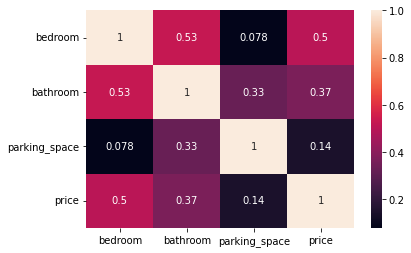

In [39]:
sns.heatmap(lag[lag["title"] == "Penthouse"].dropna().corr(), annot=True)

Thers is a big relationship between the bedroom and price, bedroom and bathroom

In [136]:
penthouse_data = lag[lag["title"] == "Penthouse"].sort_values(by="bedroom", ascending=True)
penthouse_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
7261,Lagos,Penthouse,1.00,7.00,6.00,3776223.76
10469,Lagos,Penthouse,1.00,2.00,NaN,2342688.95
9387,Lagos,Penthouse,1.00,2.00,6.00,3235380.60
1593,Lagos,Penthouse,1.00,1.00,3.00,5366902.74
12872,Lagos,Penthouse,1.00,1.00,1.00,5363228.82
5958,Lagos,Penthouse,1.00,1.00,NaN,2911523.37
4471,Lagos,Penthouse,1.00,1.00,2.00,5516364.48
9367,Lagos,Penthouse,2.00,2.00,4.00,7078167.09
6920,Lagos,Penthouse,2.00,2.00,1.00,3268828.98
11502,Lagos,Penthouse,2.00,5.00,6.00,3952815.88


In [ ]:

# Assuming you have a DataFrame named 'your_dataframe'
condition1 = (your_dataframe['bedroom'] == 1) & (your_dataframe['price'] > 4000000)

your_dataframe = your_dataframe[~condition1]

condition2 = (your_dataframe['bedroom'] == 1) & (your_dataframe['price'] > 4000000)

your_dataframe = your_dataframe[~condition1]

condition1 = (your_dataframe['bedroom'] == 1) & (your_dataframe['price'] > 4000000)

your_dataframe = your_dataframe[~condition1]


In [ ]:
import pandas as pd

# Assuming you have a DataFrame named 'df'
index_to_fill = 10469
condition_bathroom = 1

# Calculate the mean of 'price' when 'bathroom' is 1
mean_price_for_bathroom_1 = df[df['bathroom'] == condition_bathroom]['price'].mean()

# Fill in the missing value at the specified index with the calculated mean
df.loc[index_to_fill, 'price'] = mean_price_for_bathroom_1

# Display the updated DataFrame
print(df)


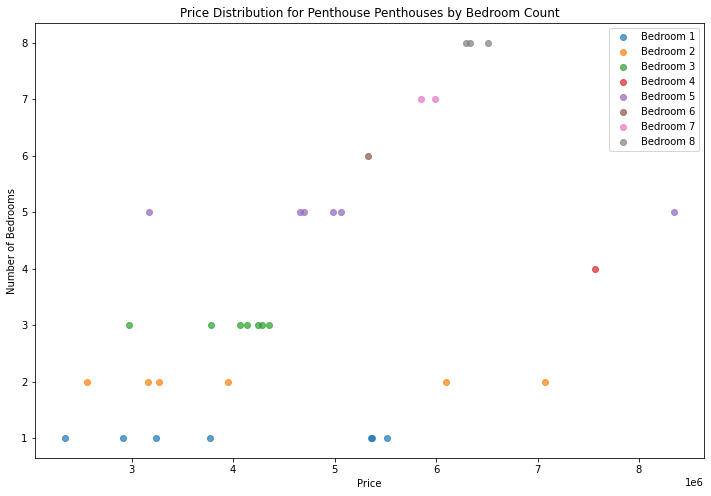

In [105]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 9):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Penthouses by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(penthouse_data, "Penthouse")


In [137]:
# Assuming you have a DataFrame named 'your_dataframe'
condition1 = (penthouse_data['bedroom'] == 1) & (penthouse_data['price'] > 4_000_000)

penthouse_data = penthouse_data[~condition1]

condition2 = (penthouse_data['bedroom'] == 2) & (penthouse_data['price'] > 6_000_000)

penthouse_data = penthouse_data[~condition2]

condition3 = (penthouse_data['bedroom'] == 3) & (penthouse_data['price'] < 3_000_000)

penthouse_data = penthouse_data[~condition3]

condition4 = (penthouse_data['bedroom'] == 4) & (penthouse_data['price'] > 6_000_000)

penthouse_data = penthouse_data[~condition4]

condition5 = (penthouse_data['bedroom'] == 5) & (penthouse_data['price'] < 4_000_000)

penthouse_data = penthouse_data[~condition5]

condition6 = (penthouse_data['bedroom'] == 5) & (penthouse_data['price'] > 6_000_000)

penthouse_data = penthouse_data[~condition6]

penthouse_data.head(50).sort_values(by="bedroom", ascending=True)

,loc,title,bedroom,bathroom,parking_space,price
7261,Lagos,Penthouse,1.00,7.00,6.00,3776223.76
10469,Lagos,Penthouse,1.00,2.00,NaN,2342688.95
9387,Lagos,Penthouse,1.00,2.00,6.00,3235380.60
5958,Lagos,Penthouse,1.00,1.00,NaN,2911523.37
6920,Lagos,Penthouse,2.00,2.00,1.00,3268828.98
11502,Lagos,Penthouse,2.00,5.00,6.00,3952815.88
3577,Lagos,Penthouse,2.00,2.00,1.00,2557691.98
2757,Lagos,Penthouse,2.00,1.00,1.00,3160660.34
10068,Lagos,Penthouse,3.00,4.00,6.00,4244483.58
1243,Lagos,Penthouse,3.00,5.00,6.00,4352652.21


In [138]:
float_cols = [cname for cname in penthouse_data.loc[:,:'price'].columns if 
                penthouse_data[cname].dtype in ['float64']]

from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
penthouse_data.loc[:,float_cols] = imputer.fit_transform(penthouse_data.loc[:,float_cols])

In [139]:
penthouse_data.head(50).sort_values(by="bedroom", ascending=True)

,loc,title,bedroom,bathroom,parking_space,price
7261,Lagos,Penthouse,1.00,7.00,6.00,3776223.76
10469,Lagos,Penthouse,1.00,2.00,2.60,2342688.95
9387,Lagos,Penthouse,1.00,2.00,6.00,3235380.60
5958,Lagos,Penthouse,1.00,1.00,2.60,2911523.37
10775,Lagos,Penthouse,1.60,2.00,4.00,3028390.77
8328,Lagos,Penthouse,1.80,2.00,4.00,3600947.41
11502,Lagos,Penthouse,2.00,5.00,6.00,3952815.88
3577,Lagos,Penthouse,2.00,2.00,1.00,2557691.98
2757,Lagos,Penthouse,2.00,1.00,1.00,3160660.34
6920,Lagos,Penthouse,2.00,2.00,1.00,3268828.98


<AxesSubplot:>

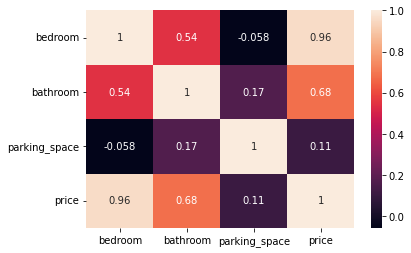

In [140]:
sns.heatmap(penthouse_data.dropna().corr(), annot=True)

In [ ]:
def outlier_iqr(data):
    q1,q3 = np.percentile(data,[25,75])
    iqr = q3-q1
    lower = q1-(iqr*2)
    upper = q3+(iqr*2)
    return np.where((data>upper)|(data<lower))


outlier_indices = outlier_iqr(lag[lag["title"] == "Penthouse"]["price"])

# Plot the data with outliers highlighted
plt.figure(figsize=(8, 6))
sns.boxplot(data=lag[lag["title"] == "Penthouse"]["price"])
plt.scatter(np.array(outlier_indices), lag[lag["title"] == "Penthouse"]["price"].iloc[outlier_indices], color='r', label='Outliers', s=100)
plt.xlabel('Data')
plt.ylabel('Price')
plt.title('Box plot with Outliers')
plt.legend()
plt.show()


From the previous corellation heatmap , it can be noted that the amount of bedroom influences the price the most followed by the amount of bathroom in the house , parking space influences it a little.

After checking the data , a lot of outliers is found

## Mansion

In [56]:
lag[lag["title"] == "Mansion"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,29.00000,29.00000,27.00000,33.00000
mean,4.27586,3.44828,3.29630,7933719.03073
std,2.18594,1.99260,2.09054,3418648.66779
min,1.00000,1.00000,1.00000,2417057.27400
25%,3.00000,2.00000,1.00000,6247851.74000
50%,4.00000,3.00000,3.00000,6742577.49900
75%,5.00000,5.00000,5.50000,8855421.03200
max,9.00000,7.00000,6.00000,16568486.16000


<AxesSubplot:>

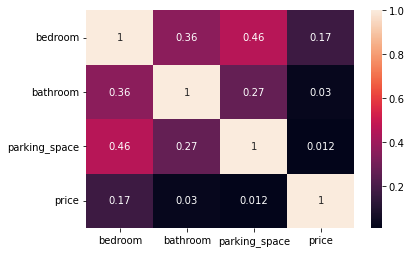

In [57]:
sns.heatmap(lag[lag["title"] == "Mansion"].dropna().corr(), annot=True)

In [149]:
mansion_data = lag[lag["title"] == "Mansion"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

mansion_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
9184,Lagos,Mansion,1.00,3.00,1.00,4329183.85
1576,Lagos,Mansion,1.00,3.00,1.00,4329183.85
13372,Lagos,Mansion,1.00,1.00,1.00,10190071.99
1205,Lagos,Mansion,2.00,2.00,1.00,12459581.99
2286,Lagos,Mansion,2.00,1.00,5.00,4968405.07
8643,Lagos,Mansion,2.00,4.00,NaN,5127445.72
11527,Lagos,Mansion,3.00,5.00,6.00,6247851.74
9798,Lagos,Mansion,3.00,1.00,2.00,5195165.02
7441,Lagos,Mansion,3.00,2.00,3.00,13449422.32
4978,Lagos,Mansion,3.00,7.00,6.00,6564036.97


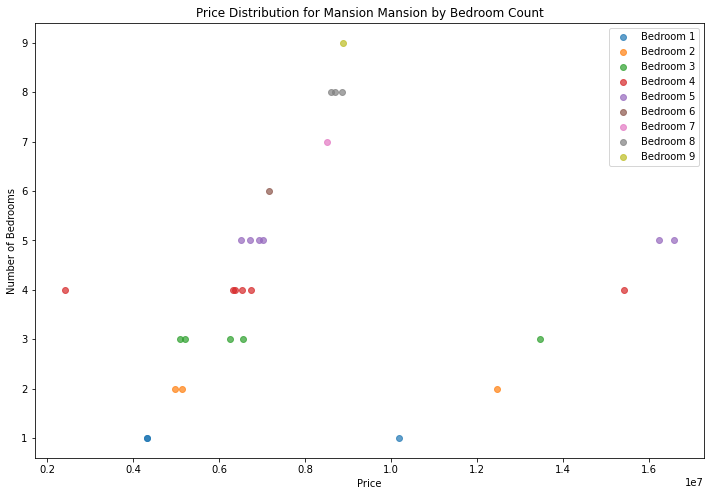

In [150]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Mansion by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(mansion_data, "Mansion")


In [144]:
# Assuming you have a DataFrame named 'your_dataframe'
condition1 = (mansion_data['bedroom'] == 1) & (mansion_data['price'] > 8_000_000)

mansion_data = mansion_data[~condition1]

condition2 = (mansion_data['bedroom'] == 2) & (mansion_data['price'] > 8_000_000)

mansion_data = mansion_data[~condition2]

condition3 = (mansion_data['bedroom'] == 3) & (mansion_data['price'] > 8_000_000)

mansion_data = mansion_data[~condition3]

condition4 = (mansion_data['bedroom'] == 4) & (mansion_data['price'] > 8_000_000)

mansion_data = mansion_data[~condition4]

condition5 = (mansion_data['bedroom'] == 4) & (mansion_data['price'] < 3_000_000)

mansion_data = mansion_data[~condition5]

condition6 = (mansion_data['bedroom'] == 5) & (mansion_data['price'] > 8_000_000)

mansion_data = mansion_data[~condition6]

float_cols = [cname for cname in penthouse_data.loc[:,:'price'].columns if 
                penthouse_data[cname].dtype in ['float64']]

from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
mansion_data.loc[:,float_cols] = imputer.fit_transform(mansion_data.loc[:,float_cols])

mansion_data.head(50).sort_values(by="bedroom", ascending=True)

,loc,title,bedroom,bathroom,parking_space,price
9184,Lagos,Mansion,1.00,3.00,1.00,4329183.85
1576,Lagos,Mansion,1.00,3.00,1.00,4329183.85
2286,Lagos,Mansion,2.00,1.00,5.00,4968405.07
8643,Lagos,Mansion,2.00,4.00,2.00,5127445.72
6403,Lagos,Mansion,3.00,2.40,1.00,5090085.96
9798,Lagos,Mansion,3.00,1.00,2.00,5195165.02
11527,Lagos,Mansion,3.00,5.00,6.00,6247851.74
4978,Lagos,Mansion,3.00,7.00,6.00,6564036.97
4072,Lagos,Mansion,4.00,6.00,4.00,6742577.50
4979,Lagos,Mansion,4.00,6.00,6.00,6405944.36


<AxesSubplot:>

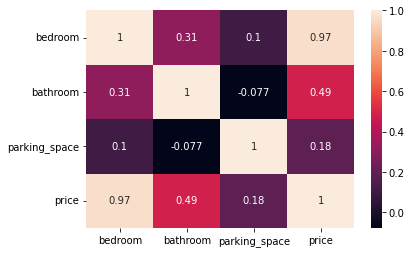

In [145]:
sns.heatmap(mansion_data.dropna().corr(), annot=True)

## Terrace duplex in Lagos

In [63]:
lag[lag["title"] == "Terrace duplex"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,30.00000,31.00000,29.00000,33.00000
mean,4.60000,3.00000,3.24138,3506516.62033
std,2.64705,2.03306,1.43066,1073203.43516
min,1.00000,1.00000,1.00000,1461065.86900
25%,2.00000,1.50000,2.00000,2585965.55100
50%,5.00000,2.00000,3.00000,3655308.16100
75%,6.00000,4.00000,4.00000,4445965.47800
max,9.00000,7.00000,6.00000,5318844.33900


<AxesSubplot:>

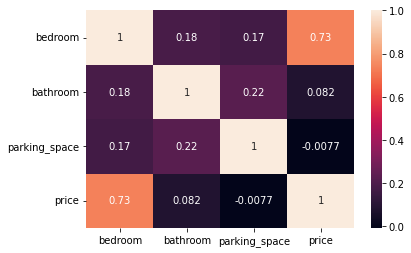

In [64]:
sns.heatmap(lag[lag["title"] == "Terrace duplex"].dropna().corr(), annot=True)

In [147]:
Terrace_duplex_data = lag[lag["title"] == "Terrace duplex"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Terrace_duplex_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
2434,Lagos,Terrace duplex,1.00,6.00,3.00,2411530.99
10662,Lagos,Terrace duplex,1.00,7.00,NaN,2585965.55
7059,Lagos,Terrace duplex,1.00,2.00,1.00,1461065.87
544,Lagos,Terrace duplex,2.00,1.00,1.00,3771720.04
1382,Lagos,Terrace duplex,2.00,1.00,4.00,1670947.01
12983,Lagos,Terrace duplex,2.00,4.00,3.00,2559914.54
2631,Lagos,Terrace duplex,2.00,2.00,5.00,2509691.18
9233,Lagos,Terrace duplex,2.00,1.00,3.00,4300962.55
4449,Lagos,Terrace duplex,2.00,2.00,3.00,1836444.64
5529,Lagos,Terrace duplex,2.00,6.00,4.00,2759460.79


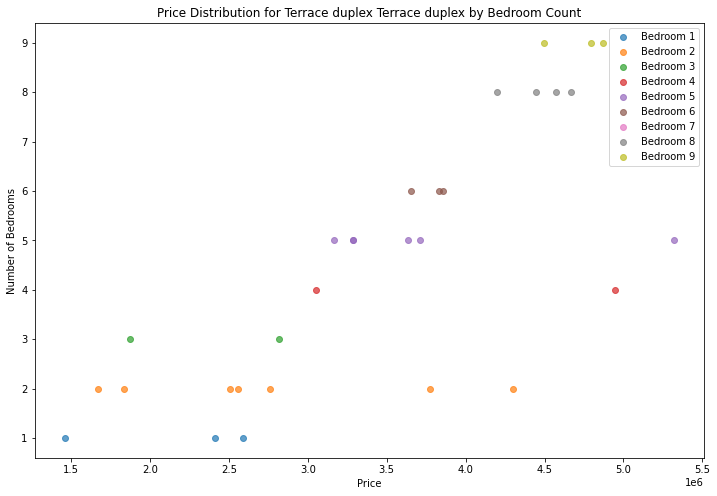

In [148]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Terrace duplex by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Terrace_duplex_data, "Terrace duplex")


In [151]:
# Assuming you have a DataFrame named 'your_dataframe'
condition1 = (Terrace_duplex_data['bedroom'] == 1) & (Terrace_duplex_data['price'] < 2_000_000)

Terrace_duplex_data = Terrace_duplex_data[~condition1]

condition2 = (Terrace_duplex_data['bedroom'] == 2) & (Terrace_duplex_data['price'] < 2_000_000)

Terrace_duplex_data = Terrace_duplex_data[~condition2]

condition3 = (Terrace_duplex_data['bedroom'] == 2) & (Terrace_duplex_data['price'] > 3_500_000)

Terrace_duplex_data = Terrace_duplex_data[~condition3]

condition4 = (Terrace_duplex_data['bedroom'] == 3) & (Terrace_duplex_data['price'] < 2_000_000)

Terrace_duplex_data = Terrace_duplex_data[~condition4]

condition5 = (Terrace_duplex_data['bedroom'] == 4) & (Terrace_duplex_data['price'] < 4_000_000)

Terrace_duplex_data = Terrace_duplex_data[~condition5]

condition6 = (Terrace_duplex_data['bedroom'] == 5) & (Terrace_duplex_data['price'] > 4_000_000)

Terrace_duplex_data = Terrace_duplex_data[~condition6]

float_cols = [cname for cname in Terrace_duplex_data.loc[:,:'price'].columns if 
                Terrace_duplex_data[cname].dtype in ['float64']]

from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
Terrace_duplex_data.loc[:,float_cols] = imputer.fit_transform(Terrace_duplex_data.loc[:,float_cols])

Terrace_duplex_data.head(50).sort_values(by="bedroom", ascending=True)

,loc,title,bedroom,bathroom,parking_space,price
2434,Lagos,Terrace duplex,1.00,6.00,3.00,2411530.99
10662,Lagos,Terrace duplex,1.00,7.00,3.60,2585965.55
3121,Lagos,Terrace duplex,1.60,1.00,3.00,2335256.62
12983,Lagos,Terrace duplex,2.00,4.00,3.00,2559914.54
2631,Lagos,Terrace duplex,2.00,2.00,5.00,2509691.18
5529,Lagos,Terrace duplex,2.00,6.00,4.00,2759460.79
4942,Lagos,Terrace duplex,3.00,2.00,3.40,2814753.64
7408,Lagos,Terrace duplex,4.00,2.00,3.00,4945764.86
10081,Lagos,Terrace duplex,5.00,2.00,2.00,3288872.92
6712,Lagos,Terrace duplex,5.00,1.00,2.80,3164212.65


<AxesSubplot:>

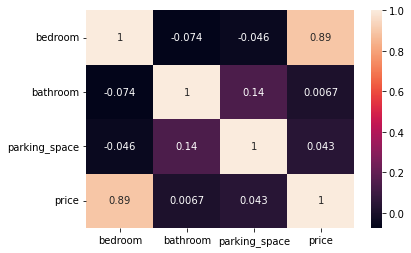

In [152]:
sns.heatmap(Terrace_duplex_data.dropna().corr(), annot=True)

# Semi-detached duplex

In [66]:
lag[lag["title"] == "Semi-detached duplex"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,27.00000,30.00000,27.00000,32.00000
mean,5.55556,3.66667,2.62963,3715216.57297
std,2.70801,2.30940,1.64429,972091.74887
min,1.00000,1.00000,1.00000,1741384.61200
25%,3.00000,2.00000,1.00000,2916432.42425
50%,6.00000,3.00000,2.00000,3792299.73700
75%,8.00000,6.00000,3.50000,4662623.63700
max,9.00000,7.00000,6.00000,4994274.08500


<AxesSubplot:>

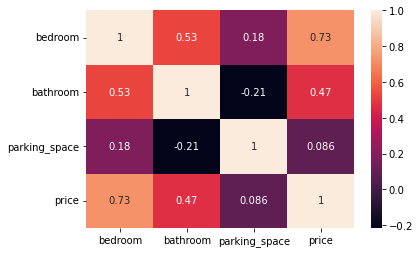

In [68]:
sns.heatmap(lag[lag["title"] == "Semi-detached duplex"].dropna().corr(), annot=True)

In [163]:
Semi_detached_data = lag[lag["title"] == "Semi-detached duplex"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Semi_detached_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
9461,Lagos,Semi-detached duplex,1.00,1.00,2.00,3744238.31
1303,Lagos,Semi-detached duplex,1.00,1.00,2.00,3805074.71
454,Lagos,Semi-detached duplex,2.00,3.00,4.00,2534802.86
2383,Lagos,Semi-detached duplex,2.00,1.00,3.00,1741384.61
8638,Lagos,Semi-detached duplex,3.00,4.00,2.00,2815202.71
7835,Lagos,Semi-detached duplex,3.00,2.00,1.00,1947601.51
3796,Lagos,Semi-detached duplex,3.00,1.00,5.00,2739867.66
12720,Lagos,Semi-detached duplex,3.00,3.00,1.00,2690542.44
9884,Lagos,Semi-detached duplex,4.00,2.00,1.00,4659957.05
9563,Lagos,Semi-detached duplex,4.00,6.00,2.00,3274831.25


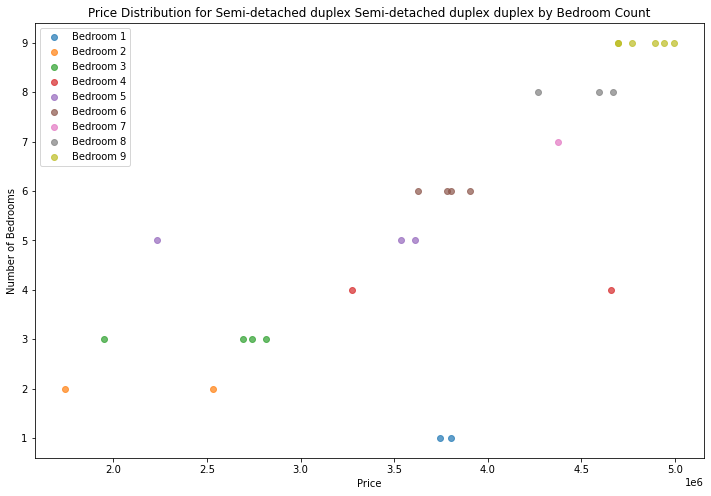

In [155]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Semi-detached duplex duplex by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Semi_detached_data, "Semi-detached duplex")


In [164]:
# Assuming you have a DataFrame named 'your_dataframe'
condition1 = (Semi_detached_data['bedroom'] == 1) & (Semi_detached_data['price'] > 3_000_000)

Semi_detached_data = Semi_detached_data[~condition1]

condition2 = (Semi_detached_data['bedroom'] == 2) & (Semi_detached_data['price'] < 2_000_000)

Semi_detached_data = Semi_detached_data[~condition2]

condition3 = (Semi_detached_data['bedroom'] == 3) & (Semi_detached_data['price'] < 2_000_000)

Semi_detached_data = Semi_detached_data[~condition3]

condition4 = (Semi_detached_data['bedroom'] == 4) & (Semi_detached_data['price'] > 4_000_000)

Semi_detached_data = Semi_detached_data[~condition4]

condition5 = (Semi_detached_data['bedroom'] == 5) & (Semi_detached_data['price'] < 3_000_000)

Semi_detached_data = Semi_detached_data[~condition5]

float_cols = [cname for cname in Semi_detached_data.loc[:,:'price'].columns if 
                Semi_detached_data[cname].dtype in ['float64']]

from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
Semi_detached_data.loc[:,float_cols] = imputer.fit_transform(Semi_detached_data.loc[:,float_cols])

Semi_detached_data.head(50).sort_values(by="bedroom", ascending=True)

,loc,title,bedroom,bathroom,parking_space,price
454,Lagos,Semi-detached duplex,2.00,3.00,4.00,2534802.86
8638,Lagos,Semi-detached duplex,3.00,4.00,2.00,2815202.71
3796,Lagos,Semi-detached duplex,3.00,1.00,5.00,2739867.66
12720,Lagos,Semi-detached duplex,3.00,3.00,1.00,2690542.44
9044,Lagos,Semi-detached duplex,3.00,1.00,3.00,2950175.66
7048,Lagos,Semi-detached duplex,3.00,2.00,1.00,2265538.90
9563,Lagos,Semi-detached duplex,4.00,6.00,2.00,3274831.25
157,Lagos,Semi-detached duplex,4.20,7.00,5.00,3189183.52
10340,Lagos,Semi-detached duplex,5.00,6.00,1.00,3538642.53
9804,Lagos,Semi-detached duplex,5.00,3.60,1.00,3613528.51


<AxesSubplot:>

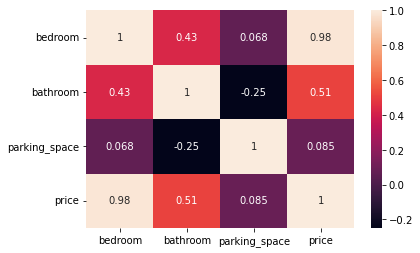

In [165]:
sns.heatmap(Semi_detached_data.dropna().corr(), annot=True)

# Townhouse 

In [71]:
lag[lag["title"] == "Townhouse"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,24.00000,27.00000,25.00000,30.00000
mean,3.83333,2.74074,2.56000,3524018.30797
std,2.20013,1.63125,1.41657,1097132.66890
min,1.00000,1.00000,1.00000,1662119.34000
25%,2.75000,2.00000,1.00000,2474929.81175
50%,4.00000,2.00000,3.00000,3461579.68250
75%,5.00000,3.50000,4.00000,4488763.70175
max,9.00000,6.00000,5.00000,5369144.74200


<AxesSubplot:>

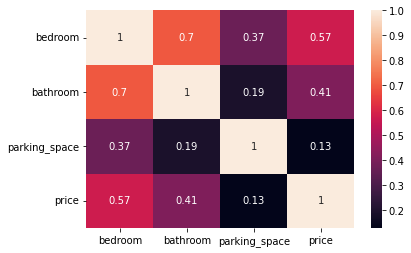

In [72]:
sns.heatmap(lag[lag["title"] == "Townhouse"].dropna().corr(), annot=True)

In [159]:
Townhouse_data = lag[lag["title"] == "Townhouse"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Townhouse_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
11054,Lagos,Townhouse,1.00,3.00,3.00,2422119.95
10314,Lagos,Townhouse,1.00,2.00,1.00,2228303.77
8935,Lagos,Townhouse,1.00,1.00,4.00,1662119.34
12246,Lagos,Townhouse,1.00,2.00,3.00,4490108.58
1077,Lagos,Townhouse,2.00,1.00,1.00,4484729.06
3944,Lagos,Townhouse,2.00,1.00,2.00,4254691.68
380,Lagos,Townhouse,3.00,5.00,NaN,3294442.90
2482,Lagos,Townhouse,3.00,NaN,4.00,2052838.85
2568,Lagos,Townhouse,3.00,2.00,3.00,2989518.22
3454,Lagos,Townhouse,3.00,1.00,1.00,4510700.12


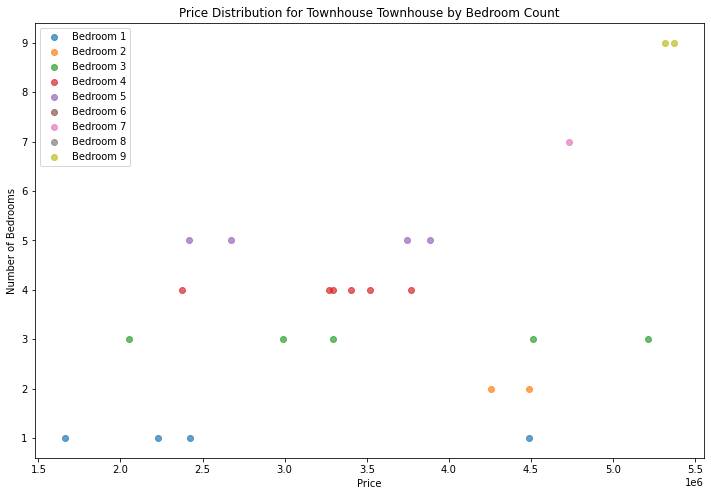

In [160]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Townhouse by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Townhouse_data, "Townhouse")

In [161]:
# Assuming you have a DataFrame named 'your_dataframe'
condition1 = (Townhouse_data['bedroom'] == 1) & (Townhouse_data['price'] < 2_000_000)

Townhouse_data = Townhouse_data[~condition1]

condition2 = (Townhouse_data['bedroom'] == 1) & (Townhouse_data['price'] > 4_000_000)

Townhouse_data = Townhouse_data[~condition2]

condition3 = (Townhouse_data['bedroom'] == 2) & (Townhouse_data['price'] > 4_000_000)

Townhouse_data = Townhouse_data[~condition3]

condition4 = (Townhouse_data['bedroom'] == 3) & (Townhouse_data['price'] > 4_000_000)

Townhouse_data = Townhouse_data[~condition4]

condition5 = (Townhouse_data['bedroom'] == 3) & (Townhouse_data['price'] < 2_500_000)

Townhouse_data = Townhouse_data[~condition5]

condition6 = (Townhouse_data['bedroom'] == 4) & (Townhouse_data['price'] < 2_500_000)

Townhouse_data = Townhouse_data[~condition6]

condition7 = (Townhouse_data['bedroom'] == 5) & (Townhouse_data['price'] < 3_000_000)

Townhouse_data = Townhouse_data[~condition7]

float_cols = [cname for cname in Townhouse_data.loc[:,:'price'].columns if 
                Townhouse_data[cname].dtype in ['float64']]

from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
Townhouse_data.loc[:,float_cols] = imputer.fit_transform(Townhouse_data.loc[:,float_cols])

Townhouse_data.head(50).sort_values(by="bedroom", ascending=True)

,loc,title,bedroom,bathroom,parking_space,price
11054,Lagos,Townhouse,1.00,3.00,3.00,2422119.95
10314,Lagos,Townhouse,1.00,2.00,1.00,2228303.77
699,Lagos,Townhouse,2.60,3.00,1.00,2633359.39
568,Lagos,Townhouse,2.60,2.00,2.00,2217249.65
6579,Lagos,Townhouse,2.60,2.00,1.00,2006727.65
2568,Lagos,Townhouse,3.00,2.00,3.00,2989518.22
380,Lagos,Townhouse,3.00,5.00,2.00,3294442.90
13482,Lagos,Townhouse,4.00,3.00,1.00,3295665.37
6774,Lagos,Townhouse,4.00,3.80,2.40,3766504.37
4492,Lagos,Townhouse,4.00,5.00,2.00,3517383.42


<AxesSubplot:>

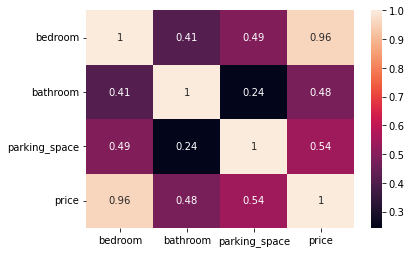

In [162]:
sns.heatmap(Townhouse_data.dropna().corr(), annot=True)

# Bungalow

In [74]:
lag[lag["title"] == "Bungalow"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,22.00000,23.00000,24.00000,28.00000
mean,4.77273,3.86957,3.00000,2945420.44314
std,2.79339,2.20133,1.58800,1015750.84252
min,1.00000,1.00000,1.00000,1368653.51200
25%,3.00000,2.00000,2.00000,1979431.07050
50%,4.00000,5.00000,3.00000,3037759.65450
75%,7.75000,5.50000,4.00000,3812818.21350
max,9.00000,7.00000,6.00000,4403066.16500


<AxesSubplot:>

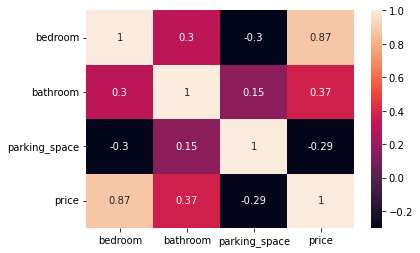

In [75]:
sns.heatmap(lag[lag["title"] == "Bungalow"].dropna().corr(), annot=True)

In [166]:
Bungalow_data = lag[lag["title"] == "Bungalow"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Bungalow_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
12870,Lagos,Bungalow,1.00,2.00,4.00,1368653.51
2844,Lagos,Bungalow,1.00,2.00,NaN,1436290.31
10096,Lagos,Bungalow,1.00,6.00,6.00,2284053.56
10023,Lagos,Bungalow,2.00,7.00,NaN,2536593.27
8600,Lagos,Bungalow,2.00,NaN,3.00,1635546.05
11400,Lagos,Bungalow,3.00,5.00,3.00,2640587.82
5077,Lagos,Bungalow,3.00,NaN,3.00,1777064.45
9053,Lagos,Bungalow,3.00,1.00,1.00,3663071.04
6447,Lagos,Bungalow,3.00,1.00,2.00,1573915.01
9128,Lagos,Bungalow,4.00,7.00,2.00,3015637.75


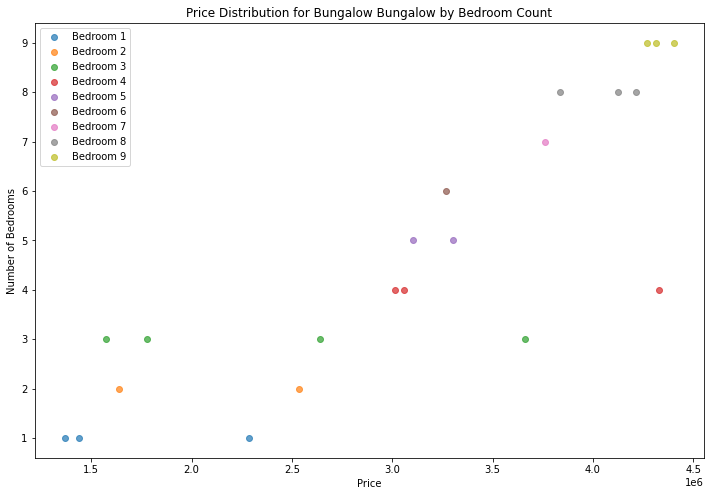

In [167]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Bungalow by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Bungalow_data, "Bungalow")

In [168]:
# Assuming you have a DataFrame named 'your_dataframe'
condition1 = (Bungalow_data['bedroom'] == 3) & (Bungalow_data['price'] < 3_000_000)

Bungalow_data = Bungalow_data[~condition1]

condition2 = (Bungalow_data['bedroom'] == 4) & (Bungalow_data['price'] > 4_000_000)

Bungalow_data = Bungalow_data[~condition2]


float_cols = [cname for cname in Bungalow_data.loc[:,:'price'].columns if 
                Bungalow_data[cname].dtype in ['float64']]

from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
Bungalow_data.loc[:,float_cols] = imputer.fit_transform(Bungalow_data.loc[:,float_cols])

Bungalow_data.head(50).sort_values(by="bedroom", ascending=True)

,loc,title,bedroom,bathroom,parking_space,price
12870,Lagos,Bungalow,1.00,2.00,4.00,1368653.51
2844,Lagos,Bungalow,1.00,2.00,2.20,1436290.31
10096,Lagos,Bungalow,1.00,6.00,6.00,2284053.56
7653,Lagos,Bungalow,1.40,1.00,2.00,1774251.73
6380,Lagos,Bungalow,1.40,2.00,1.00,1928916.80
13729,Lagos,Bungalow,1.40,5.00,1.00,1996269.16
10023,Lagos,Bungalow,2.00,7.00,3.60,2536593.27
8600,Lagos,Bungalow,2.00,2.40,3.00,1635546.05
288,Lagos,Bungalow,2.60,4.00,3.00,2292653.52
9053,Lagos,Bungalow,3.00,1.00,1.00,3663071.04


<AxesSubplot:>

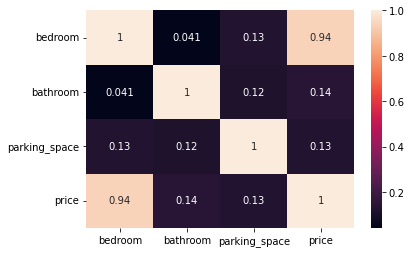

In [169]:
sns.heatmap(Bungalow_data.dropna().corr(), annot=True)

# Flat

In [77]:
lag[lag["title"] == "Flat"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,25.00000,24.00000,23.00000,26.00000
mean,4.32000,3.00000,2.91304,3189752.62542
std,2.46171,2.08514,1.41142,1099996.03968
min,1.00000,1.00000,1.00000,1265922.94900
25%,2.00000,1.00000,2.00000,1983351.51325
50%,4.00000,2.00000,3.00000,3520571.68600
75%,6.00000,4.00000,4.00000,4070025.88375
max,8.00000,7.00000,6.00000,4966246.25600


<AxesSubplot:>

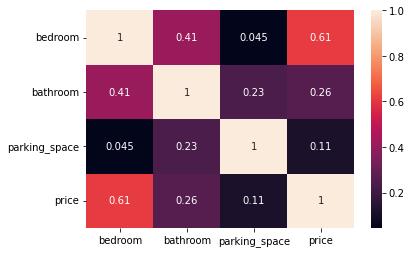

In [78]:
sns.heatmap(lag[lag["title"] == "Flat"].dropna().corr(), annot=True)

In [80]:
Flat_data = lag[lag["title"] == "Flat"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Flat_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
6392,Lagos,Flat,1.00,3.00,2.00,1907382.35
8670,Lagos,Flat,1.00,2.00,NaN,1265922.95
6735,Lagos,Flat,1.00,1.00,5.00,1906983.18
2731,Lagos,Flat,1.00,7.00,NaN,2217887.42
11407,Lagos,Flat,1.00,3.00,3.00,1951626.17
10656,Lagos,Flat,2.00,4.00,3.00,2292653.52
1152,Lagos,Flat,2.00,2.00,3.00,3996213.71
10000,Lagos,Flat,3.00,2.00,4.00,1751253.45
127,Lagos,Flat,3.00,1.00,2.00,3840740.33
3026,Lagos,Flat,4.00,NaN,4.00,4688124.44


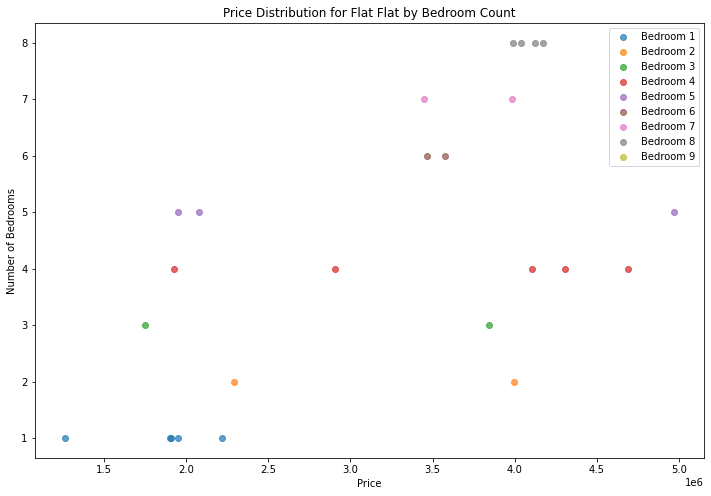

In [170]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Flat by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Flat_data, "Flat")

In [171]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    condition1 = (dataframe['bedroom'] == 2) & (dataframe['price'] > 3_000_000)
    dataframe = dataframe[~condition1]

    condition2 = (dataframe['bedroom'] == 3) & (dataframe['price'] > 3_000_000)
    dataframe = dataframe[~condition2]

    condition3 = (dataframe['bedroom'] == 4) & (dataframe['price'] > 4_000_000)
    dataframe = dataframe[~condition3]

    condition4 = (dataframe['bedroom'] == 5) & (dataframe['price'] > 4_000_000)
    dataframe = dataframe[~condition4]

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Flat_data = process_data(Flat_data)

<AxesSubplot:>

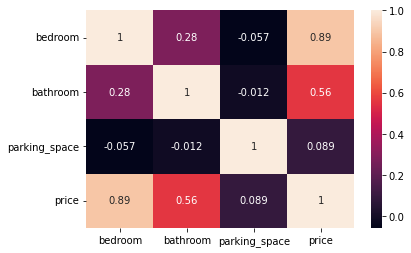

In [172]:
sns.heatmap(Flat_data.dropna().corr(), annot=True)

# Detached duplex

In [81]:
lag[lag["title"] == "Detached duplex"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,23.00000,23.00000,20.00000,25.00000
mean,4.56522,3.04348,3.10000,4552806.37560
std,2.40881,2.30569,1.83246,1133182.18756
min,1.00000,1.00000,1.00000,2595982.73500
25%,2.50000,1.00000,2.00000,3903973.64200
50%,4.00000,2.00000,2.50000,4678457.76700
75%,6.00000,5.00000,4.25000,5359154.45500
max,9.00000,7.00000,6.00000,6145977.42500


<AxesSubplot:>

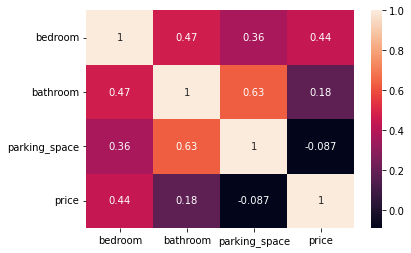

In [82]:
sns.heatmap(lag[lag["title"] == "Detached duplex"].dropna().corr(), annot=True)

In [83]:
Detached_duplex_data = lag[lag["title"] == "Detached duplex"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Detached_duplex_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
2111,Lagos,Detached duplex,1.00,1.00,5.00,2595982.73
13900,Lagos,Detached duplex,2.00,2.00,NaN,4887403.87
3008,Lagos,Detached duplex,2.00,2.00,2.00,5375883.49
5828,Lagos,Detached duplex,2.00,2.00,2.00,2850546.74
8192,Lagos,Detached duplex,2.00,5.00,NaN,3307634.39
7949,Lagos,Detached duplex,2.00,1.00,2.00,4678457.77
13352,Lagos,Detached duplex,3.00,5.00,4.00,3599248.54
10346,Lagos,Detached duplex,3.00,1.00,1.00,5359154.46
7699,Lagos,Detached duplex,3.00,2.00,1.00,5228732.28
2409,Lagos,Detached duplex,4.00,7.00,4.00,4139546.67


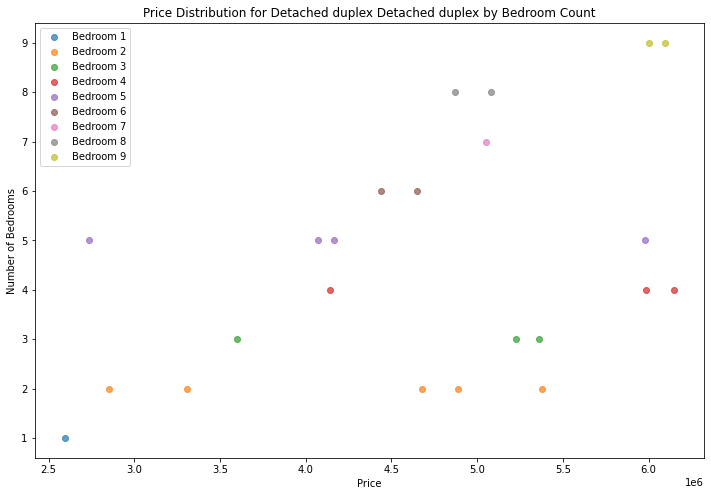

In [173]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Detached duplex by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Detached_duplex_data, "Detached duplex")

<AxesSubplot:>

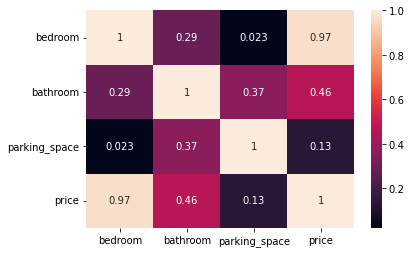

In [175]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    condition1 = (dataframe['bedroom'] == 2) & (dataframe['price'] > 4_000_000)
    dataframe = dataframe[~condition1]

    condition2 = (dataframe['bedroom'] == 3) & (dataframe['price'] > 4_000_000)
    dataframe = dataframe[~condition2]

    condition3 = (dataframe['bedroom'] == 4) & (dataframe['price'] > 5_000_000)
    dataframe = dataframe[~condition3]

    condition4 = (dataframe['bedroom'] == 5) & (dataframe['price'] > 5_000_000)
    dataframe = dataframe[~condition4]
    
    condition4 = (dataframe['bedroom'] == 5) & (dataframe['price'] < 3_000_000)
    dataframe = dataframe[~condition4]

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Detached_duplex_data = process_data(Detached_duplex_data)

sns.heatmap(Detached_duplex_data.dropna().corr(), annot=True)

# Apartment

In [84]:
lag[lag["title"] == "Apartment"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,15.00000,18.00000,16.00000,20.00000
mean,4.33333,2.94444,3.31250,2931516.94415
std,2.69037,1.98442,1.57982,787063.76540
min,1.00000,1.00000,1.00000,1561176.64300
25%,1.50000,1.00000,2.00000,2255503.23175
50%,4.00000,2.00000,3.00000,3055176.57700
75%,7.00000,4.75000,5.00000,3382123.51900
max,9.00000,7.00000,6.00000,4159240.90200


<AxesSubplot:>

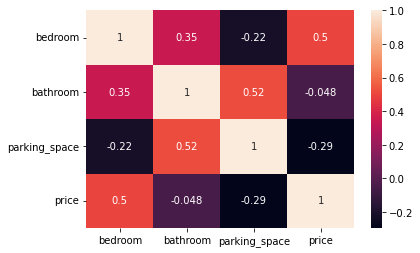

In [85]:
sns.heatmap(lag[lag["title"] == "Apartment"].dropna().corr(), annot=True)

In [86]:
Apartment_data = lag[lag["title"] == "Apartment"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Apartment_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
2632,Lagos,Apartment,1.00,2.00,3.00,3300437.40
3228,Lagos,Apartment,1.00,3.00,4.00,1755092.62
5561,Lagos,Apartment,1.00,1.00,2.00,2854608.90
11538,Lagos,Apartment,1.00,1.00,2.00,1561176.64
2285,Lagos,Apartment,2.00,6.00,3.00,2141881.79
526,Lagos,Apartment,4.00,1.00,1.00,3759801.23
8955,Lagos,Apartment,4.00,4.00,5.00,2622964.35
11252,Lagos,Apartment,4.00,1.00,1.00,2293377.04
1816,Lagos,Apartment,5.00,2.00,NaN,2061514.01
8854,Lagos,Apartment,5.00,NaN,5.00,2772673.69


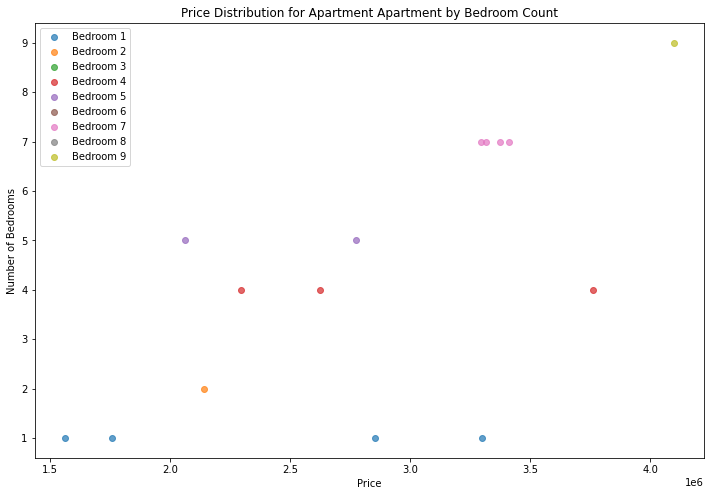

In [176]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Apartment by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Apartment_data, "Apartment")

<AxesSubplot:>

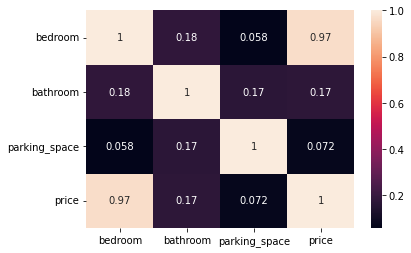

In [177]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    condition1 = (dataframe['bedroom'] == 1) & (dataframe['price'] > 2_500_000)
    dataframe = dataframe[~condition1]

    condition2 = (dataframe['bedroom'] == 4) & (dataframe['price'] > 3_500_000)
    dataframe = dataframe[~condition2]

    condition3 = (dataframe['bedroom'] == 5) & (dataframe['price'] < 2_500_000)
    dataframe = dataframe[~condition3]

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Apartment_data = process_data(Apartment_data)

sns.heatmap(Apartment_data.dropna().corr(), annot=True)

# Cottage

In [87]:
lag[lag["title"] == "Cottage"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,8.00000,11.00000,7.00000,11.00000
mean,2.75000,1.45455,2.57143,3897694.91118
std,1.66905,0.52223,0.97590,1375847.60420
min,1.00000,1.00000,1.00000,1207450.15000
25%,1.00000,1.00000,2.00000,3640035.85800
50%,3.00000,1.00000,3.00000,4338360.59300
75%,4.00000,2.00000,3.00000,4836230.81850
max,5.00000,2.00000,4.00000,5359255.23900


<AxesSubplot:>

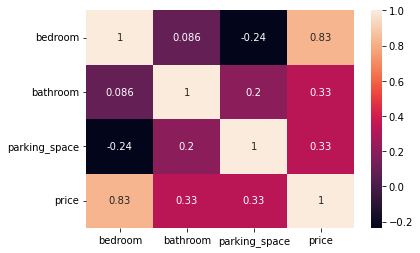

In [88]:
sns.heatmap(lag[lag["title"] == "Cottage"].dropna().corr(), annot=True)

In [89]:
Cottage_data = lag[lag["title"] == "Cottage"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Cottage_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
4317,Lagos,Cottage,1.00,1.00,4.00,4034776.52
6955,Lagos,Cottage,1.00,1.00,3.00,3879799.56
7662,Lagos,Cottage,1.00,1.00,1.00,3400272.15
2555,Lagos,Cottage,2.00,2.00,3.00,4338360.59
2001,Lagos,Cottage,4.00,1.00,2.00,4639239.26
10428,Lagos,Cottage,4.00,2.00,NaN,1479100.71
12466,Lagos,Cottage,4.00,1.00,NaN,4851586.16
1738,Lagos,Cottage,5.00,1.00,NaN,5359255.24
3041,Lagos,Cottage,NaN,2.00,3.00,1207450.15
11188,Lagos,Cottage,NaN,2.00,NaN,4820875.48


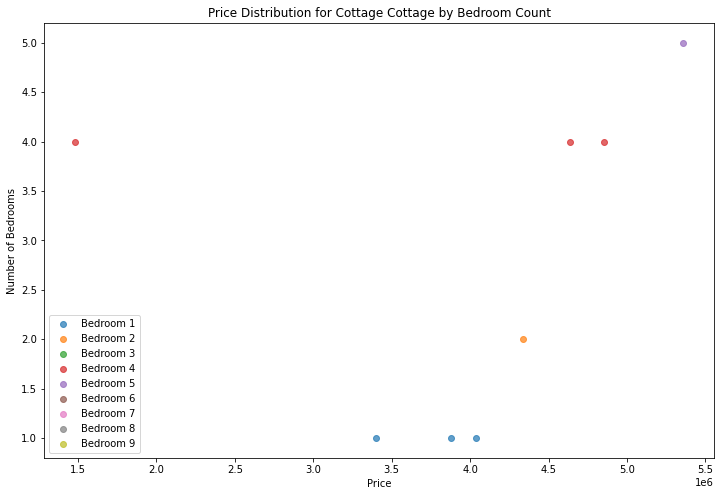

In [178]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Cottage by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Cottage_data, "Cottage")

<AxesSubplot:>

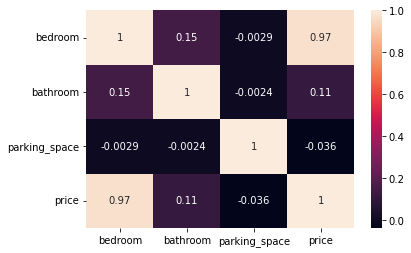

In [179]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    condition1 = (dataframe['bedroom'] == 4) & (dataframe['price'] < 2_500_000)
    dataframe = dataframe[~condition1]


    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Apartment_data = process_data(Apartment_data)

sns.heatmap(Apartment_data.dropna().corr(), annot=True)

# Bayelsa 

In [90]:
bay = housing_train[housing_train["loc" ] == "Bayelsa"]
bay.head()

,loc,title,bedroom,bathroom,parking_space,price
11,Bayelsa,Apartment,3.00,4.00,2.00,1891772.07
48,Bayelsa,Penthouse,2.00,2.00,2.00,3225484.92
55,Bayelsa,NaN,2.00,3.00,1.00,1787653.18
91,Bayelsa,Flat,7.00,1.00,NaN,3066065.16
124,Bayelsa,Townhouse,6.00,4.00,2.00,3482684.79


In [91]:
bay["title"].value_counts()

Mansion                 40
Flat                    36
Townhouse               36
Bungalow                33
Penthouse               27
Semi-detached duplex    27
Terrace duplex          26
Apartment               25
Detached duplex         24
Cottage                 10
Name: title, dtype: int64

# Mansion Prices in Bayelsa

In [180]:
bay[bay["title"] == "Mansion"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,33.00000,32.00000,38.00000,40.00000
mean,4.15152,3.62500,2.97368,5116607.51217
std,2.51398,2.22522,1.60214,1803522.31937
min,1.00000,1.00000,1.00000,2209766.79400
25%,2.00000,2.00000,1.25000,3482337.09500
50%,4.00000,3.00000,3.00000,5195305.69900
75%,6.00000,6.00000,4.00000,6504678.87925
max,9.00000,7.00000,6.00000,8082018.30200


<AxesSubplot:>

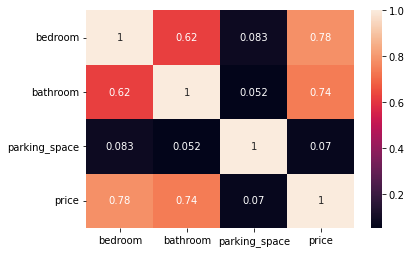

In [181]:
sns.heatmap(bay[bay["title"] == "Mansion"].dropna().corr(), annot=True)

In [182]:
Mansion_data = bay[bay["title"] == "Mansion"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Mansion_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
798,Bayelsa,Mansion,1.00,NaN,1.00,4098277.26
9513,Bayelsa,Mansion,1.00,NaN,2.00,2209766.79
9145,Bayelsa,Mansion,1.00,2.00,1.00,5158183.53
1562,Bayelsa,Mansion,1.00,3.00,NaN,4010180.09
2088,Bayelsa,Mansion,1.00,2.00,3.00,5369545.01
6645,Bayelsa,Mansion,1.00,1.00,4.00,3576720.85
12693,Bayelsa,Mansion,2.00,6.00,5.00,4769873.53
11186,Bayelsa,Mansion,2.00,1.00,3.00,2460895.02
6396,Bayelsa,Mansion,2.00,1.00,4.00,2290874.40
13896,Bayelsa,Mansion,2.00,1.00,4.00,2362338.10


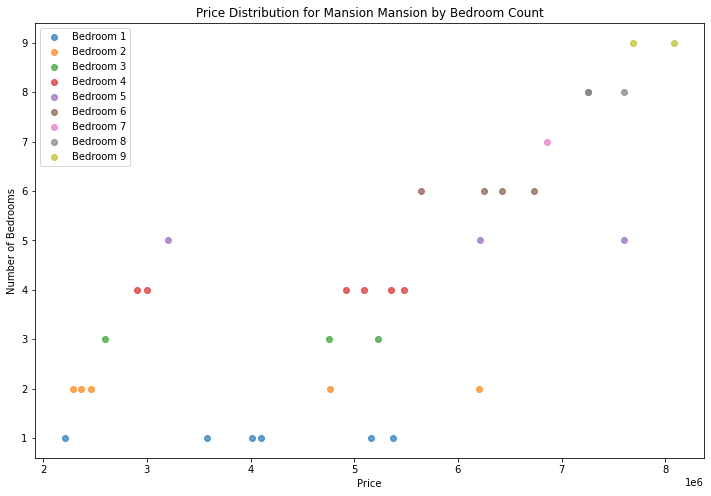

In [183]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Mansion by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Mansion_data, "Mansion")

<AxesSubplot:>

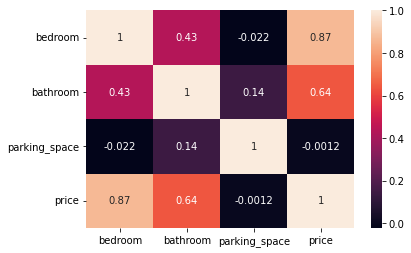

In [184]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    condition1 = (dataframe['bedroom'] == 1) & (dataframe['price'] > 5_000_000)
    dataframe = dataframe[~condition1]

    condition2 = (dataframe['bedroom'] == 2) & (dataframe['price'] > 6_000_000)
    dataframe = dataframe[~condition2]

    condition3 = (dataframe['bedroom'] == 5) & (dataframe['price'] < 7_000_000)
    dataframe = dataframe[~condition3]

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Mansion_data = process_data(Mansion_data)

sns.heatmap(Mansion_data.dropna().corr(), annot=True)

# Flat

In [185]:
bay[bay["title"] == "Flat"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,32.00000,29.00000,27.00000,36.00000
mean,5.34375,3.48276,3.22222,2749633.57969
std,2.36383,1.99322,1.57708,654417.49568
min,1.00000,1.00000,1.00000,1491822.25000
25%,3.75000,2.00000,2.00000,2232131.48925
50%,5.00000,3.00000,3.00000,2800438.64000
75%,7.00000,5.00000,4.00000,3166757.48475
max,9.00000,7.00000,6.00000,3889499.42900


<AxesSubplot:>

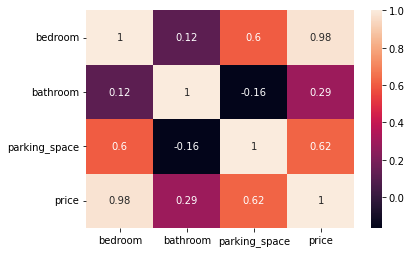

In [186]:
sns.heatmap(bay[bay["title"] == "Flat"].dropna().corr(), annot=True)

In [187]:
Flat_data = bay[bay["title"] == "Flat"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Flat_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
9844,Bayelsa,Flat,1.00,2.00,NaN,1491822.25
4157,Bayelsa,Flat,1.00,2.00,NaN,1643725.51
2566,Bayelsa,Flat,2.00,5.00,1.00,1897290.16
3053,Bayelsa,Flat,2.00,2.00,NaN,1764947.64
4551,Bayelsa,Flat,3.00,1.00,NaN,2082489.78
12923,Bayelsa,Flat,3.00,2.00,3.00,2053626.24
7903,Bayelsa,Flat,3.00,1.00,NaN,1922052.02
3403,Bayelsa,Flat,3.00,5.00,2.00,2181645.63
176,Bayelsa,Flat,4.00,1.00,2.00,2215085.18
318,Bayelsa,Flat,4.00,2.00,NaN,2302863.32


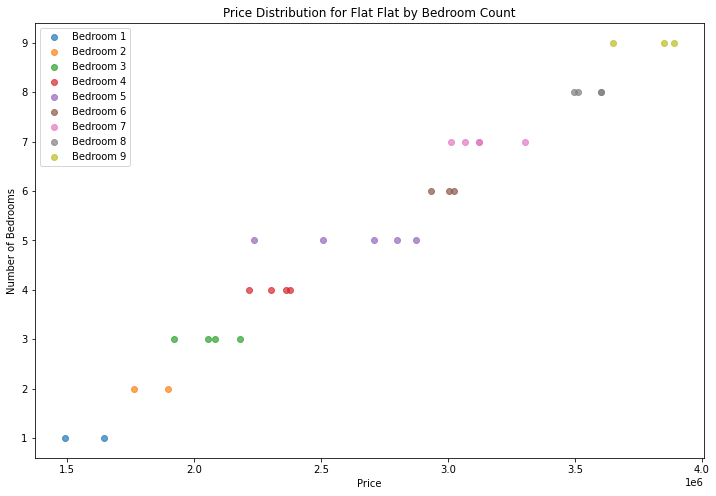

In [188]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Flat by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Flat_data, "Flat")

<AxesSubplot:>

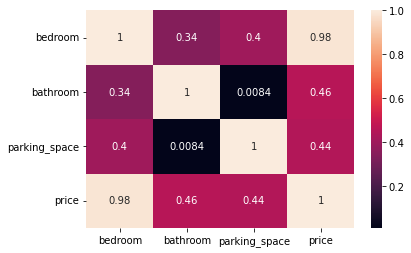

In [190]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Flat_data = process_data(Flat_data)

sns.heatmap(Flat_data.dropna().corr(), annot=True)

# Townhouse

In [191]:
bay[bay["title"] == "Townhouse"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,31.00000,28.00000,30.00000,36.00000
mean,4.58065,2.57143,2.90000,2949452.06603
std,2.56612,1.89402,1.42272,803027.38252
min,1.00000,1.00000,1.00000,1858817.59000
25%,2.50000,1.00000,2.00000,2362844.97800
50%,5.00000,2.00000,3.00000,2831658.83600
75%,7.00000,3.25000,4.00000,3580853.06200
max,9.00000,7.00000,6.00000,4415843.24100


<AxesSubplot:>

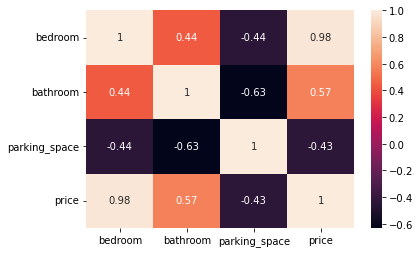

In [192]:
sns.heatmap(bay[bay["title"] == "Townhouse"].dropna().corr(), annot=True)

In [193]:
Townhouse_data = bay[bay["title"] == "Townhouse"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Townhouse_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
13320,Bayelsa,Townhouse,1.00,NaN,2.00,2066213.59
10171,Bayelsa,Townhouse,1.00,1.00,4.00,1905120.83
403,Bayelsa,Townhouse,1.00,3.00,NaN,2052523.49
524,Bayelsa,Townhouse,1.00,NaN,2.00,1858817.59
6500,Bayelsa,Townhouse,1.00,1.00,6.00,2006567.47
2370,Bayelsa,Townhouse,1.00,NaN,4.00,2003349.03
9803,Bayelsa,Townhouse,2.00,2.00,3.00,2218492.24
6344,Bayelsa,Townhouse,2.00,NaN,3.00,2424061.58
11877,Bayelsa,Townhouse,3.00,2.00,4.00,2410962.56
4360,Bayelsa,Townhouse,3.00,1.00,NaN,2452378.94


<AxesSubplot:>

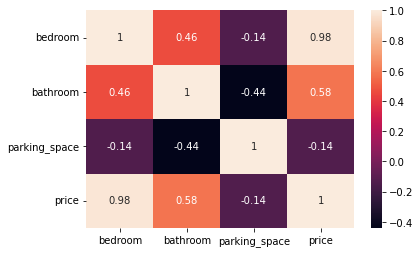

In [194]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Townhouse_data = process_data(Townhouse_data)

sns.heatmap(Townhouse_data.dropna().corr(), annot=True)

# Bungalow

In [195]:
bay[bay["title"] == "Bungalow"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,31.00000,30.00000,26.00000,33.00000
mean,4.48387,3.33333,2.92308,2508942.24045
std,2.70642,2.07337,1.71868,727838.03536
min,1.00000,1.00000,1.00000,1479100.06900
25%,2.00000,1.00000,1.25000,1791324.14700
50%,4.00000,3.50000,2.50000,2471527.69000
75%,6.50000,5.00000,4.75000,3048011.48000
max,9.00000,7.00000,6.00000,3761808.76800


<AxesSubplot:>

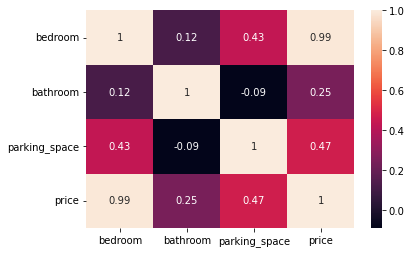

In [196]:
sns.heatmap(bay[bay["title"] == "Bungalow"].dropna().corr(), annot=True)

In [197]:
Bungalow_data = bay[bay["title"] == "Bungalow"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Bungalow_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
9843,Bayelsa,Bungalow,1.00,1.00,3.00,1565739.30
12706,Bayelsa,Bungalow,1.00,5.00,1.00,1656277.73
2585,Bayelsa,Bungalow,1.00,2.00,1.00,1479100.07
4446,Bayelsa,Bungalow,1.00,3.00,1.00,1546640.74
9867,Bayelsa,Bungalow,2.00,1.00,2.00,1736188.79
7617,Bayelsa,Bungalow,2.00,4.00,2.00,1878907.75
12866,Bayelsa,Bungalow,2.00,1.00,2.00,1678012.91
4631,Bayelsa,Bungalow,2.00,2.00,3.00,1750462.68
3779,Bayelsa,Bungalow,2.00,1.00,NaN,1637886.39
11060,Bayelsa,Bungalow,2.00,1.00,NaN,1791324.15


<AxesSubplot:>

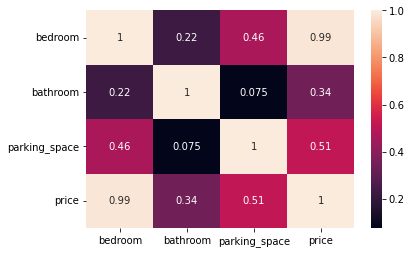

In [198]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Bungalow_data = process_data(Bungalow_data)

sns.heatmap(Bungalow_data.dropna().corr(), annot=True)

# Penthouse

In [199]:
bay[bay["title"] == "Penthouse"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,25.00000,25.00000,22.00000,27.00000
mean,3.80000,3.72000,3.13636,3706899.75848
std,2.38048,2.09205,2.00702,840723.81233
min,1.00000,1.00000,1.00000,2469759.30800
25%,2.00000,2.00000,1.00000,3151513.12850
50%,3.00000,4.00000,3.00000,3639386.77100
75%,5.00000,5.00000,5.00000,4200747.59950
max,9.00000,7.00000,6.00000,5834908.69800


<AxesSubplot:>

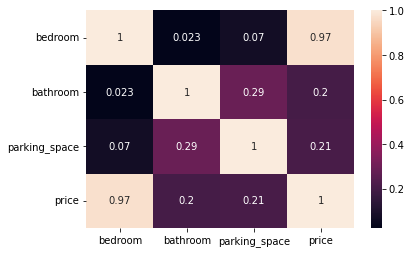

In [200]:
sns.heatmap(bay[bay["title"] == "Penthouse"].dropna().corr(), annot=True)

In [201]:
Penthouse_data = bay[bay["title"] == "Penthouse"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Penthouse_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
159,Bayelsa,Penthouse,1.00,4.00,1.00,2558839.36
459,Bayelsa,Penthouse,1.00,3.00,1.00,2469759.31
3362,Bayelsa,Penthouse,1.00,2.00,6.00,2676722.44
6996,Bayelsa,Penthouse,1.00,7.00,6.00,3122122.69
48,Bayelsa,Penthouse,2.00,2.00,2.00,3225484.92
7221,Bayelsa,Penthouse,2.00,7.00,NaN,3164653.28
3233,Bayelsa,Penthouse,2.00,2.00,1.00,2719253.04
10632,Bayelsa,Penthouse,2.00,NaN,1.00,2719253.04
5421,Bayelsa,Penthouse,2.00,2.00,1.00,3138372.97
9269,Bayelsa,Penthouse,3.00,4.00,3.00,3361311.14


<AxesSubplot:>

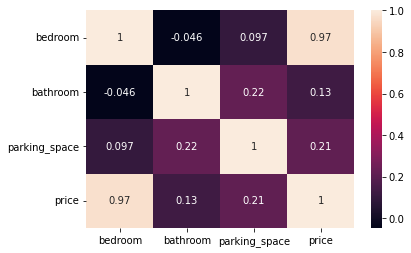

In [202]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Penthouse_data = process_data(Penthouse_data)

sns.heatmap(Penthouse_data.dropna().corr(), annot=True)

# Semi-detached duplex

In [203]:
bay[bay["title"] == "Semi-detached duplex"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,21.00000,24.00000,23.00000,27.00000
mean,4.85714,3.50000,3.26087,2795171.60485
std,2.32993,2.00000,1.42118,718249.61471
min,1.00000,1.00000,1.00000,1691715.39300
25%,4.00000,1.75000,2.50000,2250008.48500
50%,5.00000,4.00000,3.00000,2930742.98200
75%,6.00000,4.25000,4.50000,3271259.01400
max,9.00000,7.00000,5.00000,4163708.33500


<AxesSubplot:>

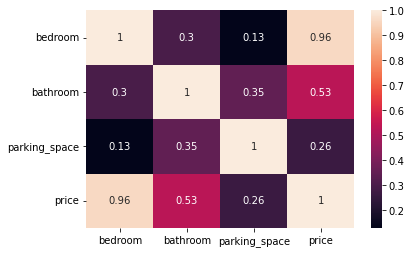

In [204]:
sns.heatmap(bay[bay["title"] == "Semi-detached duplex"].dropna().corr(), annot=True)

In [205]:
Semi_detached_duplex_data = bay[bay["title"] == "Semi-detached duplex"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Semi_detached_duplex_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
4573,Bayelsa,Semi-detached duplex,1.00,1.00,NaN,1741015.41
1268,Bayelsa,Semi-detached duplex,1.00,1.00,1.00,1691715.39
4493,Bayelsa,Semi-detached duplex,1.00,4.00,NaN,1956897.64
12131,Bayelsa,Semi-detached duplex,2.00,1.00,NaN,2075277.68
10734,Bayelsa,Semi-detached duplex,3.00,3.00,5.00,2423183.19
5977,Bayelsa,Semi-detached duplex,4.00,NaN,2.00,2449095.59
5629,Bayelsa,Semi-detached duplex,4.00,7.00,5.00,2942092.19
4433,Bayelsa,Semi-detached duplex,4.00,1.00,NaN,2449095.59
11223,Bayelsa,Semi-detached duplex,4.00,1.00,3.00,2498706.64
10889,Bayelsa,Semi-detached duplex,5.00,1.00,3.00,2518785.98


<AxesSubplot:>

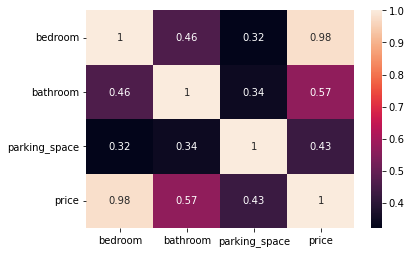

In [207]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Semi_detached_duplex_data = process_data(Semi_detached_duplex_data)

sns.heatmap(Semi_detached_duplex_data.dropna().corr(), annot=True)

# Terrace duplex

In [208]:
bay[bay["title"] == "Terrace duplex"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,20.00000,23.00000,21.00000,26.00000
mean,4.35000,3.82609,2.61905,2699855.34677
std,2.25424,2.30912,1.46548,650035.78531
min,1.00000,1.00000,1.00000,1772801.60500
25%,2.75000,2.00000,1.00000,2201701.72750
50%,4.50000,3.00000,2.00000,2526630.90500
75%,6.00000,6.50000,4.00000,3224913.45600
max,8.00000,7.00000,6.00000,3898738.48800


<AxesSubplot:>

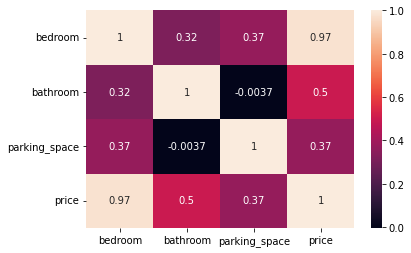

In [209]:
sns.heatmap(bay[bay["title"] == "Terrace duplex"].dropna().corr(), annot=True)

In [210]:
Terrace_duplex_data = bay[bay["title"] == "Terrace duplex"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Terrace_duplex_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
1556,Bayelsa,Terrace duplex,1.00,NaN,2.00,1847582.43
12329,Bayelsa,Terrace duplex,1.00,1.00,1.00,1772801.60
10162,Bayelsa,Terrace duplex,1.00,7.00,2.00,2018938.26
6673,Bayelsa,Terrace duplex,2.00,7.00,NaN,2320453.56
6187,Bayelsa,Terrace duplex,2.00,2.00,3.00,1937353.20
804,Bayelsa,Terrace duplex,3.00,1.00,NaN,2289113.72
1862,Bayelsa,Terrace duplex,3.00,2.00,1.00,2172564.40
12410,Bayelsa,Terrace duplex,4.00,2.00,2.00,2510766.39
13129,Bayelsa,Terrace duplex,4.00,NaN,1.00,2411114.28
5941,Bayelsa,Terrace duplex,4.00,2.00,NaN,2542495.42


<AxesSubplot:>

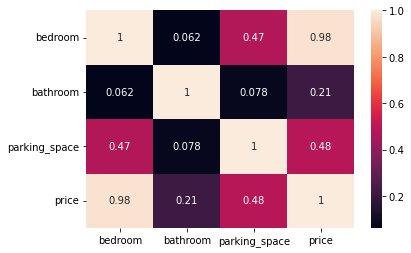

In [211]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Terrace_duplex_data = process_data(Terrace_duplex_data)

sns.heatmap(Terrace_duplex_data.dropna().corr(), annot=True)

# Apartment

In [212]:
bay[bay["title"] == "Apartment"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,22.00000,20.00000,23.00000,25.00000
mean,4.18182,2.95000,3.30435,2187480.83040
std,2.12998,1.82021,1.52061,539587.95779
min,1.00000,1.00000,1.00000,1425492.53800
25%,3.00000,1.75000,2.00000,1859602.85600
50%,4.00000,2.00000,3.00000,2060922.53000
75%,5.75000,4.00000,4.00000,2474095.22600
max,9.00000,7.00000,6.00000,3384157.72900


<AxesSubplot:>

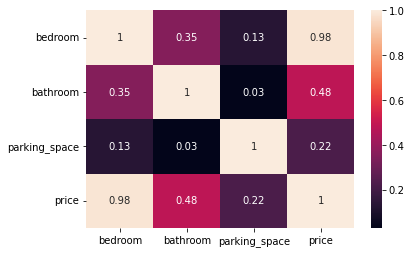

In [213]:
sns.heatmap(bay[bay["title"] == "Apartment"].dropna().corr(), annot=True)

In [214]:
Apartment_data = bay[bay["title"] == "Apartment"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Apartment_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
4684,Bayelsa,Apartment,1.00,1.00,6.00,1425492.54
5231,Bayelsa,Apartment,1.00,NaN,4.00,1457661.75
11484,Bayelsa,Apartment,2.00,2.00,1.00,1535551.02
1259,Bayelsa,Apartment,2.00,NaN,4.00,1583229.56
7688,Bayelsa,Apartment,3.00,5.00,2.00,1939738.25
4552,Bayelsa,Apartment,3.00,2.00,6.00,1923366.00
3506,Bayelsa,Apartment,3.00,NaN,4.00,1859602.86
11,Bayelsa,Apartment,3.00,4.00,2.00,1891772.07
2891,Bayelsa,Apartment,3.00,2.00,3.00,1799282.93
1505,Bayelsa,Apartment,3.00,1.00,2.00,1747873.53


<AxesSubplot:>

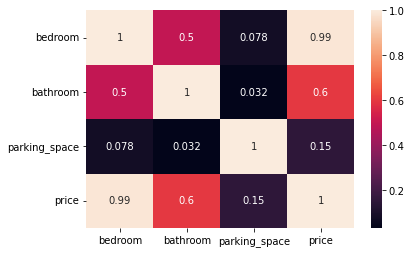

In [215]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Apartment_data = process_data(Apartment_data)

sns.heatmap(Apartment_data.dropna().corr(), annot=True)

# Detached duplex

In [216]:
bay[bay["title"] == "Detached duplex"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,20.00000,19.00000,21.00000,24.00000
mean,4.60000,2.36842,2.85714,3218906.15983
std,2.37088,1.64014,1.98206,823707.22344
min,1.00000,1.00000,1.00000,2177700.80100
25%,2.75000,1.00000,1.00000,2507589.03525
50%,5.00000,2.00000,2.00000,3099289.56200
75%,6.00000,3.00000,4.00000,3895432.75650
max,9.00000,7.00000,6.00000,5020767.80400


<AxesSubplot:>

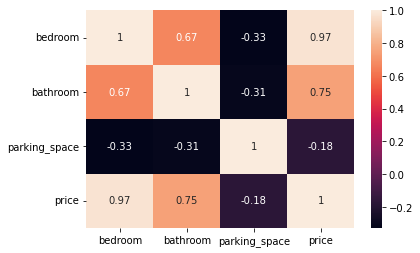

In [217]:
sns.heatmap(bay[bay["title"] == "Detached duplex"].dropna().corr(), annot=True)

In [219]:
Detached_duplex_data = bay[bay["title"] == "Detached duplex"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Detached_duplex_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
6857,Bayelsa,Detached duplex,1.00,1.00,6.00,2200259.11
10794,Bayelsa,Detached duplex,1.00,1.00,NaN,2177700.80
12218,Bayelsa,Detached duplex,1.00,NaN,3.00,2199564.29
11389,Bayelsa,Detached duplex,2.00,2.00,1.00,2379276.23
7142,Bayelsa,Detached duplex,2.00,3.00,4.00,2550359.97
11241,Bayelsa,Detached duplex,3.00,2.00,5.00,2831540.35
1206,Bayelsa,Detached duplex,3.00,1.00,6.00,2806264.54
9460,Bayelsa,Detached duplex,5.00,NaN,2.00,3121964.77
9105,Bayelsa,Detached duplex,5.00,NaN,2.00,3277548.72
186,Bayelsa,Detached duplex,5.00,1.00,NaN,3232095.71


<AxesSubplot:>

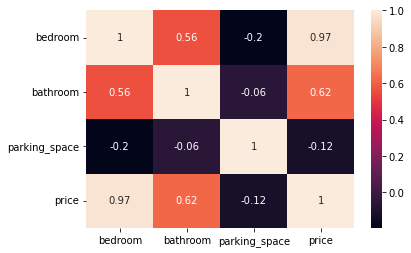

In [220]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Detached_duplex_data = process_data(Detached_duplex_data)

sns.heatmap(Detached_duplex_data.dropna().corr(), annot=True)

# Cottage

In [221]:
bay[bay["title"] == "Cottage"].describe().apply(lambda s:s.apply("{0:.5f}".format))

,bedroom,bathroom,parking_space,price
count,8.00000,9.00000,10.00000,10.00000
mean,2.87500,1.66667,3.00000,1887089.16250
std,1.24642,0.50000,0.94281,487179.72742
min,1.00000,1.00000,2.00000,1347714.89900
25%,2.00000,1.00000,2.00000,1513000.12025
50%,3.00000,2.00000,3.00000,1756508.64450
75%,3.25000,2.00000,4.00000,2139064.32650
max,5.00000,2.00000,4.00000,2770022.41500


<AxesSubplot:>

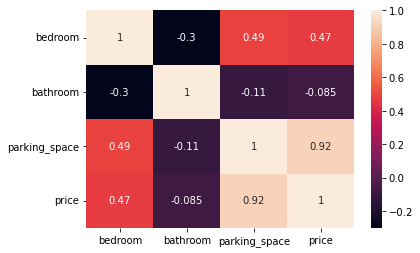

In [222]:
sns.heatmap(bay[bay["title"] == "Cottage"].dropna().corr(), annot=True)

In [223]:
Cottage_data = bay[bay["title"] == "Cottage"].sort_values(by="bedroom", ascending=True)

pd.options.display.float_format = '{:.2f}'.format

Cottage_data.head(50)

,loc,title,bedroom,bathroom,parking_space,price
13500,Bayelsa,Cottage,1.00,2.00,3.00,1929202.55
6563,Bayelsa,Cottage,2.00,2.00,2.00,1347714.90
7947,Bayelsa,Cottage,2.00,2.00,2.00,1436932.14
8969,Bayelsa,Cottage,3.00,1.00,4.00,2155552.72
11486,Bayelsa,Cottage,3.00,1.00,2.00,1502901.74
13939,Bayelsa,Cottage,3.00,2.00,3.00,1543295.27
11137,Bayelsa,Cottage,4.00,2.00,4.00,2511856.00
1417,Bayelsa,Cottage,5.00,NaN,4.00,2770022.42
12147,Bayelsa,Cottage,NaN,1.00,4.00,1583814.74
12934,Bayelsa,Cottage,NaN,2.00,2.00,2089599.16


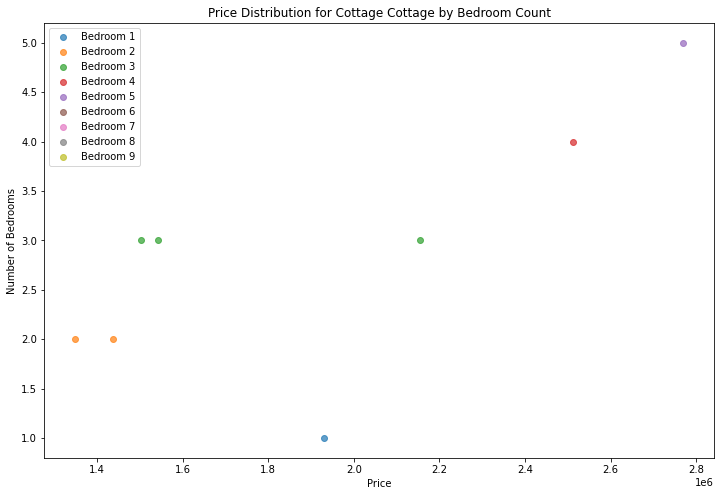

In [224]:

def plot_outliers_per_bedroom(data, title):
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            data[data["bedroom"] == bedroom]["price"],
            data[data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution for {title} Cottage by Bedroom Count')
    plt.legend()
    plt.show()

plot_outliers_per_bedroom(Cottage_data, "Cottage")

<AxesSubplot:>

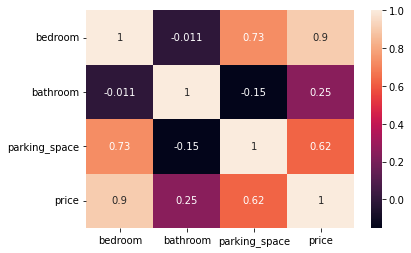

In [225]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    condition1 = (dataframe['bedroom'] == 1) & (dataframe['price'] > 1_500_000)
    dataframe = dataframe[~condition1]

    condition2 = (dataframe['bedroom'] == 3) & (dataframe['price'] > 2_000_000)
    dataframe = dataframe[~condition2]


    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


Cottage_data = process_data(Cottage_data)

sns.heatmap(Cottage_data.dropna().corr(), annot=True)

# Rivers 

In [226]:
riv = housing_train[housing_train["loc" ] == "Rivers"]
print(riv.shape)
riv["title"].value_counts()

(323, 6)


Mansion                 38
Detached duplex         33
Apartment               33
Bungalow                32
Flat                    28
Terrace duplex          28
Semi-detached duplex    27
Townhouse               26
Penthouse               23
Cottage                 10
Name: title, dtype: int64

# Mansion

        bedroom  bathroom parking_space          price
count  32.00000  32.00000      33.00000       38.00000
mean    4.84375   2.90625       3.66667  5424667.20000
std     2.86367   1.92370       1.53433  1748338.76267
min     1.00000   1.00000       1.00000  1914895.13900
25%     2.00000   1.75000       3.00000  4176409.00975
50%     5.00000   2.00000       4.00000  5985944.54400
75%     7.25000   4.00000       5.00000  6909060.32500
max     9.00000   7.00000       6.00000  7647341.46100


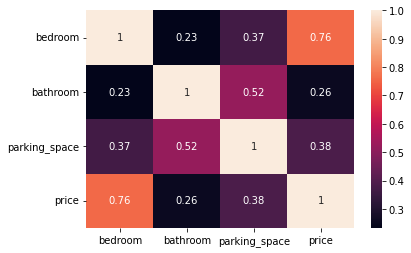

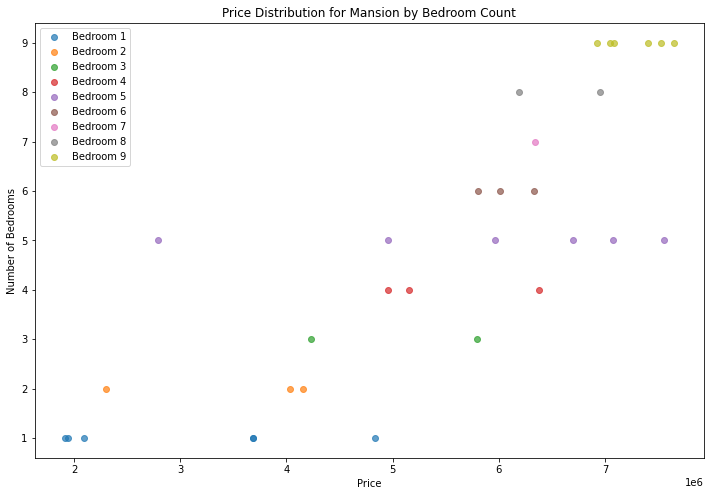

          loc    title  bedroom  bathroom  parking_space      price
11395  Rivers  Mansion     1.00      1.00           1.00 1940472.77
7882   Rivers  Mansion     1.00      2.00           2.00 4834740.92
11340  Rivers  Mansion     1.00      2.00           3.00 2097486.12
11401  Rivers  Mansion     1.00      2.00            NaN 1914895.14
9195   Rivers  Mansion     1.00      4.00           4.00 3688898.92
9528   Rivers  Mansion     1.00      4.00           4.00 3688898.92
2347   Rivers  Mansion     2.00      1.00           2.00 2297208.05
8184   Rivers  Mansion     2.00      2.00           6.00 4036985.83
10615  Rivers  Mansion     2.00      3.00            NaN 4157880.18
90     Rivers  Mansion     3.00      1.00           4.00 5790058.64
8625   Rivers  Mansion     3.00       NaN           3.00 4231995.49
13682  Rivers  Mansion     4.00      2.00           2.00 6382361.91
12898  Rivers  Mansion     4.00      3.00           5.00 4954466.54
1991   Rivers  Mansion     4.00      6.00       

In [238]:

# Describe statistics of the Mansion data and format them
mansion_description = riv[riv["title"] == "Mansion"].describe().apply(lambda s: s.apply("{0:.5f}".format))
print(mansion_description)

# Create a heatmap of the correlation matrix for Mansion data
mansion_corr_matrix = riv[riv["title"] == "Mansion"].dropna().corr()
sns.heatmap(mansion_corr_matrix, annot=True)
plt.show()

# Sort Mansion data by bedroom and bathroom count in ascending order
mansion_data = riv[riv["title"] == "Mansion"].sort_values(by=["bedroom", "bathroom"], ascending=[True, True])

pd.options.display.float_format = '{:.2f}'.format

plt.figure(figsize=(12, 8))

for bedroom in range(1, 10):
    plt.scatter(
        mansion_data[mansion_data["bedroom"] == bedroom]["price"],
        mansion_data[mansion_data["bedroom"] == bedroom]["bedroom"],
        label=f'Bedroom {bedroom}',
        alpha=0.7,
    )

plt.xlabel("Price")
plt.ylabel("Number of Bedrooms")
plt.title(f'Price Distribution for Mansion by Bedroom Count')
plt.legend()
plt.show()

# Display the sorted Mansion data
print(mansion_data.head(50))



In [239]:
mansion_data.head()

,loc,title,bedroom,bathroom,parking_space,price
11395,Rivers,Mansion,1.00,1.00,1.00,1940472.77
7882,Rivers,Mansion,1.00,2.00,2.00,4834740.92
11340,Rivers,Mansion,1.00,2.00,3.00,2097486.12
11401,Rivers,Mansion,1.00,2.00,NaN,1914895.14
9195,Rivers,Mansion,1.00,4.00,4.00,3688898.92


<AxesSubplot:>

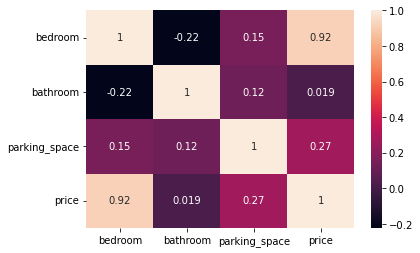

In [241]:

from sklearn.impute import KNNImputer

def process_data(dataframe):

    condition1 = (dataframe['bedroom'] == 1) & (dataframe['price'] < 3_000_000)
    dataframe = dataframe[~condition1]
    
    condition2 = (dataframe['bedroom'] == 1) & (dataframe['price'] > 4_000_000)
    dataframe = dataframe[~condition2]


    condition3 = (dataframe['bedroom'] == 2) & (dataframe['price'] < 3_000_000)
    dataframe = dataframe[~condition3]
    
    condition4 = (dataframe['bedroom'] == 3) & (dataframe['price'] > 5_000_000)
    dataframe = dataframe[~condition4]
    
    condition5 = (dataframe['bedroom'] == 4) & (dataframe['price'] > 6_000_000)
    dataframe = dataframe[~condition5]
    
    condition6 = (dataframe['bedroom'] == 5) & (dataframe['price'] > 6_000_000)
    dataframe = dataframe[~condition6]
    
    condition7 = (dataframe['bedroom'] == 6) & (dataframe['price'] < 3_000_000)
    dataframe = dataframe[~condition7]

    float_cols = [cname for cname in dataframe.loc[:, :'price'].columns if
                  dataframe[cname].dtype in ['float64']]

    imputer = KNNImputer(n_neighbors=5)
    dataframe.loc[:, float_cols] = imputer.fit_transform(dataframe.loc[:, float_cols])

    return dataframe.head(50).sort_values(by="bedroom", ascending=True)


mansion_data = process_data(mansion_data)

sns.heatmap(mansion_data.dropna().corr(), annot=True)

Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  27.00000      28.00000       33.00000
mean    3.83333   3.29630       2.92857  2877170.15048
std     2.50631   2.09054       1.53788   813445.43189
min     1.00000   1.00000       1.00000  1861988.53100
25%     2.00000   1.00000       2.00000  2216198.17100
50%     3.00000   3.00000       2.50000  2600785.15600
75%     5.00000   4.00000       4.00000  3545597.33500
max     9.00000   7.00000       6.00000  4561783.24000


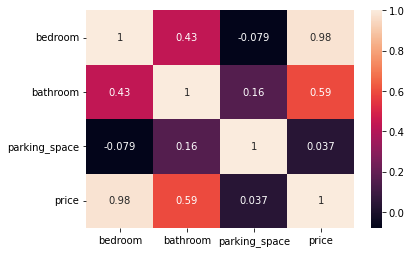

          loc            title  bedroom  bathroom  parking_space      price
13885  Rivers  Detached duplex     1.00      4.00           1.00 2025441.86
1171   Rivers  Detached duplex     1.00      7.00           5.00 2421500.55
11742  Rivers  Detached duplex     1.00      4.00           2.00 2071962.93
3161   Rivers  Detached duplex     1.00      1.00           2.00 1861988.53
4473   Rivers  Detached duplex     1.00      1.00           2.00 1966710.41
13251  Rivers  Detached duplex     2.00      3.00           4.00 2379231.78
12976  Rivers  Detached duplex     2.00      3.00           5.00 2425752.85
1476   Rivers  Detached duplex     2.00       NaN           2.00 2216198.17
11036  Rivers  Detached duplex     2.00      1.00           4.00 2210760.02
10712  Rivers  Detached duplex     2.00       NaN           2.00 2121985.86
2974   Rivers  Detached duplex     2.00      3.00            NaN 2286189.64
8995   Rivers  Detached duplex     2.00      1.00           1.00 2017001.29
9571   River

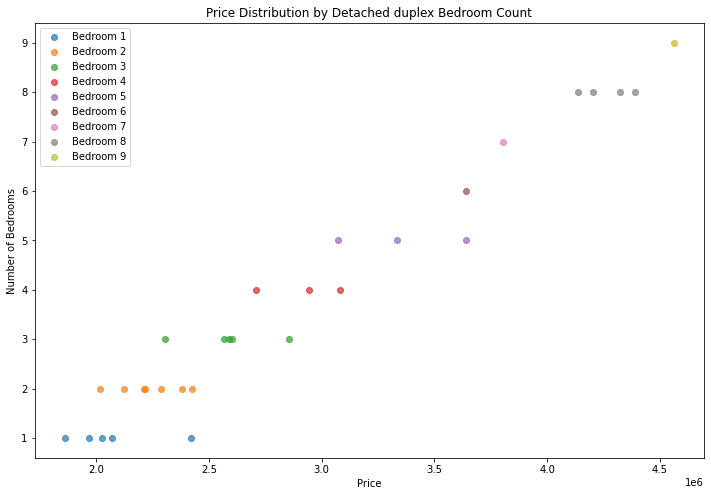



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  24.00000  29.00000      25.00000       33.00000
mean    4.20833   2.96552       3.24000  2036453.99173
std     2.57039   2.09562       1.50776   588251.03400
min     1.00000   1.00000       1.00000  1258266.05700
25%     2.50000   1.00000       2.00000  1536678.22600
50%     4.00000   2.00000       3.00000  1967818.23500
75%     5.00000   5.00000       4.00000  2234097.90300
max     9.00000   7.00000       6.00000  3278832.12100


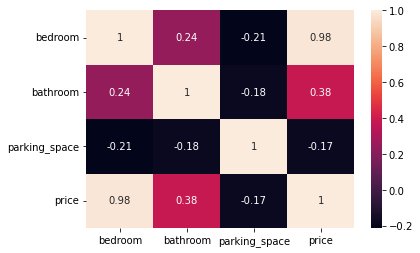

          loc      title  bedroom  bathroom  parking_space      price
12139  Rivers  Apartment     1.00      2.00           3.00 1418130.96
2491   Rivers  Apartment     1.00      7.00           4.00 1536678.23
9639   Rivers  Apartment     1.00      1.00            NaN 1354529.61
8948   Rivers  Apartment     1.00      1.00            NaN 1320572.33
3758   Rivers  Apartment     1.00      2.00            NaN 1453346.98
7122   Rivers  Apartment     1.00      1.00            NaN 1384221.43
8997   Rivers  Apartment     3.00      1.00           4.00 1699833.10
10158  Rivers  Apartment     3.00      1.00            NaN 1647540.74
13755  Rivers  Apartment     3.00      2.00           3.00 1785326.79
8202   Rivers  Apartment     4.00      2.00            NaN 1879005.28
2239   Rivers  Apartment     4.00      6.00           1.00 2057165.38
11240  Rivers  Apartment     4.00      2.00            NaN 1955197.96
12469  Rivers  Apartment     4.00      2.00           4.00 1967818.24
5410   Rivers  Apart

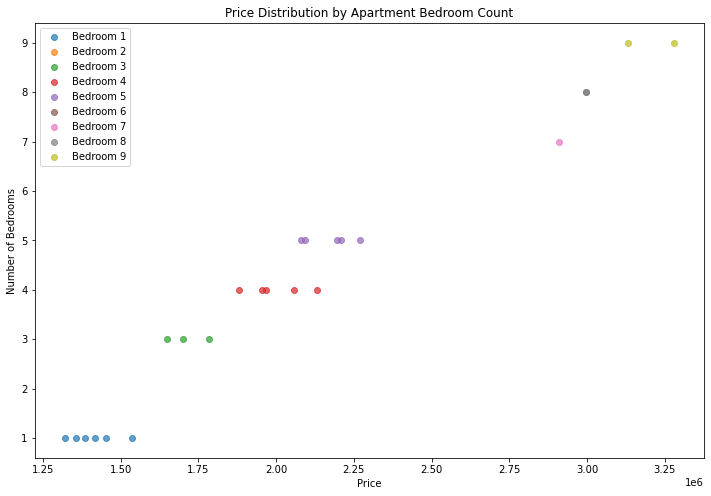



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  27.00000  27.00000      28.00000       32.00000
mean    4.03704   3.59259       2.71429  2206448.75278
std     2.39360   2.18842       1.48716   591997.15788
min     1.00000   1.00000       1.00000  1382075.15100
25%     2.00000   2.00000       1.75000  1846639.79500
50%     4.00000   3.00000       2.50000  2028375.47050
75%     5.00000   5.50000       3.25000  2392439.01825
max     9.00000   7.00000       6.00000  3673933.64200


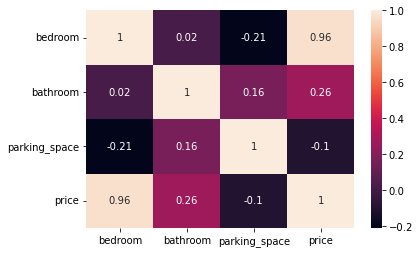

          loc     title  bedroom  bathroom  parking_space      price
394    Rivers  Bungalow     1.00      7.00           6.00 1813920.55
5817   Rivers  Bungalow     1.00      1.00            NaN 1382075.15
8850   Rivers  Bungalow     1.00      2.00           3.00 1541040.23
47     Rivers  Bungalow     2.00      2.00           3.00 1711290.28
12204  Rivers  Bungalow     2.00       NaN           2.00 1603031.78
10683  Rivers  Bungalow     2.00      7.00           1.00 1874615.59
9964   Rivers  Bungalow     2.00      7.00           1.00 1874615.59
9887   Rivers  Bungalow     2.00      5.00            NaN 1908143.84
7156   Rivers  Bungalow     2.00      6.00           2.00 1857546.21
1981   Rivers  Bungalow     3.00      3.00           1.00 1907773.56
3613   Rivers  Bungalow     3.00      1.00           1.00 1779073.99
13211  Rivers  Bungalow     3.00      4.00            NaN 2094010.48
10414  Rivers  Bungalow     4.00      5.00           2.00 2284976.49
9638   Rivers  Bungalow     4.00  

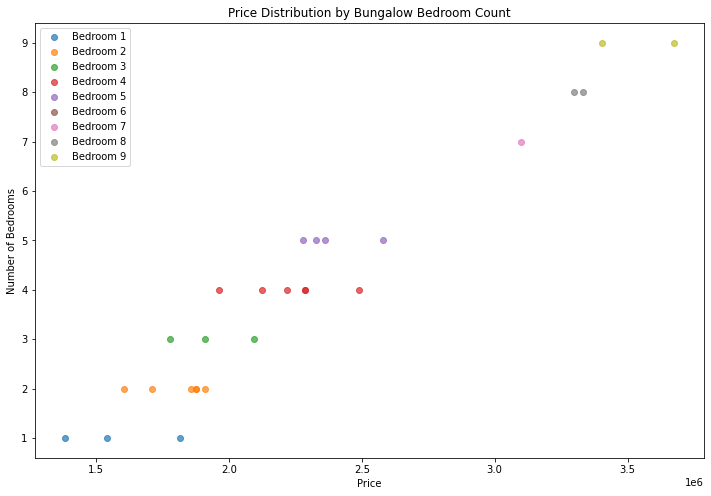



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      23.00000       28.00000
mean    4.07407   3.15385       2.91304  2287419.21643
std     2.46399   1.97367       1.41142   679195.70524
min     1.00000   1.00000       1.00000  1416945.04500
25%     2.00000   2.00000       2.00000  1690034.58100
50%     4.00000   2.50000       3.00000  2115401.95900
75%     6.00000   5.00000       4.00000  2799821.23300
max     9.00000   7.00000       5.00000  3605961.37900


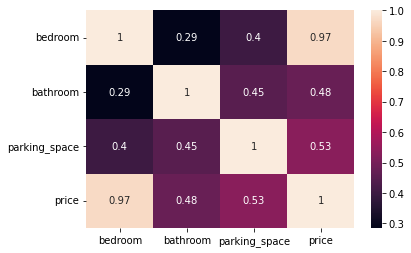

          loc title  bedroom  bathroom  parking_space      price
12632  Rivers  Flat     1.00       NaN           3.00 1588018.07
1463   Rivers  Flat     1.00      1.00            NaN 1416945.04
2500   Rivers  Flat     1.00      6.00           4.00 1695350.65
10195  Rivers  Flat     1.00      1.00           2.00 1449386.54
5965   Rivers  Flat     1.00      2.00           1.00 1478077.68
122    Rivers  Flat     2.00      3.00           1.00 1671004.05
8770   Rivers  Flat     2.00      1.00           2.00 1636091.50
5652   Rivers  Flat     2.00      4.00           2.00 1755740.44
7490   Rivers  Flat     2.00      2.00           3.00 1674086.36
1865   Rivers  Flat     3.00      2.00           3.00 1816869.06
10700  Rivers  Flat     3.00      2.00            NaN 2026038.21
6665   Rivers  Flat     3.00      2.00           2.00 1855046.55
12662  Rivers  Flat     4.00      3.00            NaN 2149337.21
7928   Rivers  Flat     4.00       NaN           5.00 2335574.13
6897   Rivers  Flat     4

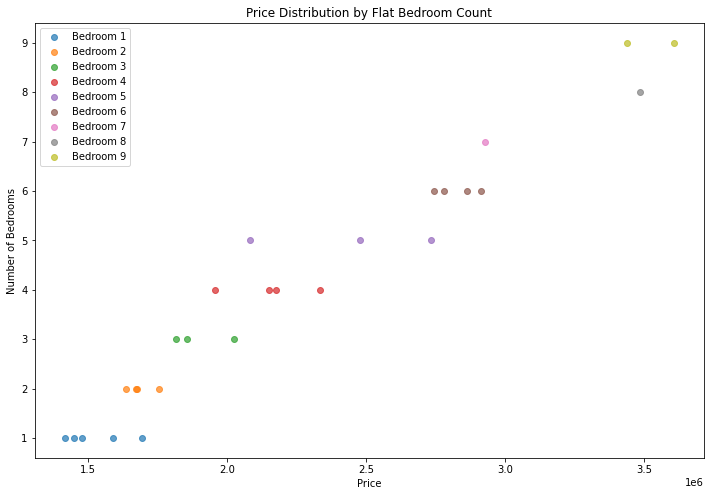



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  26.00000  24.00000      22.00000       28.00000
mean    5.11538   3.54167       3.50000  2778547.62311
std     2.55072   2.04257       1.68325   702501.62627
min     1.00000   1.00000       1.00000  1688703.17300
25%     3.00000   2.00000       2.25000  2269179.25975
50%     5.00000   3.00000       3.50000  2619337.24750
75%     7.00000   5.00000       5.00000  3340710.14950
max     9.00000   7.00000       6.00000  4100353.43600


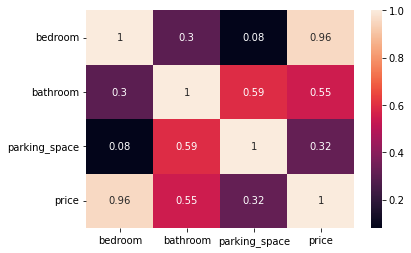

          loc           title  bedroom  bathroom  parking_space      price
1366   Rivers  Terrace duplex     1.00      2.00           3.00 1715411.18
7991   Rivers  Terrace duplex     1.00       NaN           3.00 1688703.17
4419   Rivers  Terrace duplex     2.00      7.00           6.00 2279935.35
3620   Rivers  Terrace duplex     2.00       NaN           1.00 2089621.87
3971   Rivers  Terrace duplex     2.00      2.00           3.00 1879418.53
10534  Rivers  Terrace duplex     2.00      5.00           5.00 2127341.16
9681   Rivers  Terrace duplex     3.00      7.00           4.00 2458698.01
3024   Rivers  Terrace duplex     3.00      1.00           1.00 1902844.04
2375   Rivers  Terrace duplex     4.00      1.00           4.00 2374785.72
9871   Rivers  Terrace duplex     4.00       NaN           4.00 2297893.76
7529   Rivers  Terrace duplex     5.00      4.00           3.00 2771931.44
13207  Rivers  Terrace duplex     5.00      1.00           1.00 2454558.89
10061  Rivers  Terrace du

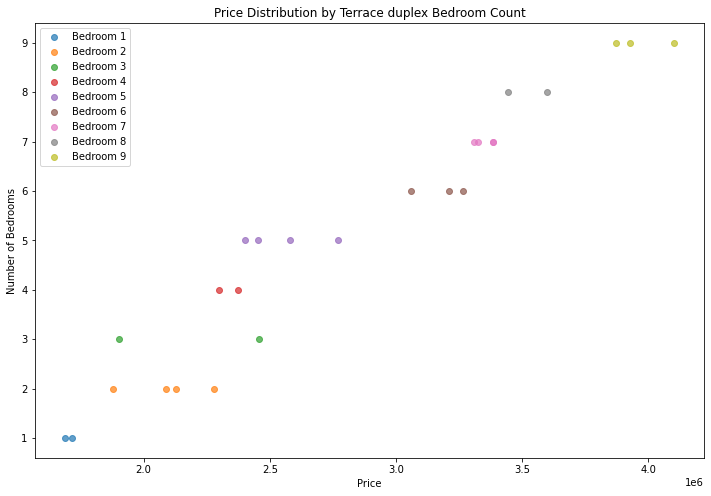



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  25.00000  22.00000      22.00000       27.00000
mean    4.00000   4.31818       3.27273  2580114.61700
std     2.50000   1.72892       2.02794   703411.17684
min     1.00000   1.00000       1.00000  1727109.27400
25%     2.00000   3.00000       1.25000  2032155.18350
50%     3.00000   4.50000       2.50000  2391683.68000
75%     5.00000   5.00000       5.00000  3096826.79450
max     9.00000   7.00000       6.00000  3986165.35000


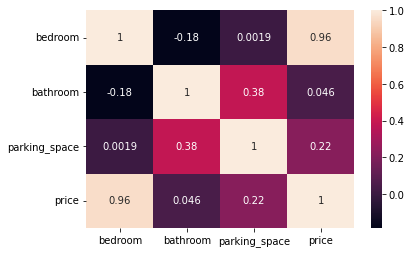

          loc                 title  bedroom  bathroom  parking_space  \
12930  Rivers  Semi-detached duplex     1.00      7.00           6.00   
10640  Rivers  Semi-detached duplex     1.00      5.00           1.00   
7919   Rivers  Semi-detached duplex     1.00      5.00           5.00   
7886   Rivers  Semi-detached duplex     1.00      2.00           2.00   
3772   Rivers  Semi-detached duplex     1.00       NaN           6.00   
5488   Rivers  Semi-detached duplex     2.00      5.00           3.00   
2607   Rivers  Semi-detached duplex     2.00      6.00           1.00   
1577   Rivers  Semi-detached duplex     2.00       NaN           1.00   
9736   Rivers  Semi-detached duplex     3.00       NaN            NaN   
6357   Rivers  Semi-detached duplex     3.00      2.00           4.00   
5299   Rivers  Semi-detached duplex     3.00      1.00           1.00   
6539   Rivers  Semi-detached duplex     3.00      3.00            NaN   
5153   Rivers  Semi-detached duplex     3.00      4

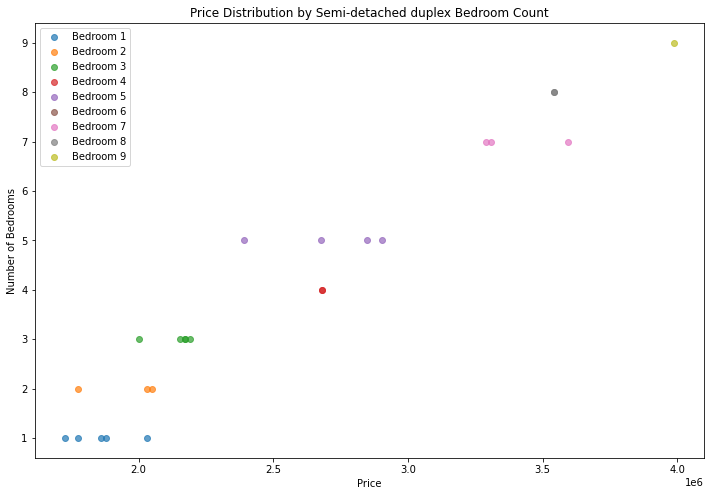



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  20.00000  17.00000      24.00000       26.00000
mean    4.20000   2.94118       3.04167  2727497.28008
std     2.78341   1.67595       1.73153   758448.83980
min     1.00000   1.00000       1.00000  1682985.48500
25%     1.00000   2.00000       2.00000  2041692.46200
50%     5.00000   2.00000       2.50000  2665611.37950
75%     7.00000   3.00000       4.25000  3479483.10625
max     8.00000   7.00000       6.00000  3828031.64900


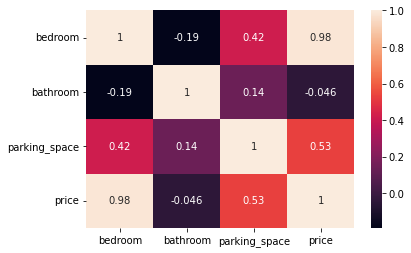

          loc      title  bedroom  bathroom  parking_space      price
5640   Rivers  Townhouse     1.00       NaN           2.00 1953563.19
8693   Rivers  Townhouse     1.00      7.00           2.00 2080820.40
6707   Rivers  Townhouse     1.00      3.00           4.00 1910889.74
5915   Rivers  Townhouse     1.00       NaN           3.00 1682985.49
12456  Rivers  Townhouse     1.00       NaN           5.00 2080438.84
3326   Rivers  Townhouse     1.00      2.00           1.00 1720385.48
3050   Rivers  Townhouse     2.00       NaN           4.00 2240617.98
6082   Rivers  Townhouse     2.00      2.00           2.00 2126020.49
15     Rivers  Townhouse     2.00      2.00           2.00 2028777.00
4956   Rivers  Townhouse     5.00       NaN           2.00 3179257.05
5221   Rivers  Townhouse     5.00      2.00            NaN 2709346.57
4096   Rivers  Townhouse     6.00       NaN           5.00 3463480.56
138    Rivers  Townhouse     6.00      5.00           6.00 3505772.45
10451  Rivers  Townh

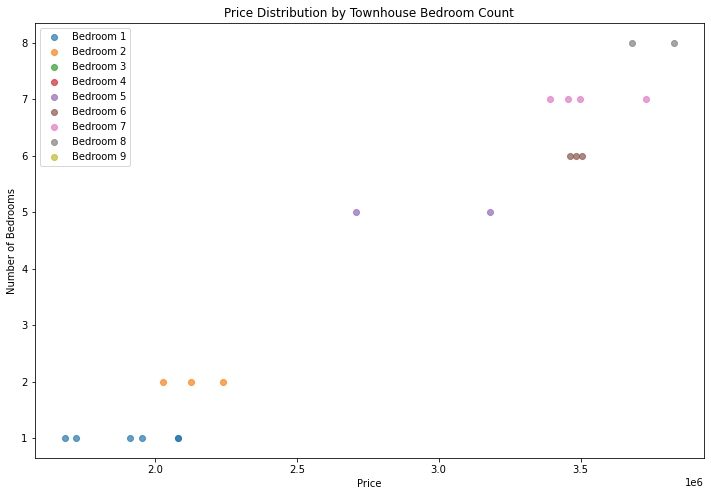



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  20.00000  22.00000      18.00000       23.00000
mean    4.00000   3.36364       3.50000  3625144.22022
std     2.29416   1.94068       1.42457   747094.50717
min     1.00000   1.00000       1.00000  2591040.50700
25%     2.00000   2.00000       3.00000  2940020.45550
50%     4.00000   3.00000       4.00000  3696403.23400
75%     5.00000   4.75000       4.00000  4196752.32700
max     9.00000   7.00000       6.00000  5149516.35200


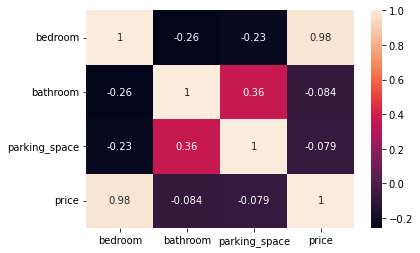

          loc      title  bedroom  bathroom  parking_space      price
2507   Rivers  Penthouse     1.00      4.00           5.00 2600957.99
12948  Rivers  Penthouse     1.00      2.00           4.00 2642373.24
12654  Rivers  Penthouse     1.00      6.00           6.00 2821371.81
2814   Rivers  Penthouse     2.00      2.00            NaN 2933900.47
3699   Rivers  Penthouse     2.00      2.00           2.00 2591040.51
8929   Rivers  Penthouse     2.00      4.00           3.00 2811454.33
5608   Rivers  Penthouse     3.00      1.00           4.00 3028365.12
10920  Rivers  Penthouse     3.00      3.00            NaN 2946140.44
10963  Rivers  Penthouse     3.00      6.00           3.00 3304250.90
3156   Rivers  Penthouse     4.00      2.00            NaN 3584389.00
3578   Rivers  Penthouse     4.00      7.00            NaN 3774103.86
10502  Rivers  Penthouse     4.00      1.00           3.00 3448039.19
3315   Rivers  Penthouse     5.00      5.00            NaN 3944554.80
4425   Rivers  Penth

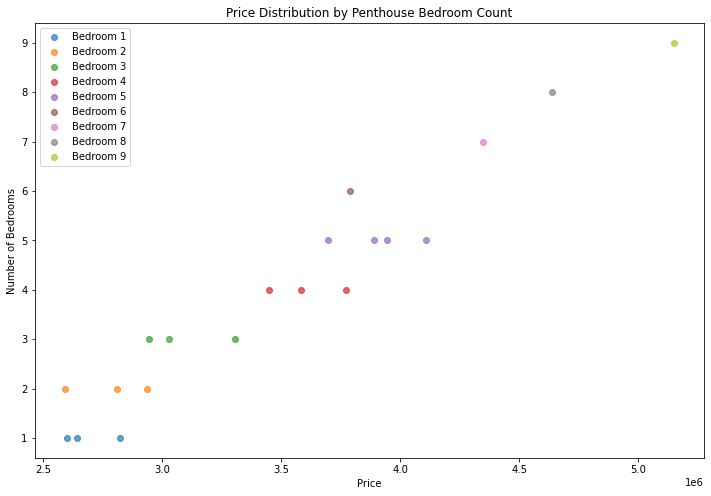



Analyzing Cottage data:
        bedroom bathroom parking_space          price
count  10.00000  9.00000      10.00000       10.00000
mean    3.10000  1.44444       2.30000  1809277.86990
std     1.19722  0.52705       1.25167   395789.83314
min     1.00000  1.00000       1.00000  1382599.56300
25%     2.25000  1.00000       1.00000  1454362.08425
50%     3.00000  1.00000       2.50000  1760156.16050
75%     4.00000  2.00000       3.00000  2193097.34100
max     5.00000  2.00000       4.00000  2381381.38800


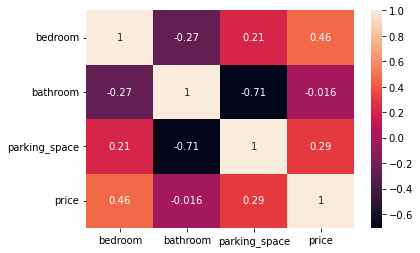

          loc    title  bedroom  bathroom  parking_space      price
5243   Rivers  Cottage     1.00      2.00           1.00 1725558.75
4164   Rivers  Cottage     2.00      1.00           3.00 1794753.57
4892   Rivers  Cottage     2.00      2.00           1.00 1882260.66
7581   Rivers  Cottage     3.00      1.00           3.00 1398380.10
9654   Rivers  Cottage     3.00      2.00           2.00 1382599.56
10194  Rivers  Cottage     3.00       NaN           3.00 1444237.50
803    Rivers  Cottage     4.00      1.00           4.00 2302161.77
11073  Rivers  Cottage     4.00      1.00           1.00 1484735.83
12389  Rivers  Cottage     4.00      1.00           4.00 2296709.57
3116   Rivers  Cottage     5.00      2.00           1.00 2381381.39


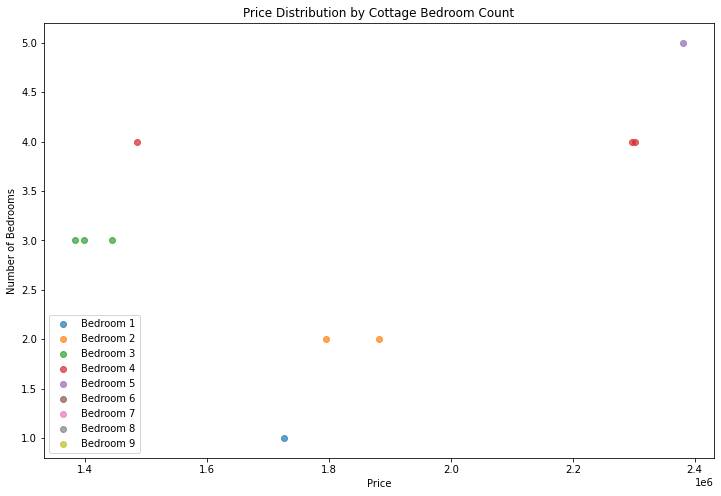

In [244]:
def analyze_house_type(dataframe, house_type):
    # Describe statistics of the specific house type and format them
    house_type_description = dataframe[dataframe["title"] == house_type].describe().apply(lambda s: s.apply("{0:.5f}".format))
    print(house_type_description)
    
    # Create a heatmap of the correlation matrix for the specific house type
    house_type_corr_matrix = dataframe[dataframe["title"] == house_type].dropna().corr()
    sns.heatmap(house_type_corr_matrix, annot=True)
    plt.show()

    # Sort data of the specific house type by bedroom count and format float display
    house_type_data = dataframe[dataframe["title"] == house_type].sort_values(by="bedroom", ascending=True)
    pd.options.display.float_format = '{:.2f}'.format

    # Display the sorted data of the specific house type
    print(house_type_data.head(50))
    
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            house_type_data[house_type_data["bedroom"] == bedroom]["price"],
            house_type_data[house_type_data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution by {house_type} Bedroom Count')
    plt.legend()
    plt.show()


# Assuming you have a DataFrame named 'riv'
house_types = [
    "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(riv, house_type)
    print("\n")


# Delta

In [98]:
Delta = housing_train[housing_train["loc" ] == "Delta"]
print(Delta.shape)

(325, 6)


Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  22.00000  29.00000      29.00000       33.00000
mean    4.22727   4.00000       2.96552  4722359.90230
std     1.84989   2.20389       1.72135  1298287.69101
min     1.00000   1.00000       1.00000  2288166.27200
25%     3.00000   2.00000       1.00000  3813180.75700
50%     4.00000   4.00000       3.00000  5055275.40700
75%     5.00000   6.00000       4.00000  5883079.77300
max     9.00000   7.00000       6.00000  6755261.63100


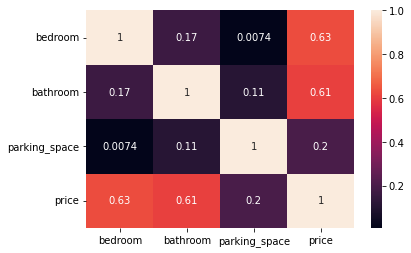

         loc    title  bedroom  bathroom  parking_space      price
2103   Delta  Mansion     1.00      6.00           3.00 3559511.36
11130  Delta  Mansion     2.00       NaN           1.00 3590660.38
1867   Delta  Mansion     2.00      4.00            NaN 3813180.76
43     Delta  Mansion     3.00      6.00           1.00 4223442.42
286    Delta  Mansion     3.00      1.00           2.00 5346209.45
11455  Delta  Mansion     3.00      1.00           3.00 2288166.27
4323   Delta  Mansion     3.00      5.00           4.00 4334368.01
11577  Delta  Mansion     3.00      4.00           4.00 4222773.22
9069   Delta  Mansion     4.00      1.00           1.00 2464120.55
8838   Delta  Mansion     4.00      1.00           2.00 2356252.79
6527   Delta  Mansion     4.00       NaN           1.00 6078578.01
12397  Delta  Mansion     4.00      7.00            NaN 5120291.09
3316   Delta  Mansion     4.00      4.00           6.00 4785506.73
7283   Delta  Mansion     5.00      4.00            NaN 520362

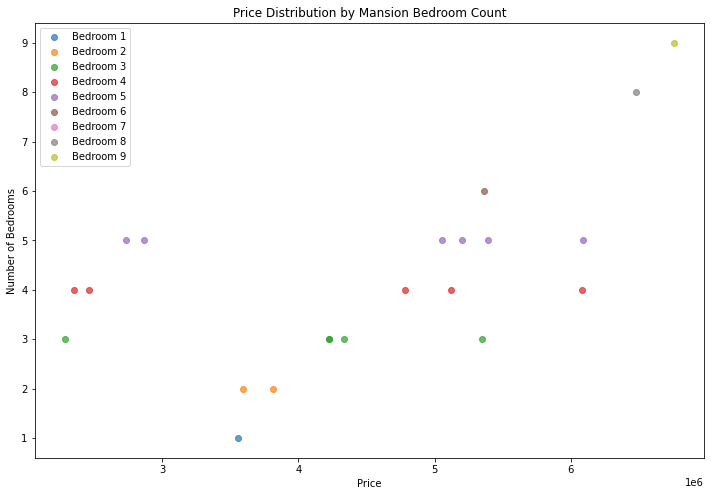



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  29.00000  28.00000      26.00000       31.00000
mean    3.89655   2.82143       3.23077  2715376.27110
std     2.51204   1.78582       1.50486   742843.51038
min     1.00000   1.00000       1.00000  1745781.39600
25%     2.00000   1.00000       2.00000  2190795.14300
50%     3.00000   2.00000       3.50000  2547412.13400
75%     5.00000   4.00000       4.00000  3182054.22300
max     9.00000   6.00000       6.00000  4277533.89800


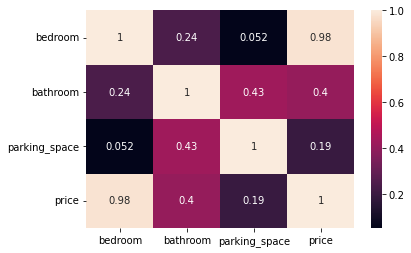

         loc            title  bedroom  bathroom  parking_space      price
5823   Delta  Detached duplex     1.00      1.00           4.00 1810001.47
11350  Delta  Detached duplex     1.00      4.00            NaN 2003824.00
10517  Delta  Detached duplex     1.00      2.00           1.00 1745781.40
9619   Delta  Detached duplex     1.00      1.00           3.00 1842646.31
3713   Delta  Detached duplex     1.00      5.00           5.00 2111374.03
3248   Delta  Detached duplex     1.00      6.00           6.00 2218924.07
12885  Delta  Detached duplex     2.00      6.00            NaN 2401926.12
1236   Delta  Detached duplex     2.00      1.00           4.00 2162666.22
2019   Delta  Detached duplex     2.00      3.00           1.00 2079276.01
12786  Delta  Detached duplex     3.00      2.00           2.00 2333405.08
8755   Delta  Detached duplex     3.00      1.00           4.00 2316512.12
2369   Delta  Detached duplex     3.00      4.00           4.00 2548505.16
2219   Delta  Detached du

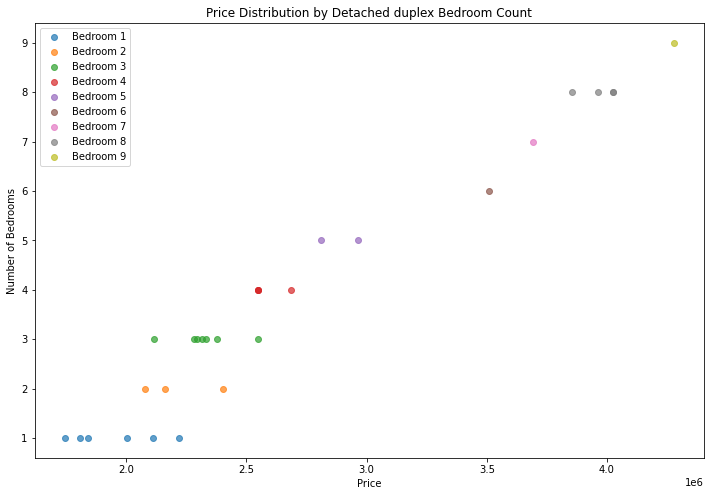



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  28.00000  27.00000      24.00000       33.00000
mean    3.71429   3.29630       3.00000  1880274.73788
std     2.22539   2.05342       1.71945   530718.80760
min     1.00000   1.00000       1.00000  1245587.70000
25%     2.00000   1.50000       1.00000  1434035.34300
50%     3.50000   3.00000       3.00000  1793598.86100
75%     5.00000   5.00000       4.25000  2101610.75400
max     9.00000   7.00000       6.00000  3066578.24400


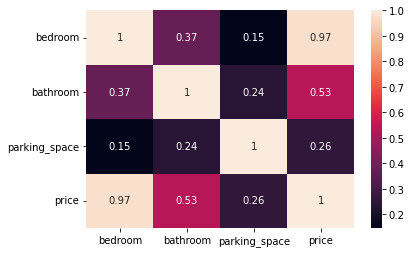

         loc      title  bedroom  bathroom  parking_space      price
5441   Delta  Apartment     1.00      1.00           2.00 1264095.26
12734  Delta  Apartment     1.00      5.00           1.00 1259621.05
11440  Delta  Apartment     1.00      1.00            NaN 1328773.30
4901   Delta  Apartment     1.00      2.00            NaN 1282467.98
11358  Delta  Apartment     1.00      2.00           5.00 1245587.70
12840  Delta  Apartment     2.00      1.00           1.00 1297153.48
1510   Delta  Apartment     2.00       NaN           1.00 1451256.40
1027   Delta  Apartment     2.00       NaN           3.00 1365830.36
11740  Delta  Apartment     2.00      1.00           3.00 1351807.60
8739   Delta  Apartment     2.00      3.00            NaN 1434035.34
12958  Delta  Apartment     3.00      7.00           6.00 1889366.86
7972   Delta  Apartment     3.00       NaN           2.00 1668819.65
8542   Delta  Apartment     3.00      2.00            NaN 1662385.60
9188   Delta  Apartment     3.00  

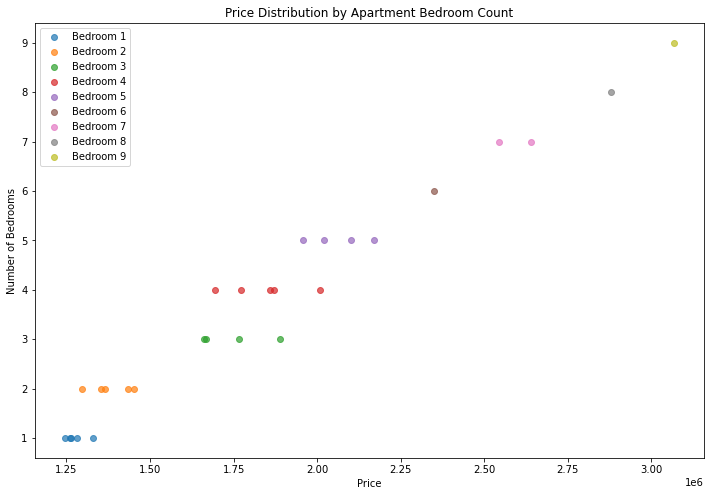



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  18.00000  20.00000      18.00000       23.00000
mean    4.77778   3.85000       3.38889  2347487.72861
std     2.46280   1.87153       1.71974   562432.62278
min     1.00000   1.00000       1.00000  1542609.64700
25%     2.25000   2.00000       2.00000  1847094.79500
50%     5.50000   4.00000       3.50000  2385211.18600
75%     6.00000   5.00000       5.00000  2765846.80750
max     9.00000   7.00000       6.00000  3317124.25100


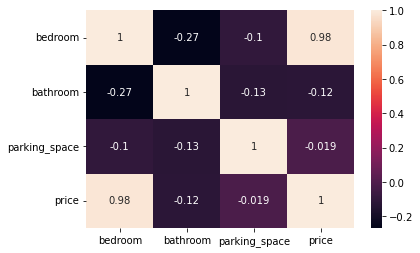

         loc     title  bedroom  bathroom  parking_space      price
8198   Delta  Bungalow     1.00      5.00           5.00 1554540.49
12739  Delta  Bungalow     2.00      6.00            NaN 1820240.47
7584   Delta  Bungalow     2.00      4.00           5.00 1726265.91
12920  Delta  Bungalow     2.00      4.00           2.00 1632573.12
1029   Delta  Bungalow     2.00      2.00           4.00 1542609.65
5244   Delta  Bungalow     3.00      5.00           1.00 1873949.12
9914   Delta  Bungalow     3.00      2.00            NaN 1683070.38
12821  Delta  Bungalow     4.00       NaN           3.00 1978875.65
11909  Delta  Bungalow     5.00       NaN           6.00 2306711.21
6588   Delta  Bungalow     6.00      1.00           2.00 2419005.63
2202   Delta  Bungalow     6.00      7.00           2.00 2700929.30
9514   Delta  Bungalow     6.00      5.00           1.00 2575723.81
4431   Delta  Bungalow     6.00      1.00           1.00 2387774.70
708    Delta  Bungalow     6.00      2.00       

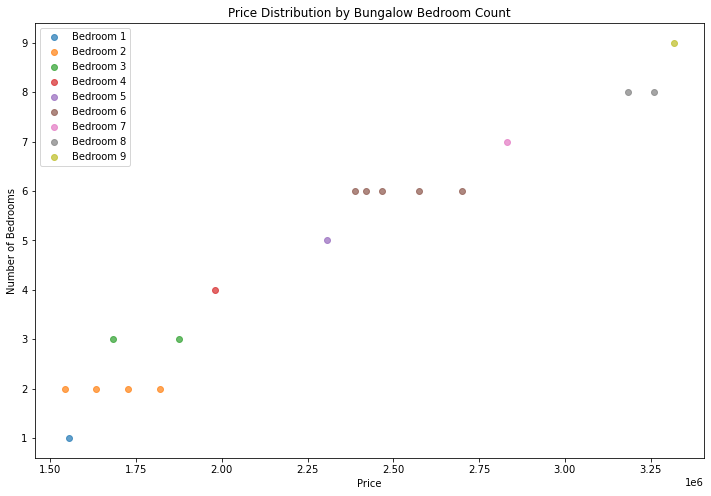



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      28.00000       31.00000
mean    3.33333   3.11538       3.35714  1971174.49652
std     2.14834   2.14153       1.72593   572398.41250
min     1.00000   1.00000       1.00000  1340702.91200
25%     2.00000   1.00000       2.00000  1536574.28850
50%     3.00000   2.00000       3.50000  1773534.95900
75%     5.00000   5.00000       4.00000  2308274.73350
max     8.00000   7.00000       6.00000  3348918.71800


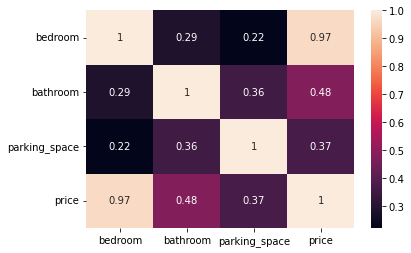

         loc title  bedroom  bathroom  parking_space      price
13455  Delta  Flat     1.00       NaN           4.00 1340702.91
11804  Delta  Flat     1.00      6.00           6.00 1632758.70
10152  Delta  Flat     1.00      4.00           4.00 1476322.28
12767  Delta  Flat     1.00      1.00           3.00 1388856.19
6382   Delta  Flat     1.00      3.00           5.00 1460565.93
511    Delta  Flat     1.00      1.00           4.00 1436562.75
3253   Delta  Flat     2.00      7.00            NaN 1773534.96
2276   Delta  Flat     2.00      2.00           1.00 1585960.13
5233   Delta  Flat     2.00      1.00            NaN 1578911.21
6655   Delta  Flat     2.00      1.00           1.00 1402804.09
3235   Delta  Flat     2.00      1.00            NaN 1494237.37
10240  Delta  Flat     2.00      3.00           6.00 1710509.56
4052   Delta  Flat     3.00      2.00           2.00 1703371.53
6942   Delta  Flat     3.00      1.00           2.00 1734865.14
13330  Delta  Flat     3.00      3.00   

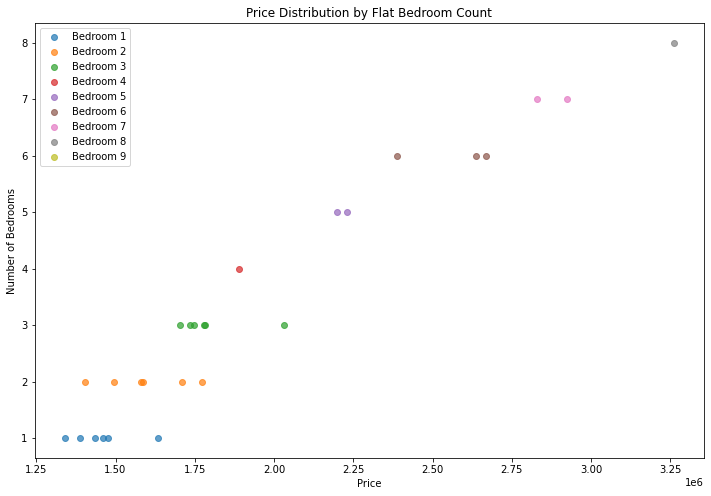



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  19.00000  20.00000      21.00000       24.00000
mean    5.05263   3.30000       3.00000  2532196.08925
std     2.65568   2.07998       1.58114   631125.21020
min     1.00000   1.00000       1.00000  1416788.52400
25%     3.00000   1.75000       2.00000  2053597.42600
50%     5.00000   3.00000       3.00000  2471479.62950
75%     7.50000   5.00000       4.00000  3107597.91100
max     9.00000   7.00000       6.00000  3569956.79100


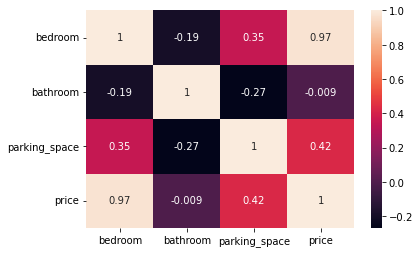

         loc           title  bedroom  bathroom  parking_space      price
2258   Delta  Terrace duplex     1.00      6.00            NaN 1793012.36
5837   Delta  Terrace duplex     1.00       NaN           3.00 1416788.52
2251   Delta  Terrace duplex     2.00      7.00           2.00 1975906.16
1629   Delta  Terrace duplex     3.00      3.00           5.00 2112212.25
4539   Delta  Terrace duplex     3.00      2.00           2.00 1823590.16
9677   Delta  Terrace duplex     3.00      7.00            NaN 2218250.61
1606   Delta  Terrace duplex     4.00      1.00           1.00 1960035.27
11670  Delta  Terrace duplex     4.00      1.00            NaN 2036335.03
10334  Delta  Terrace duplex     4.00      2.00           2.00 2135627.07
8077   Delta  Terrace duplex     5.00      2.00           5.00 2557357.71
10306  Delta  Terrace duplex     5.00       NaN           3.00 2539948.81
10810  Delta  Terrace duplex     5.00      1.00           4.00 2403010.45
2246   Delta  Terrace duplex     6.00 

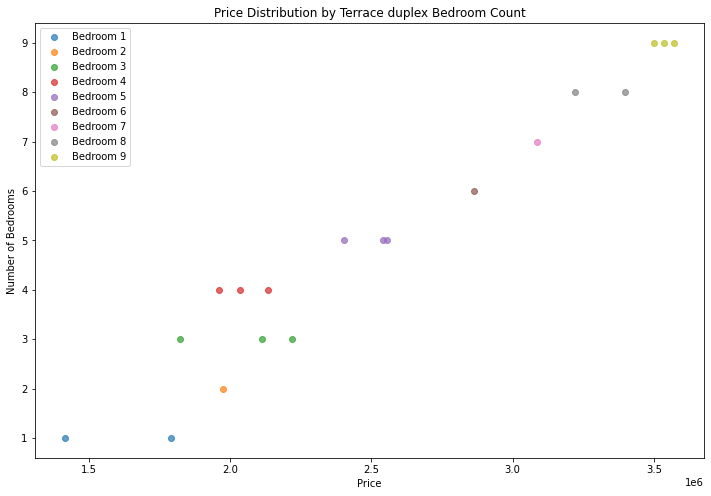



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  20.00000  24.00000      25.00000       27.00000
mean    5.15000   3.04167       3.40000  2585881.99248
std     2.68083   2.05319       1.19024   690396.26974
min     1.00000   1.00000       1.00000  1451318.92900
25%     3.00000   1.00000       3.00000  2045739.39300
50%     4.50000   2.00000       3.00000  2500207.00200
75%     8.00000   5.00000       4.00000  3232763.36350
max     9.00000   7.00000       6.00000  3781399.54500


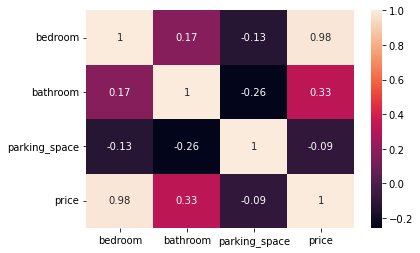

         loc                 title  bedroom  bathroom  parking_space  \
3986   Delta  Semi-detached duplex     1.00      1.00           3.00   
8046   Delta  Semi-detached duplex     1.00      2.00           5.00   
1805   Delta  Semi-detached duplex     2.00      5.00           1.00   
259    Delta  Semi-detached duplex     3.00      1.00           3.00   
9897   Delta  Semi-detached duplex     3.00      1.00            NaN   
4726   Delta  Semi-detached duplex     3.00      1.00           5.00   
10395  Delta  Semi-detached duplex     4.00       NaN           4.00   
9823   Delta  Semi-detached duplex     4.00      5.00           6.00   
5203   Delta  Semi-detached duplex     4.00      4.00           2.00   
12054  Delta  Semi-detached duplex     4.00      5.00           3.00   
9576   Delta  Semi-detached duplex     5.00      2.00           2.00   
12425  Delta  Semi-detached duplex     5.00      7.00           3.00   
659    Delta  Semi-detached duplex     6.00      1.00           

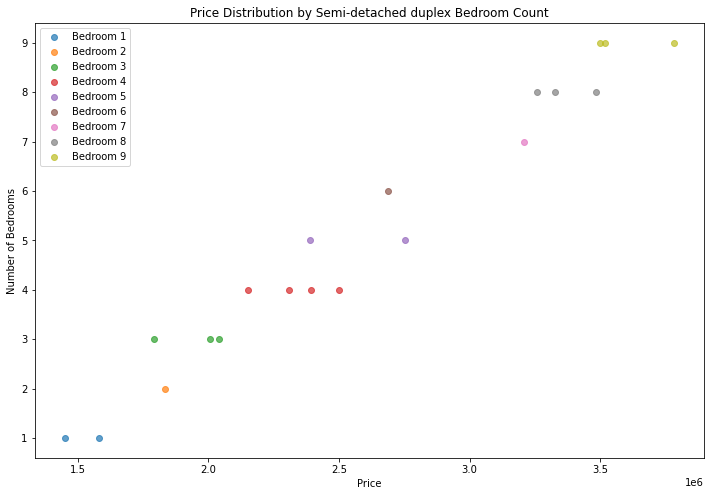



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  22.00000  20.00000      18.00000       24.00000
mean    3.72727   2.75000       2.83333  2415921.93792
std     2.16425   1.88833       1.82305   617650.85407
min     1.00000   1.00000       1.00000  1509190.09100
25%     2.00000   1.00000       1.25000  1990810.88575
50%     3.00000   2.00000       2.00000  2214401.50200
75%     5.00000   4.00000       3.75000  2802095.59125
max     8.00000   7.00000       6.00000  3592471.34500


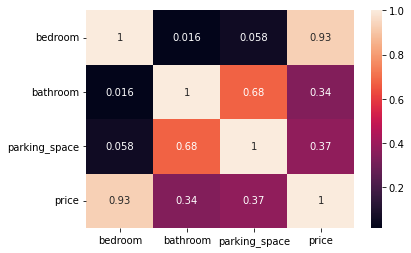

         loc      title  bedroom  bathroom  parking_space      price
10639  Delta  Townhouse     1.00      1.00           1.00 1509190.09
9756   Delta  Townhouse     1.00       NaN           2.00 1632444.57
11689  Delta  Townhouse     1.00       NaN           2.00 1812662.89
8203   Delta  Townhouse     2.00      7.00           5.00 2295393.35
4408   Delta  Townhouse     2.00      1.00           2.00 1866734.96
5011   Delta  Townhouse     2.00      2.00            NaN 1962684.20
1897   Delta  Townhouse     2.00      3.00           6.00 2099495.62
988    Delta  Townhouse     2.00       NaN           6.00 2099495.62
847    Delta  Townhouse     2.00      2.00            NaN 1868431.91
10178  Delta  Townhouse     3.00      2.00           1.00 2000186.45
10830  Delta  Townhouse     3.00      1.00            NaN 2075367.54
8254   Delta  Townhouse     3.00      5.00           2.00 2319878.42
5436   Delta  Townhouse     4.00      1.00           1.00 2133409.65
3549   Delta  Townhouse     5.00  

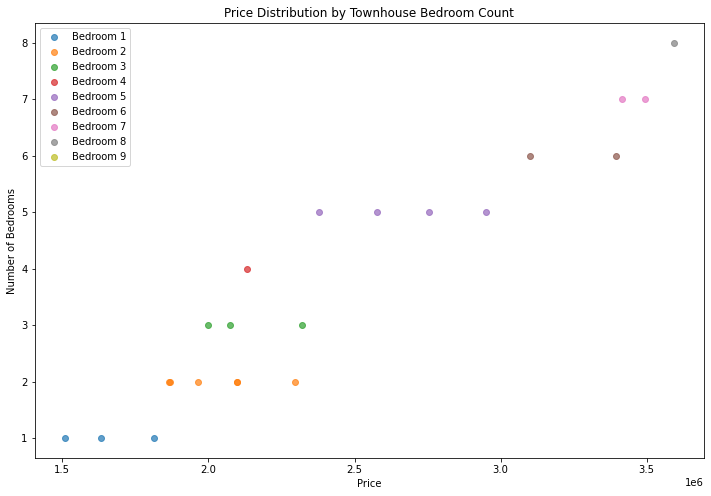



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  31.00000  34.00000      34.00000       39.00000
mean    5.00000   2.94118       3.20588  3534486.09441
std     2.80476   2.08808       1.91927   911569.11081
min     1.00000   1.00000       1.00000  2196051.55100
25%     3.50000   1.00000       1.25000  2727989.73500
50%     4.00000   2.00000       3.00000  3390257.54300
75%     8.00000   4.75000       5.00000  4558558.33550
max     9.00000   7.00000       6.00000  5023903.12000


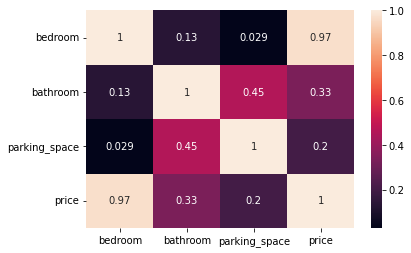

         loc      title  bedroom  bathroom  parking_space      price
2379   Delta  Penthouse     1.00      1.00           6.00 2227929.35
10478  Delta  Penthouse     1.00      1.00           1.00 2196051.55
6518   Delta  Penthouse     1.00      6.00           1.00 2355949.68
13709  Delta  Penthouse     1.00      1.00           2.00 2411494.54
7054   Delta  Penthouse     1.00       NaN            NaN 2483054.27
879    Delta  Penthouse     2.00      7.00           2.00 2785390.98
13399  Delta  Penthouse     2.00      4.00            NaN 2657828.52
7251   Delta  Penthouse     3.00      1.00           1.00 2670588.49
353    Delta  Penthouse     4.00      1.00           1.00 2899796.20
12482  Delta  Penthouse     4.00      2.00           4.00 3128401.31
12209  Delta  Penthouse     4.00      7.00           6.00 3611673.46
11744  Delta  Penthouse     4.00      2.00           1.00 3194896.03
9899   Delta  Penthouse     4.00      2.00           3.00 3334449.84
8856   Delta  Penthouse     4.00  

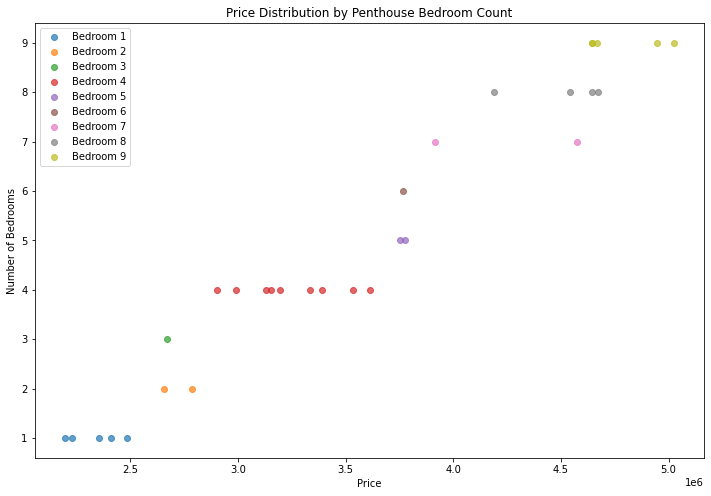



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  10.00000  10.00000      10.00000       12.00000
mean    2.50000   1.60000       2.30000  1497055.84558
std     1.17851   0.51640       0.94868   350616.00249
min     1.00000   1.00000       1.00000  1064109.68000
25%     2.00000   1.00000       2.00000  1218834.69225
50%     2.50000   2.00000       2.00000  1439624.26900
75%     3.00000   2.00000       3.00000  1676262.09475
max     5.00000   2.00000       4.00000  2200105.86000


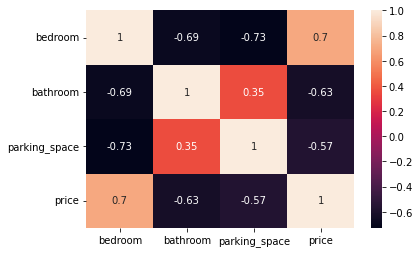

         loc    title  bedroom  bathroom  parking_space      price
2275   Delta  Cottage     1.00      2.00           2.00 1525214.97
6630   Delta  Cottage     1.00      2.00           4.00 1598050.97
3192   Delta  Cottage     2.00      2.00            NaN 1242831.67
9107   Delta  Cottage     2.00       NaN           3.00 1139963.11
11026  Delta  Cottage     2.00      1.00            NaN 1146843.76
244    Delta  Cottage     3.00       NaN           2.00 1334171.26
8504   Delta  Cottage     3.00      2.00           1.00 1949722.41
10512  Delta  Cottage     3.00      1.00           2.00 1761910.14
13910  Delta  Cottage     3.00      2.00           2.00 1354033.57
6786   Delta  Cottage     5.00      1.00           1.00 2200105.86
2294   Delta  Cottage      NaN      2.00           3.00 1647712.75
9034   Delta  Cottage      NaN      1.00           3.00 1064109.68


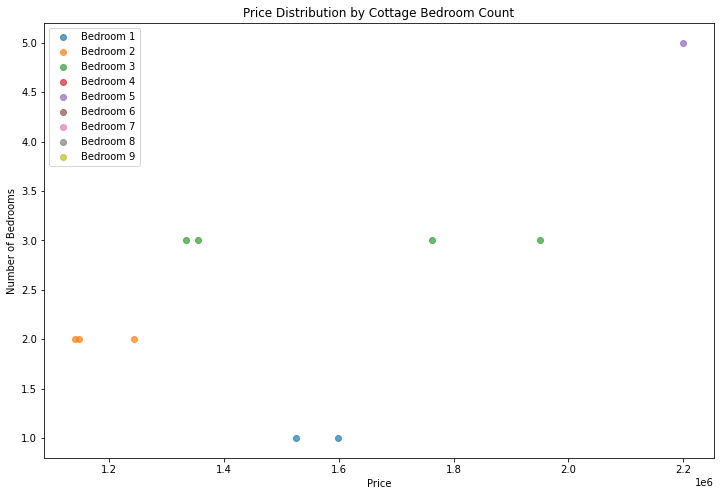

In [245]:
def analyze_house_type(dataframe, house_type):
    # Describe statistics of the specific house type and format them
    house_type_description = dataframe[dataframe["title"] == house_type].describe().apply(lambda s: s.apply("{0:.5f}".format))
    print(house_type_description)
    
    # Create a heatmap of the correlation matrix for the specific house type
    house_type_corr_matrix = dataframe[dataframe["title"] == house_type].dropna().corr()
    sns.heatmap(house_type_corr_matrix, annot=True)
    plt.show()

    # Sort data of the specific house type by bedroom count and format float display
    house_type_data = dataframe[dataframe["title"] == house_type].sort_values(by="bedroom", ascending=True)
    pd.options.display.float_format = '{:.2f}'.format

    # Display the sorted data of the specific house type
    print(house_type_data.head(50))
    
    plt.figure(figsize=(12, 8))

    for bedroom in range(1, 10):
        plt.scatter(
            house_type_data[house_type_data["bedroom"] == bedroom]["price"],
            house_type_data[house_type_data["bedroom"] == bedroom]["bedroom"],
            label=f'Bedroom {bedroom}',
            alpha=0.7,
        )

    plt.xlabel("Price")
    plt.ylabel("Number of Bedrooms")
    plt.title(f'Price Distribution by {house_type} Bedroom Count')
    plt.legend()
    plt.show()


# Assuming you have a DataFrame named 'Delta'
house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Delta, house_type)
    print("\n")


Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  26.00000  22.00000      25.00000       28.00000
mean    3.96154   2.22727       2.60000  4373729.42279
std     2.30618   1.68839       1.29099  1424824.10161
min     1.00000   1.00000       1.00000  2435999.38300
25%     2.00000   1.00000       2.00000  3158437.92025
50%     4.00000   2.00000       2.00000  4225170.28800
75%     5.00000   2.00000       4.00000  5617065.36650
max     9.00000   7.00000       5.00000  6477499.87400


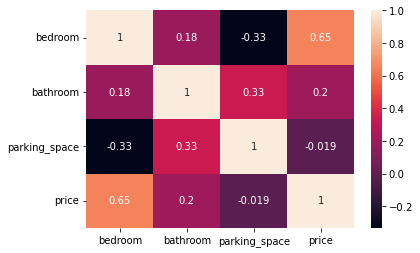

             loc    title  bedroom  bathroom  parking_space      price
2944   Akwa Ibom  Mansion     1.00      2.00           2.00 4854548.02
12610  Akwa Ibom  Mansion     1.00      2.00           4.00 3187305.67
8606   Akwa Ibom  Mansion     1.00       NaN           2.00 3485337.90
2516   Akwa Ibom  Mansion     2.00      1.00            NaN 2435999.38
3571   Akwa Ibom  Mansion     2.00      2.00           3.00 3515817.73
4541   Akwa Ibom  Mansion     2.00       NaN           1.00 3590660.38
13240  Akwa Ibom  Mansion     2.00      2.00           3.00 2515755.28
6159   Akwa Ibom  Mansion     2.00      7.00           4.00 4147965.12
2511   Akwa Ibom  Mansion     3.00      1.00           1.00 2561807.61
3043   Akwa Ibom  Mansion     3.00      1.00           2.00 2579888.75
3570   Akwa Ibom  Mansion     3.00      2.00           3.00 2816405.87
4138   Akwa Ibom  Mansion     3.00      2.00           1.00 3777063.28
12429  Akwa Ibom  Mansion     4.00       NaN           5.00 4711333.28
11692 

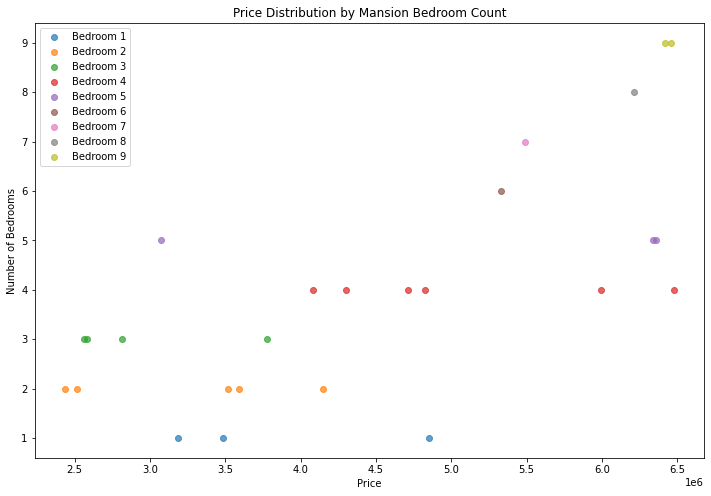



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  23.00000  18.00000      21.00000       25.00000
mean    4.39130   3.27778       3.52381  2902493.05160
std     2.55377   2.13667       1.91361   799923.60791
min     1.00000   1.00000       1.00000  1681173.88800
25%     2.50000   1.25000       2.00000  2251046.12200
50%     3.00000   3.00000       4.00000  2742327.68100
75%     6.50000   4.75000       5.00000  3660501.51200
max     9.00000   7.00000       6.00000  4262859.20100


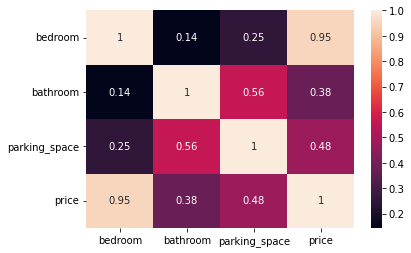

             loc            title  bedroom  bathroom  parking_space      price
6514   Akwa Ibom  Detached duplex     1.00      3.00            NaN 1939216.49
6653   Akwa Ibom  Detached duplex     1.00      1.00           1.00 1681173.89
2517   Akwa Ibom  Detached duplex     2.00      6.00           6.00 2487811.17
13309  Akwa Ibom  Detached duplex     2.00      3.00           5.00 2251046.12
3903   Akwa Ibom  Detached duplex     2.00      1.00           3.00 2257862.96
11753  Akwa Ibom  Detached duplex     2.00      2.00           1.00 1986853.45
1087   Akwa Ibom  Detached duplex     3.00      2.00           3.00 2229626.10
2751   Akwa Ibom  Detached duplex     3.00       NaN            NaN 2180222.79
4132   Akwa Ibom  Detached duplex     3.00      4.00            NaN 2505562.63
4277   Akwa Ibom  Detached duplex     3.00      2.00           1.00 2140687.48
10279  Akwa Ibom  Detached duplex     3.00      1.00           4.00 2354682.63
13310  Akwa Ibom  Detached duplex     3.00      7.00

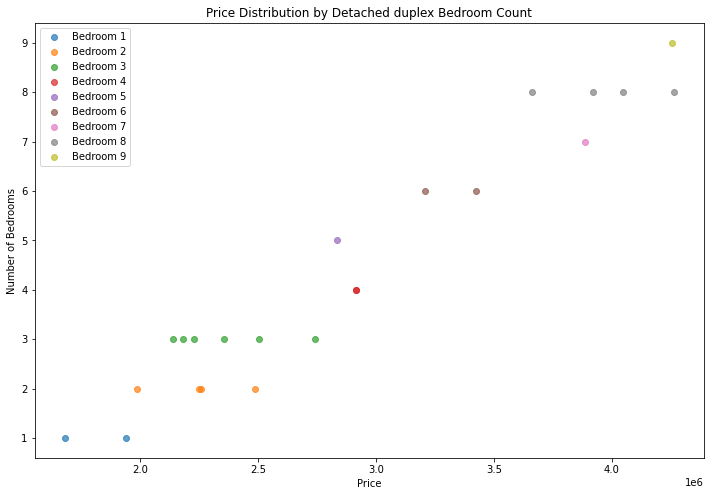



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  26.00000  31.00000      28.00000       34.00000
mean    4.26923   2.80645       3.53571  1948162.61097
std     2.66169   1.90472       1.57485   553678.20114
min     1.00000   1.00000       1.00000  1095165.57800
25%     2.00000   1.00000       3.00000  1543651.78075
50%     4.00000   2.00000       4.00000  1822275.43150
75%     6.50000   3.50000       5.00000  2345700.15475
max     9.00000   7.00000       6.00000  3052544.89000


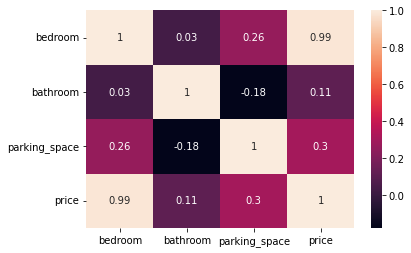

             loc      title  bedroom  bathroom  parking_space      price
13865  Akwa Ibom  Apartment     1.00      1.00           4.00 1236885.33
4428   Akwa Ibom  Apartment     1.00       NaN           5.00 1410043.18
4736   Akwa Ibom  Apartment     1.00      1.00           3.00 1490027.27
5595   Akwa Ibom  Apartment     1.00      1.00            NaN 1095165.58
10111  Akwa Ibom  Apartment     2.00      2.00           3.00 1392921.47
9900   Akwa Ibom  Apartment     2.00      1.00           2.00 1415576.17
2539   Akwa Ibom  Apartment     2.00      2.00           5.00 1447575.60
8459   Akwa Ibom  Apartment     2.00      5.00           4.00 1543590.14
6964   Akwa Ibom  Apartment     2.00      7.00           1.00 1543836.69
3621   Akwa Ibom  Apartment     3.00      2.00            NaN 1695393.05
8422   Akwa Ibom  Apartment     3.00      2.00           4.00 1629143.39
6744   Akwa Ibom  Apartment     3.00      2.00            NaN 1683797.51
1036   Akwa Ibom  Apartment     4.00      2.00     

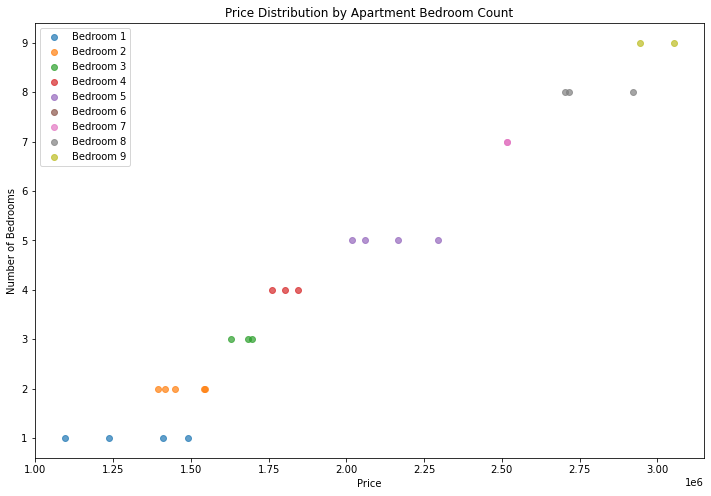



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  16.00000  14.00000      13.00000       17.00000
mean    4.00000   2.35714       2.69231  2134626.85865
std     2.47656   1.15073       1.37747   627670.87132
min     1.00000   1.00000       1.00000  1223377.84100
25%     2.00000   2.00000       2.00000  1562667.17300
50%     4.00000   2.00000       3.00000  2119837.48300
75%     5.25000   2.00000       3.00000  2525114.25000
max     9.00000   5.00000       6.00000  3254662.39200


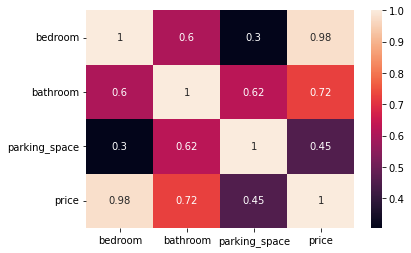

             loc     title  bedroom  bathroom  parking_space      price
2129   Akwa Ibom  Bungalow     1.00      1.00           1.00 1223377.84
11469  Akwa Ibom  Bungalow     1.00      2.00           3.00 1493029.24
12768  Akwa Ibom  Bungalow     1.00      2.00            NaN 1431059.56
4711   Akwa Ibom  Bungalow     2.00      2.00            NaN 1581745.13
6887   Akwa Ibom  Bungalow     2.00      2.00           3.00 1490678.57
9788   Akwa Ibom  Bungalow     2.00      2.00           2.00 1562667.17
643    Akwa Ibom  Bungalow     3.00      2.00            NaN 1746292.02
6080   Akwa Ibom  Bungalow     4.00      4.00           3.00 2119837.48
9092   Akwa Ibom  Bungalow     4.00      1.00           3.00 1979875.77
1589   Akwa Ibom  Bungalow     5.00       NaN           4.00 2525114.25
2621   Akwa Ibom  Bungalow     5.00      4.00           2.00 2322749.33
2919   Akwa Ibom  Bungalow     5.00       NaN           3.00 2494942.09
1223   Akwa Ibom  Bungalow     6.00      5.00           6.00 273

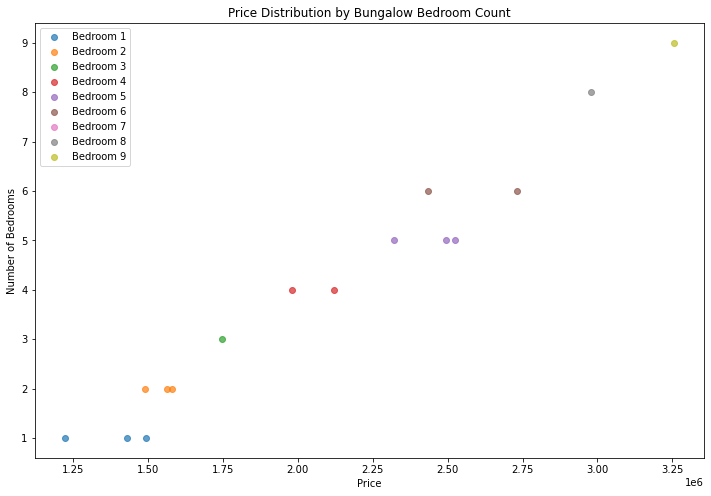



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  25.00000  29.00000      28.00000       32.00000
mean    4.00000   3.82759       3.35714  2168208.08431
std     2.17945   2.46503       1.49603   545963.49181
min     1.00000   1.00000       1.00000  1445091.35000
25%     3.00000   1.00000       3.00000  1733765.77175
50%     4.00000   3.00000       3.00000  2044727.53300
75%     5.00000   6.00000       4.25000  2522163.49250
max     8.00000   7.00000       6.00000  3458367.85600


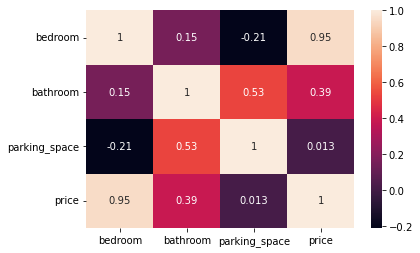

             loc title  bedroom  bathroom  parking_space      price
6981   Akwa Ibom  Flat     1.00      7.00           6.00 1679745.98
1289   Akwa Ibom  Flat     1.00      1.00           4.00 1667421.86
1524   Akwa Ibom  Flat     1.00      4.00           3.00 1445091.35
11578  Akwa Ibom  Flat     1.00      6.00            NaN 1601527.77
8887   Akwa Ibom  Flat     1.00      4.00           5.00 1507553.21
3936   Akwa Ibom  Flat     2.00      2.00            NaN 1593031.73
11893  Akwa Ibom  Flat     3.00      1.00           3.00 1704618.30
9067   Akwa Ibom  Flat     3.00      3.00           4.00 1873667.35
4174   Akwa Ibom  Flat     3.00      7.00           6.00 2124078.33
4649   Akwa Ibom  Flat     3.00      1.00           2.00 1891070.57
8539   Akwa Ibom  Flat     3.00      3.00           1.00 1779974.56
9320   Akwa Ibom  Flat     4.00      7.00           3.00 2260799.32
7874   Akwa Ibom  Flat     4.00      2.00           6.00 2119555.71
13445  Akwa Ibom  Flat     4.00      1.00       

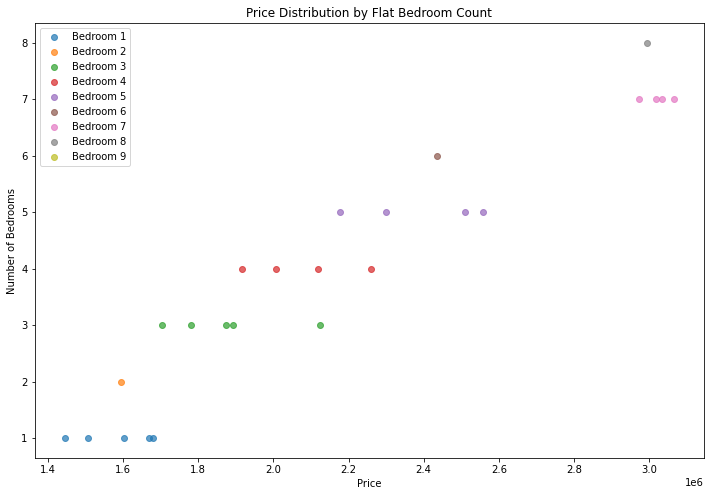



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  27.00000      25.00000       31.00000
mean    3.73333   2.85185       2.84000  2254137.52316
std     2.46259   1.87501       1.77200   656003.55903
min     1.00000   1.00000       1.00000  1388169.73300
25%     2.00000   2.00000       1.00000  1780782.65400
50%     3.00000   2.00000       3.00000  2094803.34400
75%     5.00000   3.50000       4.00000  2614219.42150
max     9.00000   7.00000       6.00000  3711446.94400


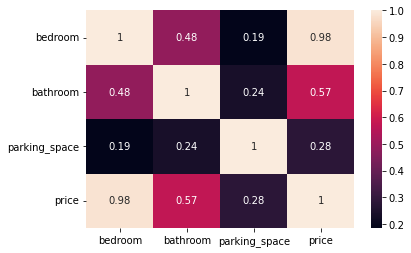

             loc           title  bedroom  bathroom  parking_space      price
395    Akwa Ibom  Terrace duplex     1.00      2.00           1.00 1663992.47
1651   Akwa Ibom  Terrace duplex     1.00      1.00           1.00 1388169.73
4887   Akwa Ibom  Terrace duplex     1.00      3.00           4.00 1599295.50
5498   Akwa Ibom  Terrace duplex     1.00      1.00           3.00 1510276.13
6619   Akwa Ibom  Terrace duplex     1.00      3.00           4.00 1599295.50
7858   Akwa Ibom  Terrace duplex     2.00      2.00            NaN 1781872.31
12981  Akwa Ibom  Terrace duplex     2.00      3.00           4.00 1834733.00
1756   Akwa Ibom  Terrace duplex     2.00      2.00           4.00 1882307.15
8105   Akwa Ibom  Terrace duplex     2.00      2.00            NaN 1852141.90
7902   Akwa Ibom  Terrace duplex     2.00      1.00           1.00 1597285.70
7614   Akwa Ibom  Terrace duplex     2.00      1.00           1.00 1623607.24
13307  Akwa Ibom  Terrace duplex     2.00      1.00           1.

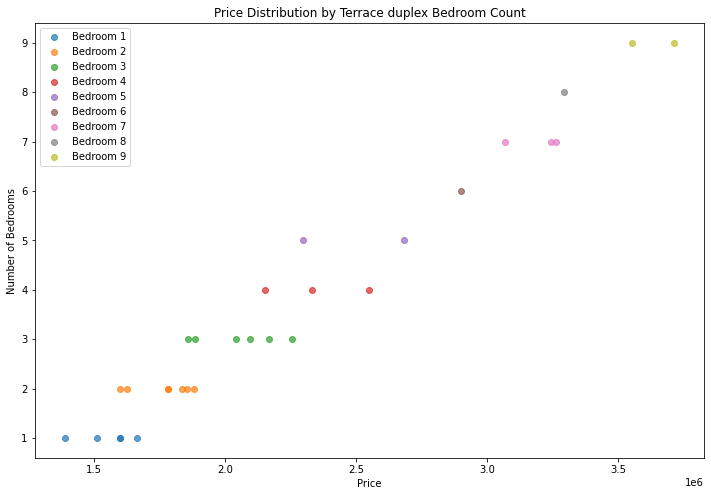



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  31.00000      29.00000       37.00000
mean    5.06667   3.41935       2.75862  2575848.94757
std     2.27328   1.97946       1.59587   606261.07757
min     2.00000   1.00000       1.00000  1694780.26700
25%     3.25000   2.00000       1.00000  2130255.13000
50%     5.00000   3.00000       2.00000  2452977.46400
75%     7.00000   5.00000       4.00000  3121050.82500
max     9.00000   7.00000       6.00000  3799125.43800


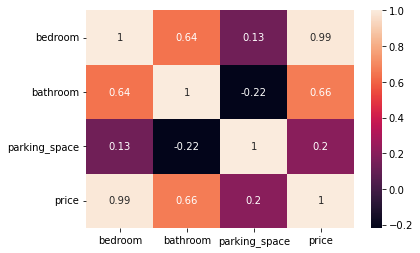

             loc                 title  bedroom  bathroom  parking_space  \
13360  Akwa Ibom  Semi-detached duplex     2.00      1.00           3.00   
3747   Akwa Ibom  Semi-detached duplex     2.00      5.00            NaN   
4658   Akwa Ibom  Semi-detached duplex     2.00      3.00           1.00   
12746  Akwa Ibom  Semi-detached duplex     2.00      6.00            NaN   
6439   Akwa Ibom  Semi-detached duplex     2.00      3.00            NaN   
13361  Akwa Ibom  Semi-detached duplex     3.00      2.00            NaN   
6409   Akwa Ibom  Semi-detached duplex     3.00      4.00           3.00   
8471   Akwa Ibom  Semi-detached duplex     3.00       NaN           1.00   
2723   Akwa Ibom  Semi-detached duplex     4.00      2.00           1.00   
2865   Akwa Ibom  Semi-detached duplex     4.00      2.00           4.00   
12444  Akwa Ibom  Semi-detached duplex     4.00      3.00           3.00   
10835  Akwa Ibom  Semi-detached duplex     4.00      1.00           4.00   
10208  Akwa 

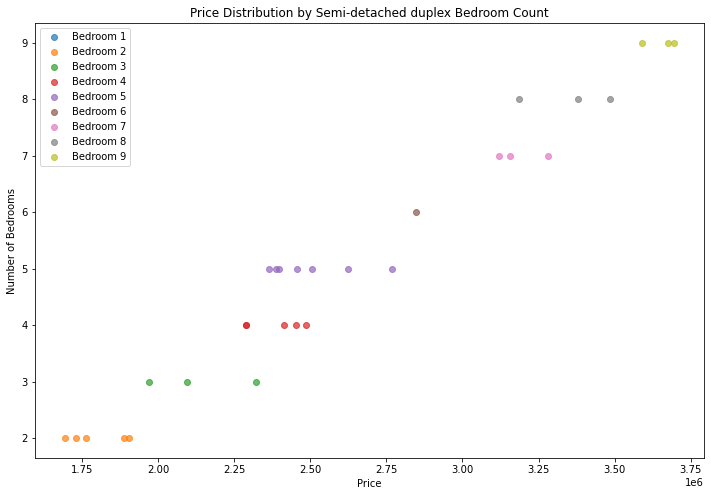



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  21.00000  24.00000      23.00000       27.00000
mean    4.66667   3.62500       3.08696  2793523.18567
std     2.45628   1.86063       1.75585   672270.73236
min     1.00000   1.00000       1.00000  1774052.58400
25%     3.00000   2.00000       2.00000  2131433.59250
50%     5.00000   3.50000       3.00000  2862846.22900
75%     7.00000   5.25000       4.50000  3355908.34350
max     8.00000   7.00000       6.00000  4007292.45500


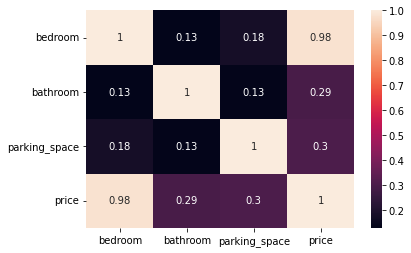

             loc      title  bedroom  bathroom  parking_space      price
972    Akwa Ibom  Townhouse     1.00       NaN           6.00 2082269.71
1141   Akwa Ibom  Townhouse     1.00       NaN           3.00 1774052.58
11021  Akwa Ibom  Townhouse     2.00      3.00           6.00 2099495.62
4090   Akwa Ibom  Townhouse     2.00      2.00            NaN 2181293.05
4826   Akwa Ibom  Townhouse     2.00       NaN           4.00 2083256.81
12738  Akwa Ibom  Townhouse     3.00      1.00            NaN 2049502.58
8952   Akwa Ibom  Townhouse     3.00      3.00           2.00 2202410.23
13429  Akwa Ibom  Townhouse     3.00      3.00           1.00 2163371.56
7856   Akwa Ibom  Townhouse     3.00      5.00           1.00 2280839.76
6620   Akwa Ibom  Townhouse     3.00      1.00           2.00 2084942.03
9365   Akwa Ibom  Townhouse     5.00      6.00           5.00 3027184.27
5807   Akwa Ibom  Townhouse     6.00      6.00           5.00 3297852.01
11445  Akwa Ibom  Townhouse     6.00      6.00     

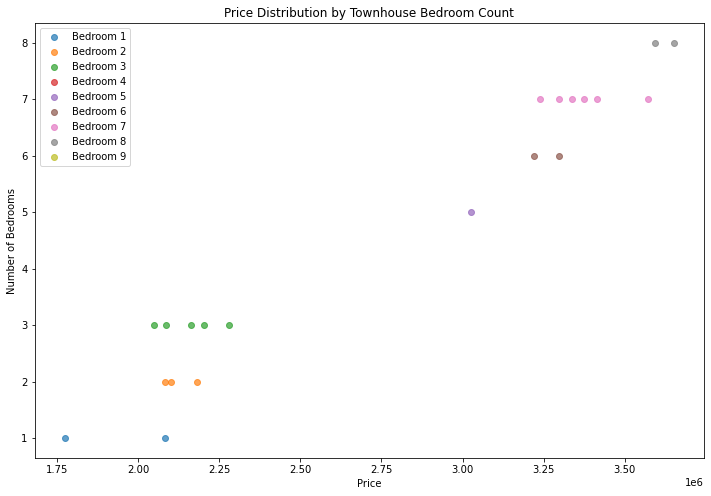



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  30.00000  31.00000      30.00000       36.00000
mean    4.06667   2.83871       3.26667  3283896.37725
std     2.42022   1.71458       1.57422   731210.26549
min     1.00000   1.00000       1.00000  2024928.30300
25%     2.00000   2.00000       2.00000  2775458.70400
50%     4.00000   2.00000       3.00000  3120502.55650
75%     5.75000   4.00000       4.00000  3786098.81000
max     9.00000   7.00000       6.00000  4718943.68300


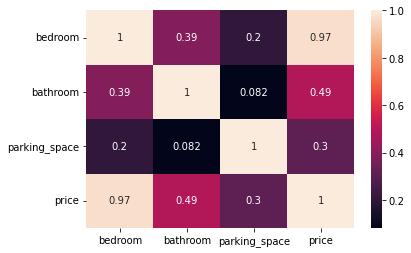

             loc      title  bedroom  bathroom  parking_space      price
9728   Akwa Ibom  Penthouse     1.00      2.00           2.00 2101282.63
8991   Akwa Ibom  Penthouse     1.00      2.00            NaN 2359680.40
11409  Akwa Ibom  Penthouse     1.00      1.00           3.00 2634300.33
3988   Akwa Ibom  Penthouse     1.00      1.00           2.00 2024928.30
3761   Akwa Ibom  Penthouse     1.00      1.00           4.00 2401402.35
9037   Akwa Ibom  Penthouse     2.00      7.00            NaN 2937641.76
8024   Akwa Ibom  Penthouse     2.00      2.00           4.00 2505119.86
5419   Akwa Ibom  Penthouse     2.00      5.00           4.00 2734182.84
3125   Akwa Ibom  Penthouse     2.00      5.00           1.00 2581932.06
5344   Akwa Ibom  Penthouse     3.00      3.00           2.00 2789217.32
10938  Akwa Ibom  Penthouse     3.00      1.00           1.00 2796881.91
12133  Akwa Ibom  Penthouse     3.00      5.00           5.00 3094176.76
3632   Akwa Ibom  Penthouse     3.00       NaN     

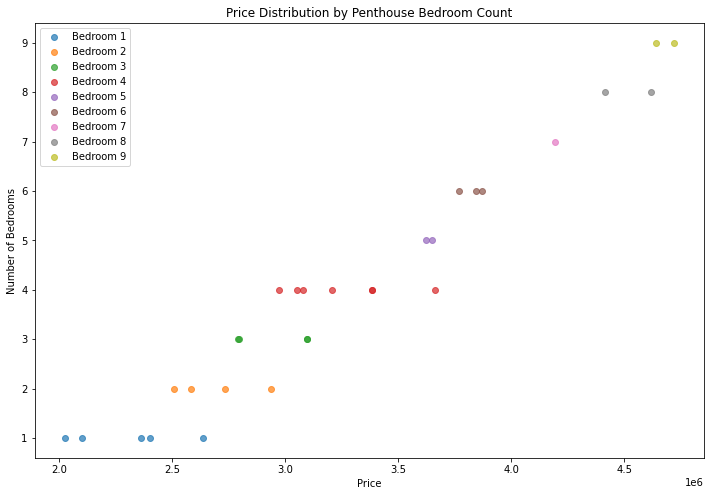



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  6.00000  6.00000       5.00000        6.00000
mean   2.66667  1.50000       2.60000  1558605.18583
std    1.21106  0.54772       1.51658   197269.99028
min    2.00000  1.00000       1.00000  1320537.53900
25%    2.00000  1.00000       1.00000  1421220.18225
50%    2.00000  1.50000       3.00000  1535900.46250
75%    2.75000  2.00000       4.00000  1708906.03700
max    5.00000  2.00000       4.00000  1809724.66700


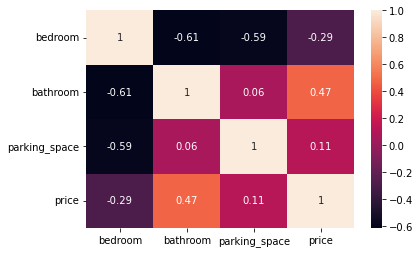

            loc    title  bedroom  bathroom  parking_space      price
2957  Akwa Ibom  Cottage     2.00      1.00           4.00 1421938.52
3719  Akwa Ibom  Cottage     2.00      2.00           4.00 1809724.67
9276  Akwa Ibom  Cottage     2.00      2.00           3.00 1320537.54
9978  Akwa Ibom  Cottage     2.00      2.00           1.00 1649862.40
1747  Akwa Ibom  Cottage     3.00      1.00           1.00 1420980.74
6554  Akwa Ibom  Cottage     5.00      1.00            NaN 1728587.25


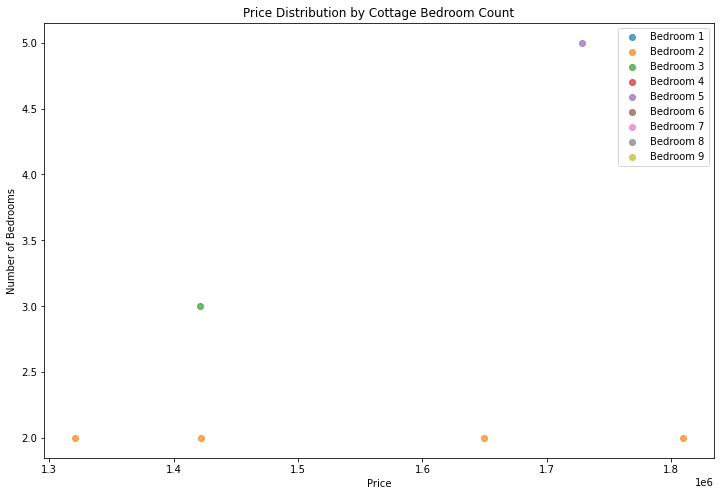

In [246]:
#Akwa Ibom
Akwa = housing_train[housing_train["loc" ] == "Akwa Ibom"]

# with DataFrame named 'Akwa'
house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Akwa, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  27.00000  28.00000      27.00000       35.00000
mean    5.11111   3.25000       3.18519  4401150.79146
std     2.56205   1.97437       1.38778  1434222.83417
min     1.00000   1.00000       1.00000  1914182.24900
25%     3.00000   2.00000       2.00000  3353526.72450
50%     5.00000   2.50000       3.00000  5016758.54300
75%     7.00000   5.00000       4.00000  5515526.88800
max     9.00000   7.00000       6.00000  6503234.59000


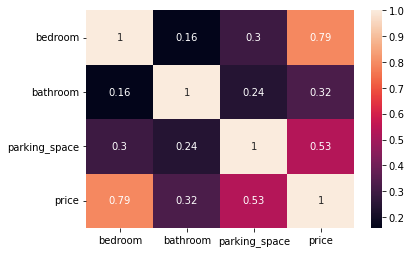

               loc    title  bedroom  bathroom  parking_space      price
439    Cross River  Mansion     1.00      4.00           4.00 3132091.56
9140   Cross River  Mansion     1.00       NaN            NaN 3063485.79
3147   Cross River  Mansion     1.00      7.00            NaN 3574961.89
5799   Cross River  Mansion     2.00       NaN           4.00 1953651.90
5053   Cross River  Mansion     2.00      2.00           3.00 1974566.75
2057   Cross River  Mansion     3.00      6.00           5.00 4163990.45
13735  Cross River  Mansion     3.00      2.00           3.00 5567442.77
8474   Cross River  Mansion     3.00      2.00           1.00 1987482.67
10878  Cross River  Mansion     3.00      2.00            NaN 2218246.61
3396   Cross River  Mansion     4.00      3.00            NaN 3973041.10
703    Cross River  Mansion     4.00      2.00           1.00 2367004.94
12438  Cross River  Mansion     5.00      4.00           3.00 4602955.64
744    Cross River  Mansion     5.00       NaN     

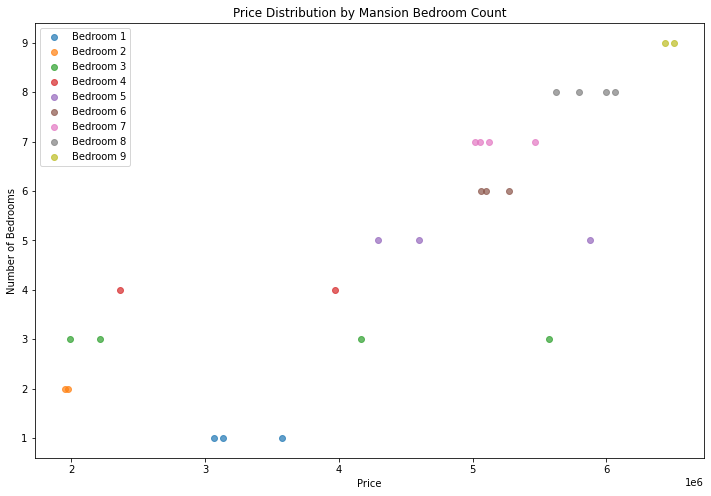



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  36.00000  33.00000      34.00000       40.00000
mean    4.61111   2.39394       3.14706  2635030.43322
std     2.55542   1.69447       1.39550   711935.95130
min     1.00000   1.00000       1.00000  1600913.01400
25%     3.00000   1.00000       2.00000  2105934.49725
50%     4.00000   2.00000       3.00000  2463436.56650
75%     7.00000   3.00000       4.00000  3348644.77150
max     9.00000   7.00000       6.00000  4151515.35700


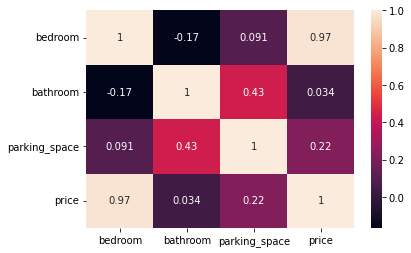

               loc            title  bedroom  bathroom  parking_space  \
4834   Cross River  Detached duplex     1.00      6.00           3.00   
7371   Cross River  Detached duplex     1.00      7.00           3.00   
1911   Cross River  Detached duplex     1.00      1.00           1.00   
11239  Cross River  Detached duplex     1.00      2.00            NaN   
1812   Cross River  Detached duplex     2.00      2.00            NaN   
8772   Cross River  Detached duplex     2.00      1.00           3.00   
7291   Cross River  Detached duplex     2.00       NaN           3.00   
11093  Cross River  Detached duplex     2.00       NaN           4.00   
4489   Cross River  Detached duplex     3.00      1.00           4.00   
1470   Cross River  Detached duplex     3.00      5.00           6.00   
4173   Cross River  Detached duplex     3.00      2.00           1.00   
11963  Cross River  Detached duplex     3.00      2.00           2.00   
3541   Cross River  Detached duplex     3.00      2

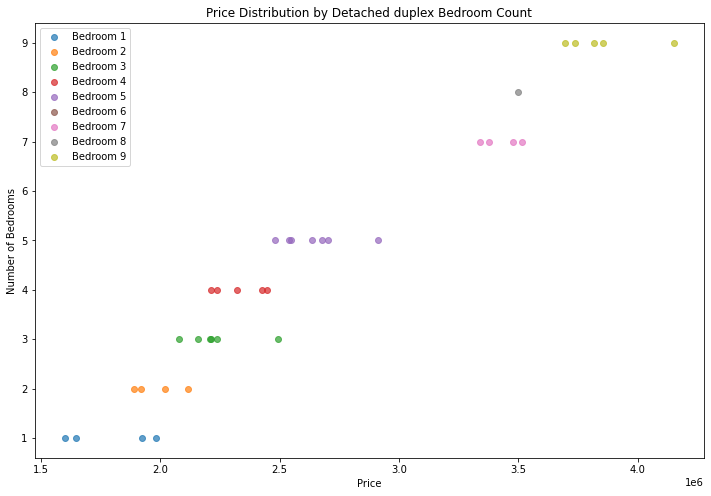



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  41.00000  33.00000      34.00000       43.00000
mean    4.63415   3.81818       3.38235  1888646.94767
std     2.27768   2.21436       1.49777   490035.53838
min     1.00000   1.00000       1.00000  1150001.75000
25%     3.00000   2.00000       2.00000  1461338.42950
50%     4.00000   4.00000       3.00000  1818271.73100
75%     6.00000   6.00000       5.00000  2168989.88200
max     9.00000   7.00000       6.00000  2883661.59100


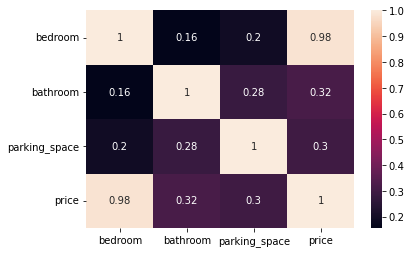

               loc      title  bedroom  bathroom  parking_space      price
1682   Cross River  Apartment     1.00      5.00           3.00 1210556.50
3580   Cross River  Apartment     1.00      1.00           4.00 1212449.54
11506  Cross River  Apartment     2.00      6.00           3.00 1440475.98
605    Cross River  Apartment     2.00      4.00           2.00 1340050.75
11001  Cross River  Apartment     2.00      5.00            NaN 1352688.65
1599   Cross River  Apartment     2.00      7.00           3.00 1478163.69
1715   Cross River  Apartment     2.00      1.00            NaN 1313871.90
10271  Cross River  Apartment     2.00      6.00           2.00 1415426.17
5100   Cross River  Apartment     2.00      2.00            NaN 1330670.47
70     Cross River  Apartment     3.00      2.00           3.00 1444513.17
10571  Cross River  Apartment     3.00       NaN            NaN 1727402.02
8692   Cross River  Apartment     3.00      4.00           5.00 1614338.89
5973   Cross River  Apart

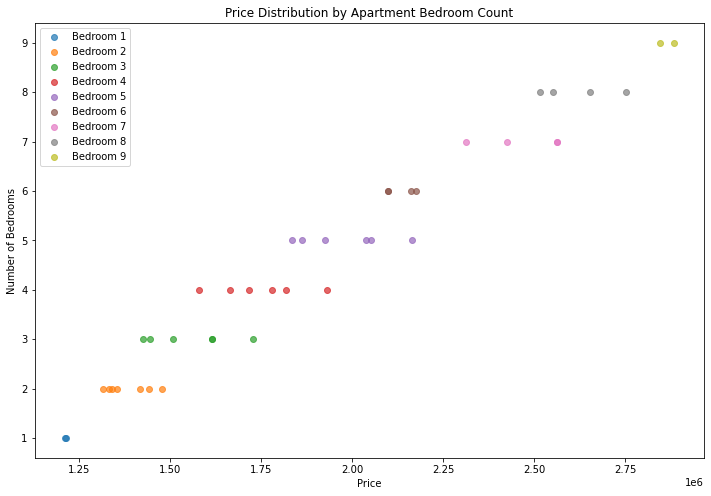



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  21.00000  21.00000      25.00000       26.00000
mean    4.80952   2.85714       3.28000  2037917.68531
std     2.67617   2.15141       1.83757   583451.70341
min     1.00000   1.00000       1.00000  1201256.30800
25%     3.00000   1.00000       2.00000  1588482.35475
50%     4.00000   2.00000       3.00000  1828091.19650
75%     7.00000   4.00000       5.00000  2574362.81900
max     9.00000   7.00000       6.00000  3300058.77300


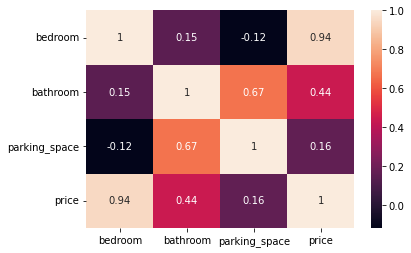

               loc     title  bedroom  bathroom  parking_space      price
7820   Cross River  Bungalow     1.00      4.00           5.00 1387728.03
5544   Cross River  Bungalow     1.00      7.00           6.00 1545571.40
5908   Cross River  Bungalow     1.00      1.00           3.00 1201256.31
10753  Cross River  Bungalow     2.00      6.00           6.00 1710062.56
9181   Cross River  Bungalow     3.00      2.00           2.00 1574797.09
5710   Cross River  Bungalow     3.00      1.00           1.00 1566032.22
6169   Cross River  Bungalow     3.00      1.00           1.00 1440377.97
6804   Cross River  Bungalow     3.00      3.00           1.00 1652175.56
6366   Cross River  Bungalow     4.00      2.00           4.00 1842257.91
4396   Cross River  Bungalow     4.00      2.00           2.00 1727279.97
6373   Cross River  Bungalow     4.00      1.00            NaN 1813924.49
2207   Cross River  Bungalow     5.00      1.00           1.00 1940740.17
9381   Cross River  Bungalow     5.00 

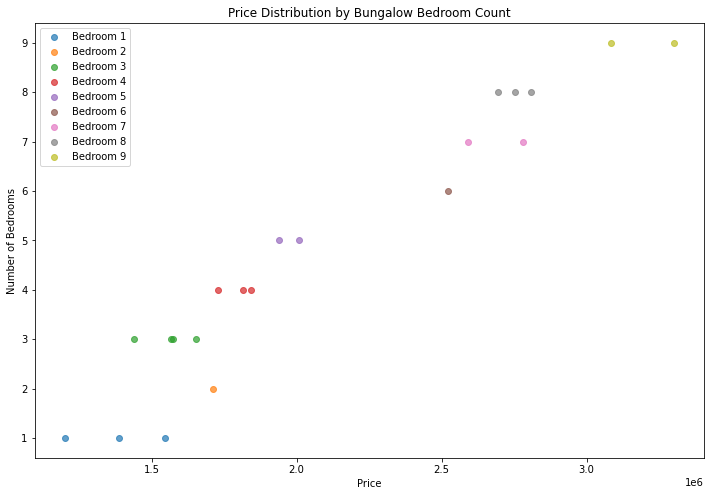



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  26.00000  30.00000      29.00000       33.00000
mean    4.46154   3.76667       3.62069  2055163.68479
std     2.71633   1.95965       1.69903   637410.61377
min     1.00000   1.00000       1.00000  1215699.62800
25%     2.00000   2.00000       2.00000  1509147.51800
50%     4.00000   4.00000       3.00000  1824462.25300
75%     7.00000   5.00000       5.00000  2750113.51800
max     9.00000   7.00000       6.00000  3070515.38000


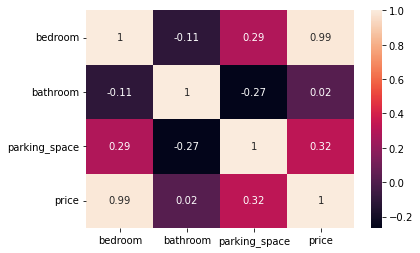

               loc title  bedroom  bathroom  parking_space      price
5966   Cross River  Flat     1.00       NaN           2.00 1259920.26
4757   Cross River  Flat     1.00      5.00           2.00 1344914.64
2312   Cross River  Flat     1.00      7.00            NaN 1402429.64
6024   Cross River  Flat     1.00      5.00           6.00 1459428.05
52     Cross River  Flat     2.00      2.00           4.00 1458366.97
11996  Cross River  Flat     2.00      5.00           2.00 1552477.48
8900   Cross River  Flat     2.00       NaN           5.00 1509147.52
2424   Cross River  Flat     2.00      1.00           3.00 1488971.61
1859   Cross River  Flat     3.00      6.00           6.00 1924532.34
5292   Cross River  Flat     3.00      7.00           1.00 1824462.25
8314   Cross River  Flat     3.00      1.00           6.00 1709173.98
9999   Cross River  Flat     3.00       NaN           3.00 1666360.60
5055   Cross River  Flat     4.00      1.00           3.00 1705882.55
483    Cross River  

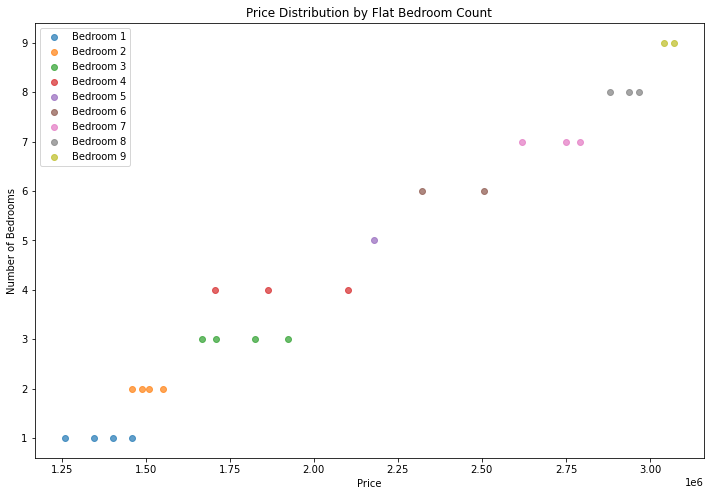



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  32.00000      29.00000       35.00000
mean    4.16667   2.78125       3.03448  2168577.40234
std     2.22963   1.91319       1.52322   547896.75015
min     1.00000   1.00000       1.00000  1313938.64200
25%     2.00000   1.00000       2.00000  1648603.34900
50%     4.00000   2.00000       3.00000  2173165.09700
75%     5.00000   4.25000       4.00000  2566448.84500
max     8.00000   7.00000       6.00000  3141103.37800


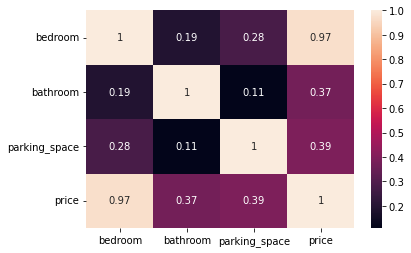

               loc           title  bedroom  bathroom  parking_space  \
3413   Cross River  Terrace duplex     1.00      5.00            NaN   
9432   Cross River  Terrace duplex     1.00      5.00            NaN   
4518   Cross River  Terrace duplex     1.00      2.00           1.00   
8556   Cross River  Terrace duplex     1.00      1.00           1.00   
207    Cross River  Terrace duplex     2.00      1.00            NaN   
11784  Cross River  Terrace duplex     2.00      1.00            NaN   
9372   Cross River  Terrace duplex     2.00      1.00           4.00   
9447   Cross River  Terrace duplex     2.00       NaN           3.00   
8315   Cross River  Terrace duplex     2.00      2.00           2.00   
1765   Cross River  Terrace duplex     3.00      1.00           4.00   
11962  Cross River  Terrace duplex     3.00      1.00           1.00   
11808  Cross River  Terrace duplex     3.00       NaN           3.00   
9299   Cross River  Terrace duplex     4.00      4.00           

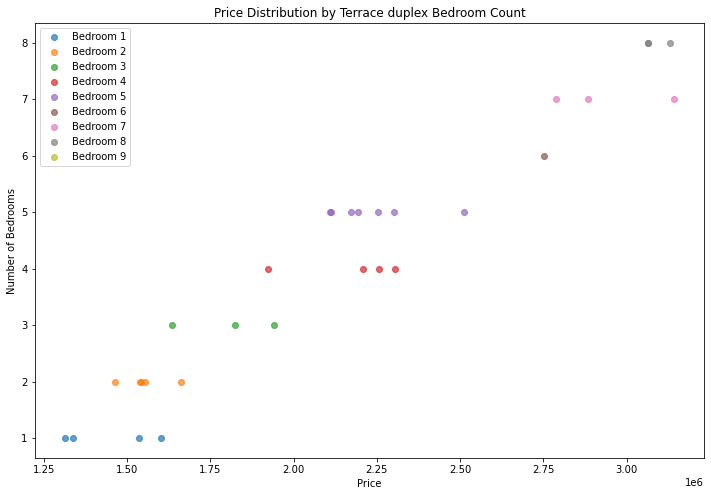



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  28.00000  26.00000      29.00000       34.00000
mean    4.46429   3.38462       2.86207  2255570.29159
std     2.39571   2.22849       1.50533   615974.18437
min     1.00000   1.00000       1.00000  1374913.86300
25%     3.00000   2.00000       2.00000  1825463.29625
50%     4.00000   2.00000       3.00000  2047018.18150
75%     5.00000   5.50000       4.00000  2606923.62125
max     9.00000   7.00000       6.00000  3506998.12900


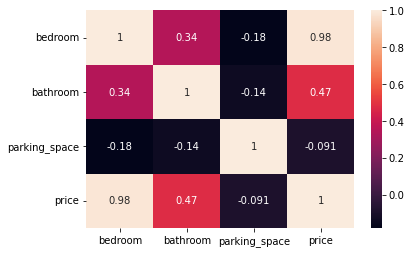

               loc                 title  bedroom  bathroom  parking_space  \
11014  Cross River  Semi-detached duplex     1.00      4.00           4.00   
2552   Cross River  Semi-detached duplex     1.00      1.00           4.00   
10846  Cross River  Semi-detached duplex     2.00      2.00            NaN   
9481   Cross River  Semi-detached duplex     2.00       NaN           1.00   
7941   Cross River  Semi-detached duplex     2.00      1.00           2.00   
193    Cross River  Semi-detached duplex     3.00      7.00            NaN   
408    Cross River  Semi-detached duplex     3.00       NaN           5.00   
603    Cross River  Semi-detached duplex     3.00      1.00           3.00   
10910  Cross River  Semi-detached duplex     3.00      2.00            NaN   
2855   Cross River  Semi-detached duplex     3.00      2.00           3.00   
8602   Cross River  Semi-detached duplex     3.00       NaN           2.00   
10470  Cross River  Semi-detached duplex     4.00      4.00     

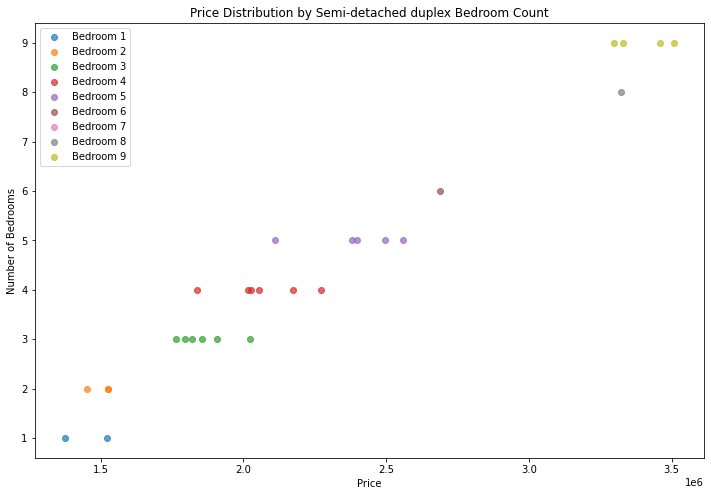



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  28.00000  23.00000      25.00000       32.00000
mean    4.00000   4.04348       2.88000  2335387.53506
std     1.92450   2.12085       1.33292   541431.84119
min     1.00000   1.00000       1.00000  1448372.18600
25%     3.00000   2.50000       2.00000  1994510.39875
50%     4.00000   4.00000       3.00000  2221698.65550
75%     5.00000   6.00000       4.00000  2664128.42250
max     9.00000   7.00000       6.00000  3548678.74100


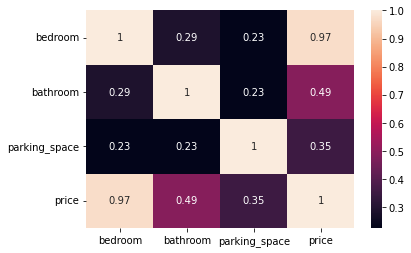

               loc      title  bedroom  bathroom  parking_space      price
893    Cross River  Townhouse     1.00       NaN           4.00 1519943.07
7009   Cross River  Townhouse     1.00      6.00           1.00 1681784.70
13918  Cross River  Townhouse     2.00       NaN           2.00 1794276.34
13260  Cross River  Townhouse     2.00      3.00           2.00 1794276.34
2677   Cross River  Townhouse     2.00      6.00           4.00 2027365.99
2885   Cross River  Townhouse     2.00       NaN           2.00 1794276.34
9579   Cross River  Townhouse     3.00      3.00           4.00 2110979.13
8084   Cross River  Townhouse     3.00      1.00            NaN 2035701.76
7836   Cross River  Townhouse     3.00      2.00            NaN 1890076.34
4285   Cross River  Townhouse     3.00      7.00            NaN 2254766.62
5515   Cross River  Townhouse     3.00      2.00           3.00 2052477.04
858    Cross River  Townhouse     3.00       NaN           3.00 2033398.67
2577   Cross River  Townh

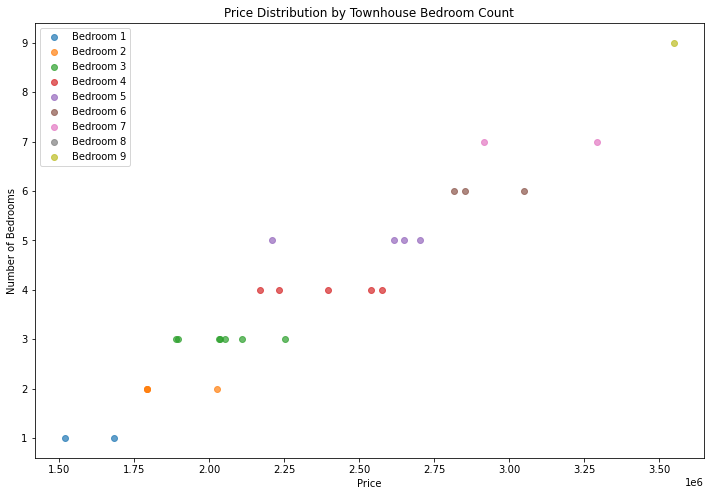



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  27.00000  28.00000      24.00000       30.00000
mean    4.18519   2.75000       2.95833  3058418.86650
std     2.55760   1.89785       1.54580   750531.20386
min     1.00000   1.00000       1.00000  2001971.46500
25%     2.00000   1.00000       2.00000  2431492.46400
50%     4.00000   2.00000       3.00000  3010631.11250
75%     5.50000   4.00000       4.00000  3606206.58950
max     9.00000   7.00000       6.00000  4421800.30600


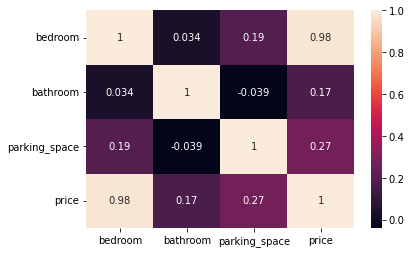

               loc      title  bedroom  bathroom  parking_space      price
5899   Cross River  Penthouse     1.00      2.00           4.00 2121910.63
10328  Cross River  Penthouse     1.00       NaN           4.00 2157143.14
3070   Cross River  Penthouse     1.00      2.00           2.00 2266226.36
3969   Cross River  Penthouse     1.00      2.00           1.00 2077356.33
12129  Cross River  Penthouse     1.00      6.00           2.00 2211945.87
11960  Cross River  Penthouse     2.00      1.00           3.00 2423370.46
11427  Cross River  Penthouse     2.00      2.00           3.00 2455858.49
2460   Cross River  Penthouse     2.00      2.00            NaN 2615754.95
4049   Cross River  Penthouse     2.00      1.00           3.00 2393844.96
7656   Cross River  Penthouse     3.00      2.00           4.00 2600365.44
7097   Cross River  Penthouse     3.00      5.00           6.00 2903381.98
9260   Cross River  Penthouse     4.00      7.00           1.00 3106678.81
13767  Cross River  Penth

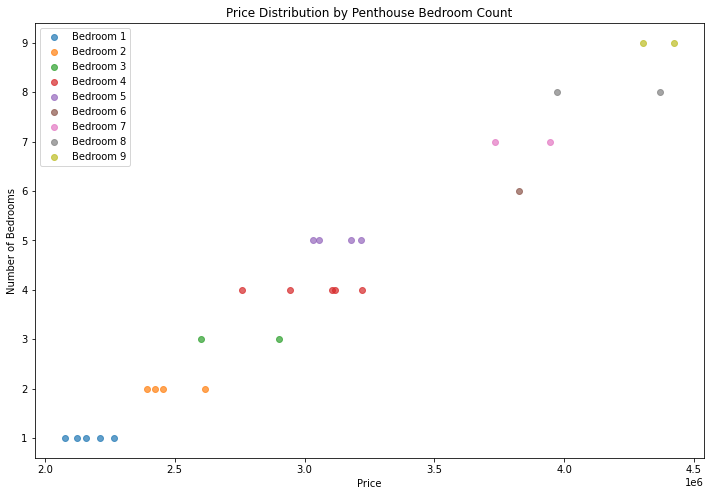



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  5.00000  6.00000       8.00000        9.00000
mean   2.60000  1.50000       2.25000  1458539.55016
std    1.14018  0.54772       0.70711   417496.38567
min    1.00000  1.00000       1.00000   929763.05220
25%    2.00000  1.00000       2.00000  1088117.71400
50%    3.00000  1.50000       2.00000  1499243.04900
75%    3.00000  2.00000       3.00000  1816842.75500
max    4.00000  2.00000       3.00000  1955873.32000


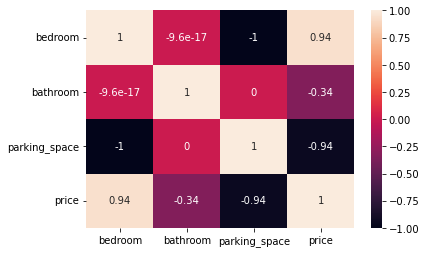

               loc    title  bedroom  bathroom  parking_space      price
13157  Cross River  Cottage     1.00      1.00           3.00  929763.05
7282   Cross River  Cottage     2.00      2.00           2.00 1088117.71
3811   Cross River  Cottage     3.00      2.00            NaN 1816842.75
6234   Cross River  Cottage     3.00      1.00           1.00 1764376.72
2670   Cross River  Cottage     4.00       NaN           3.00 1955873.32
1419   Cross River  Cottage      NaN      1.00           2.00 1897042.57
4677   Cross River  Cottage      NaN       NaN           2.00 1499243.05
6984   Cross River  Cottage      NaN       NaN           3.00  947244.47
11791  Cross River  Cottage      NaN      2.00           2.00 1228352.30


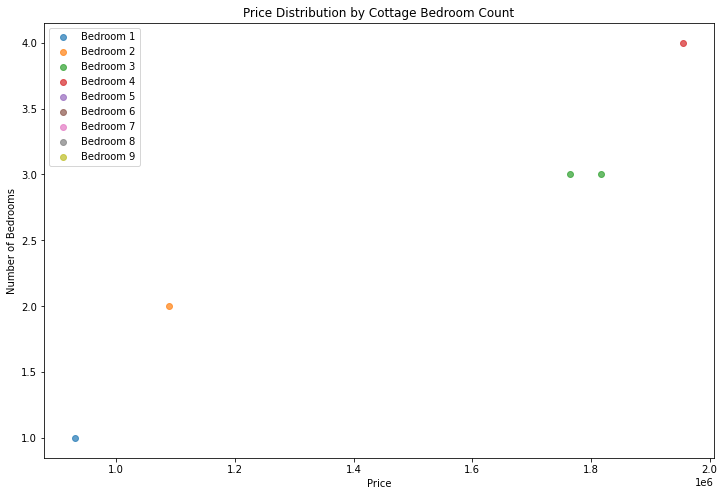

In [247]:
#Cross River 
Cross_River = housing_train[housing_train["loc" ] == "Cross River"]

# 'Cross_River'
house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Cross_River, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  30.00000  32.00000      37.00000       40.00000
mean    5.10000   3.78125       3.10811  4281430.74752
std     2.10664   2.23945       1.55963  1028916.66807
min     1.00000   1.00000       1.00000  1923388.17000
25%     4.00000   2.00000       2.00000  3816076.10375
50%     5.00000   3.00000       3.00000  4516954.08950
75%     6.00000   6.00000       4.00000  4926685.78475
max     9.00000   7.00000       6.00000  6083703.83500


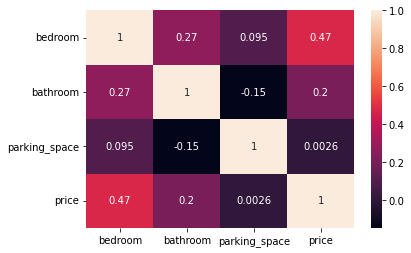

           loc    title  bedroom  bathroom  parking_space      price
10703  Anambra  Mansion     1.00      2.00           2.00 4004214.69
3922   Anambra  Mansion     1.00       NaN           2.00 2823061.10
8125   Anambra  Mansion     3.00      7.00            NaN 3777217.87
10319  Anambra  Mansion     3.00      2.00           2.00 4924097.49
10028  Anambra  Mansion     3.00      2.00           2.00 4673309.89
13905  Anambra  Mansion     3.00      1.00            NaN 1923388.17
188    Anambra  Mansion     4.00       NaN           1.00 3922024.51
13685  Anambra  Mansion     4.00      4.00           3.00 3859655.62
10082  Anambra  Mansion     4.00       NaN           3.00 3766659.97
6535   Anambra  Mansion     4.00      7.00           3.00 4138642.59
8690   Anambra  Mansion     4.00      1.00           4.00 5255341.38
8655   Anambra  Mansion     4.00       NaN           1.00 3829028.85
8221   Anambra  Mansion     4.00      6.00           1.00 3922024.51
9883   Anambra  Mansion     5.00  

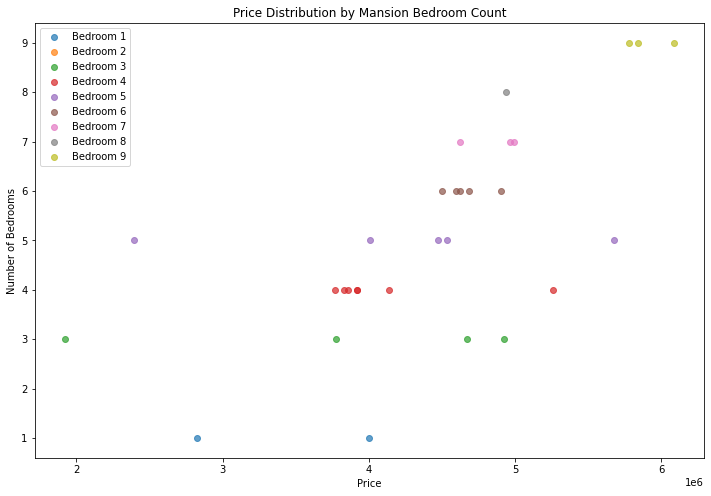



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  29.00000      30.00000       34.00000
mean    3.86667   2.68966       3.03333  2197157.37932
std     1.99540   2.13982       1.32570   497520.78587
min     1.00000   1.00000       1.00000  1444891.77200
25%     2.00000   1.00000       2.00000  1876563.82275
50%     4.00000   2.00000       3.00000  2074056.39900
75%     5.00000   4.00000       4.00000  2365060.86275
max     8.00000   7.00000       6.00000  3643458.72000


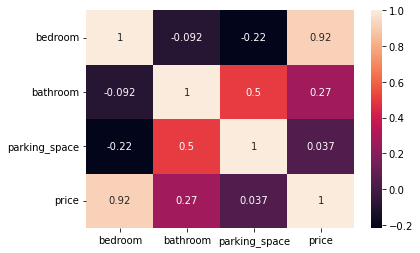

           loc            title  bedroom  bathroom  parking_space      price
6629   Anambra  Detached duplex     1.00      3.00            NaN 1663407.69
11543  Anambra  Detached duplex     1.00      3.00           5.00 1663407.69
13306  Anambra  Detached duplex     1.00      1.00           3.00 1657457.97
7177   Anambra  Detached duplex     1.00      7.00           6.00 1914551.49
8966   Anambra  Detached duplex     2.00      2.00           2.00 1744649.38
8965   Anambra  Detached duplex     2.00      5.00           5.00 2009311.84
1353   Anambra  Detached duplex     2.00      2.00           2.00 1787463.58
12219  Anambra  Detached duplex     2.00      1.00            NaN 1708433.44
11363  Anambra  Detached duplex     2.00      4.00           2.00 1848115.93
11150  Anambra  Detached duplex     3.00      1.00           1.00 1863901.27
9204   Anambra  Detached duplex     3.00       NaN           4.00 1957308.87
2289   Anambra  Detached duplex     3.00      4.00           3.00 2129033.29

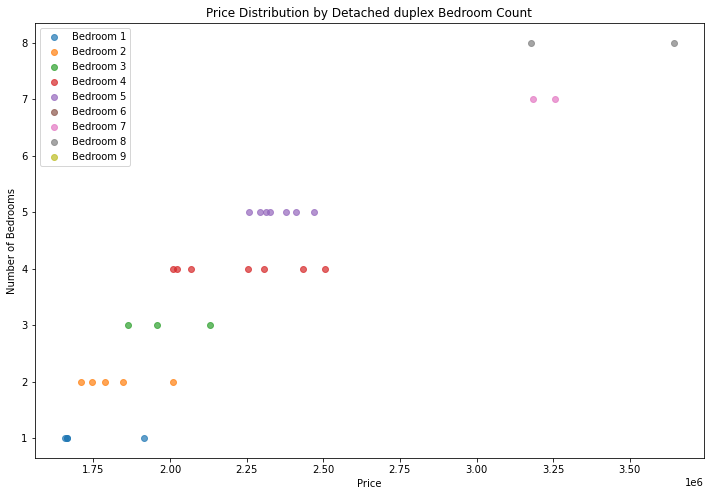



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  20.00000  20.00000      22.00000       24.00000
mean    4.45000   2.45000       3.13636  1620073.92769
std     2.08945   1.87715       1.58251   440259.99155
min     1.00000   1.00000       1.00000   924246.48760
25%     3.75000   1.00000       2.00000  1225823.37200
50%     4.50000   2.00000       3.00000  1606185.20600
75%     6.00000   4.00000       4.00000  1920557.48825
max     8.00000   7.00000       6.00000  2549808.24500


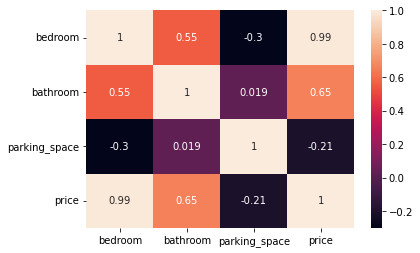

           loc      title  bedroom  bathroom  parking_space      price
6003   Anambra  Apartment     1.00      1.00           1.00  924246.49
10294  Anambra  Apartment     1.00      1.00           6.00 1038109.25
10950  Anambra  Apartment     1.00      2.00           5.00 1049598.26
10820  Anambra  Apartment     2.00      1.00           3.00 1231292.15
11003  Anambra  Apartment     3.00      2.00           4.00 1419856.64
1230   Anambra  Apartment     4.00      1.00           4.00 1555892.19
13443  Anambra  Apartment     4.00      2.00           2.00 1585248.23
2436   Anambra  Apartment     4.00       NaN           2.00 1484665.63
2977   Anambra  Apartment     4.00       NaN           2.00 1489673.91
10486  Anambra  Apartment     4.00       NaN           4.00 1627122.19
13499  Anambra  Apartment     5.00      2.00            NaN 1713114.88
12933  Anambra  Apartment     5.00      1.00           2.00 1734597.78
7461   Anambra  Apartment     5.00      4.00           2.00 1813744.34
11547 

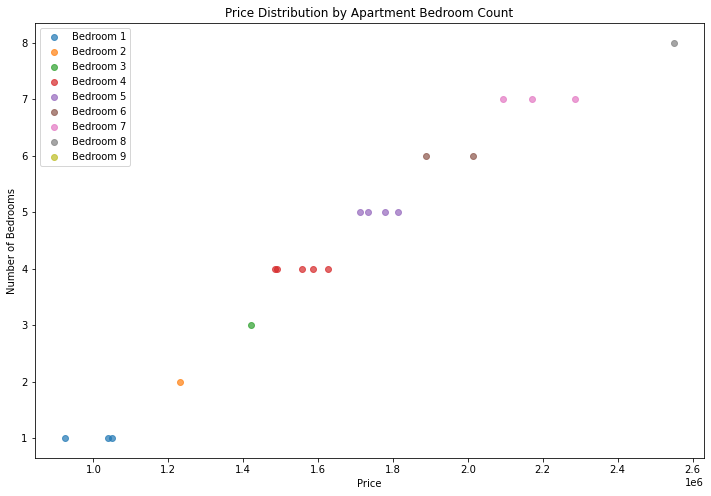



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  20.00000  18.00000      21.00000       25.00000
mean    3.40000   3.38889       4.00000  1680235.83208
std     2.16187   2.27877       1.76068   413217.43195
min     1.00000   1.00000       1.00000  1129334.79000
25%     1.75000   1.25000       3.00000  1385371.04400
50%     3.00000   2.50000       4.00000  1641609.95400
75%     5.00000   5.00000       5.00000  1820220.97400
max     8.00000   7.00000       6.00000  2622443.30000


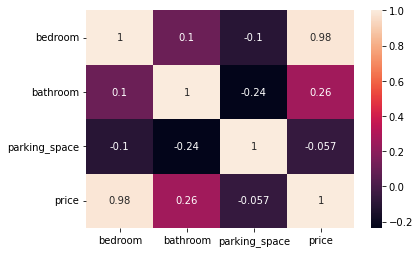

           loc     title  bedroom  bathroom  parking_space      price
1355   Anambra  Bungalow     1.00       NaN           4.00 1320189.20
2748   Anambra  Bungalow     1.00       NaN           2.00 1129334.79
5093   Anambra  Bungalow     1.00      1.00           5.00 1150434.65
13287  Anambra  Bungalow     1.00      2.00           3.00 1137539.17
8532   Anambra  Bungalow     1.00       NaN           6.00 1254772.56
13854  Anambra  Bungalow     2.00       NaN           6.00 1412029.46
5574   Anambra  Bungalow     2.00      7.00           2.00 1503706.69
9129   Anambra  Bungalow     2.00      1.00           6.00 1372873.39
1295   Anambra  Bungalow     3.00      6.00           6.00 1771973.63
12055  Anambra  Bungalow     3.00      4.00           4.00 1641609.95
4687   Anambra  Bungalow     3.00      4.00            NaN 1563532.63
6562   Anambra  Bungalow     3.00      5.00            NaN 1680766.02
9216   Anambra  Bungalow     4.00      2.00           5.00 1797437.64
6338   Anambra  Bung

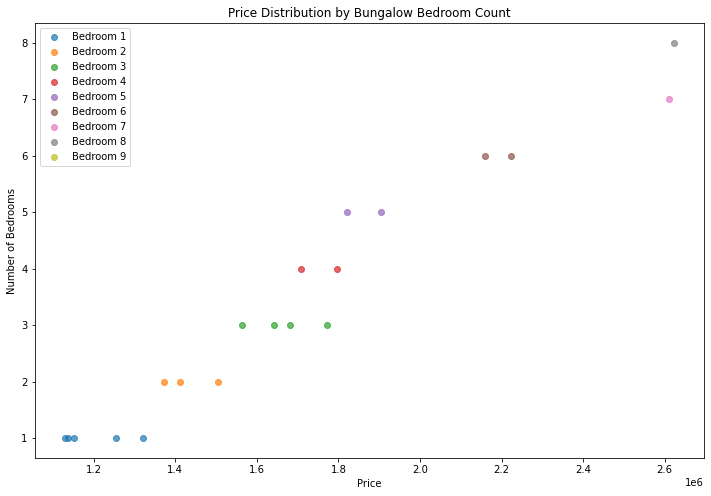



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  22.00000  24.00000      21.00000       28.00000
mean    4.77273   3.04167       2.85714  1919435.91086
std     2.36908   2.11576       1.79682   512469.58225
min     1.00000   1.00000       1.00000  1179658.79000
25%     3.00000   1.00000       1.00000  1468994.91525
50%     4.00000   2.00000       3.00000  1807156.53750
75%     6.00000   5.00000       4.00000  2266813.82675
max     9.00000   7.00000       6.00000  3001210.50800


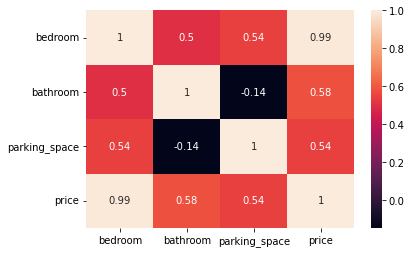

           loc title  bedroom  bathroom  parking_space      price
9860   Anambra  Flat     1.00      2.00            NaN 1179658.79
1166   Anambra  Flat     2.00      2.00           2.00 1317789.61
1464   Anambra  Flat     2.00       NaN           1.00 1360212.72
13369  Anambra  Flat     3.00      2.00            NaN 1589323.60
2832   Anambra  Flat     3.00      2.00           1.00 1376589.34
12494  Anambra  Flat     3.00      2.00            NaN 1458180.34
11905  Anambra  Flat     3.00      1.00            NaN 1459709.04
7648   Anambra  Flat     3.00      1.00            NaN 1472090.21
9066   Anambra  Flat     3.00       NaN           6.00 1811129.70
7704   Anambra  Flat     4.00      2.00           1.00 1586528.35
2602   Anambra  Flat     4.00      6.00            NaN 1928036.13
5674   Anambra  Flat     4.00      1.00           1.00 1654178.48
218    Anambra  Flat     5.00       NaN           4.00 1796728.77
10518  Anambra  Flat     6.00      3.00            NaN 2237329.37
11221  Ana

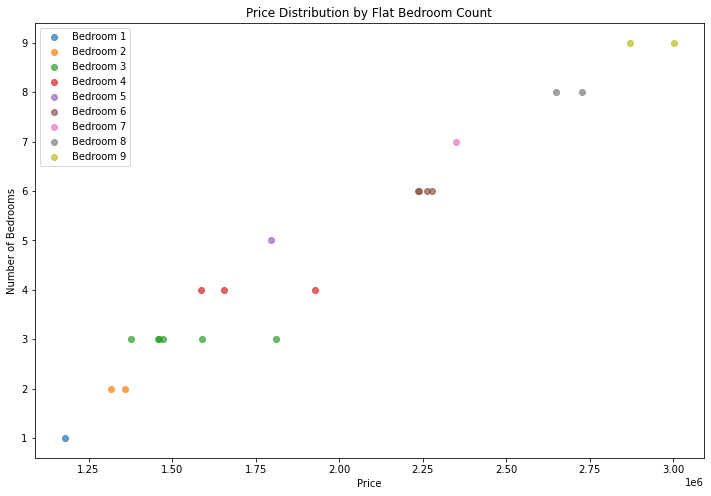



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  25.00000  29.00000      27.00000       31.00000
mean    4.60000   3.44828       3.55556  2171992.07565
std     2.91548   2.01044       1.80455   687519.26055
min     1.00000   1.00000       1.00000  1146063.40100
25%     2.00000   2.00000       2.00000  1583984.05050
50%     5.00000   3.00000       3.00000  2073134.91600
75%     7.00000   5.00000       5.50000  2833826.77800
max     9.00000   7.00000       6.00000  3384530.50500


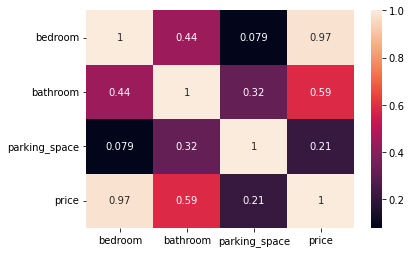

           loc           title  bedroom  bathroom  parking_space      price
12713  Anambra  Terrace duplex     1.00      2.00            NaN 1176465.89
10371  Anambra  Terrace duplex     1.00      1.00           1.00 1146063.40
8094   Anambra  Terrace duplex     1.00      2.00            NaN 1300304.18
6860   Anambra  Terrace duplex     1.00      7.00           3.00 1491278.05
6005   Anambra  Terrace duplex     1.00      1.00           3.00 1297915.90
6457   Anambra  Terrace duplex     2.00      4.00           4.00 1598755.63
108    Anambra  Terrace duplex     2.00      2.00           6.00 1569212.47
4061   Anambra  Terrace duplex     2.00      1.00           2.00 1493660.80
3303   Anambra  Terrace duplex     2.00      5.00            NaN 1613527.21
8388   Anambra  Terrace duplex     3.00      5.00           6.00 1918621.44
10654  Anambra  Terrace duplex     3.00      2.00           3.00 1698632.73
4201   Anambra  Terrace duplex     4.00      1.00           3.00 1702381.87
3884   Anamb

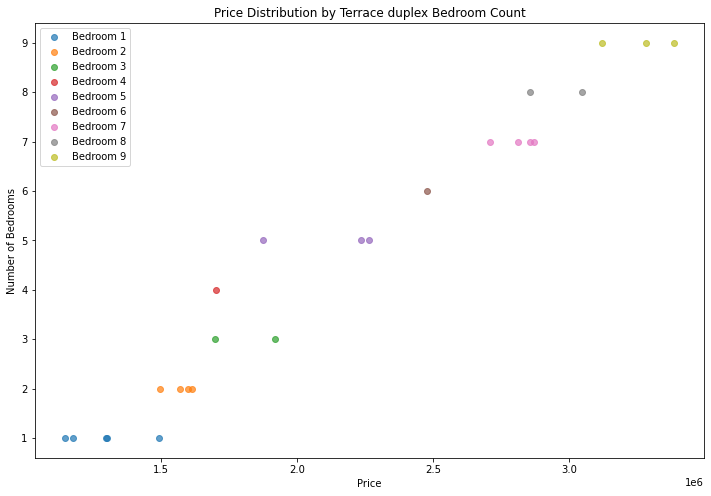



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  31.00000  31.00000      34.00000       37.00000
mean    4.00000   3.35484       3.38235  2084450.81770
std     2.59487   1.92438       1.68801   635444.41470
min     1.00000   1.00000       1.00000  1171201.87800
25%     2.00000   2.00000       2.00000  1549836.04500
50%     4.00000   3.00000       3.00000  1949963.11100
75%     6.00000   4.00000       5.00000  2665627.66500
max     9.00000   7.00000       6.00000  3296429.35700


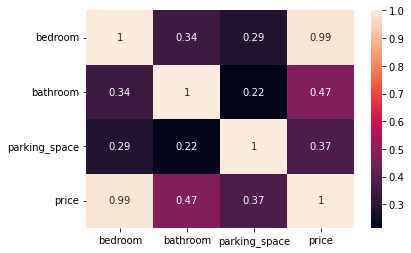

           loc                 title  bedroom  bathroom  parking_space  \
11834  Anambra  Semi-detached duplex     1.00      2.00           3.00   
7734   Anambra  Semi-detached duplex     1.00      1.00           3.00   
7488   Anambra  Semi-detached duplex     1.00      2.00           2.00   
3526   Anambra  Semi-detached duplex     1.00      2.00           4.00   
10121  Anambra  Semi-detached duplex     1.00       NaN           5.00   
4532   Anambra  Semi-detached duplex     1.00      5.00           4.00   
6111   Anambra  Semi-detached duplex     1.00       NaN           1.00   
8973   Anambra  Semi-detached duplex     2.00      2.00           4.00   
10737  Anambra  Semi-detached duplex     2.00      4.00            NaN   
1118   Anambra  Semi-detached duplex     2.00      2.00           1.00   
1819   Anambra  Semi-detached duplex     2.00      2.00           1.00   
5199   Anambra  Semi-detached duplex     2.00      3.00           2.00   
10087  Anambra  Semi-detached duplex  

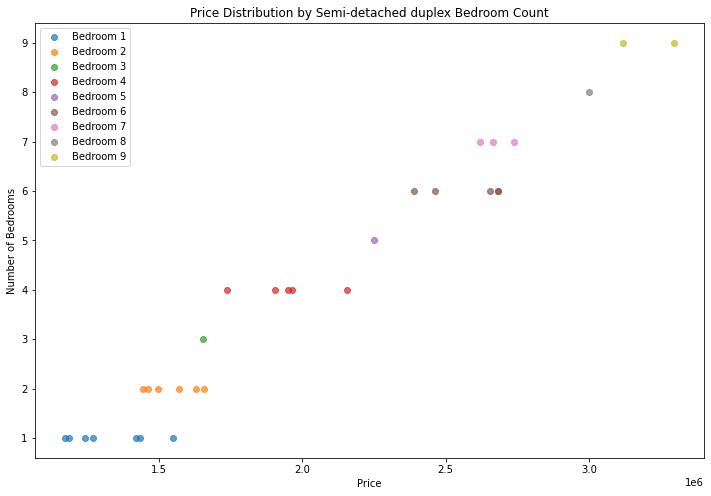



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  26.00000  30.00000      27.00000       33.00000
mean    3.38462   2.90000       3.74074  2098913.62561
std     2.09908   2.04011       1.60750   573526.61330
min     1.00000   1.00000       1.00000  1342216.44700
25%     2.00000   1.00000       3.00000  1618937.56300
50%     3.00000   2.00000       4.00000  1950828.21300
75%     4.00000   5.00000       5.00000  2498654.44100
max     9.00000   7.00000       6.00000  3386489.77500


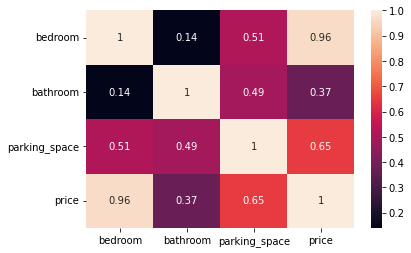

           loc      title  bedroom  bathroom  parking_space      price
6214   Anambra  Townhouse     1.00      1.00           2.00 1342216.45
8758   Anambra  Townhouse     1.00      3.00           1.00 1388391.84
2721   Anambra  Townhouse     1.00       NaN           4.00 1491281.96
3545   Anambra  Townhouse     1.00      2.00            NaN 1568271.96
5784   Anambra  Townhouse     1.00      2.00            NaN 1431807.22
13090  Anambra  Townhouse     2.00      2.00           3.00 1587590.44
9698   Anambra  Townhouse     2.00      2.00           4.00 1732595.31
9471   Anambra  Townhouse     2.00      2.00           3.00 1590094.28
13717  Anambra  Townhouse     2.00      5.00           6.00 1873230.74
5368   Anambra  Townhouse     2.00      5.00           2.00 1743101.86
13876  Anambra  Townhouse     2.00      6.00           4.00 1857111.38
2617   Anambra  Townhouse     3.00      7.00           6.00 2202315.48
2145   Anambra  Townhouse     3.00      1.00            NaN 1726729.61
10856 

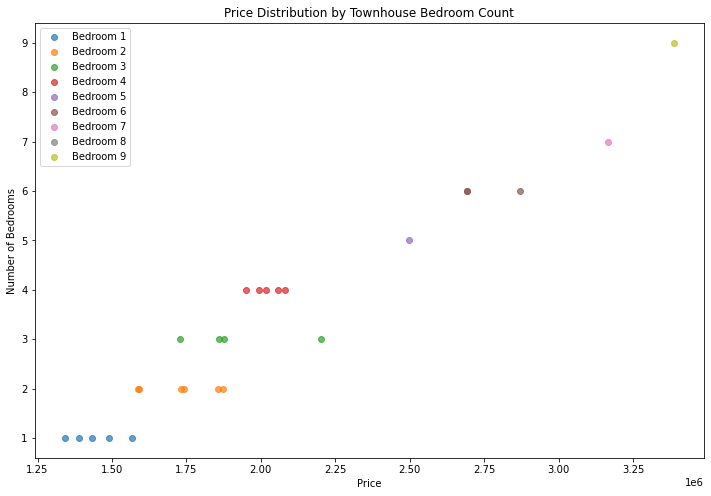



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  37.00000  31.00000      36.00000       43.00000
mean    4.16216   2.83871       3.30556  2768097.35933
std     2.37479   1.93385       1.78597   660934.31323
min     1.00000   1.00000       1.00000  1699048.75800
25%     2.00000   1.00000       2.00000  2242311.27600
50%     5.00000   2.00000       3.00000  2882069.18100
75%     6.00000   4.00000       5.00000  3167055.81650
max     9.00000   7.00000       6.00000  4374522.44800


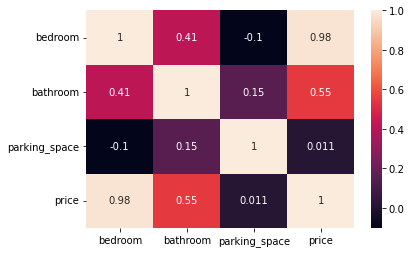

           loc      title  bedroom  bathroom  parking_space      price
153    Anambra  Penthouse     1.00       NaN           4.00 2123663.81
13487  Anambra  Penthouse     1.00       NaN           2.00 1699048.76
12972  Anambra  Penthouse     1.00      2.00           1.00 1720385.48
6426   Anambra  Penthouse     1.00      2.00           2.00 1866210.99
5002   Anambra  Penthouse     1.00      1.00            NaN 1868216.29
2861   Anambra  Penthouse     1.00      3.00           6.00 1995473.51
13778  Anambra  Penthouse     1.00      1.00           6.00 1868216.29
2693   Anambra  Penthouse     2.00      1.00           2.00 2208315.09
7912   Anambra  Penthouse     2.00       NaN            NaN 2276307.46
13502  Anambra  Penthouse     2.00      2.00           3.00 2372985.68
923    Anambra  Penthouse     2.00       NaN           2.00 2156034.22
4661   Anambra  Penthouse     2.00      6.00           4.00 2367875.20
13408  Anambra  Penthouse     2.00      2.00           3.00 2157171.05
5761  

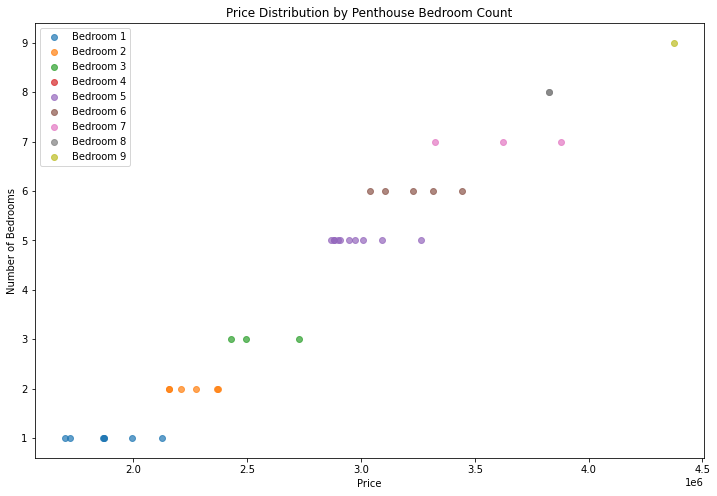



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  14.00000  13.00000      12.00000       15.00000
mean    1.92857   1.53846       2.66667  1304594.14665
std     1.43925   0.51887       1.15470   287112.31907
min     1.00000   1.00000       1.00000   905000.99060
25%     1.00000   1.00000       2.00000  1179643.69600
50%     1.00000   2.00000       2.50000  1278102.74800
75%     2.00000   2.00000       4.00000  1377150.67550
max     5.00000   2.00000       4.00000  1945772.91700


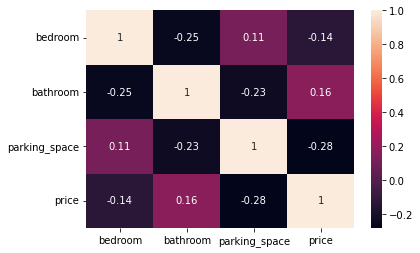

           loc    title  bedroom  bathroom  parking_space      price
98     Anambra  Cottage     1.00      1.00           2.00 1222589.96
3687   Anambra  Cottage     1.00      1.00           2.00 1244028.86
4080   Anambra  Cottage     1.00      2.00            NaN 1321222.99
8905   Anambra  Cottage     1.00      2.00           4.00 1278102.75
10269  Anambra  Cottage     1.00      1.00           4.00 1270286.13
11552  Anambra  Cottage     1.00      2.00           1.00 1331415.49
12465  Anambra  Cottage     1.00      2.00           3.00  905000.99
13683  Anambra  Cottage     1.00      2.00            NaN 1369696.65
482    Anambra  Cottage     2.00      1.00           2.00 1008065.39
5833   Anambra  Cottage     2.00       NaN           3.00 1400817.07
6233   Anambra  Cottage     2.00      2.00           1.00 1384604.70
4288   Anambra  Cottage     3.00      1.00           4.00 1136697.43
5369   Anambra  Cottage     5.00       NaN           4.00 1945772.92
10298  Anambra  Cottage     5.00  

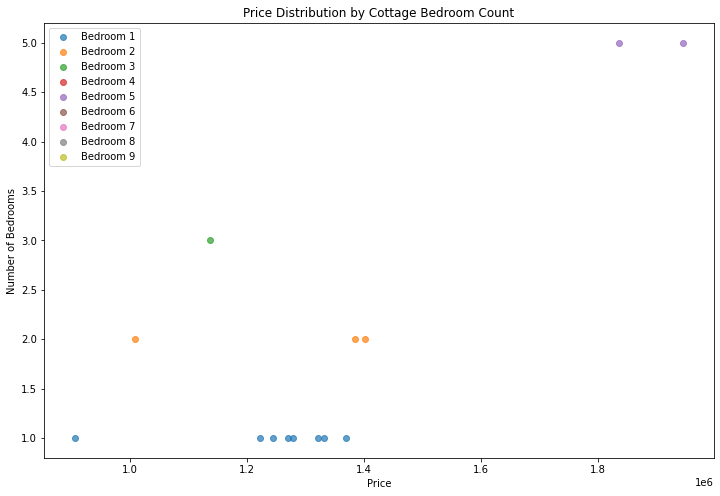

In [248]:
#Anambra
Anambra = housing_train[housing_train["loc" ] == "Anambra"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Anambra, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  28.00000  26.00000      24.00000       31.00000
mean    4.39286   2.30769       2.54167  4570327.57948
std     2.68520   1.54322       1.53167  1396590.32071
min     1.00000   1.00000       1.00000  1790408.63400
25%     2.00000   1.00000       1.00000  3559443.74850
50%     3.50000   2.00000       2.00000  5038742.04200
75%     7.00000   2.75000       3.25000  5562380.19600
max     9.00000   7.00000       6.00000  6836750.99900


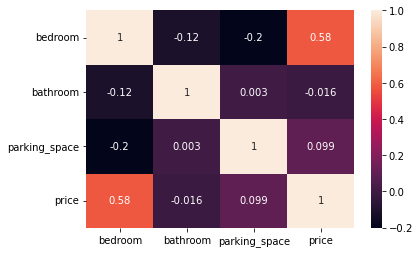

        loc    title  bedroom  bathroom  parking_space      price
5620   Ogun  Mansion     1.00       NaN           1.00 3030409.77
8589   Ogun  Mansion     1.00      1.00           3.00 1790408.63
11826  Ogun  Mansion     1.00      1.00           4.00 5048835.37
7102   Ogun  Mansion     1.00      3.00            NaN 2961804.00
3483   Ogun  Mansion     2.00      2.00           1.00 5038742.04
3909   Ogun  Mansion     2.00       NaN            NaN 1931290.70
4055   Ogun  Mansion     2.00      4.00           6.00 3644280.81
7234   Ogun  Mansion     2.00      5.00           2.00 3474606.69
8183   Ogun  Mansion     3.00      1.00           1.00 2323711.23
2779   Ogun  Mansion     3.00       NaN           1.00 2274212.55
5542   Ogun  Mansion     3.00      4.00            NaN 4027392.34
12025  Ogun  Mansion     3.00      2.00           2.00 5438703.96
2962   Ogun  Mansion     3.00      2.00            NaN 5534701.66
6940   Ogun  Mansion     3.00       NaN           2.00 5153785.61
10724  Ogu

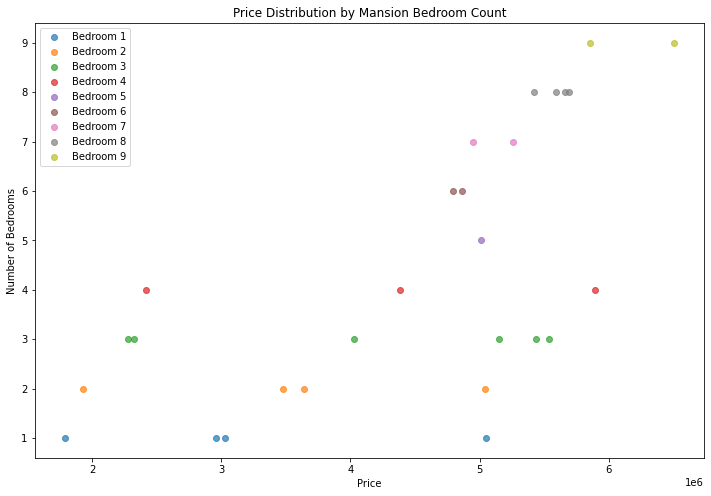



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  25.00000  22.00000      23.00000       29.00000
mean    3.76000   3.59091       3.26087  2524141.78452
std     2.27816   2.19651       1.88818   631907.30948
min     1.00000   1.00000       1.00000  1724195.81800
25%     2.00000   2.00000       1.00000  1958247.43700
50%     3.00000   3.00000       3.00000  2407844.57700
75%     5.00000   5.00000       5.00000  2772458.06900
max     9.00000   7.00000       6.00000  3954340.29100


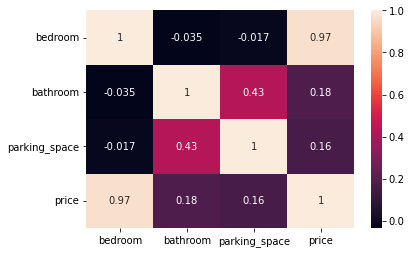

        loc            title  bedroom  bathroom  parking_space      price
9979   Ogun  Detached duplex     1.00      2.00           4.00 1724195.82
12791  Ogun  Detached duplex     1.00      5.00           5.00 1941230.45
1542   Ogun  Detached duplex     1.00       NaN           1.00 1902221.61
9005   Ogun  Detached duplex     1.00      2.00           3.00 1800796.43
10078  Ogun  Detached duplex     2.00      3.00            NaN 1958247.44
7945   Ogun  Detached duplex     2.00      7.00           6.00 2352597.57
379    Ogun  Detached duplex     2.00       NaN            NaN 1859659.90
5406   Ogun  Detached duplex     2.00      7.00           6.00 2352597.57
2423   Ogun  Detached duplex     3.00      2.00           3.00 2407844.58
1588   Ogun  Detached duplex     3.00      3.00           2.00 2218710.42
5975   Ogun  Detached duplex     3.00      3.00           5.00 2336802.38
5985   Ogun  Detached duplex     3.00      2.00            NaN 2451685.74
8352   Ogun  Detached duplex     3.00 

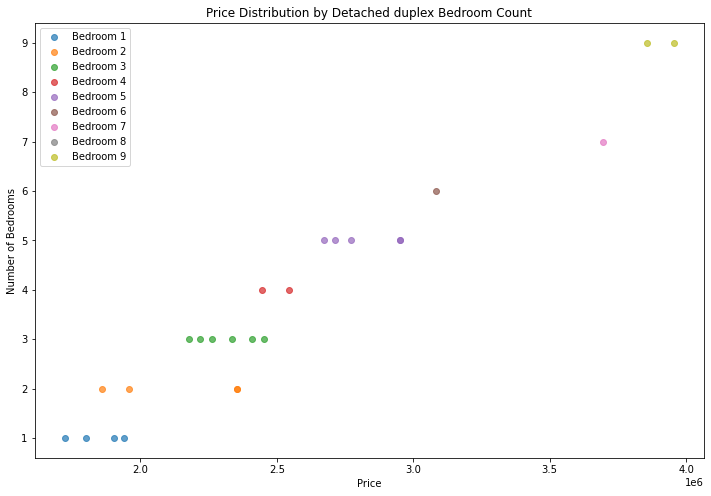



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  28.00000  26.00000      25.00000       31.00000
mean    5.03571   3.50000       3.72000  2101020.84265
std     2.99978   1.83848       1.54164   597332.34842
min     1.00000   1.00000       1.00000  1172642.78600
25%     2.00000   2.00000       3.00000  1500457.85600
50%     5.50000   3.00000       4.00000  2161295.34300
75%     8.00000   5.00000       5.00000  2640658.84300
max     9.00000   7.00000       6.00000  2946173.11000


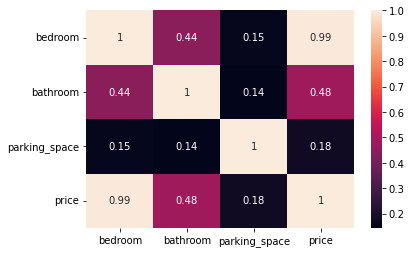

        loc      title  bedroom  bathroom  parking_space      price
5247   Ogun  Apartment     1.00      3.00           5.00 1185280.69
8628   Ogun  Apartment     1.00      2.00           6.00 1172642.79
4193   Ogun  Apartment     1.00      2.00           2.00 1324343.09
1504   Ogun  Apartment     1.00       NaN           4.00 1273294.02
12859  Ogun  Apartment     1.00       NaN           2.00 1319637.08
630    Ogun  Apartment     1.00      6.00           5.00 1298343.83
5480   Ogun  Apartment     2.00      2.00           2.00 1398220.69
4494   Ogun  Apartment     2.00      1.00           4.00 1436676.44
2809   Ogun  Apartment     3.00      7.00            NaN 1752451.83
7966   Ogun  Apartment     3.00      4.00           3.00 1564239.27
5138   Ogun  Apartment     4.00      5.00            NaN 1755760.21
7139   Ogun  Apartment     4.00      1.00           3.00 1841885.49
6171   Ogun  Apartment     4.00      2.00           4.00 1828902.07
249    Ogun  Apartment     5.00       NaN       

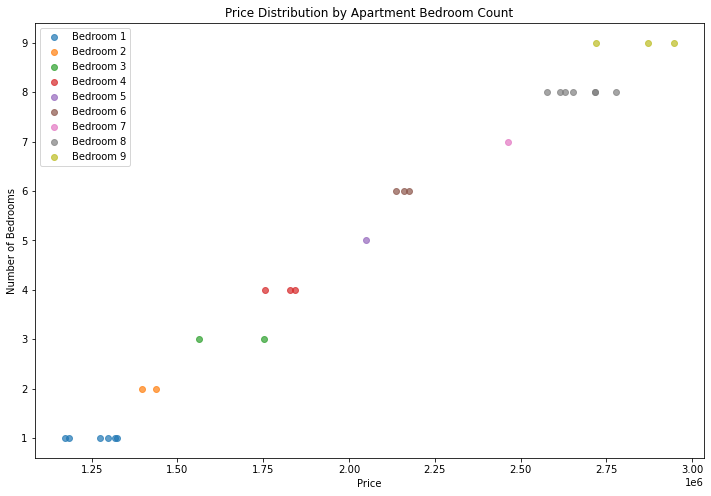



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  17.00000  18.00000      15.00000       20.00000
mean    4.11765   3.38889       3.26667  1993515.28840
std     2.20461   2.27877       1.79151   520694.38211
min     1.00000   1.00000       1.00000  1272956.33200
25%     3.00000   2.00000       2.00000  1625510.57075
50%     4.00000   2.00000       4.00000  1912170.94150
75%     5.00000   6.00000       4.50000  2145658.77525
max     9.00000   7.00000       6.00000  3084700.41200


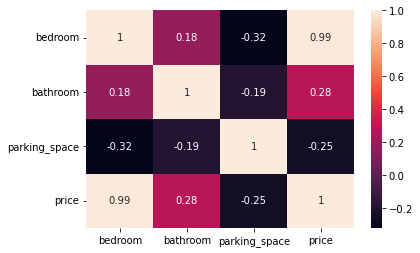

        loc     title  bedroom  bathroom  parking_space      price
10     Ogun  Bungalow     1.00      2.00           6.00 1330213.04
2298   Ogun  Bungalow     1.00      2.00            NaN 1464386.63
5522   Ogun  Bungalow     1.00      3.00           4.00 1316028.00
12169  Ogun  Bungalow     3.00      7.00            NaN 1853090.60
10123  Ogun  Bungalow     3.00      6.00           6.00 1924532.34
7744   Ogun  Bungalow     3.00      1.00           2.00 1625780.93
13835  Ogun  Bungalow     3.00      6.00           2.00 1810018.93
3856   Ogun  Bungalow     4.00       NaN           5.00 1899809.54
10631  Ogun  Bungalow     4.00      1.00            NaN 1899809.54
11299  Ogun  Bungalow     4.00      1.00           4.00 1970373.56
2183   Ogun  Bungalow     5.00      7.00            NaN 2266719.07
13199  Ogun  Bungalow     5.00      2.00           1.00 2105305.34
13405  Ogun  Bungalow     5.00      1.00            NaN 2036917.39
5766   Ogun  Bungalow     5.00       NaN           1.00 209035

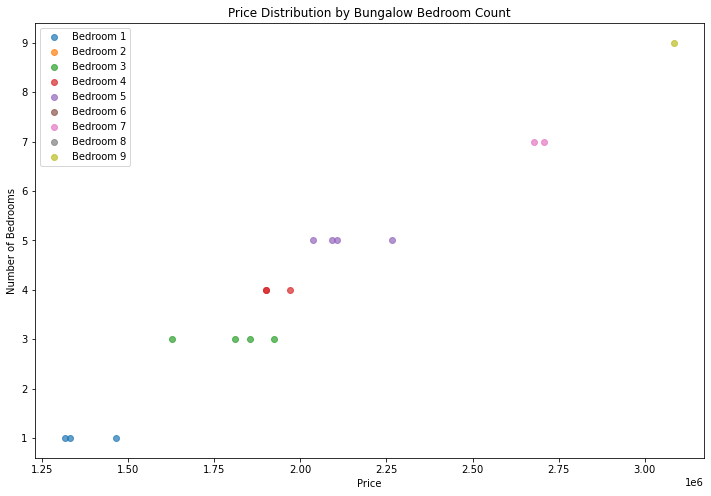



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  32.00000  27.00000      29.00000       34.00000
mean    4.46875   3.29630       3.24138  2066818.38476
std     1.93415   2.26707       1.72493   434221.59275
min     1.00000   1.00000       1.00000  1393739.31800
25%     3.00000   2.00000       2.00000  1798928.15500
50%     4.00000   2.00000       4.00000  1987383.96650
75%     6.00000   5.50000       5.00000  2413478.22475
max     8.00000   7.00000       6.00000  2981115.71100


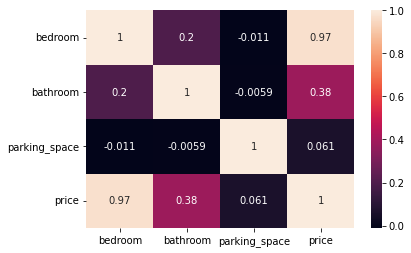

        loc title  bedroom  bathroom  parking_space      price
3662   Ogun  Flat     1.00      7.00           1.00 1402429.64
11514  Ogun  Flat     1.00      2.00           1.00 1414635.59
10295  Ogun  Flat     2.00       NaN           4.00 1652805.85
5050   Ogun  Flat     2.00      1.00            NaN 1452115.25
6755   Ogun  Flat     2.00      7.00           6.00 1753134.23
11120  Ogun  Flat     3.00      1.00           1.00 1554271.98
11686  Ogun  Flat     3.00      3.00           6.00 1795317.32
5763   Ogun  Flat     3.00       NaN           4.00 1824203.97
6132   Ogun  Flat     3.00      2.00           2.00 1719230.73
13888  Ogun  Flat     3.00      4.00           5.00 1809760.65
3389   Ogun  Flat     4.00      7.00           5.00 2158239.58
11249  Ogun  Flat     4.00      2.00           4.00 1988815.05
2166   Ogun  Flat     4.00       NaN           4.00 1931384.45
6683   Ogun  Flat     4.00      2.00           1.00 1828367.81
10260  Ogun  Flat     4.00       NaN           5.00 207

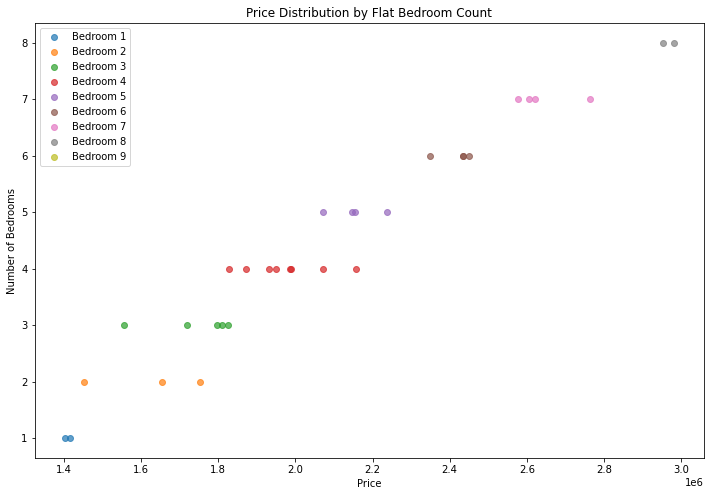



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  40.00000  39.00000      36.00000       46.00000
mean    4.67500   3.00000       2.88889  2353561.05583
std     2.41138   2.03909       1.56347   584100.72082
min     1.00000   1.00000       1.00000  1375204.43700
25%     2.00000   1.00000       2.00000  1846237.46975
50%     5.00000   2.00000       3.00000  2244238.14550
75%     6.00000   4.50000       4.00000  2792256.78700
max     9.00000   7.00000       6.00000  3458542.49800


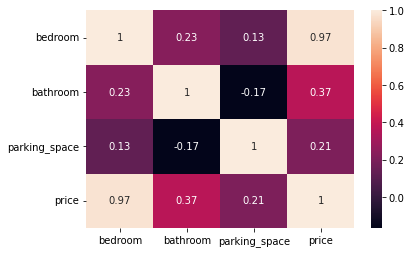

        loc           title  bedroom  bathroom  parking_space      price
8820   Ogun  Terrace duplex     1.00       NaN           6.00 1633150.18
7937   Ogun  Terrace duplex     1.00      1.00           3.00 1594614.84
7242   Ogun  Terrace duplex     1.00      2.00            NaN 1454572.30
9847   Ogun  Terrace duplex     2.00       NaN           3.00 1661839.37
3897   Ogun  Terrace duplex     2.00      2.00           2.00 1641642.38
8884   Ogun  Terrace duplex     2.00      2.00           3.00 1841614.60
295    Ogun  Terrace duplex     2.00      7.00           1.00 1791920.86
10791  Ogun  Terrace duplex     2.00      2.00           1.00 1549642.71
12436  Ogun  Terrace duplex     2.00      2.00           3.00 1819614.36
10710  Ogun  Terrace duplex     2.00      1.00            NaN 1678294.07
3343   Ogun  Terrace duplex     2.00       NaN           4.00 1840085.92
2941   Ogun  Terrace duplex     3.00      2.00           4.00 1915744.75
2004   Ogun  Terrace duplex     3.00      3.00     

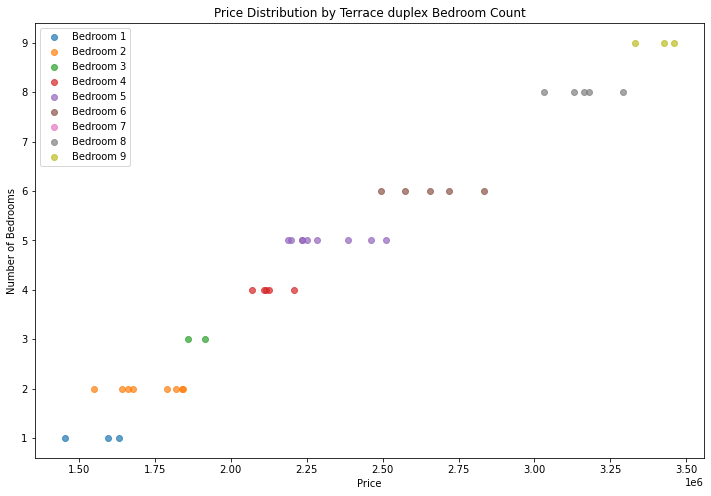



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  22.00000  25.00000      29.00000       33.00000
mean    5.00000   2.52000       3.31034  2289101.06827
std     2.74296   1.71075       1.62796   624427.05265
min     1.00000   1.00000       1.00000  1423369.49400
25%     2.25000   1.00000       2.00000  1751828.30300
50%     5.00000   2.00000       4.00000  2181269.45500
75%     7.00000   3.00000       4.00000  2800163.22400
max     9.00000   6.00000       6.00000  3345382.50100


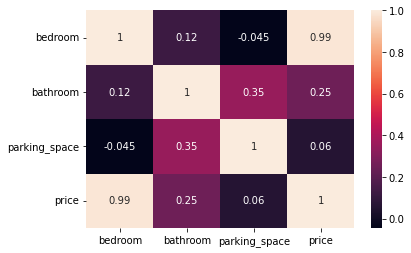

        loc                 title  bedroom  bathroom  parking_space      price
11182  Ogun  Semi-detached duplex     1.00       NaN           4.00 1617192.02
4426   Ogun  Semi-detached duplex     1.00      1.00           1.00 1528334.01
6635   Ogun  Semi-detached duplex     2.00      3.00           5.00 1726925.92
6799   Ogun  Semi-detached duplex     2.00      2.00            NaN 1646263.40
3528   Ogun  Semi-detached duplex     2.00       NaN           4.00 1743174.66
4131   Ogun  Semi-detached duplex     2.00      2.00           2.00 1657739.20
13678  Ogun  Semi-detached duplex     3.00      5.00            NaN 1989224.24
9355   Ogun  Semi-detached duplex     4.00      1.00           3.00 2083486.75
1403   Ogun  Semi-detached duplex     4.00       NaN           5.00 2191321.75
11828  Ogun  Semi-detached duplex     4.00      6.00           5.00 2336688.65
5732   Ogun  Semi-detached duplex     5.00      6.00           1.00 2446185.04
8432   Ogun  Semi-detached duplex     5.00      1.00

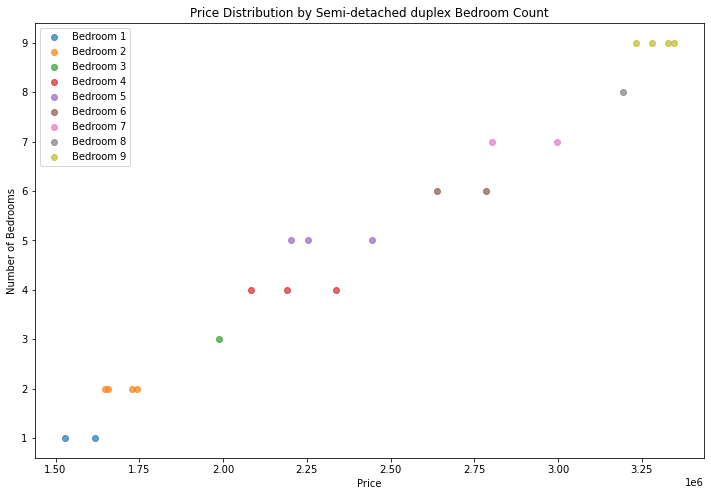



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  30.00000  27.00000      32.00000       35.00000
mean    4.23333   3.55556       3.46875  2494966.07700
std     2.81233   2.27585       1.36746   680399.92265
min     1.00000   1.00000       1.00000  1519943.06600
25%     2.00000   1.00000       2.00000  1942108.74200
50%     3.00000   3.00000       4.00000  2354890.10100
75%     6.75000   5.00000       4.00000  3203535.08500
max     9.00000   7.00000       6.00000  3656035.06100


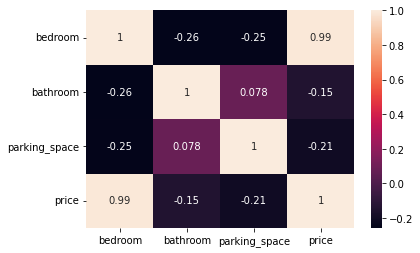

        loc      title  bedroom  bathroom  parking_space      price
11876  Ogun  Townhouse     1.00      5.00           5.00 1771086.87
11428  Ogun  Townhouse     1.00      2.00           4.00 1670029.38
10933  Ogun  Townhouse     1.00      6.00           4.00 1789141.02
10591  Ogun  Townhouse     1.00      5.00           4.00 1735301.43
7727   Ogun  Townhouse     1.00      1.00           4.00 1519943.07
11600  Ogun  Townhouse     2.00       NaN           2.00 1848115.93
10929  Ogun  Townhouse     2.00      7.00           3.00 2045420.14
3661   Ogun  Townhouse     2.00      5.00           5.00 2009311.84
4980   Ogun  Townhouse     2.00       NaN           1.00 1809854.01
5541   Ogun  Townhouse     2.00      7.00           3.00 2045420.14
6627   Ogun  Townhouse     2.00      1.00           4.00 1991650.42
114    Ogun  Townhouse     3.00       NaN           5.00 2362122.94
8889   Ogun  Townhouse     3.00      2.00           4.00 2153544.05
12604  Ogun  Townhouse     3.00      7.00       

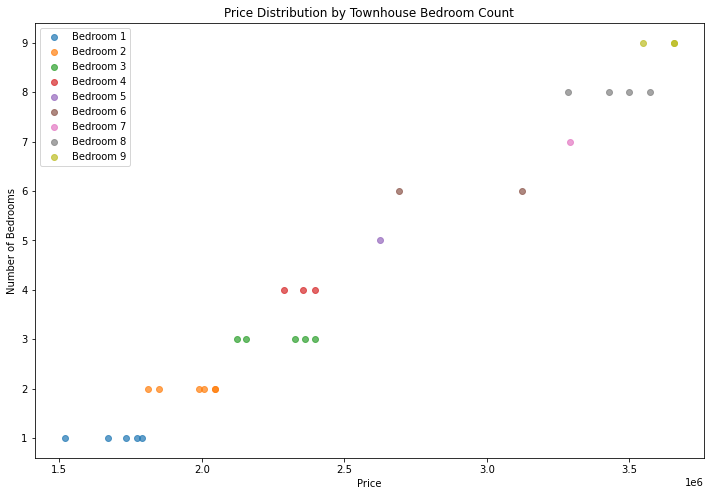



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  22.00000  24.00000      20.00000       27.00000
mean    4.00000   2.37500       3.10000  3189749.59126
std     2.11570   1.40844       1.51831   621135.80667
min     1.00000   1.00000       1.00000  2071543.21400
25%     2.25000   1.00000       2.00000  2748523.57250
50%     4.00000   2.00000       3.00000  3265924.40300
75%     5.00000   3.00000       4.00000  3510391.74250
max     8.00000   6.00000       6.00000  4258346.97600


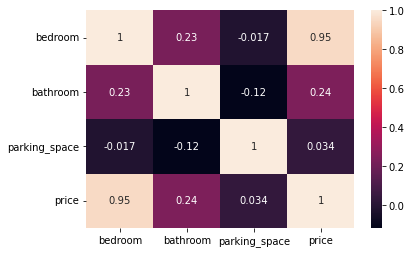

        loc      title  bedroom  bathroom  parking_space      price
13068  Ogun  Penthouse     1.00      2.00           5.00 2071543.21
1121   Ogun  Penthouse     1.00       NaN           3.00 2328458.41
11149  Ogun  Penthouse     1.00      2.00           2.00 2499952.07
3732   Ogun  Penthouse     2.00      4.00           1.00 2309660.03
13056  Ogun  Penthouse     2.00      2.00           1.00 2559709.05
8583   Ogun  Penthouse     2.00      1.00           6.00 2332290.99
12255  Ogun  Penthouse     3.00      1.00           3.00 2483852.90
3294   Ogun  Penthouse     3.00      6.00            NaN 2973373.45
6601   Ogun  Penthouse     3.00      2.00            NaN 2959174.76
6622   Ogun  Penthouse     3.00       NaN           2.00 2937338.10
1929   Ogun  Penthouse     4.00      1.00           3.00 3181753.15
2221   Ogun  Penthouse     4.00      1.00           4.00 3269685.41
10304  Ogun  Penthouse     5.00      2.00           3.00 3350422.57
8682   Ogun  Penthouse     5.00      1.00       

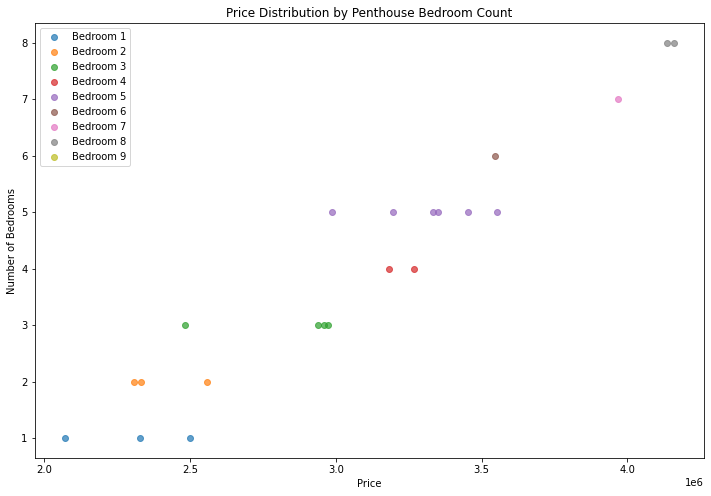



Analyzing Cottage data:
        bedroom bathroom parking_space          price
count  11.00000  9.00000       9.00000       12.00000
mean    2.90909  1.44444       2.55556  1614737.31492
std     1.57826  0.52705       1.13039   278051.62061
min     1.00000  1.00000       1.00000  1045696.79100
25%     1.50000  1.00000       2.00000  1471921.44400
50%     3.00000  1.00000       3.00000  1642209.85500
75%     4.00000  2.00000       3.00000  1715085.88775
max     5.00000  2.00000       4.00000  2150473.55600


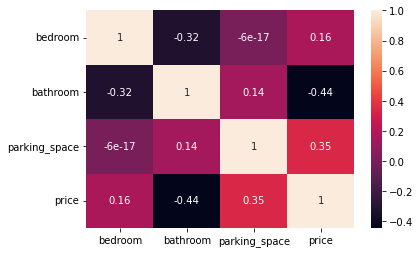

        loc    title  bedroom  bathroom  parking_space      price
4089   Ogun  Cottage     1.00      1.00            NaN 1470949.01
4997   Ogun  Cottage     1.00      2.00            NaN 1045696.79
13992  Ogun  Cottage     1.00      2.00           2.00 1508351.84
3562   Ogun  Cottage     2.00      1.00           4.00 1697474.73
12143  Ogun  Cottage     2.00       NaN           1.00 1640938.36
12400  Ogun  Cottage     3.00       NaN           3.00 1923660.66
9554   Ogun  Cottage     4.00      1.00           1.00 1373231.52
12730  Ogun  Cottage     4.00      2.00           4.00 1472245.59
13119  Ogun  Cottage     4.00      1.00           3.00 2150473.56
2533   Ogun  Cottage     5.00      2.00            NaN 1643481.35
7781   Ogun  Cottage     5.00       NaN           2.00 1704999.59
9642   Ogun  Cottage      NaN      1.00           3.00 1745344.79


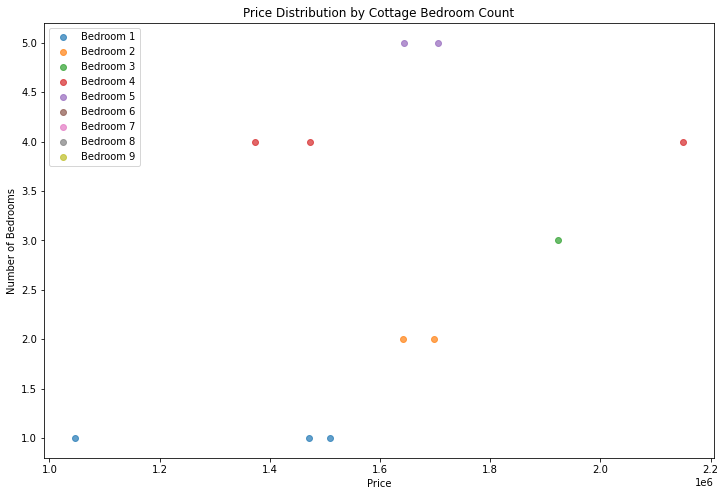

In [249]:
#Ogun
Ogun = housing_train[housing_train["loc" ] == "Ogun"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Ogun, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  22.00000  22.00000      22.00000       26.00000
mean    4.68182   3.13636       3.81818  4117042.73619
std     2.64371   2.14466       1.53177  1210503.99103
min     1.00000   1.00000       1.00000  1705654.87800
25%     2.00000   1.25000       3.00000  3486077.75525
50%     5.00000   2.00000       4.00000  4281071.24400
75%     6.75000   5.00000       5.00000  5042159.74400
max     9.00000   7.00000       6.00000  5779193.65300


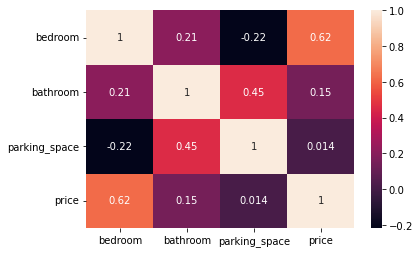

       loc    title  bedroom  bathroom  parking_space      price
6510   Edo  Mansion     1.00      2.00           4.00 4306706.37
5129   Edo  Mansion     1.00      1.00           3.00 4146773.17
11811  Edo  Mansion     1.00      2.00           3.00 4102684.73
5790   Edo  Mansion     2.00      2.00           4.00 1899890.18
1398   Edo  Mansion     2.00      6.00           5.00 3451214.04
1729   Edo  Mansion     2.00      5.00           6.00 3420029.60
4928   Edo  Mansion     2.00      1.00           2.00 1705654.88
8369   Edo  Mansion     3.00       NaN           6.00 3590668.89
7849   Edo  Mansion     4.00      6.00           5.00 4169269.36
7263   Edo  Mansion     5.00      3.00            NaN 4255436.11
6848   Edo  Mansion     5.00       NaN           4.00 2449838.04
35     Edo  Mansion     5.00      6.00            NaN 4596234.30
3656   Edo  Mansion     5.00      7.00           2.00 4441985.09
12968  Edo  Mansion     5.00      1.00           4.00 5779193.65
2272   Edo  Mansion     6

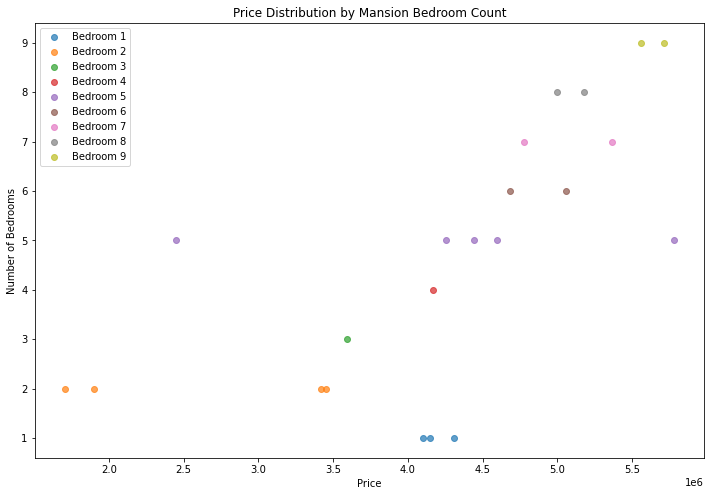



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  21.00000  25.00000      25.00000       29.00000
mean    4.80952   3.04000       3.44000  2461517.03107
std     2.40040   2.11108       1.60935   631164.78099
min     1.00000   1.00000       1.00000  1555728.50600
25%     3.00000   1.00000       3.00000  1880351.37800
50%     5.00000   2.00000       3.00000  2379818.19700
75%     6.00000   5.00000       4.00000  2943184.37000
max     9.00000   7.00000       6.00000  3817553.83200


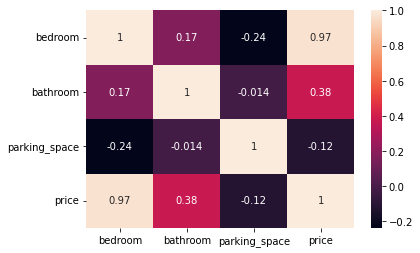

       loc            title  bedroom  bathroom  parking_space      price
1321   Edo  Detached duplex     1.00       NaN           3.00 1753355.58
3201   Edo  Detached duplex     1.00      1.00           5.00 1555728.51
1759   Edo  Detached duplex     2.00      1.00            NaN 1755139.44
12203  Edo  Detached duplex     2.00      5.00           4.00 1973526.40
5385   Edo  Detached duplex     2.00      1.00           6.00 1829738.92
8106   Edo  Detached duplex     3.00       NaN           4.00 2043565.66
6991   Edo  Detached duplex     4.00      7.00           3.00 2540478.10
4772   Edo  Detached duplex     4.00      6.00           3.00 2486638.51
9779   Edo  Detached duplex     5.00       NaN           2.00 2398565.50
430    Edo  Detached duplex     5.00      1.00           1.00 2354394.04
4009   Edo  Detached duplex     5.00      1.00           1.00 2399524.73
3655   Edo  Detached duplex     5.00      2.00            NaN 2276836.34
4355   Edo  Detached duplex     5.00       NaN     

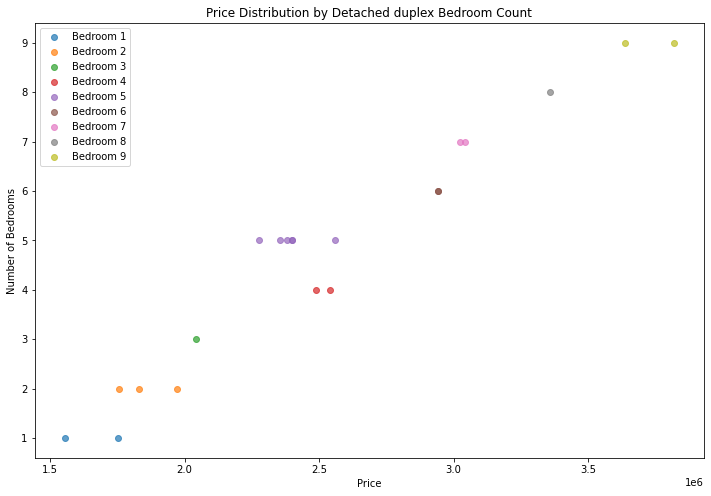



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  26.00000  34.00000      30.00000       36.00000
mean    4.30769   2.91176       3.50000  1663049.41290
std     2.37940   2.10868       1.67641   474411.78765
min     1.00000   1.00000       1.00000   978297.33230
25%     2.00000   1.00000       2.00000  1247740.12725
50%     5.00000   2.00000       3.00000  1683239.11700
75%     5.75000   4.00000       4.75000  1852603.32975
max     9.00000   7.00000       6.00000  2618125.90300


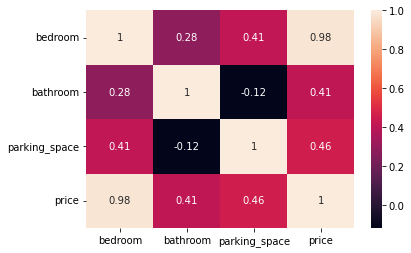

       loc      title  bedroom  bathroom  parking_space      price
5795   Edo  Apartment     1.00       NaN           6.00 1243678.60
4972   Edo  Apartment     1.00      2.00            NaN 1034083.49
2792   Edo  Apartment     1.00      7.00           2.00 1152588.39
13916  Edo  Apartment     1.00      2.00           2.00 1019530.37
1857   Edo  Apartment     1.00      1.00           4.00 1140971.58
12937  Edo  Apartment     2.00      2.00           4.00 1317472.68
7646   Edo  Apartment     2.00      2.00            NaN 1177694.56
6780   Edo  Apartment     2.00      2.00           1.00 1136463.47
4582   Edo  Apartment     3.00      2.00           2.00 1340217.33
10285  Edo  Apartment     4.00      4.00           5.00 1684156.29
5108   Edo  Apartment     4.00      1.00           4.00 1499428.41
2350   Edo  Apartment     5.00      1.00           3.00 1682321.94
10213  Edo  Apartment     5.00      2.00           3.00 1767993.78
9675   Edo  Apartment     5.00      4.00           2.00 181374

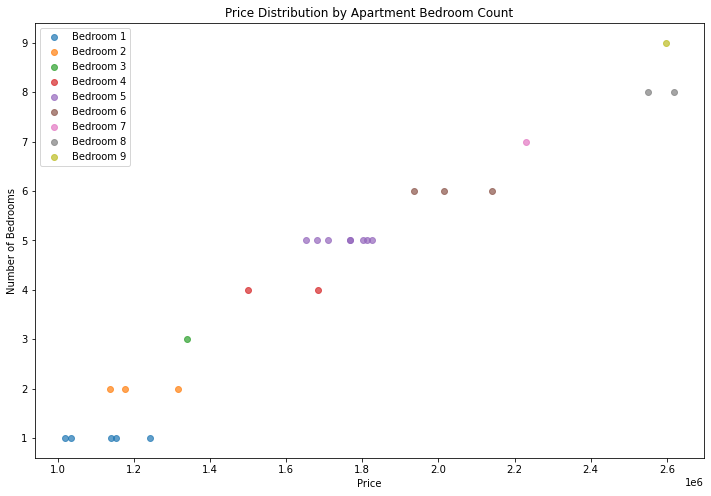



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  23.00000  23.00000      23.00000       26.00000
mean    4.17391   3.78261       3.95652  1908787.32196
std     2.05939   2.29538       1.66456   481280.40277
min     1.00000   1.00000       1.00000  1080503.59000
25%     3.00000   2.00000       3.00000  1538561.04775
50%     4.00000   3.00000       4.00000  1882432.32400
75%     5.00000   6.00000       5.00000  2304174.43700
max     8.00000   7.00000       6.00000  2714120.52900


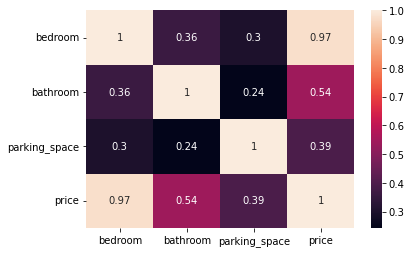

       loc     title  bedroom  bathroom  parking_space      price
3751   Edo  Bungalow     1.00      1.00           4.00 1136328.03
3827   Edo  Bungalow     1.00      2.00           1.00 1080503.59
4272   Edo  Bungalow     1.00       NaN           4.00 1215486.79
8071   Edo  Bungalow     2.00      2.00           4.00 1388266.21
6766   Edo  Bungalow     3.00      3.00           6.00 1654505.44
10899  Edo  Bungalow     3.00      2.00            NaN 1537272.05
5347   Edo  Bungalow     3.00      7.00           4.00 1759078.15
10218  Edo  Bungalow     3.00       NaN           3.00 1537272.05
7368   Edo  Bungalow     3.00      2.00           2.00 1511246.27
11921  Edo  Bungalow     4.00      6.00           5.00 1954061.91
1279   Edo  Bungalow     4.00      1.00           4.00 1732255.80
1313   Edo  Bungalow     4.00      7.00           6.00 2019243.75
1533   Edo  Bungalow     4.00      1.00           4.00 1636152.75
7493   Edo  Bungalow     4.00      1.00            NaN 1542428.05
9541   Edo

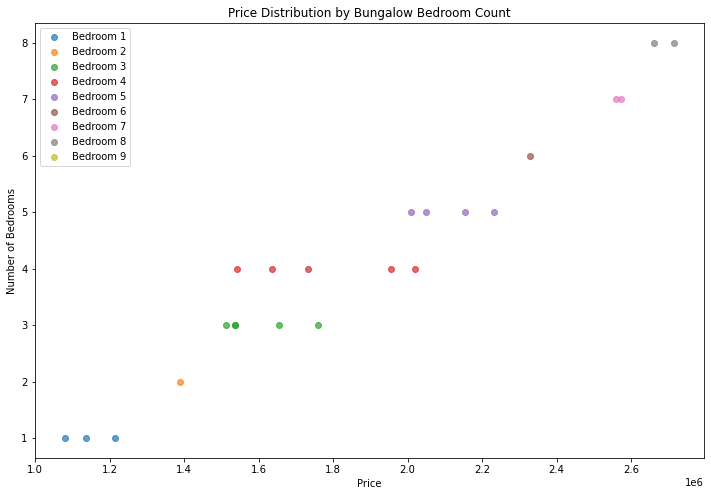



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  16.00000  19.00000      17.00000       20.00000
mean    5.50000   2.94737       3.82353  2087133.98235
std     2.33809   1.74718       1.66716   520897.97193
min     1.00000   1.00000       1.00000  1163564.94100
25%     4.75000   2.00000       2.00000  1822117.17000
50%     6.00000   2.00000       4.00000  2097279.25300
75%     7.00000   4.00000       5.00000  2520000.46900
max     9.00000   7.00000       6.00000  2844586.24600


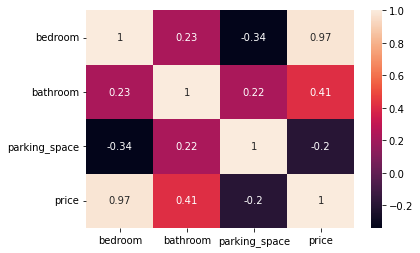

       loc title  bedroom  bathroom  parking_space      price
5962   Edo  Flat     1.00      4.00            NaN 1241877.07
9890   Edo  Flat     1.00      2.00           4.00 1163564.94
3010   Edo  Flat     3.00       NaN           2.00 1423173.69
2838   Edo  Flat     4.00      4.00           4.00 1849724.00
938    Edo  Flat     5.00      1.00           3.00 1803914.37
7737   Edo  Flat     5.00      1.00           4.00 1944098.84
9224   Edo  Flat     5.00      1.00           5.00 1970124.62
24     Edo  Flat     6.00      7.00           6.00 2446005.19
816    Edo  Flat     6.00      2.00           6.00 2250224.86
3127   Edo  Flat     6.00      4.00            NaN 2224433.89
6075   Edo  Flat     7.00      3.00           6.00 2506928.88
7359   Edo  Flat     7.00      5.00           5.00 2559215.24
13005  Edo  Flat     7.00      2.00           3.00 2389695.49
7310   Edo  Flat     8.00      4.00           1.00 2635808.40
9945   Edo  Flat     8.00      2.00           2.00 2583522.04
8818   E

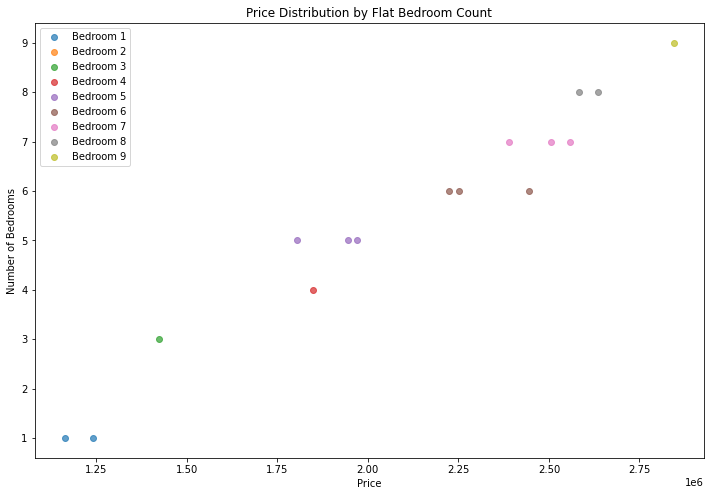



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  33.00000  32.00000      31.00000       36.00000
mean    4.21212   3.31250       3.22581  2006358.79075
std     2.60717   2.11656       1.56439   609047.79905
min     1.00000   1.00000       1.00000  1212467.19000
25%     2.00000   1.00000       2.00000  1524514.58950
50%     4.00000   2.00000       3.00000  1911367.73450
75%     6.00000   5.00000       4.00000  2507471.94400
max     9.00000   7.00000       6.00000  3296429.35700


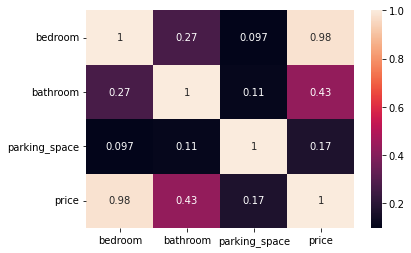

       loc           title  bedroom  bathroom  parking_space      price
13669  Edo  Terrace duplex     1.00      2.00            NaN 1212467.19
12512  Edo  Terrace duplex     1.00      4.00           1.00 1300568.34
11142  Edo  Terrace duplex     1.00      7.00           2.00 1461999.06
11096  Edo  Terrace duplex     1.00      1.00           2.00 1265462.80
8376   Edo  Terrace duplex     1.00      1.00            NaN 1269626.43
13626  Edo  Terrace duplex     1.00      2.00           5.00 1329583.18
3763   Edo  Terrace duplex     1.00      2.00           2.00 1362795.59
9842   Edo  Terrace duplex     2.00      2.00           6.00 1569212.47
6610   Edo  Terrace duplex     2.00      2.00           4.00 1544487.90
7164   Edo  Terrace duplex     2.00      1.00           2.00 1351080.10
691    Edo  Terrace duplex     2.00      6.00           3.00 1657577.78
6571   Edo  Terrace duplex     3.00      4.00            NaN 1874570.87
2446   Edo  Terrace duplex     3.00       NaN           4.00 159

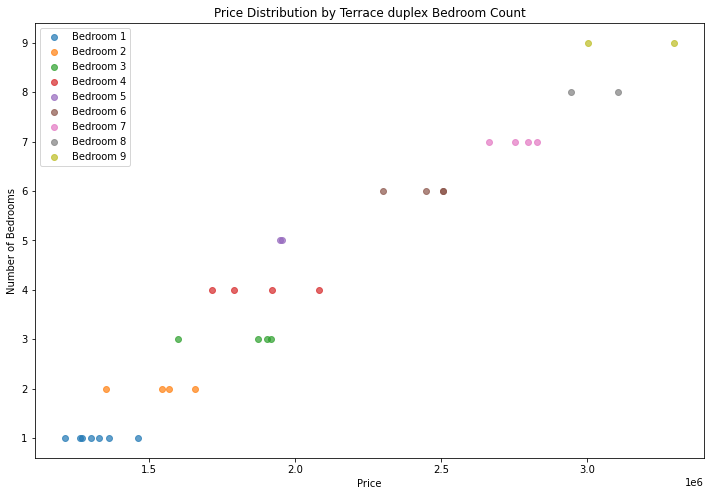



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  21.00000  22.00000      22.00000       25.00000
mean    3.42857   3.72727       3.22727  1928611.15880
std     2.22646   2.29247       1.47783   533048.77020
min     1.00000   1.00000       1.00000  1290889.27800
25%     2.00000   2.00000       2.00000  1549836.04500
50%     3.00000   3.50000       3.00000  1786733.88100
75%     4.00000   6.00000       4.75000  2140936.98300
max     9.00000   7.00000       6.00000  3164541.79400


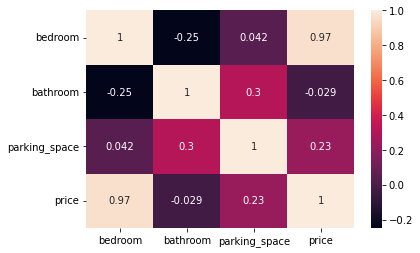

       loc                 title  bedroom  bathroom  parking_space      price
9068   Edo  Semi-detached duplex     1.00       NaN           2.00 1290889.28
7733   Edo  Semi-detached duplex     1.00      7.00           5.00 1549836.04
7550   Edo  Semi-detached duplex     1.00      6.00           3.00 1447227.48
12565  Edo  Semi-detached duplex     1.00      7.00            NaN 1549836.04
10777  Edo  Semi-detached duplex     2.00      3.00           3.00 1525426.06
7038   Edo  Semi-detached duplex     2.00      2.00           4.00 1596621.86
2185   Edo  Semi-detached duplex     2.00       NaN           3.00 1454509.00
12411  Edo  Semi-detached duplex     2.00      6.00           5.00 1716135.77
3789   Edo  Semi-detached duplex     2.00      1.00            NaN 1378766.92
1494   Edo  Semi-detached duplex     3.00      4.00           3.00 1786733.88
12249  Edo  Semi-detached duplex     3.00      2.00            NaN 1578239.27
11435  Edo  Semi-detached duplex     3.00      2.00           1.

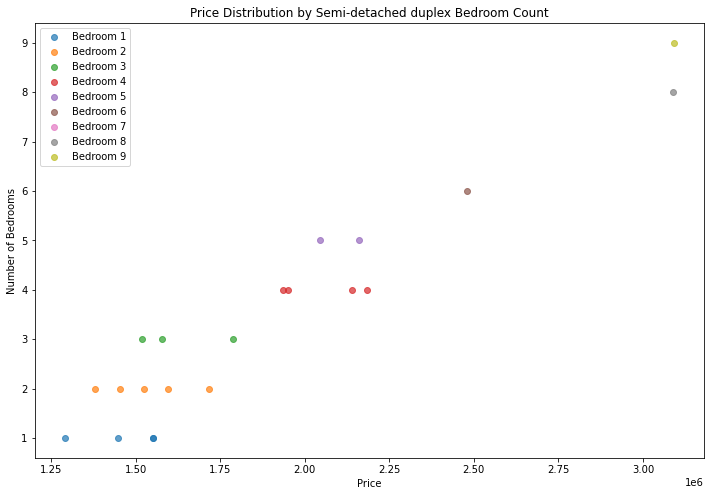



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  27.00000  24.00000      24.00000       28.00000
mean    3.51852   2.75000       3.50000  2012740.06554
std     2.45530   1.79976       1.88818   629076.59076
min     1.00000   1.00000       1.00000  1350193.83200
25%     1.50000   1.00000       2.00000  1517630.99725
50%     3.00000   2.00000       3.00000  1911426.73600
75%     5.00000   4.00000       5.25000  2231825.02650
max     9.00000   7.00000       6.00000  3381432.37800


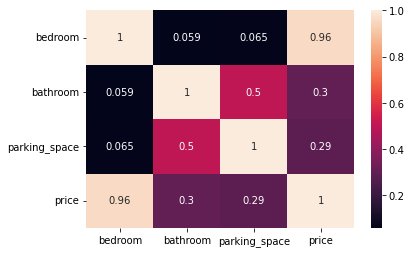

       loc      title  bedroom  bathroom  parking_space      price
11335  Edo  Townhouse     1.00      1.00           3.00 1396577.45
1906   Edo  Townhouse     1.00      5.00           2.00 1518814.23
11206  Edo  Townhouse     1.00      1.00           4.00 1350193.83
2815   Edo  Townhouse     1.00      6.00           6.00 1697888.18
3194   Edo  Townhouse     1.00      2.00           4.00 1571902.99
10824  Edo  Townhouse     1.00      2.00           3.00 1404511.20
10002  Edo  Townhouse     1.00       NaN           5.00 1420630.55
11227  Edo  Townhouse     2.00       NaN           2.00 1529265.28
11169  Edo  Townhouse     2.00      1.00            NaN 1514081.31
3371   Edo  Townhouse     2.00      2.00           2.00 1596266.62
8914   Edo  Townhouse     2.00      1.00           1.00 1509719.74
8913   Edo  Townhouse     2.00      2.00           1.00 1661604.28
3553   Edo  Townhouse     3.00      4.00           6.00 2055480.24
9569   Edo  Townhouse     3.00      1.00           6.00 190864

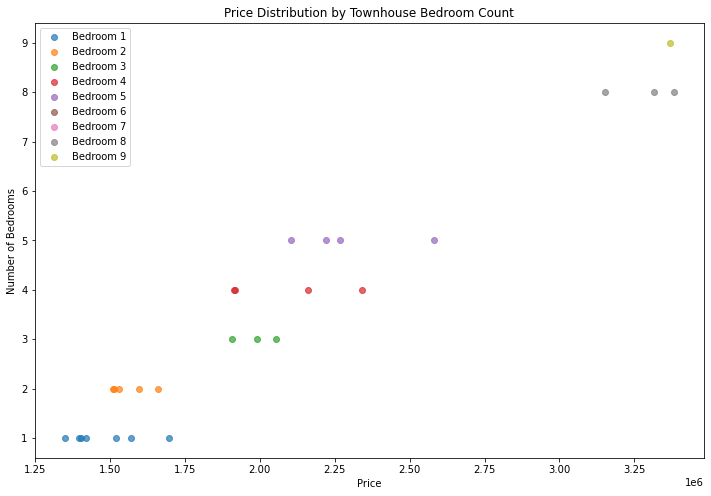



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  24.00000  27.00000      24.00000       29.00000
mean    5.20833   2.77778       2.91667  3058802.21748
std     2.81269   1.90815       1.63964   760366.89353
min     1.00000   1.00000       1.00000  1912113.82900
25%     2.75000   1.00000       1.75000  2270767.09500
50%     5.50000   2.00000       2.50000  3136965.16900
75%     8.00000   3.50000       4.00000  3722492.72100
max     9.00000   7.00000       6.00000  4146174.68200


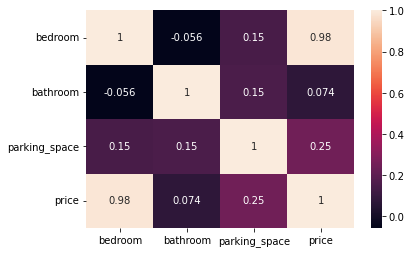

       loc      title  bedroom  bathroom  parking_space      price
10139  Edo  Penthouse     1.00      4.00           4.00 1974518.34
10266  Edo  Penthouse     2.00      2.00           4.00 2367909.10
7878   Edo  Penthouse     2.00      2.00            NaN 2146155.24
4154   Edo  Penthouse     2.00      1.00           1.00 2195786.49
4324   Edo  Penthouse     2.00      1.00            NaN 2179001.89
4923   Edo  Penthouse     2.00      3.00           4.00 2176989.38
1706   Edo  Penthouse     3.00      1.00           1.00 2230178.65
12597  Edo  Penthouse     3.00       NaN           1.00 2270767.10
4564   Edo  Penthouse     3.00      3.00           3.00 2407704.08
5682   Edo  Penthouse     3.00      5.00           5.00 2619545.06
5822   Edo  Penthouse     4.00      6.00           1.00 2791806.85
9409   Edo  Penthouse     5.00      7.00            NaN 3136965.17
11155  Edo  Penthouse     6.00      1.00            NaN 3082090.49
13912  Edo  Penthouse     6.00      2.00           2.00 314571

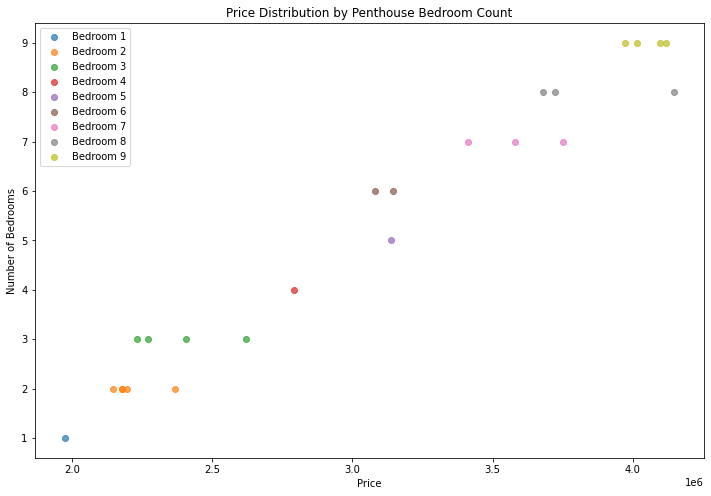



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  9.00000  9.00000       9.00000       10.00000
mean   3.33333  1.66667       2.33333  1543721.02840
std    1.41421  0.50000       1.22474   401065.60774
min    1.00000  1.00000       1.00000   897354.59100
25%    2.00000  1.00000       1.00000  1242180.37250
50%    4.00000  2.00000       2.00000  1589697.60250
75%    4.00000  2.00000       3.00000  1863442.10450
max    5.00000  2.00000       4.00000  2037728.73200


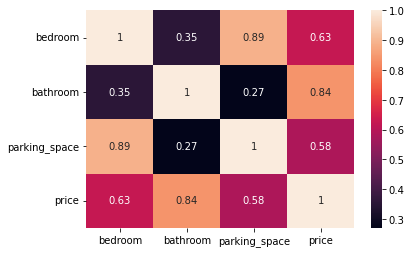

       loc    title  bedroom  bathroom  parking_space      price
8880   Edo  Cottage     1.00      2.00            NaN  897354.59
4556   Edo  Cottage     2.00      1.00           1.00 1344681.49
8208   Edo  Cottage     2.00      2.00           1.00 1440423.60
12300  Edo  Cottage     3.00      1.00           1.00 1089244.03
680    Edo  Cottage     4.00      2.00           2.00 1738971.60
4780   Edo  Cottage     4.00      1.00           3.00 1208013.33
6750   Edo  Cottage     4.00      2.00           2.00 1831257.60
769    Edo  Cottage     5.00       NaN           3.00 1975365.03
2550   Edo  Cottage     5.00      2.00           4.00 2037728.73
6142   Edo  Cottage      NaN      2.00           4.00 1874170.27


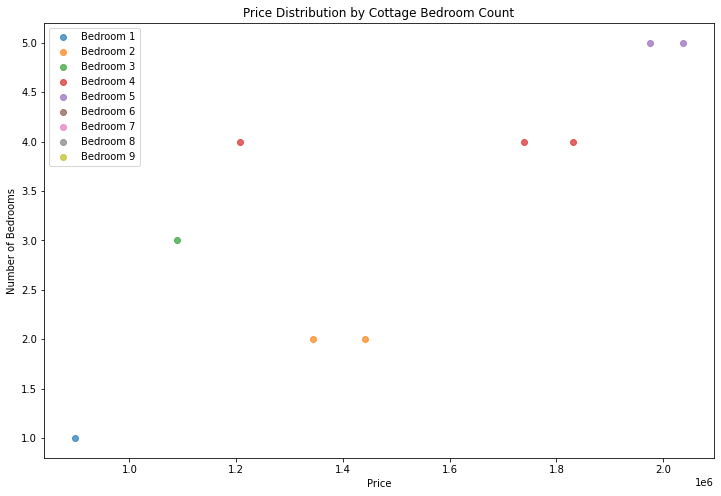

In [250]:
#Edo 
Edo = housing_train[housing_train["loc" ] == "Edo"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Edo, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  29.00000  23.00000      28.00000       31.00000
mean    4.58621   3.30435       3.39286  4240542.16816
std     2.86004   2.14126       1.68521  1194749.13811
min     1.00000   1.00000       1.00000  1746985.18000
25%     2.00000   1.00000       2.00000  3214262.17350
50%     4.00000   3.00000       3.50000  4255993.78200
75%     7.00000   5.00000       5.00000  5211420.74950
max     9.00000   7.00000       6.00000  6053077.06200


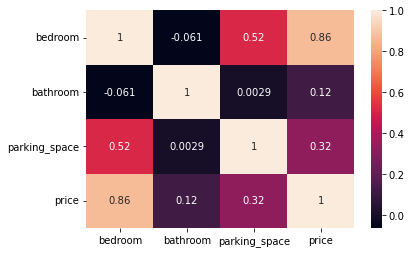

       loc    title  bedroom  bathroom  parking_space      price
3263   Oyo  Mansion     1.00       NaN           4.00 2853687.87
6436   Oyo  Mansion     1.00      5.00           6.00 3070305.96
8706   Oyo  Mansion     1.00      6.00           2.00 2916056.75
1546   Oyo  Mansion     1.00      7.00           2.00 3009052.41
12418  Oyo  Mansion     2.00      4.00           1.00 3017977.88
7426   Oyo  Mansion     2.00      1.00           1.00 3823234.31
2224   Oyo  Mansion     2.00      1.00           4.00 1746985.18
13418  Oyo  Mansion     2.00       NaN           5.00 3358218.39
12428  Oyo  Mansion     2.00      1.00           4.00 2924424.55
2913   Oyo  Mansion     3.00      4.00            NaN 3436419.68
6809   Oyo  Mansion     3.00       NaN           2.00 4852829.09
3898   Oyo  Mansion     3.00      6.00           3.00 3684222.21
9370   Oyo  Mansion     3.00      2.00           2.00 4512556.29
241    Oyo  Mansion     3.00      2.00           1.00 4357929.45
3312   Oyo  Mansion     4

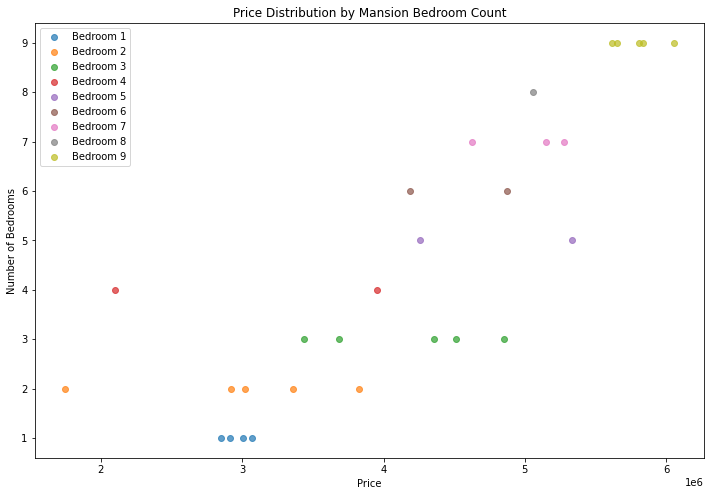



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  20.00000  18.00000      25.00000       27.00000
mean    4.45000   3.22222       3.20000  2397596.18733
std     2.28208   2.10198       1.63299   626705.94130
min     1.00000   1.00000       1.00000  1458129.31300
25%     3.00000   2.00000       2.00000  1885926.05200
50%     4.00000   2.00000       3.00000  2145804.86100
75%     6.25000   5.00000       4.00000  2983077.89000
max     8.00000   7.00000       6.00000  3571564.98000


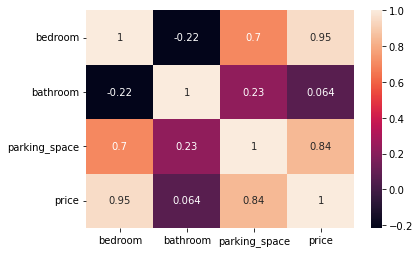

       loc            title  bedroom  bathroom  parking_space      price
8908   Oyo  Detached duplex     1.00       NaN           6.00 1591513.95
8561   Oyo  Detached duplex     1.00      7.00           2.00 1771409.73
1663   Oyo  Detached duplex     2.00      2.00           3.00 1672690.68
11069  Oyo  Detached duplex     2.00      1.00            NaN 1809802.70
10407  Oyo  Detached duplex     3.00       NaN           2.00 2020868.57
1895   Oyo  Detached duplex     3.00      1.00            NaN 1912174.24
11788  Oyo  Detached duplex     3.00      2.00           1.00 1859677.87
4908   Oyo  Detached duplex     3.00       NaN           4.00 2047099.67
6617   Oyo  Detached duplex     4.00       NaN           3.00 2128842.93
11193  Oyo  Detached duplex     4.00      2.00           2.00 2117038.33
13071  Oyo  Detached duplex     4.00       NaN           3.00 2145804.86
4721   Oyo  Detached duplex     5.00      4.00           5.00 2704185.25
554    Oyo  Detached duplex     5.00      2.00     

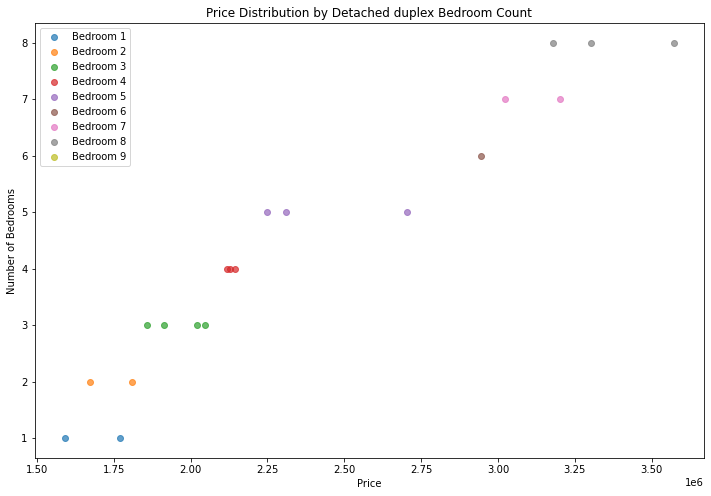



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  23.00000  18.00000      21.00000       26.00000
mean    4.60870   3.55556       3.33333  1712261.76392
std     2.06131   2.17532       1.79815   413155.10033
min     1.00000   1.00000       1.00000  1083859.81300
25%     3.50000   1.25000       2.00000  1388369.35075
50%     5.00000   3.50000       4.00000  1725901.36900
75%     6.00000   6.00000       5.00000  1956226.88725
max     9.00000   6.00000       6.00000  2746290.04500


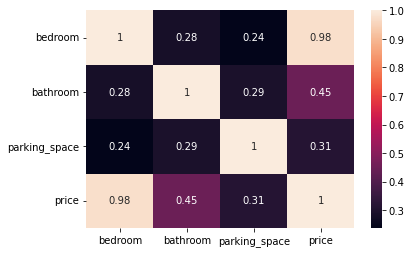

       loc      title  bedroom  bathroom  parking_space      price
11288  Oyo  Apartment     1.00      2.00           1.00 1115570.99
7979   Oyo  Apartment     1.00      3.00           5.00 1083859.81
12111  Oyo  Apartment     2.00      6.00           6.00 1391892.67
11794  Oyo  Apartment     2.00      5.00            NaN 1357631.11
12879  Oyo  Apartment     2.00      1.00           1.00 1100149.88
13686  Oyo  Apartment     3.00       NaN           5.00 1387194.91
601    Oyo  Apartment     4.00       NaN           1.00 1558804.53
5398   Oyo  Apartment     4.00      6.00            NaN 1661589.20
7789   Oyo  Apartment     4.00      6.00           4.00 1729906.86
6108   Oyo  Apartment     5.00      2.00           4.00 1676803.51
6330   Oyo  Apartment     5.00       NaN           2.00 1745221.23
6372   Oyo  Apartment     5.00      6.00           1.00 1859494.90
11995  Oyo  Apartment     5.00      6.00           6.00 1973357.67
5274   Oyo  Apartment     5.00      1.00           4.00 176304

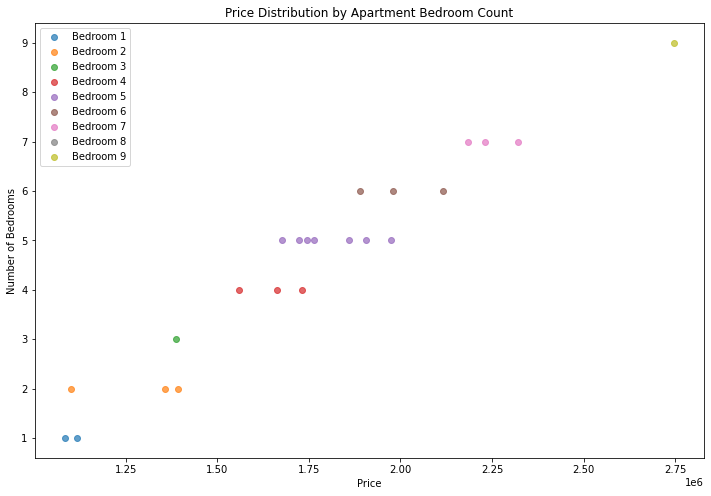



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  41.00000  37.00000      37.00000       45.00000
mean    5.02439   3.83784       3.67568  2018580.64871
std     2.57379   2.10177       1.84171   584282.72948
min     1.00000   1.00000       1.00000  1190161.61300
25%     3.00000   2.00000       2.00000  1464315.81400
50%     5.00000   3.00000       4.00000  1815370.04100
75%     7.00000   6.00000       5.00000  2520059.17100
max     9.00000   7.00000       6.00000  3105313.60600


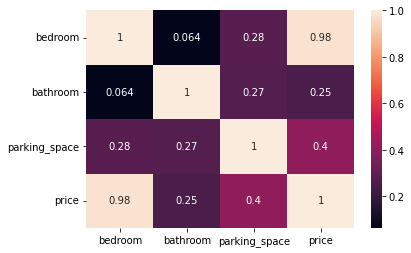

       loc     title  bedroom  bathroom  parking_space      price
4371   Oyo  Bungalow     1.00      6.00            NaN 1242111.88
12562  Oyo  Bungalow     1.00      7.00           5.00 1385371.04
6854   Oyo  Bungalow     2.00       NaN           4.00 1331705.31
268    Oyo  Bungalow     2.00       NaN           2.00 1365726.70
12332  Oyo  Bungalow     2.00       NaN           4.00 1438290.04
733    Oyo  Bungalow     2.00      1.00           2.00 1314706.31
11735  Oyo  Bungalow     2.00      2.00           1.00 1313077.72
9778   Oyo  Bungalow     2.00      4.00           5.00 1464315.81
2564   Oyo  Bungalow     2.00       NaN           1.00 1190161.61
9534   Oyo  Bungalow     2.00      6.00           1.00 1438524.85
10510  Oyo  Bungalow     3.00      3.00           4.00 1602453.89
10197  Oyo  Bungalow     3.00      4.00           3.00 1615584.18
4996   Oyo  Bungalow     3.00      3.00            NaN 1602453.89
5311   Oyo  Bungalow     3.00      1.00           3.00 1407520.24
12327  Oyo

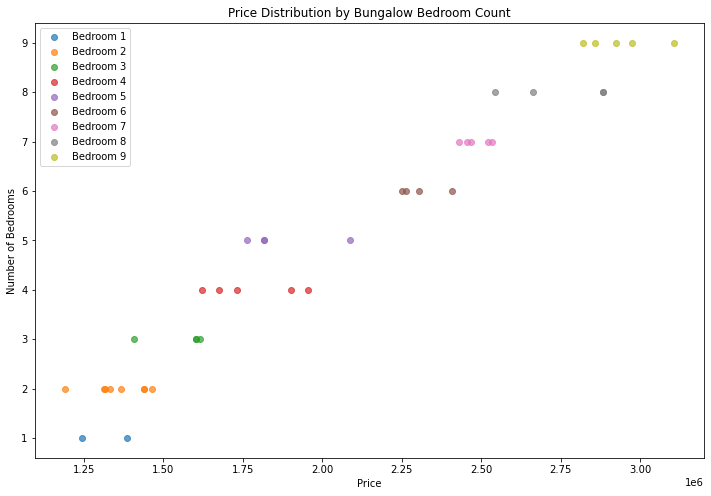



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  22.00000  26.00000      24.00000       27.00000
mean    3.86364   2.53846       2.95833  1687541.58685
std     2.43575   1.36325       1.75646   508008.09021
min     1.00000   1.00000       1.00000  1150941.14100
25%     2.00000   2.00000       1.00000  1320939.24600
50%     3.00000   2.00000       3.00000  1536522.75400
75%     5.00000   3.00000       4.00000  1804282.31600
max     9.00000   6.00000       6.00000  2948924.15100


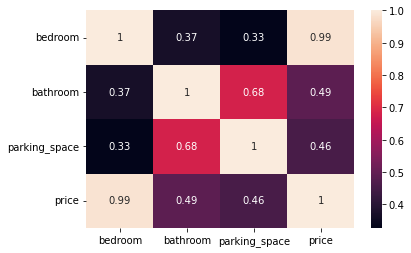

       loc title  bedroom  bathroom  parking_space      price
12263  Oyo  Flat     1.00      2.00           3.00 1158853.19
3210   Oyo  Flat     1.00      1.00           1.00 1150941.14
2124   Oyo  Flat     2.00      2.00           3.00 1367439.91
3667   Oyo  Flat     2.00      1.00           1.00 1282298.41
11439  Oyo  Flat     2.00      2.00           1.00 1297280.30
12287  Oyo  Flat     2.00      6.00           5.00 1542627.95
10318  Oyo  Flat     2.00      2.00           2.00 1369912.01
7484   Oyo  Flat     2.00      3.00           1.00 1321056.65
8562   Oyo  Flat     2.00      2.00            NaN 1292636.30
9965   Oyo  Flat     2.00      2.00           3.00 1333952.13
3290   Oyo  Flat     3.00      5.00           6.00 1732817.57
11297  Oyo  Flat     3.00       NaN           5.00 1589323.60
4369   Oyo  Flat     4.00      2.00            NaN 1536522.75
4549   Oyo  Flat     4.00      2.00           1.00 1654258.61
12118  Oyo  Flat     5.00      2.00            NaN 1824022.47
6745   O

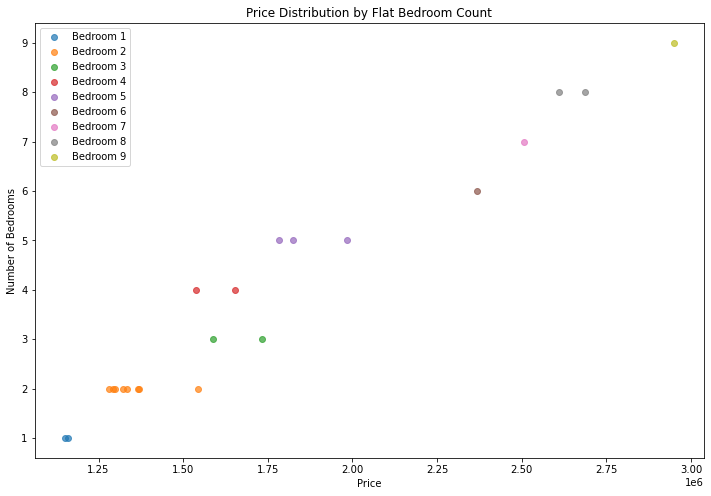



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  23.00000  23.00000      21.00000       27.00000
mean    4.65217   3.30435       3.42857  2099966.97189
std     2.22810   2.00986       1.96396   514506.34528
min     1.00000   1.00000       1.00000  1332838.16300
25%     3.00000   2.00000       2.00000  1720790.09950
50%     5.00000   3.00000       4.00000  1968771.51700
75%     7.00000   4.50000       5.00000  2562887.01900
max     9.00000   7.00000       6.00000  3194084.94900


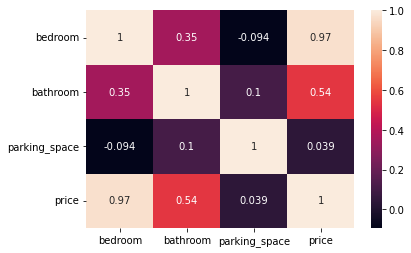

       loc           title  bedroom  bathroom  parking_space      price
8466   Oyo  Terrace duplex     1.00       NaN           3.00 1332838.16
13136  Oyo  Terrace duplex     2.00      2.00           6.00 1569212.47
11657  Oyo  Terrace duplex     2.00      2.00            NaN 1566171.26
3417   Oyo  Terrace duplex     2.00      3.00           1.00 1466868.06
6281   Oyo  Terrace duplex     2.00      1.00           6.00 1525161.90
13868  Oyo  Terrace duplex     3.00      3.00           2.00 1713404.31
9976   Oyo  Terrace duplex     3.00       NaN           4.00 1904114.02
13899  Oyo  Terrace duplex     3.00      4.00           1.00 1728175.89
13457  Oyo  Terrace duplex     4.00      2.00           4.00 1853513.98
11061  Oyo  Terrace duplex     4.00      7.00           5.00 2199494.98
13938  Oyo  Terrace duplex     4.00      7.00           6.00 2228773.97
4034   Oyo  Terrace duplex     5.00      1.00            NaN 1839014.36
11782  Oyo  Terrace duplex     5.00      2.00            NaN 199

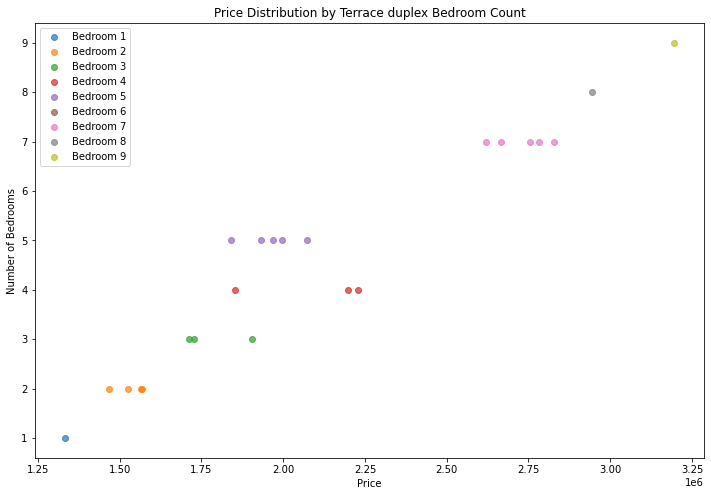



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  33.00000  33.00000      31.00000       38.00000
mean    4.66667   3.60606       3.67742  2111387.04389
std     2.24537   2.22120       1.53595   519226.93503
min     1.00000   1.00000       1.00000  1461734.89700
25%     3.00000   2.00000       3.00000  1722449.29075
50%     5.00000   3.00000       4.00000  1911087.39000
75%     7.00000   6.00000       5.00000  2605568.86650
max     9.00000   7.00000       6.00000  3208592.36800


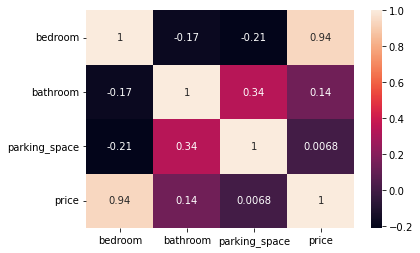

       loc                 title  bedroom  bathroom  parking_space      price
13846  Oyo  Semi-detached duplex     1.00      6.00           5.00 1505785.47
8719   Oyo  Semi-detached duplex     1.00      5.00            NaN 1461734.90
4022   Oyo  Semi-detached duplex     1.00      5.00           6.00 1491013.89
4939   Oyo  Semi-detached duplex     2.00      6.00           4.00 1686856.78
160    Oyo  Semi-detached duplex     2.00       NaN           3.00 1548948.97
363    Oyo  Semi-detached duplex     2.00      7.00           4.00 1730907.35
1809   Oyo  Semi-detached duplex     3.00      3.00           6.00 1830520.30
9836   Oyo  Semi-detached duplex     3.00      1.00            NaN 1600945.14
11981  Oyo  Semi-detached duplex     3.00      5.00            NaN 1801505.46
9082   Oyo  Semi-detached duplex     3.00      3.00           1.00 1684125.31
4005   Oyo  Semi-detached duplex     3.00      4.00           6.00 1874570.87
7194   Oyo  Semi-detached duplex     4.00      2.00           3.

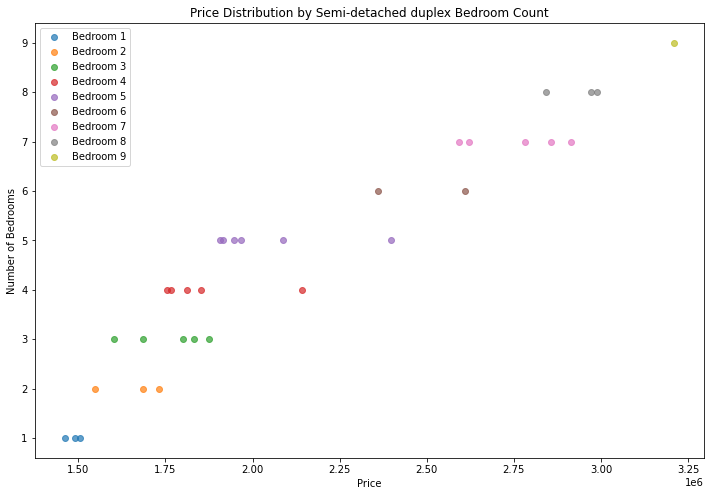



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  35.00000  33.00000      39.00000       43.00000
mean    4.02857   2.69697       3.38462  2118824.99405
std     2.33245   1.91188       1.59960   581982.44099
min     1.00000   1.00000       1.00000  1331875.34300
25%     2.50000   1.00000       2.00000  1731270.29200
50%     4.00000   2.00000       4.00000  1937430.96900
75%     5.50000   4.00000       4.00000  2579459.08100
max     9.00000   7.00000       6.00000  3413964.59600


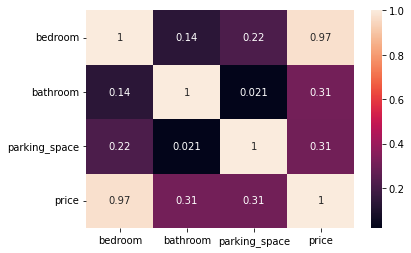

       loc      title  bedroom  bathroom  parking_space      price
3576   Oyo  Townhouse     1.00      1.00           6.00 1453162.77
6438   Oyo  Townhouse     1.00      6.00           2.00 1567759.31
12441  Oyo  Townhouse     1.00       NaN           3.00 1355566.12
1354   Oyo  Townhouse     1.00      3.00           4.00 1485988.50
11513  Oyo  Townhouse     1.00       NaN            NaN 1382345.99
6104   Oyo  Townhouse     1.00      1.00           4.00 1470004.45
4876   Oyo  Townhouse     1.00      2.00           1.00 1331875.34
6686   Oyo  Townhouse     1.00       NaN           4.00 1583878.66
4466   Oyo  Townhouse     2.00       NaN            NaN 1759221.22
13474  Oyo  Townhouse     3.00      2.00           2.00 1716556.68
3808   Oyo  Townhouse     3.00      1.00           1.00 1745983.90
234    Oyo  Townhouse     3.00      2.00           1.00 1831111.99
10655  Oyo  Townhouse     3.00      5.00           1.00 1941764.23
821    Oyo  Townhouse     3.00       NaN           3.00 177143

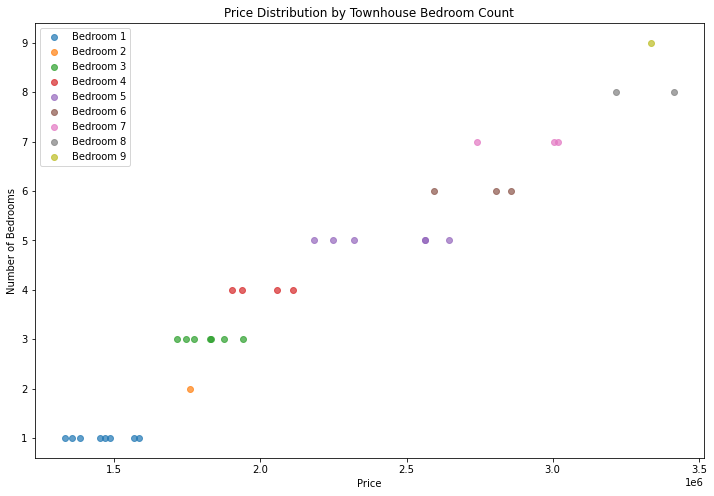



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  19.00000  17.00000      18.00000       20.00000
mean    5.05263   2.82353       3.33333  2983421.42470
std     2.34458   1.66716       1.68034   647281.22805
min     1.00000   1.00000       1.00000  1942188.62900
25%     4.00000   2.00000       2.00000  2593315.09700
50%     5.00000   2.00000       3.00000  2829069.41800
75%     6.50000   4.00000       4.00000  3445466.66375
max     9.00000   6.00000       6.00000  4416814.33200


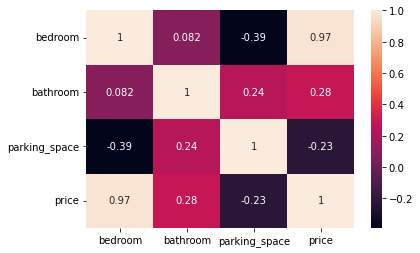

       loc      title  bedroom  bathroom  parking_space      price
5058   Oyo  Penthouse     1.00      4.00           6.00 2059102.11
2925   Oyo  Penthouse     1.00      1.00           4.00 1942188.63
9123   Oyo  Penthouse     2.00      5.00            NaN 2346538.48
327    Oyo  Penthouse     3.00      3.00           6.00 2534579.73
2471   Oyo  Penthouse     4.00      2.00           3.00 2752222.77
8271   Oyo  Penthouse     4.00      2.00           2.00 2612893.55
1212   Oyo  Penthouse     4.00      1.00           5.00 2642831.35
1982   Oyo  Penthouse     5.00      2.00           1.00 2818822.14
2158   Oyo  Penthouse     5.00      2.00           1.00 2882365.03
4527   Oyo  Penthouse     5.00       NaN           2.00 2704725.27
7940   Oyo  Penthouse     5.00      2.00            NaN 2839316.70
11614  Oyo  Penthouse     5.00      6.00           4.00 3200212.21
892    Oyo  Penthouse     6.00      1.00           3.00 3124382.37
7123   Oyo  Penthouse     6.00      6.00           3.00 344252

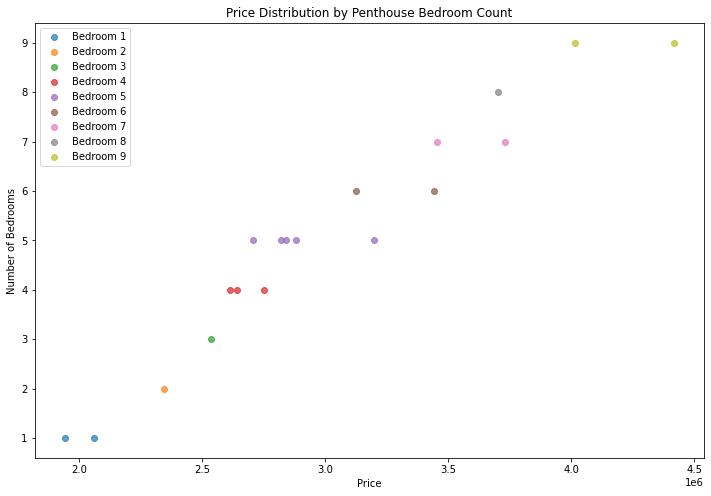



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  14.00000  13.00000      13.00000       17.00000
mean    2.42857   1.30769       2.23077  1392901.63080
std     1.50457   0.48038       1.16575   270750.05053
min     1.00000   1.00000       1.00000   973124.39460
25%     1.00000   1.00000       1.00000  1188264.86300
50%     2.00000   1.00000       2.00000  1336531.53300
75%     3.75000   2.00000       3.00000  1463764.64300
max     5.00000   2.00000       4.00000  2004274.04700


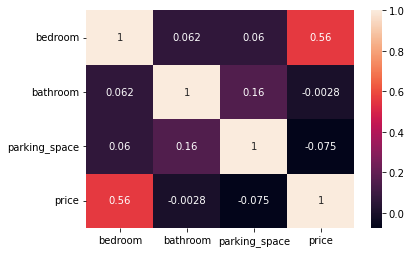

       loc    title  bedroom  bathroom  parking_space      price
125    Oyo  Cottage     1.00       NaN           2.00 1176048.26
617    Oyo  Cottage     1.00      1.00           4.00 1336531.53
3292   Oyo  Cottage     1.00       NaN            NaN 1260013.65
9631   Oyo  Cottage     1.00       NaN           1.00 1183238.48
11475  Oyo  Cottage     1.00      1.00           2.00 1188264.86
385    Oyo  Cottage     2.00      1.00            NaN  973124.39
1919   Oyo  Cottage     2.00      2.00           2.00 1439811.49
3520   Oyo  Cottage     2.00       NaN           3.00 1488296.06
13459  Oyo  Cottage     2.00      1.00            NaN 1463764.64
7752   Oyo  Cottage     3.00      1.00           1.00 1130947.03
2907   Oyo  Cottage     4.00      1.00           4.00 1284003.94
4801   Oyo  Cottage     4.00      2.00           4.00 1334506.86
6156   Oyo  Cottage     5.00      1.00           2.00 2004274.05
13015  Oyo  Cottage     5.00      1.00            NaN 1929525.33
2760   Oyo  Cottage      

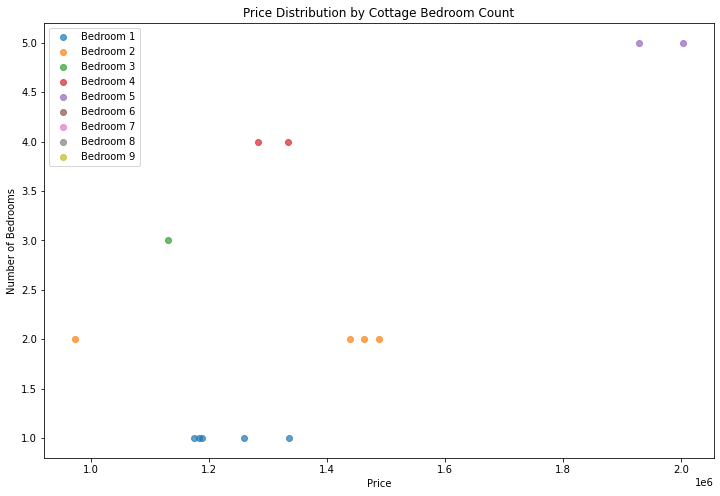

In [251]:
#Oyo
Oyo = housing_train[housing_train["loc" ] == "Oyo"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Oyo, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  25.00000  21.00000      23.00000       27.00000
mean    3.88000   2.95238       3.00000  3864718.30400
std     2.36854   2.20173       1.83402  1081219.94501
min     1.00000   1.00000       1.00000  1540703.69200
25%     2.00000   1.00000       1.00000  3114148.17100
50%     3.00000   2.00000       3.00000  3913726.73300
75%     5.00000   5.00000       4.50000  4577163.04100
max     9.00000   7.00000       6.00000  5646673.80300


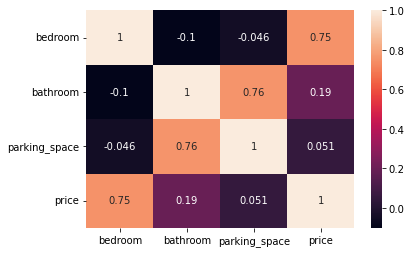

        loc    title  bedroom  bathroom  parking_space      price
845    Ondo  Mansion     1.00      4.00            NaN 2977310.30
12924  Ondo  Mansion     1.00      7.00           4.00 3132674.84
1573   Ondo  Mansion     1.00      2.00           4.00 1622198.89
11816  Ondo  Mansion     1.00       NaN           1.00 1540703.69
11263  Ondo  Mansion     1.00      1.00            NaN 3913726.73
3636   Ondo  Mansion     1.00      5.00           5.00 3008494.74
13501  Ondo  Mansion     2.00      1.00           4.00 2924424.55
12634  Ondo  Mansion     3.00      1.00           1.00 4221597.09
8412   Ondo  Mansion     3.00      2.00           1.00 3188617.16
7899   Ondo  Mansion     3.00       NaN           3.00 3777217.87
13806  Ondo  Mansion     3.00      6.00           6.00 3869655.85
4191   Ondo  Mansion     3.00       NaN           5.00 3342866.36
1359   Ondo  Mansion     3.00      1.00           1.00 3095621.50
6660   Ondo  Mansion     4.00      2.00           1.00 5131241.21
4768   Ond

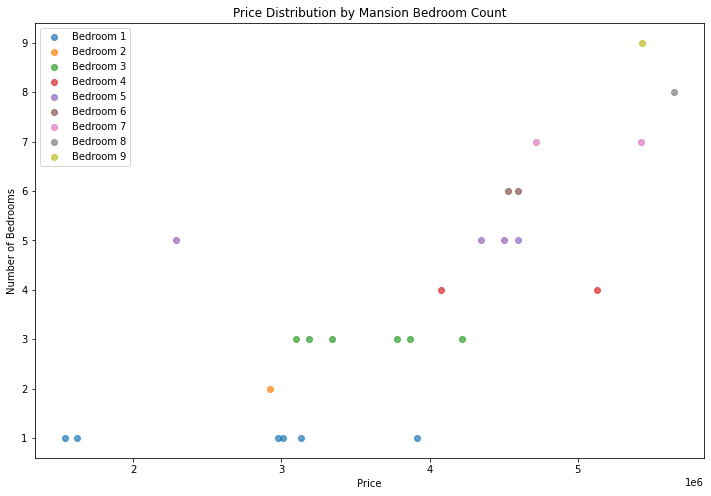



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  29.00000  28.00000      32.00000       36.00000
mean    4.20690   3.42857       3.31250  2338308.69742
std     2.33574   2.20149       1.57475   637645.18572
min     1.00000   1.00000       1.00000  1422861.11300
25%     2.00000   2.00000       2.00000  1762140.50675
50%     4.00000   2.00000       3.00000  2271781.91700
75%     5.00000   6.00000       4.00000  2538395.09250
max     9.00000   7.00000       6.00000  3692143.36200


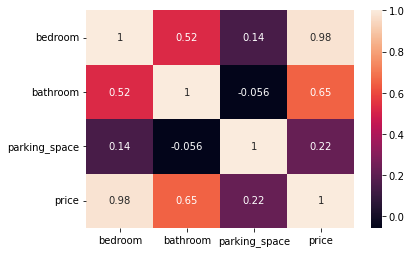

        loc            title  bedroom  bathroom  parking_space      price
4442   Ondo  Detached duplex     1.00      1.00           2.00 1422861.11
1411   Ondo  Detached duplex     1.00       NaN           4.00 1735301.43
13206  Ondo  Detached duplex     1.00      1.00           4.00 1528334.33
4800   Ondo  Detached duplex     1.00      2.00           3.00 1600342.81
6251   Ondo  Detached duplex     2.00       NaN           1.00 1720946.08
1473   Ondo  Detached duplex     2.00      2.00           1.00 1704651.31
10156  Ondo  Detached duplex     2.00       NaN           5.00 2063151.43
9898   Ondo  Detached duplex     2.00      2.00           6.00 1883578.51
5098   Ondo  Detached duplex     3.00      2.00           4.00 2094160.30
13414  Ondo  Detached duplex     3.00      7.00           2.00 2254766.62
1680   Ondo  Detached duplex     3.00      7.00           5.00 2362122.94
1615   Ondo  Detached duplex     3.00       NaN           1.00 1881345.67
12061  Ondo  Detached duplex     4.00 

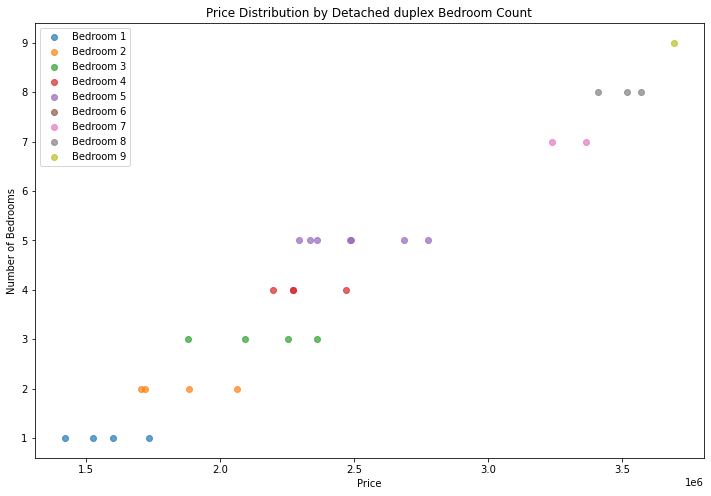



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  24.00000  25.00000      30.00000       32.00000
mean    3.41667   2.12000       2.90000  1475133.81036
std     2.32036   1.71561       1.34805   439297.18242
min     1.00000   1.00000       1.00000   958508.04500
25%     1.00000   1.00000       2.00000  1074021.14575
50%     3.50000   2.00000       3.00000  1456570.35200
75%     5.00000   2.00000       4.00000  1690617.82300
max     9.00000   7.00000       6.00000  2723312.03500


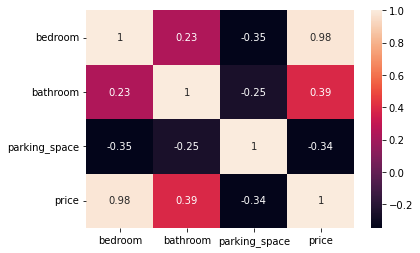

        loc      title  bedroom  bathroom  parking_space      price
10828  Ondo  Apartment     1.00       NaN           3.00 1030639.93
7287   Ondo  Apartment     1.00      1.00           1.00  960982.08
8207   Ondo  Apartment     1.00      1.00           4.00 1038736.08
9506   Ondo  Apartment     1.00      2.00           5.00 1049598.26
9637   Ondo  Apartment     1.00      1.00           3.00 1076880.33
12013  Ondo  Apartment     1.00      7.00           2.00 1152588.39
10461  Ondo  Apartment     1.00       NaN           1.00  958508.05
11408  Ondo  Apartment     1.00      1.00           4.00 1065443.58
11715  Ondo  Apartment     2.00      3.00           2.00 1198017.79
11275  Ondo  Apartment     2.00      5.00           5.00 1334858.56
12084  Ondo  Apartment     3.00      1.00           2.00 1318877.25
10972  Ondo  Apartment     3.00       NaN           4.00 1363904.39
12808  Ondo  Apartment     4.00      2.00           4.00 1625435.28
11526  Ondo  Apartment     4.00      2.00       

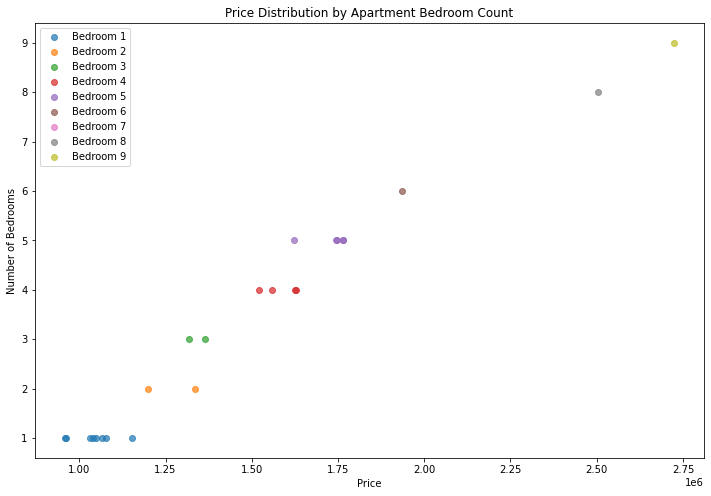



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      30.00000       33.00000
mean    5.51852   3.03846       3.26667  2094814.37485
std     2.80618   2.06844       1.48401   620411.47988
min     1.00000   1.00000       1.00000  1029011.15500
25%     3.00000   1.00000       2.00000  1576193.30600
50%     6.00000   2.00000       3.00000  1918073.06700
75%     8.00000   4.00000       4.00000  2583522.04100
max     9.00000   7.00000       6.00000  3053262.05700


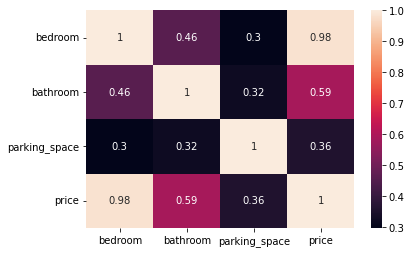

        loc     title  bedroom  bathroom  parking_space      price
4752   Ondo  Bungalow     1.00      1.00           1.00 1029011.16
12529  Ondo  Bungalow     1.00       NaN           4.00 1359345.27
8337   Ondo  Bungalow     1.00      2.00           3.00 1208136.39
925    Ondo  Bungalow     2.00      3.00            NaN 1347082.42
4220   Ondo  Bungalow     2.00       NaN           6.00 1451185.52
4345   Ondo  Bungalow     2.00       NaN           4.00 1297393.41
2282   Ondo  Bungalow     3.00       NaN           2.00 1395465.14
3209   Ondo  Bungalow     3.00       NaN           6.00 1576193.31
5770   Ondo  Bungalow     4.00      1.00           3.00 1551751.25
5487   Ondo  Bungalow     5.00      2.00            NaN 1732334.04
13660  Ondo  Bungalow     5.00      1.00           2.00 1806848.07
4739   Ondo  Bungalow     5.00      2.00           4.00 1773221.57
613    Ondo  Bungalow     5.00      1.00            NaN 1918073.07
5501   Ondo  Bungalow     6.00      4.00           3.00 225045

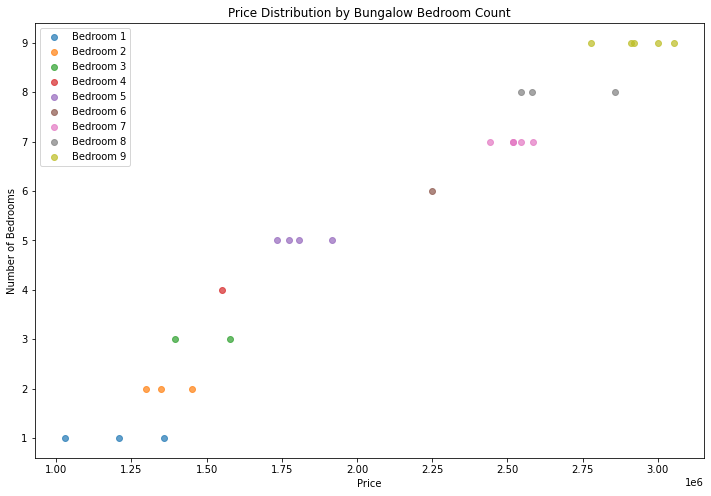



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  30.00000  30.00000      30.00000       37.00000
mean    4.63333   3.36667       3.40000  1917930.75916
std     2.85854   2.15732       1.67332   641836.15954
min     1.00000   1.00000       1.00000  1072357.32700
25%     2.00000   1.00000       2.00000  1372864.81300
50%     4.50000   3.00000       3.00000  1818612.87200
75%     7.50000   5.00000       4.75000  2376800.00700
max     9.00000   7.00000       6.00000  3079287.83200


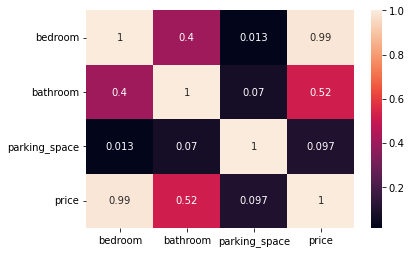

        loc title  bedroom  bathroom  parking_space      price
11904  Ondo  Flat     1.00       NaN           3.00 1137539.17
11233  Ondo  Flat     1.00      4.00           5.00 1267902.85
11088  Ondo  Flat     1.00      4.00            NaN 1293928.62
10743  Ondo  Flat     1.00       NaN           4.00 1359345.27
7474   Ondo  Flat     2.00      4.00           2.00 1386238.49
11917  Ondo  Flat     2.00      4.00            NaN 1490341.59
2100   Ondo  Flat     2.00       NaN           6.00 1372873.39
3286   Ondo  Flat     2.00      1.00           1.00 1242744.52
5332   Ondo  Flat     2.00      2.00           3.00 1333952.13
5239   Ondo  Flat     2.00      2.00            NaN 1372864.81
12891  Ondo  Flat     3.00       NaN           1.00 1418529.24
12896  Ondo  Flat     3.00      1.00           2.00 1400810.49
1743   Ondo  Flat     3.00      4.00           6.00 1693661.50
9983   Ondo  Flat     4.00      6.00           4.00 1928036.13
8795   Ondo  Flat     4.00       NaN           2.00 191

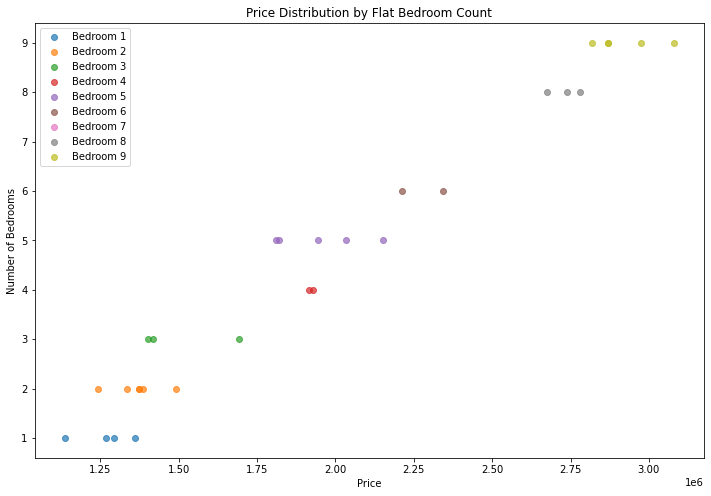



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  24.00000  27.00000      22.00000       29.00000
mean    4.12500   3.81481       3.04545  2064466.70714
std     2.62616   2.43432       1.78558   592226.21171
min     1.00000   1.00000       1.00000  1344618.91200
25%     2.00000   2.00000       1.25000  1549836.04500
50%     3.50000   3.00000       2.50000  1936552.76200
75%     6.00000   6.00000       4.75000  2551258.35900
max     9.00000   7.00000       6.00000  3194084.94900


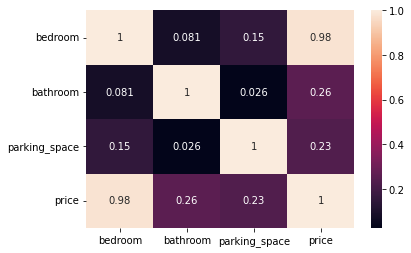

        loc           title  bedroom  bathroom  parking_space      price
5924   Ondo  Terrace duplex     1.00      5.00            NaN 1344618.91
12450  Ondo  Terrace duplex     1.00      7.00            NaN 1549836.04
12194  Ondo  Terrace duplex     1.00      5.00           3.00 1403176.91
4086   Ondo  Terrace duplex     1.00      6.00           1.00 1388669.49
13891  Ondo  Terrace duplex     1.00      2.00           4.00 1430947.05
132    Ondo  Terrace duplex     2.00       NaN           2.00 1532432.29
7307   Ondo  Terrace duplex     2.00      1.00           4.00 1391383.94
2698   Ondo  Terrace duplex     2.00      1.00           1.00 1354321.00
842    Ondo  Terrace duplex     3.00      2.00            NaN 1640074.74
9217   Ondo  Terrace duplex     3.00      1.00           1.00 1572529.11
13840  Ondo  Terrace duplex     3.00      2.00           4.00 1679631.12
8365   Ondo  Terrace duplex     3.00      6.00           1.00 1816277.04
3704   Ondo  Terrace duplex     4.00      7.00     

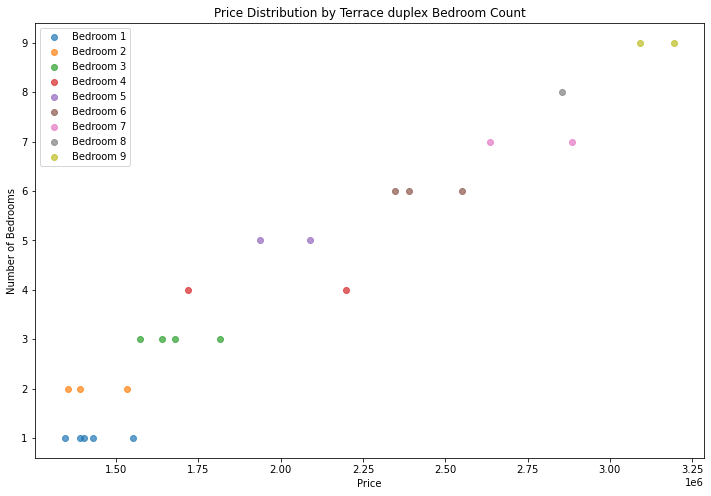



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  26.00000  22.00000      22.00000       29.00000
mean    4.00000   3.13636       3.50000  2015610.00383
std     2.52982   1.98315       1.65472   604489.50801
min     1.00000   1.00000       1.00000  1155305.17800
25%     2.00000   2.00000       2.00000  1525161.90000
50%     3.00000   2.50000       3.50000  1830520.29700
75%     6.75000   4.00000       5.00000  2621577.09100
max     8.00000   7.00000       6.00000  3031569.04600


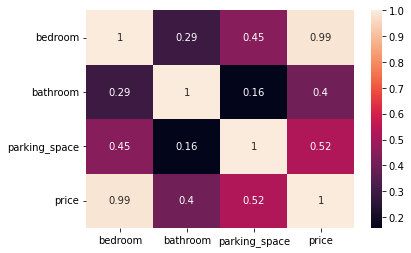

        loc                 title  bedroom  bathroom  parking_space      price
1392   Ondo  Semi-detached duplex     1.00      7.00            NaN 1432720.06
9185   Ondo  Semi-detached duplex     1.00      1.00           1.00 1155305.18
5650   Ondo  Semi-detached duplex     1.00      2.00           3.00 1349641.19
237    Ondo  Semi-detached duplex     2.00       NaN           2.00 1584248.21
11027  Ondo  Semi-detached duplex     2.00       NaN           6.00 1525161.90
8313   Ondo  Semi-detached duplex     2.00      1.00           2.00 1440225.37
2786   Ondo  Semi-detached duplex     2.00      2.00            NaN 1438676.70
4275   Ondo  Semi-detached duplex     2.00      2.00           5.00 1539933.48
7778   Ondo  Semi-detached duplex     2.00      1.00            NaN 1408971.74
197    Ondo  Semi-detached duplex     3.00       NaN           3.00 1918885.60
12448  Ondo  Semi-detached duplex     3.00       NaN           4.00 1592726.01
10280  Ondo  Semi-detached duplex     3.00      6.00

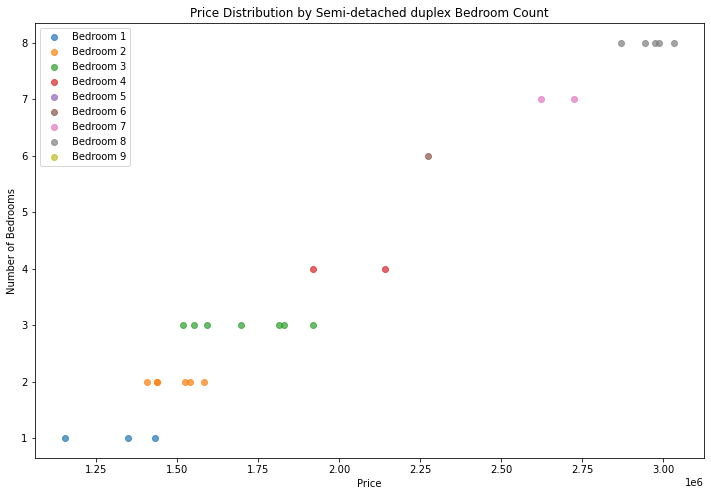



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  18.00000  21.00000      19.00000       22.00000
mean    3.83333   3.09524       3.10526  2045341.06009
std     2.03643   2.25621       1.72867   445336.22755
min     1.00000   1.00000       1.00000  1371978.98100
25%     2.25000   1.00000       2.00000  1817207.02050
50%     4.00000   2.00000       3.00000  1990415.80150
75%     5.00000   5.00000       4.00000  2254760.14150
max     7.00000   7.00000       6.00000  3133705.38300


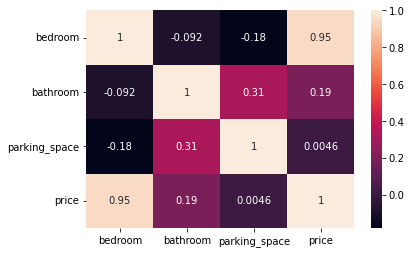

        loc      title  bedroom  bathroom  parking_space      price
86     Ondo  Townhouse     1.00      2.00           2.00 1503836.22
1730   Ondo  Townhouse     1.00      2.00            NaN 1371978.98
2993   Ondo  Townhouse     1.00      2.00           3.00 1403708.09
4262   Ondo  Townhouse     2.00      7.00           2.00 1840992.03
5762   Ondo  Townhouse     2.00      1.00           3.00 1579853.75
9975   Ondo  Townhouse     3.00      6.00           3.00 2055773.75
4343   Ondo  Townhouse     3.00      5.00           2.00 1974296.45
7346   Ondo  Townhouse     3.00      3.00           6.00 2006535.16
9062   Ondo  Townhouse     4.00      1.00           2.00 1847869.22
5853   Ondo  Townhouse     4.00      1.00            NaN 1868310.21
12928  Ondo  Townhouse     4.00      4.00            NaN 2291468.95
6595   Ondo  Townhouse     4.00       NaN           6.00 2144633.71
4837   Ondo  Townhouse     5.00      1.00           1.00 2085349.63
10629  Ondo  Townhouse     5.00      1.00       

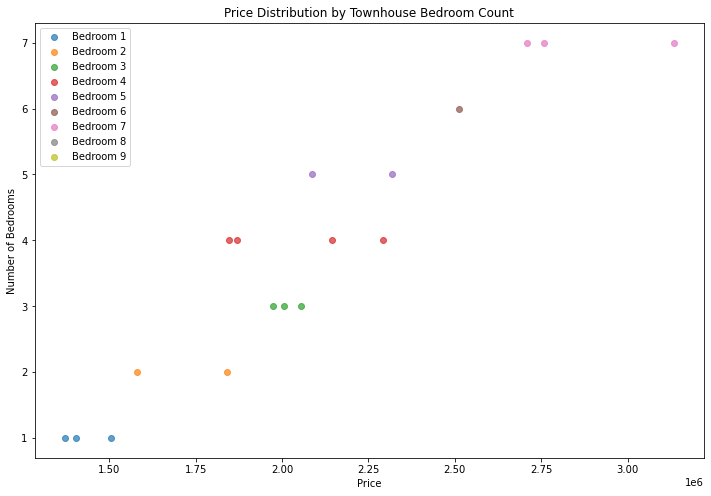



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  32.00000  38.00000      34.00000       43.00000
mean    4.43750   2.63158       3.26471  2827273.83298
std     1.56447   1.92313       1.60130   482222.36379
min     2.00000   1.00000       1.00000  1974899.90700
25%     3.00000   1.00000       2.00000  2575742.77950
50%     4.00000   2.00000       3.50000  2818822.13600
75%     5.25000   3.75000       4.00000  3048588.21600
max     8.00000   7.00000       6.00000  3950458.92500


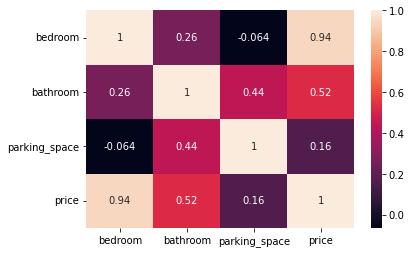

        loc      title  bedroom  bathroom  parking_space      price
13131  Ondo  Penthouse     2.00      1.00           1.00 2019922.69
11272  Ondo  Penthouse     2.00      6.00           6.00 2452458.96
8342   Ondo  Penthouse     2.00      1.00            NaN 2215003.90
6756   Ondo  Penthouse     2.00      1.00           3.00 2179391.09
10229  Ondo  Penthouse     3.00      1.00            NaN 2328043.18
12644  Ondo  Penthouse     3.00      5.00           6.00 2661836.95
4326   Ondo  Penthouse     3.00      2.00           4.00 2451758.82
78     Ondo  Penthouse     3.00      1.00            NaN 2305736.65
8586   Ondo  Penthouse     3.00      2.00           4.00 2646285.76
11639  Ondo  Penthouse     4.00      1.00           4.00 2600539.47
11373  Ondo  Penthouse     4.00      6.00           5.00 2960974.39
409    Ondo  Penthouse     4.00      1.00           6.00 2685123.24
9477   Ondo  Penthouse     4.00      2.00           1.00 2571901.25
4896   Ondo  Penthouse     4.00       NaN       

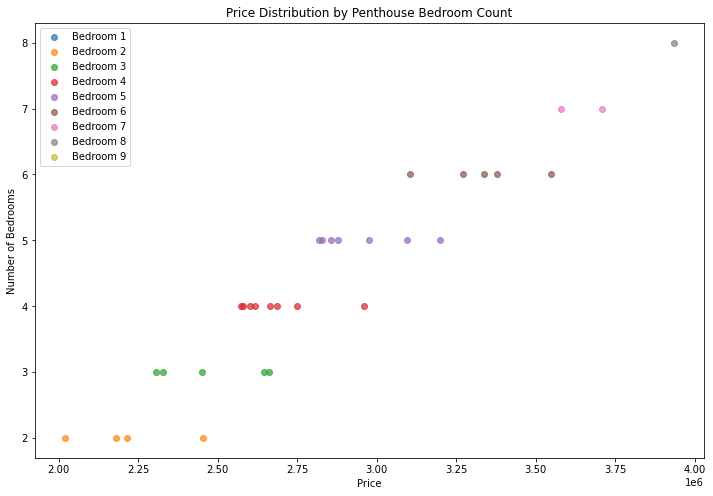



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  12.00000  10.00000      10.00000       12.00000
mean    2.50000   1.40000       2.50000  1253852.76707
std     1.31426   0.51640       1.08012   329016.54410
min     1.00000   1.00000       1.00000   800382.26480
25%     1.75000   1.00000       2.00000  1027766.78780
50%     2.00000   1.00000       2.50000  1226569.79850
75%     3.25000   2.00000       3.00000  1487410.06550
max     5.00000   2.00000       4.00000  1878618.85700


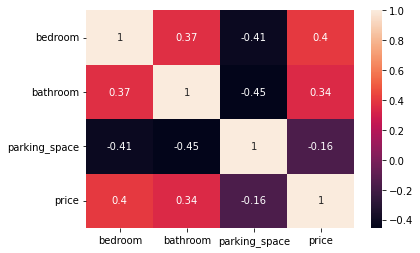

        loc    title  bedroom  bathroom  parking_space      price
1415   Ondo  Cottage     1.00      1.00            NaN  800382.26
9635   Ondo  Cottage     1.00      1.00           2.00 1184954.66
13406  Ondo  Cottage     1.00      1.00           3.00  820677.26
5287   Ondo  Cottage     2.00      2.00           1.00 1038937.52
12810  Ondo  Cottage     2.00      1.00           3.00  994254.59
13017  Ondo  Cottage     2.00      1.00           3.00 1471001.66
13553  Ondo  Cottage     2.00      2.00           2.00 1536635.29
325    Ondo  Cottage     3.00      2.00            NaN 1605268.62
5624   Ondo  Cottage     3.00       NaN           4.00 1089134.83
4766   Ondo  Cottage     4.00      1.00           1.00 1268184.93
5061   Ondo  Cottage     4.00       NaN           4.00 1878618.86
3966   Ondo  Cottage     5.00      2.00           2.00 1358182.71


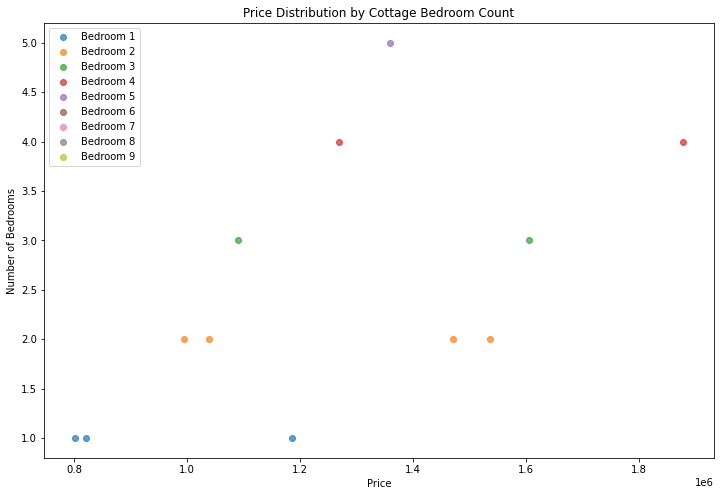

In [252]:
#Ondo
Ondo = housing_train[housing_train["loc" ] == "Ondo"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Ondo, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  35.00000  32.00000      35.00000       41.00000
mean    4.77143   2.53125       2.42857  3533717.67673
std     2.30199   1.84888       1.46098  1203782.57969
min     1.00000   1.00000       1.00000  1352960.48400
25%     3.00000   1.00000       1.00000  2324697.81900
50%     5.00000   2.00000       2.00000  3675382.43500
75%     6.50000   4.00000       3.00000  4602502.32200
max     9.00000   7.00000       6.00000  5368036.91800


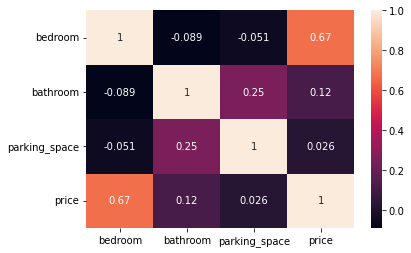

        loc    title  bedroom  bathroom  parking_space      price
11938  Osun  Mansion     1.00      1.00           4.00 1352960.48
12921  Osun  Mansion     1.00      3.00           1.00 2324697.82
22     Osun  Mansion     2.00      1.00            NaN 4163334.86
6572   Osun  Mansion     2.00      3.00           4.00 2814830.81
4600   Osun  Mansion     2.00      6.00           1.00 2899028.80
2743   Osun  Mansion     2.00      1.00            NaN 2758698.81
8516   Osun  Mansion     3.00      7.00           1.00 3312874.55
7425   Osun  Mansion     3.00      5.00           5.00 3368002.74
5579   Osun  Mansion     3.00       NaN           4.00 1755763.65
7058   Osun  Mansion     3.00      1.00           1.00 1777804.02
987    Osun  Mansion     3.00       NaN           2.00 4279672.70
773    Osun  Mansion     3.00      1.00            NaN 2866328.10
1056   Osun  Mansion     4.00       NaN           2.00 3452360.16
6066   Osun  Mansion     4.00       NaN           2.00 1869151.28
10845  Osu

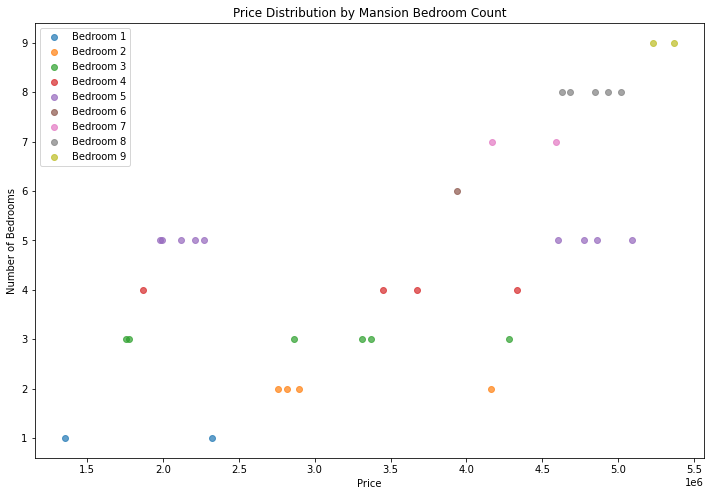



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  14.00000  15.00000      14.00000       17.00000
mean    4.71429   3.26667       3.57143  2210599.21488
std     3.02372   2.01660       1.74154   743953.80184
min     1.00000   1.00000       1.00000  1278293.17500
25%     1.75000   1.50000       2.25000  1568736.38700
50%     4.50000   3.00000       3.50000  2069886.77100
75%     6.75000   4.50000       4.75000  2574424.37700
max     9.00000   7.00000       6.00000  3635825.71400


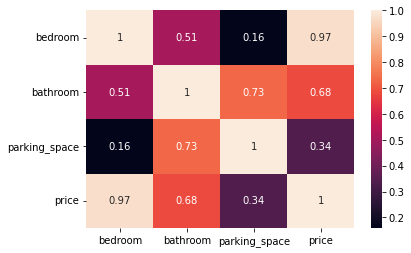

        loc            title  bedroom  bathroom  parking_space      price
1501   Osun  Detached duplex     1.00       NaN            NaN 1358955.70
4775   Osun  Detached duplex     1.00      3.00           5.00 1504032.02
5871   Osun  Detached duplex     1.00      1.00           1.00 1278293.18
9325   Osun  Detached duplex     1.00      5.00            NaN 1568736.39
1432   Osun  Detached duplex     4.00      1.00           1.00 1869338.54
8348   Osun  Detached duplex     4.00      2.00           3.00 1975600.58
13040  Osun  Detached duplex     4.00      6.00           6.00 2368895.54
2648   Osun  Detached duplex     5.00      1.00           3.00 2268320.67
5788   Osun  Detached duplex     5.00      1.00           4.00 2156753.87
1059   Osun  Detached duplex     6.00       NaN           2.00 2574424.38
7250   Osun  Detached duplex     7.00      3.00           3.00 2850660.17
1255   Osun  Detached duplex     9.00      4.00            NaN 3458251.92
8215   Osun  Detached duplex     9.00 

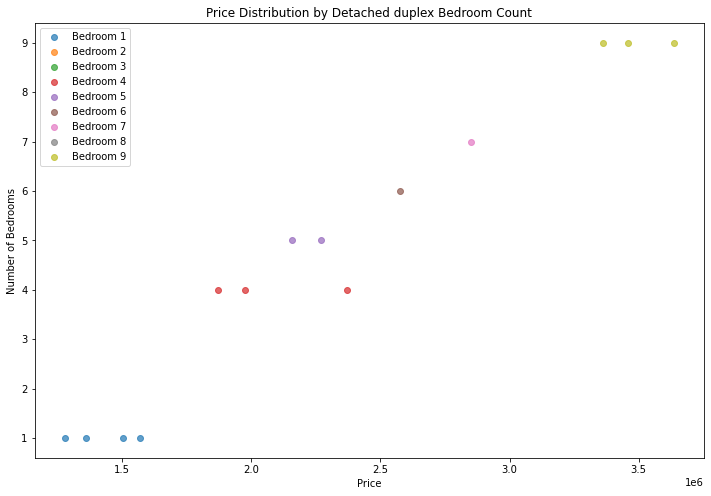



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  18.00000  20.00000      17.00000       23.00000
mean    4.38889   3.05000       3.58824  1582175.50040
std     1.97451   2.23548       1.54349   420529.77380
min     1.00000   1.00000       1.00000   900802.94860
25%     3.00000   1.00000       3.00000  1239255.79050
50%     4.50000   2.00000       4.00000  1570342.53100
75%     5.75000   5.00000       5.00000  1839065.40200
max     8.00000   7.00000       6.00000  2339924.00400


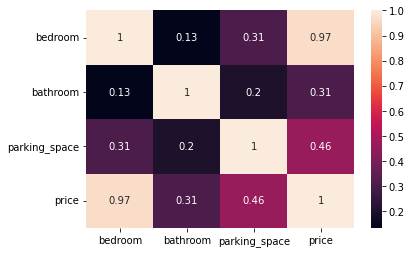

        loc      title  bedroom  bathroom  parking_space      price
6236   Osun  Apartment     1.00      1.00            NaN  900802.95
10546  Osun  Apartment     2.00      1.00           4.00 1170157.56
9097   Osun  Apartment     2.00      1.00           3.00 1107547.35
6221   Osun  Apartment     2.00      6.00           2.00 1186178.75
10354  Osun  Apartment     3.00      2.00            NaN 1200011.54
5056   Osun  Apartment     3.00      7.00            NaN 1478621.78
10570  Osun  Apartment     4.00      5.00            NaN 1560380.96
13692  Osun  Apartment     4.00      1.00           1.00 1293905.82
3974   Osun  Apartment     4.00       NaN           3.00 1509050.26
7603   Osun  Apartment     5.00      1.00           4.00 1570342.53
7668   Osun  Apartment     5.00      1.00           2.00 1574784.04
1645   Osun  Apartment     5.00       NaN           3.00 1758870.64
4919   Osun  Apartment     5.00      2.00            NaN 1622016.74
13065  Osun  Apartment     6.00      5.00       

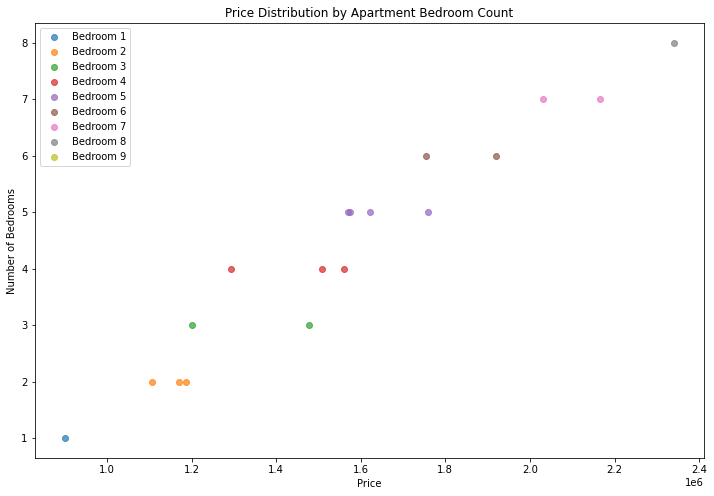



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  27.00000  20.00000      23.00000       29.00000
mean    4.33333   3.90000       3.82609  1717519.33144
std     2.86893   2.33734       1.77488   590365.52276
min     1.00000   1.00000       1.00000   918943.27870
25%     2.00000   2.00000       2.00000  1236750.64900
50%     4.00000   3.50000       4.00000  1589637.07600
75%     7.00000   6.00000       5.50000  2021426.64400
max     9.00000   7.00000       6.00000  2846699.62800


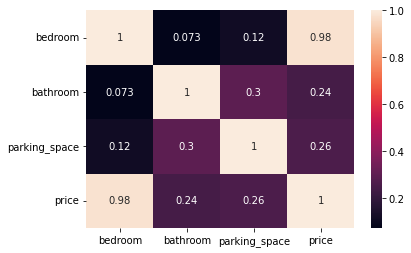

        loc     title  bedroom  bathroom  parking_space      price
579    Osun  Bungalow     1.00       NaN           3.00 1171712.19
12160  Osun  Bungalow     1.00      1.00            NaN  918943.28
10039  Osun  Bungalow     1.00      2.00           5.00 1077596.75
8366   Osun  Bungalow     1.00      5.00           3.00 1136471.73
3676   Osun  Bungalow     1.00       NaN           6.00 1101019.95
4922   Osun  Bungalow     1.00       NaN           6.00 1277222.24
552    Osun  Bungalow     2.00      1.00           3.00 1236750.65
1739   Osun  Bungalow     2.00       NaN           2.00 1263071.17
13231  Osun  Bungalow     2.00      6.00           3.00 1356975.29
9474   Osun  Bungalow     3.00      1.00           4.00 1384777.20
6105   Osun  Bungalow     3.00      7.00           5.00 1631232.19
5593   Osun  Bungalow     3.00       NaN           2.00 1400285.65
13568  Osun  Bungalow     3.00      6.00           2.00 1525722.14
1274   Osun  Bungalow     4.00      7.00           6.00 185161

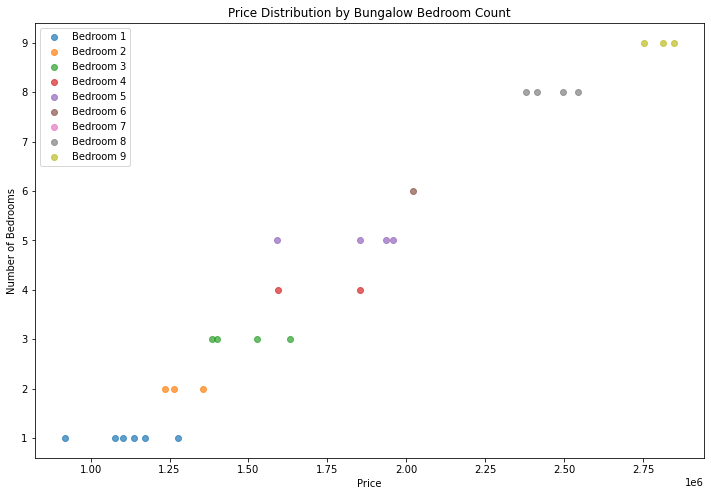



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  33.00000  29.00000      37.00000       40.00000
mean    4.36364   2.48276       3.40541  1762204.73790
std     2.64360   1.59510       1.51766   555783.98764
min     1.00000   1.00000       1.00000  1032977.64700
25%     2.00000   1.00000       2.00000  1264988.12600
50%     4.00000   2.00000       3.00000  1580529.21000
75%     6.00000   3.00000       5.00000  2300469.23000
max     9.00000   7.00000       6.00000  2811459.16900


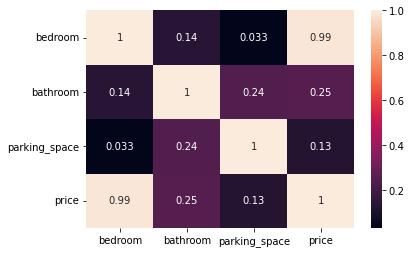

        loc title  bedroom  bathroom  parking_space      price
6591   Osun  Flat     1.00      1.00           3.00 1032977.65
7157   Osun  Flat     1.00       NaN           5.00 1253799.04
12965  Osun  Flat     2.00      3.00           6.00 1321523.50
2604   Osun  Flat     2.00      1.00           3.00 1154960.32
11262  Osun  Flat     2.00      1.00           4.00 1254420.80
10746  Osun  Flat     2.00      2.00           2.00 1225630.43
3278   Osun  Flat     2.00      1.00           3.00 1206418.49
10217  Osun  Flat     2.00       NaN           5.00 1298100.31
4245   Osun  Flat     2.00       NaN           3.00 1216907.45
9499   Osun  Flat     2.00       NaN           5.00 1368581.22
8702   Osun  Flat     2.00       NaN            NaN 1380398.49
7224   Osun  Flat     2.00       NaN           3.00 1251253.91
6581   Osun  Flat     2.00      2.00           4.00 1207605.05
1045   Osun  Flat     3.00      2.00           3.00 1408183.50
8437   Osun  Flat     3.00      2.00           2.00 138

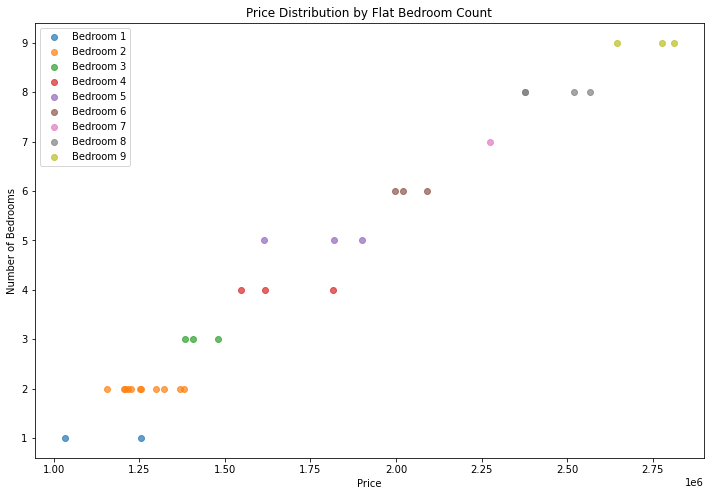



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  25.00000  24.00000      24.00000       29.00000
mean    4.92000   3.41667       3.16667  2040752.35834
std     2.56450   1.95419       1.37261   583936.38508
min     1.00000   1.00000       1.00000  1112197.38100
25%     3.00000   2.00000       2.00000  1634103.18500
50%     5.00000   3.00000       3.00000  1801489.45600
75%     7.00000   4.50000       4.00000  2490697.52500
max     9.00000   7.00000       6.00000  3014298.74700


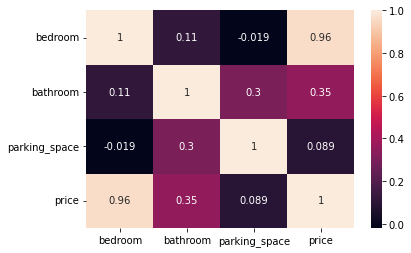

        loc           title  bedroom  bathroom  parking_space      price
6002   Osun  Terrace duplex     1.00      6.00           2.00 1283118.74
3484   Osun  Terrace duplex     1.00      2.00            NaN 1112197.38
4820   Osun  Terrace duplex     1.00      6.00           4.00 1335820.93
8674   Osun  Terrace duplex     2.00      1.00           1.00 1286559.25
10733  Osun  Terrace duplex     2.00      1.00            NaN 1388102.24
6399   Osun  Terrace duplex     3.00      2.00            NaN 1606110.31
3449   Osun  Terrace duplex     3.00      4.00           5.00 1685401.34
6051   Osun  Terrace duplex     3.00      3.00            NaN 1672106.92
6059   Osun  Terrace duplex     4.00       NaN           2.00 1634103.19
5064   Osun  Terrace duplex     4.00      2.00           1.00 1666181.01
4724   Osun  Terrace duplex     4.00      2.00           4.00 1706297.68
4926   Osun  Terrace duplex     5.00      1.00           4.00 1775798.25
1134   Osun  Terrace duplex     5.00      2.00     

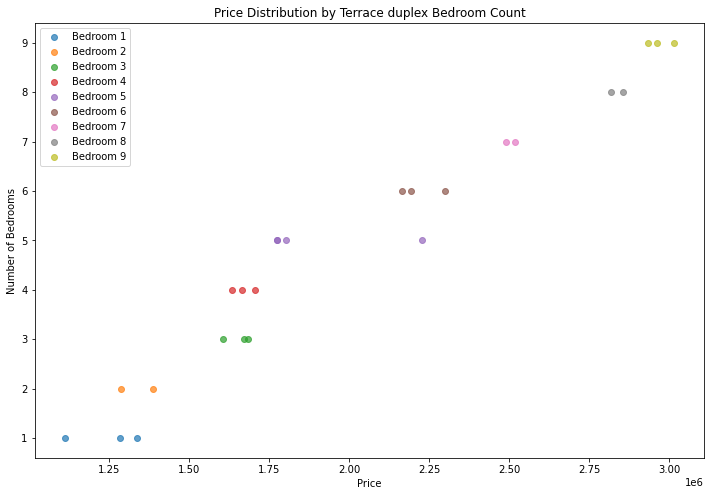



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  35.00000      35.00000       41.00000
mean    4.20000   3.68571       3.37143  1879778.02122
std     2.32527   1.98185       1.84846   539187.24301
min     1.00000   1.00000       1.00000  1177476.60800
25%     2.25000   2.00000       2.00000  1480925.43700
50%     3.50000   3.00000       3.00000  1713259.81700
75%     5.75000   5.00000       5.00000  2179170.38300
max     9.00000   7.00000       6.00000  3067238.68300


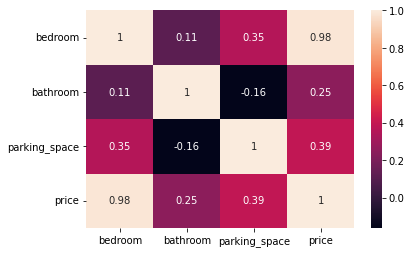

        loc                 title  bedroom  bathroom  parking_space      price
12445  Osun  Semi-detached duplex     1.00      2.00           3.00 1231529.96
7312   Osun  Semi-detached duplex     1.00      2.00           1.00 1218343.23
5272   Osun  Semi-detached duplex     1.00       NaN           3.00 1349115.35
13913  Osun  Semi-detached duplex     2.00      7.00           3.00 1546922.05
810    Osun  Semi-detached duplex     2.00      5.00           1.00 1414928.82
11289  Osun  Semi-detached duplex     2.00      2.00            NaN 1295992.27
10112  Osun  Semi-detached duplex     2.00      1.00           2.00 1322502.89
4411   Osun  Semi-detached duplex     2.00       NaN           2.00 1480925.44
11235  Osun  Semi-detached duplex     3.00      2.00           5.00 1606110.31
11132  Osun  Semi-detached duplex     3.00      3.00           6.00 1672106.92
33     Osun  Semi-detached duplex     3.00      7.00           3.00 1751635.70
4897   Osun  Semi-detached duplex     3.00      5.00

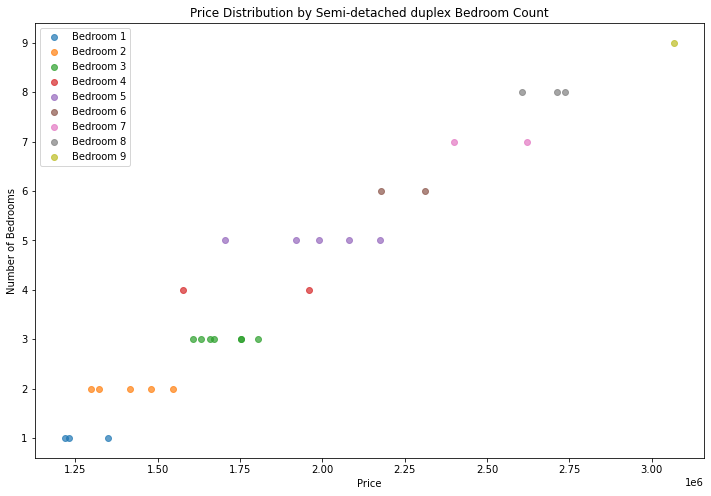



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  29.00000  31.00000      26.00000       33.00000
mean    4.72414   3.22581       3.11538  2066807.83427
std     2.97485   1.85669       1.75104   682764.92515
min     1.00000   1.00000       1.00000  1208332.27800
25%     2.00000   2.00000       2.00000  1468501.57300
50%     5.00000   3.00000       3.00000  1864279.27700
75%     8.00000   4.00000       4.75000  2737986.60700
max     9.00000   7.00000       6.00000  3340479.93100


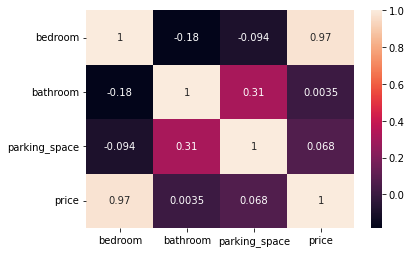

        loc      title  bedroom  bathroom  parking_space      price
741    Osun  Townhouse     1.00      3.00            NaN 1285796.76
819    Osun  Townhouse     1.00      6.00           3.00 1447227.48
10548  Osun  Townhouse     1.00      2.00            NaN 1358862.17
1624   Osun  Townhouse     1.00       NaN            NaN 1208332.28
2211   Osun  Townhouse     1.00      1.00           4.00 1256253.61
2669   Osun  Townhouse     1.00      5.00           5.00 1461734.90
9070   Osun  Townhouse     2.00      2.00           4.00 1435223.06
7179   Osun  Townhouse     2.00       NaN           2.00 1468501.57
6616   Osun  Townhouse     2.00      4.00           3.00 1569476.63
13222  Osun  Townhouse     2.00      7.00           5.00 1760186.35
6853   Osun  Townhouse     3.00      2.00           2.00 1561125.65
2222   Osun  Townhouse     3.00      3.00           6.00 1830520.30
1471   Osun  Townhouse     4.00      5.00           2.00 2023556.84
13011  Osun  Townhouse     5.00      2.00       

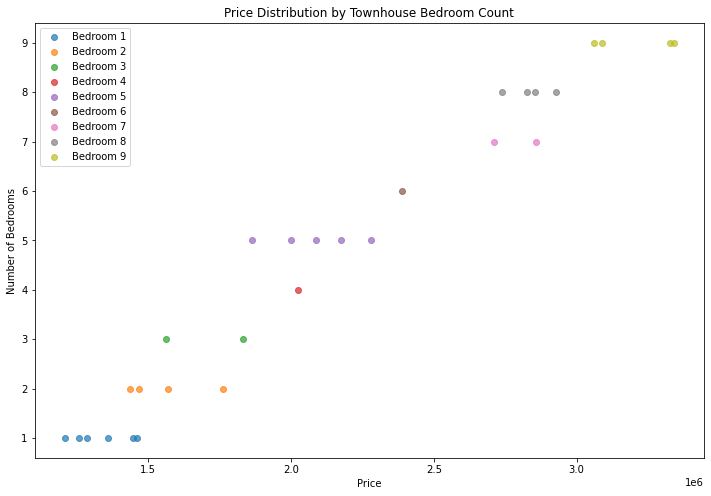



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  20.00000  17.00000      23.00000       26.00000
mean    4.45000   3.23529       3.60870  2649074.54865
std     2.45967   2.22288       1.94794   665138.36958
min     1.00000   1.00000       1.00000  1669843.52800
25%     2.00000   1.00000       2.00000  2217719.51525
50%     5.00000   2.00000       4.00000  2548447.45050
75%     6.00000   5.00000       6.00000  3071667.98875
max     9.00000   7.00000       6.00000  3890836.90900


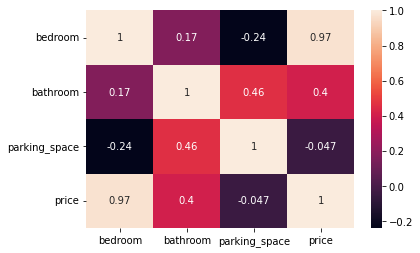

        loc      title  bedroom  bathroom  parking_space      price
11671  Osun  Penthouse     1.00       NaN            NaN 1936625.80
9300   Osun  Penthouse     1.00       NaN           4.00 1841297.36
7931   Osun  Penthouse     1.00      4.00           1.00 1669843.53
2803   Osun  Penthouse     2.00      7.00           6.00 2279935.35
3157   Osun  Penthouse     2.00       NaN           2.00 1784090.09
9558   Osun  Penthouse     2.00      1.00           4.00 1860215.48
5258   Osun  Penthouse     3.00       NaN           2.00 2210775.38
7438   Osun  Penthouse     4.00       NaN           6.00 2450911.11
9790   Osun  Penthouse     4.00      2.00           3.00 2393988.77
11037  Osun  Penthouse     5.00      2.00            NaN 2581274.55
10206  Osun  Penthouse     5.00       NaN           6.00 2943385.27
12532  Osun  Penthouse     5.00      6.00           6.00 3000651.01
5308   Osun  Penthouse     5.00      1.00           2.00 2562071.50
3467   Osun  Penthouse     5.00      1.00       

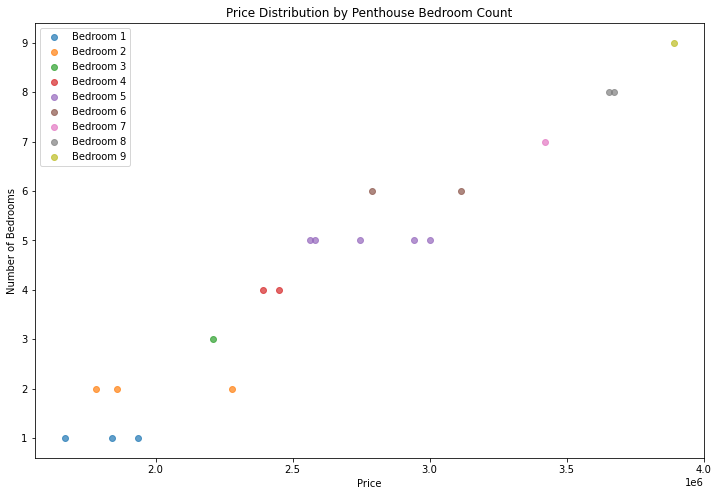



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  7.00000  6.00000       7.00000        7.00000
mean   3.28571  1.50000       3.28571  1425043.95584
std    1.70434  0.54772       0.75593   386997.60617
min    1.00000  1.00000       2.00000   811621.37090
25%    2.00000  1.00000       3.00000  1173751.62150
50%    4.00000  1.50000       3.00000  1530812.81900
75%    4.50000  2.00000       4.00000  1683348.18600
max    5.00000  2.00000       4.00000  1918673.88600


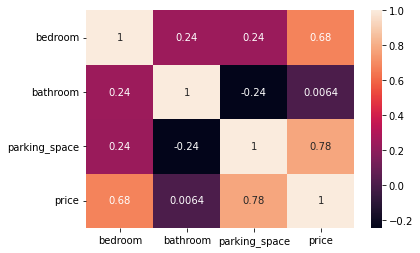

        loc    title  bedroom  bathroom  parking_space      price
2468   Osun  Cottage     1.00      1.00           3.00 1209799.85
12048  Osun  Cottage     1.00       NaN           4.00  811621.37
10508  Osun  Cottage     3.00      2.00           3.00 1530812.82
4640   Osun  Cottage     4.00      2.00           2.00 1137703.40
11556  Osun  Cottage     4.00      1.00           4.00 1632745.42
3847   Osun  Cottage     5.00      1.00           3.00 1733950.96
9125   Osun  Cottage     5.00      2.00           4.00 1918673.89


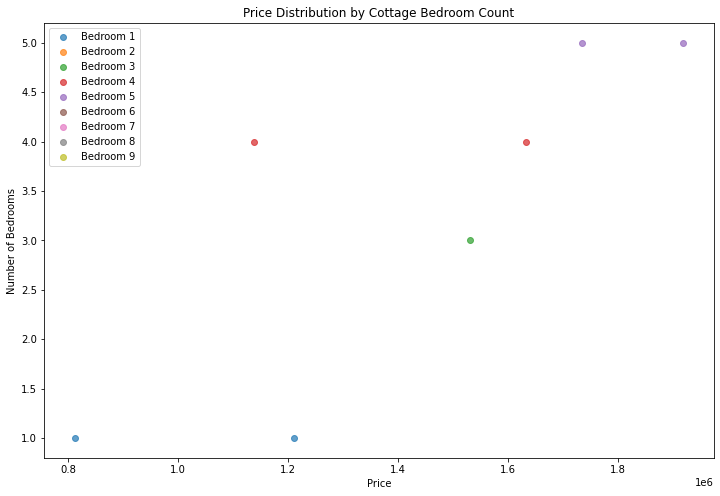

In [253]:
#Osun
Osun = housing_train[housing_train["loc" ] == "Osun"]
house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Osun, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  25.00000  31.00000      26.00000       34.00000
mean    4.20000   3.45161       3.65385  3625329.27509
std     2.30940   2.21869       1.95841  1195697.23967
min     1.00000   1.00000       1.00000  1288178.84200
25%     3.00000   2.00000       2.00000  3044127.18975
50%     4.00000   2.00000       3.50000  3772609.62250
75%     5.00000   5.50000       6.00000  4499074.50250
max     9.00000   7.00000       6.00000  5368036.91800


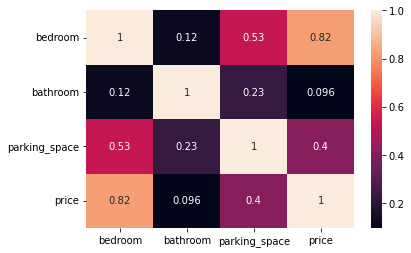

       loc    title  bedroom  bathroom  parking_space      price
61     Imo  Mansion     1.00      2.00            NaN 2463522.10
11647  Imo  Mansion     1.00      6.00           1.00 2575786.09
6231   Imo  Mansion     1.00      1.00           3.00 3440577.58
1902   Imo  Mansion     2.00      2.00           3.00 3962526.78
77     Imo  Mansion     2.00      2.00           3.00 1596635.15
92     Imo  Mansion     2.00      6.00           3.00 3010288.99
414    Imo  Mansion     3.00      7.00            NaN 3424134.73
11517  Imo  Mansion     3.00      3.00           5.00 3200610.56
7587   Imo  Mansion     3.00      1.00            NaN 1851361.02
6891   Imo  Mansion     4.00      6.00           5.00 3786642.62
11713  Imo  Mansion     4.00      1.00            NaN 4373806.51
5887   Imo  Mansion     4.00       NaN           2.00 1998410.18
6202   Imo  Mansion     4.00      5.00           6.00 3758576.62
13050  Imo  Mansion     4.00      2.00           1.00 4482129.36
10932  Imo  Mansion     4

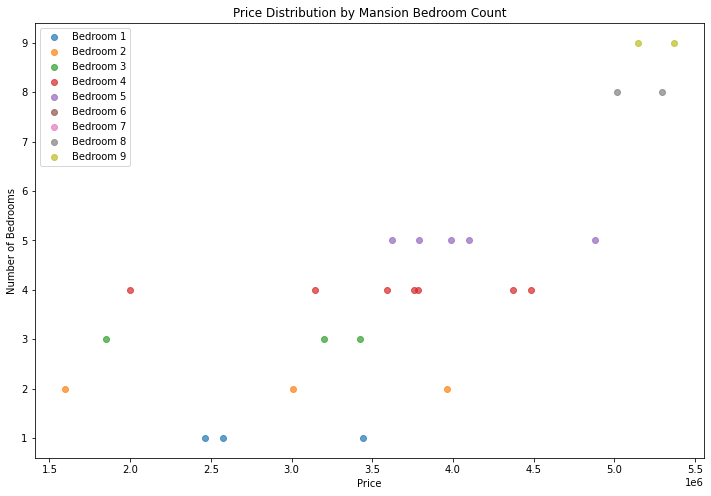



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  28.00000      30.00000       33.00000
mean    3.83333   2.82143       3.33333  2057241.87052
std     2.24505   2.05577       1.60459   570048.77413
min     1.00000   1.00000       1.00000  1297833.32200
25%     2.00000   1.00000       2.00000  1557431.66200
50%     3.00000   2.00000       3.00000  1940768.61300
75%     5.00000   4.00000       4.75000  2348983.20100
max     9.00000   7.00000       6.00000  3361631.23600


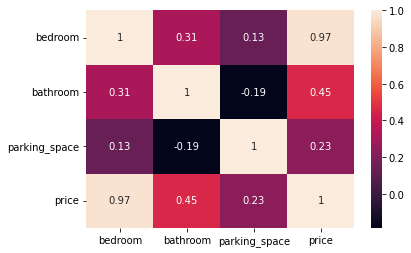

       loc            title  bedroom  bathroom  parking_space      price
10170  Imo  Detached duplex     1.00       NaN           6.00 1536238.92
9604   Imo  Detached duplex     1.00      1.00           3.00 1453146.82
2311   Imo  Detached duplex     1.00       NaN           1.00 1297833.32
12697  Imo  Detached duplex     1.00      2.00           4.00 1557431.66
84     Imo  Detached duplex     2.00      1.00           2.00 1548200.84
11290  Imo  Detached duplex     2.00      1.00           2.00 1510934.83
11724  Imo  Detached duplex     2.00      1.00           3.00 1565600.87
3809   Imo  Detached duplex     2.00      1.00           3.00 1523780.51
9689   Imo  Detached duplex     2.00      1.00           6.00 1662221.56
1434   Imo  Detached duplex     2.00       NaN           6.00 1759132.82
118    Imo  Detached duplex     2.00      6.00           1.00 1743465.23
1882   Imo  Detached duplex     3.00      2.00            NaN 1908271.14
11731  Imo  Detached duplex     3.00      2.00     

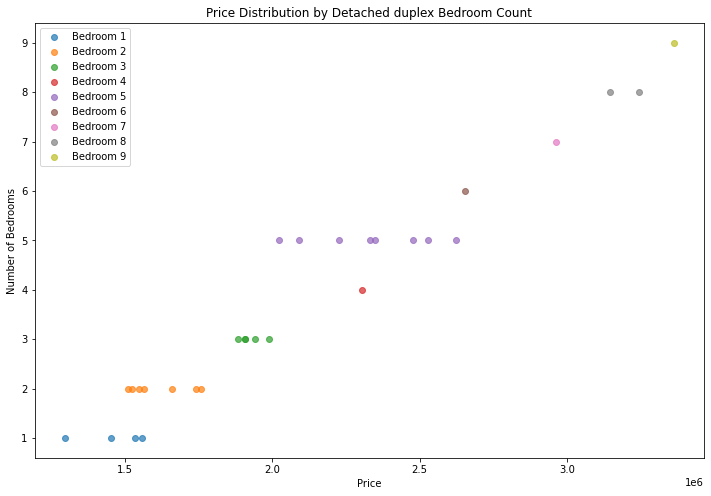



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  26.00000  27.00000      26.00000       30.00000
mean    3.84615   3.37037       3.73077  1495517.82570
std     2.25730   1.73534       1.73338   423885.64144
min     1.00000   1.00000       1.00000   973964.99380
25%     2.00000   2.00000       2.00000  1175838.64200
50%     3.00000   4.00000       3.00000  1370882.78900
75%     5.00000   4.00000       5.00000  1730527.80525
max     9.00000   7.00000       6.00000  2425322.08200


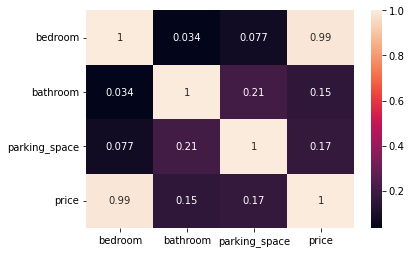

       loc      title  bedroom  bathroom  parking_space      price
9676   Imo  Apartment     1.00      5.00           3.00 1003119.14
6427   Imo  Apartment     1.00      1.00           1.00  973964.99
12844  Imo  Apartment     2.00      5.00           3.00 1175838.64
9729   Imo  Apartment     2.00      4.00           1.00 1104012.65
9433   Imo  Apartment     2.00      3.00           3.00 1114167.84
9168   Imo  Apartment     2.00      1.00           3.00 1097822.72
8587   Imo  Apartment     2.00      4.00           6.00 1206489.13
3262   Imo  Apartment     2.00       NaN           3.00 1175838.64
3752   Imo  Apartment     2.00      1.00           6.00 1113982.93
8372   Imo  Apartment     3.00      2.00           2.00 1242463.59
4882   Imo  Apartment     3.00      7.00            NaN 1376145.30
5974   Imo  Apartment     3.00      4.00           6.00 1386115.58
3910   Imo  Apartment     3.00       NaN           6.00 1447786.38
2172   Imo  Apartment     3.00      4.00           5.00 136562

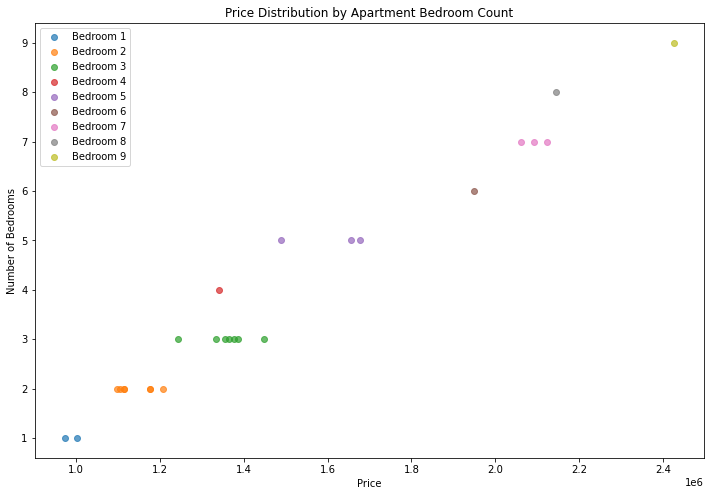



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  32.00000  33.00000      26.00000       38.00000
mean    3.65625   3.15152       3.23077  1632299.19942
std     2.14941   2.10833       1.53121   428542.86095
min     1.00000   1.00000       1.00000  1101256.31000
25%     2.00000   1.00000       2.00000  1312819.05175
50%     3.00000   2.00000       3.50000  1508319.26950
75%     5.00000   5.00000       4.00000  1879328.91425
max     9.00000   7.00000       6.00000  2752795.51300


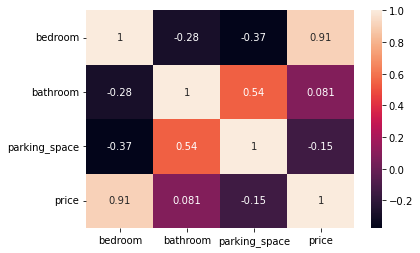

       loc     title  bedroom  bathroom  parking_space      price
11184  Imo  Bungalow     1.00      2.00           2.00 1101256.31
7608   Imo  Bungalow     1.00      5.00            NaN 1206741.32
4226   Imo  Bungalow     2.00      7.00           4.00 1415638.95
278    Imo  Bungalow     2.00      5.00            NaN 1298311.63
600    Imo  Bungalow     2.00      6.00           5.00 1403821.68
813    Imo  Bungalow     2.00      2.00           4.00 1210125.67
1686   Imo  Bungalow     2.00      1.00            NaN 1177153.28
9177   Imo  Bungalow     2.00      2.00           1.00 1230563.97
7749   Imo  Bungalow     2.00       NaN           4.00 1309917.57
3523   Imo  Bungalow     2.00      1.00            NaN 1172179.12
3592   Imo  Bungalow     2.00      1.00            NaN 1184339.87
3609   Imo  Bungalow     2.00      3.00            NaN 1321523.50
7017   Imo  Bungalow     2.00      1.00           5.00 1227619.39
11330  Imo  Bungalow     3.00       NaN           1.00 1396577.56
10951  Imo

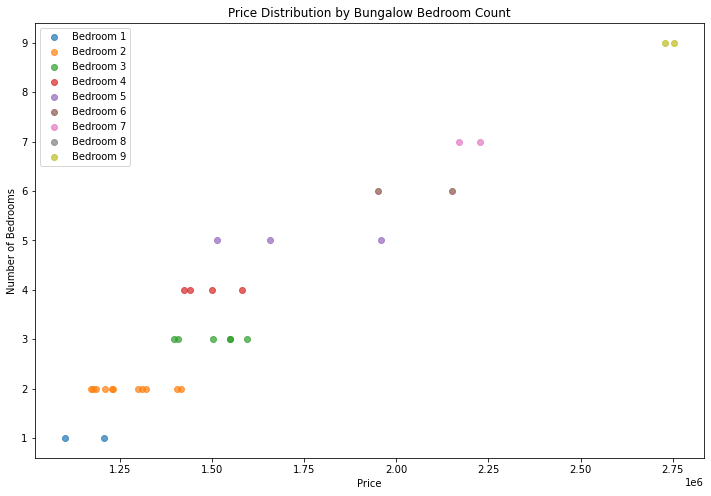



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  26.00000  29.00000      28.00000       32.00000
mean    3.84615   3.48276       3.00000  1637345.61331
std     2.12964   2.29317       1.33333   482880.53223
min     1.00000   1.00000       1.00000  1057804.15000
25%     2.00000   2.00000       2.00000  1228361.33425
50%     4.00000   2.00000       3.00000  1533948.14150
75%     5.00000   6.00000       4.00000  1968254.49525
max     8.00000   7.00000       5.00000  2729583.64300


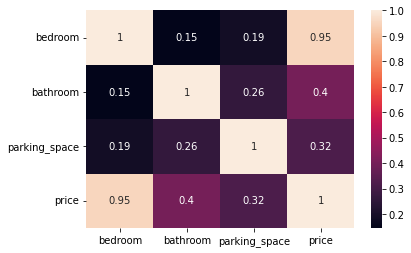

       loc title  bedroom  bathroom  parking_space      price
133    Imo  Flat     1.00      6.00            NaN 1195135.39
1925   Imo  Flat     1.00      7.00           2.00 1183529.45
11398  Imo  Flat     1.00      3.00           3.00 1065990.81
9764   Imo  Flat     1.00      4.00           3.00 1101231.27
6692   Imo  Flat     1.00      2.00           2.00 1057804.15
3519   Imo  Flat     2.00       NaN           3.00 1170505.84
11930  Imo  Flat     2.00      1.00            NaN 1138826.33
10871  Imo  Flat     2.00       NaN           4.00 1239436.65
869    Imo  Flat     3.00      2.00           4.00 1342070.77
2660   Imo  Flat     3.00      1.00           1.00 1333829.55
3913   Imo  Flat     3.00      2.00           4.00 1330354.93
9537   Imo  Flat     3.00      5.00           5.00 1560751.27
12518  Imo  Flat     4.00      2.00           2.00 1507145.01
12226  Imo  Flat     4.00      7.00            NaN 1851619.56
8678   Imo  Flat     4.00      1.00           2.00 1427656.32
13045  I

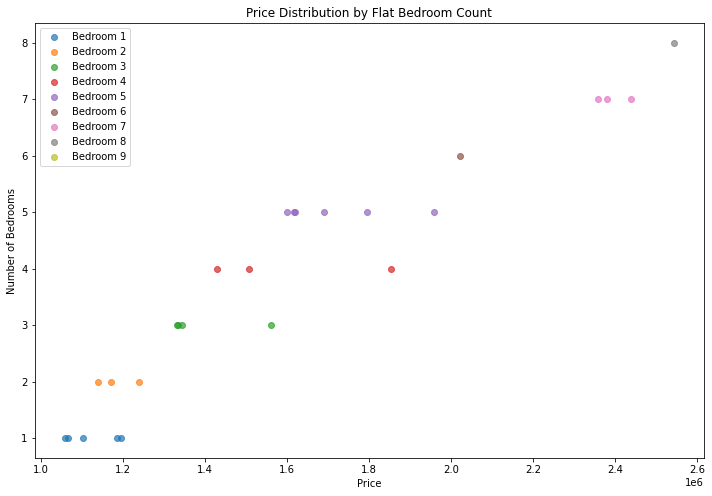



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  22.00000  22.00000      22.00000       27.00000
mean    4.27273   3.36364       3.40909  1901785.78370
std     2.35396   2.05971       1.86851   566998.02422
min     1.00000   1.00000       1.00000  1124787.21100
25%     2.00000   2.00000       2.00000  1430762.57950
50%     4.00000   2.50000       4.00000  1846826.07600
75%     5.75000   5.00000       5.00000  2354756.71250
max     9.00000   7.00000       6.00000  2948302.13400


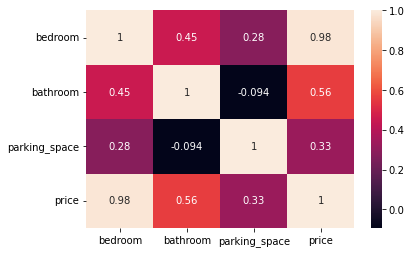

       loc           title  bedroom  bathroom  parking_space      price
10987  Imo  Terrace duplex     1.00      1.00            NaN 1124787.21
13980  Imo  Terrace duplex     2.00      1.00           6.00 1388102.24
13659  Imo  Terrace duplex     2.00      2.00           4.00 1429282.65
12830  Imo  Terrace duplex     2.00       NaN           6.00 1546684.31
6356   Imo  Terrace duplex     2.00      2.00           4.00 1428187.53
7044   Imo  Terrace duplex     2.00      3.00           1.00 1335637.79
9250   Imo  Terrace duplex     2.00      2.00           1.00 1259455.93
4544   Imo  Terrace duplex     3.00      2.00            NaN 1452112.30
13763  Imo  Terrace duplex     3.00      1.00           3.00 1464937.84
12346  Imo  Terrace duplex     3.00      4.00           2.00 1606348.05
5660   Imo  Terrace duplex     4.00      5.00           4.00 1908203.54
8618   Imo  Terrace duplex     4.00      7.00           5.00 2013845.67
9148   Imo  Terrace duplex     4.00      1.00            NaN 166

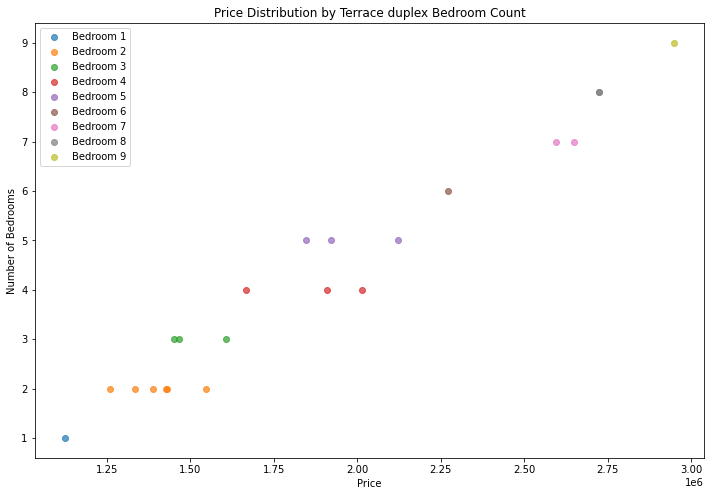



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  28.00000      31.00000       34.00000
mean    4.46667   2.78571       2.61290  1889025.22274
std     2.35962   1.79210       1.28264   575074.26671
min     1.00000   1.00000       1.00000  1039983.15000
25%     3.00000   1.75000       1.00000  1497334.45775
50%     4.00000   2.00000       3.00000  1756268.68650
75%     6.00000   4.00000       4.00000  2151621.75275
max     9.00000   7.00000       5.00000  3080533.10300


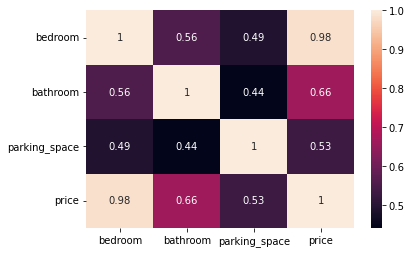

       loc                 title  bedroom  bathroom  parking_space      price
8728   Imo  Semi-detached duplex     1.00      1.00           1.00 1039983.15
12511  Imo  Semi-detached duplex     1.00      1.00           1.00 1101372.24
1721   Imo  Semi-detached duplex     1.00      2.00           1.00 1137958.76
5621   Imo  Semi-detached duplex     2.00       NaN           4.00 1573273.15
9451   Imo  Semi-detached duplex     2.00      1.00            NaN 1276750.74
13245  Imo  Semi-detached duplex     2.00      4.00           3.00 1427985.50
1123   Imo  Semi-detached duplex     2.00      4.00           3.00 1427985.50
2230   Imo  Semi-detached duplex     3.00      2.00           1.00 1496210.64
8712   Imo  Semi-detached duplex     3.00       NaN           1.00 1463042.65
4550   Imo  Semi-detached duplex     3.00      1.00           1.00 1337523.43
2461   Imo  Semi-detached duplex     4.00      1.00           4.00 1749621.48
1786   Imo  Semi-detached duplex     4.00       NaN           2.

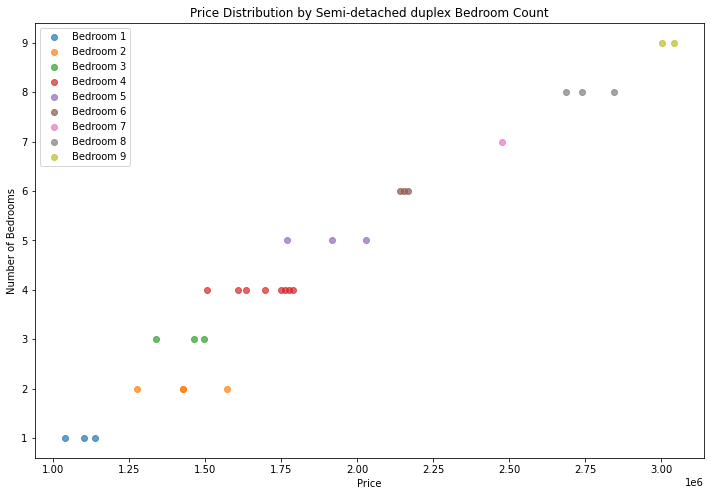



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  34.00000  35.00000      37.00000       41.00000
mean    4.00000   3.37143       3.16216  2012140.37466
std     2.61696   2.19740       1.75616   651611.40724
min     1.00000   1.00000       1.00000  1138502.50100
25%     2.00000   2.00000       2.00000  1535685.81200
50%     3.00000   2.00000       3.00000  1845556.03200
75%     5.00000   6.00000       4.00000  2522243.52100
max     9.00000   7.00000       6.00000  3208328.21000


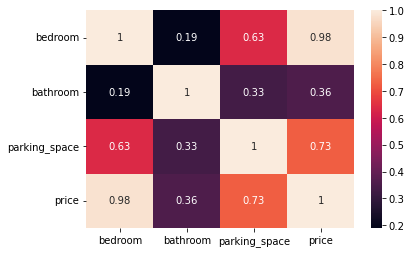

       loc      title  bedroom  bathroom  parking_space      price
1151   Imo  Townhouse     1.00      2.00           4.00 1299745.95
3097   Imo  Townhouse     1.00       NaN           2.00 1238759.48
7751   Imo  Townhouse     1.00       NaN           3.00 1225796.69
13672  Imo  Townhouse     1.00      2.00           1.00 1250935.49
12789  Imo  Townhouse     1.00      3.00           3.00 1315075.76
11442  Imo  Townhouse     1.00      1.00           4.00 1327392.93
9570   Imo  Townhouse     1.00      2.00           1.00 1212467.19
5859   Imo  Townhouse     1.00      5.00           2.00 1373897.91
8811   Imo  Townhouse     2.00      6.00           6.00 1745414.77
11181  Imo  Townhouse     2.00      7.00           1.00 1643070.36
7387   Imo  Townhouse     3.00      2.00            NaN 1548955.85
9796   Imo  Townhouse     3.00      1.00           4.00 1705705.81
13738  Imo  Townhouse     3.00      1.00           2.00 1625303.16
7113   Imo  Townhouse     3.00      1.00           1.00 153568

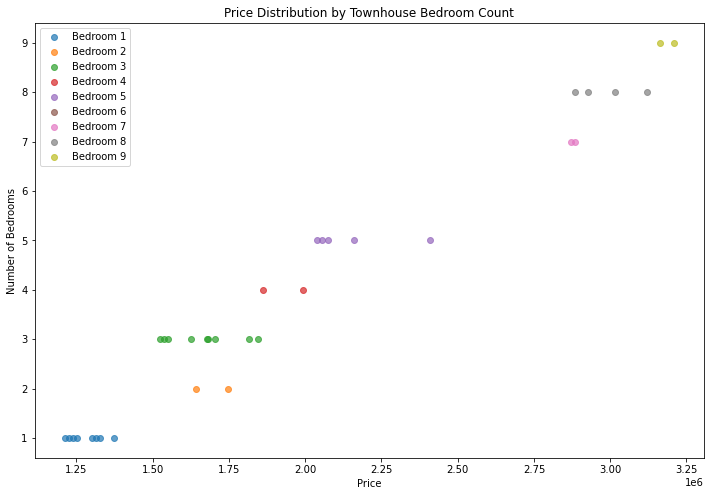



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  22.00000  22.00000      27.00000       29.00000
mean    3.86364   2.90909       3.55556  2479913.12645
std     2.79958   1.94958       1.52753   699650.94555
min     1.00000   1.00000       1.00000  1612234.37700
25%     1.25000   1.25000       2.50000  1892892.67600
50%     3.00000   2.00000       4.00000  2489317.20900
75%     5.75000   4.75000       4.00000  2739228.33700
max     9.00000   7.00000       6.00000  4062290.74000


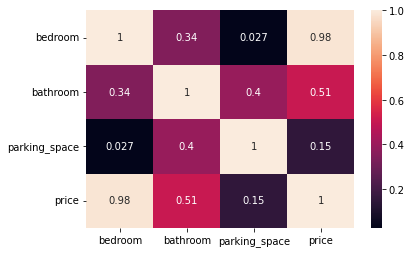

       loc      title  bedroom  bathroom  parking_space      price
5165   Imo  Penthouse     1.00      1.00           4.00 1612234.38
5573   Imo  Penthouse     1.00       NaN           6.00 1860157.00
5944   Imo  Penthouse     1.00      5.00           4.00 1841297.36
8669   Imo  Penthouse     1.00      5.00           5.00 1879360.06
11977  Imo  Penthouse     1.00       NaN           5.00 1650297.07
11786  Imo  Penthouse     1.00      2.00            NaN 1691784.69
2052   Imo  Penthouse     2.00      2.00           1.00 1906850.36
12225  Imo  Penthouse     2.00       NaN           4.00 1970826.86
11605  Imo  Penthouse     2.00      1.00           3.00 1892892.68
3539   Imo  Penthouse     3.00      1.00           2.00 2060682.60
3745   Imo  Penthouse     3.00       NaN           1.00 2144249.74
12957  Imo  Penthouse     3.00      2.00           4.00 2172369.28
6343   Imo  Penthouse     4.00      7.00           4.00 2718380.19
13113  Imo  Penthouse     4.00      3.00           6.00 256544

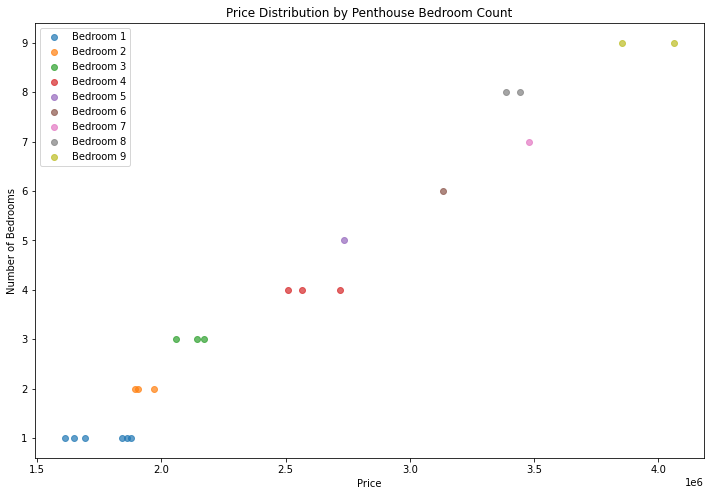



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  10.00000  11.00000      12.00000       13.00000
mean    3.20000   1.36364       2.50000  1469588.04185
std     1.31656   0.50452       0.90453   211128.65087
min     1.00000   1.00000       1.00000  1196790.54100
25%     2.25000   1.00000       2.00000  1308148.77400
50%     3.00000   1.00000       2.00000  1419129.20900
75%     4.00000   2.00000       3.00000  1618780.62000
max     5.00000   2.00000       4.00000  1888435.88000


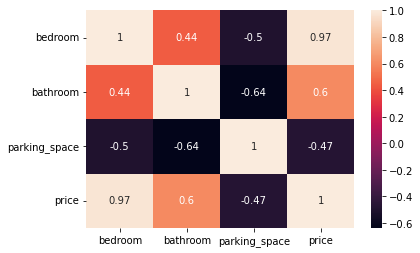

       loc    title  bedroom  bathroom  parking_space      price
7275   Imo  Cottage     1.00       NaN           2.00 1196790.54
3200   Imo  Cottage     2.00      1.00           3.00 1308148.77
10169  Imo  Cottage     2.00      1.00           2.00 1283678.78
398    Imo  Cottage     3.00      1.00           3.00 1467857.08
543    Imo  Cottage     3.00      1.00           2.00 1419129.21
1943   Imo  Cottage     3.00       NaN           2.00 1370122.59
1601   Imo  Cottage     4.00      2.00           1.00 1618780.62
2934   Imo  Cottage     4.00      2.00           2.00 1681764.50
1922   Imo  Cottage     5.00      1.00            NaN 1315714.44
6793   Imo  Cottage     5.00      1.00           2.00 1704858.29
10942  Imo  Cottage      NaN      2.00           4.00 1249118.87
11243  Imo  Cottage      NaN      1.00           4.00 1600244.98
12110  Imo  Cottage      NaN      2.00           3.00 1888435.88


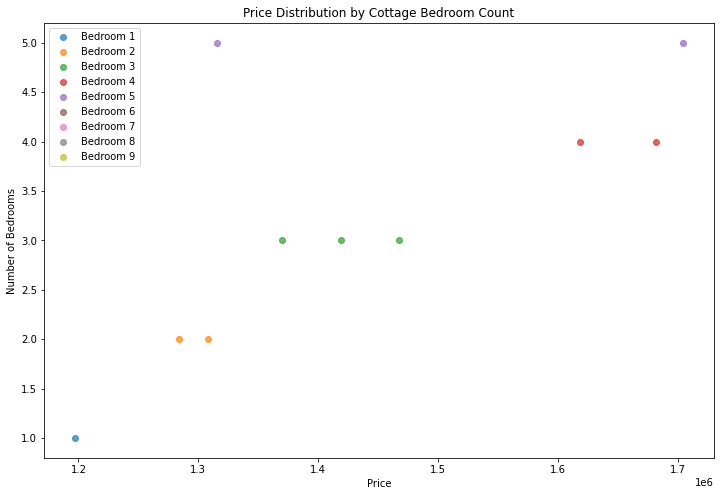

In [254]:
#Imo
Imo = housing_train[housing_train["loc" ] == "Imo"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Imo, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  22.00000  25.00000      23.00000       29.00000
mean    3.95455   3.88000       3.21739  3951273.40279
std     1.96341   1.94336       1.67757  1145211.24569
min     1.00000   1.00000       1.00000  1888006.16600
25%     3.00000   2.00000       2.00000  3374608.46900
50%     4.00000   4.00000       3.00000  3921466.83800
75%     5.00000   5.00000       4.00000  4530669.53900
max     9.00000   7.00000       6.00000  5991265.84700


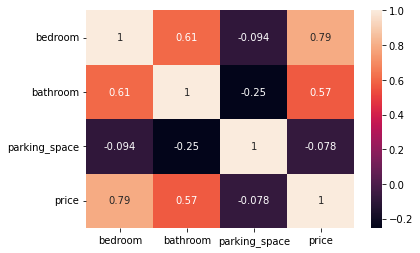

         loc    title  bedroom  bathroom  parking_space      price
8325   Enugu  Mansion     1.00      1.00           4.00 2574700.91
6738   Enugu  Mansion     1.00      2.00           2.00 3916725.89
1580   Enugu  Mansion     2.00      1.00           4.00 4273064.44
700    Enugu  Mansion     2.00      4.00            NaN 3079789.09
3045   Enugu  Mansion     3.00      2.00            NaN 1903266.47
11052  Enugu  Mansion     3.00      2.00            NaN 1888006.17
9909   Enugu  Mansion     3.00      4.00           1.00 3374608.47
9881   Enugu  Mansion     3.00      1.00           6.00 3404677.58
5430   Enugu  Mansion     3.00       NaN           3.00 1896713.17
6038   Enugu  Mansion     3.00      3.00            NaN 3405235.24
8623   Enugu  Mansion     4.00       NaN           4.00 3642479.87
4076   Enugu  Mansion     4.00      3.00           1.00 3643037.54
11716  Enugu  Mansion     4.00      4.00            NaN 3921466.84
12625  Enugu  Mansion     4.00      3.00           6.00 395209

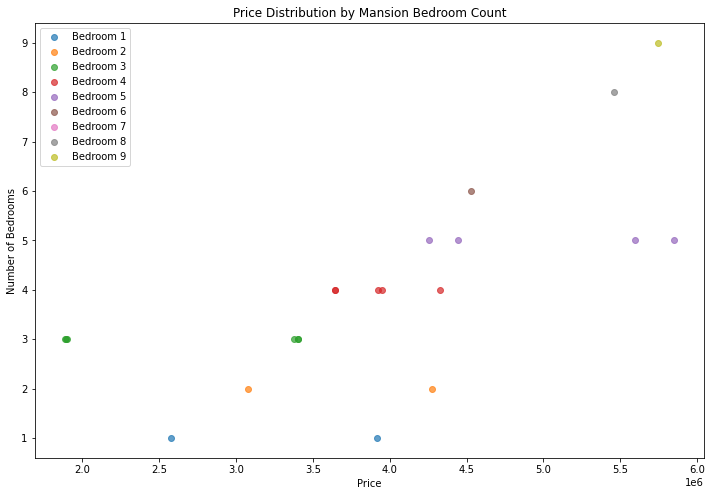



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  27.00000  23.00000      23.00000       28.00000
mean    3.88889   3.43478       3.04348  2307138.96414
std     2.47034   2.08514       1.69164   689821.84934
min     1.00000   1.00000       1.00000  1397587.65300
25%     2.00000   2.00000       2.00000  1682551.93950
50%     3.00000   3.00000       2.00000  2129194.71500
75%     5.50000   5.00000       4.00000  2737176.66875
max     9.00000   7.00000       6.00000  3602195.47100


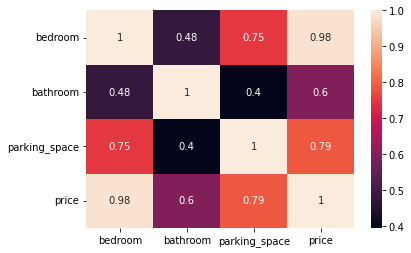

         loc            title  bedroom  bathroom  parking_space      price
4261   Enugu  Detached duplex     1.00      5.00            NaN 1627945.11
5468   Enugu  Detached duplex     1.00      2.00           2.00 1670416.29
3705   Enugu  Detached duplex     1.00      2.00            NaN 1544115.07
10251  Enugu  Detached duplex     1.00      2.00           2.00 1502211.78
8768   Enugu  Detached duplex     1.00      1.00           1.00 1397587.65
693    Enugu  Detached duplex     1.00      2.00           2.00 1585331.25
11208  Enugu  Detached duplex     2.00       NaN           3.00 1755479.06
399    Enugu  Detached duplex     2.00      1.00            NaN 1686597.16
824    Enugu  Detached duplex     2.00      6.00            NaN 2027365.99
7639   Enugu  Detached duplex     3.00      1.00           2.00 1781999.67
10155  Enugu  Detached duplex     3.00       NaN           6.00 2290229.19
13291  Enugu  Detached duplex     3.00      3.00           3.00 2075193.69
4122   Enugu  Detached du

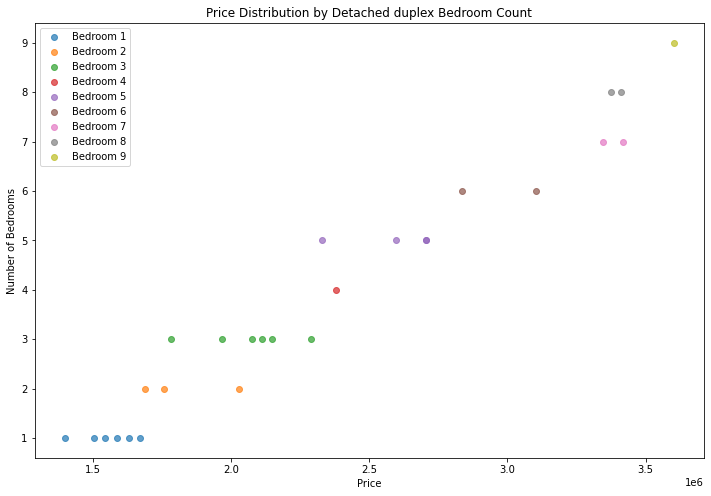



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  39.00000  34.00000      33.00000       40.00000
mean    4.51282   3.41176       3.57576  1765021.27865
std     2.59424   2.28457       1.32359   527051.46836
min     1.00000   1.00000       1.00000  1015336.69900
25%     2.00000   1.25000       3.00000  1374213.55175
50%     4.00000   2.00000       4.00000  1652420.54650
75%     6.00000   5.00000       4.00000  2131227.56175
max     9.00000   7.00000       6.00000  2803324.15500


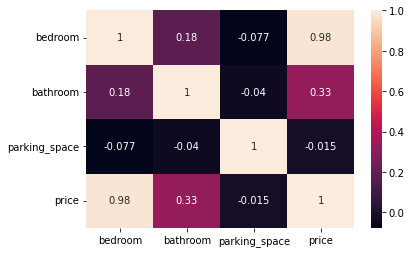

         loc      title  bedroom  bathroom  parking_space      price
23     Enugu  Apartment     1.00      1.00           4.00 1125336.33
8152   Enugu  Apartment     1.00       NaN           5.00 1015336.70
1869   Enugu  Apartment     1.00      5.00           6.00 1175155.48
3756   Enugu  Apartment     1.00      1.00           4.00 1094188.83
2498   Enugu  Apartment     2.00      1.00           4.00 1229582.34
8336   Enugu  Apartment     2.00      7.00           4.00 1380609.12
3182   Enugu  Apartment     2.00       NaN            NaN 1240504.40
8977   Enugu  Apartment     2.00      7.00           3.00 1357836.57
11065  Enugu  Apartment     2.00      2.00           2.00 1244004.31
7088   Enugu  Apartment     2.00      6.00            NaN 1369120.12
10222  Enugu  Apartment     2.00      1.00            NaN 1175039.78
7150   Enugu  Apartment     3.00      2.00           4.00 1398683.92
11780  Enugu  Apartment     3.00      4.00           3.00 1444434.48
12120  Enugu  Apartment     3.00  

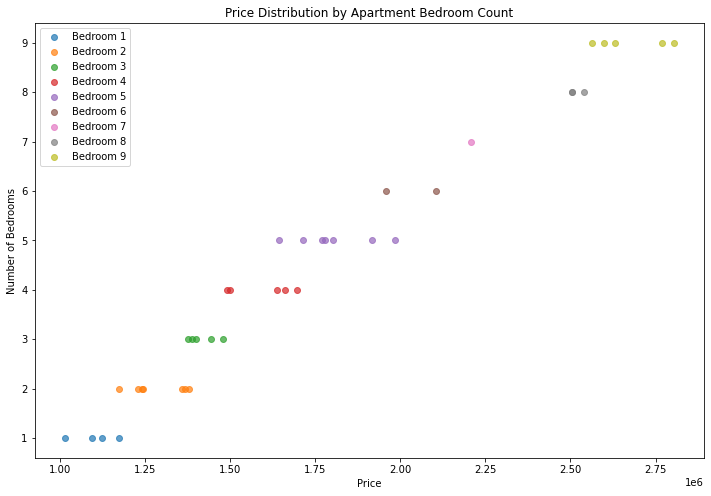



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  25.00000  24.00000      26.00000       28.00000
mean    5.08000   3.79167       3.19231  1980677.58454
std     2.66020   2.16653       1.74400   587868.21469
min     1.00000   1.00000       1.00000  1089534.79000
25%     3.00000   2.00000       2.00000  1466864.03675
50%     5.00000   3.00000       3.00000  1842425.34500
75%     7.00000   6.00000       5.00000  2517011.40500
max     9.00000   7.00000       6.00000  2936028.66800


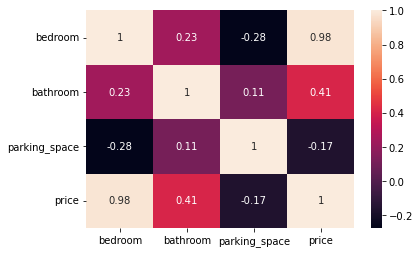

         loc     title  bedroom  bathroom  parking_space      price
1883   Enugu  Bungalow     1.00      2.00           2.00 1140146.74
10542  Enugu  Bungalow     1.00      2.00           5.00 1189590.72
6465   Enugu  Bungalow     1.00      6.00           5.00 1346214.98
5373   Enugu  Bungalow     2.00       NaN           1.00 1310082.27
10331  Enugu  Bungalow     2.00      5.00           2.00 1425394.56
11952  Enugu  Bungalow     3.00      3.00           2.00 1550402.34
8186   Enugu  Bungalow     3.00      1.00           2.00 1472090.21
7823   Enugu  Bungalow     3.00      7.00           5.00 1785103.93
12591  Enugu  Bungalow     4.00      2.00           6.00 1823463.42
13510  Enugu  Bungalow     4.00      1.00           2.00 1622528.57
4377   Enugu  Bungalow     4.00      2.00           3.00 1745386.09
2400   Enugu  Bungalow     4.00      7.00           6.00 2019243.75
13098  Enugu  Bungalow     5.00      2.00           3.00 1861387.27
11972  Enugu  Bungalow     6.00      2.00       

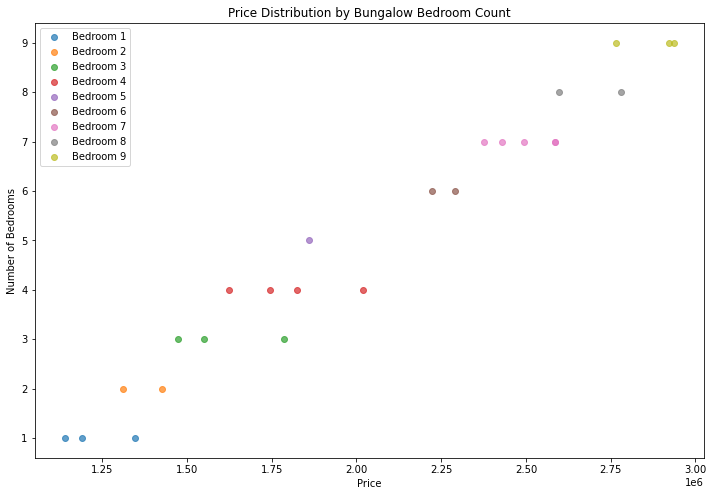



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  28.00000  26.00000      27.00000       32.00000
mean    4.53571   3.00000       3.29630  1846698.81484
std     2.38020   2.17256       1.48880   533336.47914
min     1.00000   1.00000       1.00000  1140636.93600
25%     3.75000   1.00000       2.00000  1428347.23750
50%     4.00000   2.00000       3.00000  1757072.33750
75%     5.25000   5.00000       4.00000  2043549.65225
max     9.00000   7.00000       6.00000  3027236.28200


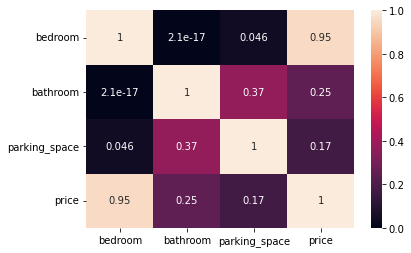

         loc title  bedroom  bathroom  parking_space      price
4537   Enugu  Flat     1.00      2.00           1.00 1194871.64
4160   Enugu  Flat     1.00       NaN           4.00 1140636.94
2105   Enugu  Flat     1.00      7.00           5.00 1385371.04
8622   Enugu  Flat     1.00      2.00           2.00 1147267.54
8773   Enugu  Flat     2.00      2.00           3.00 1381969.51
3642   Enugu  Flat     2.00      3.00           5.00 1425159.75
4817   Enugu  Flat     3.00      2.00            NaN 1537272.05
5963   Enugu  Flat     4.00      7.00           4.00 1967192.20
4344   Enugu  Flat     4.00       NaN           5.00 1797437.64
13987  Enugu  Flat     4.00      1.00           1.00 1485856.25
9829   Enugu  Flat     4.00      2.00           2.00 1680109.05
1491   Enugu  Flat     4.00      6.00           4.00 1928036.13
10563  Enugu  Flat     4.00      2.00           4.00 1627416.05
998    Enugu  Flat     4.00       NaN           3.00 1598775.41
182    Enugu  Flat     4.00      5.00   

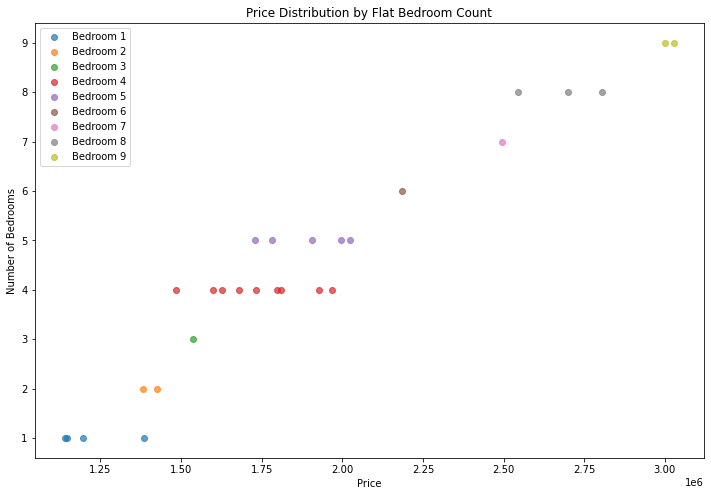



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  22.00000  26.00000      26.00000       30.00000
mean    3.90909   3.80769       2.96154  2074082.03633
std     2.04495   2.00038       1.66086   553709.31835
min     1.00000   1.00000       1.00000  1192142.06300
25%     2.00000   2.00000       2.00000  1642255.41600
50%     3.50000   4.00000       2.50000  1983731.03450
75%     5.00000   5.00000       4.00000  2433878.21550
max     8.00000   7.00000       6.00000  3223099.78700


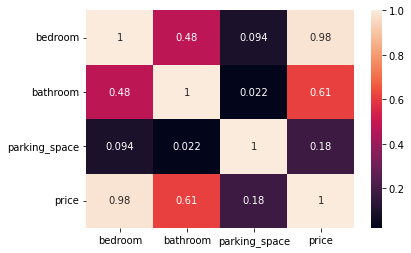

         loc           title  bedroom  bathroom  parking_space      price
424    Enugu  Terrace duplex     1.00      1.00           2.00 1192142.06
11669  Enugu  Terrace duplex     1.00      6.00            NaN 1505785.47
10466  Enugu  Terrace duplex     2.00      3.00           6.00 1613263.05
7159   Enugu  Terrace duplex     2.00       NaN           4.00 1456358.54
5551   Enugu  Terrace duplex     2.00      6.00            NaN 1628298.78
4352   Enugu  Terrace duplex     2.00      1.00           2.00 1436627.17
4793   Enugu  Terrace duplex     2.00      2.00           3.00 1431995.77
1063   Enugu  Terrace duplex     3.00      7.00            NaN 2006722.59
576    Enugu  Terrace duplex     3.00      6.00           3.00 1874835.03
12611  Enugu  Terrace duplex     3.00      2.00           3.00 1700612.94
3174   Enugu  Terrace duplex     3.00      3.00           1.00 1684125.31
8736   Enugu  Terrace duplex     4.00      1.00           4.00 1742817.86
13298  Enugu  Terrace duplex     4.00 

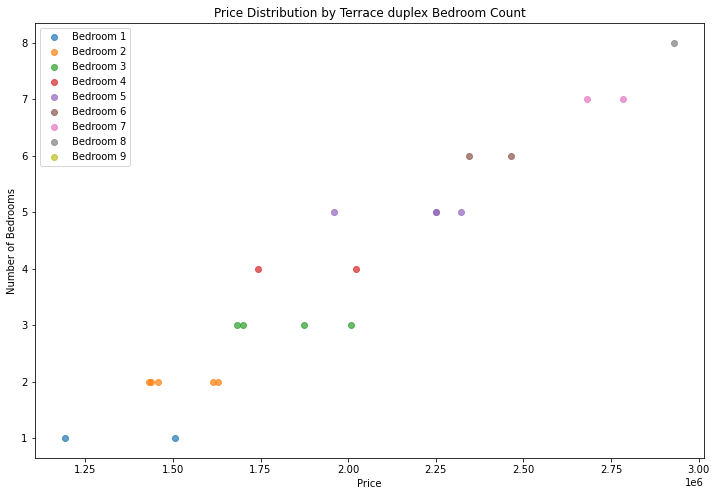



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  20.00000  23.00000      25.00000       28.00000
mean    3.85000   3.04348       3.40000  1980639.25600
std     2.73909   1.91829       1.60728   669533.50299
min     1.00000   1.00000       1.00000  1285532.60200
25%     1.75000   1.50000       2.00000  1346741.96700
50%     3.00000   3.00000       4.00000  1860962.70750
75%     6.25000   4.00000       4.00000  2451656.01675
max     9.00000   7.00000       6.00000  3296429.35700


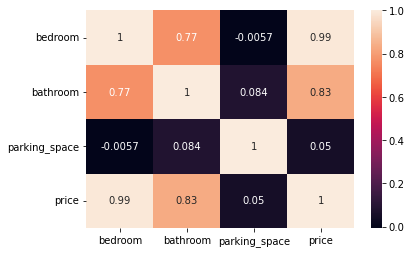

         loc                 title  bedroom  bathroom  parking_space  \
382    Enugu  Semi-detached duplex     1.00      3.00           4.00   
12641  Enugu  Semi-detached duplex     1.00      2.00           1.00   
8627   Enugu  Semi-detached duplex     1.00      1.00           5.00   
4514   Enugu  Semi-detached duplex     1.00      3.00           2.00   
7311   Enugu  Semi-detached duplex     1.00      2.00           4.00   
299    Enugu  Semi-detached duplex     2.00      1.00           3.00   
8500   Enugu  Semi-detached duplex     2.00      1.00           1.00   
6825   Enugu  Semi-detached duplex     2.00      7.00            NaN   
7245   Enugu  Semi-detached duplex     2.00       NaN           5.00   
13653  Enugu  Semi-detached duplex     3.00      4.00            NaN   
13879  Enugu  Semi-detached duplex     3.00       NaN           4.00   
4488   Enugu  Semi-detached duplex     4.00      1.00           4.00   
10559  Enugu  Semi-detached duplex     4.00      2.00           

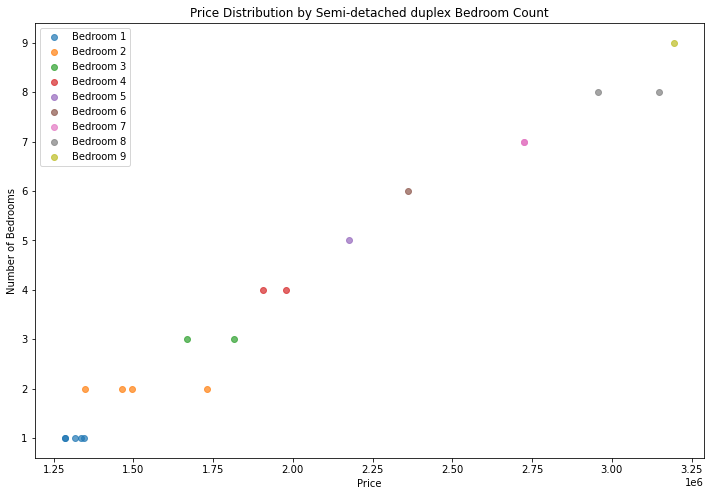



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  23.00000  26.00000      28.00000       32.00000
mean    4.00000   3.30769       3.50000  2248383.60578
std     2.67989   2.05464       1.66667   663483.64828
min     1.00000   1.00000       1.00000  1362705.44900
25%     2.00000   1.25000       2.00000  1678821.44800
50%     3.00000   3.00000       3.50000  2165241.44600
75%     6.00000   4.75000       5.00000  2627511.37000
max     9.00000   7.00000       6.00000  3566150.74900


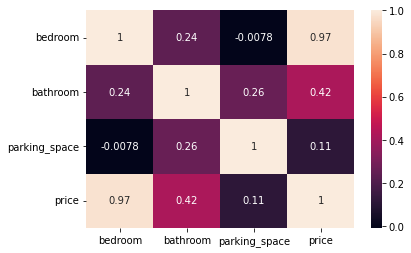

         loc      title  bedroom  bathroom  parking_space      price
12312  Enugu  Townhouse     1.00      7.00           4.00 1681768.83
2671   Enugu  Townhouse     1.00      1.00            NaN 1362705.45
5867   Enugu  Townhouse     1.00      2.00           1.00 1429307.34
6027   Enugu  Townhouse     1.00      2.00           2.00 1371978.98
11688  Enugu  Townhouse     1.00      1.00           4.00 1407879.45
6945   Enugu  Townhouse     2.00      3.00            NaN 1645211.70
1793   Enugu  Townhouse     2.00      6.00           5.00 1889643.60
2811   Enugu  Townhouse     2.00      1.00           3.00 1683925.31
2827   Enugu  Townhouse     2.00      1.00           3.00 1669979.31
11707  Enugu  Townhouse     2.00       NaN           5.00 1938588.68
7315   Enugu  Townhouse     3.00      7.00           5.00 2169783.27
9940   Enugu  Townhouse     3.00      2.00           4.00 1872473.61
2329   Enugu  Townhouse     5.00      1.00           2.00 2045921.63
3649   Enugu  Townhouse     5.00  

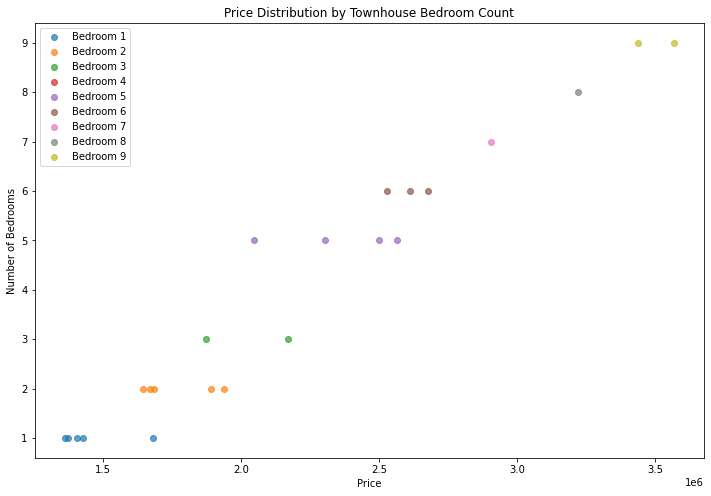



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  30.00000  23.00000      27.00000       32.00000
mean    4.36667   4.00000       3.59259  2846037.39184
std     2.39947   2.39317       1.55066   713035.89845
min     1.00000   1.00000       1.00000  1910889.73900
25%     2.25000   1.50000       2.00000  2278393.36800
50%     4.00000   4.00000       4.00000  2802093.65150
75%     5.75000   6.50000       5.00000  3243830.75025
max     9.00000   7.00000       6.00000  4459106.21600


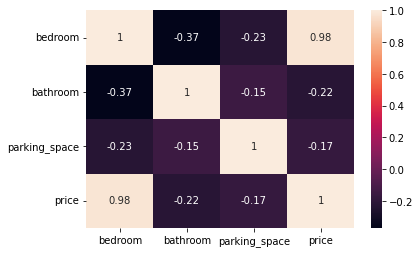

         loc      title  bedroom  bathroom  parking_space      price
2738   Enugu  Penthouse     1.00      3.00           4.00 1910889.74
3223   Enugu  Penthouse     1.00       NaN           4.00 2132087.43
5865   Enugu  Penthouse     1.00       NaN           2.00 1953255.99
7288   Enugu  Penthouse     2.00      7.00           6.00 2516087.57
11734  Enugu  Penthouse     2.00       NaN           2.00 1965148.40
10618  Enugu  Penthouse     2.00      2.00           4.00 2416336.25
12987  Enugu  Penthouse     2.00      1.00           6.00 2134315.93
13333  Enugu  Penthouse     2.00       NaN           1.00 2050113.73
8240   Enugu  Penthouse     3.00      4.00           3.00 2471332.69
10128  Enugu  Penthouse     3.00       NaN           6.00 2598208.34
7206   Enugu  Penthouse     3.00      6.00           3.00 2598589.90
2683   Enugu  Penthouse     3.00       NaN           4.00 2326419.18
4863   Enugu  Penthouse     4.00      4.00           2.00 2706841.52
10799  Enugu  Penthouse     4.00  

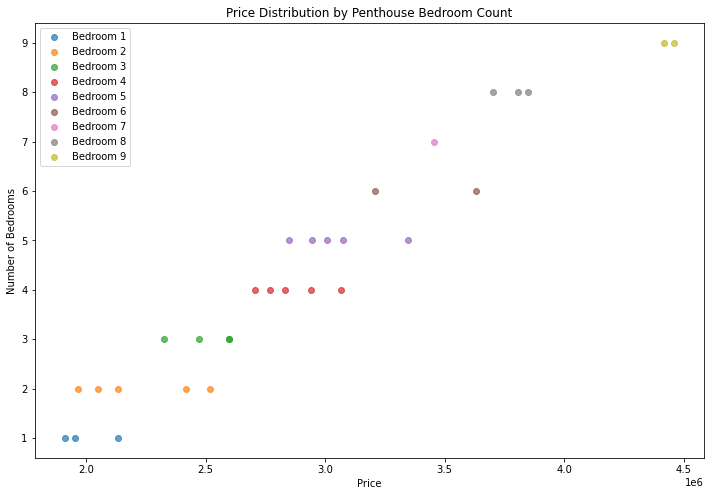



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  5.00000  7.00000       8.00000        9.00000
mean   2.60000  1.57143       2.75000  1492114.25900
std    1.34164  0.53452       1.38873   295962.95444
min    1.00000  1.00000       1.00000  1110824.55400
25%    2.00000  1.00000       1.75000  1248406.57800
50%    2.00000  2.00000       3.00000  1461153.18800
75%    4.00000  2.00000       4.00000  1812661.57200
max    4.00000  2.00000       4.00000  1880200.27200


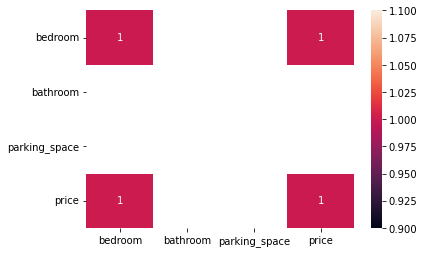

         loc    title  bedroom  bathroom  parking_space      price
3604   Enugu  Cottage     1.00       NaN           1.00 1248406.58
2691   Enugu  Cottage     2.00       NaN           1.00 1461153.19
12277  Enugu  Cottage     2.00      2.00           4.00 1501315.46
1661   Enugu  Cottage     4.00      2.00           4.00 1880200.27
7943   Enugu  Cottage     4.00      2.00            NaN 1812661.57
5537   Enugu  Cottage      NaN      2.00           2.00 1110824.55
5613   Enugu  Cottage      NaN      1.00           4.00 1378366.23
10903  Enugu  Cottage      NaN      1.00           4.00 1180938.43
10992  Enugu  Cottage      NaN      1.00           2.00 1855162.05


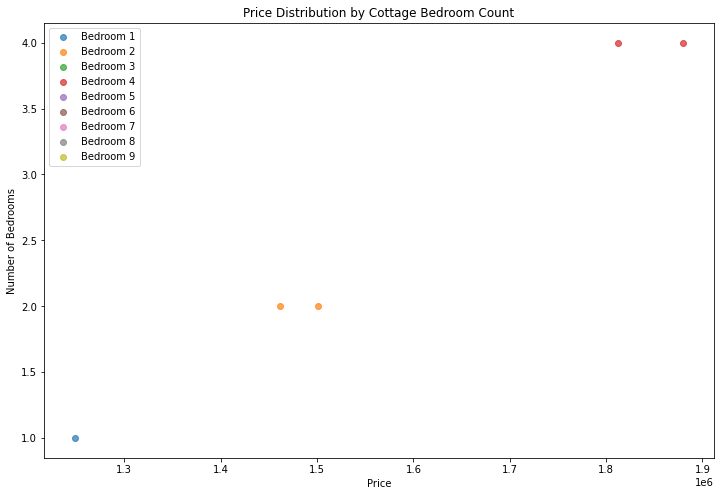

In [255]:
#Enugu
Enugu = housing_train[housing_train["loc" ] == "Enugu"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Enugu, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  22.00000  24.00000      25.00000       29.00000
mean    5.13636   3.33333       3.20000  3390407.56883
std     2.60577   2.11961       1.50000  1124843.08331
min     1.00000   1.00000       1.00000  1278656.31400
25%     3.00000   2.00000       2.00000  2649620.01100
50%     5.50000   2.00000       3.00000  3770423.50100
75%     7.75000   5.25000       4.00000  4245696.95600
max     9.00000   7.00000       6.00000  4719637.36900


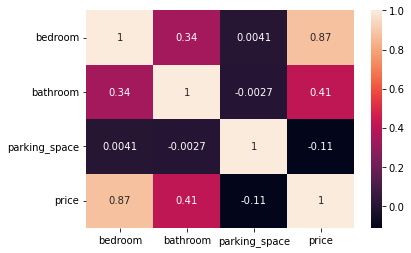

         loc    title  bedroom  bathroom  parking_space      price
10214  Niger  Mansion     1.00      2.00           2.00 1335344.63
3548   Niger  Mansion     1.00      1.00           4.00 1278656.31
7871   Niger  Mansion     2.00      2.00           1.00 3601006.02
3456   Niger  Mansion     2.00      6.00           5.00 2791884.30
455    Niger  Mansion     3.00       NaN           1.00 1561050.75
8626   Niger  Mansion     3.00      2.00           2.00 3770423.50
7143   Niger  Mansion     3.00      1.00           5.00 2723570.40
5588   Niger  Mansion     3.00      1.00            NaN 2575223.49
3056   Niger  Mansion     4.00       NaN           4.00 4099207.31
13887  Niger  Mansion     5.00      6.00           5.00 3716207.73
4475   Niger  Mansion     5.00       NaN           1.00 4245696.96
11327  Niger  Mansion     6.00      1.00           4.00 3610043.34
6631   Niger  Mansion     6.00      7.00           3.00 4006973.52
8868   Niger  Mansion     6.00      6.00           3.00 393257

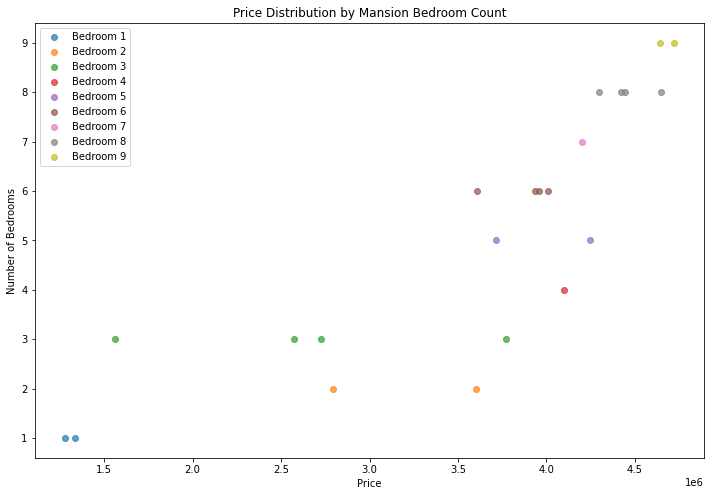



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  27.00000  31.00000      25.00000       32.00000
mean    4.14815   3.35484       2.76000  1938610.92569
std     2.46051   1.90698       1.56205   609426.09538
min     1.00000   1.00000       1.00000  1192495.11000
25%     2.00000   2.00000       2.00000  1494471.61600
50%     3.00000   3.00000       2.00000  1701089.69650
75%     6.00000   5.00000       4.00000  2442429.43700
max     9.00000   7.00000       6.00000  3199730.39700


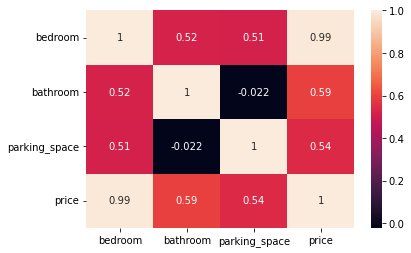

         loc            title  bedroom  bathroom  parking_space      price
9640   Niger  Detached duplex     1.00      2.00           1.00 1192495.11
9584   Niger  Detached duplex     1.00       NaN           2.00 1258161.99
9493   Niger  Detached duplex     1.00      2.00           3.00 1209810.42
12432  Niger  Detached duplex     2.00      2.00           1.00 1460530.34
1253   Niger  Detached duplex     2.00      2.00           3.00 1496196.52
10935  Niger  Detached duplex     2.00      3.00            NaN 1523590.84
4989   Niger  Detached duplex     2.00      1.00            NaN 1355440.30
5513   Niger  Detached duplex     2.00      1.00            NaN 1371639.58
9254   Niger  Detached duplex     2.00      2.00           2.00 1496299.59
13107  Niger  Detached duplex     3.00      3.00           3.00 1709432.27
3639   Niger  Detached duplex     3.00      2.00           2.00 1637732.24
9293   Niger  Detached duplex     3.00      6.00            NaN 1810018.93
13004  Niger  Detached du

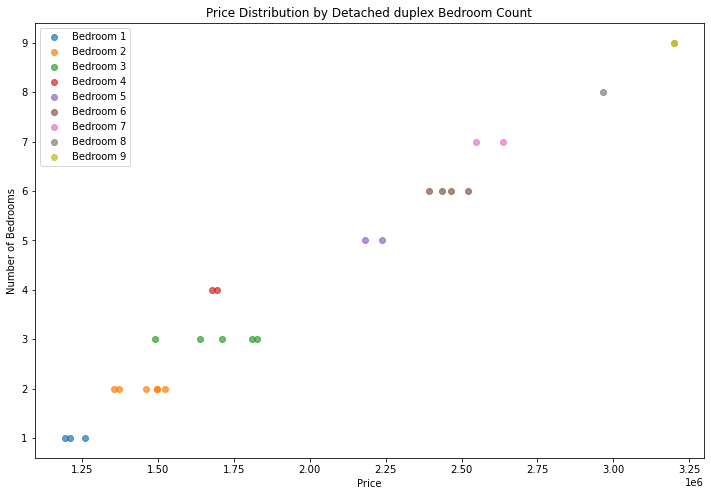



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  27.00000  34.00000      31.00000       36.00000
mean    4.62963   3.35294       3.48387  1491484.68475
std     2.83044   1.98299       1.58894   508768.02443
min     1.00000   1.00000       1.00000   835390.76990
25%     2.50000   2.00000       2.50000  1084683.93800
50%     4.00000   2.50000       4.00000  1276767.24650
75%     7.00000   4.75000       4.50000  1930220.05550
max     9.00000   7.00000       6.00000  2380374.55800


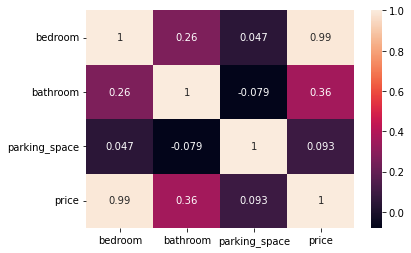

         loc      title  bedroom  bathroom  parking_space      price
11672  Niger  Apartment     1.00      2.00           4.00  835390.77
10984  Niger  Apartment     1.00      2.00           4.00  961627.19
7050   Niger  Apartment     1.00      7.00            NaN 1008873.08
4941   Niger  Apartment     1.00      5.00           3.00  899400.47
1547   Niger  Apartment     2.00      1.00           4.00  967465.79
1648   Niger  Apartment     2.00      4.00           5.00 1071390.67
8633   Niger  Apartment     2.00      2.00           3.00 1002852.32
215    Niger  Apartment     3.00      3.00           6.00 1232069.78
12134  Niger  Apartment     3.00      1.00            NaN 1097272.03
6863   Niger  Apartment     3.00      2.00            NaN 1186442.49
5281   Niger  Apartment     3.00      2.00           1.00 1177260.75
5698   Niger  Apartment     3.00      7.00           3.00 1287052.63
4785   Niger  Apartment     3.00       NaN           1.00 1089115.03
9298   Niger  Apartment     4.00  

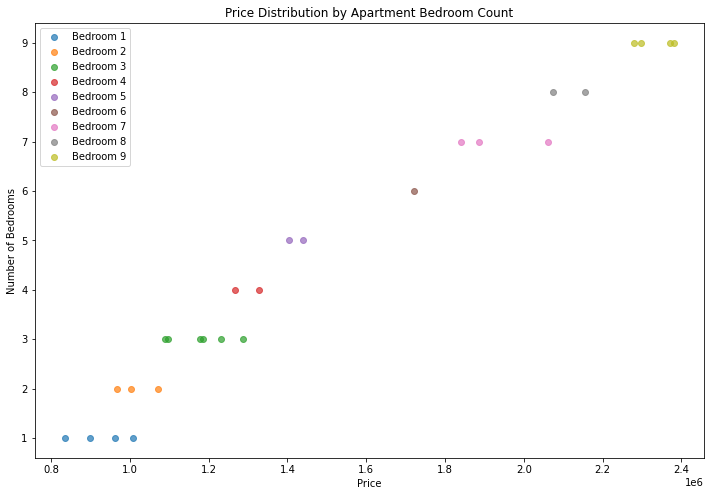



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  25.00000  26.00000      27.00000       29.00000
mean    4.44000   4.00000       3.29630  1646035.96245
std     2.21886   2.33238       1.70553   445728.74373
min     1.00000   1.00000       1.00000   930884.84310
25%     3.00000   2.00000       2.00000  1285836.04100
50%     5.00000   3.50000       3.00000  1612811.32600
75%     6.00000   6.00000       5.00000  1951550.02200
max     9.00000   7.00000       6.00000  2533267.15900


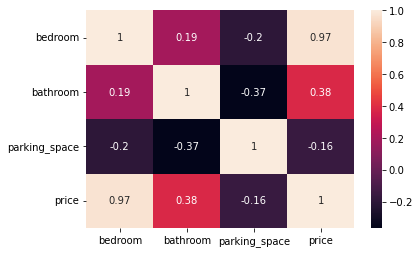

         loc     title  bedroom  bathroom  parking_space      price
2910   Niger  Bungalow     1.00      3.00           4.00  976107.01
4117   Niger  Bungalow     1.00      1.00            NaN  930884.84
6936   Niger  Bungalow     2.00      1.00           6.00 1129211.78
8734   Niger  Bungalow     2.00      3.00           5.00 1171040.86
12585  Niger  Bungalow     2.00      7.00           1.00 1213057.79
2901   Niger  Bungalow     2.00       NaN           2.00 1202553.56
6116   Niger  Bungalow     3.00      7.00           1.00 1394077.98
4906   Niger  Bungalow     3.00      1.00           2.00 1224966.12
4147   Niger  Bungalow     3.00      4.00           3.00 1341744.66
8940   Niger  Bungalow     3.00      6.00            NaN 1383573.74
13189  Niger  Bungalow     4.00      7.00           5.00 1663174.76
6640   Niger  Bungalow     4.00      7.00           4.00 1642354.15
2157   Niger  Bungalow     5.00       NaN           3.00 1811076.83
5877   Niger  Bungalow     5.00      1.00       

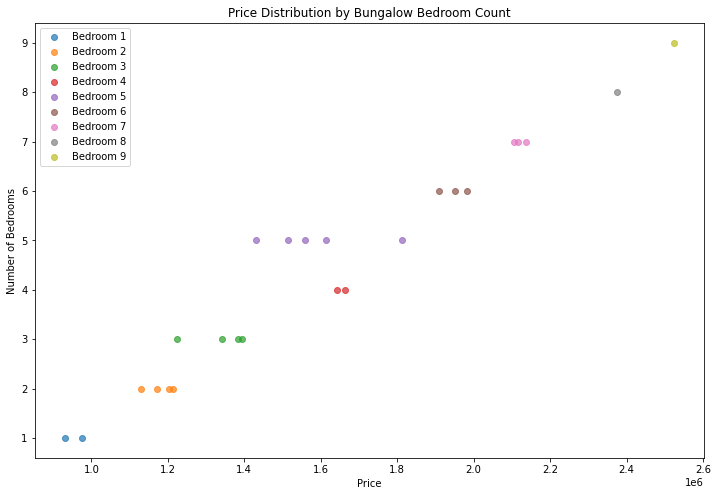



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  32.00000  29.00000      31.00000       36.00000
mean    4.18750   3.48276       3.48387  1526101.43084
std     2.63277   2.33942       1.45765   509218.89915
min     1.00000   1.00000       1.00000   913645.15390
25%     2.00000   2.00000       3.00000  1100234.22975
50%     4.00000   2.00000       3.00000  1397557.70300
75%     6.00000   6.00000       4.00000  1885163.34600
max     9.00000   7.00000       6.00000  2554463.47000


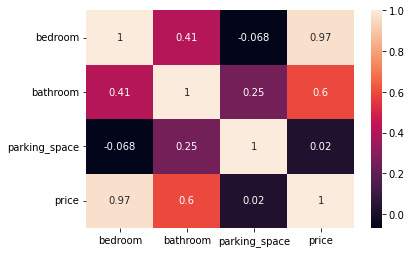

         loc title  bedroom  bathroom  parking_space      price
11311  Niger  Flat     1.00      5.00            NaN 1080397.96
1054   Niger  Flat     1.00      2.00           2.00  966310.20
13169  Niger  Flat     1.00       NaN            NaN  973199.80
4938   Niger  Flat     1.00      7.00           6.00 1143047.66
11925  Niger  Flat     1.00      3.00            NaN  913645.15
9487   Niger  Flat     2.00      2.00           3.00 1098074.77
10750  Niger  Flat     2.00      3.00           3.00 1129399.62
6269   Niger  Flat     2.00      1.00           3.00 1100954.05
7192   Niger  Flat     2.00      1.00           1.00 1025108.68
7809   Niger  Flat     2.00      2.00           3.00 1098074.77
1600   Niger  Flat     2.00      2.00           4.00 1056361.17
468    Niger  Flat     2.00      7.00           2.00 1233878.42
11631  Niger  Flat     2.00       NaN           5.00 1202365.72
6070   Niger  Flat     3.00      1.00           4.00 1197816.98
1342   Niger  Flat     3.00      2.00   

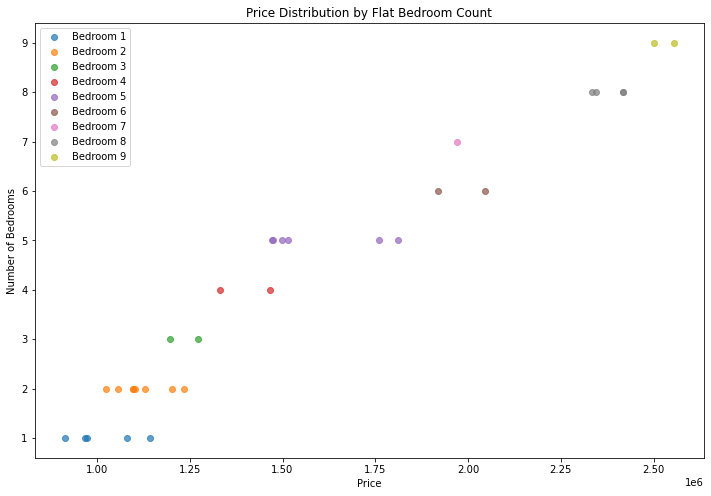



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  33.00000  34.00000      36.00000       40.00000
mean    3.84848   2.85294       2.63889  1635045.39954
std     2.43825   1.94051       1.29069   541445.19184
min     1.00000   1.00000       1.00000   965167.27920
25%     2.00000   1.00000       2.00000  1183635.41800
50%     3.00000   2.00000       2.00000  1455135.55750
75%     6.00000   4.75000       3.00000  2124246.53750
max     9.00000   7.00000       6.00000  2753006.84000


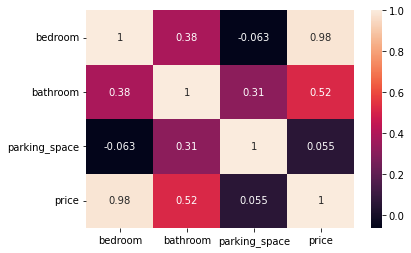

         loc           title  bedroom  bathroom  parking_space      price
5891   Niger  Terrace duplex     1.00      1.00           2.00  965167.28
12307  Niger  Terrace duplex     1.00      1.00            NaN 1093763.65
4931   Niger  Terrace duplex     1.00       NaN           4.00 1058680.88
4450   Niger  Terrace duplex     1.00      1.00           2.00  991016.14
13580  Niger  Terrace duplex     1.00      3.00           6.00 1136260.40
2152   Niger  Terrace duplex     1.00      1.00           2.00  972086.70
2170   Niger  Terrace duplex     1.00      2.00           2.00 1007327.16
3462   Niger  Terrace duplex     2.00      1.00           3.00 1192502.33
10012  Niger  Terrace duplex     2.00       NaN           5.00 1368581.22
8078   Niger  Terrace duplex     2.00      2.00           1.00 1157034.69
13495  Niger  Terrace duplex     2.00      5.00            NaN 1345158.03
682    Niger  Terrace duplex     2.00      2.00           2.00 1254437.35
3846   Niger  Terrace duplex     2.00 

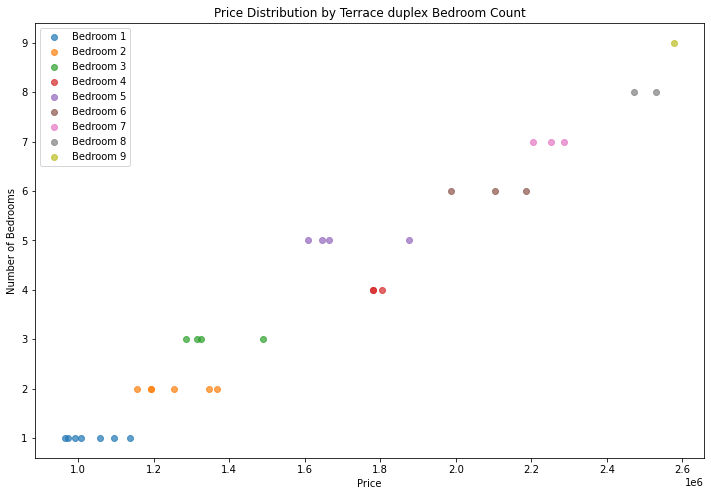



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  20.00000  23.00000      21.00000       28.00000
mean    3.45000   2.56522       3.19048  1559327.17924
std     1.98614   1.94997       1.69172   447448.63837
min     1.00000   1.00000       1.00000   995509.89480
25%     2.00000   1.00000       2.00000  1269616.08775
50%     3.00000   2.00000       3.00000  1493323.75300
75%     4.25000   3.00000       4.00000  1718387.97100
max     9.00000   7.00000       6.00000  2740978.25100


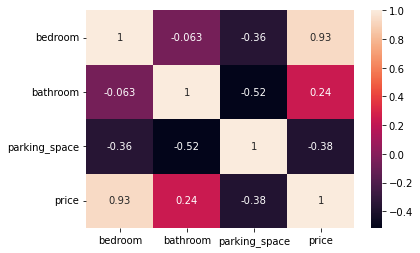

         loc                 title  bedroom  bathroom  parking_space  \
13052  Niger  Semi-detached duplex     1.00       NaN           4.00   
11574  Niger  Semi-detached duplex     1.00       NaN           3.00   
10880  Niger  Semi-detached duplex     1.00      1.00           4.00   
6815   Niger  Semi-detached duplex     1.00      7.00            NaN   
2141   Niger  Semi-detached duplex     2.00      1.00            NaN   
12657  Niger  Semi-detached duplex     2.00      1.00           3.00   
8879   Niger  Semi-detached duplex     3.00      1.00           5.00   
4067   Niger  Semi-detached duplex     3.00      2.00            NaN   
3222   Niger  Semi-detached duplex     3.00      7.00           1.00   
2089   Niger  Semi-detached duplex     3.00      2.00            NaN   
826    Niger  Semi-detached duplex     3.00      1.00           2.00   
2465   Niger  Semi-detached duplex     4.00       NaN           2.00   
2136   Niger  Semi-detached duplex     4.00      2.00           

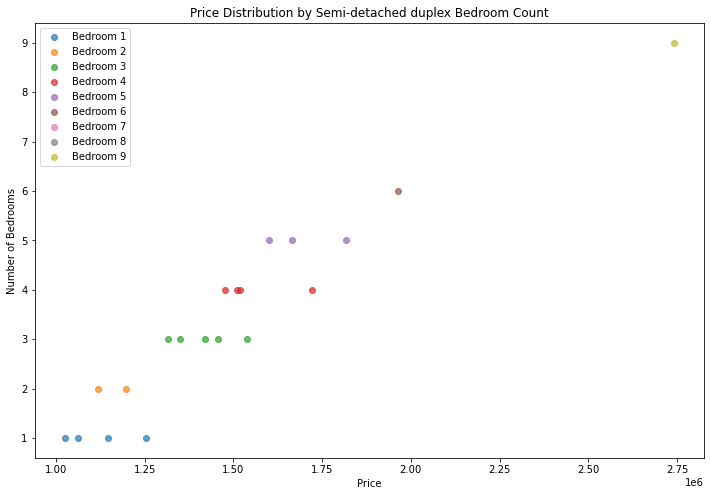



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  26.00000  28.00000      28.00000       32.00000
mean    4.80769   3.00000       3.21429  1939289.91466
std     2.43342   2.17732       1.52406   556070.37686
min     1.00000   1.00000       1.00000  1046331.55200
25%     3.00000   1.00000       2.00000  1592106.09100
50%     5.00000   2.00000       3.00000  1759413.98750
75%     6.00000   5.25000       4.00000  2345067.25600
max     9.00000   7.00000       6.00000  3066157.54100


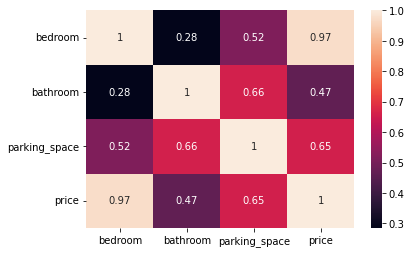

         loc      title  bedroom  bathroom  parking_space      price
7810   Niger  Townhouse     1.00      2.00           3.00 1121308.39
1571   Niger  Townhouse     1.00      1.00           3.00 1184712.94
6028   Niger  Townhouse     1.00      1.00           1.00 1046331.55
13475  Niger  Townhouse     2.00      6.00           5.00 1542627.95
6217   Niger  Townhouse     2.00      1.00           1.00 1242744.52
11480  Niger  Townhouse     3.00      5.00           4.00 1680766.02
5312   Niger  Townhouse     3.00      1.00            NaN 1423193.69
3440   Niger  Townhouse     3.00      6.00           2.00 1667870.54
11433  Niger  Townhouse     4.00      2.00            NaN 1634786.61
4542   Niger  Townhouse     4.00      1.00            NaN 1664896.75
797    Niger  Townhouse     4.00      1.00           3.00 1601708.85
406    Niger  Townhouse     4.00      2.00           3.00 1680463.35
3895   Niger  Townhouse     5.00      1.00           1.00 1704737.60
2134   Niger  Townhouse     5.00  

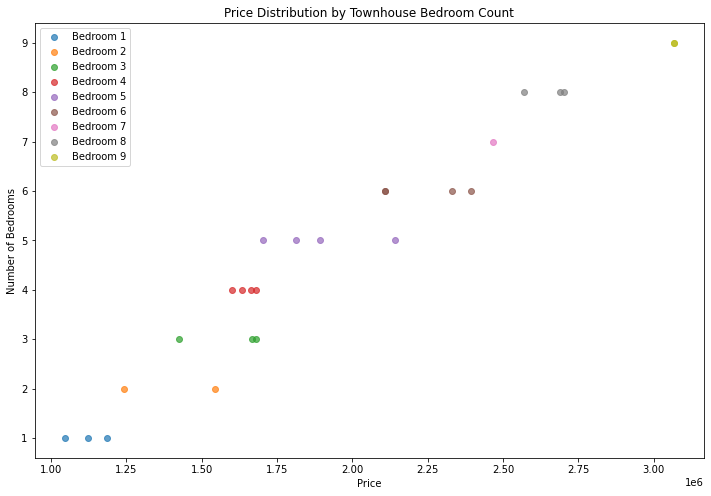



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  20.00000  23.00000      25.00000       27.00000
mean    3.95000   3.34783       3.40000  2216740.58130
std     2.25890   1.96813       1.58114   501358.49484
min     1.00000   1.00000       1.00000  1576475.50500
25%     2.75000   2.00000       2.00000  1826493.26900
50%     3.50000   3.00000       4.00000  2145218.61200
75%     5.25000   5.00000       5.00000  2603397.62350
max     8.00000   7.00000       6.00000  3367367.76600


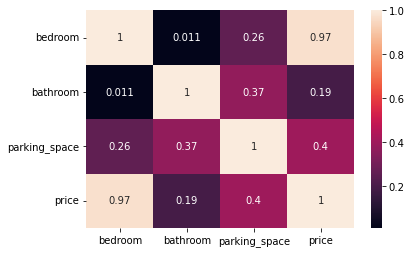

         loc      title  bedroom  bathroom  parking_space      price
9782   Niger  Penthouse     1.00       NaN           4.00 1745212.97
11851  Niger  Penthouse     1.00      1.00           2.00 1623143.20
4432   Niger  Penthouse     1.00      3.00           5.00 1576475.50
1965   Niger  Penthouse     1.00       NaN           4.00 1631871.43
12700  Niger  Penthouse     2.00      2.00           1.00 1662946.96
11360  Niger  Penthouse     3.00      5.00           5.00 2144913.36
8018   Niger  Penthouse     3.00      7.00           2.00 2145218.61
113    Niger  Penthouse     3.00      1.00            NaN 1975135.33
1529   Niger  Penthouse     3.00      6.00           6.00 2229649.75
6806   Niger  Penthouse     3.00      3.00           1.00 1907773.56
7290   Niger  Penthouse     4.00       NaN           2.00 2095183.96
9697   Niger  Penthouse     4.00      2.00           2.00 2269604.73
1861   Niger  Penthouse     5.00      1.00           2.00 2257078.60
1521   Niger  Penthouse     5.00  

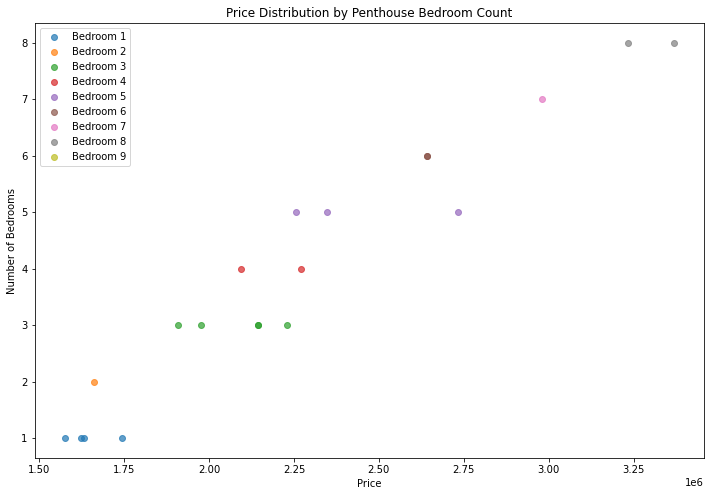



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  6.00000  6.00000       7.00000        8.00000
mean   3.33333  1.50000       2.00000  1233016.20701
std    1.63299  0.54772       1.15470   281023.93708
min    1.00000  1.00000       1.00000   815145.93010
25%    2.25000  1.00000       1.00000  1087708.92375
50%    3.50000  1.50000       2.00000  1178303.03000
75%    4.75000  2.00000       2.50000  1363406.24250
max    5.00000  2.00000       4.00000  1646492.41300


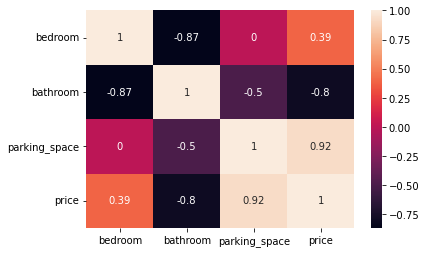

         loc    title  bedroom  bathroom  parking_space      price
9572   Niger  Cottage     1.00      2.00           1.00 1051838.32
8040   Niger  Cottage     2.00      2.00            NaN 1215373.13
11953  Niger  Cottage     3.00      1.00           4.00 1279621.92
3907   Niger  Cottage     4.00       NaN           3.00 1099665.79
7001   Niger  Cottage     5.00       NaN           2.00 1646492.41
10621  Niger  Cottage     5.00      1.00           1.00 1141232.93
3240   Niger  Cottage      NaN      2.00           2.00  815145.93
12892  Niger  Cottage      NaN      1.00           1.00 1614759.23


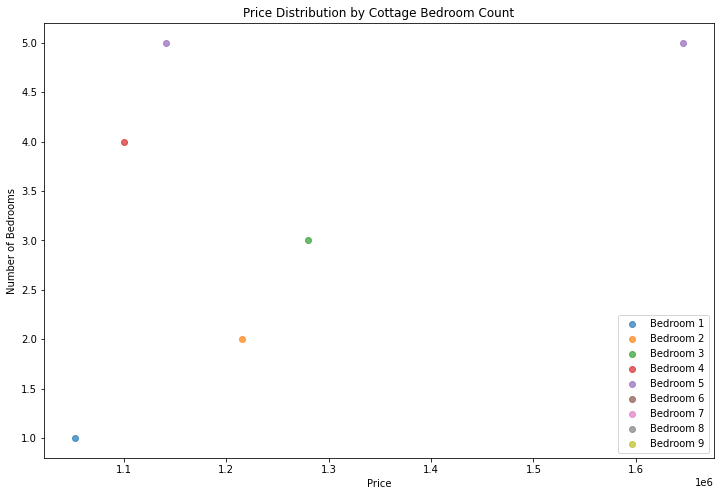

In [256]:
#Niger
Niger = housing_train[housing_train["loc" ] == "Niger"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Niger, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  20.00000  22.00000      23.00000       27.00000
mean    3.95000   4.04545       3.39130  3876517.08163
std     2.37254   2.39995       1.58800   973905.98888
min     1.00000   1.00000       1.00000  1402593.14300
25%     1.75000   2.00000       2.50000  3326485.36100
50%     4.00000   4.00000       3.00000  3993454.90500
75%     5.25000   6.00000       5.00000  4659234.25100
max     9.00000   7.00000       6.00000  5339469.02000


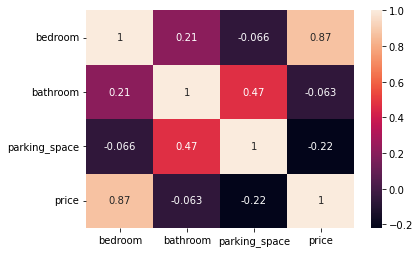

            loc    title  bedroom  bathroom  parking_space      price
983    Nasarawa  Mansion     1.00      6.00           5.00 2798306.46
2267   Nasarawa  Mansion     1.00      2.00           1.00 3670473.11
7645   Nasarawa  Mansion     1.00       NaN           2.00 1402593.14
3213   Nasarawa  Mansion     1.00      6.00           6.00 2853936.56
6703   Nasarawa  Mansion     1.00      3.00           3.00 2435958.01
861    Nasarawa  Mansion     2.00      7.00            NaN 3038354.98
6939   Nasarawa  Mansion     3.00      1.00           4.00 4099201.93
6757   Nasarawa  Mansion     3.00      5.00           4.00 3312372.65
558    Nasarawa  Mansion     4.00      6.00           5.00 3786642.62
11454  Nasarawa  Mansion     4.00      1.00           3.00 4822242.71
4854   Nasarawa  Mansion     4.00      2.00           3.00 3340598.07
3080   Nasarawa  Mansion     4.00       NaN           3.00 3591686.35
2821   Nasarawa  Mansion     5.00      7.00            NaN 4153381.40
11271  Nasarawa  Man

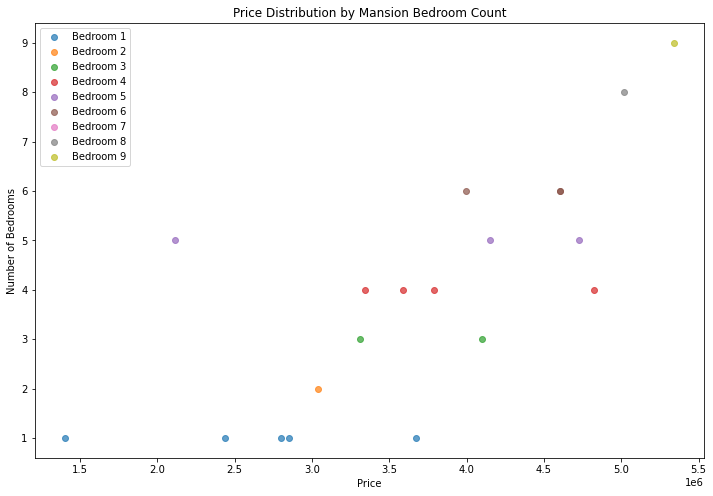



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  24.00000  23.00000      24.00000       27.00000
mean    4.54167   3.30435       3.45833  2284452.00378
std     2.16653   2.20402       1.14129   555835.37136
min     2.00000   1.00000       1.00000  1504562.62800
25%     2.00000   1.00000       3.00000  1798612.09750
50%     4.50000   2.00000       4.00000  2240067.96000
75%     6.25000   5.00000       4.00000  2857909.16500
max     9.00000   7.00000       6.00000  3280968.70900


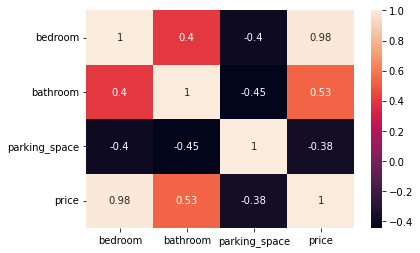

            loc            title  bedroom  bathroom  parking_space      price
5103   Nasarawa  Detached duplex     2.00      1.00           4.00 1579153.50
11757  Nasarawa  Detached duplex     2.00      1.00           4.00 1673732.16
10366  Nasarawa  Detached duplex     2.00      1.00           3.00 1552079.10
2973   Nasarawa  Detached duplex     2.00      2.00           4.00 1558451.84
5507   Nasarawa  Detached duplex     2.00      5.00           3.00 1759423.39
3835   Nasarawa  Detached duplex     2.00       NaN           2.00 1504562.63
10104  Nasarawa  Detached duplex     2.00      1.00           6.00 1662221.56
11143  Nasarawa  Detached duplex     3.00       NaN           4.00 1837800.80
10740  Nasarawa  Detached duplex     4.00      6.00           2.00 2240067.96
6792   Nasarawa  Detached duplex     4.00      2.00           4.00 1993224.90
3255   Nasarawa  Detached duplex     4.00      2.00           4.00 2098599.51
10118  Nasarawa  Detached duplex     4.00      1.00            N

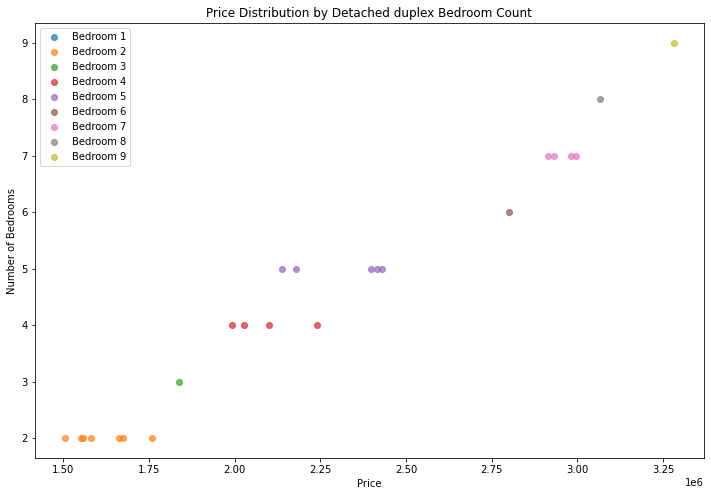



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  22.00000  27.00000      27.00000       32.00000
mean    4.31818   2.74074       3.37037  1582506.55034
std     2.21222   1.76706       1.75736   459152.05663
min     1.00000   1.00000       1.00000   919619.39360
25%     2.00000   1.00000       2.00000  1191302.57025
50%     5.00000   2.00000       3.00000  1569087.58450
75%     6.00000   4.00000       5.00000  1903842.46675
max     9.00000   7.00000       6.00000  2455972.57300


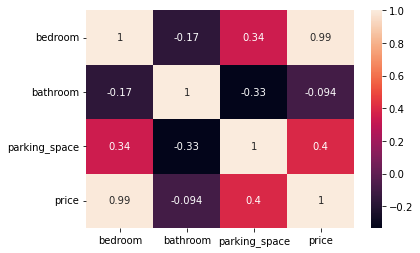

            loc      title  bedroom  bathroom  parking_space      price
2639   Nasarawa  Apartment     1.00      2.00           2.00  919619.39
10909  Nasarawa  Apartment     2.00      3.00           6.00 1175653.73
1090   Nasarawa  Apartment     2.00      1.00           4.00 1147010.65
9542   Nasarawa  Apartment     2.00      4.00           1.00 1104012.65
9288   Nasarawa  Apartment     2.00      1.00            NaN 1142415.25
7074   Nasarawa  Apartment     2.00      7.00           1.00 1196518.85
5469   Nasarawa  Apartment     2.00      1.00            NaN 1119644.11
2642   Nasarawa  Apartment     3.00       NaN            NaN 1198820.33
3750   Nasarawa  Apartment     3.00      1.00           3.00 1232123.48
5850   Nasarawa  Apartment     3.00      1.00           4.00 1299224.70
9270   Nasarawa  Apartment     5.00      3.00           2.00 1645869.13
6068   Nasarawa  Apartment     5.00      1.00            NaN 1589721.78
5707   Nasarawa  Apartment     5.00       NaN           2.00 155

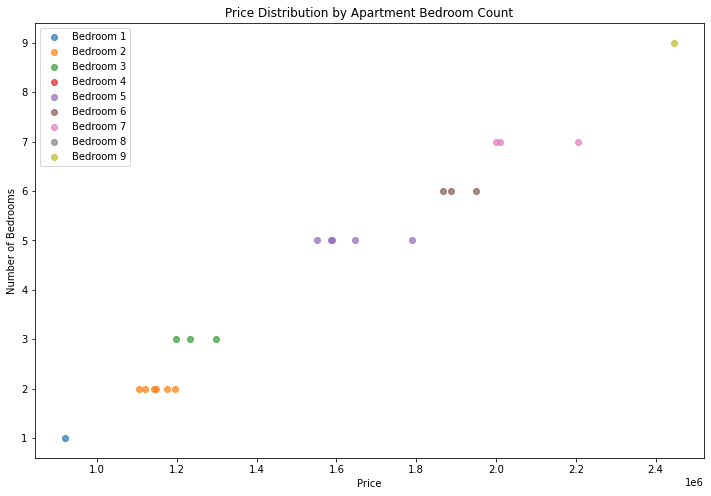



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  27.00000  27.00000      23.00000       31.00000
mean    3.88889   3.07407       4.00000  1655135.34668
std     2.10006   2.05550       1.53741   440891.16659
min     1.00000   1.00000       1.00000  1018018.29900
25%     2.50000   1.00000       3.50000  1264201.99000
50%     4.00000   3.00000       4.00000  1525510.81200
75%     5.00000   4.50000       5.00000  1923273.82450
max     9.00000   7.00000       6.00000  2647074.13600


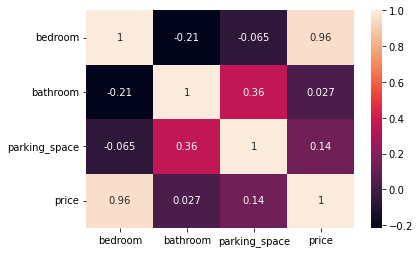

            loc     title  bedroom  bathroom  parking_space      price
13771  Nasarawa  Bungalow     1.00      7.00           4.00 1230375.85
290    Nasarawa  Bungalow     1.00      1.00            NaN 1018018.30
10544  Nasarawa  Bungalow     1.00      6.00            NaN 1148288.99
10270  Nasarawa  Bungalow     1.00      4.00           5.00 1148077.67
2634   Nasarawa  Bungalow     2.00       NaN           4.00 1266395.11
3017   Nasarawa  Bungalow     2.00      2.00           4.00 1262008.87
3353   Nasarawa  Bungalow     2.00      1.00           4.00 1249074.08
12894  Nasarawa  Bungalow     3.00       NaN           5.00 1525510.81
11854  Nasarawa  Bungalow     3.00      4.00           2.00 1455241.22
740    Nasarawa  Bungalow     3.00      3.00           6.00 1513693.55
11294  Nasarawa  Bungalow     3.00      2.00            NaN 1455029.89
4867   Nasarawa  Bungalow     3.00      1.00           1.00 1211623.66
8495   Nasarawa  Bungalow     3.00      2.00           4.00 1327621.53
9180  

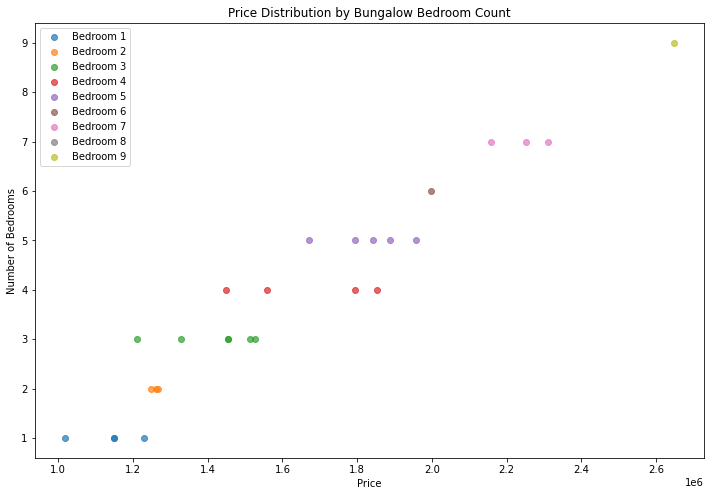



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  31.00000  31.00000      33.00000       36.00000
mean    3.90323   2.87097       2.93939  1546826.74508
std     2.56066   1.72708       1.78430   539798.62796
min     1.00000   1.00000       1.00000   933426.07920
25%     1.50000   2.00000       1.00000  1101178.44025
50%     3.00000   2.00000       3.00000  1365787.01300
75%     5.50000   4.00000       4.00000  1796229.97575
max     9.00000   7.00000       6.00000  2764824.10200


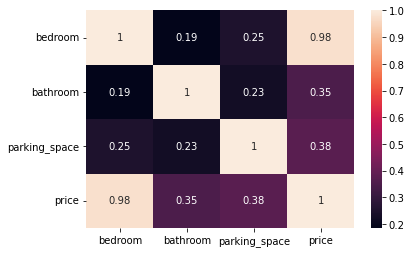

            loc title  bedroom  bathroom  parking_space      price
10193  Nasarawa  Flat     1.00      4.00           3.00 1101231.27
8705   Nasarawa  Flat     1.00      2.00            NaN 1060264.55
8083   Nasarawa  Flat     1.00      6.00           4.00 1195135.39
7272   Nasarawa  Flat     1.00      3.00           3.00 1065990.81
2280   Nasarawa  Flat     1.00      1.00           2.00 1059578.72
12026  Nasarawa  Flat     1.00      1.00            NaN  933426.08
5314   Nasarawa  Flat     1.00       NaN           1.00 1002229.60
11157  Nasarawa  Flat     1.00      3.00           1.00 1019144.42
6129   Nasarawa  Flat     2.00      3.00           6.00 1321523.50
4227   Nasarawa  Flat     2.00      5.00           3.00 1321734.83
8817   Nasarawa  Flat     3.00      1.00           4.00 1375765.66
11555  Nasarawa  Flat     3.00       NaN           3.00 1277855.85
12607  Nasarawa  Flat     3.00      2.00           1.00 1355808.36
6168   Nasarawa  Flat     3.00      2.00           1.00 128887

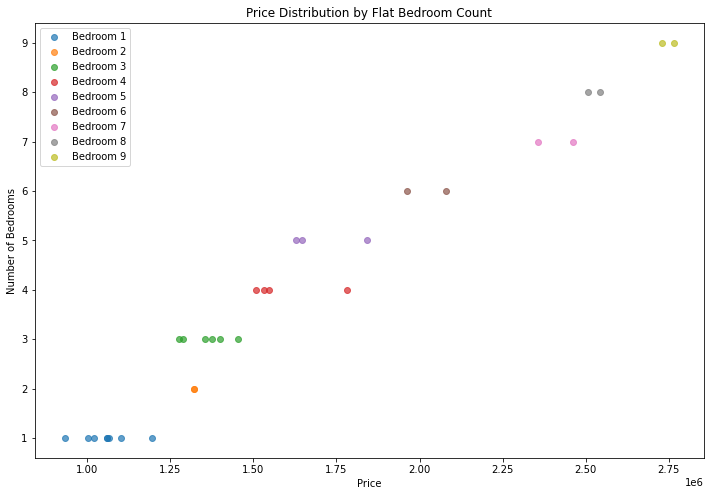



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  26.00000  21.00000      27.00000       29.00000
mean    3.46154   2.57143       3.14815  1715216.38976
std     2.43690   1.93834       1.43322   549726.36738
min     1.00000   1.00000       1.00000  1057801.02100
25%     1.25000   1.00000       2.00000  1341136.83300
50%     3.00000   2.00000       3.00000  1493258.68500
75%     4.75000   3.00000       4.00000  2108383.63600
max     8.00000   7.00000       6.00000  2870287.90800


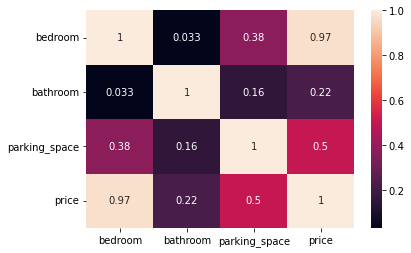

            loc           title  bedroom  bathroom  parking_space      price
9666   Nasarawa  Terrace duplex     1.00      1.00           2.00 1057801.02
12478  Nasarawa  Terrace duplex     1.00      3.00           4.00 1216884.38
7554   Nasarawa  Terrace duplex     1.00      2.00           4.00 1251525.38
11477  Nasarawa  Terrace duplex     1.00       NaN           3.00 1190533.28
3425   Nasarawa  Terrace duplex     1.00      5.00           4.00 1296175.41
11277  Nasarawa  Terrace duplex     1.00       NaN           2.00 1179026.53
356    Nasarawa  Terrace duplex     1.00       NaN           2.00 1164182.19
11524  Nasarawa  Terrace duplex     2.00       NaN           4.00 1341136.83
10201  Nasarawa  Terrace duplex     2.00      4.00           5.00 1480687.70
11177  Nasarawa  Terrace duplex     2.00      1.00           4.00 1364307.91
2768   Nasarawa  Terrace duplex     2.00      7.00           3.00 1546922.05
2569   Nasarawa  Terrace duplex     3.00      1.00            NaN 1540113.70

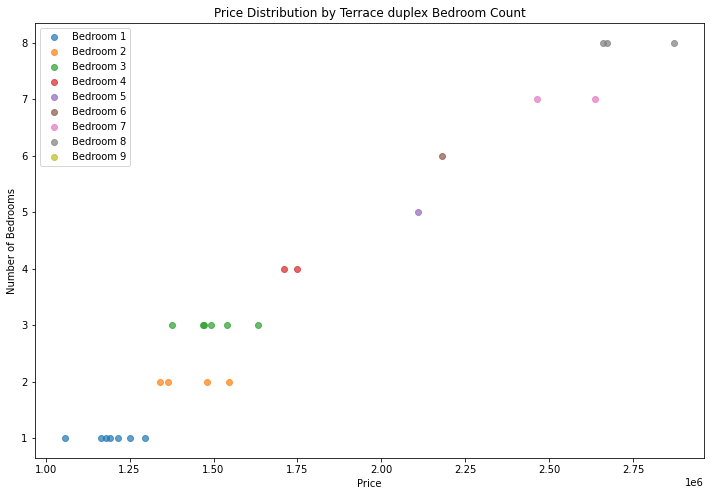



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  29.00000  25.00000      26.00000       32.00000
mean    4.68966   3.88000       3.19231  1991725.84697
std     2.26942   2.06801       1.67378   479053.17306
min     1.00000   1.00000       1.00000  1104789.93100
25%     3.00000   2.00000       2.00000  1685579.65025
50%     5.00000   4.00000       2.00000  1916803.26400
75%     6.00000   6.00000       4.75000  2389223.70175
max     9.00000   7.00000       6.00000  2974653.23100


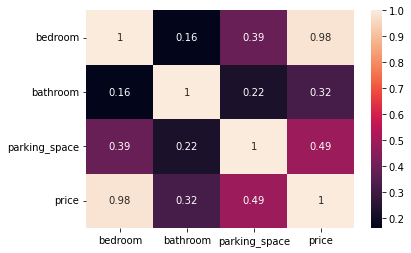

            loc                 title  bedroom  bathroom  parking_space  \
12510  Nasarawa  Semi-detached duplex     1.00      1.00            NaN   
11392  Nasarawa  Semi-detached duplex     1.00       NaN           4.00   
9388   Nasarawa  Semi-detached duplex     1.00      1.00           2.00   
10790  Nasarawa  Semi-detached duplex     2.00      2.00           2.00   
13730  Nasarawa  Semi-detached duplex     3.00      5.00           2.00   
1058   Nasarawa  Semi-detached duplex     3.00       NaN           4.00   
11935  Nasarawa  Semi-detached duplex     3.00      2.00            NaN   
3120   Nasarawa  Semi-detached duplex     3.00       NaN           6.00   
5115   Nasarawa  Semi-detached duplex     3.00      4.00           5.00   
9587   Nasarawa  Semi-detached duplex     3.00       NaN           2.00   
6969   Nasarawa  Semi-detached duplex     3.00      6.00           2.00   
12761  Nasarawa  Semi-detached duplex     4.00      5.00           5.00   
68     Nasarawa  Semi-det

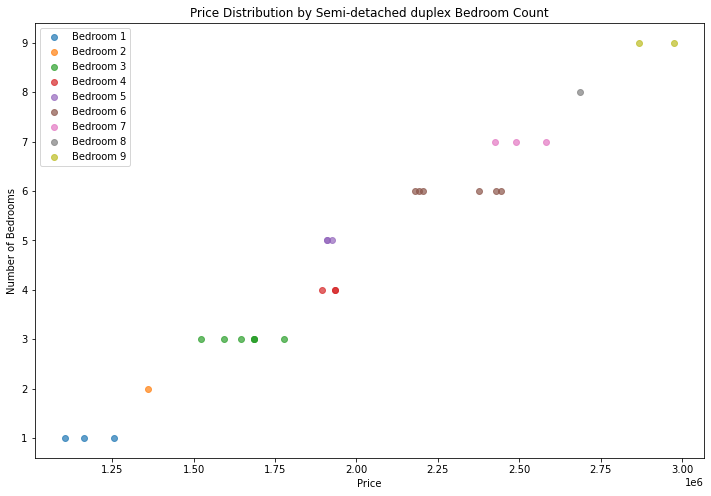



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  31.00000  32.00000      34.00000       38.00000
mean    4.38710   2.96875       3.20588  2095576.46924
std     2.43143   1.76862       1.78851   575874.96240
min     1.00000   1.00000       1.00000  1285839.49300
25%     2.50000   2.00000       1.25000  1571857.93600
50%     4.00000   2.00000       3.00000  1943337.66600
75%     6.00000   4.00000       4.75000  2603733.24975
max     9.00000   7.00000       6.00000  3208592.36800


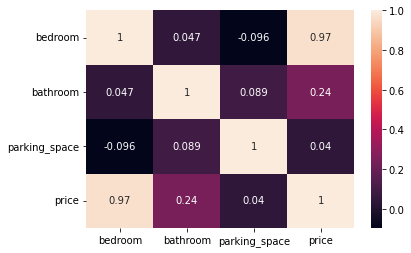

            loc      title  bedroom  bathroom  parking_space      price
7829   Nasarawa  Townhouse     1.00      6.00           3.00 1447227.48
10033  Nasarawa  Townhouse     1.00      2.00           4.00 1376278.35
1769   Nasarawa  Townhouse     1.00      6.00           1.00 1388669.49
4543   Nasarawa  Townhouse     1.00      4.00           6.00 1446963.32
13318  Nasarawa  Townhouse     1.00      4.00           5.00 1417684.32
10026  Nasarawa  Townhouse     2.00       NaN           4.00 1478025.11
11750  Nasarawa  Townhouse     2.00      2.00           2.00 1371523.09
11478  Nasarawa  Townhouse     2.00      2.00           3.00 1549077.89
6691   Nasarawa  Townhouse     3.00      2.00           3.00 1607885.94
10827  Nasarawa  Townhouse     3.00      2.00           3.00 1559848.60
9000   Nasarawa  Townhouse     3.00       NaN           2.00 1889606.61
13132  Nasarawa  Townhouse     3.00      2.00            NaN 1661467.60
6216   Nasarawa  Townhouse     4.00       NaN           3.00 175

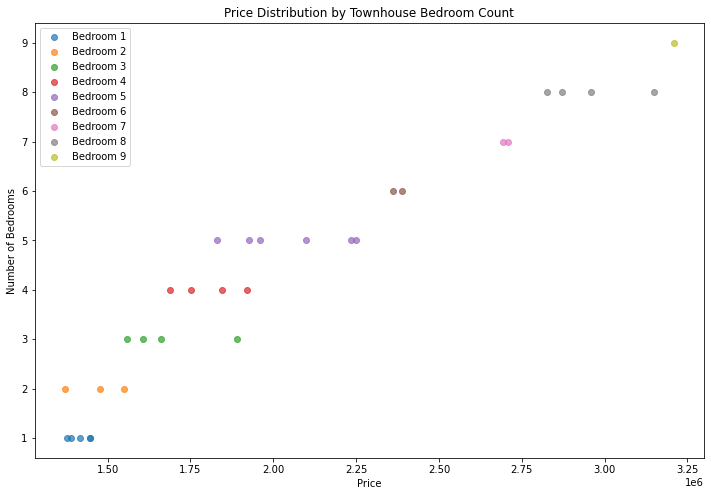



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  27.00000  22.00000      21.00000       28.00000
mean    4.62963   3.00000       3.57143  2659458.71689
std     2.23861   1.90238       1.63007   590097.46949
min     1.00000   1.00000       1.00000  1650640.47800
25%     3.00000   1.25000       2.00000  2264173.71150
50%     5.00000   2.00000       4.00000  2697319.89050
75%     6.00000   5.00000       5.00000  3019043.22025
max     8.00000   6.00000       6.00000  3712689.07400


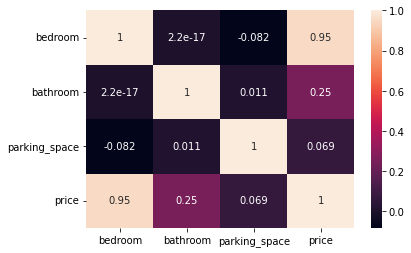

            loc      title  bedroom  bathroom  parking_space      price
240    Nasarawa  Penthouse     1.00       NaN           4.00 1669500.12
10149  Nasarawa  Penthouse     1.00       NaN           3.00 1803234.67
436    Nasarawa  Penthouse     1.00       NaN           2.00 1650640.48
2952   Nasarawa  Penthouse     1.00       NaN           5.00 1707562.82
210    Nasarawa  Penthouse     3.00      5.00           4.00 2344166.52
9772   Nasarawa  Penthouse     3.00       NaN           3.00 2182189.54
2933   Nasarawa  Penthouse     3.00      2.00            NaN 2282667.20
13779  Nasarawa  Penthouse     3.00      2.00            NaN 2265068.46
1367   Nasarawa  Penthouse     3.00      2.00           2.00 2237914.36
5291   Nasarawa  Penthouse     4.00      6.00            NaN 2661114.45
2078   Nasarawa  Penthouse     4.00      6.00           6.00 2737239.84
8733   Nasarawa  Penthouse     4.00      4.00           6.00 2622708.35
1306   Nasarawa  Penthouse     5.00      4.00           2.00 273

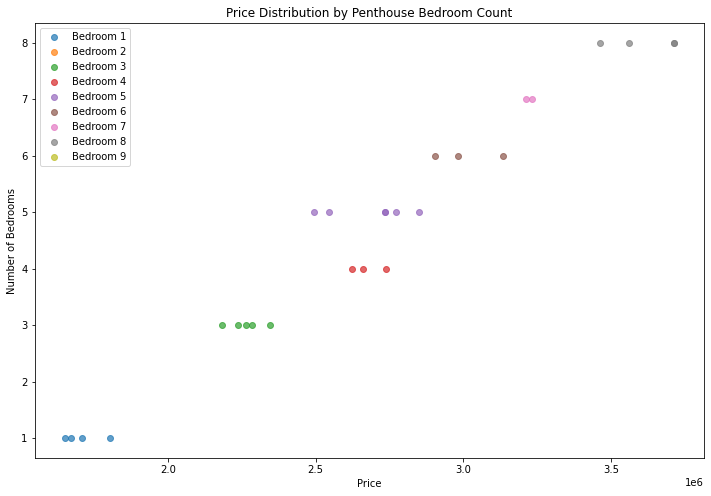



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  13.00000  14.00000      13.00000       15.00000
mean    3.00000   1.50000       3.00000  1379494.45912
std     1.58114   0.51887       1.15470   284488.32374
min     1.00000   1.00000       1.00000   839296.37060
25%     2.00000   1.00000       2.00000  1201204.53250
50%     3.00000   1.50000       3.00000  1394022.64700
75%     4.00000   2.00000       4.00000  1611762.87450
max     5.00000   2.00000       4.00000  1809945.15600


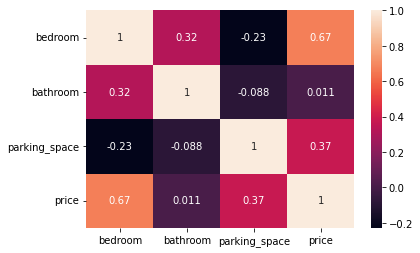

            loc    title  bedroom  bathroom  parking_space      price
5122   Nasarawa  Cottage     1.00      1.00           2.00 1176362.34
7913   Nasarawa  Cottage     1.00      1.00           4.00 1226046.72
11214  Nasarawa  Cottage     1.00      2.00           3.00  839296.37
183    Nasarawa  Cottage     2.00      1.00           4.00 1394147.99
11436  Nasarawa  Cottage     2.00      2.00           3.00  929239.29
12574  Nasarawa  Cottage     2.00      2.00            NaN 1394022.65
3560   Nasarawa  Cottage     3.00      1.00            NaN 1519172.31
441    Nasarawa  Cottage     4.00      1.00           1.00 1129418.42
7826   Nasarawa  Cottage     4.00      2.00           3.00 1664727.66
7980   Nasarawa  Cottage     4.00      1.00           4.00 1603332.70
93     Nasarawa  Cottage     5.00      2.00           1.00 1319023.31
4335   Nasarawa  Cottage     5.00      2.00           4.00 1809945.16
12925  Nasarawa  Cottage     5.00       NaN           4.00 1353028.98
231    Nasarawa  Cot

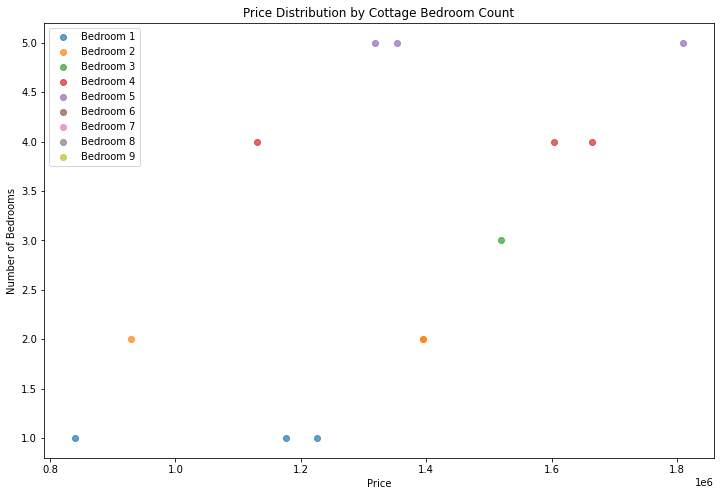

In [257]:
#Nasarawa
Nasarawa = housing_train[housing_train["loc" ] == "Nasarawa"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Nasarawa, house_type)
    print("\n")

(14000, 6)

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  28.00000  30.00000      26.00000       33.00000
mean    4.17857   3.10000       3.42308  3410291.49439
std     2.46537   1.90009       1.36156   881904.84053
min     1.00000   1.00000       1.00000  1581540.26600
25%     2.75000   2.00000       2.25000  3070605.47100
50%     4.00000   2.00000       3.00000  3564000.64700
75%     6.00000   5.00000       4.75000  4121204.68900
max     9.00000   7.00000       6.00000  4917433.25600


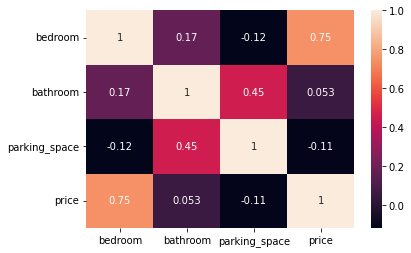

           loc    title  bedroom  bathroom  parking_space      price
1723   Plateau  Mansion     1.00      1.00           4.00 3293495.22
10137  Plateau  Mansion     1.00      6.00            NaN 2445673.56
7120   Plateau  Mansion     1.00      2.00           3.00 3213789.87
7406   Plateau  Mansion     1.00      6.00           6.00 2544571.50
8939   Plateau  Mansion     1.00      1.00           5.00 2123139.90
999    Plateau  Mansion     2.00      2.00           1.00 3602986.18
3943   Plateau  Mansion     2.00      6.00           3.00 2692986.36
720    Plateau  Mansion     3.00      5.00           6.00 3070605.47
13371  Plateau  Mansion     3.00      2.00           4.00 4121204.69
4023   Plateau  Mansion     3.00      2.00            NaN 1581540.27
5329   Plateau  Mansion     3.00      1.00           3.00 3644909.01
6106   Plateau  Mansion     3.00       NaN           4.00 1639748.75
9959   Plateau  Mansion     3.00      1.00           2.00 1616222.35
9379   Plateau  Mansion     4.00  

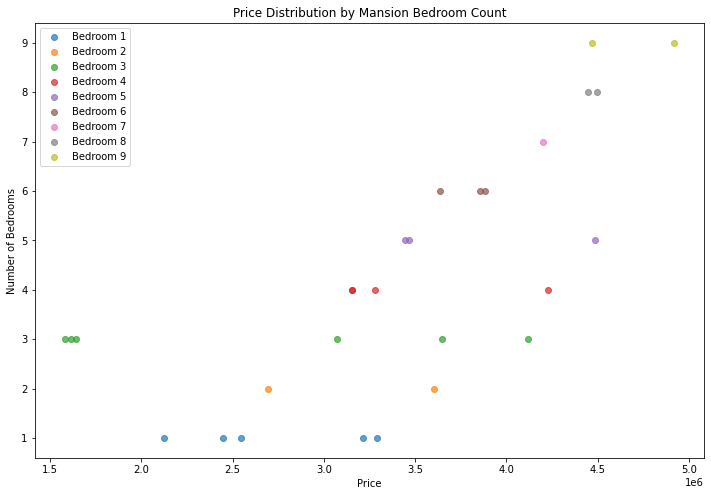



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  26.00000      29.00000       34.00000
mean    4.20000   3.50000       3.13793  1965551.36188
std     2.42686   2.02485       1.48141   566896.48735
min     1.00000   1.00000       1.00000  1232714.15300
25%     2.25000   2.00000       2.00000  1596124.13250
50%     4.00000   3.50000       3.00000  1838518.14100
75%     5.00000   5.75000       4.00000  2216425.74000
max     9.00000   7.00000       6.00000  3285615.45300


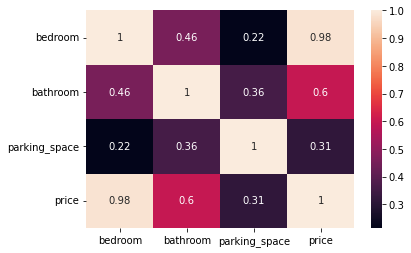

           loc            title  bedroom  bathroom  parking_space      price
10333  Plateau  Detached duplex     1.00      4.00           3.00 1330471.32
7496   Plateau  Detached duplex     1.00      2.00           4.00 1278983.27
3207   Plateau  Detached duplex     1.00      6.00           5.00 1473871.37
6309   Plateau  Detached duplex     1.00      1.00           3.00 1232714.15
13346  Plateau  Detached duplex     2.00      2.00           2.00 1423262.46
11957  Plateau  Detached duplex     2.00       NaN           4.00 1396734.41
6824   Plateau  Detached duplex     2.00       NaN           3.00 1384963.64
2115   Plateau  Detached duplex     2.00      1.00           1.00 1303980.78
5283   Plateau  Detached duplex     3.00      6.00           4.00 1867275.64
5296   Plateau  Detached duplex     3.00       NaN           2.00 1637732.24
8636   Plateau  Detached duplex     3.00       NaN           3.00 1591797.55
8657   Plateau  Detached duplex     3.00      5.00           3.00 1795575.61

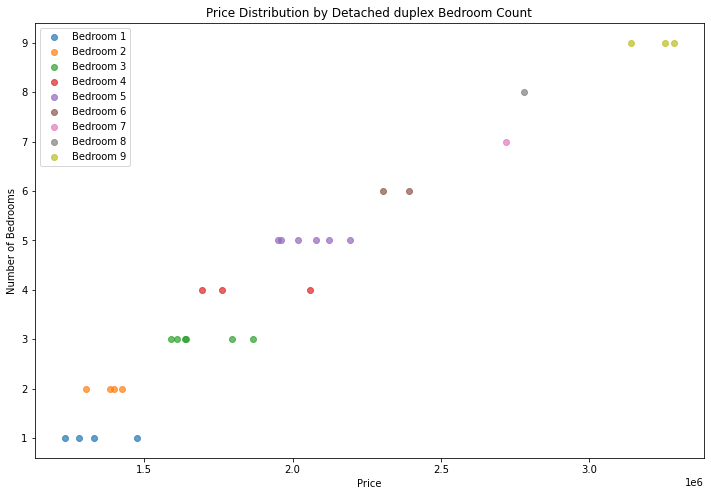



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  24.00000  23.00000      22.00000       25.00000
mean    3.62500   3.26087       2.81818  1310041.15970
std     2.20301   2.54447       1.56255   400101.61232
min     1.00000   1.00000       1.00000   771545.43960
25%     2.00000   1.00000       2.00000  1032769.52000
50%     3.50000   2.00000       2.50000  1250616.54900
75%     5.00000   6.50000       3.75000  1459843.98500
max     9.00000   7.00000       6.00000  2416975.00700


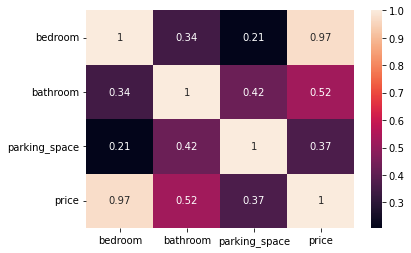

           loc      title  bedroom  bathroom  parking_space      price
12858  Plateau  Apartment     1.00      3.00           5.00  881018.06
9345   Plateau  Apartment     1.00      4.00            NaN  835555.14
9081   Plateau  Apartment     1.00      1.00           2.00  857577.19
7042   Plateau  Apartment     1.00      1.00           2.00  771545.44
6256   Plateau  Apartment     1.00      2.00           4.00  935571.59
5743   Plateau  Apartment     2.00      7.00           6.00 1171836.45
5550   Plateau  Apartment     2.00       NaN           2.00 1016736.54
560    Plateau  Apartment     2.00      2.00           2.00 1032769.52
2247   Plateau  Apartment     2.00      7.00            NaN 1080746.24
2208   Plateau  Apartment     3.00      7.00           1.00 1250616.55
7974   Plateau  Apartment     3.00      7.00           1.00 1250616.55
8754   Plateau  Apartment     3.00      1.00           2.00 1104379.11
4302   Plateau  Apartment     4.00      2.00           3.00 1275901.26
5683  

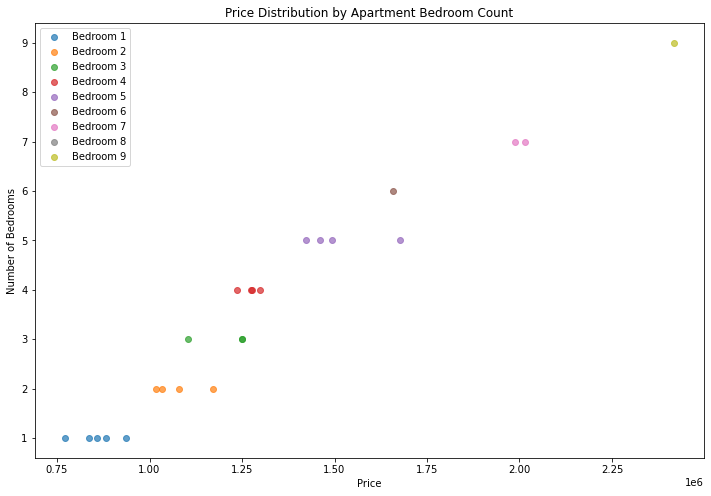



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  35.00000  35.00000      40.00000       42.00000
mean    4.57143   3.22857       3.22500  1614797.31772
std     2.60413   1.98651       1.73187   529121.35165
min     1.00000   1.00000       1.00000   892888.03860
25%     3.00000   1.50000       1.75000  1171934.68825
50%     4.00000   3.00000       3.00000  1418015.90700
75%     7.00000   5.00000       4.25000  2005789.44600
max     9.00000   7.00000       6.00000  2543959.23700


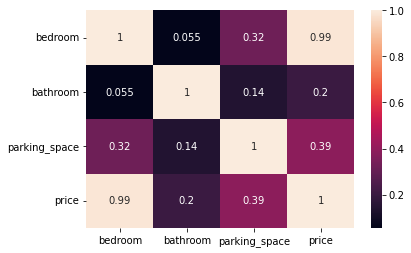

           loc     title  bedroom  bathroom  parking_space      price
3501   Plateau  Bungalow     1.00      5.00           5.00 1059577.34
8398   Plateau  Bungalow     1.00      3.00           1.00  913645.15
5078   Plateau  Bungalow     1.00      6.00           2.00 1028440.33
5952   Plateau  Bungalow     1.00      2.00           3.00  892888.04
10822  Plateau  Bungalow     1.00       NaN           4.00  966679.24
1557   Plateau  Bungalow     2.00       NaN           6.00 1160536.63
13266  Plateau  Bungalow     2.00      1.00           4.00 1123664.45
1478   Plateau  Bungalow     3.00      2.00           1.00 1234592.07
13354  Plateau  Bungalow     3.00      1.00           4.00 1155029.14
7015   Plateau  Bungalow     3.00       NaN           3.00 1285374.90
1903   Plateau  Bungalow     3.00      1.00           1.00 1106026.50
2338   Plateau  Bungalow     3.00      4.00           4.00 1362565.28
2385   Plateau  Bungalow     3.00      1.00            NaN 1129319.40
13642  Plateau  Bung

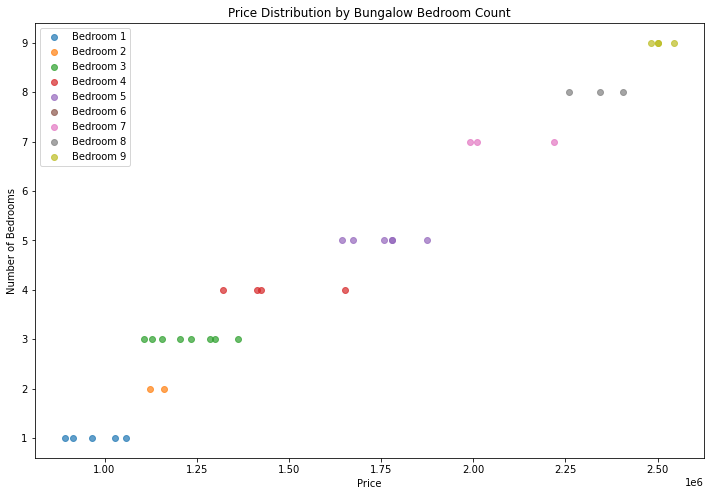



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  24.00000  26.00000      25.00000       31.00000
mean    5.08333   2.88462       3.40000  1675708.54895
std     2.50072   1.86176       1.73205   558110.79268
min     1.00000   1.00000       1.00000   927260.51860
25%     2.75000   2.00000       2.00000  1185102.16200
50%     5.00000   2.00000       3.00000  1454405.03000
75%     7.25000   4.75000       5.00000  2208903.64650
max     9.00000   7.00000       6.00000  2658566.56800


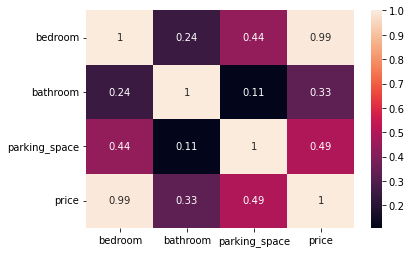

           loc title  bedroom  bathroom  parking_space      price
887    Plateau  Flat     1.00       NaN           5.00 1090902.19
1497   Plateau  Flat     2.00      5.00           5.00 1233690.57
13100  Plateau  Flat     2.00      2.00            NaN 1050162.08
12519  Plateau  Flat     2.00      1.00           1.00 1001051.89
11594  Plateau  Flat     2.00      2.00           3.00 1085614.24
5424   Plateau  Flat     2.00      1.00           4.00 1033214.53
2041   Plateau  Flat     3.00      2.00           1.00 1213212.87
7628   Plateau  Flat     4.00      1.00            NaN 1454405.03
7547   Plateau  Flat     4.00      2.00            NaN 1381004.65
13562  Plateau  Flat     4.00      5.00            NaN 1579704.44
4982   Plateau  Flat     4.00       NaN           1.00 1423268.02
7812   Plateau  Flat     5.00       NaN           2.00 1443084.63
11934  Plateau  Flat     5.00      2.00            NaN 1459406.68
3987   Plateau  Flat     6.00      3.00           6.00 1940857.94
1525   Pla

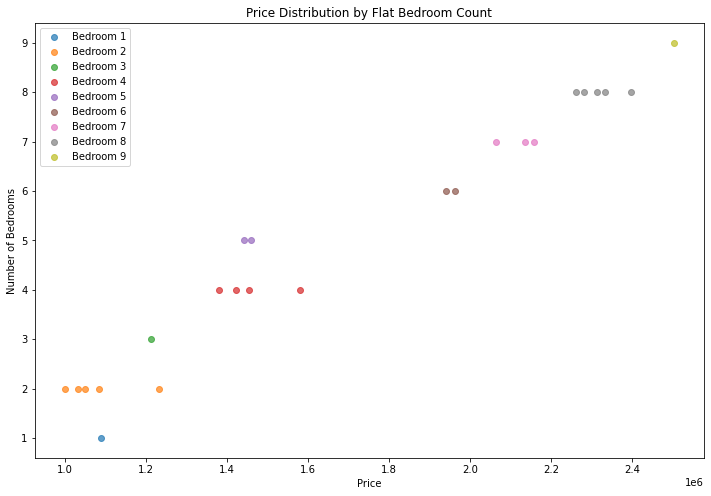



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  22.00000  27.00000      27.00000       30.00000
mean    4.72727   3.62963       3.07407  1852608.22073
std     2.60369   1.98355       1.35663   550406.90225
min     1.00000   1.00000       1.00000  1089625.33700
25%     3.00000   2.00000       2.00000  1358277.59150
50%     4.50000   4.00000       3.00000  1764263.58300
75%     6.75000   5.00000       4.00000  2321781.68075
max     9.00000   7.00000       6.00000  2823276.43100


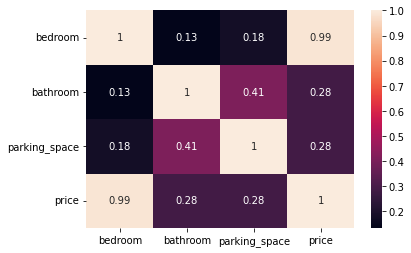

           loc           title  bedroom  bathroom  parking_space      price
8497   Plateau  Terrace duplex     1.00      5.00           1.00 1089625.34
4964   Plateau  Terrace duplex     1.00      3.00           6.00 1136260.40
13549  Plateau  Terrace duplex     2.00      5.00           3.00 1321734.83
1351   Plateau  Terrace duplex     2.00      1.00           3.00 1173264.65
3850   Plateau  Terrace duplex     2.00      2.00           2.00 1256080.67
12072  Plateau  Terrace duplex     3.00      1.00           2.00 1362184.50
12932  Plateau  Terrace duplex     3.00      1.00           3.00 1386353.37
74     Plateau  Terrace duplex     3.00       NaN           1.00 1281871.56
2163   Plateau  Terrace duplex     3.00      6.00           4.00 1572568.53
9966   Plateau  Terrace duplex     4.00      1.00           3.00 1569907.22
11161  Plateau  Terrace duplex     4.00      5.00           4.00 1734292.25
8527   Plateau  Terrace duplex     5.00       NaN           2.00 1704086.63
12567  Plate

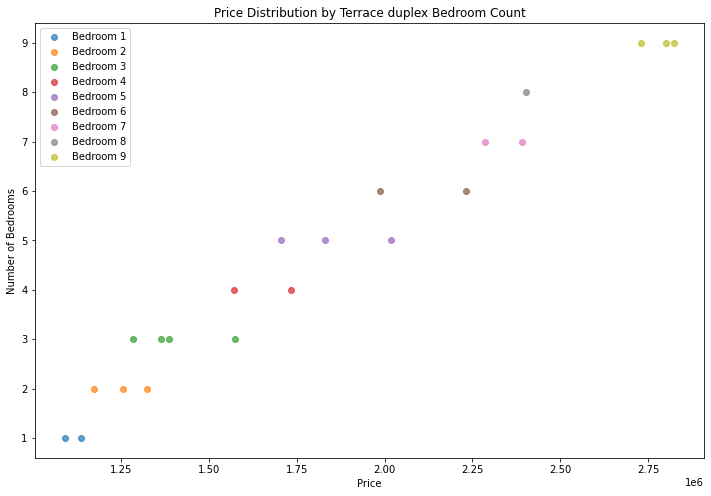



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  33.00000  25.00000      27.00000       35.00000
mean    4.51515   2.92000       3.44444  1688516.88223
std     2.13777   1.86905       1.45002   464716.07295
min     1.00000   1.00000       1.00000  1002767.07500
25%     3.00000   1.00000       2.00000  1345854.89850
50%     4.00000   2.00000       4.00000  1525722.13900
75%     6.00000   4.00000       4.00000  1972297.40250
max     9.00000   7.00000       6.00000  2764824.10200


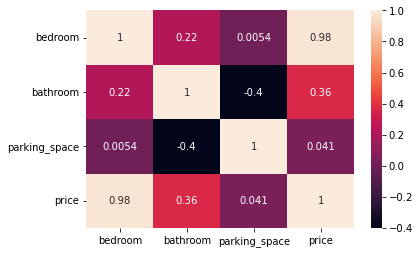

           loc                 title  bedroom  bathroom  parking_space  \
6516   Plateau  Semi-detached duplex     1.00       NaN           4.00   
1926   Plateau  Semi-detached duplex     2.00      5.00           3.00   
4380   Plateau  Semi-detached duplex     2.00      2.00           4.00   
5304   Plateau  Semi-detached duplex     2.00       NaN           4.00   
5317   Plateau  Semi-detached duplex     2.00       NaN           2.00   
373    Plateau  Semi-detached duplex     3.00      3.00           5.00   
12452  Plateau  Semi-detached duplex     3.00      1.00            NaN   
12185  Plateau  Semi-detached duplex     3.00       NaN           4.00   
10064  Plateau  Semi-detached duplex     3.00      6.00            NaN   
2813   Plateau  Semi-detached duplex     3.00      1.00            NaN   
7623   Plateau  Semi-detached duplex     3.00      6.00           2.00   
3718   Plateau  Semi-detached duplex     3.00       NaN           5.00   
11800  Plateau  Semi-detached duplex  

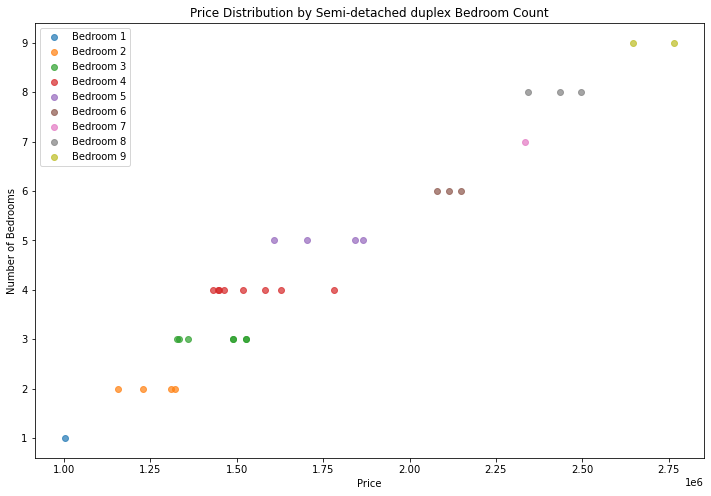



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  26.00000  33.00000      33.00000       35.00000
mean    3.61538   3.27273       3.81818  1736336.39474
std     2.15549   1.97283       1.75810   487053.16550
min     1.00000   1.00000       1.00000  1083755.54000
25%     1.00000   2.00000       2.00000  1294597.15250
50%     4.00000   2.00000       4.00000  1797437.64400
75%     5.00000   4.00000       5.00000  1967074.79300
max     8.00000   7.00000       6.00000  2883507.50400


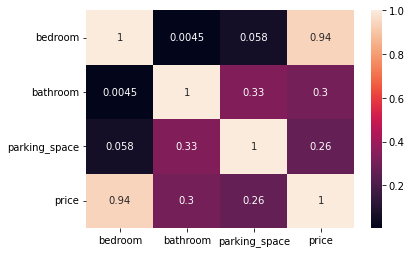

           loc      title  bedroom  bathroom  parking_space      price
425    Plateau  Townhouse     1.00      1.00           6.00 1176460.43
5814   Plateau  Townhouse     1.00      2.00           2.00 1083755.54
5428   Plateau  Townhouse     1.00      6.00           4.00 1320189.20
10419  Plateau  Townhouse     1.00       NaN           4.00 1124408.88
2551   Plateau  Townhouse     1.00      7.00           1.00 1281267.95
3826   Plateau  Townhouse     1.00      4.00           3.00 1215851.30
1778   Plateau  Townhouse     1.00      2.00           1.00 1110888.39
6455   Plateau  Townhouse     1.00      4.00           5.00 1267902.85
1085   Plateau  Townhouse     2.00      2.00            NaN 1307926.36
1966   Plateau  Townhouse     3.00      2.00           2.00 1388887.72
2909   Plateau  Townhouse     3.00      7.00           6.00 1811129.70
6333   Plateau  Townhouse     4.00      1.00           2.00 1551376.95
9336   Plateau  Townhouse     4.00      6.00           2.00 1875984.58
8619  

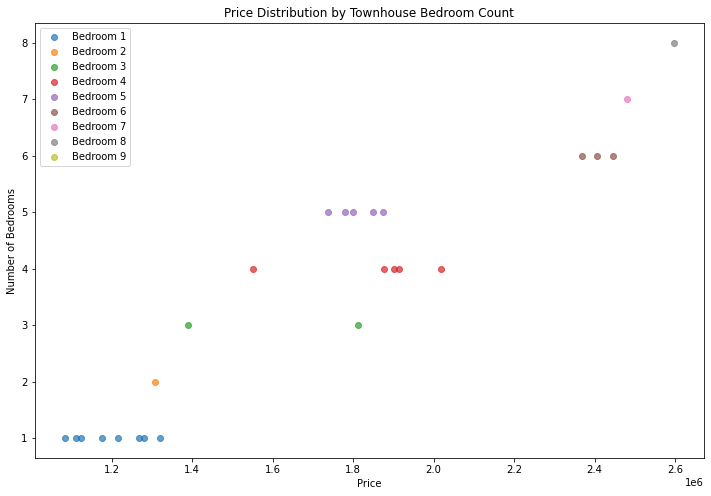



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  19.00000  15.00000      18.00000       22.00000
mean    5.31579   2.60000       3.11111  2504295.50536
std     2.90694   1.63881       1.74521   745552.90610
min     1.00000   1.00000       1.00000  1507852.35100
25%     3.00000   2.00000       1.00000  1878440.00900
50%     5.00000   2.00000       3.50000  2356567.30050
75%     8.00000   2.00000       4.00000  3172519.85075
max     9.00000   6.00000       6.00000  3724531.27800


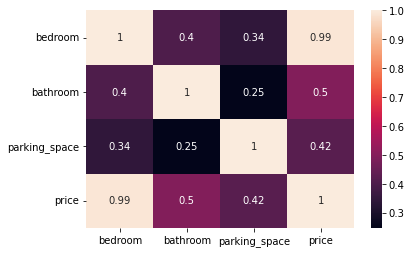

           loc      title  bedroom  bathroom  parking_space      price
337    Plateau  Penthouse     1.00       NaN           3.00 1625234.09
10711  Plateau  Penthouse     1.00      1.00           4.00 1507852.35
11365  Plateau  Penthouse     1.00      5.00           1.00 1542947.25
907    Plateau  Penthouse     3.00      2.00           1.00 2019447.98
1798   Plateau  Penthouse     3.00       NaN           1.00 1981307.36
9997   Plateau  Penthouse     3.00      2.00            NaN 1948110.54
3115   Plateau  Penthouse     4.00      2.00           4.00 2240708.44
10524  Plateau  Penthouse     4.00       NaN           6.00 2369407.63
453    Plateau  Penthouse     5.00      2.00            NaN 2445227.49
2656   Plateau  Penthouse     5.00      2.00            NaN 2511316.97
9709   Plateau  Penthouse     5.00      2.00           1.00 2343726.97
12717  Plateau  Penthouse     6.00       NaN           4.00 2948109.92
5816   Plateau  Penthouse     8.00      2.00           4.00 3197894.98
4890  

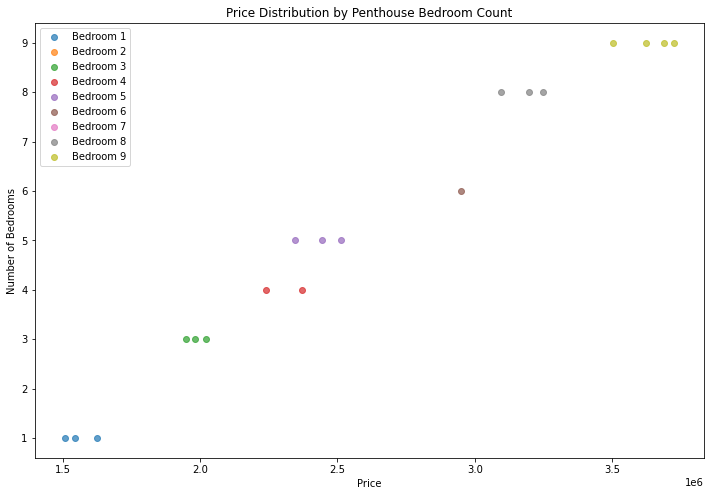



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  13.00000  12.00000      12.00000       14.00000
mean    3.07692   1.66667       2.66667  1243260.40657
std     1.44115   0.49237       1.23091   251137.55409
min     1.00000   1.00000       1.00000   724959.32990
25%     2.00000   1.00000       1.75000  1132136.70725
50%     3.00000   2.00000       3.00000  1286327.62000
75%     4.00000   2.00000       4.00000  1360764.41000
max     5.00000   2.00000       4.00000  1652541.04000


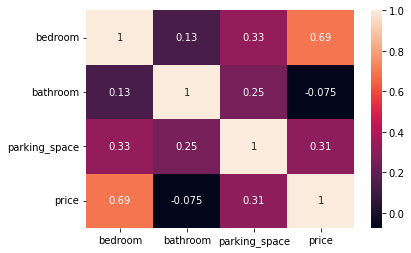

           loc    title  bedroom  bathroom  parking_space      price
4439   Plateau  Cottage     1.00      2.00           1.00 1087434.40
5600   Plateau  Cottage     1.00      1.00            NaN  724959.33
5102   Plateau  Cottage     2.00      2.00           4.00 1273678.73
5687   Plateau  Cottage     2.00      1.00           1.00 1171451.87
8163   Plateau  Cottage     2.00      2.00           2.00  859883.85
1312   Plateau  Cottage     3.00      2.00            NaN 1375459.77
6542   Plateau  Cottage     3.00      1.00           1.00 1298976.51
12167  Plateau  Cottage     3.00      1.00           4.00 1311270.24
335    Plateau  Cottage     4.00      2.00           3.00 1119031.65
11891  Plateau  Cottage     4.00      2.00           4.00 1461579.63
1487   Plateau  Cottage     5.00       NaN           3.00 1652541.04
2381   Plateau  Cottage     5.00       NaN           4.00 1179747.91
5390   Plateau  Cottage     5.00      2.00           2.00 1572952.42
10200  Plateau  Cottage      NaN  

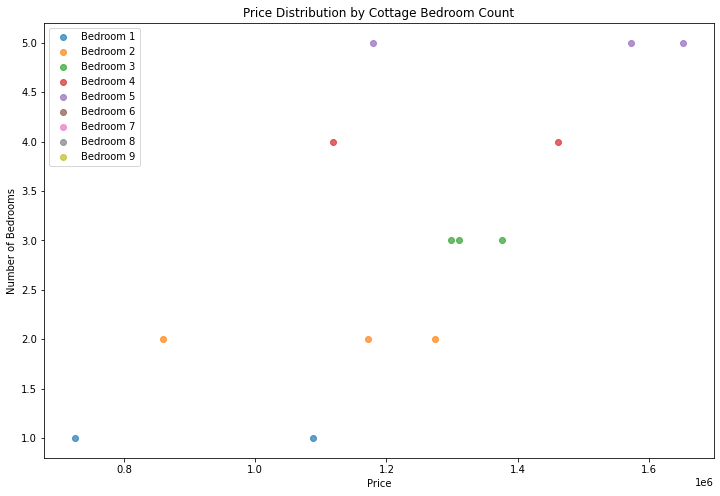

In [260]:
#Plateau
Plateau = housing_train[housing_train["loc" ] == "Plateau"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Plateau, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  20.00000  23.00000      21.00000       26.00000
mean    3.65000   2.60870       3.00000  3538024.60788
std     2.62127   1.75134       1.00000  1110979.46767
min     1.00000   1.00000       1.00000  1283074.40300
25%     1.00000   1.00000       2.00000  2885225.91400
50%     3.50000   2.00000       3.00000  3576863.91350
75%     5.25000   3.50000       4.00000  4280249.43850
max     9.00000   6.00000       5.00000  5256274.83100


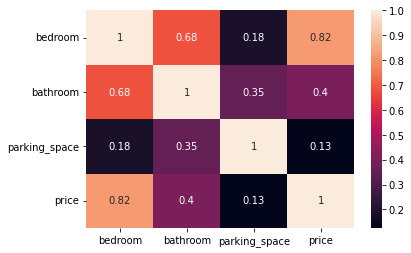

        loc    title  bedroom  bathroom  parking_space      price
63     Kano  Mansion     1.00      6.00            NaN 2687046.28
1594   Kano  Mansion     1.00       NaN           2.00 3296230.10
1598   Kano  Mansion     1.00       NaN           3.00 2770742.37
13023  Kano  Mansion     1.00      3.00           4.00 2491588.10
3471   Kano  Mansion     1.00      2.00           3.00 1371527.48
13439  Kano  Mansion     1.00      1.00           2.00 1283074.40
7660   Kano  Mansion     1.00      1.00           1.00 3254027.67
9428   Kano  Mansion     2.00      2.00            NaN 4068424.74
2725   Kano  Mansion     3.00      2.00           3.00 4282963.49
11822  Kano  Mansion     3.00       NaN           3.00 1771062.12
2817   Kano  Mansion     4.00      1.00           4.00 4722765.39
5630   Kano  Mansion     4.00      3.00            NaN 3591184.44
5750   Kano  Mansion     4.00      1.00           4.00 3312532.08
9773   Kano  Mansion     4.00      3.00           3.00 3424294.17
2047   Kan

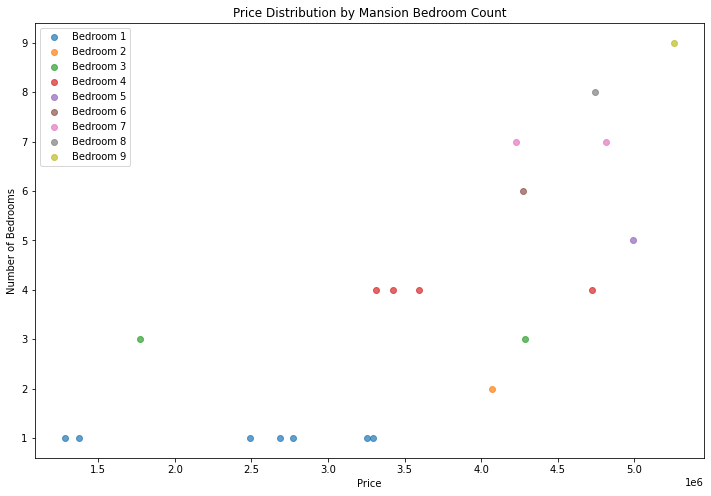



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  26.00000  25.00000      25.00000       29.00000
mean    5.26923   4.12000       2.92000  2424606.47059
std     2.60089   2.24202       1.77764   675259.52053
min     1.00000   1.00000       1.00000  1372813.94400
25%     3.25000   2.00000       1.00000  2005182.40500
50%     5.00000   4.00000       3.00000  2252362.51300
75%     7.75000   6.00000       4.00000  2866908.90100
max     9.00000   7.00000       6.00000  3571411.92200


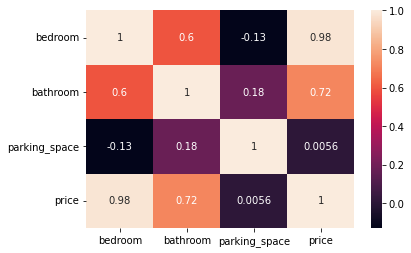

        loc            title  bedroom  bathroom  parking_space      price
9482   Kano  Detached duplex     1.00      6.00           5.00 1649398.92
10882  Kano  Detached duplex     1.00      1.00           4.00 1372813.94
3659   Kano  Detached duplex     2.00      1.00           2.00 1500521.45
4390   Kano  Detached duplex     2.00      2.00            NaN 1589080.48
10844  Kano  Detached duplex     3.00      3.00           3.00 1892312.98
3098   Kano  Detached duplex     3.00      4.00            NaN 2005182.41
10384  Kano  Detached duplex     3.00      5.00            NaN 2085844.93
634    Kano  Detached duplex     4.00      2.00           1.00 2014038.54
875    Kano  Detached duplex     4.00      6.00           6.00 2368895.54
1323   Kano  Detached duplex     4.00      2.00           6.00 2175073.02
11287  Kano  Detached duplex     4.00      1.00           1.00 1808322.86
13092  Kano  Detached duplex     5.00      1.00           1.00 2203906.88
10455  Kano  Detached duplex     5.00 

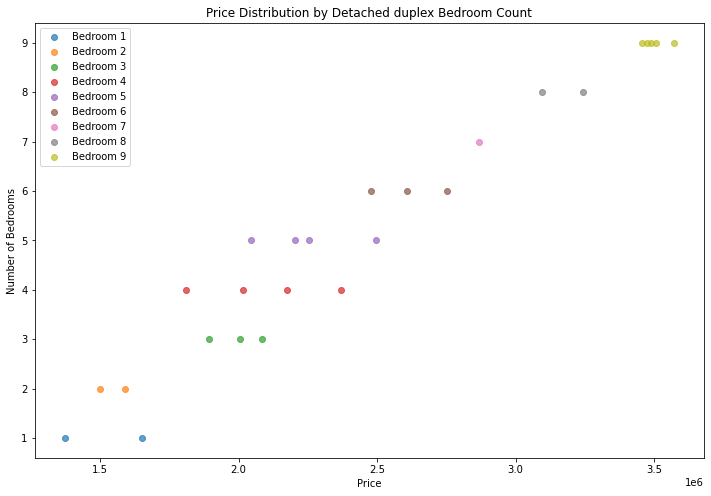



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  27.00000  29.00000      23.00000       30.00000
mean    5.40741   3.17241       3.08696  1731149.67597
std     2.73523   2.20501       1.62125   525373.96357
min     1.00000   1.00000       1.00000   921800.05990
25%     3.50000   1.00000       1.50000  1300422.45625
50%     6.00000   2.00000       4.00000  1722772.72700
75%     8.00000   5.00000       4.50000  2188269.11900
max     9.00000   7.00000       5.00000  2599809.47700


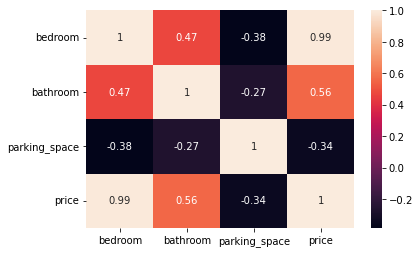

        loc      title  bedroom  bathroom  parking_space      price
10418  Kano  Apartment     1.00      2.00           4.00 1086980.75
11764  Kano  Apartment     1.00      1.00           4.00  921800.06
8016   Kano  Apartment     1.00      1.00           4.00  937461.52
11173  Kano  Apartment     1.00      2.00            NaN  983833.49
1017   Kano  Apartment     2.00      3.00            NaN 1093672.54
10159  Kano  Apartment     2.00      4.00           5.00 1185993.83
7564   Kano  Apartment     3.00      2.00           4.00 1270538.24
3096   Kano  Apartment     4.00      1.00           1.00 1410908.97
10303  Kano  Apartment     4.00      3.00           5.00 1519205.46
1969   Kano  Apartment     5.00      2.00            NaN 1501422.71
7217   Kano  Apartment     5.00      1.00            NaN 1645684.22
10233  Kano  Apartment     5.00      2.00           2.00 1615033.73
12729  Kano  Apartment     5.00      6.00           5.00 1799861.23
10453  Kano  Apartment     6.00      5.00       

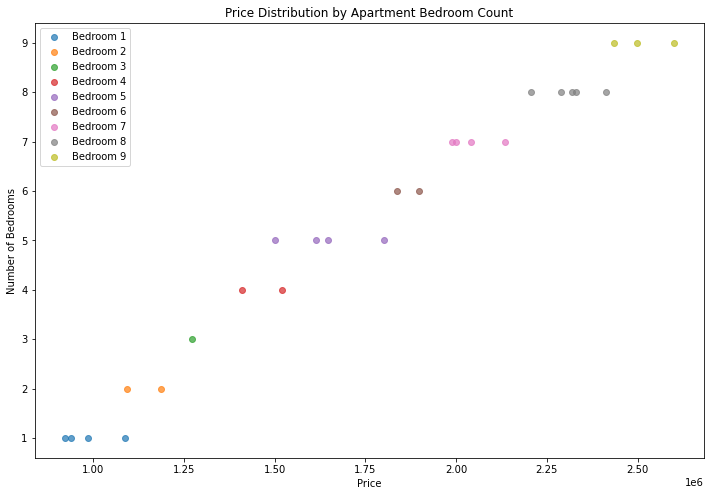



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  28.00000  28.00000      26.00000       33.00000
mean    4.67857   3.25000       3.38462  1800323.72797
std     2.69504   2.08389       1.41639   571490.63107
min     1.00000   1.00000       1.00000  1018933.09200
25%     2.75000   1.00000       3.00000  1356975.28900
50%     4.00000   2.50000       4.00000  1648695.42800
75%     7.00000   5.00000       4.00000  2239430.66900
max     9.00000   7.00000       6.00000  2811670.49600


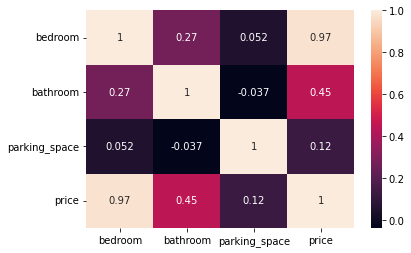

        loc     title  bedroom  bathroom  parking_space      price
11994  Kano  Bungalow     1.00      1.00            NaN 1050514.15
862    Kano  Bungalow     1.00      5.00           1.00 1089625.34
1172   Kano  Bungalow     1.00       NaN           2.00 1183529.45
6847   Kano  Bungalow     1.00      1.00           4.00 1018933.09
1128   Kano  Bungalow     2.00      1.00            NaN 1208298.64
9291   Kano  Bungalow     2.00      4.00           6.00 1356763.96
8800   Kano  Bungalow     2.00      6.00           3.00 1356975.29
10018  Kano  Bungalow     3.00      2.00           4.00 1322656.41
7447   Kano  Bungalow     3.00      2.00            NaN 1427682.18
4025   Kano  Bungalow     3.00      1.00           4.00 1396366.24
6808   Kano  Bungalow     4.00       NaN           4.00 1442144.58
7422   Kano  Bungalow     4.00      1.00           4.00 1533703.38
4778   Kano  Bungalow     4.00       NaN           1.00 1628782.20
2260   Kano  Bungalow     4.00      2.00            NaN 167541

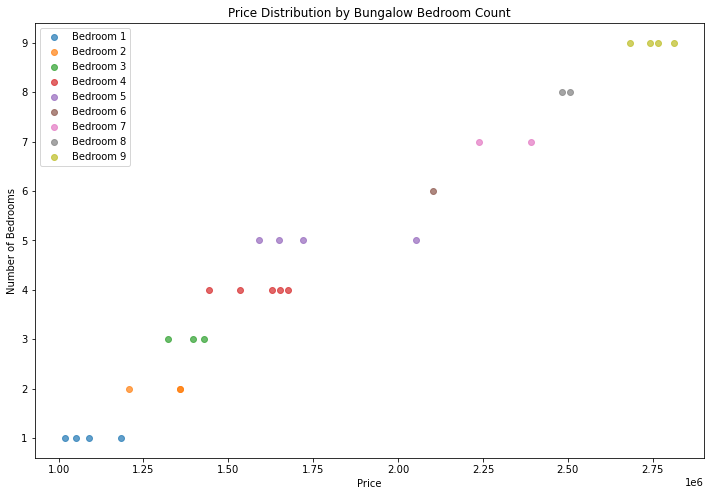



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  33.00000  29.00000      33.00000       36.00000
mean    3.93939   3.34483       2.78788  1629925.28721
std     2.24916   1.79833       1.24392   487360.42146
min     1.00000   1.00000       1.00000   977299.66960
25%     2.00000   2.00000       2.00000  1239489.48175
50%     4.00000   3.00000       3.00000  1512252.95700
75%     6.00000   4.00000       4.00000  2044955.50475
max     8.00000   7.00000       5.00000  2624335.42200


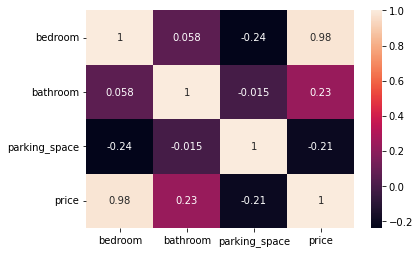

        loc title  bedroom  bathroom  parking_space      price
6279   Kano  Flat     1.00      2.00           1.00  977299.67
13565  Kano  Flat     1.00      4.00           5.00 1148077.67
2452   Kano  Flat     1.00      2.00           4.00 1054173.55
9430   Kano  Flat     1.00       NaN           4.00 1060006.45
6446   Kano  Flat     1.00       NaN           2.00 1070728.78
13490  Kano  Flat     2.00      1.00           4.00 1204196.19
2238   Kano  Flat     2.00      4.00           2.00 1263071.17
8574   Kano  Flat     2.00      7.00           2.00 1368792.55
4718   Kano  Flat     2.00       NaN           2.00 1298311.63
4625   Kano  Flat     2.00      2.00           2.00 1186000.63
4559   Kano  Flat     2.00      3.00           3.00 1251253.91
7785   Kano  Flat     3.00      7.00           5.00 1631232.19
1225   Kano  Flat     3.00      5.00           3.00 1513904.88
4386   Kano  Flat     3.00      2.00           3.00 1408183.50
2816   Kano  Flat     3.00       NaN           1.00 139

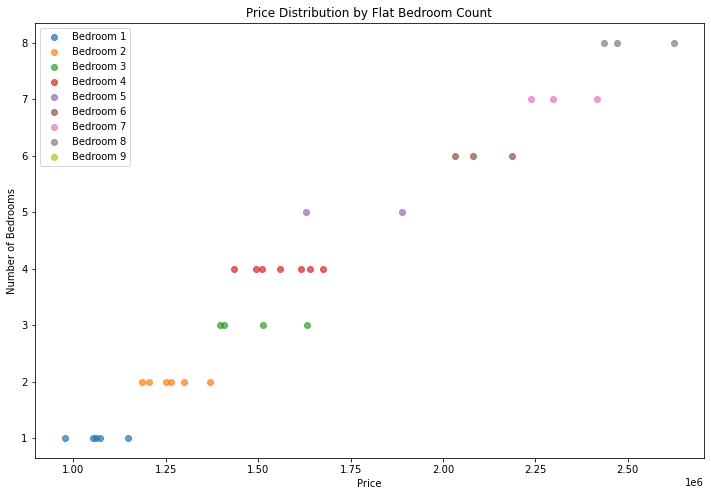



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  25.00000  26.00000      23.00000       29.00000
mean    4.76000   3.96154       3.17391  2019824.05921
std     2.61852   2.21776       1.64184   602643.41715
min     1.00000   1.00000       1.00000  1083709.82000
25%     2.00000   2.00000       2.00000  1480925.43700
50%     5.00000   4.00000       3.00000  2227082.44300
75%     7.00000   6.00000       5.00000  2490697.52500
max     9.00000   7.00000       6.00000  2948539.87600


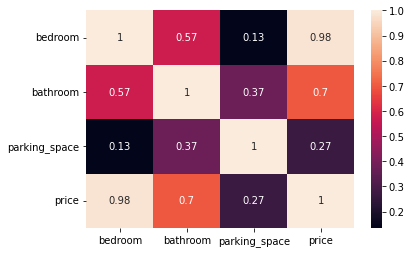

        loc           title  bedroom  bathroom  parking_space      price
13952  Kano  Terrace duplex     1.00      1.00           2.00 1106028.93
12917  Kano  Terrace duplex     1.00      2.00           2.00 1083709.82
1488   Kano  Terrace duplex     1.00      4.00           4.00 1256529.90
12437  Kano  Terrace duplex     1.00      1.00            NaN 1126646.87
4974   Kano  Terrace duplex     1.00      2.00           5.00 1203589.96
3507   Kano  Terrace duplex     2.00       NaN           2.00 1371576.03
6212   Kano  Terrace duplex     2.00      6.00           2.00 1480925.44
565    Kano  Terrace duplex     3.00      1.00            NaN 1404704.02
13541  Kano  Terrace duplex     3.00      1.00            NaN 1566464.79
10915  Kano  Terrace duplex     5.00      1.00           1.00 1750383.63
10847  Kano  Terrace duplex     5.00      1.00            NaN 1717496.88
30     Kano  Terrace duplex     5.00      5.00           5.00 2147791.41
4294   Kano  Terrace duplex     5.00      7.00     

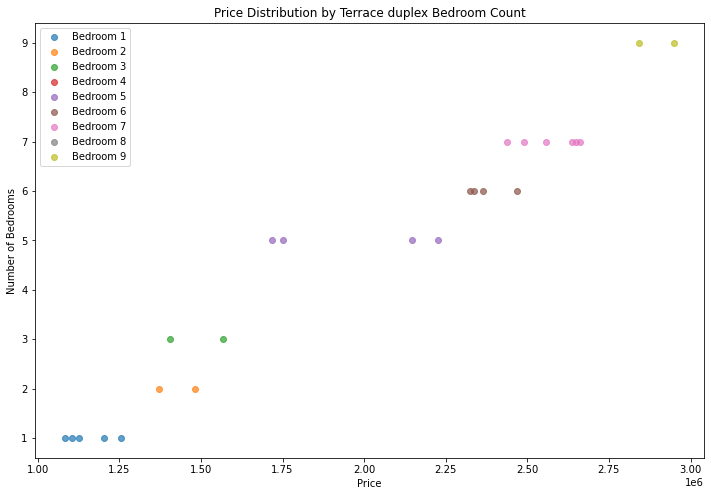



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  35.00000  38.00000      31.00000       43.00000
mean    4.54286   3.31579       3.58065  1903815.68400
std     2.45360   2.01488       1.58691   535374.48630
min     1.00000   1.00000       1.00000  1138075.15700
25%     2.00000   2.00000       2.50000  1488665.49650
50%     4.00000   2.00000       3.00000  1829150.25200
75%     6.00000   5.00000       4.50000  2251933.07700
max     9.00000   7.00000       6.00000  2922188.77900


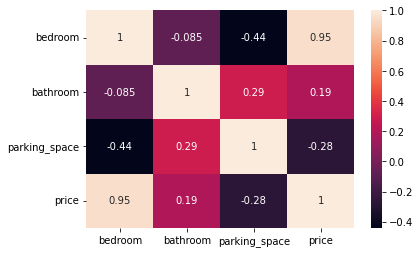

        loc                 title  bedroom  bathroom  parking_space      price
1154   Kano  Semi-detached duplex     1.00      2.00           6.00 1229941.06
8598   Kano  Semi-detached duplex     1.00      7.00           5.00 1401817.54
10357  Kano  Semi-detached duplex     2.00      2.00            NaN 1322324.08
5440   Kano  Semi-detached duplex     2.00      6.00            NaN 1507276.53
5417   Kano  Semi-detached duplex     2.00      1.00           2.00 1354120.43
4702   Kano  Semi-detached duplex     2.00      7.00           3.00 1546922.05
4680   Kano  Semi-detached duplex     2.00      2.00           3.00 1338883.52
6422   Kano  Semi-detached duplex     2.00      2.00            NaN 1313827.53
1913   Kano  Semi-detached duplex     2.00       NaN           6.00 1546684.31
3805   Kano  Semi-detached duplex     2.00      6.00           6.00 1586329.82
2365   Kano  Semi-detached duplex     2.00      2.00            NaN 1338529.65
13403  Kano  Semi-detached duplex     3.00      1.00

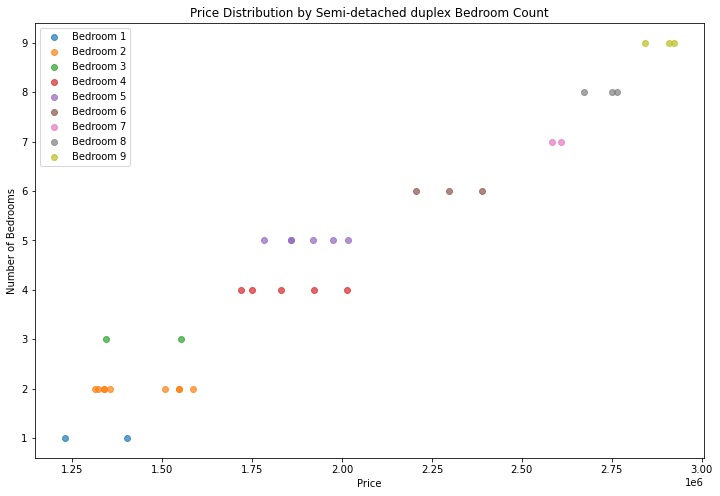



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  26.00000  26.00000      24.00000       29.00000
mean    4.00000   3.30769       3.33333  1995701.47897
std     2.62298   1.61912       1.76109   563404.31831
min     1.00000   1.00000       1.00000  1335028.98800
25%     2.00000   2.00000       2.00000  1520557.04800
50%     3.50000   3.00000       3.00000  1885251.07200
75%     5.75000   4.75000       5.00000  2463157.21200
max     9.00000   7.00000       6.00000  3296429.35700


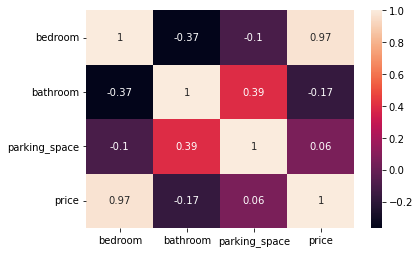

        loc      title  bedroom  bathroom  parking_space      price
11756  Kano  Townhouse     1.00      5.00            NaN 1432455.90
9496   Kano  Townhouse     1.00      7.00           4.00 1520557.05
6935   Kano  Townhouse     1.00      4.00           5.00 1417684.32
5294   Kano  Townhouse     1.00      5.00            NaN 1432455.90
5328   Kano  Townhouse     1.00      6.00           5.00 1505785.47
1818   Kano  Townhouse     2.00      5.00           3.00 1613527.21
2348   Kano  Townhouse     2.00       NaN           1.00 1599019.79
8404   Kano  Townhouse     2.00      4.00           5.00 1628034.62
13801  Kano  Townhouse     2.00      2.00           3.00 1409692.19
6395   Kano  Townhouse     2.00       NaN           1.00 1439728.69
6694   Kano  Townhouse     2.00       NaN           1.00 1335028.99
4595   Kano  Townhouse     3.00      1.00            NaN 1713140.15
6506   Kano  Townhouse     3.00      5.00           6.00 1918621.44
629    Kano  Townhouse     4.00      1.00       

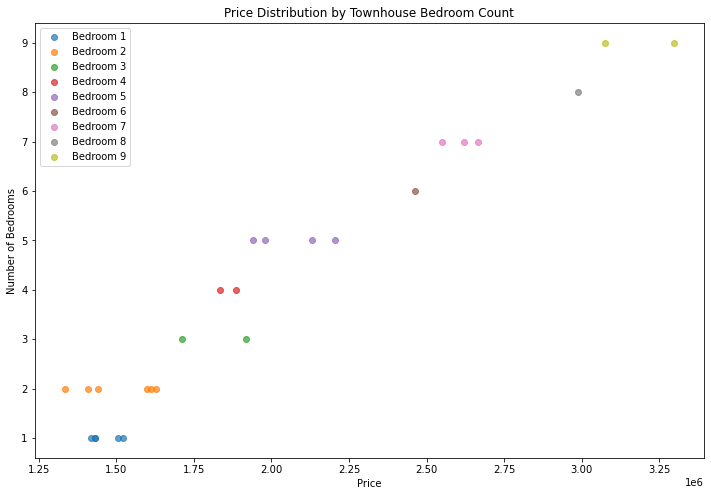



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  33.00000  31.00000      34.00000       39.00000
mean    3.48485   2.67742       3.14706  2407964.39749
std     2.23776   1.75854       1.52021   620869.61832
min     1.00000   1.00000       1.00000  1650297.07200
25%     2.00000   1.00000       2.00000  1946285.80300
50%     3.00000   2.00000       3.00000  2287244.17700
75%     4.00000   4.00000       4.00000  2809994.13000
max     9.00000   6.00000       6.00000  3814368.11200


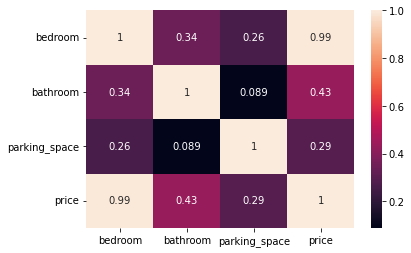

        loc      title  bedroom  bathroom  parking_space      price
29     Kano  Penthouse     1.00      1.00           1.00 1664232.45
11991  Kano  Penthouse     1.00      1.00           1.00 1662405.27
11347  Kano  Penthouse     1.00      1.00            NaN 1683261.89
4305   Kano  Penthouse     1.00      3.00            NaN 1802891.26
2871   Kano  Penthouse     1.00       NaN           5.00 1822094.31
4668   Kano  Penthouse     1.00      1.00           5.00 1650297.07
1597   Kano  Penthouse     1.00      1.00           1.00 1716432.99
13488  Kano  Penthouse     2.00      2.00           3.00 2138288.42
520    Kano  Penthouse     2.00      3.00           4.00 1974746.97
10761  Kano  Penthouse     2.00      2.00           3.00 2023725.44
1193   Kano  Penthouse     2.00       NaN           1.00 1975090.38
9615   Kano  Penthouse     2.00      4.00            NaN 1917824.63
4515   Kano  Penthouse     2.00      2.00           3.00 2040132.66
4626   Kano  Penthouse     2.00      5.00       

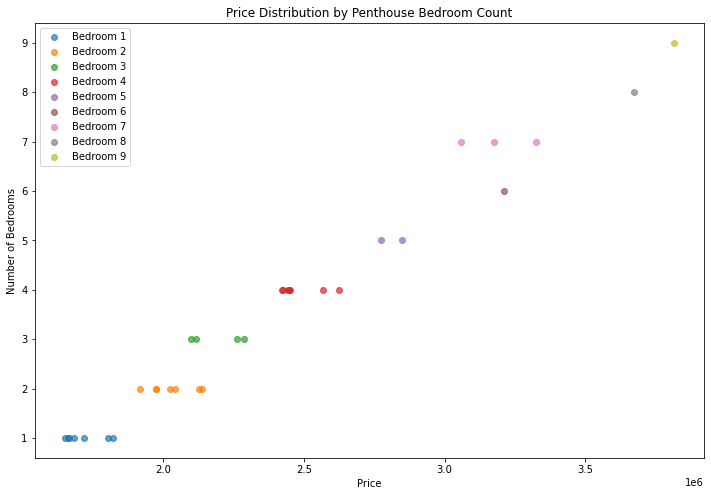



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  6.00000  5.00000       6.00000        7.00000
mean   2.00000  1.40000       2.33333  1029870.72720
std    1.67332  0.54772       1.03280   351870.23883
min    1.00000  1.00000       1.00000   750033.29020
25%    1.00000  1.00000       2.00000   786707.78375
50%    1.00000  1.00000       2.00000   832991.57770
75%    2.50000  2.00000       2.75000  1186693.70100
max    5.00000  2.00000       4.00000  1679267.25300


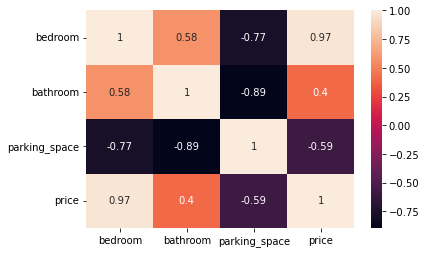

        loc    title  bedroom  bathroom  parking_space      price
51     Kano  Cottage     1.00      2.00           2.00  750033.29
6020   Kano  Cottage     1.00      1.00           3.00  778322.52
8309   Kano  Cottage     1.00       NaN           2.00  795093.05
8599   Kano  Cottage     1.00      1.00           4.00  832991.58
12215  Kano  Cottage     3.00      2.00           1.00 1051590.40
1774   Kano  Cottage     5.00       NaN            NaN 1679267.25
12550  Kano  Cottage      NaN      1.00           2.00 1321797.00


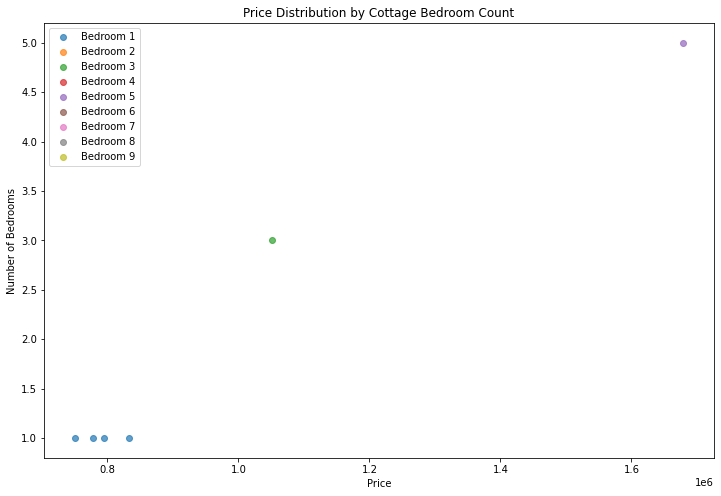

In [261]:
# Kano
Kano = housing_train[housing_train["loc" ] == "Kano"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Kano, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      25.00000       32.00000
mean    4.44444   3.69231       3.40000  3301879.69009
std     2.80567   2.29380       1.82574   965467.34577
min     1.00000   1.00000       1.00000  1777742.02800
25%     1.50000   2.00000       2.00000  2501470.94800
50%     5.00000   3.00000       3.00000  3332962.32500
75%     6.50000   6.00000       5.00000  3977612.14375
max     9.00000   7.00000       6.00000  4892485.70300


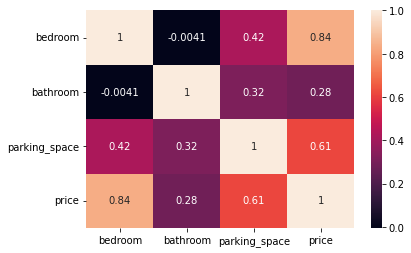

         loc    title  bedroom  bathroom  parking_space      price
250    Benue  Mansion     1.00      5.00           2.00 2272379.09
8697   Benue  Mansion     1.00       NaN           5.00 2346329.48
12666  Benue  Mansion     1.00      7.00           4.00 2520070.08
5935   Benue  Mansion     1.00       NaN           1.00 1925344.02
5444   Benue  Mansion     1.00      6.00            NaN 2445673.56
3730   Benue  Mansion     1.00      1.00           1.00 2757002.64
3883   Benue  Mansion     1.00      2.00           2.00 2049189.51
6152   Benue  Mansion     2.00       NaN           5.00 2791884.30
12806  Benue  Mansion     2.00      1.00            NaN 3346200.97
8363   Benue  Mansion     3.00      7.00            NaN 3219398.52
3048   Benue  Mansion     4.00      1.00           1.00 1777742.03
11324  Benue  Mansion     4.00      7.00            NaN 3478412.40
2187   Benue  Mansion     4.00      3.00           3.00 3081928.36
8362   Benue  Mansion     5.00      1.00           1.00 181813

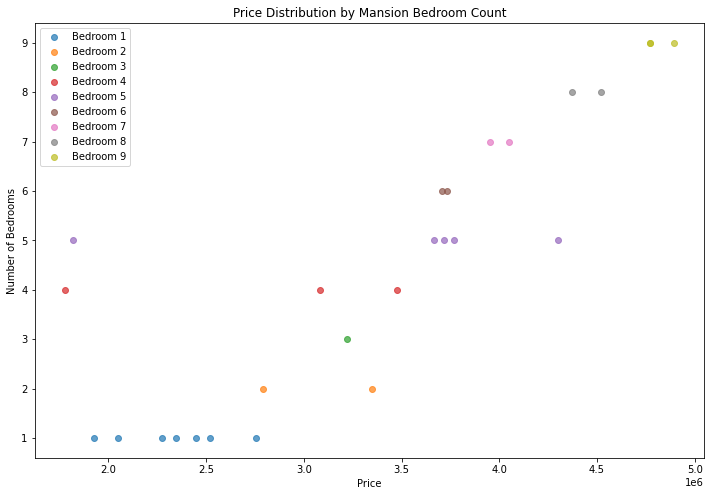



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  29.00000  29.00000      26.00000       35.00000
mean    4.58621   3.13793       3.26923  2071302.55477
std     2.26017   2.04807       1.58890   523927.24387
min     1.00000   1.00000       1.00000  1245633.57000
25%     3.00000   2.00000       2.00000  1681763.67950
50%     5.00000   2.00000       3.00000  1953624.81300
75%     6.00000   5.00000       4.00000  2365051.59850
max     9.00000   7.00000       6.00000  3228358.74900


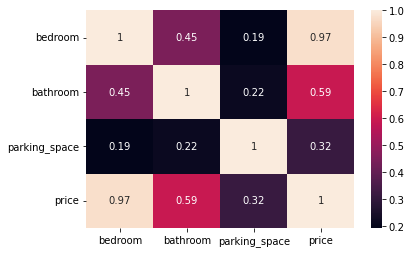

         loc            title  bedroom  bathroom  parking_space      price
10378  Benue  Detached duplex     1.00      1.00           2.00 1295226.74
2268   Benue  Detached duplex     1.00      1.00           4.00 1277891.39
8303   Benue  Detached duplex     1.00      2.00           2.00 1245633.57
4298   Benue  Detached duplex     2.00      3.00            NaN 1552219.19
4799   Benue  Detached duplex     2.00       NaN           3.00 1538034.16
4878   Benue  Detached duplex     2.00      5.00           3.00 1581105.83
8327   Benue  Detached duplex     3.00       NaN           2.00 1637732.24
8252   Benue  Detached duplex     3.00      1.00           6.00 1709173.98
7641   Benue  Detached duplex     3.00      7.00            NaN 1967604.01
6717   Benue  Detached duplex     3.00      5.00            NaN 1738318.91
11481  Benue  Detached duplex     4.00      1.00            NaN 1858087.23
3175   Benue  Detached duplex     4.00      2.00            NaN 1885624.51
45     Benue  Detached du

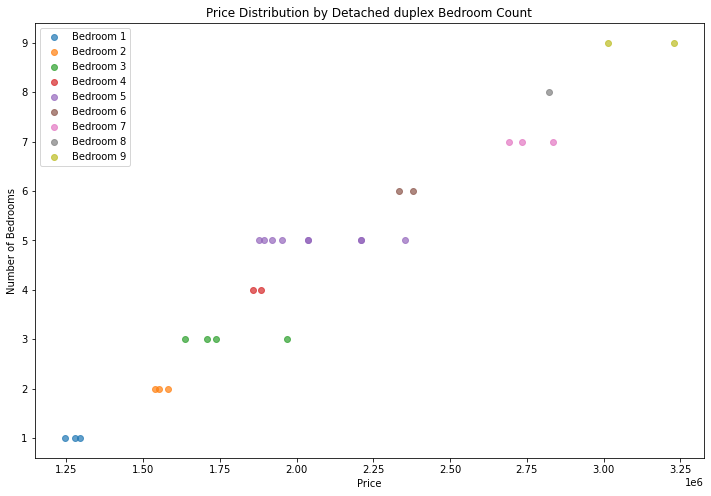



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  33.00000  33.00000      32.00000       38.00000
mean    4.75758   3.42424       3.21875  1515234.38953
std     2.65789   2.00047       1.60110   500363.58955
min     1.00000   1.00000       1.00000   753327.39730
25%     2.00000   2.00000       2.00000  1074557.27575
50%     4.00000   3.00000       3.00000  1361271.29650
75%     8.00000   5.00000       4.00000  2072319.89875
max     9.00000   7.00000       6.00000  2325720.43100


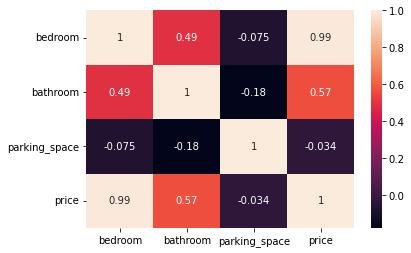

         loc      title  bedroom  bathroom  parking_space      price
12183  Benue  Apartment     1.00      3.00           3.00  844581.97
2960   Benue  Apartment     1.00      1.00            NaN  753327.40
7085   Benue  Apartment     1.00      6.00            NaN  981463.84
6286   Benue  Apartment     1.00      2.00           4.00  946200.11
13253  Benue  Apartment     2.00      5.00           3.00 1062363.83
12137  Benue  Apartment     2.00      2.00           2.00  965282.06
4860   Benue  Apartment     2.00       NaN           1.00  903613.79
10462  Benue  Apartment     2.00      1.00           6.00 1007380.97
7035   Benue  Apartment     2.00      1.00           3.00  962785.31
13853  Benue  Apartment     3.00      2.00            NaN 1233370.06
878    Benue  Apartment     3.00      1.00           6.00 1177251.28
10355  Benue  Apartment     3.00      1.00           1.00 1111137.62
7577   Benue  Apartment     4.00      2.00           4.00 1281097.86
11759  Benue  Apartment     4.00  

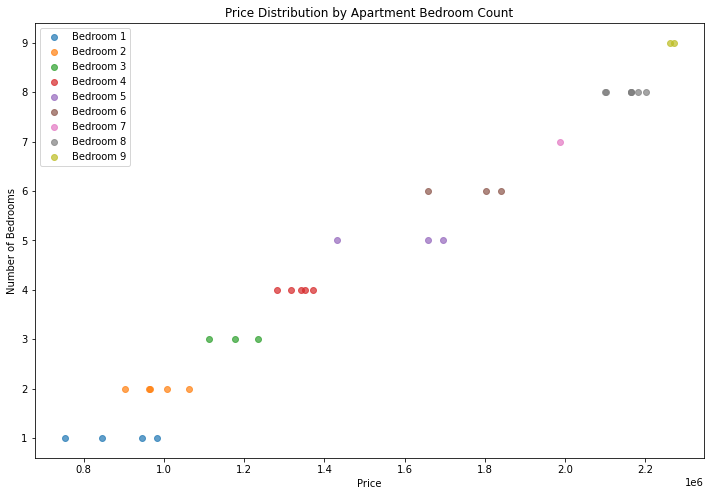



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  24.00000  23.00000      21.00000       28.00000
mean    3.87500   3.30435       3.14286  1542090.78236
std     2.36482   2.28503       1.62129   494336.10243
min     1.00000   1.00000       1.00000   903140.92110
25%     2.00000   1.00000       2.00000  1124147.50800
50%     3.50000   3.00000       3.00000  1500698.37000
75%     6.00000   5.00000       4.00000  1972182.79550
max     9.00000   7.00000       6.00000  2554463.47000


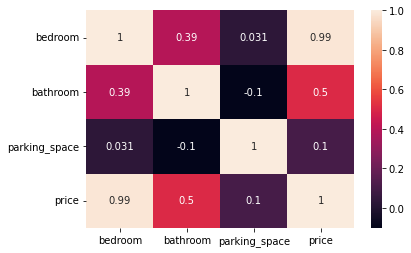

         loc     title  bedroom  bathroom  parking_space      price
3227   Benue  Bungalow     1.00       NaN           4.00  988697.96
13537  Benue  Bungalow     1.00       NaN           2.00  903140.92
3457   Benue  Bungalow     1.00      1.00           4.00  913457.31
9543   Benue  Bungalow     1.00      4.00           4.00 1007431.86
13872  Benue  Bungalow     2.00      1.00            NaN 1045929.30
10485  Benue  Bungalow     2.00      1.00           2.00  995998.37
9791   Benue  Bungalow     2.00      3.00           4.00 1150220.24
3665   Benue  Bungalow     2.00      6.00           3.00 1223374.18
3452   Benue  Bungalow     2.00      7.00            NaN 1275519.65
13172  Benue  Bungalow     2.00      1.00            NaN 1023899.97
9919   Benue  Bungalow     3.00      1.00           2.00 1206024.68
13003  Benue  Bungalow     3.00       NaN           1.00 1206128.86
4264   Benue  Bungalow     4.00       NaN           1.00 1346593.37
139    Benue  Bungalow     4.00      6.00       

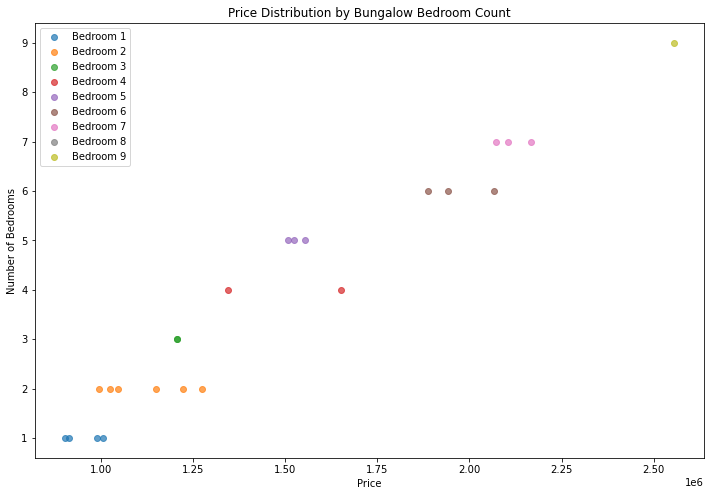



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  25.00000  22.00000      22.00000       28.00000
mean    4.24000   3.18182       3.22727  1535814.02962
std     2.90517   1.99132       1.71636   576436.43528
min     1.00000   1.00000       1.00000   837903.80070
25%     2.00000   1.25000       2.00000  1040724.14500
50%     3.00000   3.00000       4.00000  1310419.80400
75%     8.00000   5.00000       4.00000  2141180.05300
max     9.00000   7.00000       6.00000  2491625.91900


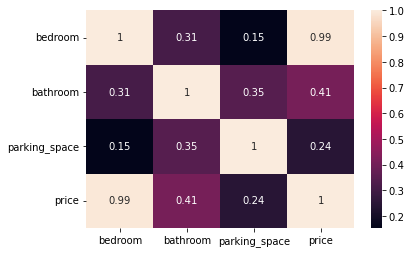

         loc title  bedroom  bathroom  parking_space      price
477    Benue  Flat     1.00      1.00            NaN  871816.07
1971   Benue  Flat     1.00      1.00           4.00  963806.28
9503   Benue  Flat     1.00      2.00            NaN  965602.78
9087   Benue  Flat     1.00      3.00           3.00  955286.39
11623  Benue  Flat     1.00      1.00            NaN  871816.07
8836   Benue  Flat     2.00      3.00           4.00 1150220.24
10520  Benue  Flat     2.00      5.00           6.00 1254511.19
3707   Benue  Flat     2.00      5.00           2.00 1171228.71
13556  Benue  Flat     2.00      1.00           1.00 1025108.68
8174   Benue  Flat     2.00      5.00           1.00 1150408.09
8141   Benue  Flat     2.00      1.00           2.00 1045929.30
11642  Benue  Flat     3.00      4.00            NaN 1320924.04
3260   Benue  Flat     3.00      2.00           4.00 1299915.57
1605   Benue  Flat     4.00       NaN           4.00 1454405.03
9448   Benue  Flat     5.00      7.00   

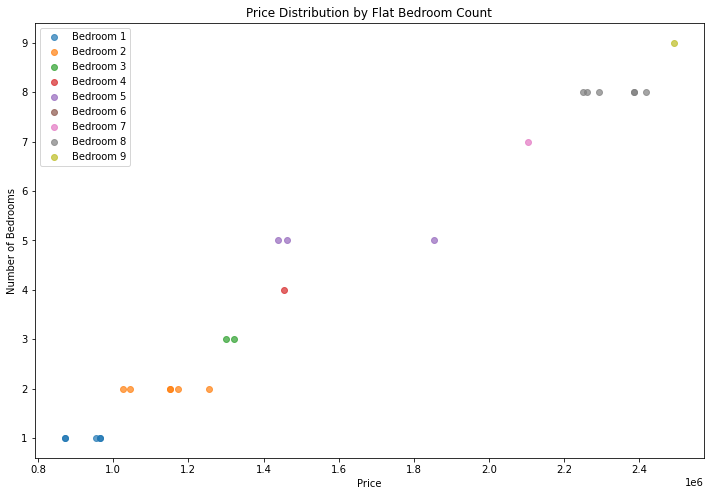



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  28.00000  32.00000      32.00000       34.00000
mean    4.75000   3.53125       2.84375  1791669.55453
std     2.53311   2.24304       1.37041   527728.73430
min     1.00000   1.00000       1.00000  1081640.28700
25%     3.00000   1.00000       2.00000  1356759.66275
50%     4.00000   3.50000       3.00000  1630837.78850
75%     7.25000   5.00000       4.00000  2305422.61750
max     9.00000   7.00000       5.00000  2835093.69300


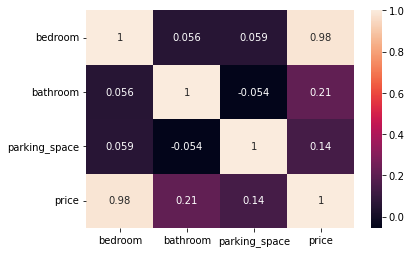

         loc           title  bedroom  bathroom  parking_space      price
126    Benue  Terrace duplex     1.00      5.00           3.00 1136471.73
1028   Benue  Terrace duplex     1.00      1.00           3.00 1081640.29
3492   Benue  Terrace duplex     1.00      7.00           3.00 1206952.65
9879   Benue  Terrace duplex     2.00      2.00           2.00 1215536.03
9686   Benue  Terrace duplex     2.00      1.00           4.00 1221200.00
8194   Benue  Terrace duplex     3.00      5.00           5.00 1560751.27
6976   Benue  Terrace duplex     3.00      1.00           4.00 1396366.24
6932   Benue  Terrace duplex     3.00      6.00           2.00 1525722.14
4917   Benue  Terrace duplex     3.00      2.00           3.00 1339814.29
13079  Benue  Terrace duplex     3.00      1.00           1.00 1302767.31
4737   Benue  Terrace duplex     4.00      1.00            NaN 1545393.30
3915   Benue  Terrace duplex     4.00      5.00           1.00 1664022.66
11378  Benue  Terrace duplex     4.00 

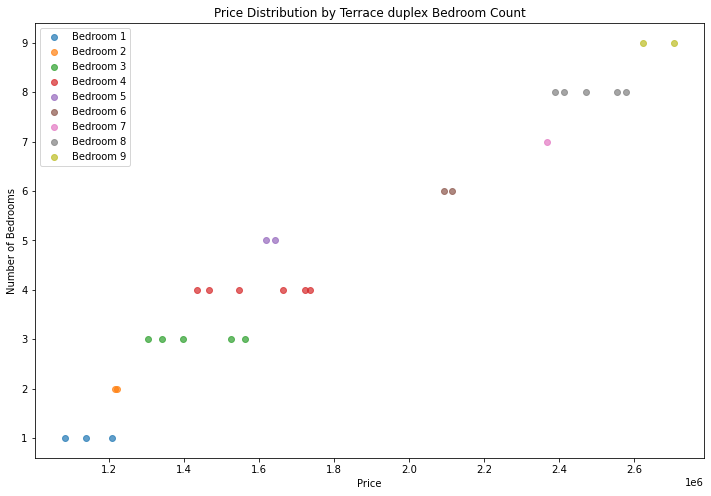



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  34.00000  32.00000      32.00000       38.00000
mean    3.97059   2.90625       2.93750  1670980.49592
std     2.35469   2.08465       1.66438   503478.87816
min     1.00000   1.00000       1.00000  1019144.41900
25%     2.00000   1.00000       1.75000  1247461.47250
50%     3.50000   2.00000       2.50000  1560722.15250
75%     5.00000   4.00000       4.00000  1985044.76200
max     9.00000   7.00000       6.00000  2776218.71000


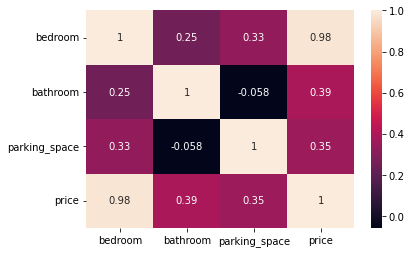

         loc                 title  bedroom  bathroom  parking_space  \
12260  Benue  Semi-detached duplex     1.00       NaN           1.00   
3989   Benue  Semi-detached duplex     1.00      1.00            NaN   
4004   Benue  Semi-detached duplex     1.00      1.00           4.00   
11650  Benue  Semi-detached duplex     1.00       NaN           1.00   
5509   Benue  Semi-detached duplex     1.00      3.00           2.00   
4006   Benue  Semi-detached duplex     2.00      2.00           2.00   
12431  Benue  Semi-detached duplex     2.00      1.00           2.00   
12301  Benue  Semi-detached duplex     2.00      2.00           2.00   
8300   Benue  Semi-detached duplex     2.00      1.00           1.00   
11766  Benue  Semi-detached duplex     2.00      7.00           4.00   
6414   Benue  Semi-detached duplex     2.00      3.00           2.00   
7012   Benue  Semi-detached duplex     3.00      2.00           2.00   
6490   Benue  Semi-detached duplex     3.00      2.00           

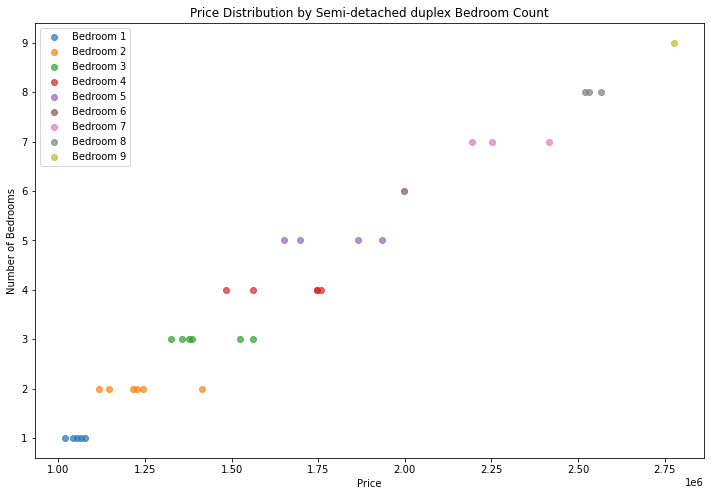



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  33.00000  32.00000      38.00000       42.00000
mean    4.33333   3.68750       3.68421  1920354.72712
std     2.56986   2.22069       1.39701   611730.49707
min     1.00000   1.00000       1.00000  1126028.75600
25%     2.00000   2.00000       3.00000  1359970.90375
50%     5.00000   4.00000       4.00000  1830986.37000
75%     6.00000   5.00000       5.00000  2405784.58350
max     9.00000   7.00000       6.00000  3079287.83200


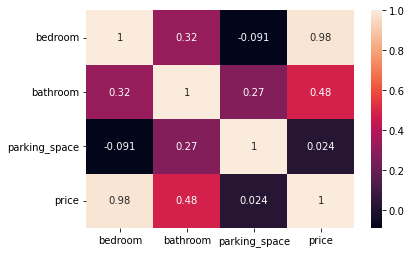

         loc      title  bedroom  bathroom  parking_space      price
13674  Benue  Townhouse     1.00       NaN           6.00 1293928.62
13196  Benue  Townhouse     1.00      5.00           4.00 1281033.14
12922  Benue  Townhouse     1.00      7.00           4.00 1359345.27
3230   Benue  Townhouse     1.00      5.00           5.00 1307058.91
11204  Benue  Townhouse     1.00      2.00           3.00 1137539.17
9408   Benue  Townhouse     1.00      2.00           3.00 1161921.84
8433   Benue  Townhouse     1.00      2.00           3.00 1181501.84
12945  Benue  Townhouse     2.00      1.00           2.00 1268770.29
11609  Benue  Townhouse     2.00       NaN           3.00 1412264.26
4143   Benue  Townhouse     2.00      2.00           4.00 1361847.81
11597  Benue  Townhouse     3.00      2.00           1.00 1375362.94
8721   Benue  Townhouse     3.00       NaN           5.00 1550167.53
7982   Benue  Townhouse     3.00      2.00            NaN 1452458.94
6593   Benue  Townhouse     3.00  

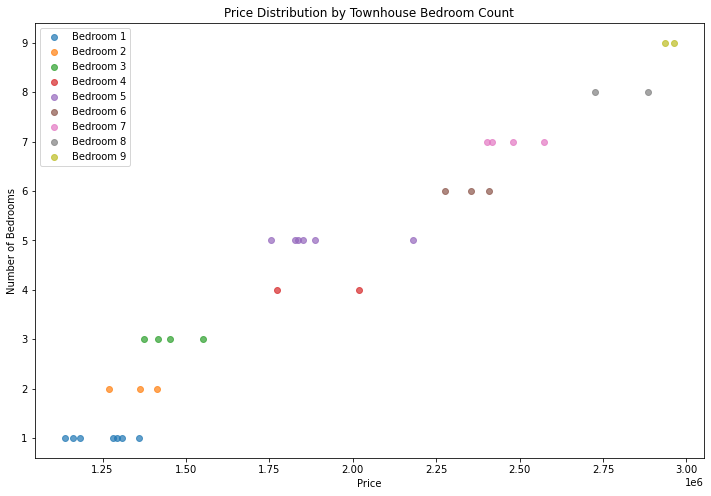



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  26.00000  22.00000      25.00000       27.00000
mean    4.00000   2.40909       3.20000  2246870.03904
std     2.28035   1.50108       1.73205   560348.66792
min     1.00000   1.00000       1.00000  1339335.70700
25%     2.00000   1.00000       2.00000  1805932.95800
50%     4.00000   2.00000       3.00000  2149031.96400
75%     5.75000   3.00000       4.00000  2688134.01550
max     9.00000   6.00000       6.00000  3453557.97200


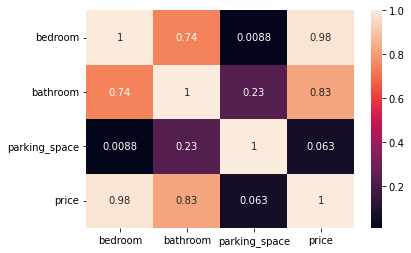

         loc      title  bedroom  bathroom  parking_space      price
7416   Benue  Penthouse     1.00      1.00           1.00 1339335.71
6147   Benue  Penthouse     1.00       NaN           6.00 1763017.67
13882  Benue  Penthouse     1.00      1.00           1.00 1616218.38
1704   Benue  Penthouse     1.00       NaN           6.00 1763017.67
10575  Benue  Penthouse     2.00      2.00           4.00 1876944.93
3404   Benue  Penthouse     2.00      2.00           1.00 1862116.59
9386   Benue  Penthouse     2.00      1.00           2.00 1603031.78
9014   Benue  Penthouse     2.00      1.00           4.00 1670698.80
12234  Benue  Penthouse     2.00      3.00           5.00 1806338.07
8344   Benue  Penthouse     3.00      1.00           4.00 1907468.31
8979   Benue  Penthouse     3.00      2.00           2.00 2063490.72
7333   Benue  Penthouse     3.00      1.00           1.00 1805527.84
4338   Benue  Penthouse     4.00      1.00           4.00 2149031.96
556    Benue  Penthouse     4.00  

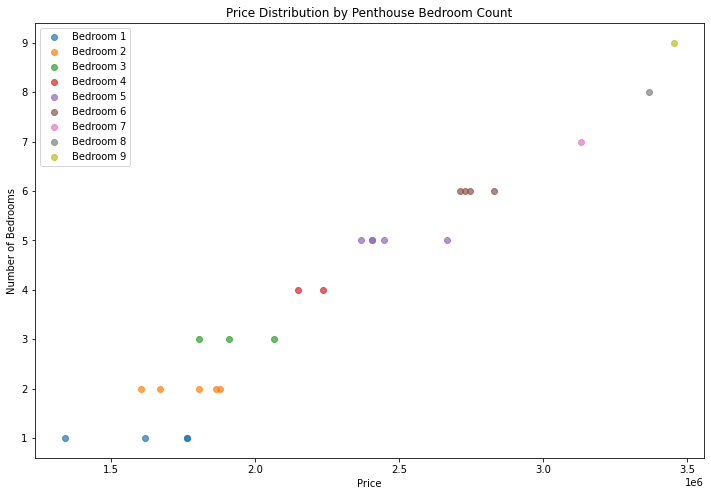



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  6.00000  6.00000       6.00000        7.00000
mean   2.16667  1.50000       2.66667  1057326.69926
std    1.60208  0.54772       1.50555   342500.26543
min    1.00000  1.00000       1.00000   711218.85020
25%    1.00000  1.00000       1.25000   750331.96030
50%    1.50000  1.50000       3.00000  1055332.11500
75%    2.75000  2.00000       4.00000  1264096.67800
max    5.00000  2.00000       4.00000  1605878.65300


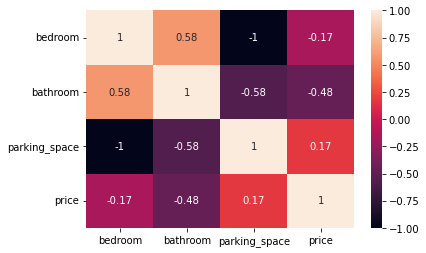

         loc    title  bedroom  bathroom  parking_space      price
2351   Benue  Cottage     1.00      1.00           4.00  711218.85
4110   Benue  Cottage     1.00      2.00           4.00  724019.27
11415  Benue  Cottage     1.00      1.00           4.00 1055332.11
5783   Benue  Cottage     2.00      2.00           1.00  776644.65
2830   Benue  Cottage     3.00       NaN           2.00 1326349.47
8073   Benue  Cottage     5.00      1.00            NaN 1605878.65
4509   Benue  Cottage      NaN      2.00           1.00 1201843.89


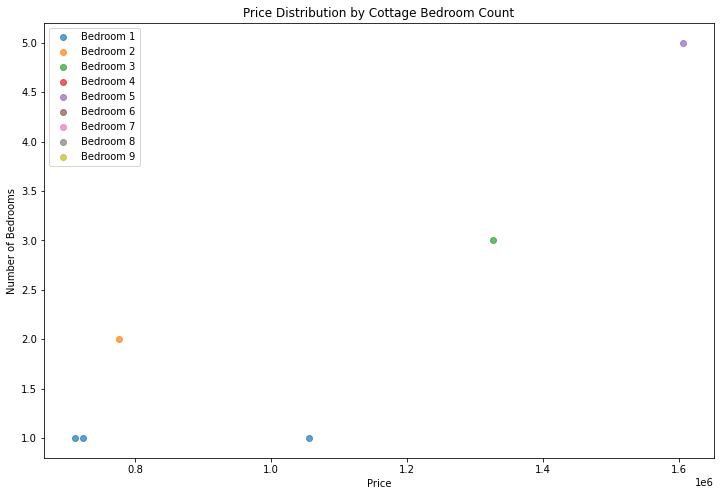

In [262]:
# Benue
Benue = housing_train[housing_train["loc" ] == "Benue"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Benue, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      25.00000       30.00000
mean    4.11111   2.73077       2.20000  3077384.76673
std     2.70801   1.34336       1.35401  1066045.56366
min     1.00000   1.00000       1.00000  1234731.59100
25%     2.00000   2.00000       1.00000  2389781.61375
50%     3.00000   2.50000       2.00000  2965656.68950
75%     6.50000   3.75000       3.00000  4044226.25300
max     9.00000   5.00000       5.00000  4694689.81600


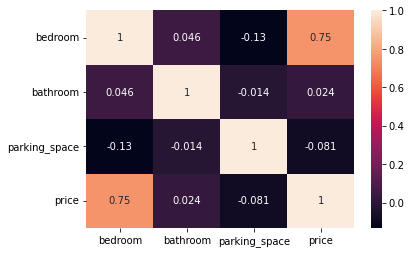

           loc    title  bedroom  bathroom  parking_space      price
5904   Adamawa  Mansion     1.00      1.00           1.00 2948282.96
5654   Adamawa  Mansion     1.00      1.00           3.00 2988777.11
2473   Adamawa  Mansion     1.00      5.00           4.00 2371277.03
3068   Adamawa  Mansion     1.00      2.00           5.00 2197536.43
438    Adamawa  Mansion     2.00      5.00           2.00 2569140.86
5919   Adamawa  Mansion     2.00      1.00           1.00 3405769.57
2591   Adamawa  Mansion     2.00      4.00           1.00 2445295.37
9750   Adamawa  Mansion     2.00      2.00           1.00 1343085.81
4828   Adamawa  Mansion     2.00      2.00            NaN 1461063.90
4689   Adamawa  Mansion     3.00      4.00           1.00 2748964.09
6720   Adamawa  Mansion     3.00      3.00           4.00 2822914.48
10143  Adamawa  Mansion     3.00      3.00            NaN 2724016.54
6076   Adamawa  Mansion     3.00       NaN           2.00 2724016.54
1851   Adamawa  Mansion     3.00  

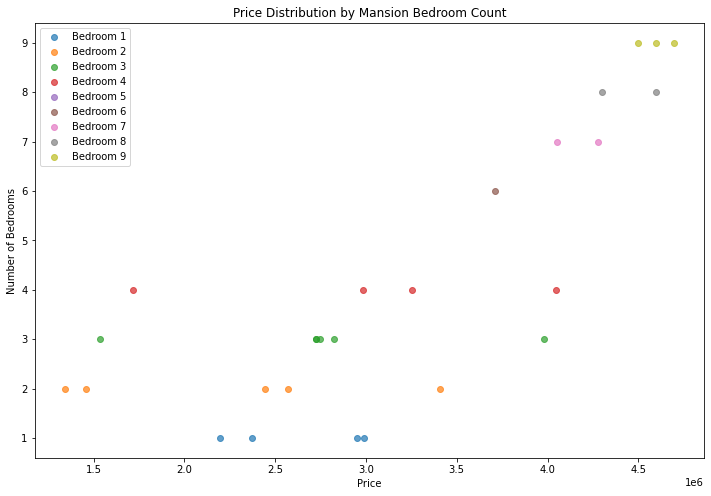



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      24.00000       31.00000
mean    3.66667   3.34615       3.37500  1930671.39687
std     2.33699   2.18984       1.66322   571337.15564
min     1.00000   1.00000       1.00000  1244327.98000
25%     2.00000   1.25000       2.00000  1468773.21600
50%     4.00000   2.50000       3.00000  1811437.55400
75%     5.00000   5.00000       5.00000  2216425.74000
max     9.00000   7.00000       6.00000  3256987.10100


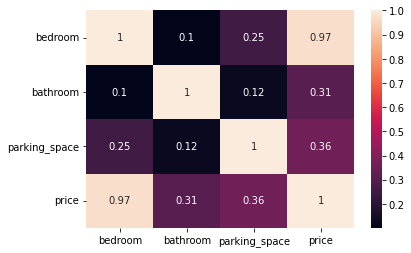

           loc            title  bedroom  bathroom  parking_space      price
7082   Adamawa  Detached duplex     1.00      2.00           1.00 1270328.24
13315  Adamawa  Detached duplex     1.00      5.00           5.00 1430799.70
2431   Adamawa  Detached duplex     1.00      2.00           3.00 1244327.98
9059   Adamawa  Detached duplex     1.00      7.00           5.00 1516943.04
8391   Adamawa  Detached duplex     1.00      4.00            NaN 1359099.68
7666   Adamawa  Detached duplex     1.00      4.00           2.00 1301842.97
13452  Adamawa  Detached duplex     2.00      5.00           1.00 1523849.13
11201  Adamawa  Detached duplex     2.00      2.00           3.00 1468980.38
2132   Adamawa  Detached duplex     2.00      1.00           4.00 1464686.14
10708  Adamawa  Detached duplex     2.00      1.00           4.00 1444609.82
6194   Adamawa  Detached duplex     2.00       NaN           4.00 1468566.06
6944   Adamawa  Detached duplex     2.00       NaN           3.00 1624177.50

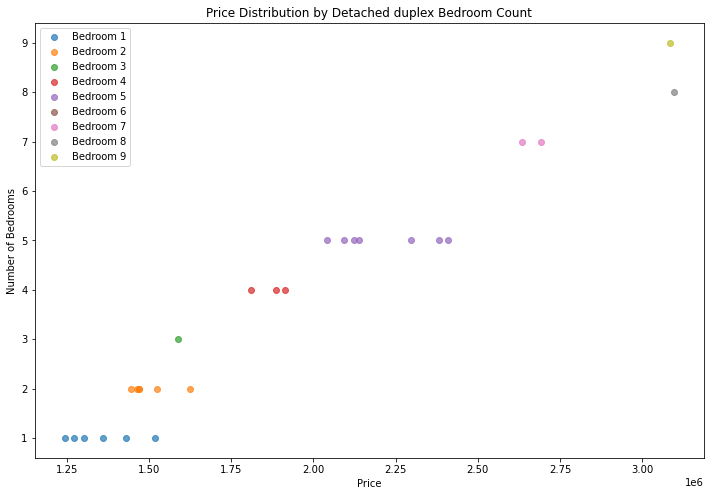



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  26.00000  29.00000      25.00000       31.00000
mean    4.19231   2.86207       3.20000  1411303.81375
std     2.19124   1.99507       1.58114   419843.49806
min     1.00000   1.00000       1.00000   771545.43960
25%     3.00000   1.00000       2.00000  1150673.05200
50%     4.00000   2.00000       4.00000  1319635.26000
75%     5.00000   4.00000       4.00000  1598996.64250
max     9.00000   7.00000       6.00000  2353129.67700


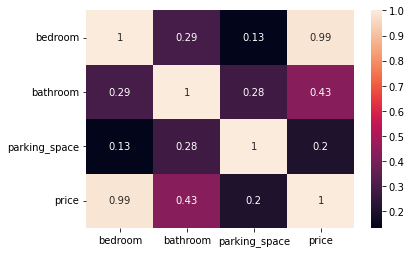

           loc      title  bedroom  bathroom  parking_space      price
56     Adamawa  Apartment     1.00      1.00           2.00  804146.06
5343   Adamawa  Apartment     1.00      1.00           2.00  771545.44
4452   Adamawa  Apartment     1.00      5.00           1.00  862964.38
7604   Adamawa  Apartment     2.00      1.00            NaN  978926.06
2675   Adamawa  Apartment     2.00      4.00           6.00 1089608.71
5888   Adamawa  Apartment     2.00      3.00           2.00  989327.30
497    Adamawa  Apartment     3.00      4.00           2.00 1186606.85
1138   Adamawa  Apartment     3.00      2.00           4.00 1142312.86
4921   Adamawa  Apartment     3.00      1.00           5.00 1159033.24
781    Adamawa  Apartment     3.00      2.00            NaN 1071901.89
8671   Adamawa  Apartment     3.00      1.00            NaN 1177251.28
11211  Adamawa  Apartment     4.00      2.00           4.00 1319055.60
6522   Adamawa  Apartment     4.00      1.00           4.00 1301004.33
9704  

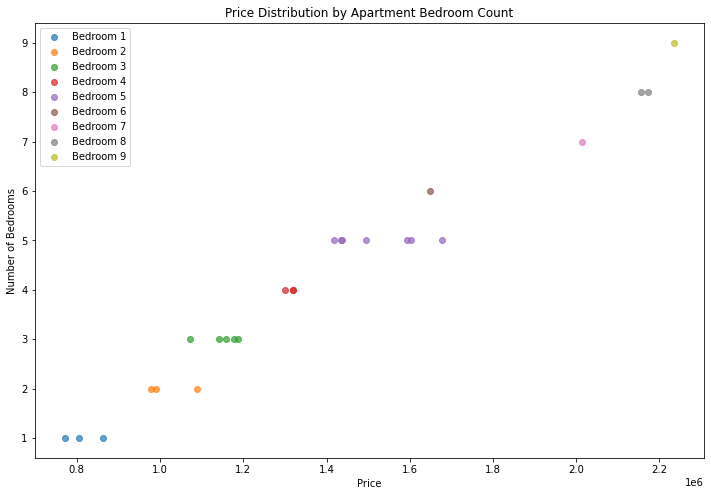



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  24.00000  23.00000      25.00000       29.00000
mean    4.58333   2.91304       3.28000  1508691.12728
std     2.08341   1.95199       1.42945   441110.78659
min     1.00000   1.00000       1.00000   845595.24260
25%     3.00000   2.00000       2.00000  1181906.65700
50%     4.00000   2.00000       3.00000  1407164.17200
75%     6.25000   4.00000       4.00000  1826250.61200
max     8.00000   7.00000       6.00000  2302521.74900


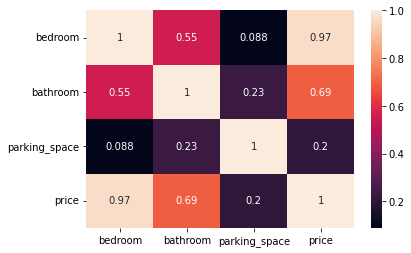

           loc     title  bedroom  bathroom  parking_space      price
6018   Adamawa  Bungalow     1.00       NaN           2.00  871816.07
3874   Adamawa  Bungalow     1.00      2.00           4.00 1004441.03
216    Adamawa  Bungalow     2.00      2.00           4.00 1118895.39
1741   Adamawa  Bungalow     2.00      2.00            NaN 1098074.77
7631   Adamawa  Bungalow     3.00       NaN           2.00 1352248.89
7615   Adamawa  Bungalow     3.00       NaN           5.00 1446035.60
1273   Adamawa  Bungalow     3.00       NaN           4.00 1181906.66
7664   Adamawa  Bungalow     4.00      1.00           5.00 1475225.65
6263   Adamawa  Bungalow     4.00      1.00           3.00 1326827.37
13901  Adamawa  Bungalow     4.00      2.00           4.00 1333994.01
1158   Adamawa  Bungalow     4.00      2.00           3.00 1464909.26
870    Adamawa  Bungalow     4.00      2.00           2.00 1407164.17
1889   Adamawa  Bungalow     4.00       NaN           1.00 1262173.50
4297   Adamawa  Bung

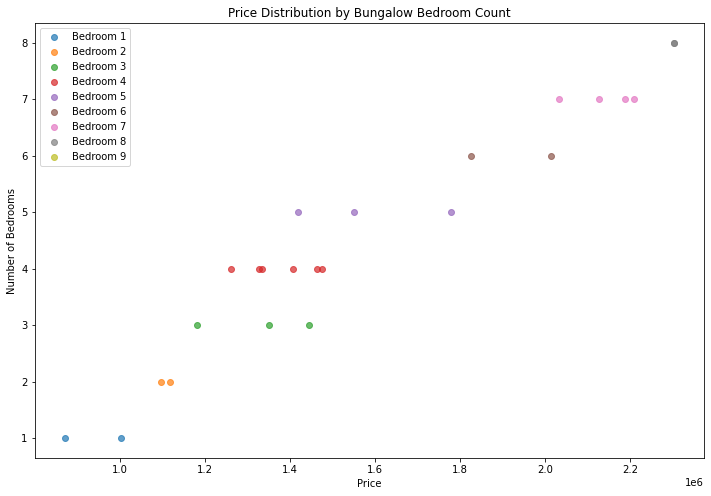



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  35.00000  31.00000      31.00000       40.00000
mean    4.62857   3.00000       3.38710  1625528.82108
std     2.63557   1.87972       1.54224   529418.38957
min     1.00000   1.00000       1.00000   836001.08070
25%     2.00000   2.00000       2.00000  1195335.86850
50%     4.00000   2.00000       3.00000  1488159.31000
75%     6.50000   5.00000       5.00000  2016293.67875
max     9.00000   6.00000       6.00000  2637745.94900


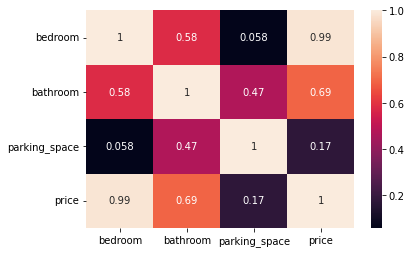

           loc title  bedroom  bathroom  parking_space      price
563    Adamawa  Flat     1.00       NaN           1.00  836001.08
10211  Adamawa  Flat     1.00       NaN           2.00  997115.48
3321   Adamawa  Flat     1.00      2.00           4.00  922707.27
11192  Adamawa  Flat     2.00      1.00           2.00 1036404.29
9814   Adamawa  Flat     2.00      1.00            NaN 1000985.41
7031   Adamawa  Flat     2.00      6.00            NaN 1181732.94
3431   Adamawa  Flat     2.00      2.00           2.00 1099910.13
12371  Adamawa  Flat     2.00      4.00           5.00 1202365.72
3137   Adamawa  Flat     2.00      1.00           5.00 1108391.16
3287   Adamawa  Flat     2.00       NaN           2.00 1108579.00
9286   Adamawa  Flat     3.00       NaN           3.00 1199870.18
12112  Adamawa  Flat     3.00      2.00            NaN 1277381.86
9464   Adamawa  Flat     3.00      6.00           6.00 1466856.22
10399  Adamawa  Flat     3.00      1.00           1.00 1157802.60
4606   Ada

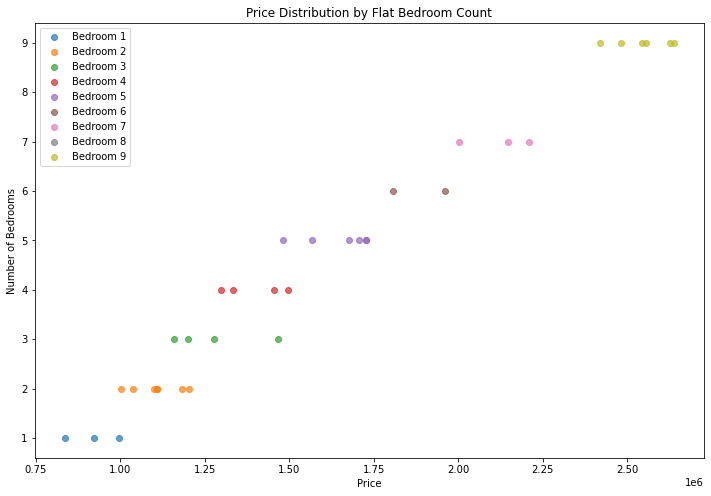



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  24.00000  26.00000      22.00000       29.00000
mean    3.87500   2.96154       2.77273  1650926.38184
std     2.32776   1.86506       1.44525   569889.00586
min     1.00000   1.00000       1.00000   973609.51040
25%     2.00000   1.25000       1.25000  1153828.96900
50%     4.00000   2.00000       3.00000  1561970.80000
75%     5.00000   4.75000       4.00000  1876321.76700
max     9.00000   7.00000       6.00000  2881940.08700


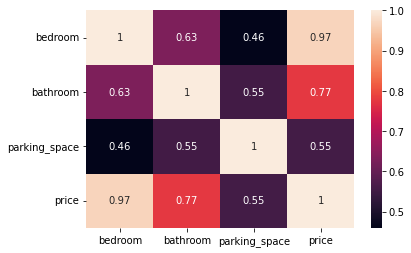

           loc           title  bedroom  bathroom  parking_space      price
13171  Adamawa  Terrace duplex     1.00      1.00           3.00 1025569.57
2589   Adamawa  Terrace duplex     1.00      1.00           1.00 1038847.27
11795  Adamawa  Terrace duplex     1.00      2.00            NaN 1039990.07
5992   Adamawa  Terrace duplex     1.00      2.00            NaN  973609.51
1603   Adamawa  Terrace duplex     2.00      2.00            NaN 1207876.39
12308  Adamawa  Terrace duplex     2.00       NaN           3.00 1153828.97
2490   Adamawa  Terrace duplex     2.00      4.00           4.00 1309917.57
8223   Adamawa  Terrace duplex     2.00       NaN           1.00 1143404.71
3387   Adamawa  Terrace duplex     2.00      1.00            NaN 1056487.31
5776   Adamawa  Terrace duplex     3.00      2.00           1.00 1256473.57
7198   Adamawa  Terrace duplex     4.00      5.00           3.00 1710869.06
9636   Adamawa  Terrace duplex     4.00      1.00            NaN 1523060.82
12286  Adama

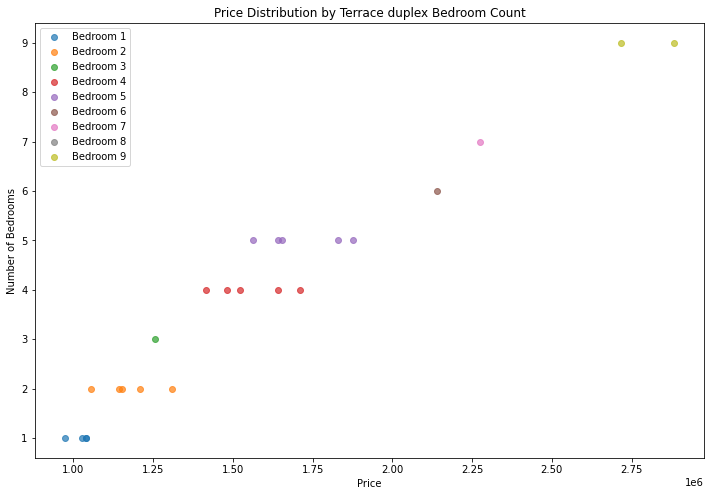



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  15.00000  21.00000      19.00000       23.00000
mean    6.13333   2.80952       3.57895  1934579.56609
std     2.53170   1.93956       1.67716   626829.25338
min     2.00000   1.00000       1.00000  1079475.24700
25%     5.00000   1.00000       2.00000  1324478.41300
50%     6.00000   2.00000       4.00000  1887927.70200
75%     8.50000   4.00000       5.00000  2518614.04500
max     9.00000   7.00000       6.00000  2823276.43100


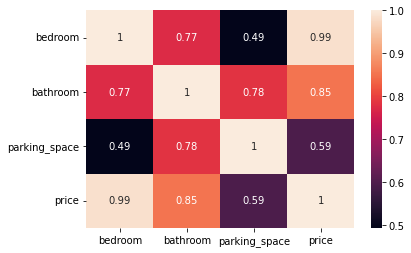

           loc                 title  bedroom  bathroom  parking_space  \
2287   Adamawa  Semi-detached duplex     2.00      2.00            NaN   
6795   Adamawa  Semi-detached duplex     2.00      1.00           1.00   
5936   Adamawa  Semi-detached duplex     3.00      2.00           4.00   
1834   Adamawa  Semi-detached duplex     5.00      1.00            NaN   
3338   Adamawa  Semi-detached duplex     5.00      1.00            NaN   
5395   Adamawa  Semi-detached duplex     5.00      3.00           5.00   
6817   Adamawa  Semi-detached duplex     5.00      1.00           1.00   
6519   Adamawa  Semi-detached duplex     6.00      1.00           3.00   
7867   Adamawa  Semi-detached duplex     7.00      4.00           5.00   
5031   Adamawa  Semi-detached duplex     8.00      5.00           6.00   
5596   Adamawa  Semi-detached duplex     8.00      3.00           2.00   
3627   Adamawa  Semi-detached duplex     9.00      2.00            NaN   
6474   Adamawa  Semi-detached duplex  

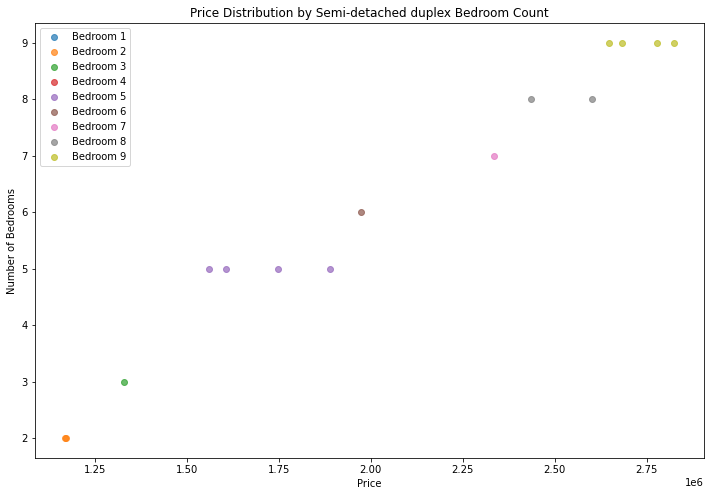



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  25.00000  22.00000      24.00000       28.00000
mean    4.84000   3.00000       2.87500  1969273.73182
std     2.59294   1.74574       1.84891   579922.59092
min     1.00000   1.00000       1.00000  1053065.55600
25%     3.00000   2.00000       1.00000  1523119.49825
50%     4.00000   2.50000       2.00000  1790636.90000
75%     8.00000   4.00000       4.25000  2536159.69575
max     9.00000   7.00000       6.00000  2844351.43800


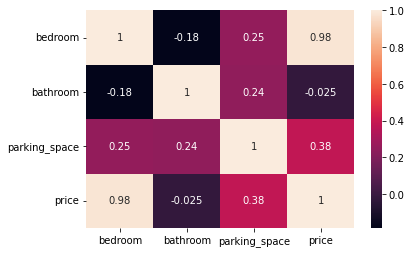

           loc      title  bedroom  bathroom  parking_space      price
13798  Adamawa  Townhouse     1.00       NaN           3.00 1053065.56
12533  Adamawa  Townhouse     1.00      2.00            NaN 1163564.94
2416   Adamawa  Townhouse     1.00      4.00           2.00 1189825.52
13543  Adamawa  Townhouse     2.00      4.00           3.00 1412264.26
2635   Adamawa  Townhouse     2.00       NaN           1.00 1289638.41
10067  Adamawa  Townhouse     3.00       NaN           2.00 1472090.21
7797   Adamawa  Townhouse     3.00      2.00           4.00 1564486.92
2155   Adamawa  Townhouse     4.00       NaN           2.00 1639809.05
13728  Adamawa  Townhouse     4.00      6.00           5.00 1954061.91
12765  Adamawa  Townhouse     4.00      1.00           1.00 1502666.97
12164  Adamawa  Townhouse     4.00       NaN           1.00 1529937.01
11741  Adamawa  Townhouse     4.00      2.00           3.00 1745386.09
1082   Adamawa  Townhouse     4.00      3.00           3.00 1784542.16
4869  

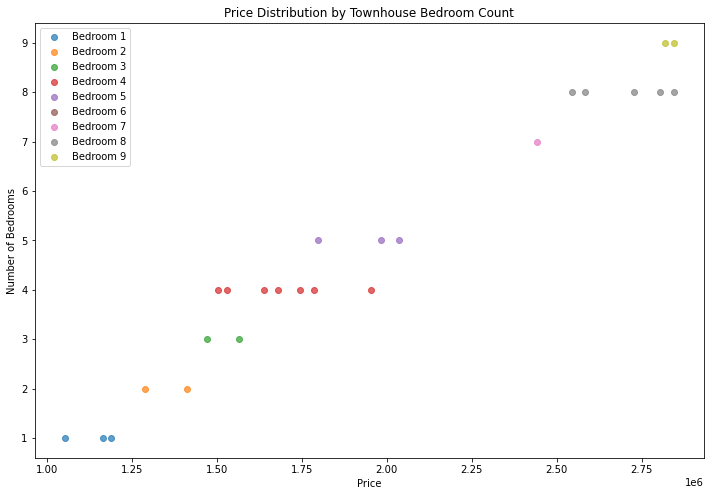



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  25.00000  23.00000      24.00000       29.00000
mean    4.32000   3.21739       2.79167  2323882.78717
std     2.37557   2.31510       1.61458   603964.82683
min     1.00000   1.00000       1.00000  1373169.21400
25%     2.00000   1.00000       1.00000  1752081.58700
50%     4.00000   2.00000       2.50000  2239814.55600
75%     6.00000   5.50000       4.00000  2826023.15400
max     9.00000   7.00000       6.00000  3487391.47900


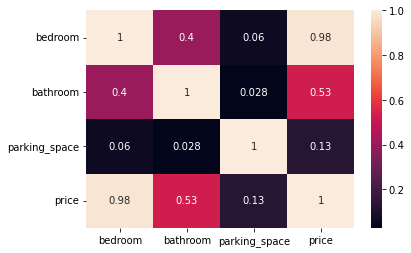

           loc      title  bedroom  bathroom  parking_space      price
13585  Adamawa  Penthouse     1.00      1.00           2.00 1373169.21
1700   Adamawa  Penthouse     1.00      6.00            NaN 1661517.15
1986   Adamawa  Penthouse     1.00      5.00           1.00 1542947.25
11611  Adamawa  Penthouse     2.00      1.00           4.00 1752081.59
10174  Adamawa  Penthouse     2.00      3.00           1.00 1671004.05
3814   Adamawa  Penthouse     2.00      2.00           3.00 1740882.99
3945   Adamawa  Penthouse     2.00      1.00           1.00 1773337.37
5095   Adamawa  Penthouse     2.00       NaN           1.00 1745239.93
3686   Adamawa  Penthouse     3.00      6.00           4.00 2161982.74
5819   Adamawa  Penthouse     3.00      1.00           2.00 1812592.18
1379   Adamawa  Penthouse     4.00      1.00           3.00 2239814.56
1719   Adamawa  Penthouse     4.00       NaN           2.00 2048470.40
4060   Adamawa  Penthouse     4.00      1.00            NaN 2122354.54
11797 

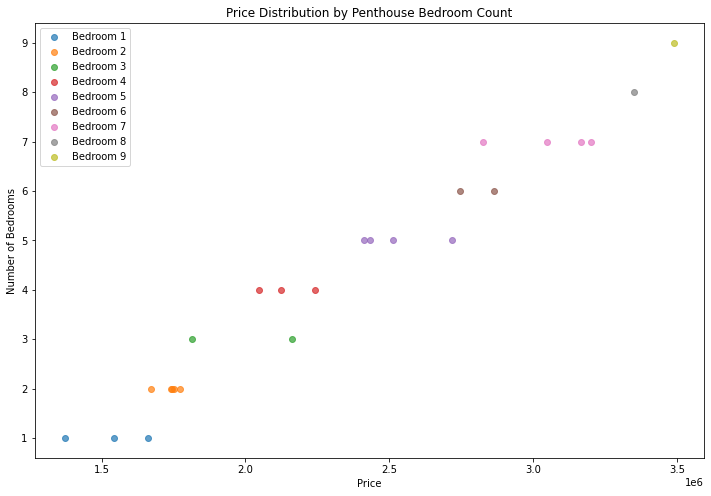



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  12.00000  13.00000      13.00000       15.00000
mean    2.25000   1.76923       2.69231  1105364.06072
std     1.71226   0.43853       1.18213   310011.51665
min     1.00000   1.00000       1.00000   683549.99020
25%     1.00000   2.00000       2.00000   887176.96795
50%     1.50000   2.00000       3.00000  1109058.69800
75%     2.75000   2.00000       4.00000  1211415.00100
max     5.00000   2.00000       4.00000  1702913.68000


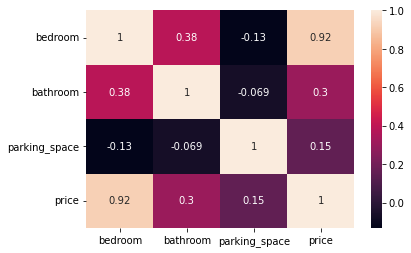

           loc    title  bedroom  bathroom  parking_space      price
1092   Adamawa  Cottage     1.00      2.00           4.00 1037807.41
2422   Adamawa  Cottage     1.00      1.00           3.00  736546.53
7599   Adamawa  Cottage     1.00      1.00            NaN 1108365.16
9281   Adamawa  Cottage     1.00      2.00           2.00  714464.87
10624  Adamawa  Cottage     1.00      1.00           3.00 1055708.77
13341  Adamawa  Cottage     1.00      2.00           2.00  683549.99
796    Adamawa  Cottage     2.00       NaN           1.00 1117864.52
2293   Adamawa  Cottage     2.00       NaN           4.00 1143405.44
10970  Adamawa  Cottage     2.00      2.00           4.00 1191224.33
8849   Adamawa  Cottage     5.00      2.00            NaN 1231605.67
13246  Adamawa  Cottage     5.00      2.00           4.00 1702913.68
13688  Adamawa  Cottage     5.00      2.00           1.00 1574432.12
344    Adamawa  Cottage      NaN      2.00           3.00 1109058.70
4519   Adamawa  Cottage      NaN  

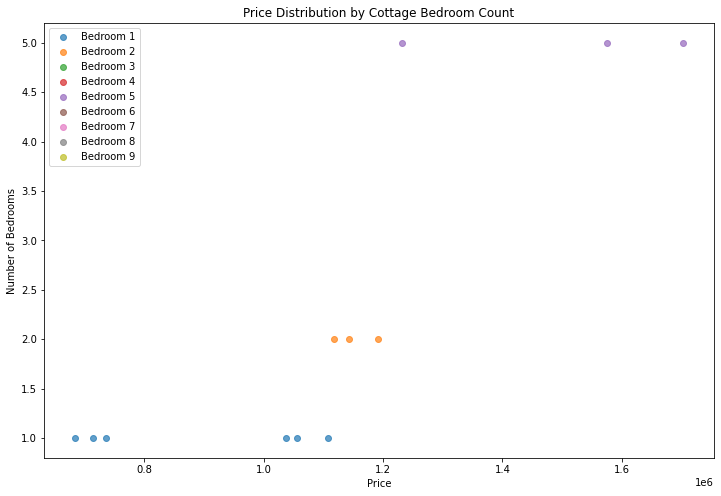

In [263]:
#Adamawa
Adamawa = housing_train[housing_train["loc" ] == "Adamawa"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Adamawa, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  26.00000  33.00000      31.00000       36.00000
mean    4.61538   2.81818       2.87097  3279801.97458
std     2.51518   2.00709       1.52188  1089848.27482
min     1.00000   1.00000       1.00000  1268470.31300
25%     2.00000   1.00000       2.00000  2414093.93775
50%     5.00000   2.00000       3.00000  3344671.23600
75%     6.00000   4.00000       4.00000  4243988.33875
max     9.00000   7.00000       6.00000  5066226.30500


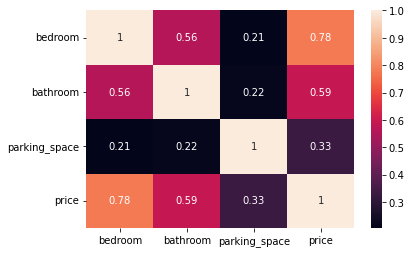

           loc    title  bedroom  bathroom  parking_space      price
263    Katsina  Mansion     1.00      1.00           2.00 2963837.23
8529   Katsina  Mansion     1.00      1.00           3.00 3217669.27
10931  Katsina  Mansion     1.00       NaN           3.00 2321828.06
10969  Katsina  Mansion     1.00      1.00            NaN 2172588.88
228    Katsina  Mansion     2.00      2.00           1.00 2296502.32
6933   Katsina  Mansion     2.00      4.00            NaN 2643091.25
9090   Katsina  Mansion     2.00      3.00           5.00 2568694.73
4547   Katsina  Mansion     2.00      1.00           1.00 2222105.79
10866  Katsina  Mansion     3.00      1.00           5.00 2723570.40
6450   Katsina  Mansion     4.00      2.00           6.00 3155878.75
12453  Katsina  Mansion     5.00      2.00           3.00 3319723.68
12638  Katsina  Mansion     5.00      2.00           1.00 1900586.33
2581   Katsina  Mansion     5.00       NaN           1.00 3369618.79
8305   Katsina  Mansion     5.00  

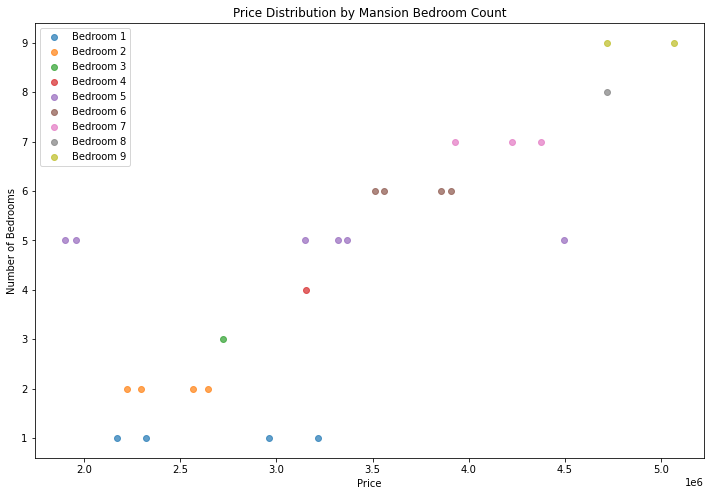



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  26.00000  22.00000      23.00000       28.00000
mean    4.38462   3.72727       3.52174  2025011.54189
std     2.21046   2.05129       1.67521   502445.37369
min     1.00000   1.00000       1.00000  1258513.01200
25%     3.00000   2.00000       2.00000  1689565.86400
50%     4.00000   4.00000       3.00000  1878997.25200
75%     6.00000   5.75000       5.00000  2453197.35500
max     8.00000   7.00000       6.00000  2966414.10300


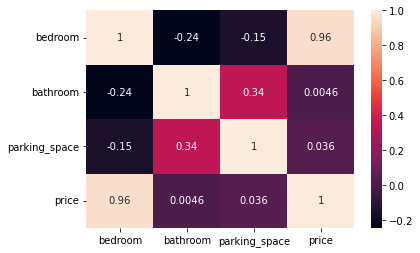

           loc            title  bedroom  bathroom  parking_space      price
717    Katsina  Detached duplex     1.00      6.00           3.00 1416614.67
10770  Katsina  Detached duplex     1.00      5.00           6.00 1459428.05
6078   Katsina  Detached duplex     1.00      2.00            NaN 1301584.68
12571  Katsina  Detached duplex     2.00      5.00           5.00 1638362.53
5782   Katsina  Detached duplex     2.00      6.00           6.00 1710062.56
11943  Katsina  Detached duplex     3.00      2.00           2.00 1643465.25
1189   Katsina  Detached duplex     3.00      6.00            NaN 1781390.58
9737   Katsina  Detached duplex     3.00      7.00           4.00 1910347.31
6354   Katsina  Detached duplex     3.00      6.00           4.00 1867275.64
4845   Katsina  Detached duplex     3.00       NaN           3.00 1665566.34
8573   Katsina  Detached duplex     4.00      2.00           1.00 1780230.56
5801   Katsina  Detached duplex     4.00      1.00            NaN 1731100.05

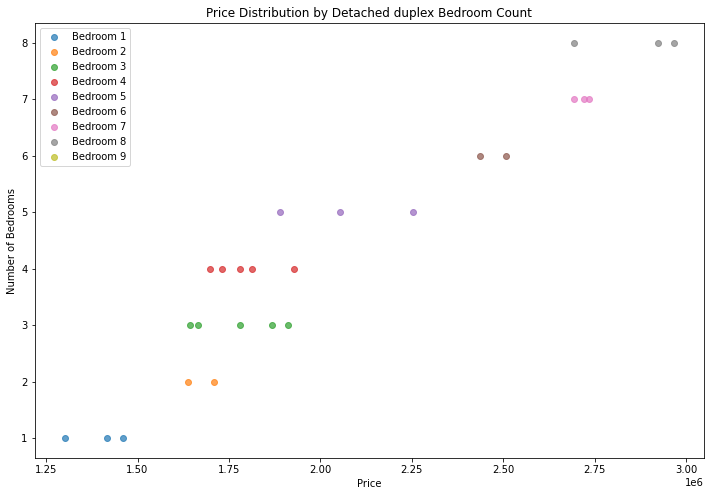



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  25.00000  25.00000      30.00000       32.00000
mean    4.36000   3.20000       3.20000  1415467.30004
std     2.67519   1.95789       1.68973   477745.07668
min     1.00000   1.00000       1.00000   826363.93140
25%     2.00000   2.00000       2.00000  1031785.58400
50%     4.00000   2.00000       3.50000  1273060.22900
75%     6.00000   4.00000       4.00000  1798806.75750
max     9.00000   7.00000       6.00000  2353129.67700


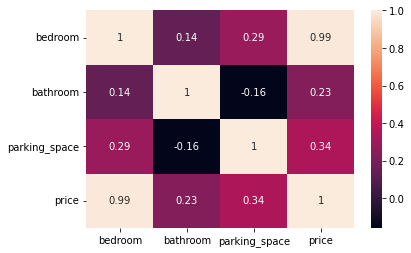

           loc      title  bedroom  bathroom  parking_space      price
9190   Katsina  Apartment     1.00      5.00           2.00  881182.42
1296   Katsina  Apartment     1.00      4.00           2.00  853773.18
2305   Katsina  Apartment     1.00       NaN           2.00  826363.93
12331  Katsina  Apartment     2.00      2.00           2.00 1036856.72
485    Katsina  Apartment     2.00      3.00           6.00 1062199.46
8988   Katsina  Apartment     2.00      3.00            NaN 1007545.34
7961   Katsina  Apartment     2.00      2.00           5.00 1016572.18
7433   Katsina  Apartment     2.00      7.00           1.00 1080746.24
11980  Katsina  Apartment     2.00      2.00           2.00 1007142.92
6077   Katsina  Apartment     2.00      3.00           6.00 1062199.46
6783   Katsina  Apartment     3.00      2.00           4.00 1152807.75
7388   Katsina  Apartment     4.00      7.00           4.00 1479935.12
6157   Katsina  Apartment     4.00      2.00            NaN 1200005.03
6994  

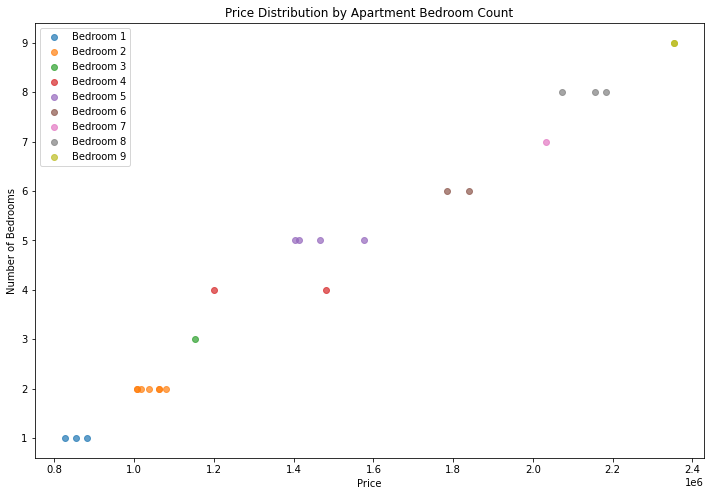



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  30.00000  30.00000      28.00000       36.00000
mean    4.86667   3.56667       3.25000  1696325.32592
std     2.51524   2.07918       1.62447   505002.71222
min     1.00000   1.00000       1.00000   837538.92220
25%     3.00000   2.00000       2.00000  1257841.62975
50%     4.50000   3.00000       3.00000  1722260.46400
75%     7.00000   5.00000       4.25000  2055402.78300
max     9.00000   7.00000       6.00000  2627241.71600


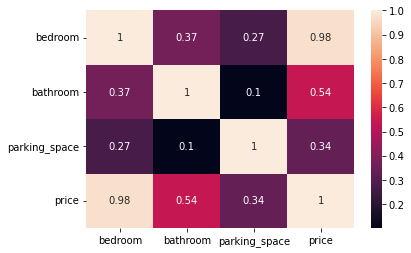

           loc     title  bedroom  bathroom  parking_space      price
5139   Katsina  Bungalow     1.00      1.00           1.00  837538.92
13611  Katsina  Bungalow     2.00      6.00           1.00 1181732.94
13462  Katsina  Bungalow     2.00       NaN           6.00 1254511.19
12173  Katsina  Bungalow     2.00       NaN           3.00 1010774.21
1951   Katsina  Bungalow     2.00      3.00           5.00 1171040.86
12503  Katsina  Bungalow     2.00      1.00           4.00 1003747.65
11345  Katsina  Bungalow     3.00      3.00           5.00 1352061.04
12174  Katsina  Bungalow     3.00      1.00           3.00 1124229.48
10566  Katsina  Bungalow     3.00      2.00            NaN 1258951.78
10956  Katsina  Bungalow     3.00      7.00           2.00 1414898.59
1528   Katsina  Bungalow     3.00      2.00            NaN 1171851.14
3963   Katsina  Bungalow     3.00      4.00           1.00 1300103.42
8027   Katsina  Bungalow     4.00      5.00            NaN 1558883.82
1280   Katsina  Bung

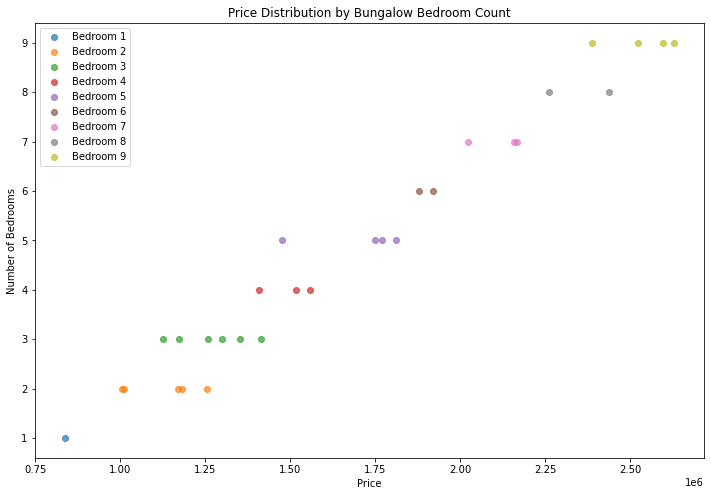



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  28.00000  25.00000      29.00000       33.00000
mean    4.35714   3.92000       3.06897  1591383.06776
std     2.52710   2.21585       1.68885   489094.33871
min     1.00000   1.00000       1.00000   878130.27880
25%     2.00000   2.00000       2.00000  1171228.71000
50%     4.50000   4.00000       2.00000  1600712.90500
75%     6.25000   6.00000       5.00000  2000678.21400
max     9.00000   7.00000       6.00000  2564592.01100


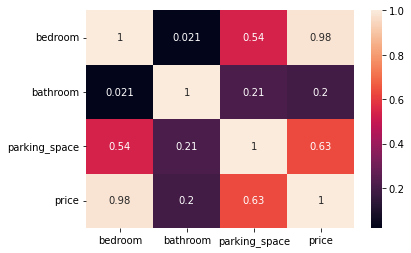

           loc title  bedroom  bathroom  parking_space      price
8111   Katsina  Flat     1.00      1.00           2.00  878130.28
9220   Katsina  Flat     1.00      7.00           2.00 1059765.18
7293   Katsina  Flat     1.00      7.00           2.00 1059765.18
4105   Katsina  Flat     1.00      2.00           3.00  988760.39
13823  Katsina  Flat     1.00       NaN           3.00  976953.24
12330  Katsina  Flat     2.00       NaN           4.00 1110741.97
11110  Katsina  Flat     2.00      5.00           2.00 1171228.71
7715   Katsina  Flat     2.00      6.00           5.00 1265015.42
3319   Katsina  Flat     3.00      5.00           1.00 1331428.27
13063  Katsina  Flat     3.00      1.00           1.00 1166185.86
3502   Katsina  Flat     3.00       NaN           4.00 1393890.13
67     Katsina  Flat     3.00      2.00           2.00 1230014.98
10204  Katsina  Flat     4.00      7.00           2.00 1600712.91
5254   Katsina  Flat     4.00      7.00            NaN 1600712.91
13645  Kat

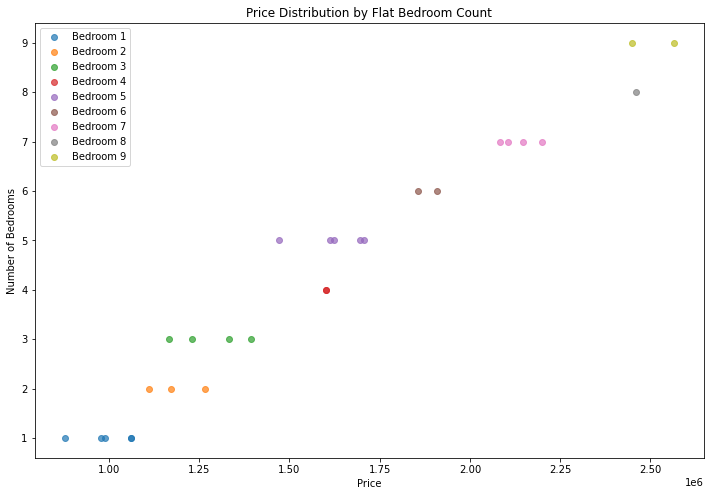



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  28.00000  22.00000      23.00000       31.00000
mean    4.85714   3.54545       3.34783  1792892.89632
std     2.12070   2.10955       1.69515   436495.45457
min     1.00000   1.00000       1.00000  1065779.48600
25%     3.75000   2.00000       2.00000  1478044.35900
50%     4.50000   3.00000       4.00000  1699051.79400
75%     6.00000   5.00000       4.00000  1972297.40250
max     9.00000   7.00000       6.00000  2753006.84000


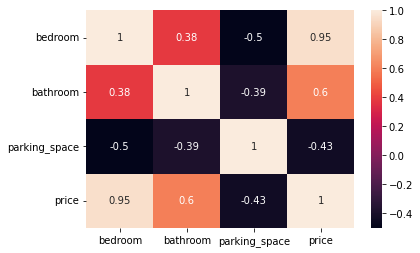

           loc           title  bedroom  bathroom  parking_space      price
7905   Katsina  Terrace duplex     1.00      1.00           6.00 1065779.49
2930   Katsina  Terrace duplex     2.00      2.00            NaN 1176208.82
6133   Katsina  Terrace duplex     2.00       NaN           4.00 1166939.45
6139   Katsina  Terrace duplex     3.00      2.00            NaN 1399451.89
2955   Katsina  Terrace duplex     3.00      6.00            NaN 1572568.53
3870   Katsina  Terrace duplex     3.00      2.00           2.00 1376641.47
4216   Katsina  Terrace duplex     3.00      2.00            NaN 1478453.09
11112  Katsina  Terrace duplex     4.00      1.00           2.00 1410355.32
11075  Katsina  Terrace duplex     4.00       NaN           4.00 1769532.71
10916  Katsina  Terrace duplex     4.00       NaN           4.00 1477635.63
7746   Katsina  Terrace duplex     4.00      7.00           1.00 1734503.58
6267   Katsina  Terrace duplex     4.00      4.00           4.00 1699051.79
1545   Katsi

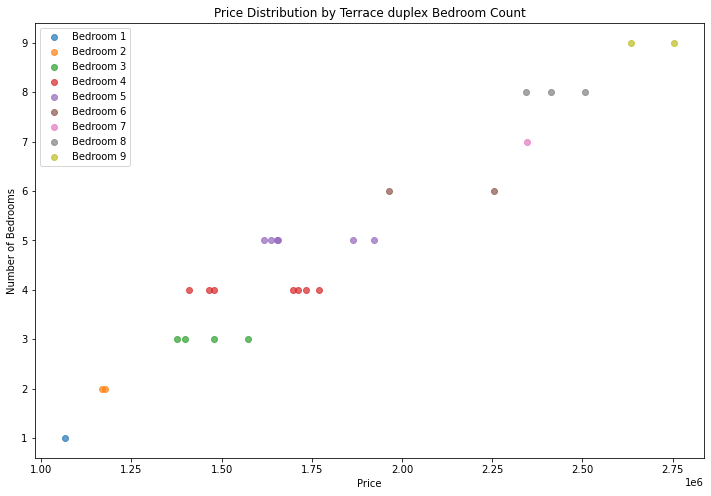



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  23.00000  24.00000      27.00000       30.00000
mean    4.08696   2.75000       3.18519  1633304.94043
std     2.10871   1.91675       1.75493   473931.53533
min     1.00000   1.00000       1.00000  1024414.05900
25%     3.00000   1.75000       2.00000  1292085.13400
50%     4.00000   2.00000       3.00000  1478501.67100
75%     5.50000   4.00000       4.50000  1926381.10525
max     9.00000   7.00000       6.00000  2881940.08700


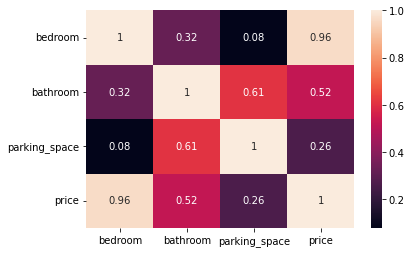

           loc                 title  bedroom  bathroom  parking_space  \
6843   Katsina  Semi-detached duplex     1.00      1.00           2.00   
8386   Katsina  Semi-detached duplex     1.00      2.00           4.00   
2038   Katsina  Semi-detached duplex     1.00      4.00           2.00   
5067   Katsina  Semi-detached duplex     2.00      6.00           6.00   
0      Katsina  Semi-detached duplex     2.00      2.00           1.00   
3236   Katsina  Semi-detached duplex     3.00       NaN           4.00   
10627  Katsina  Semi-detached duplex     3.00      1.00           4.00   
12903  Katsina  Semi-detached duplex     3.00      2.00           4.00   
8206   Katsina  Semi-detached duplex     3.00       NaN           5.00   
4728   Katsina  Semi-detached duplex     3.00      2.00           2.00   
3693   Katsina  Semi-detached duplex     4.00       NaN           5.00   
7482   Katsina  Semi-detached duplex     4.00      1.00           3.00   
1536   Katsina  Semi-detached duplex  

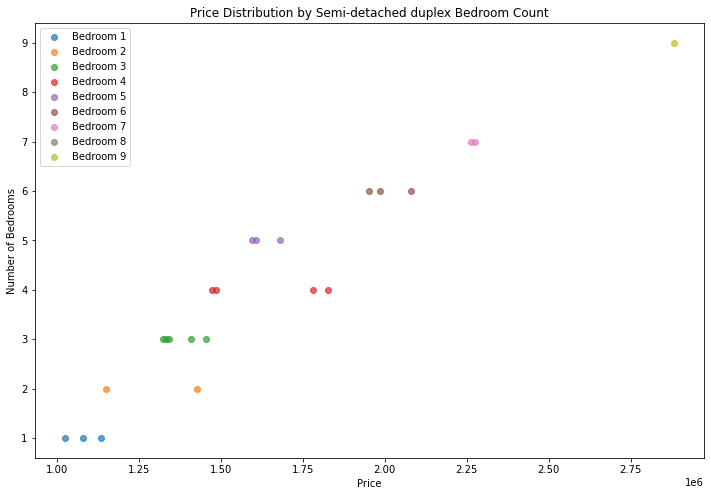



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  25.00000  28.00000      24.00000       30.00000
mean    5.04000   3.64286       3.00000  1992120.23157
std     2.63755   2.18097       1.56038   612487.41335
min     1.00000   1.00000       1.00000  1098383.10100
25%     2.00000   2.00000       1.75000  1405581.71575
50%     5.00000   3.00000       3.00000  2009515.48850
75%     7.00000   6.00000       3.25000  2433316.06875
max     9.00000   7.00000       6.00000  3053262.05700


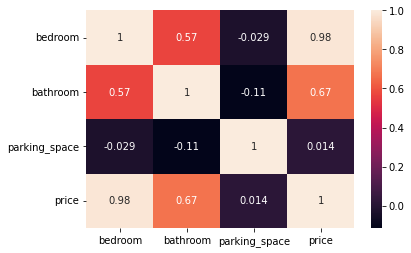

           loc      title  bedroom  bathroom  parking_space      price
12801  Katsina  Townhouse     1.00      3.00           3.00 1176695.23
11220  Katsina  Townhouse     1.00      1.00           1.00 1145219.54
3860   Katsina  Townhouse     1.00      1.00           3.00 1098383.10
11747  Katsina  Townhouse     2.00      2.00           5.00 1386003.68
3352   Katsina  Townhouse     2.00      2.00            NaN 1353085.90
4187   Katsina  Townhouse     2.00      4.00           5.00 1464315.81
12463  Katsina  Townhouse     2.00       NaN           6.00 1372873.39
2441   Katsina  Townhouse     4.00      3.00           3.00 1784542.16
7274   Katsina  Townhouse     4.00      5.00           2.00 1836828.52
12458  Katsina  Townhouse     5.00      6.00            NaN 2191930.72
10612  Katsina  Townhouse     5.00      1.00           3.00 1729297.57
6701   Katsina  Townhouse     5.00      6.00           1.00 2061801.84
5562   Katsina  Townhouse     5.00      2.00           3.00 1957229.13
8465  

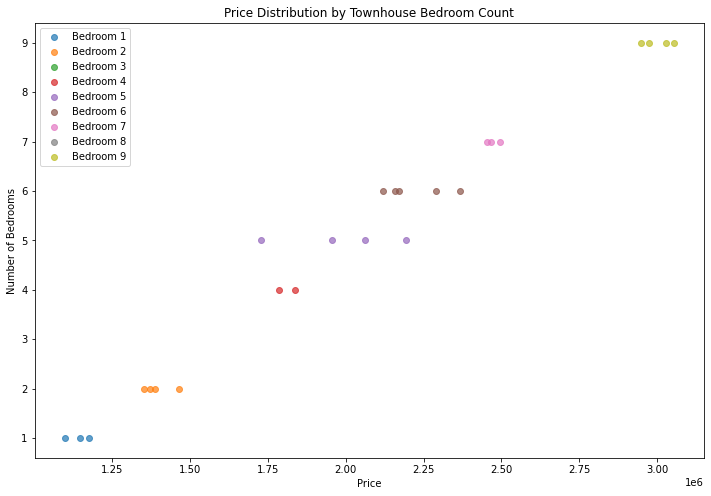



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  23.00000  23.00000      23.00000       26.00000
mean    4.13043   2.86957       3.21739  2291641.49785
std     2.36075   2.07374       1.41282   561642.01201
min     1.00000   1.00000       1.00000  1443696.26100
25%     2.00000   1.00000       2.00000  1776489.38425
50%     5.00000   2.00000       3.00000  2393138.41050
75%     5.50000   5.00000       4.00000  2644571.68550
max     9.00000   7.00000       5.00000  3521224.98600


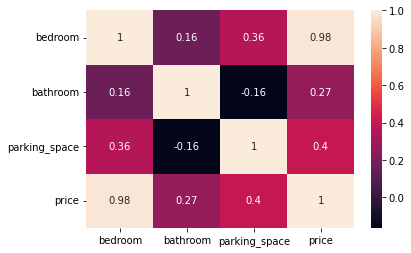

           loc      title  bedroom  bathroom  parking_space      price
10667  Katsina  Penthouse     1.00      1.00           4.00 1624372.42
8812   Katsina  Penthouse     1.00      1.00           1.00 1443696.26
5383   Katsina  Penthouse     1.00      4.00            NaN 1593544.88
6951   Katsina  Penthouse     1.00      1.00            NaN 1665005.15
13651  Katsina  Penthouse     2.00      1.00           3.00 1738192.61
407    Katsina  Penthouse     2.00      1.00           1.00 1569198.28
13633  Katsina  Penthouse     2.00      6.00           3.00 1891379.72
7273   Katsina  Penthouse     2.00      4.00           1.00 1721906.93
7      Katsina  Penthouse     3.00      3.00           5.00 2043107.59
4610   Katsina  Penthouse     3.00      1.00           2.00 2019336.82
6377   Katsina  Penthouse     5.00       NaN           2.00 2377560.48
8356   Katsina  Penthouse     5.00      1.00           4.00 2408716.35
5211   Katsina  Penthouse     5.00      1.00           3.00 2455628.81
10293 

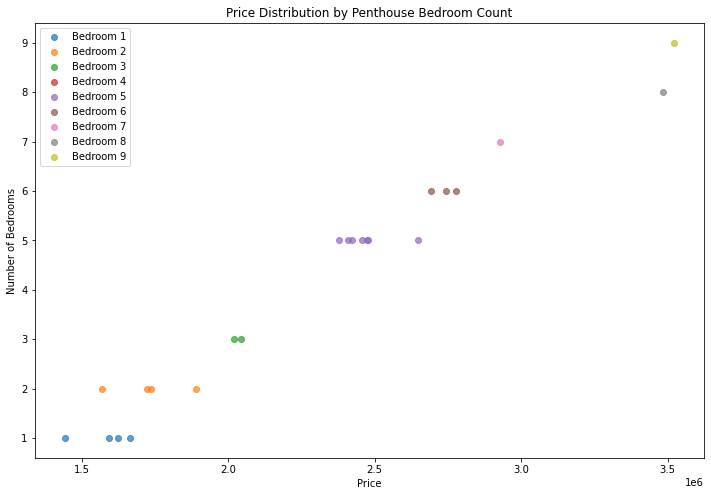



Analyzing Cottage data:
       bedroom  bathroom parking_space          price
count  6.00000  10.00000       8.00000       10.00000
mean   3.33333   1.40000       3.12500  1221214.43550
std    1.03280   0.51640       1.12599   202794.29059
min    2.00000   1.00000       1.00000  1028309.95100
25%    2.50000   1.00000       2.75000  1103128.89175
50%    4.00000   1.00000       3.50000  1148896.59200
75%    4.00000   2.00000       4.00000  1234200.07200
max    4.00000   2.00000       4.00000  1683508.24000


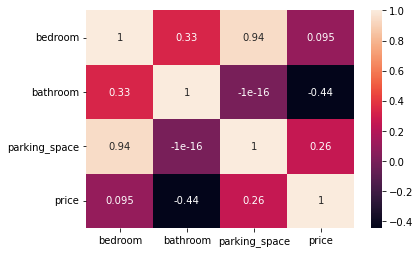

           loc    title  bedroom  bathroom  parking_space      price
8821   Katsina  Cottage     2.00      1.00           1.00 1191166.91
13924  Katsina  Cottage     2.00      2.00            NaN 1213625.06
393    Katsina  Cottage     4.00      1.00           4.00 1460385.06
4877   Katsina  Cottage     4.00      2.00           3.00 1102864.29
5006   Katsina  Cottage     4.00      1.00           4.00 1106626.27
7305   Katsina  Cottage     4.00      2.00            NaN 1103922.69
1294   Katsina  Cottage      NaN      1.00           2.00 1080677.47
10457  Katsina  Cottage      NaN      2.00           4.00 1241058.41
12020  Katsina  Cottage      NaN      1.00           4.00 1028309.95
13176  Katsina  Cottage      NaN      1.00           3.00 1683508.24


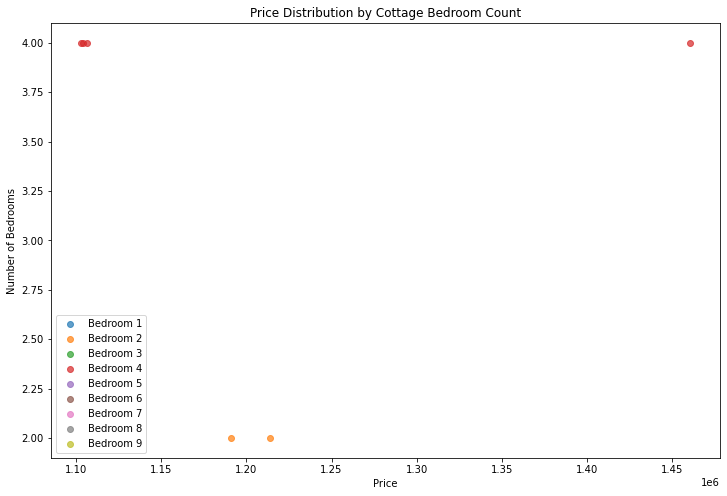

In [264]:
# Katsina
Katsina = housing_train[housing_train["loc" ] == "Katsina"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Katsina, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  25.00000  23.00000      24.00000       28.00000
mean    4.00000   3.43478       3.00000  3302746.34343
std     2.00000   2.25280       1.64184  1083734.91266
min     1.00000   1.00000       1.00000  1327307.15000
25%     3.00000   1.50000       2.00000  2624525.15900
50%     4.00000   3.00000       3.00000  3284888.26650
75%     5.00000   5.50000       4.00000  3965388.90800
max     9.00000   7.00000       6.00000  5283838.92700


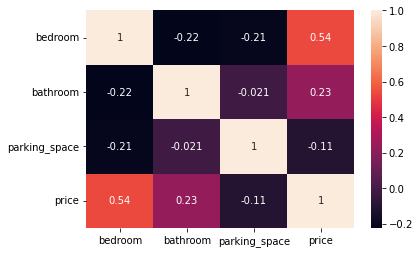

         loc    title  bedroom  bathroom  parking_space      price
9466   Ekiti  Mansion     1.00       NaN           2.00 1327307.15
12764  Ekiti  Mansion     1.00      7.00            NaN 2882002.55
7693   Ekiti  Mansion     1.00      4.00           3.00 2519654.10
10693  Ekiti  Mansion     1.00       NaN           3.00 2770742.37
12540  Ekiti  Mansion     3.00      3.00           5.00 3200610.56
12113  Ekiti  Mansion     3.00      3.00           3.00 3089350.38
8684   Ekiti  Mansion     3.00      1.00           2.00 1811505.60
9031   Ekiti  Mansion     3.00       NaN           1.00 1617897.24
9864   Ekiti  Mansion     3.00       NaN           4.00 4653468.69
10320  Ekiti  Mansion     3.00      6.00           1.00 3229178.46
5504   Ekiti  Mansion     4.00      1.00           2.00 3201271.89
6747   Ekiti  Mansion     4.00      3.00           6.00 3591184.44
6918   Ekiti  Mansion     4.00      1.00           2.00 4283373.79
10540  Ekiti  Mansion     4.00      2.00           3.00 334059

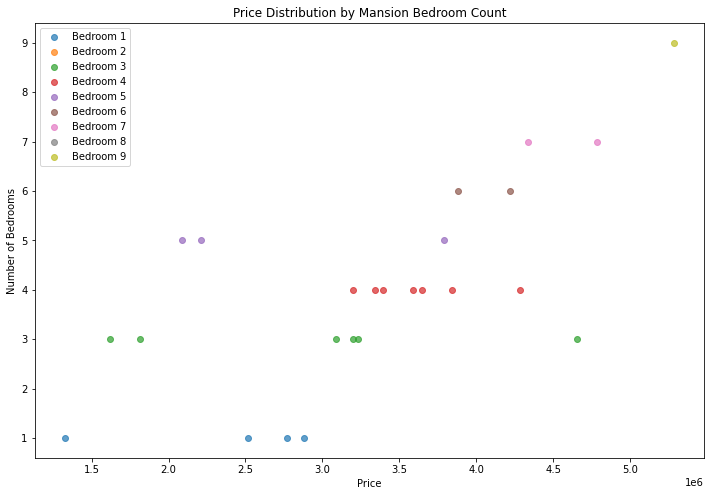



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  33.00000  28.00000      29.00000       35.00000
mean    4.87879   3.03571       3.44828  2313778.06854
std     2.53424   1.73167       1.68154   660252.19678
min     1.00000   1.00000       1.00000  1336721.09200
25%     3.00000   2.00000       2.00000  1787496.16100
50%     5.00000   2.00000       3.00000  2134441.24500
75%     7.00000   4.00000       5.00000  2891136.71650
max     9.00000   7.00000       6.00000  3555163.18600


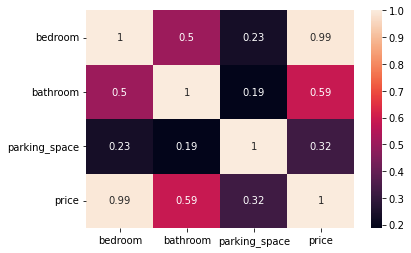

         loc            title  bedroom  bathroom  parking_space      price
2018   Ekiti  Detached duplex     1.00      2.00           5.00 1455576.39
7758   Ekiti  Detached duplex     1.00      2.00            NaN 1364259.92
7718   Ekiti  Detached duplex     1.00      2.00           2.00 1336721.09
6667   Ekiti  Detached duplex     2.00      2.00            NaN 1614220.51
8899   Ekiti  Detached duplex     2.00      3.00           1.00 1598098.34
6528   Ekiti  Detached duplex     2.00      2.00            NaN 1682644.37
8652   Ekiti  Detached duplex     3.00       NaN           4.00 1718322.84
13828  Ekiti  Detached duplex     3.00      2.00           2.00 1844004.40
5982   Ekiti  Detached duplex     3.00      2.00           1.00 1683864.10
7327   Ekiti  Detached duplex     3.00      2.00           5.00 1908271.14
12379  Ekiti  Detached duplex     3.00      4.00           5.00 2005182.41
3956   Ekiti  Detached duplex     3.00       NaN           4.00 1852199.55
11303  Ekiti  Detached du

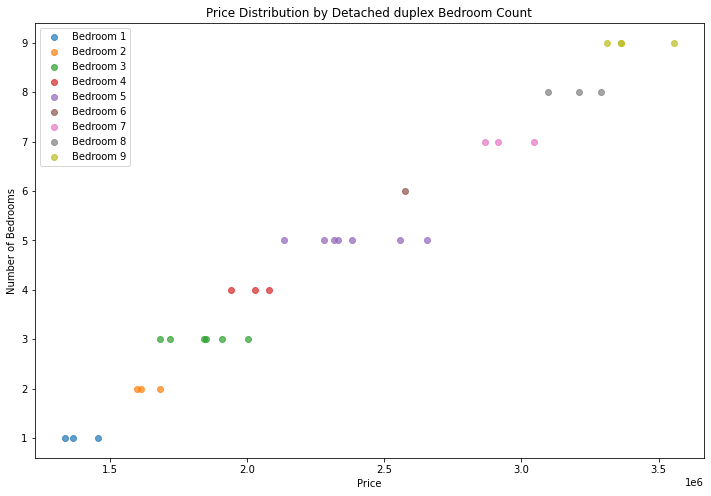



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  25.00000  26.00000      30.00000       31.00000
mean    4.32000   2.46154       3.10000  1508620.09156
std     2.44472   1.60576       1.70900   485081.39438
min     1.00000   1.00000       1.00000   859282.24000
25%     2.00000   1.00000       1.25000  1148251.87850
50%     4.00000   2.00000       3.00000  1283454.18100
75%     7.00000   3.75000       4.00000  2020700.90600
max     8.00000   6.00000       6.00000  2299118.31900


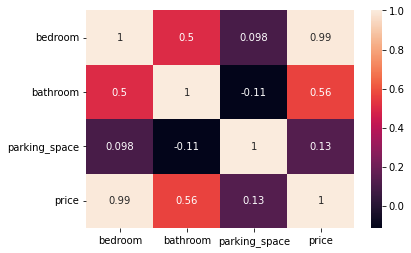

         loc      title  bedroom  bathroom  parking_space      price
12338  Ekiti  Apartment     1.00      1.00           6.00  941263.43
3062   Ekiti  Apartment     1.00       NaN           1.00  992963.95
3728   Ekiti  Apartment     1.00      1.00           1.00  930268.72
12723  Ekiti  Apartment     2.00       NaN           1.00 1107691.38
2061   Ekiti  Apartment     2.00      1.00           3.00 1110509.92
3605   Ekiti  Apartment     2.00       NaN           1.00 1011506.44
10806  Ekiti  Apartment     2.00      4.00           5.00 1185993.83
978    Ekiti  Apartment     3.00      2.00           4.00 1283454.18
11034  Ekiti  Apartment     3.00      1.00           3.00 1210000.35
10914  Ekiti  Apartment     3.00      1.00           4.00 1252618.78
10308  Ekiti  Apartment     3.00       NaN           3.00 1273191.67
13085  Ekiti  Apartment     3.00      1.00           5.00 1273114.08
233    Ekiti  Apartment     4.00      2.00           2.00 1469848.31
6321   Ekiti  Apartment     4.00  

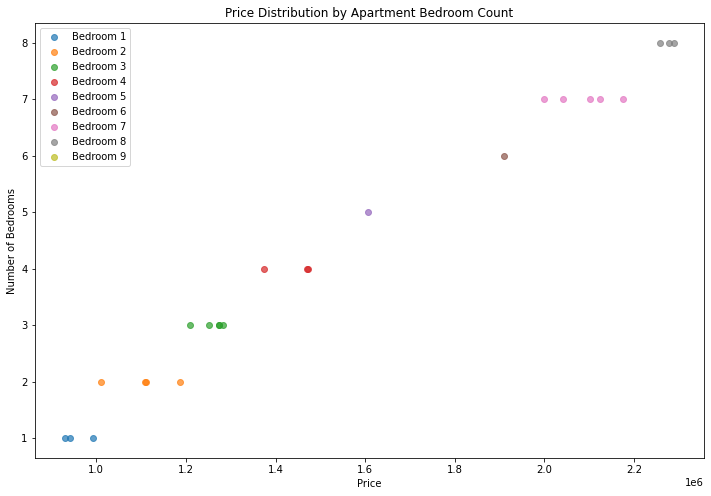



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  25.00000  21.00000      26.00000       31.00000
mean    4.16000   3.52381       3.00000  1669253.07294
std     2.68763   2.08852       1.69706   576405.70357
min     1.00000   1.00000       1.00000  1034388.07900
25%     2.00000   1.00000       1.25000  1241290.59350
50%     3.00000   4.00000       3.00000  1466847.15600
75%     5.00000   5.00000       4.00000  1931253.97600
max     9.00000   7.00000       6.00000  2811670.49600


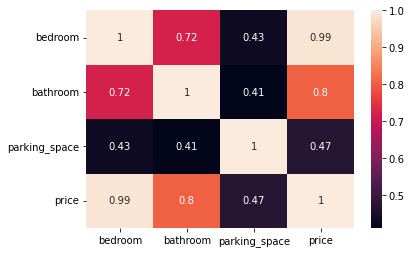

         loc     title  bedroom  bathroom  parking_space      price
9282   Ekiti  Bungalow     1.00      6.00            NaN 1171712.19
715    Ekiti  Bungalow     2.00      6.00            NaN 1380398.49
1150   Ekiti  Bungalow     2.00      1.00           1.00 1133926.60
11505  Ekiti  Bungalow     2.00      4.00           4.00 1309917.57
5172   Ekiti  Bungalow     2.00       NaN           6.00 1321523.50
5179   Ekiti  Bungalow     2.00      2.00           1.00 1158697.89
9683   Ekiti  Bungalow     2.00      1.00           2.00 1207904.08
6491   Ekiti  Bungalow     2.00      1.00           2.00 1087141.36
9187   Ekiti  Bungalow     2.00       NaN           1.00 1189472.75
8572   Ekiti  Bungalow     2.00      3.00           4.00 1274677.11
12360  Ekiti  Bungalow     3.00      3.00            NaN 1466847.16
10146  Ekiti  Bungalow     3.00       NaN           4.00 1537328.07
7767   Ekiti  Bungalow     3.00       NaN           1.00 1326096.65
807    Ekiti  Bungalow     3.00      4.00       

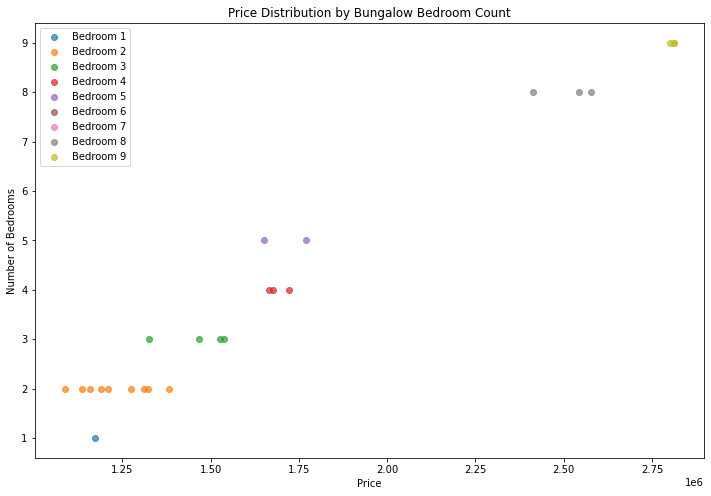



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  28.00000  26.00000      20.00000       30.00000
mean    5.03571   3.53846       3.25000  1849615.32452
std     2.80848   1.79401       1.91600   610670.60287
min     1.00000   1.00000       1.00000   983903.95960
25%     3.00000   2.00000       1.00000  1405425.81925
50%     4.50000   3.00000       3.50000  1707106.41250
75%     7.25000   4.00000       4.25000  2368628.07475
max     9.00000   7.00000       6.00000  2881940.08700


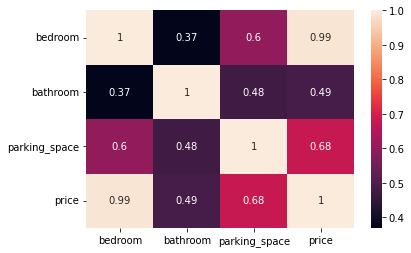

         loc title  bedroom  bathroom  parking_space      price
464    Ekiti  Flat     1.00       NaN           4.00 1018933.09
10897  Ekiti  Flat     1.00      3.00            NaN 1042567.62
1720   Ekiti  Flat     1.00      3.00            NaN 1112837.21
9987   Ekiti  Flat     1.00      2.00           1.00  983903.96
801    Ekiti  Flat     2.00      2.00           1.00 1104629.49
1531   Ekiti  Flat     2.00       NaN           6.00 1427244.88
9347   Ekiti  Flat     3.00      2.00           1.00 1331833.08
9749   Ekiti  Flat     3.00      2.00           2.00 1403009.31
2799   Ekiti  Flat     3.00       NaN            NaN 1396577.56
1231   Ekiti  Flat     4.00      7.00           3.00 1781349.97
4484   Ekiti  Flat     4.00      2.00           2.00 1490591.19
7711   Ekiti  Flat     4.00      5.00           4.00 1734292.25
6107   Ekiti  Flat     4.00      1.00           1.00 1482870.24
6123   Ekiti  Flat     4.00      2.00            NaN 1469690.31
4910   Ekiti  Flat     5.00      4.00   

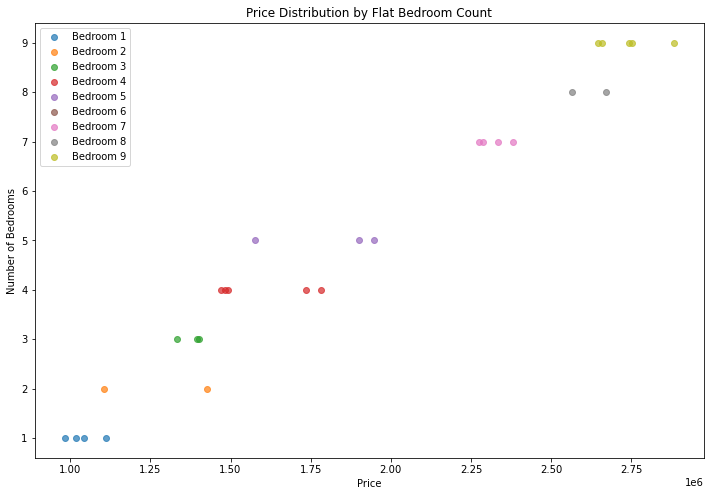



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  27.00000  22.00000      23.00000       29.00000
mean    5.00000   3.81818       3.13043  2028310.08814
std     2.77350   2.34290       1.79150   615193.86850
min     1.00000   1.00000       1.00000  1084884.32000
25%     3.00000   2.00000       1.50000  1527057.02000
50%     5.00000   3.00000       3.00000  1895146.86500
75%     7.00000   6.00000       4.50000  2443394.57800
max     9.00000   7.00000       6.00000  3053944.26300


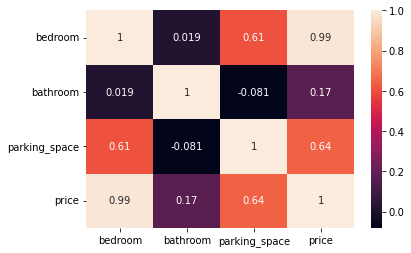

         loc           title  bedroom  bathroom  parking_space      price
770    Ekiti  Terrace duplex     1.00       NaN           3.00 1309469.83
12516  Ekiti  Terrace duplex     1.00      4.00            NaN 1177476.61
9694   Ekiti  Terrace duplex     1.00      2.00           1.00 1084884.32
8588   Ekiti  Terrace duplex     1.00       NaN           1.00 1296413.16
10438  Ekiti  Terrace duplex     2.00      3.00           1.00 1335637.79
12270  Ekiti  Terrace duplex     3.00      2.00           1.00 1470653.52
12868  Ekiti  Terrace duplex     3.00      3.00           5.00 1645755.83
7352   Ekiti  Terrace duplex     3.00      7.00            NaN 1804337.89
13138  Ekiti  Terrace duplex     3.00       NaN           2.00 1527057.02
1602   Ekiti  Terrace duplex     3.00       NaN           4.00 1579759.21
5131   Ekiti  Terrace duplex     4.00      5.00            NaN 1934554.64
9505   Ekiti  Terrace duplex     4.00      6.00           2.00 1895146.86
2121   Ekiti  Terrace duplex     4.00 

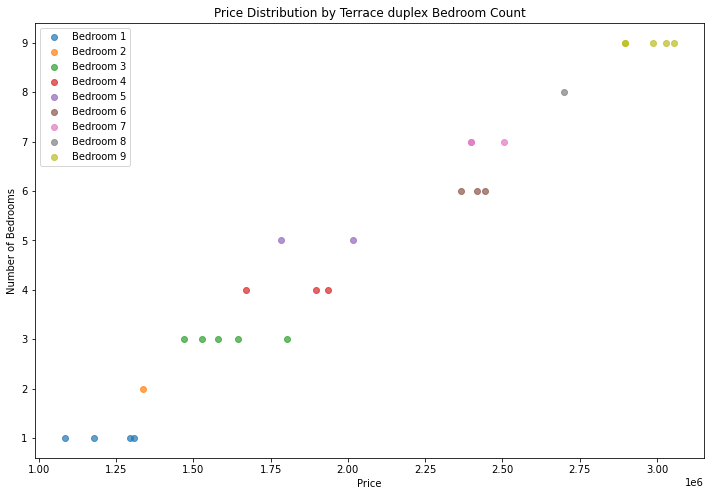



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  28.00000  32.00000      30.00000       36.00000
mean    4.53571   3.21875       3.20000  1816876.60447
std     2.82164   1.97948       1.62735   578641.90804
min     1.00000   1.00000       1.00000  1058540.05900
25%     2.00000   2.00000       2.00000  1295837.90050
50%     4.00000   2.00000       3.00000  1681737.84300
75%     7.00000   5.00000       4.00000  2359370.69350
max     9.00000   7.00000       6.00000  3014536.48900


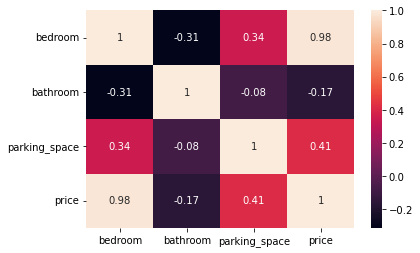

         loc                 title  bedroom  bathroom  parking_space  \
13979  Ekiti  Semi-detached duplex     1.00      6.00           1.00   
10716  Ekiti  Semi-detached duplex     1.00      3.00           2.00   
2292   Ekiti  Semi-detached duplex     1.00       NaN           1.00   
7921   Ekiti  Semi-detached duplex     1.00      1.00           1.00   
6412   Ekiti  Semi-detached duplex     1.00      4.00           3.00   
4304   Ekiti  Semi-detached duplex     2.00      2.00            NaN   
5228   Ekiti  Semi-detached duplex     2.00      7.00           3.00   
7184   Ekiti  Semi-detached duplex     2.00      7.00           3.00   
7558   Ekiti  Semi-detached duplex     2.00      2.00            NaN   
633    Ekiti  Semi-detached duplex     3.00      6.00            NaN   
8065   Ekiti  Semi-detached duplex     3.00      6.00           2.00   
4962   Ekiti  Semi-detached duplex     3.00      6.00           6.00   
10687  Ekiti  Semi-detached duplex     4.00       NaN           

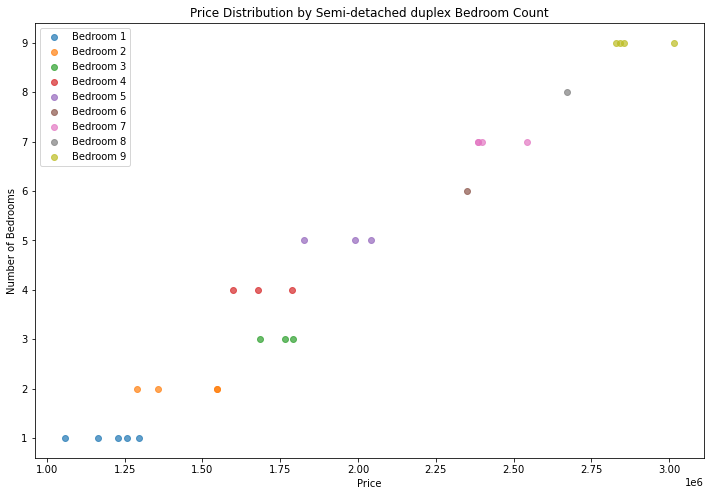



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  22.00000  23.00000      16.00000       25.00000
mean    4.50000   3.21739       3.06250  2013482.47100
std     2.46403   1.80798       1.91377   581519.85729
min     1.00000   1.00000       1.00000  1256517.76400
25%     2.25000   2.00000       1.75000  1503147.65400
50%     5.00000   2.00000       2.00000  1874570.87000
75%     6.00000   4.50000       4.25000  2492700.36600
max     9.00000   6.00000       6.00000  3194084.94900


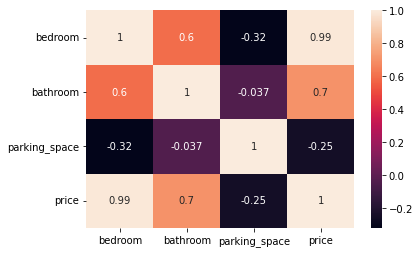

         loc      title  bedroom  bathroom  parking_space      price
5946   Ekiti  Townhouse     1.00      1.00            NaN 1264781.96
6293   Ekiti  Townhouse     1.00      2.00           1.00 1342611.49
6043   Ekiti  Townhouse     1.00      3.00           1.00 1256517.76
9139   Ekiti  Townhouse     2.00      2.00           4.00 1452984.90
384    Ekiti  Townhouse     2.00      6.00           6.00 1745414.77
1618   Ekiti  Townhouse     2.00      2.00           6.00 1569212.47
2469   Ekiti  Townhouse     3.00      1.00            NaN 1503147.65
729    Ekiti  Townhouse     3.00      2.00            NaN 1661927.50
7682   Ekiti  Townhouse     3.00      2.00            NaN 1669353.74
10719  Ekiti  Townhouse     4.00      1.00           2.00 1731054.19
13166  Ekiti  Townhouse     5.00      2.00            NaN 1994984.21
10867  Ekiti  Townhouse     5.00      2.00            NaN 2117185.49
2888   Ekiti  Townhouse     5.00      6.00           2.00 2293387.79
11101  Ekiti  Townhouse     5.00  

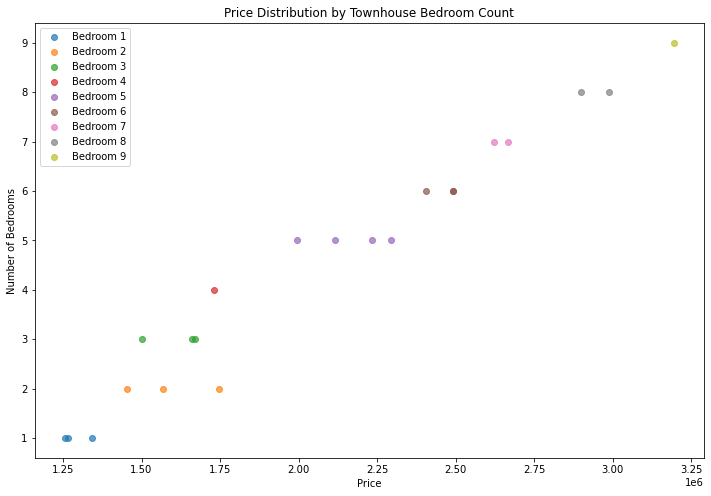



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  30.00000  28.00000      30.00000       34.00000
mean    4.80000   3.07143       3.03333  2711575.86882
std     2.39828   1.82429       1.69143   566547.76416
min     1.00000   1.00000       1.00000  1710015.80800
25%     3.00000   2.00000       1.25000  2233360.79575
50%     4.50000   2.00000       3.00000  2697148.18700
75%     7.00000   4.25000       4.00000  3131021.91900
max     9.00000   7.00000       6.00000  3731548.71800


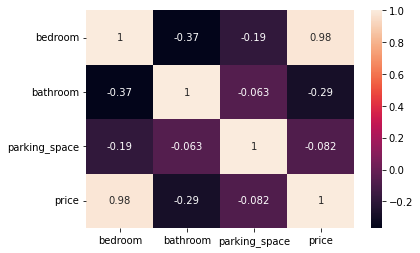

         loc      title  bedroom  bathroom  parking_space      price
10503  Ekiti  Penthouse     1.00      5.00           4.00 1841297.36
5495   Ekiti  Penthouse     1.00      1.00            NaN 1710015.81
12748  Ekiti  Penthouse     2.00       NaN           3.00 1974713.96
2257   Ekiti  Penthouse     2.00      7.00           1.00 2089621.87
2331   Ekiti  Penthouse     2.00      2.00           3.00 2120244.72
8399   Ekiti  Penthouse     2.00      5.00            NaN 2165403.85
12446  Ekiti  Penthouse     3.00      2.00           3.00 2375100.48
11199  Ekiti  Penthouse     3.00       NaN           4.00 2208371.08
3953   Ekiti  Penthouse     3.00      2.00           1.00 2198135.06
5180   Ekiti  Penthouse     3.00      4.00           6.00 2363026.16
8012   Ekiti  Penthouse     3.00      3.00           1.00 2115446.94
3765   Ekiti  Penthouse     4.00       NaN           6.00 2794505.58
8946   Ekiti  Penthouse     4.00      2.00           1.00 2308329.94
8663   Ekiti  Penthouse     4.00  

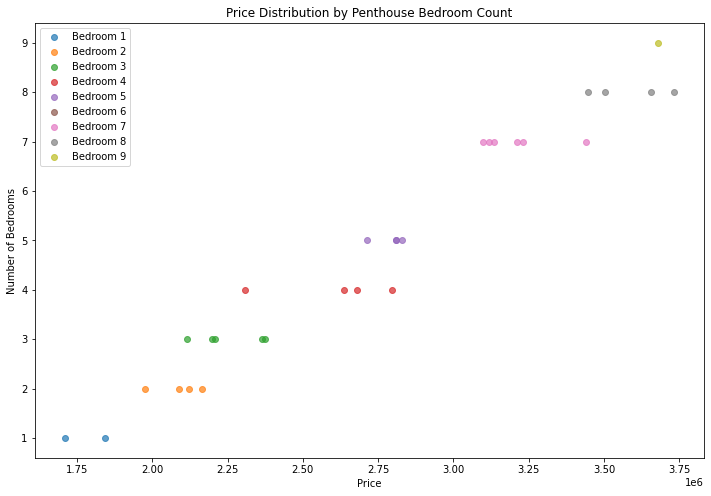



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  7.00000  6.00000       7.00000        7.00000
mean   3.28571  1.66667       2.00000  1234456.97786
std    1.38013  0.51640       0.81650   379896.81306
min    1.00000  1.00000       1.00000   828475.31020
25%    2.50000  1.25000       1.50000   984460.53490
50%    4.00000  2.00000       2.00000  1171439.60300
75%    4.00000  2.00000       2.50000  1384207.74100
max    5.00000  2.00000       3.00000  1903947.38000


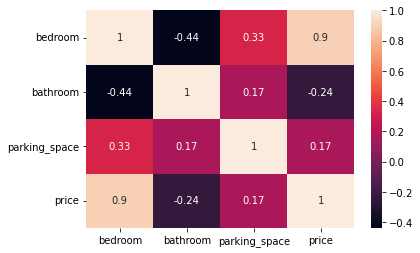

        loc    title  bedroom  bathroom  parking_space      price
6889  Ekiti  Cottage     1.00      2.00           2.00  828475.31
8481  Ekiti  Cottage     2.00      2.00           2.00  907897.94
6440  Ekiti  Cottage     3.00      2.00           2.00 1061023.12
2606  Ekiti  Cottage     4.00       NaN           1.00 1200701.42
3542  Ekiti  Cottage     4.00      1.00           1.00 1567714.07
4107  Ekiti  Cottage     4.00      1.00           3.00 1171439.60
6101  Ekiti  Cottage     5.00      2.00           3.00 1903947.38


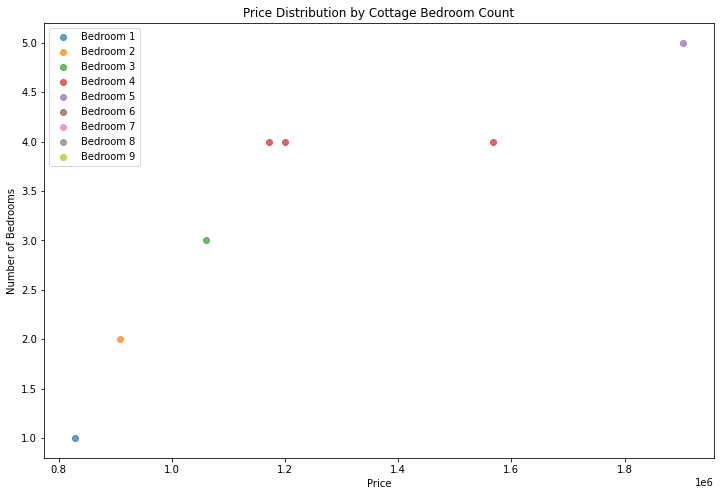

In [265]:
# Ekiti
Ekiti = housing_train[housing_train["loc" ] == "Ekiti"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Ekiti, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  30.00000  30.00000      26.00000       34.00000
mean    4.16667   3.06667       3.23077  3055897.26524
std     2.67921   1.96404       1.45073  1166160.51335
min     1.00000   1.00000       1.00000  1289209.75100
25%     2.00000   2.00000       2.00000  2061988.37825
50%     3.00000   2.00000       3.00000  3212809.25650
75%     6.75000   5.00000       4.00000  4011646.48875
max     9.00000   7.00000       6.00000  4991829.78000


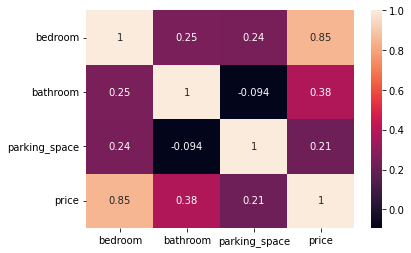

          loc    title  bedroom  bathroom  parking_space      price
3280   Kaduna  Mansion     1.00      6.00           2.00 2346775.61
10511  Kaduna  Mansion     1.00      2.00           5.00 2197536.43
8571   Kaduna  Mansion     1.00      5.00           2.00 2272379.09
8950   Kaduna  Mansion     1.00      2.00           3.00 1289209.75
806    Kaduna  Mansion     2.00      1.00            NaN 1391158.86
7760   Kaduna  Mansion     2.00      2.00           3.00 2395400.26
9613   Kaduna  Mansion     2.00      2.00           3.00 3766400.33
7342   Kaduna  Mansion     2.00      1.00           4.00 1506779.42
4676   Kaduna  Mansion     2.00      1.00           4.00 1406004.46
5631   Kaduna  Mansion     2.00       NaN           4.00 2370452.71
11381  Kaduna  Mansion     2.00      2.00            NaN 3719942.73
5545   Kaduna  Mansion     3.00      1.00            NaN 2674121.43
8425   Kaduna  Mansion     3.00      5.00            NaN 2823360.61
7709   Kaduna  Mansion     3.00      2.00       

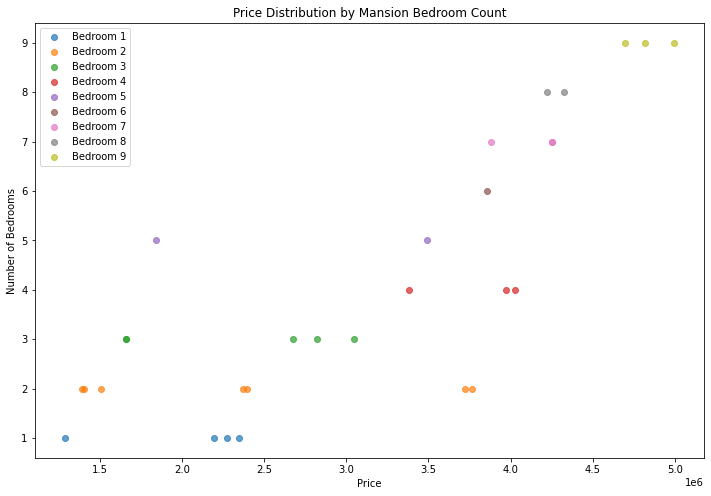



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  31.00000  28.00000      30.00000       35.00000
mean    4.61290   2.92857       2.76667  2030979.26537
std     2.69168   2.10693       1.50134   630370.43321
min     1.00000   1.00000       1.00000  1162623.28300
25%     2.50000   1.00000       1.25000  1520434.17700
50%     4.00000   2.00000       2.50000  1884518.72500
75%     7.00000   4.25000       4.00000  2606584.32500
max     9.00000   7.00000       6.00000  3084958.70100


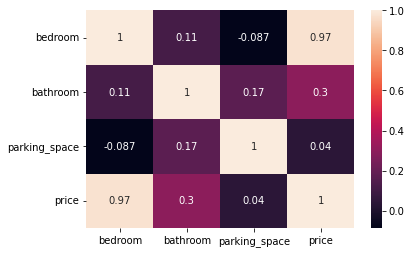

          loc            title  bedroom  bathroom  parking_space      price
303    Kaduna  Detached duplex     1.00      2.00            NaN 1244327.98
12311  Kaduna  Detached duplex     1.00      2.00           4.00 1275705.27
2342   Kaduna  Detached duplex     1.00       NaN           2.00 1265086.71
6304   Kaduna  Detached duplex     1.00      6.00           4.00 1445243.02
13327  Kaduna  Detached duplex     1.00      2.00            NaN 1162623.28
12541  Kaduna  Detached duplex     2.00       NaN           3.00 1484373.72
9020   Kaduna  Detached duplex     2.00      2.00           3.00 1476516.20
3797   Kaduna  Detached duplex     2.00      2.00           4.00 1549323.50
11936  Kaduna  Detached duplex     3.00       NaN           1.00 1609103.89
11490  Kaduna  Detached duplex     3.00      2.00           3.00 1613795.79
9010   Kaduna  Detached duplex     3.00      7.00           4.00 1910347.31
7851   Kaduna  Detached duplex     3.00      3.00           1.00 1652175.56
6715   Kadun

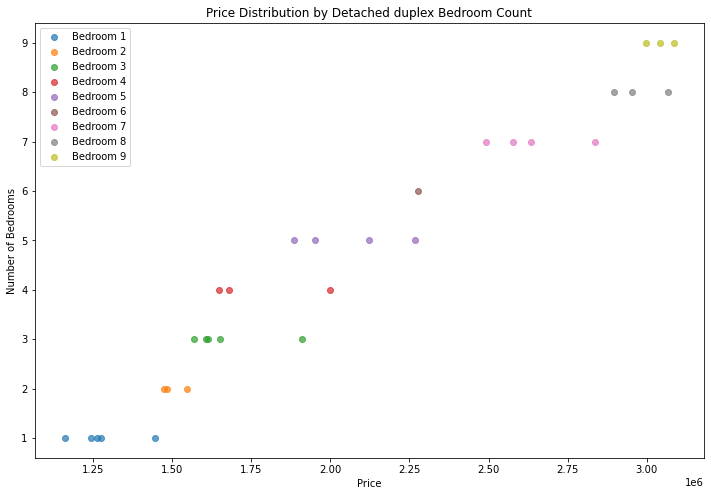



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  31.00000  34.00000      32.00000       38.00000
mean    4.25806   3.05882       3.15625  1447041.34739
std     2.23559   1.99911       1.37041   417441.00144
min     1.00000   1.00000       1.00000   906771.86550
25%     2.50000   2.00000       2.00000  1066781.33675
50%     4.00000   2.00000       3.00000  1395380.98050
75%     5.00000   4.75000       4.00000  1800094.38150
max     9.00000   7.00000       6.00000  2398756.96500


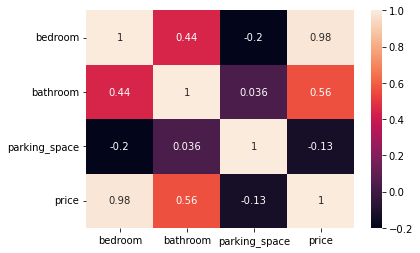

          loc      title  bedroom  bathroom  parking_space      price
9415   Kaduna  Apartment     1.00      2.00           2.00  906771.87
4700   Kaduna  Apartment     1.00      2.00           4.00  914807.51
307    Kaduna  Apartment     2.00      1.00           6.00 1007380.97
6638   Kaduna  Apartment     2.00      5.00            NaN 1044145.79
2240   Kaduna  Apartment     2.00      2.00           3.00 1016483.59
2353   Kaduna  Apartment     2.00       NaN           2.00  997045.19
2741   Kaduna  Apartment     2.00      2.00           4.00 1039886.72
2746   Kaduna  Apartment     2.00      1.00           3.00 1028599.79
13026  Kaduna  Apartment     3.00      5.00           4.00 1250452.18
11071  Kaduna  Apartment     3.00      3.00           5.00 1213851.73
4797   Kaduna  Apartment     3.00      1.00            NaN 1134687.99
7222   Kaduna  Apartment     3.00      7.00            NaN 1341706.76
1863   Kaduna  Apartment     3.00      2.00           3.00 1180136.94
13592  Kaduna  Apart

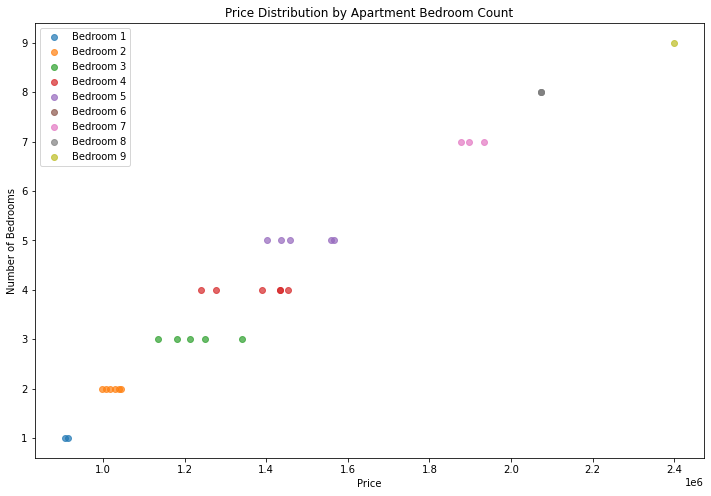



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  22.00000  25.00000      29.00000       31.00000
mean    4.22727   3.36000       3.41379  1590521.51365
std     2.24525   2.05913       1.78320   466913.73376
min     1.00000   1.00000       1.00000   908668.86970
25%     2.00000   2.00000       1.00000  1215500.11450
50%     4.50000   2.00000       4.00000  1517242.58100
75%     5.75000   5.00000       5.00000  1881125.57850
max     9.00000   7.00000       6.00000  2658566.56800


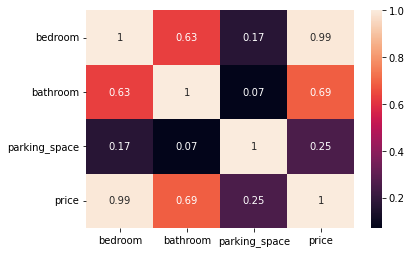

          loc     title  bedroom  bathroom  parking_space      price
10114  Kaduna  Bungalow     1.00      1.00           6.00  955098.55
5671   Kaduna  Bungalow     1.00      2.00           1.00  908668.87
1910   Kaduna  Bungalow     2.00       NaN           5.00 1296340.27
2553   Kaduna  Bungalow     2.00      7.00            NaN 1233878.42
4238   Kaduna  Bungalow     2.00      1.00           4.00 1105579.01
4920   Kaduna  Bungalow     2.00       NaN           4.00 1212869.95
8132   Kaduna  Bungalow     2.00      2.00           3.00 1098074.77
13539  Kaduna  Bungalow     3.00       NaN           4.00 1150154.90
12037  Kaduna  Bungalow     3.00      1.00           3.00 1218130.28
5536   Kaduna  Bungalow     4.00      2.00           1.00 1363553.69
9817   Kaduna  Bungalow     4.00      5.00           1.00 1517242.58
9033   Kaduna  Bungalow     5.00      2.00           5.00 1696093.80
8797   Kaduna  Bungalow     5.00      3.00           3.00 1685777.42
531    Kaduna  Bungalow     5.00  

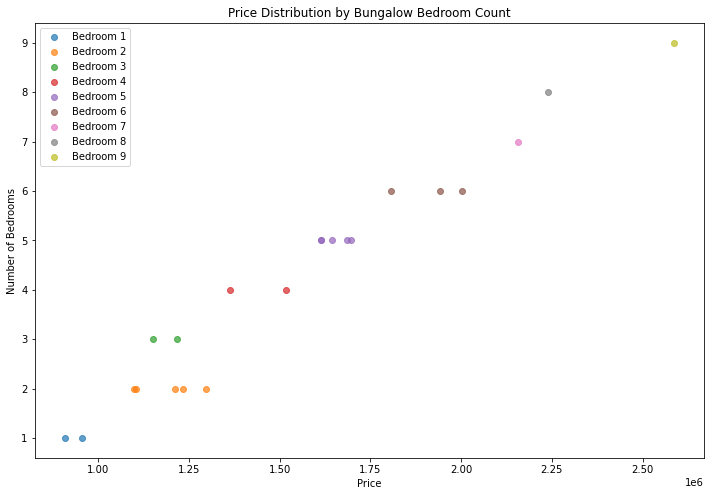



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  34.00000  34.00000      36.00000       41.00000
mean    4.02941   3.14706       3.13889  1522420.74789
std     2.45549   1.92484       1.75910   454090.29343
min     1.00000   1.00000       1.00000   883057.80230
25%     2.00000   2.00000       1.75000  1171040.86400
50%     4.00000   3.00000       3.00000  1473280.35100
75%     5.00000   4.00000       5.00000  1758931.35500
max     9.00000   7.00000       6.00000  2616925.32900


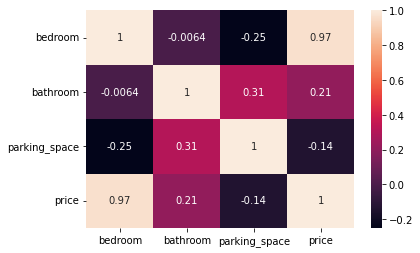

          loc title  bedroom  bathroom  parking_space      price
13911  Kaduna  Flat     1.00      6.00           3.00 1049260.95
6832   Kaduna  Flat     1.00      2.00           2.00  996346.04
13548  Kaduna  Flat     1.00       NaN           5.00  965602.78
6730   Kaduna  Flat     1.00      2.00           2.00  903140.92
13205  Kaduna  Flat     1.00      2.00           3.00  992176.36
5781   Kaduna  Flat     1.00       NaN           1.00  883057.80
6468   Kaduna  Flat     1.00       NaN           6.00 1017748.25
8672   Kaduna  Flat     2.00      2.00           4.00 1109114.45
6151   Kaduna  Flat     2.00      3.00           5.00 1171040.86
12281  Kaduna  Flat     2.00      1.00           3.00 1041024.85
9076   Kaduna  Flat     3.00      7.00           6.00 1498181.07
13013  Kaduna  Flat     3.00      3.00            NaN 1331240.42
6759   Kaduna  Flat     3.00       NaN           1.00 1206128.86
2397   Kaduna  Flat     3.00      2.00           4.00 1195358.18
12345  Kaduna  Flat     3

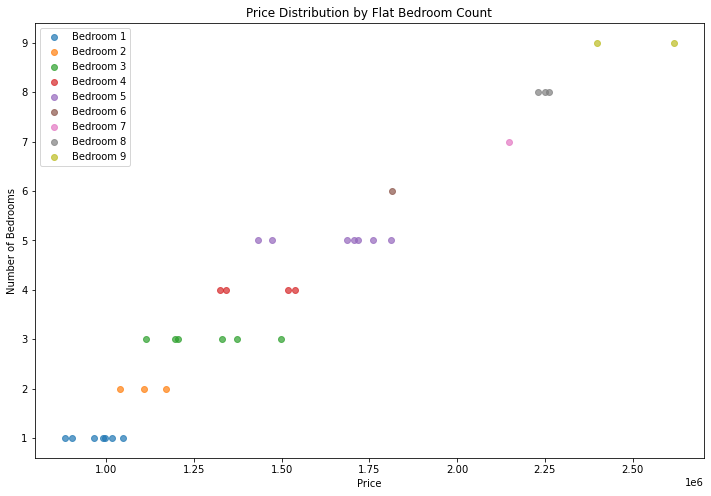



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  17.00000  23.00000      20.00000       25.00000
mean    4.94118   2.91304       3.15000  1720264.15155
std     2.60937   2.17241       1.72520   555241.50849
min     1.00000   1.00000       1.00000   952118.71870
25%     3.00000   1.00000       2.00000  1246637.98200
50%     5.00000   2.00000       3.00000  1628782.20200
75%     7.00000   3.50000       4.25000  2021426.64400
max     9.00000   7.00000       6.00000  2717555.05400


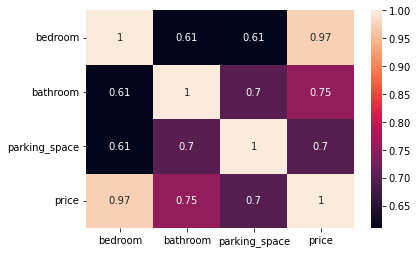

          loc           title  bedroom  bathroom  parking_space      price
4924   Kaduna  Terrace duplex     1.00      1.00           1.00  952118.72
7410   Kaduna  Terrace duplex     2.00      1.00           1.00 1198104.11
10246  Kaduna  Terrace duplex     2.00       NaN           4.00 1157467.04
10014  Kaduna  Terrace duplex     2.00      1.00            NaN 1193883.52
13033  Kaduna  Terrace duplex     3.00      2.00           1.00 1272770.76
11711  Kaduna  Terrace duplex     3.00      1.00           2.00 1246637.98
6325   Kaduna  Terrace duplex     4.00      6.00           6.00 1816379.11
6545   Kaduna  Terrace duplex     4.00      4.00           1.00 1628782.20
13756  Kaduna  Terrace duplex     5.00      1.00           3.00 1587592.00
13125  Kaduna  Terrace duplex     5.00       NaN           3.00 1654908.40
471    Kaduna  Terrace duplex     6.00      1.00           2.00 1950945.73
8650   Kaduna  Terrace duplex     6.00      2.00           4.00 2033032.58
3327   Kaduna  Terrace du

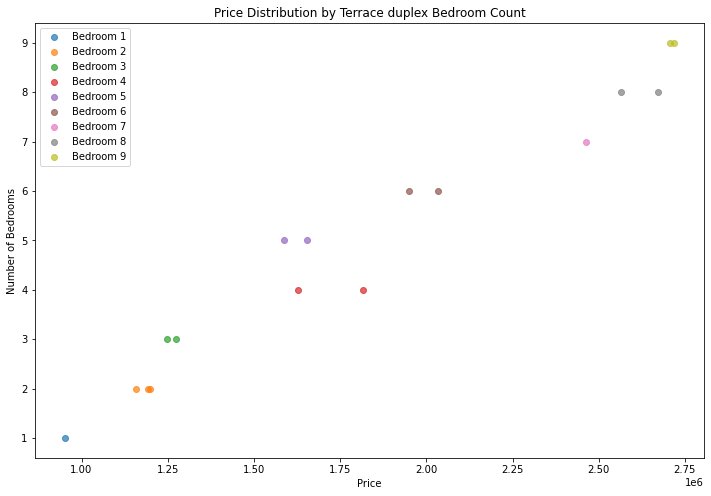



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      29.00000       31.00000
mean    3.92593   3.23077       2.75862  1694269.77837
std     2.07412   2.48689       1.45541   509348.02150
min     1.00000   1.00000       1.00000   983903.95960
25%     2.00000   1.00000       1.00000  1392215.74800
50%     4.00000   2.00000       3.00000  1605147.67900
75%     5.00000   6.50000       4.00000  2151674.66950
max     8.00000   7.00000       6.00000  2670708.66000


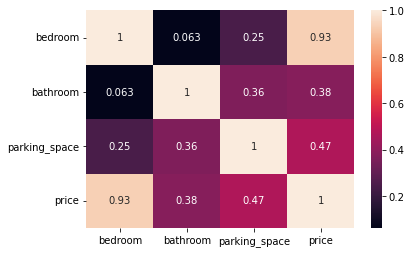

          loc                 title  bedroom  bathroom  parking_space  \
13600  Kaduna  Semi-detached duplex     1.00       NaN           3.00   
11987  Kaduna  Semi-detached duplex     1.00      2.00           4.00   
13134  Kaduna  Semi-detached duplex     1.00      2.00           2.00   
13334  Kaduna  Semi-detached duplex     1.00      2.00           1.00   
12659  Kaduna  Semi-detached duplex     2.00      1.00           1.00   
4692   Kaduna  Semi-detached duplex     2.00      7.00           3.00   
5128   Kaduna  Semi-detached duplex     2.00      1.00           4.00   
10501  Kaduna  Semi-detached duplex     2.00      7.00           3.00   
11158  Kaduna  Semi-detached duplex     3.00      5.00           4.00   
5264   Kaduna  Semi-detached duplex     3.00       NaN           4.00   
13353  Kaduna  Semi-detached duplex     3.00      7.00           4.00   
10361  Kaduna  Semi-detached duplex     4.00      3.00           2.00   
9573   Kaduna  Semi-detached duplex     4.00      2

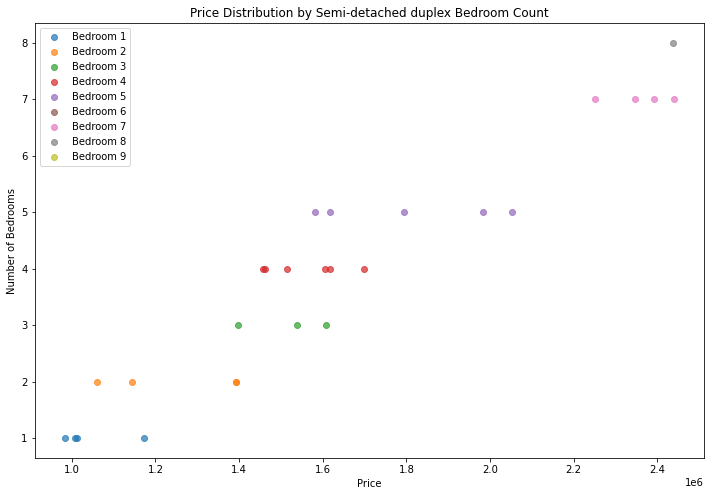



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  32.00000  30.00000      28.00000       34.00000
mean    4.15625   3.20000       3.07143  1790248.92988
std     2.34327   2.18774       1.71979   529333.86498
min     1.00000   1.00000       1.00000  1072357.32700
25%     2.00000   1.00000       1.75000  1367832.41100
50%     4.00000   2.00000       3.00000  1669670.90400
75%     6.00000   4.75000       4.00000  2273144.16425
max     9.00000   7.00000       6.00000  2987845.41000


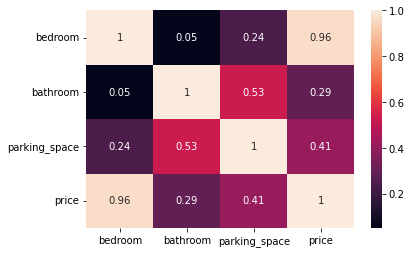

          loc      title  bedroom  bathroom  parking_space      price
7698   Kaduna  Townhouse     1.00      1.00           2.00 1072357.33
13545  Kaduna  Townhouse     1.00      4.00            NaN 1189825.52
8762   Kaduna  Townhouse     1.00      2.00           3.00 1113365.04
2688   Kaduna  Townhouse     1.00      7.00           4.00 1359345.27
1825   Kaduna  Townhouse     2.00       NaN           1.00 1236668.81
8214   Kaduna  Townhouse     2.00      1.00           1.00 1289624.67
5303   Kaduna  Townhouse     2.00      1.00            NaN 1280937.47
5459   Kaduna  Townhouse     2.00       NaN           4.00 1438290.04
959    Kaduna  Townhouse     2.00       NaN           6.00 1372873.39
12653  Kaduna  Townhouse     3.00      6.00           2.00 1667870.54
9259   Kaduna  Townhouse     3.00      6.00           2.00 1667870.54
2894   Kaduna  Townhouse     3.00      1.00           1.00 1395261.24
7669   Kaduna  Townhouse     3.00      2.00           3.00 1425046.12
685    Kaduna  Townh

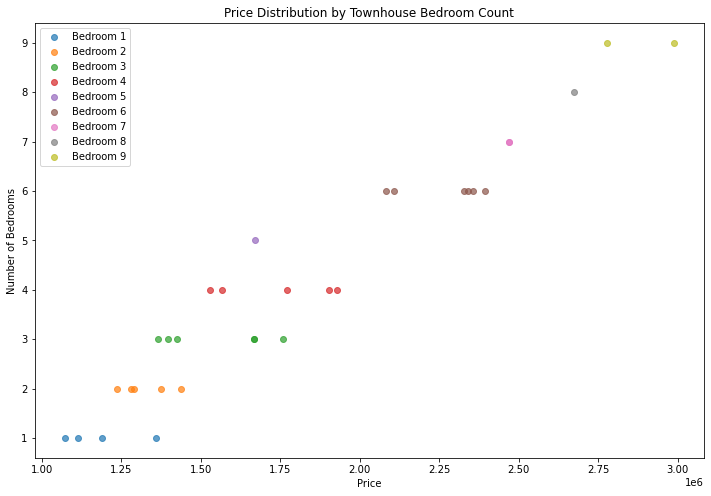



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  26.00000  27.00000      24.00000       30.00000
mean    4.00000   3.00000       3.41667  2333351.09787
std     2.07846   1.75412       1.76725   538804.56124
min     1.00000   1.00000       1.00000  1424072.09900
25%     2.25000   2.00000       2.00000  1985669.25650
50%     4.00000   2.00000       3.50000  2263112.56900
75%     5.00000   4.00000       4.25000  2635999.77425
max     9.00000   7.00000       6.00000  3690697.77100


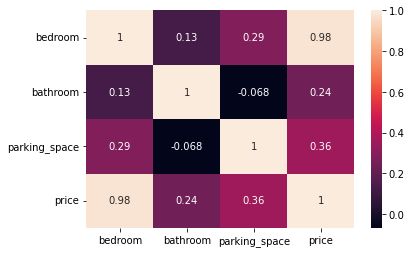

          loc      title  bedroom  bathroom  parking_space      price
13852  Kaduna  Penthouse     1.00      2.00           6.00 1559406.13
722    Kaduna  Penthouse     1.00      4.00           1.00 1492044.36
3906   Kaduna  Penthouse     1.00      2.00           2.00 1424072.10
11586  Kaduna  Penthouse     2.00      1.00           2.00 1835338.19
3461   Kaduna  Penthouse     2.00      2.00            NaN 1653934.67
6706   Kaduna  Penthouse     2.00      7.00            NaN 2043783.12
11899  Kaduna  Penthouse     2.00      6.00           4.00 1925213.22
11872  Kaduna  Penthouse     3.00      2.00           2.00 1890704.19
11542  Kaduna  Penthouse     3.00       NaN           6.00 2229649.75
7786   Kaduna  Penthouse     3.00      1.00           4.00 1971694.90
7130   Kaduna  Penthouse     3.00      1.00           2.00 2027592.34
6862   Kaduna  Penthouse     4.00      1.00           4.00 2209063.82
8028   Kaduna  Penthouse     4.00       NaN           4.00 2352643.50
9518   Kaduna  Penth

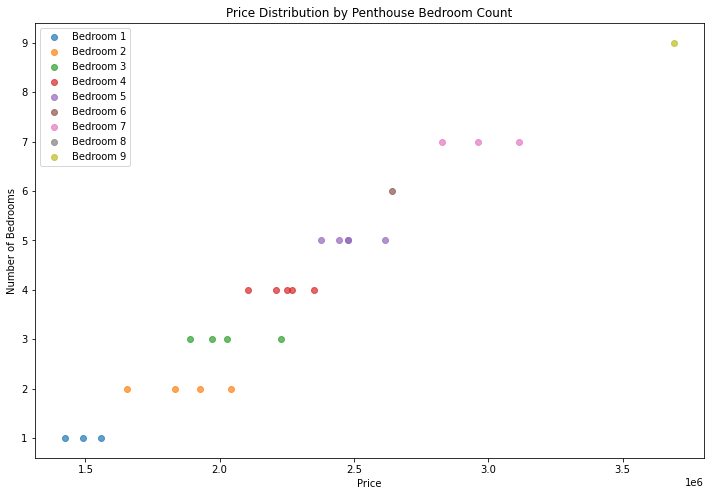



Analyzing Cottage data:
        bedroom bathroom parking_space          price
count  10.00000  8.00000       9.00000       10.00000
mean    2.50000  1.12500       3.22222   926638.91628
std     1.77951  0.35355       0.66667   225092.45690
min     1.00000  1.00000       2.00000   714643.64950
25%     1.00000  1.00000       3.00000   734252.15470
50%     2.00000  1.00000       3.00000   837557.24025
75%     4.25000  1.00000       4.00000  1163181.85065
max     5.00000  2.00000       4.00000  1245251.59300


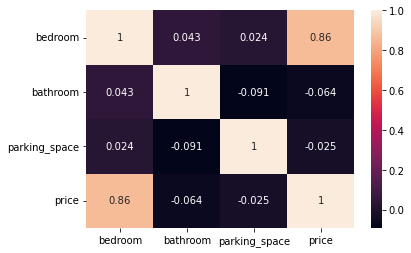

          loc    title  bedroom  bathroom  parking_space      price
1709   Kaduna  Cottage     1.00      1.00           3.00  724389.57
6913   Kaduna  Cottage     1.00      1.00           3.00  973595.65
9546   Kaduna  Cottage     1.00      1.00           2.00  714643.65
12586  Kaduna  Cottage     1.00      1.00           4.00  716482.05
10831  Kaduna  Cottage     2.00      2.00           3.00  834683.37
12315  Kaduna  Cottage     2.00      1.00           4.00  840431.11
13792  Kaduna  Cottage     2.00      1.00            NaN  763839.91
69     Kaduna  Cottage     5.00      1.00           3.00 1226377.25
10382  Kaduna  Cottage     5.00       NaN           3.00 1226695.01
10994  Kaduna  Cottage     5.00       NaN           4.00 1245251.59


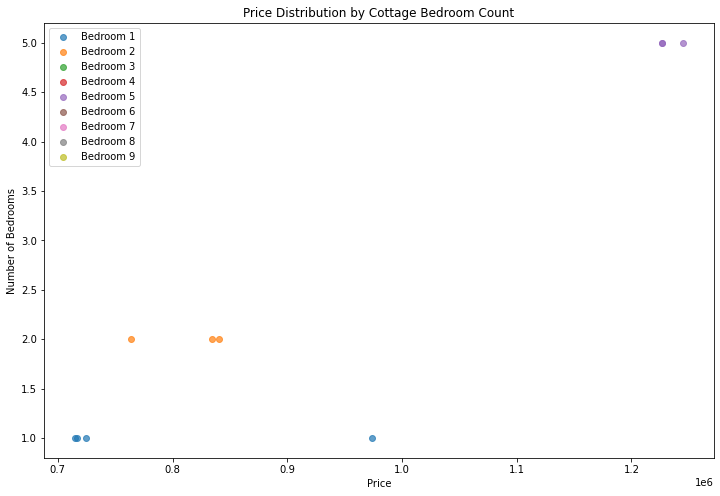

In [266]:
# Kaduna
Kaduna = housing_train[housing_train["loc" ] == "Kaduna"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Kaduna, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  35.00000  33.00000      33.00000       38.00000
mean    3.91429   3.00000       2.93939  2987187.15554
std     2.61637   1.83712       1.56004  1140940.26535
min     1.00000   1.00000       1.00000   806329.14110
25%     2.00000   2.00000       1.00000  2241194.64550
50%     3.00000   2.00000       3.00000  3133432.24850
75%     5.50000   5.00000       4.00000  3778917.53000
max     9.00000   7.00000       6.00000  4917433.25600


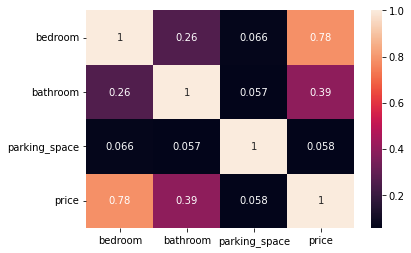

         loc    title  bedroom  bathroom  parking_space      price
553    Gombe  Mansion     1.00      1.00           4.00 2073690.93
9875   Gombe  Mansion     1.00      1.00           1.00  806329.14
6773   Gombe  Mansion     1.00       NaN           4.00 2222483.98
3163   Gombe  Mansion     1.00       NaN           3.00 3209437.55
3055   Gombe  Mansion     1.00      2.00            NaN 1999740.54
13871  Gombe  Mansion     1.00      6.00           1.00 2297326.64
2858   Gombe  Mansion     1.00      2.00           3.00 2098638.48
11694  Gombe  Mansion     2.00      1.00           3.00  934021.73
11179  Gombe  Mansion     2.00       NaN           4.00 2816831.85
871    Gombe  Mansion     2.00      2.00           4.00  994847.62
8975   Gombe  Mansion     2.00      2.00           4.00 3528093.16
8485   Gombe  Mansion     2.00      7.00           5.00 2866280.83
12106  Gombe  Mansion     2.00      3.00           1.00 2370898.84
7530   Gombe  Mansion     2.00      4.00           6.00 269254

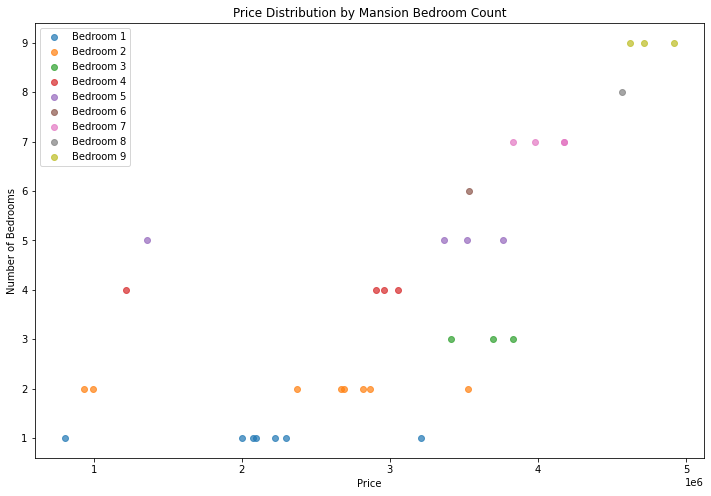



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  32.00000  34.00000      28.00000       36.00000
mean    4.31250   3.44118       3.46429  1881066.50402
std     2.36149   2.25887       1.34666   610125.25057
min     1.00000   1.00000       1.00000   861080.84060
25%     2.00000   2.00000       2.75000  1459112.47400
50%     5.00000   3.00000       4.00000  1852961.46100
75%     5.00000   5.00000       4.00000  2194696.18800
max     9.00000   7.00000       6.00000  3199472.10900


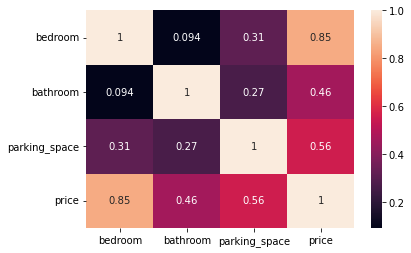

         loc            title  bedroom  bathroom  parking_space      price
11831  Gombe  Detached duplex     1.00      2.00            NaN  861080.84
2430   Gombe  Detached duplex     1.00      3.00            NaN 1258771.30
5386   Gombe  Detached duplex     1.00      7.00            NaN 1545571.40
542    Gombe  Detached duplex     2.00      1.00           4.00 1437447.49
11030  Gombe  Detached duplex     2.00      7.00            NaN 1695877.53
9424   Gombe  Detached duplex     2.00      1.00           3.00  933144.48
12916  Gombe  Detached duplex     2.00      6.00            NaN 1710062.56
5449   Gombe  Detached duplex     2.00      7.00            NaN 1638620.82
13772  Gombe  Detached duplex     2.00      1.00           2.00  878990.38
3557   Gombe  Detached duplex     2.00       NaN           2.00 1466334.13
9646   Gombe  Detached duplex     3.00      2.00           3.00 1687194.98
11521  Gombe  Detached duplex     3.00      5.00           5.00 1852832.32
10247  Gombe  Detached du

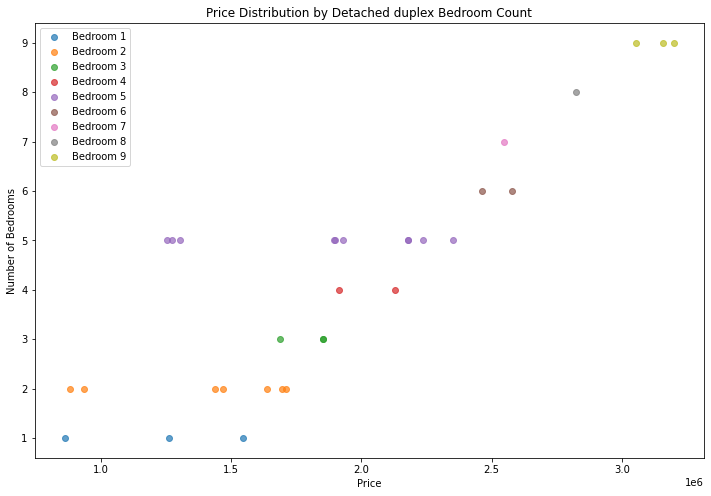



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  28.00000  27.00000      30.00000       33.00000
mean    4.71429   2.74074       2.86667  1414339.31225
std     2.78697   1.76706       1.69651   526700.30465
min     1.00000   1.00000       1.00000   552016.86490
25%     3.00000   1.50000       1.00000   923229.71220
50%     4.50000   2.00000       3.00000  1305270.67500
75%     7.25000   3.50000       4.00000  1859604.59600
max     9.00000   7.00000       6.00000  2380538.92300


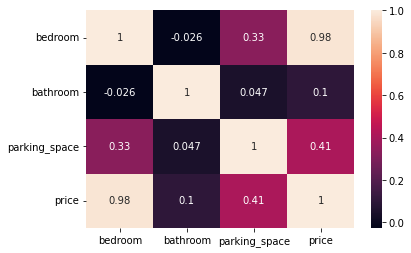

         loc      title  bedroom  bathroom  parking_space      price
341    Gombe  Apartment     1.00      5.00            NaN  954054.59
11898  Gombe  Apartment     1.00      1.00           3.00  789763.48
1145   Gombe  Apartment     1.00      1.00            NaN  923229.71
2759   Gombe  Apartment     1.00      2.00           1.00  552016.86
11369  Gombe  Apartment     1.00      5.00           2.00  881182.42
4909   Gombe  Apartment     1.00       NaN           1.00  806310.87
8455   Gombe  Apartment     3.00       NaN           2.00 1186606.85
7706   Gombe  Apartment     3.00      2.00           2.00 1146727.22
5677   Gombe  Apartment     3.00       NaN           5.00 1159033.24
6540   Gombe  Apartment     3.00      7.00           4.00 1305270.68
4787   Gombe  Apartment     3.00      1.00           3.00 1075473.46
5438   Gombe  Apartment     4.00      1.00           2.00 1301209.88
12099  Gombe  Apartment     4.00      7.00           2.00 1443499.03
4106   Gombe  Apartment     4.00  

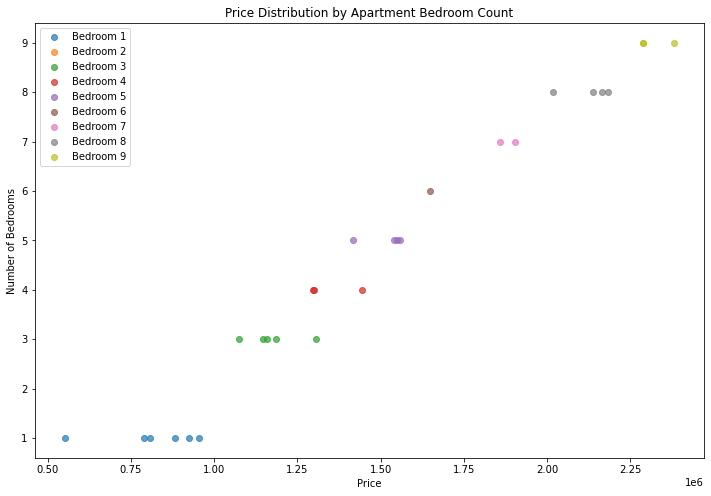



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  31.00000  29.00000      32.00000       36.00000
mean    4.41935   3.41379       3.18750  1541088.68245
std     2.68048   2.06185       1.63505   544736.20131
min     1.00000   1.00000       1.00000   819796.77230
25%     2.00000   2.00000       2.00000  1134015.44550
50%     4.00000   3.00000       3.00000  1388638.01250
75%     5.50000   5.00000       4.00000  1788703.61500
max     9.00000   7.00000       6.00000  2658566.56800


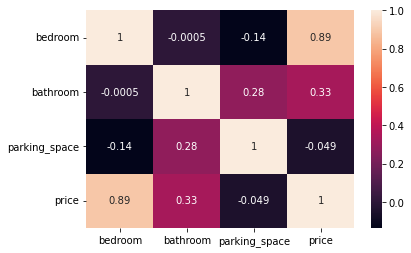

         loc     title  bedroom  bathroom  parking_space      price
136    Gombe  Bungalow     1.00      5.00           3.00 1017936.10
11472  Gombe  Bungalow     1.00      7.00           6.00 1143047.66
6858   Gombe  Bungalow     1.00      2.00           2.00  936330.04
9369   Gombe  Bungalow     2.00       NaN           2.00 1108579.00
7361   Gombe  Bungalow     2.00      3.00           6.00 1191861.48
7318   Gombe  Bungalow     2.00      3.00           1.00 1087758.39
5327   Gombe  Bungalow     2.00      7.00           2.00 1233878.42
3664   Gombe  Bungalow     2.00      1.00            NaN 1049915.73
5065   Gombe  Bungalow     2.00      6.00            NaN 1223374.18
3342   Gombe  Bungalow     3.00      4.00            NaN 1404206.52
4307   Gombe  Bungalow     3.00      1.00           3.00  819796.77
955    Gombe  Bungalow     3.00       NaN           2.00 1142494.26
5957   Gombe  Bungalow     3.00      5.00           3.00 1373069.51
1766   Gombe  Bungalow     3.00      1.00       

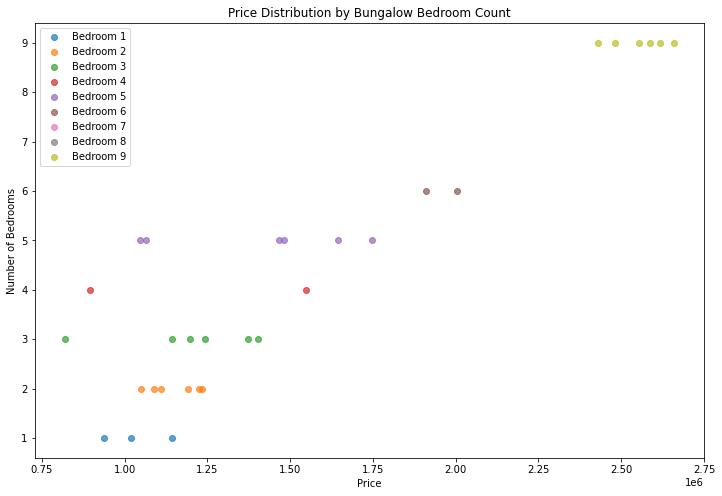



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  33.00000  34.00000      34.00000       38.00000
mean    4.78788   2.94118       3.58824  1541822.87547
std     2.58309   2.01421       1.51992   593052.47287
min     1.00000   1.00000       1.00000   632824.57360
25%     3.00000   1.00000       2.25000  1098422.64525
50%     5.00000   2.00000       4.00000  1387812.25850
75%     7.00000   5.00000       4.75000  2071065.20850
max     9.00000   7.00000       6.00000  2627241.71600


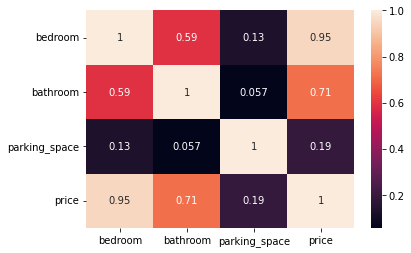

         loc title  bedroom  bathroom  parking_space      price
11582  Gombe  Flat     1.00      1.00           4.00  988011.08
1967   Gombe  Flat     1.00      2.00           3.00  917258.60
12824  Gombe  Flat     1.00      1.00           4.00  632824.57
4382   Gombe  Flat     1.00      2.00           1.00  865765.64
8122   Gombe  Flat     2.00      4.00            NaN 1119083.24
1876   Gombe  Flat     2.00      5.00           6.00 1254511.19
3832   Gombe  Flat     2.00       NaN           5.00 1296340.27
11906  Gombe  Flat     3.00      2.00           1.00 1149218.90
6728   Gombe  Flat     3.00      2.00           2.00  810734.59
6042   Gombe  Flat     3.00      1.00           4.00 1272967.06
7831   Gombe  Flat     3.00      1.00           4.00 1246290.58
3293   Gombe  Flat     3.00      1.00            NaN  756684.77
2618   Gombe  Flat     3.00      5.00           5.00 1414710.75
2562   Gombe  Flat     4.00       NaN           5.00 1631849.91
1364   Gombe  Flat     4.00      2.00   

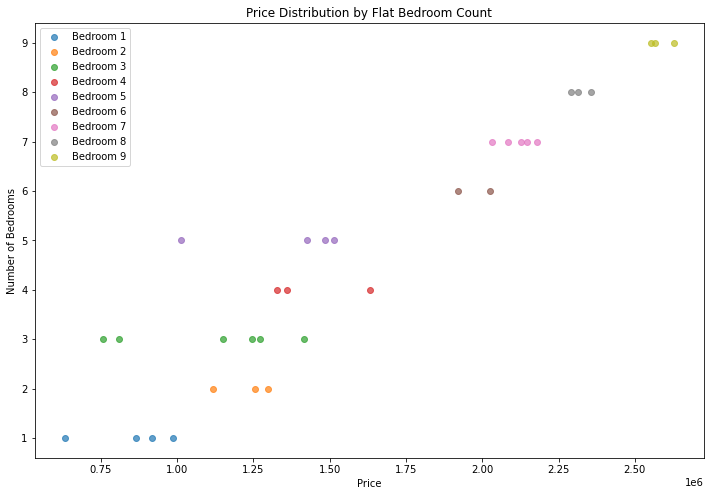



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  19.00000  22.00000      20.00000       26.00000
mean    3.57895   3.00000       2.85000  1419825.10747
std     2.06332   2.18218       1.30888   534742.16215
min     1.00000   1.00000       1.00000   664314.34650
25%     2.00000   1.00000       2.00000  1024007.57275
50%     4.00000   2.00000       3.00000  1286600.03400
75%     5.00000   5.00000       4.00000  1805468.26600
max     8.00000   7.00000       5.00000  2554065.83100


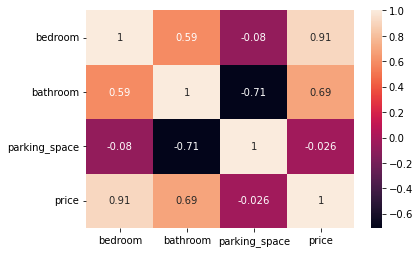

         loc           title  bedroom  bathroom  parking_space      price
3400   Gombe  Terrace duplex     1.00       NaN           4.00  702726.14
4008   Gombe  Terrace duplex     1.00      5.00            NaN 1089625.34
12757  Gombe  Terrace duplex     1.00       NaN           2.00 1077808.07
6965   Gombe  Terrace duplex     1.00       NaN           2.00 1028436.79
12406  Gombe  Terrace duplex     2.00       NaN           3.00 1224376.10
5491   Gombe  Terrace duplex     2.00      1.00           2.00  765325.74
10765  Gombe  Terrace duplex     2.00      4.00           1.00 1239647.98
674    Gombe  Terrace duplex     3.00      2.00            NaN  871341.93
2512   Gombe  Terrace duplex     3.00      1.00           4.00 1341453.35
8172   Gombe  Terrace duplex     4.00      1.00            NaN  994670.86
5984   Gombe  Terrace duplex     4.00      1.00           4.00 1445167.86
7172   Gombe  Terrace duplex     4.00      2.00           1.00 1022473.00
5997   Gombe  Terrace duplex     5.00 

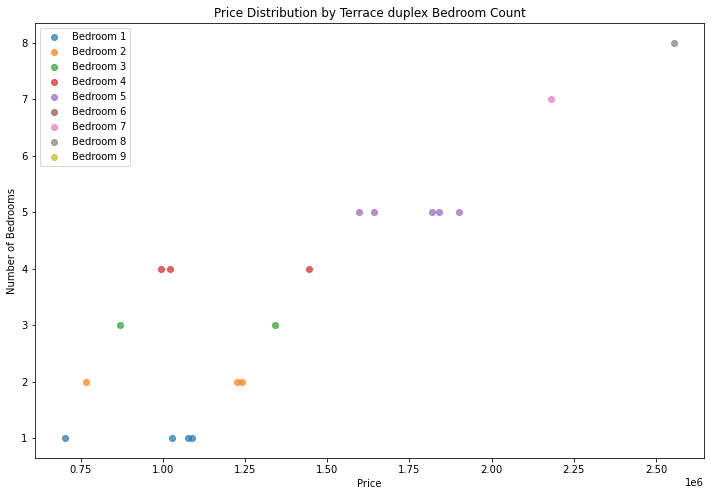



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  26.00000  28.00000      27.00000       34.00000
mean    4.23077   3.32143       3.48148  1723592.15343
std     2.68786   2.38907       1.55342   601342.44468
min     1.00000   1.00000       1.00000   931222.73670
25%     2.00000   1.00000       2.50000  1201569.89625
50%     3.50000   2.00000       3.00000  1506771.25250
75%     5.75000   6.00000       4.50000  2185653.18275
max     9.00000   7.00000       6.00000  2811670.49600


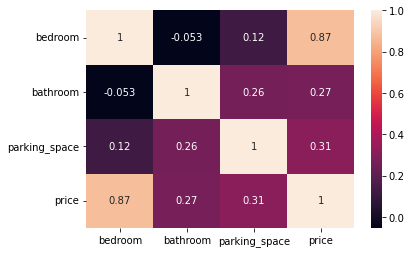

         loc                 title  bedroom  bathroom  parking_space  \
6186   Gombe  Semi-detached duplex     1.00      2.00           3.00   
12499  Gombe  Semi-detached duplex     1.00      6.00           6.00   
11485  Gombe  Semi-detached duplex     1.00      7.00           4.00   
2137   Gombe  Semi-detached duplex     1.00      1.00            NaN   
13073  Gombe  Semi-detached duplex     1.00      2.00            NaN   
9352   Gombe  Semi-detached duplex     2.00       NaN           2.00   
13412  Gombe  Semi-detached duplex     2.00       NaN           3.00   
908    Gombe  Semi-detached duplex     2.00      7.00           3.00   
8130   Gombe  Semi-detached duplex     3.00      1.00            NaN   
8601   Gombe  Semi-detached duplex     3.00      2.00            NaN   
11109  Gombe  Semi-detached duplex     3.00      5.00           1.00   
13051  Gombe  Semi-detached duplex     3.00      1.00           3.00   
12763  Gombe  Semi-detached duplex     3.00      1.00           

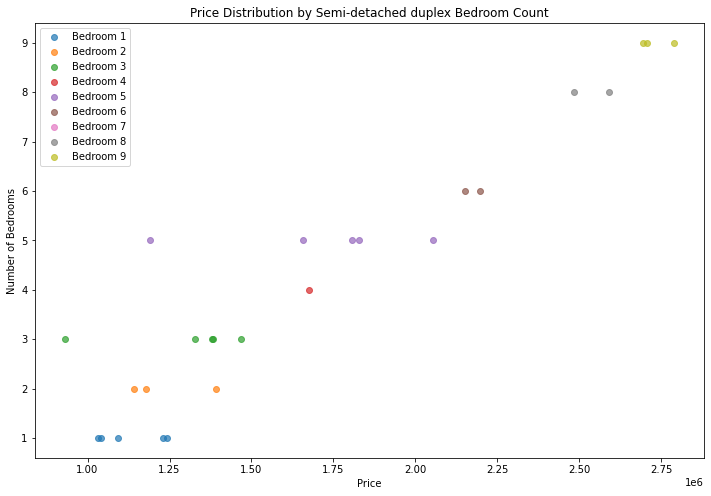



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  20.00000  21.00000      19.00000       22.00000
mean    4.95000   3.28571       3.52632  1989440.70555
std     2.23548   2.17124       1.92551   568041.74716
min     1.00000   1.00000       1.00000  1145973.07300
25%     3.75000   1.00000       2.00000  1587336.21450
50%     5.00000   3.00000       4.00000  1996267.79400
75%     6.00000   5.00000       5.50000  2276426.73750
max     9.00000   7.00000       6.00000  3066157.54100


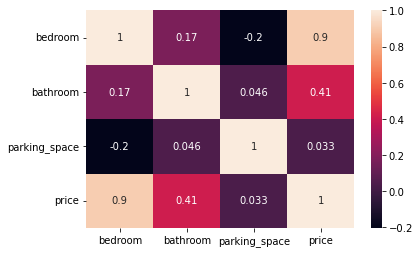

         loc      title  bedroom  bathroom  parking_space      price
2949   Gombe  Townhouse     1.00      1.00           4.00 1155051.23
8257   Gombe  Townhouse     1.00      7.00            NaN 1281267.95
144    Gombe  Townhouse     3.00      2.00           4.00 1495613.04
11459  Gombe  Townhouse     3.00      6.00           5.00 1745947.86
7892   Gombe  Townhouse     3.00      2.00           4.00 1576104.24
2358   Gombe  Townhouse     4.00      3.00           2.00 1758516.39
5036   Gombe  Townhouse     4.00      1.00           2.00 1621032.15
10322  Gombe  Townhouse     4.00      6.00           2.00 1875984.58
2023   Gombe  Townhouse     5.00      1.00            NaN 1145973.07
3028   Gombe  Townhouse     5.00      1.00           6.00 1996150.39
3927   Gombe  Townhouse     5.00      7.00           6.00 2231086.78
10958  Gombe  Townhouse     5.00      3.00           3.00 1996385.20
12292  Gombe  Townhouse     5.00      1.00           1.00 1223613.07
11376  Gombe  Townhouse     6.00  

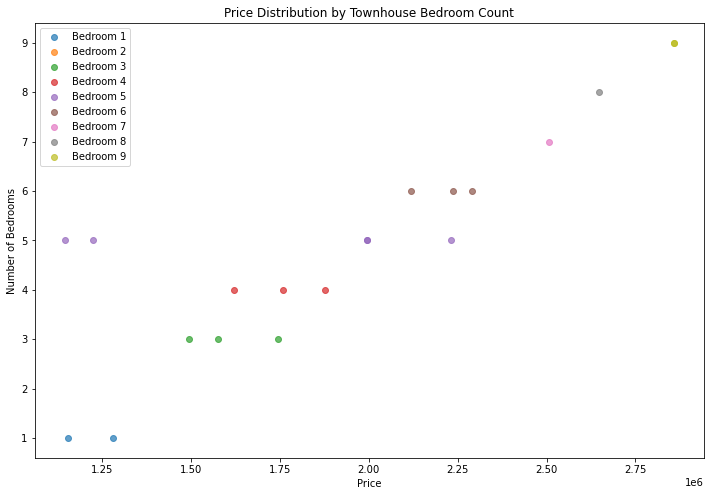



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  18.00000  24.00000      21.00000       25.00000
mean    4.38889   2.75000       2.90476  2317949.94804
std     3.12747   2.00543       1.64027   791205.01114
min     1.00000   1.00000       1.00000  1017326.59000
25%     1.25000   1.00000       2.00000  1714228.17400
50%     4.00000   2.00000       3.00000  2328883.31800
75%     7.50000   3.50000       4.00000  2812165.39300
max     9.00000   7.00000       6.00000  3707767.14900


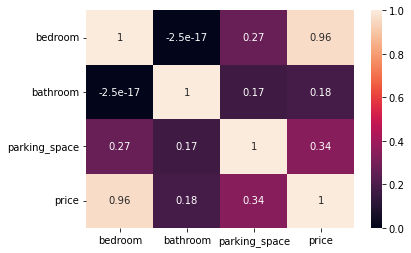

         loc      title  bedroom  bathroom  parking_space      price
9050   Gombe  Penthouse     1.00      1.00            NaN 1440836.23
3276   Gombe  Penthouse     1.00      2.00           2.00 1017326.59
6323   Gombe  Penthouse     1.00      2.00           2.00 1663412.94
4675   Gombe  Penthouse     1.00      2.00            NaN 1714228.17
5107   Gombe  Penthouse     1.00      1.00            NaN 1507954.56
728    Gombe  Penthouse     2.00      1.00           2.00 1153164.23
9378   Gombe  Penthouse     2.00      3.00            NaN 1772504.57
6391   Gombe  Penthouse     3.00      5.00           3.00 2077246.35
5195   Gombe  Penthouse     3.00      2.00           2.00 1988463.04
3072   Gombe  Penthouse     5.00      2.00           1.00 2328883.32
11058  Gombe  Penthouse     5.00      7.00           5.00 2733575.42
12029  Gombe  Penthouse     5.00      6.00           2.00 2581172.02
4617   Gombe  Penthouse     6.00      5.00           1.00 2744803.63
3957   Gombe  Penthouse     8.00  

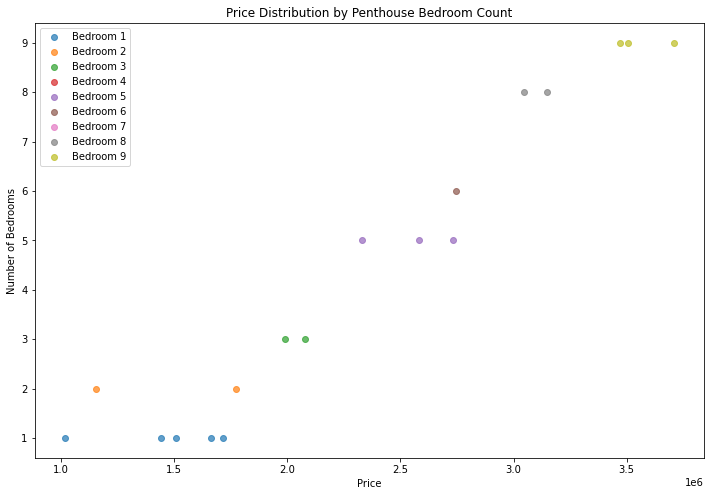



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  7.00000  8.00000       8.00000        8.00000
mean   3.00000  1.25000       2.12500   935958.95884
std    1.91485  0.46291       1.55265   486965.10157
min    1.00000  1.00000       1.00000   431967.29000
25%    1.00000  1.00000       1.00000   647870.93847
50%    4.00000  1.00000       1.00000   803240.54565
75%    4.50000  1.25000       4.00000  1121051.89003
max    5.00000  2.00000       4.00000  1676102.22800


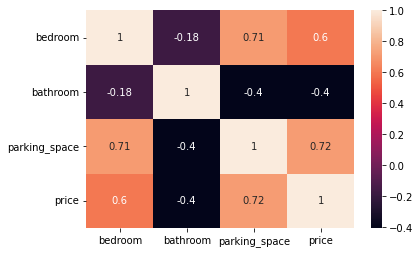

         loc    title  bedroom  bathroom  parking_space      price
4481   Gombe  Cottage     1.00      2.00           1.00  431967.29
5043   Gombe  Cottage     1.00      1.00           1.00  939320.95
13538  Gombe  Cottage     1.00      1.00           1.00  455591.23
5037   Gombe  Cottage     4.00      2.00           1.00  737507.54
13241  Gombe  Cottage     4.00      1.00           1.00  711964.18
2854   Gombe  Cottage     5.00      1.00           4.00  868973.55
9202   Gombe  Cottage     5.00      1.00           4.00 1666244.71
4012   Gombe  Cottage      NaN      1.00           4.00 1676102.23


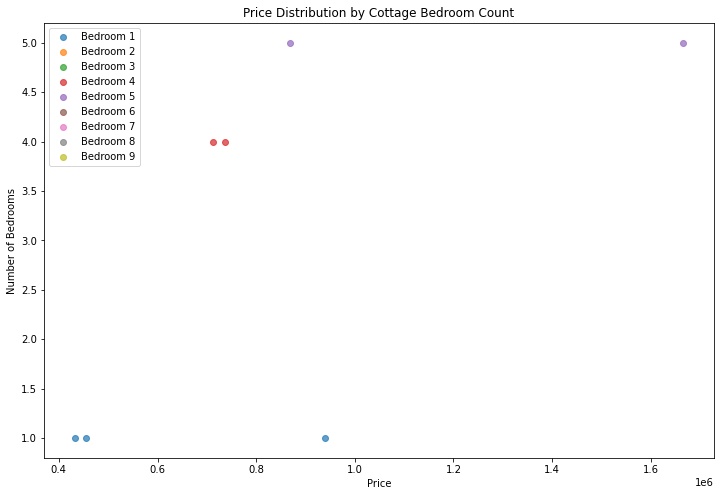

In [267]:
# Gombe
Gombe = housing_train[housing_train["loc" ] == "Gombe"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Gombe, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      28.00000       34.00000
mean    5.00000   3.23077       3.10714  2921621.07212
std     2.67467   2.37163       1.66309   897950.71286
min     1.00000   1.00000       1.00000  1433164.49700
25%     3.00000   1.00000       2.00000  2332123.10300
50%     5.00000   2.00000       3.00000  2856961.33700
75%     7.50000   5.75000       5.00000  3706278.56675
max     9.00000   7.00000       6.00000  4346604.44200


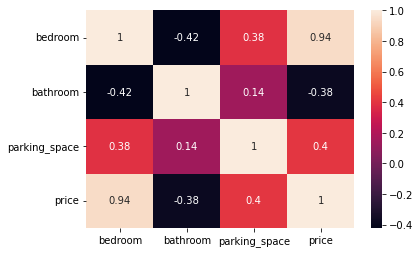

          loc    title  bedroom  bathroom  parking_space      price
5538   Jigawa  Mansion     1.00      7.00           1.00 2083964.15
2296   Jigawa  Mansion     1.00      7.00           5.00 2257035.55
10153  Jigawa  Mansion     2.00      2.00           1.00 2862110.97
7483   Jigawa  Mansion     2.00      6.00           2.00 2332415.88
4366   Jigawa  Mansion     2.00      5.00           5.00 2397122.47
12495  Jigawa  Mansion     3.00      1.00            NaN 1433164.50
2576   Jigawa  Mansion     3.00       NaN           3.00 2652871.52
7068   Jigawa  Mansion     3.00       NaN           1.00 3360202.75
4310   Jigawa  Mansion     3.00       NaN           4.00 1517976.56
5237   Jigawa  Mansion     3.00      2.00           3.00 3289552.34
6206   Jigawa  Mansion     3.00      4.00           2.00 2479409.75
4070   Jigawa  Mansion     4.00      2.00            NaN 1511755.05
6961   Jigawa  Mansion     4.00      1.00           5.00 2695904.34
7440   Jigawa  Mansion     5.00      1.00       

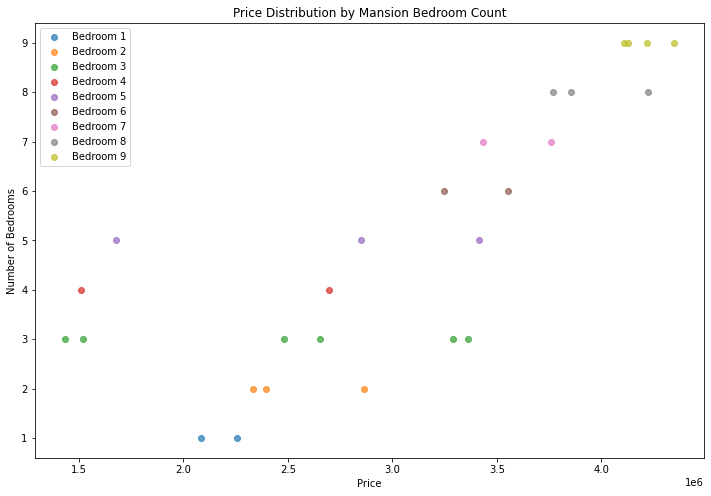



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  29.00000  26.00000      29.00000       34.00000
mean    4.06897   3.84615       3.03448  1752823.75574
std     1.86951   2.57204       1.76236   413511.70741
min     1.00000   1.00000       1.00000  1147592.97800
25%     3.00000   1.25000       1.00000  1490091.15800
50%     4.00000   3.00000       3.00000  1724870.35400
75%     5.00000   7.00000       5.00000  1889390.25600
max     8.00000   7.00000       6.00000  2728672.17400


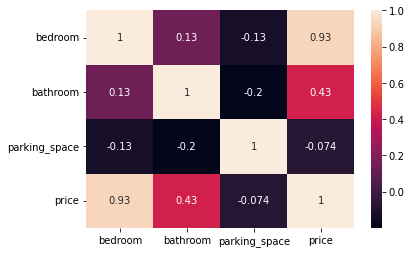

          loc            title  bedroom  bathroom  parking_space      price
6058   Jigawa  Detached duplex     1.00       NaN           5.00 1185280.69
5735   Jigawa  Detached duplex     1.00       NaN           1.00 1198144.60
2325   Jigawa  Detached duplex     1.00      2.00           5.00 1147592.98
2638   Jigawa  Detached duplex     1.00       NaN           3.00 1172868.79
319    Jigawa  Detached duplex     2.00      1.00           4.00 1277087.22
11599  Jigawa  Detached duplex     2.00      1.00           1.00 1236771.78
10177  Jigawa  Detached duplex     2.00       NaN           5.00 1302137.03
10755  Jigawa  Detached duplex     3.00      7.00           4.00 1702352.22
13867  Jigawa  Detached duplex     3.00      7.00           2.00 1652252.60
4933   Jigawa  Detached duplex     4.00      6.00           2.00 1818497.73
11858  Jigawa  Detached duplex     4.00      3.00           1.00 1680384.78
698    Jigawa  Detached duplex     4.00      7.00           1.00 1831135.64
1307   Jigaw

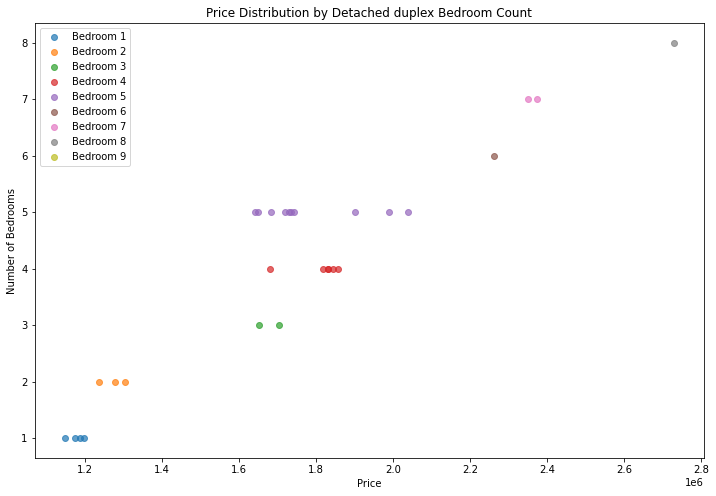



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  24.00000  26.00000      18.00000       28.00000
mean    4.16667   2.84615       3.88889  1324741.48649
std     2.82330   1.86959       1.45072   481278.83303
min     1.00000   1.00000       1.00000   698708.18010
25%     2.00000   1.25000       3.00000   930416.54540
50%     3.00000   2.00000       4.00000  1130660.19350
75%     6.25000   4.50000       5.00000  1684700.93450
max     9.00000   7.00000       6.00000  2175834.25300


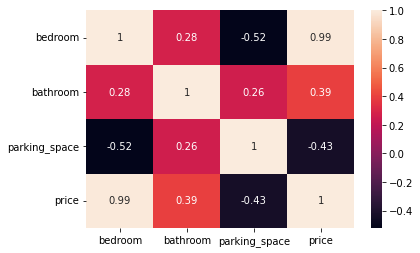

          loc      title  bedroom  bathroom  parking_space      price
8648   Jigawa  Apartment     1.00      1.00           4.00  807337.61
13721  Jigawa  Apartment     1.00      3.00           5.00  779597.18
2138   Jigawa  Apartment     1.00      1.00            NaN  698708.18
13389  Jigawa  Apartment     1.00      3.00           6.00  795537.97
6497   Jigawa  Apartment     1.00      7.00           6.00  891470.33
2951   Jigawa  Apartment     2.00      3.00           5.00  932804.41
13105  Jigawa  Apartment     2.00      2.00           4.00  923252.95
6851   Jigawa  Apartment     2.00      5.00            NaN  964829.80
10573  Jigawa  Apartment     2.00      2.00            NaN  883314.10
12918  Jigawa  Apartment     3.00      1.00           3.00 1013369.27
585    Jigawa  Apartment     3.00      2.00            NaN 1052994.71
4575   Jigawa  Apartment     3.00      2.00            NaN 1084876.28
2868   Jigawa  Apartment     3.00      5.00            NaN 1093062.41
9156   Jigawa  Apart

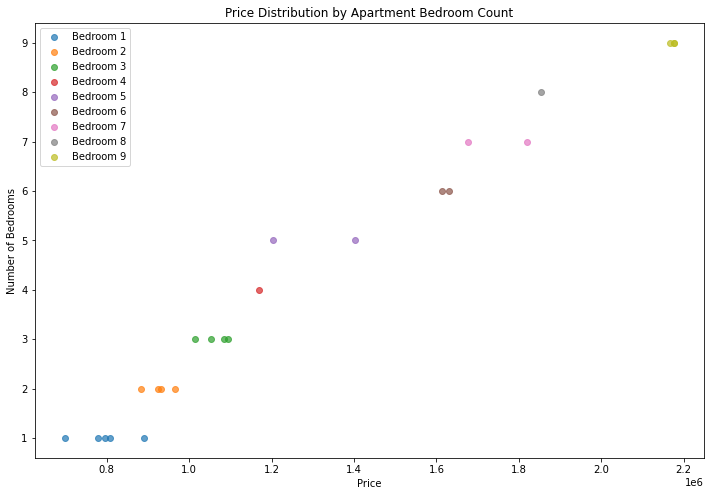



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  26.00000  29.00000      29.00000       33.00000
mean    3.76923   3.24138       3.06897  1268061.39429
std     2.32048   2.21448       1.48639   440045.45222
min     1.00000   1.00000       1.00000   807981.52400
25%     2.00000   1.00000       2.00000   915376.63300
50%     3.00000   2.00000       3.00000  1160624.75000
75%     5.00000   5.00000       4.00000  1388516.17700
max     9.00000   7.00000       6.00000  2362156.51500


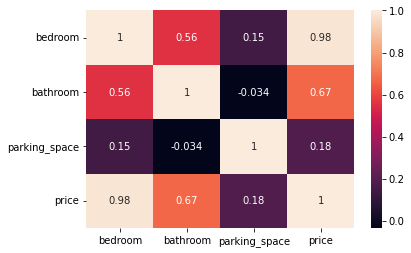

          loc     title  bedroom  bathroom  parking_space      price
10756  Jigawa  Bungalow     1.00      2.00           2.00  839539.75
943    Jigawa  Bungalow     1.00      4.00            NaN  871991.22
7803   Jigawa  Bungalow     1.00      1.00           4.00  807981.52
81     Jigawa  Bungalow     2.00      1.00           4.00  914752.58
1181   Jigawa  Bungalow     2.00      1.00            NaN  960769.46
10597  Jigawa  Bungalow     2.00       NaN           1.00  897865.50
10531  Jigawa  Bungalow     2.00      1.00           2.00  908809.44
7816   Jigawa  Bungalow     2.00      6.00           3.00 1089773.07
5475   Jigawa  Bungalow     2.00      1.00           5.00  989162.93
7453   Jigawa  Bungalow     2.00      2.00           3.00  948388.00
7258   Jigawa  Bungalow     3.00      5.00            NaN 1195798.06
5429   Jigawa  Bungalow     3.00      1.00           2.00 1058696.02
2981   Jigawa  Bungalow     3.00       NaN           3.00 1232234.14
6087   Jigawa  Bungalow     3.00  

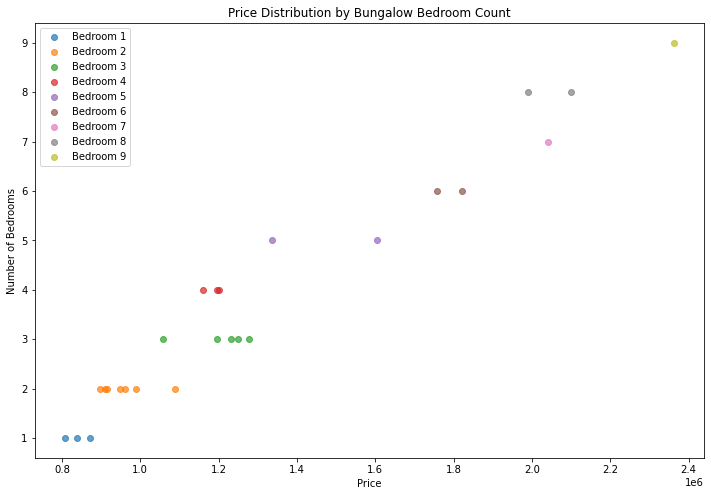



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  27.00000  29.00000      27.00000       33.00000
mean    4.29630   3.31034       2.77778  1428486.83823
std     2.83949   2.34678       1.71718   506429.74883
min     1.00000   1.00000       1.00000   771545.43960
25%     1.50000   1.00000       1.00000  1034790.21800
50%     3.00000   2.00000       2.00000  1268834.59100
75%     7.00000   6.00000       4.00000  1859604.59600
max     9.00000   7.00000       6.00000  2380538.92300


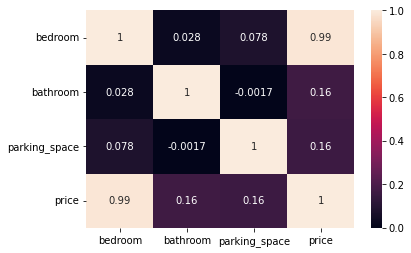

          loc title  bedroom  bathroom  parking_space      price
9412   Jigawa  Flat     1.00      2.00           4.00  847630.91
2475   Jigawa  Flat     1.00      7.00           5.00  990655.04
3735   Jigawa  Flat     1.00      4.00           3.00  871991.22
3920   Jigawa  Flat     1.00       NaN           4.00  806316.84
12740  Jigawa  Flat     1.00      1.00           2.00  771545.44
6953   Jigawa  Flat     1.00      6.00           1.00  890373.63
7728   Jigawa  Flat     1.00       NaN           4.00  972437.00
8416   Jigawa  Flat     2.00      1.00            NaN  968281.44
12093  Jigawa  Flat     3.00      1.00           1.00 1086161.07
2297   Jigawa  Flat     3.00       NaN           4.00 1060114.72
4855   Jigawa  Flat     3.00      1.00           1.00 1077713.54
12341  Jigawa  Flat     3.00      6.00            NaN 1223207.30
11118  Jigawa  Flat     3.00      7.00            NaN 1305270.68
12897  Jigawa  Flat     3.00      7.00           2.00 1268834.59
6632   Jigawa  Flat     4

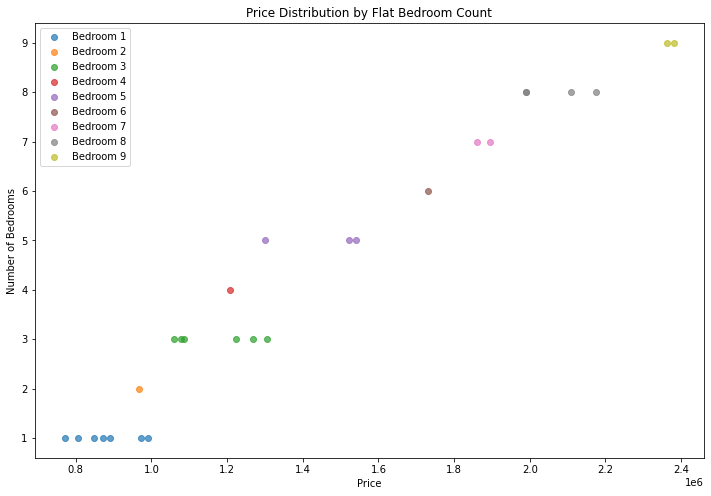



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  22.00000  20.00000      20.00000       24.00000
mean    4.40909   3.35000       2.80000  1568932.87632
std     2.70201   2.18307       1.54238   525195.69071
min     1.00000   1.00000       1.00000   848986.91720
25%     2.00000   1.75000       1.75000  1139702.90675
50%     4.00000   2.50000       3.00000  1526332.46050
75%     6.75000   5.00000       4.00000  1983095.26300
max     9.00000   7.00000       6.00000  2435662.18600


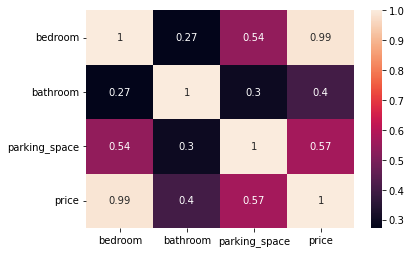

          loc           title  bedroom  bathroom  parking_space      price
5751   Jigawa  Terrace duplex     1.00      1.00           2.00  890244.83
1416   Jigawa  Terrace duplex     1.00      2.00            NaN  905975.84
2159   Jigawa  Terrace duplex     1.00      2.00           1.00  848986.92
6479   Jigawa  Terrace duplex     1.00      4.00           4.00  992779.04
10458  Jigawa  Terrace duplex     2.00      1.00           1.00 1062109.01
3503   Jigawa  Terrace duplex     2.00      1.00            NaN 1093487.63
6842   Jigawa  Terrace duplex     2.00       NaN           2.00 1217014.15
1356   Jigawa  Terrace duplex     3.00      2.00           4.00 1167727.45
6907   Jigawa  Terrace duplex     3.00      7.00           3.00 1417135.89
7171   Jigawa  Terrace duplex     3.00      1.00           4.00 1217248.52
7378   Jigawa  Terrace duplex     3.00      1.00           2.00 1155108.00
678    Jigawa  Terrace duplex     5.00      2.00           3.00 1635529.03
9653   Jigawa  Terrace du

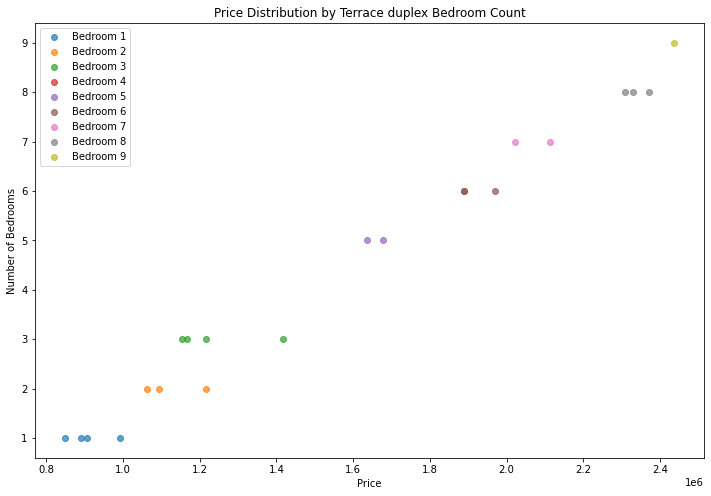



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  33.00000  28.00000      28.00000       35.00000
mean    4.45455   3.28571       3.28571  1559675.58051
std     2.62311   2.07020       1.58365   512245.75099
min     1.00000   1.00000       1.00000   906603.56720
25%     2.00000   1.75000       2.00000  1116730.29500
50%     4.00000   2.50000       3.00000  1447786.38200
75%     7.00000   5.00000       5.00000  2020608.45100
max     9.00000   7.00000       6.00000  2517828.28700


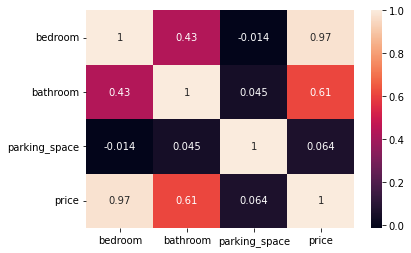

          loc                 title  bedroom  bathroom  parking_space  \
149    Jigawa  Semi-detached duplex     1.00      2.00            NaN   
9483   Jigawa  Semi-detached duplex     1.00      5.00           4.00   
3181   Jigawa  Semi-detached duplex     1.00      2.00            NaN   
7657   Jigawa  Semi-detached duplex     1.00       NaN           1.00   
13965  Jigawa  Semi-detached duplex     1.00      2.00            NaN   
11830  Jigawa  Semi-detached duplex     2.00      2.00           4.00   
10865  Jigawa  Semi-detached duplex     2.00      1.00           5.00   
10184  Jigawa  Semi-detached duplex     2.00      1.00           2.00   
4568   Jigawa  Semi-detached duplex     2.00      7.00           3.00   
13775  Jigawa  Semi-detached duplex     2.00      4.00            NaN   
7915   Jigawa  Semi-detached duplex     3.00      4.00           2.00   
8931   Jigawa  Semi-detached duplex     3.00      2.00           2.00   
1341   Jigawa  Semi-detached duplex     3.00      6

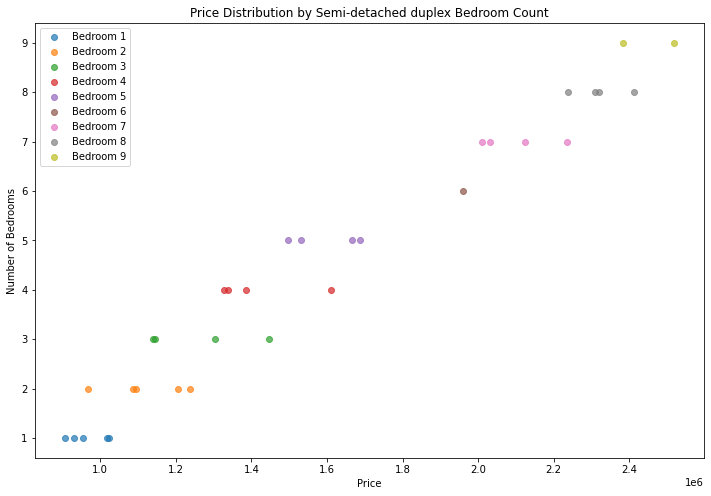



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  21.00000  19.00000      19.00000       24.00000
mean    4.71429   3.36842       2.73684  1741095.25743
std     2.49285   2.00584       1.69450   523294.71308
min     1.00000   1.00000       1.00000   962436.79240
25%     3.00000   2.00000       1.00000  1318540.10450
50%     5.00000   2.00000       2.00000  1703110.45850
75%     6.00000   5.00000       4.00000  2196724.33350
max     9.00000   7.00000       6.00000  2643710.82900


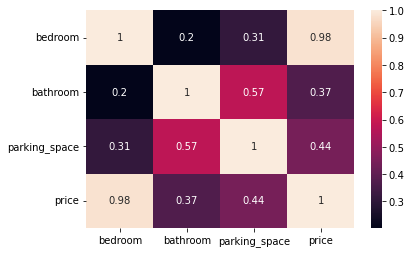

          loc      title  bedroom  bathroom  parking_space      price
3377   Jigawa  Townhouse     1.00      2.00           1.00  962436.79
4816   Jigawa  Townhouse     1.00      6.00           1.00 1095554.27
3935   Jigawa  Townhouse     2.00      2.00            NaN 1186528.78
11681  Jigawa  Townhouse     2.00      1.00           3.00 1208152.26
8661   Jigawa  Townhouse     2.00      2.00           2.00 1121161.31
12285  Jigawa  Townhouse     3.00       NaN           2.00 1368833.63
6097   Jigawa  Townhouse     3.00      5.00           4.00 1501468.59
3837   Jigawa  Townhouse     4.00      7.00           5.00 1786940.97
10890  Jigawa  Townhouse     4.00      1.00           1.00 1355336.05
6437   Jigawa  Townhouse     4.00      6.00            NaN 1775451.96
1811   Jigawa  Townhouse     5.00      2.00            NaN 1790766.33
13304  Jigawa  Townhouse     5.00       NaN           1.00 1756710.23
4056   Jigawa  Townhouse     5.00       NaN           2.00 1649510.69
12712  Jigawa  Townh

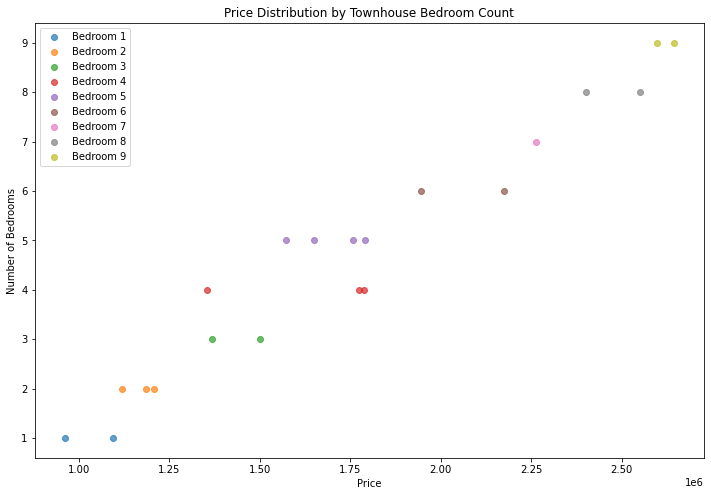



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  27.00000  31.00000      27.00000       34.00000
mean    4.18519   2.83871       3.40741  2061769.97988
std     2.74614   1.71458       1.50024   591250.84247
min     1.00000   1.00000       1.00000  1358518.12800
25%     2.00000   1.50000       2.00000  1581356.66500
50%     4.00000   2.00000       3.00000  1879861.89800
75%     6.50000   4.00000       4.00000  2614703.23750
max     9.00000   7.00000       6.00000  3175083.45900


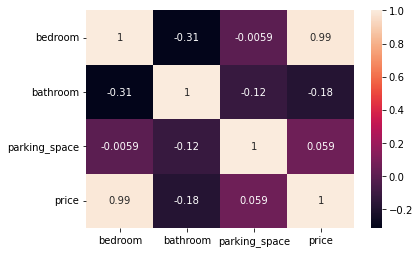

          loc      title  bedroom  bathroom  parking_space      price
8191   Jigawa  Penthouse     1.00      2.00            NaN 1491826.21
12793  Jigawa  Penthouse     1.00      5.00           6.00 1506806.81
8614   Jigawa  Penthouse     1.00      3.00           4.00 1358518.13
8467   Jigawa  Penthouse     1.00      6.00           1.00 1403325.25
3455   Jigawa  Penthouse     1.00      4.00           5.00 1432662.47
13208  Jigawa  Penthouse     2.00      3.00           4.00 1570262.16
8178   Jigawa  Penthouse     2.00      7.00           2.00 1689213.62
6788   Jigawa  Penthouse     2.00      1.00            NaN 1614640.17
602    Jigawa  Penthouse     2.00      5.00            NaN 1659342.21
4966   Jigawa  Penthouse     2.00      1.00           3.00 1549956.38
8021   Jigawa  Penthouse     3.00       NaN           2.00 1685164.48
11863  Jigawa  Penthouse     3.00      1.00           6.00 1759041.73
9226   Jigawa  Penthouse     4.00      1.00           1.00 1874306.82
4511   Jigawa  Penth

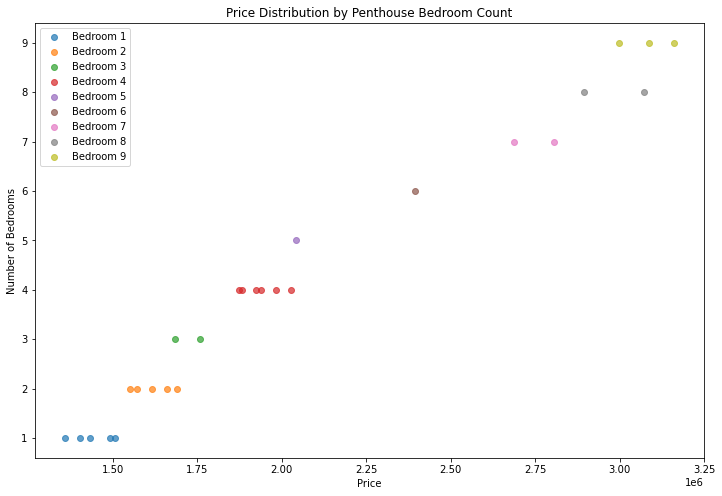



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  8.00000  8.00000       9.00000       10.00000
mean   2.87500  1.37500       1.77778  1015624.34120
std    1.72689  0.51755       1.30171   246562.25849
min    1.00000  1.00000       1.00000   602843.76210
25%    1.00000  1.00000       1.00000   896859.26840
50%    3.00000  1.00000       1.00000   976799.28530
75%    4.25000  2.00000       2.00000  1198367.21475
max    5.00000  2.00000       4.00000  1431141.85600


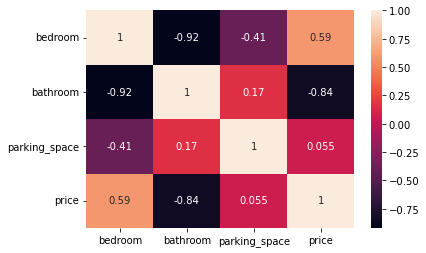

          loc    title  bedroom  bathroom  parking_space      price
6608   Jigawa  Cottage     1.00       NaN           2.00  602843.76
6768   Jigawa  Cottage     1.00      2.00           4.00  932207.79
11426  Jigawa  Cottage     1.00      2.00           1.00  914254.92
8756   Jigawa  Cottage     3.00       NaN           1.00  799381.46
9374   Jigawa  Cottage     3.00      1.00           4.00 1252853.60
11999  Jigawa  Cottage     4.00      1.00           1.00 1276200.47
6998   Jigawa  Cottage     5.00      1.00           1.00 1034908.06
13512  Jigawa  Cottage     5.00      1.00            NaN 1021390.79
6339   Jigawa  Cottage      NaN      1.00           1.00  891060.72
9248   Jigawa  Cottage      NaN      2.00           1.00 1431141.86


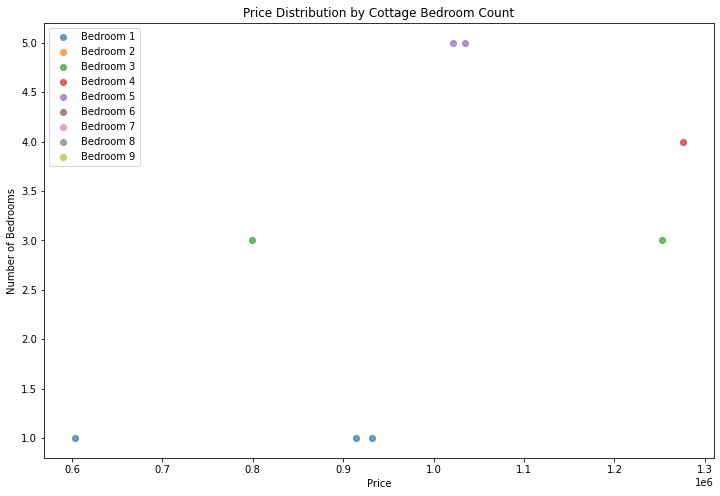

In [268]:
# Jigawa
Jigawa = housing_train[housing_train["loc" ] == "Jigawa"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Jigawa, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  26.00000  23.00000      23.00000       29.00000
mean    5.15385   3.13043       3.34783  3396425.47062
std     2.63351   2.00691       1.46501  1027288.73168
min     1.00000   1.00000       1.00000  1324708.29700
25%     3.00000   1.50000       2.50000  3032033.25600
50%     5.00000   3.00000       3.00000  3443569.17900
75%     7.50000   4.50000       4.00000  4105871.45900
max     9.00000   7.00000       6.00000  5066226.30500


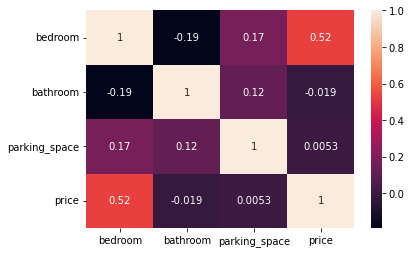

         loc    title  bedroom  bathroom  parking_space      price
12144  Kwara  Mansion     1.00      2.00           3.00 3221555.95
10070  Kwara  Mansion     2.00       NaN           2.00 1324708.30
6283   Kwara  Mansion     2.00      4.00           5.00 2643091.25
294    Kwara  Mansion     2.00      2.00            NaN 1447774.13
7476   Kwara  Mansion     3.00       NaN           4.00 3046104.05
2456   Kwara  Mansion     3.00      6.00           4.00 3046104.05
1587   Kwara  Mansion     3.00      1.00           1.00 1478239.23
6284   Kwara  Mansion     3.00       NaN           3.00 2922258.56
11029  Kwara  Mansion     3.00      1.00           2.00 3761091.38
4706   Kwara  Mansion     4.00      1.00            NaN 3032033.26
11888  Kwara  Mansion     4.00      6.00           2.00 3255668.96
11286  Kwara  Mansion     4.00      1.00           1.00 3817684.97
5109   Kwara  Mansion     5.00      7.00            NaN 3790604.25
11580  Kwara  Mansion     5.00      3.00           4.00 344356

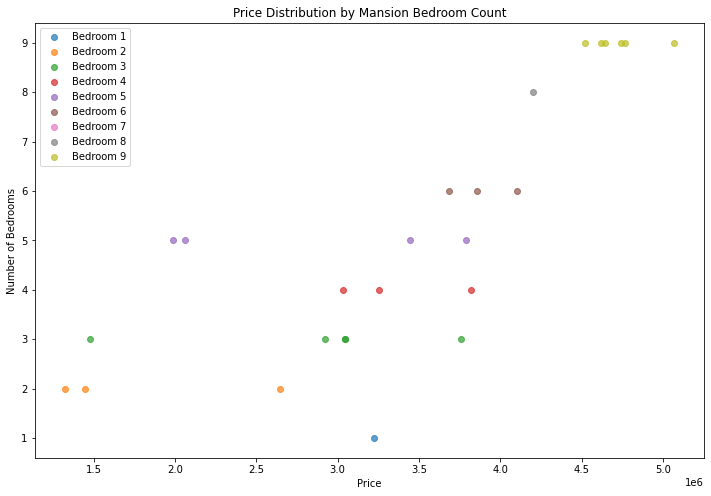



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  28.00000  30.00000      24.00000       32.00000
mean    3.57143   3.26667       2.45833  1840181.76281
std     1.75179   2.08332       1.58743   425869.58094
min     1.00000   1.00000       1.00000  1143999.60400
25%     2.00000   1.25000       1.00000  1566698.65350
50%     4.00000   2.50000       2.00000  1800282.24050
75%     5.00000   5.75000       4.00000  1975314.11225
max     8.00000   7.00000       6.00000  2998815.35600


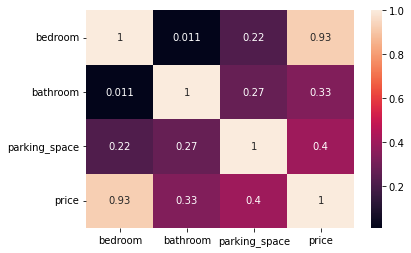

         loc            title  bedroom  bathroom  parking_space      price
12278  Kwara  Detached duplex     1.00      3.00            NaN 1344656.36
9561   Kwara  Detached duplex     1.00      1.00           1.00 1143999.60
7568   Kwara  Detached duplex     1.00      5.00            NaN 1402171.35
5769   Kwara  Detached duplex     1.00      6.00            NaN 1387986.32
9649   Kwara  Detached duplex     2.00      1.00            NaN 1339899.72
3245   Kwara  Detached duplex     2.00      1.00           2.00 1392473.56
7963   Kwara  Detached duplex     2.00      7.00           2.00 1638620.82
5771   Kwara  Detached duplex     2.00       NaN           5.00 1681434.21
5359   Kwara  Detached duplex     2.00      2.00           1.00 1359277.54
9568   Kwara  Detached duplex     3.00      1.00           1.00 1566032.22
873    Kwara  Detached duplex     3.00      2.00           5.00 1723617.30
2718   Kwara  Detached duplex     3.00      6.00           4.00 1867275.64
3464   Kwara  Detached du

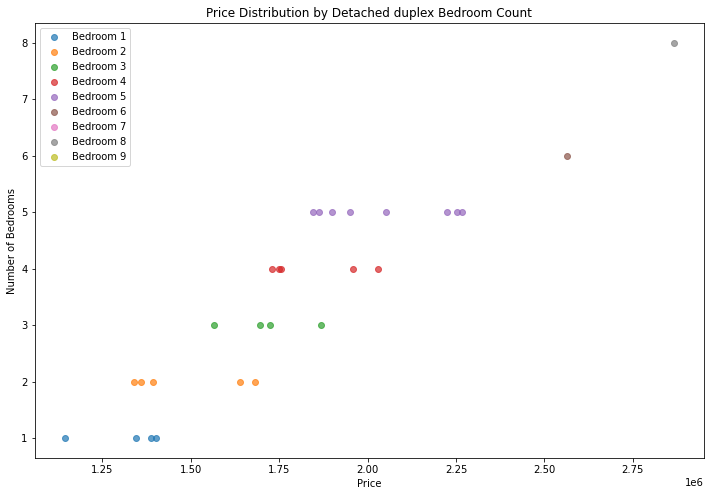



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  28.00000  26.00000      24.00000       31.00000
mean    3.67857   2.61538       3.04167  1286129.24843
std     1.65672   1.55118       1.36666   321031.05094
min     1.00000   1.00000       1.00000   807981.52400
25%     3.00000   2.00000       2.00000  1095037.30700
50%     3.00000   2.00000       3.00000  1177251.28400
75%     5.00000   3.75000       4.00000  1436132.94950
max     8.00000   6.00000       6.00000  2064225.36100


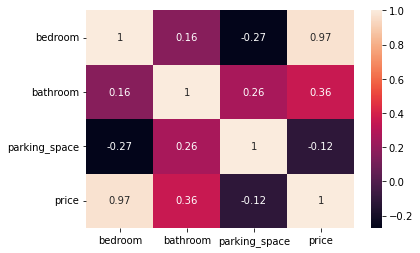

         loc      title  bedroom  bathroom  parking_space      price
8231   Kwara  Apartment     1.00      1.00           4.00  807981.52
3243   Kwara  Apartment     1.00      3.00           5.00  881018.06
12797  Kwara  Apartment     2.00      2.00            NaN 1034790.22
8593   Kwara  Apartment     2.00      2.00            NaN 1005455.12
3130   Kwara  Apartment     2.00      6.00           3.00 1089773.07
6406   Kwara  Apartment     2.00      1.00           3.00 1004693.99
7798   Kwara  Apartment     3.00      2.00           3.00 1116854.34
9438   Kwara  Apartment     3.00      1.00            NaN 1177251.28
7900   Kwara  Apartment     3.00      2.00           3.00 1159924.96
13750  Kwara  Apartment     3.00       NaN           4.00 1142422.06
13873  Kwara  Apartment     3.00      2.00           3.00 1100301.54
1081   Kwara  Apartment     3.00      2.00           4.00 1116816.16
2686   Kwara  Apartment     3.00      2.00            NaN 1168224.45
1242   Kwara  Apartment     3.00  

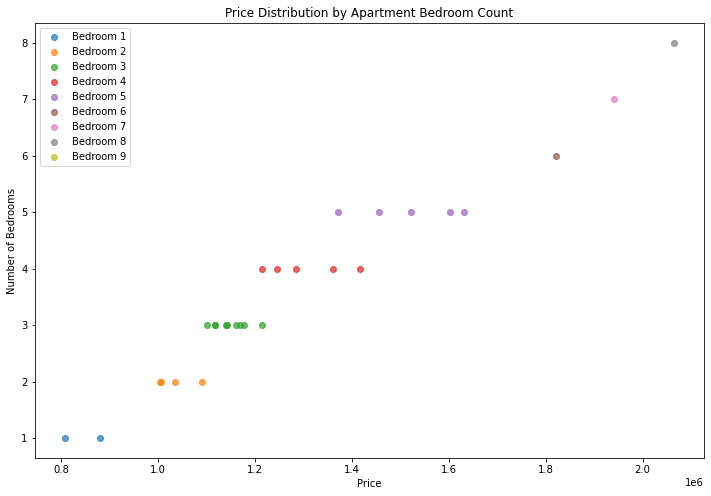



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  29.00000  27.00000      28.00000       33.00000
mean    4.58621   3.37037       2.53571  1615019.27037
std     2.45702   2.30631       1.52709   485412.34052
min     1.00000   1.00000       1.00000   902260.20350
25%     2.00000   2.00000       1.00000  1202553.56200
50%     5.00000   2.00000       2.00000  1623127.71300
75%     6.00000   5.50000       4.00000  1990173.98100
max     9.00000   7.00000       6.00000  2502130.15200


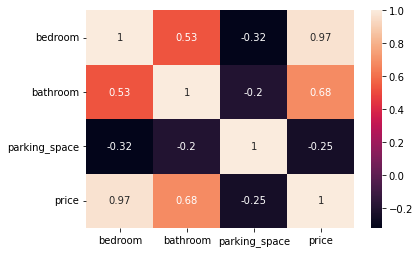

         loc     title  bedroom  bathroom  parking_space      price
10441  Kwara  Bungalow     1.00      2.00           6.00  986423.40
12207  Kwara  Bungalow     1.00      2.00           1.00  936474.76
11441  Kwara  Bungalow     1.00      1.00           4.00  902260.20
6389   Kwara  Bungalow     1.00      1.00           4.00  982722.28
12462  Kwara  Bungalow     2.00       NaN           1.00 1087758.39
4085   Kwara  Bungalow     2.00      1.00           2.00 1036064.45
13139  Kwara  Bungalow     2.00      7.00            NaN 1296340.27
10536  Kwara  Bungalow     2.00      6.00           2.00 1202553.56
9952   Kwara  Bungalow     3.00      1.00           1.00 1134994.18
8010   Kwara  Bungalow     3.00      2.00           2.00 1230006.47
10203  Kwara  Bungalow     4.00      1.00           2.00 1307369.66
10689  Kwara  Bungalow     4.00      2.00            NaN 1506550.50
7016   Kwara  Bungalow     4.00      2.00           1.00 1423268.02
3277   Kwara  Bungalow     4.00      1.00       

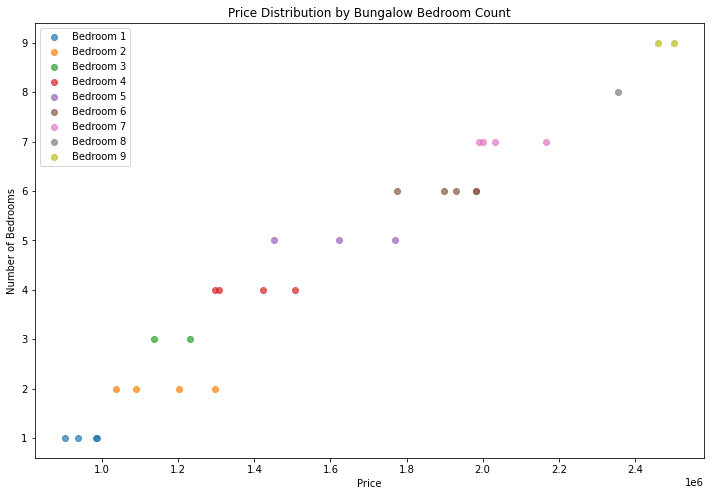



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      27.00000       31.00000
mean    4.48148   2.80769       2.70370  1537295.29002
std     2.53241   2.05950       1.61280   534675.72077
min     1.00000   1.00000       1.00000   903140.92110
25%     3.00000   1.00000       1.00000  1112331.02900
50%     5.00000   2.00000       2.00000  1414898.59400
75%     6.50000   4.00000       3.50000  1991776.54400
max     9.00000   7.00000       6.00000  2564779.85700


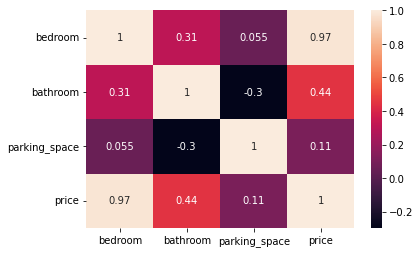

         loc title  bedroom  bathroom  parking_space      price
2464   Kwara  Flat     1.00      6.00           3.00 1049260.95
11285  Kwara  Flat     1.00      2.00            NaN  943620.20
4750   Kwara  Flat     1.00      1.00           1.00  924881.64
13808  Kwara  Flat     1.00       NaN           2.00 1028440.33
10321  Kwara  Flat     2.00      1.00           5.00 1108391.16
4731   Kwara  Flat     2.00       NaN           3.00 1049572.13
12787  Kwara  Flat     3.00      7.00           2.00 1414898.59
12021  Kwara  Flat     3.00      2.00           1.00 1237453.71
2966   Kwara  Flat     3.00      2.00           4.00 1299915.57
9891   Kwara  Flat     3.00      1.00            NaN 1226949.48
9557   Kwara  Flat     3.00      2.00           6.00 1341556.81
8810   Kwara  Flat     3.00      2.00           1.00 1135485.14
8297   Kwara  Flat     3.00      1.00           2.00 1116270.90
28     Kwara  Flat     5.00      2.00           1.00 1492238.90
8038   Kwara  Flat     5.00      1.00   

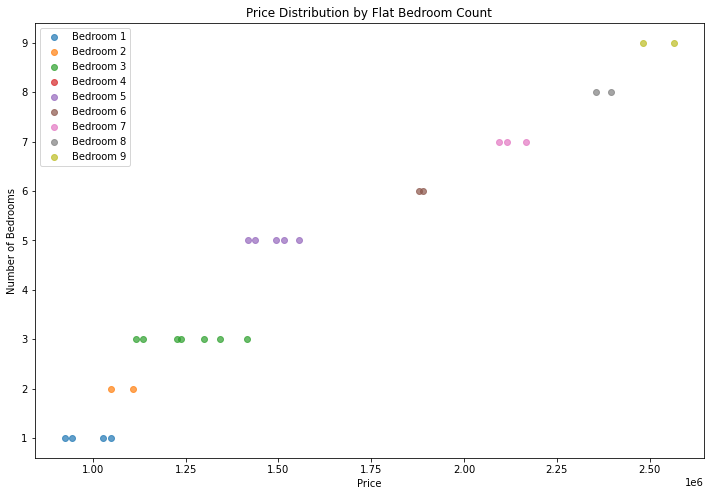



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  25.00000  25.00000      24.00000       28.00000
mean    5.28000   3.44000       3.16667  1887668.57575
std     2.63818   2.16179       1.46456   569164.95925
min     1.00000   1.00000       1.00000  1054173.55100
25%     3.00000   2.00000       2.00000  1361231.44250
50%     5.00000   3.00000       3.00000  1799398.37900
75%     8.00000   6.00000       4.00000  2435416.77150
max     9.00000   7.00000       6.00000  2823276.43100


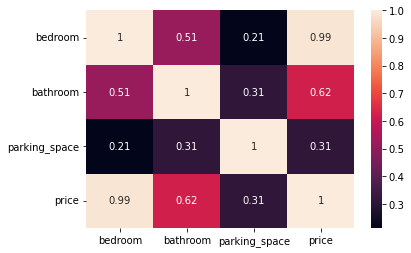

         loc           title  bedroom  bathroom  parking_space      price
9391   Kwara  Terrace duplex     1.00      2.00           4.00 1054173.55
2332   Kwara  Terrace duplex     2.00       NaN           1.00 1310128.90
9167   Kwara  Terrace duplex     2.00      5.00           3.00 1321734.83
968    Kwara  Terrace duplex     3.00      2.00           1.00 1247883.96
12708  Kwara  Terrace duplex     3.00      1.00           1.00 1326096.65
13103  Kwara  Terrace duplex     3.00      2.00            NaN 1319415.25
4635   Kwara  Terrace duplex     3.00      1.00           4.00 1396366.24
13249  Kwara  Terrace duplex     3.00      1.00           2.00 1245247.86
3572   Kwara  Terrace duplex     3.00       NaN           3.00 1372943.04
4161   Kwara  Terrace duplex     4.00      7.00           3.00 1781349.97
12683  Kwara  Terrace duplex     4.00      2.00           2.00 1425982.71
11587  Kwara  Terrace duplex     4.00      1.00           3.00 1569907.22
5700   Kwara  Terrace duplex     5.00 

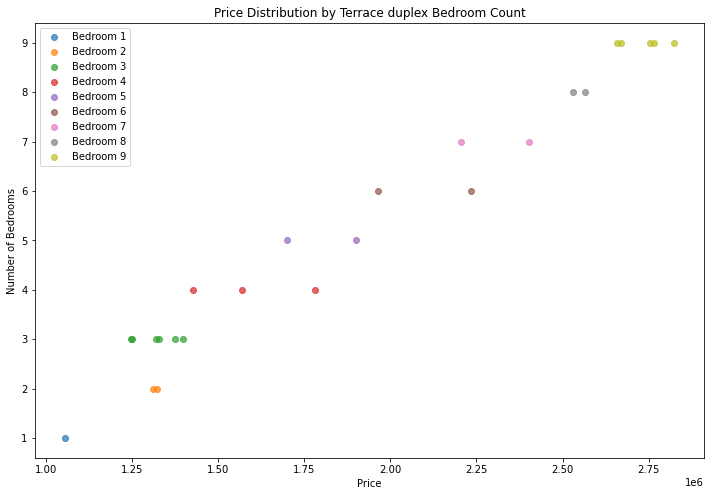



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  21.00000  26.00000      19.00000       27.00000
mean    3.66667   3.26923       3.52632  1568091.16085
std     2.33095   2.08917       1.92551   468861.79109
min     1.00000   1.00000       1.00000  1054083.91100
25%     2.00000   2.00000       2.00000  1180878.65700
50%     3.00000   2.50000       3.00000  1444951.50400
75%     5.00000   5.00000       5.50000  1917259.53000
max     9.00000   7.00000       6.00000  2788247.29900


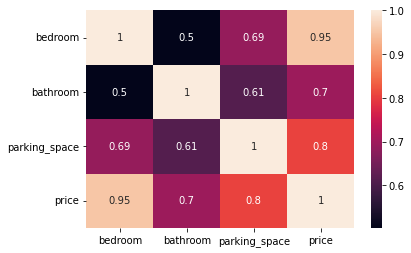

         loc                 title  bedroom  bathroom  parking_space  \
12580  Kwara  Semi-detached duplex     1.00      1.00            NaN   
9925   Kwara  Semi-detached duplex     1.00      1.00           3.00   
4554   Kwara  Semi-detached duplex     1.00      2.00           1.00   
13277  Kwara  Semi-detached duplex     1.00      2.00           2.00   
247    Kwara  Semi-detached duplex     2.00      3.00           4.00   
12417  Kwara  Semi-detached duplex     2.00      3.00           1.00   
2184   Kwara  Semi-detached duplex     2.00      1.00           2.00   
4587   Kwara  Semi-detached duplex     2.00      6.00            NaN   
8338   Kwara  Semi-detached duplex     2.00      6.00           5.00   
6908   Kwara  Semi-detached duplex     3.00      7.00            NaN   
8064   Kwara  Semi-detached duplex     3.00      4.00            NaN   
2393   Kwara  Semi-detached duplex     4.00      1.00           4.00   
9837   Kwara  Semi-detached duplex     4.00      2.00           

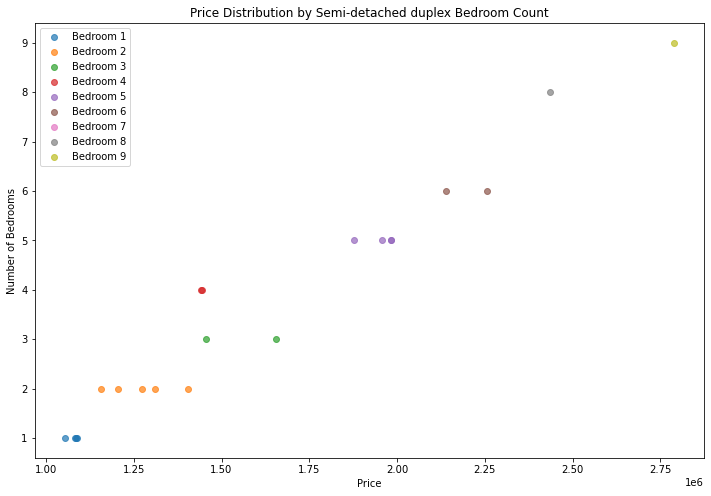



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  29.00000  26.00000      32.00000       34.00000
mean    4.17241   3.61538       2.71875  1818081.40103
std     2.22115   1.96116       1.41955   484115.73026
min     1.00000   1.00000       1.00000  1087870.74000
25%     2.00000   2.00000       2.00000  1461553.75325
50%     4.00000   4.00000       2.50000  1694917.79850
75%     5.00000   5.00000       3.25000  2162622.37075
max     9.00000   7.00000       6.00000  3000975.70000


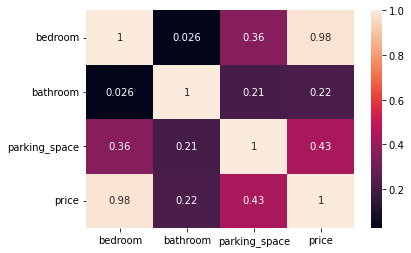

         loc      title  bedroom  bathroom  parking_space      price
2433   Kwara  Townhouse     1.00      4.00           1.00 1163799.75
11386  Kwara  Townhouse     1.00       NaN           4.00 1124408.88
3226   Kwara  Townhouse     1.00      2.00           2.00 1087870.74
6374   Kwara  Townhouse     1.00       NaN           2.00 1187533.04
364    Kwara  Townhouse     2.00      6.00           3.00 1490576.40
12434  Kwara  Townhouse     2.00      4.00           3.00 1412264.26
8250   Kwara  Townhouse     2.00      1.00           1.00 1295692.81
7745   Kwara  Townhouse     2.00      7.00           3.00 1529732.46
12842  Kwara  Townhouse     3.00      2.00           3.00 1451879.54
6329   Kwara  Townhouse     3.00      1.00           4.00 1437975.33
10215  Kwara  Townhouse     4.00      5.00           2.00 1836828.52
9504   Kwara  Townhouse     4.00      1.00           2.00 1622004.15
9171   Kwara  Townhouse     4.00      2.00           1.00 1693334.54
9152   Kwara  Townhouse     4.00  

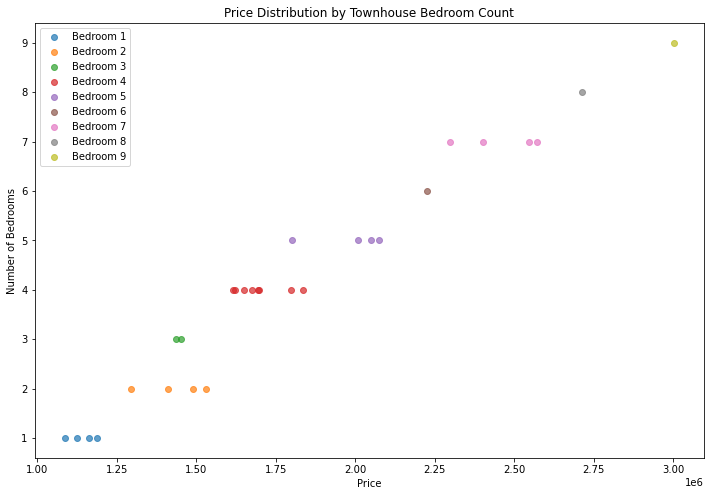



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  31.00000  30.00000      26.00000       35.00000
mean    3.74194   2.40000       3.15385  2186144.61609
std     2.44905   1.58875       1.28662   589209.68161
min     1.00000   1.00000       1.00000  1407002.72100
25%     1.50000   1.00000       2.00000  1733120.50350
50%     3.00000   2.00000       3.00000  2062049.40600
75%     5.00000   3.00000       4.00000  2377942.32250
max     9.00000   7.00000       6.00000  3418575.90100


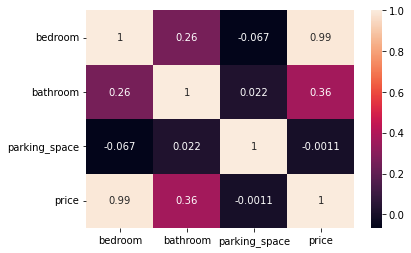

         loc      title  bedroom  bathroom  parking_space      price
742    Kwara  Penthouse     1.00      2.00           3.00 1616081.67
11595  Kwara  Penthouse     1.00      5.00            NaN 1610614.26
9163   Kwara  Penthouse     1.00      2.00           3.00 1566678.40
5018   Kwara  Penthouse     1.00       NaN           4.00 1685180.97
4770   Kwara  Penthouse     1.00      1.00           4.00 1440836.23
13259  Kwara  Penthouse     1.00      3.00            NaN 1610309.01
883    Kwara  Penthouse     1.00       NaN           1.00 1644753.02
2889   Kwara  Penthouse     1.00      1.00           3.00 1407002.72
6037   Kwara  Penthouse     2.00      2.00            NaN 1850337.52
12299  Kwara  Penthouse     2.00      2.00            NaN 1685317.87
11422  Kwara  Penthouse     3.00      1.00           2.00 1868748.34
1186   Kwara  Penthouse     3.00      2.00            NaN 2080107.02
8411   Kwara  Penthouse     3.00      1.00           5.00 1941301.82
6322   Kwara  Penthouse     3.00  

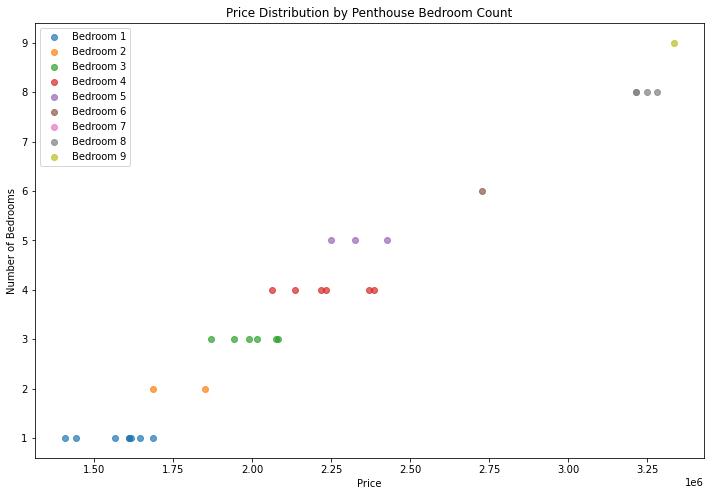



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  5.00000  4.00000       4.00000        5.00000
mean   3.80000  1.25000       2.50000  1354167.68800
std    1.30384  0.50000       1.00000   238083.72956
min    2.00000  1.00000       1.00000  1146946.58100
25%    3.00000  1.00000       2.50000  1167427.01200
50%    4.00000  1.00000       3.00000  1273662.56700
75%    5.00000  1.25000       3.00000  1469167.17200
max    5.00000  2.00000       3.00000  1713635.10800


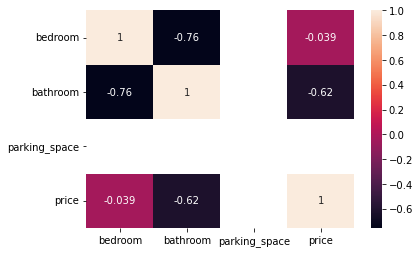

         loc    title  bedroom  bathroom  parking_space      price
12799  Kwara  Cottage     2.00      2.00           3.00 1146946.58
6885   Kwara  Cottage     3.00      1.00           3.00 1273662.57
4265   Kwara  Cottage     4.00       NaN           1.00 1469167.17
766    Kwara  Cottage     5.00      1.00            NaN 1713635.11
8414   Kwara  Cottage     5.00      1.00           3.00 1167427.01


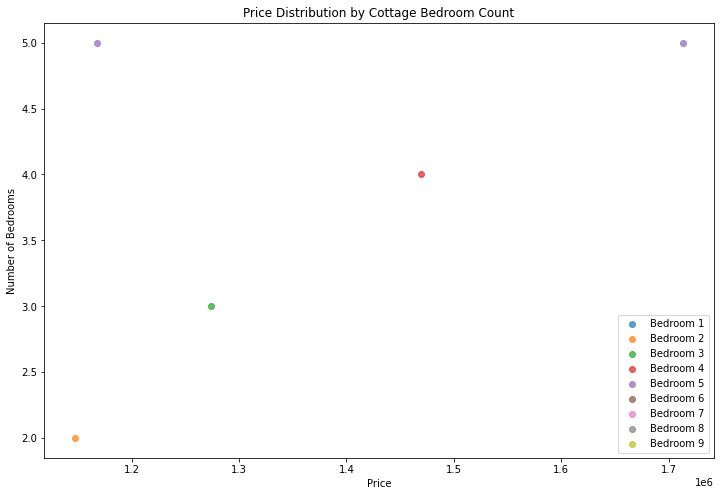

In [269]:
# Kwara
Kwara = housing_train[housing_train["loc" ] == "Kwara"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Kwara, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  28.00000  30.00000      30.00000       35.00000
mean    3.96429   2.96667       3.33333  2876848.91346
std     2.18551   2.15732       1.47001   880775.71909
min     1.00000   1.00000       1.00000  1066907.03300
25%     2.00000   1.00000       2.00000  2221536.49050
50%     3.00000   2.00000       3.50000  2891585.58500
75%     5.25000   5.00000       4.00000  3579047.02100
max     9.00000   7.00000       6.00000  4281507.48300


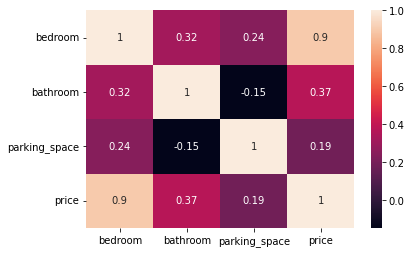

        loc    title  bedroom  bathroom  parking_space      price
7459   Yobe  Mansion     1.00      5.00           3.00 2040305.93
5684   Yobe  Mansion     1.00      1.00           4.00 1066907.03
3466   Yobe  Mansion     1.00      1.00            NaN 1866453.79
1283   Yobe  Mansion     2.00      5.00           3.00 2310586.77
9341   Yobe  Mansion     2.00      1.00           3.00 2050198.93
8275   Yobe  Mansion     2.00      1.00           2.00 3040478.31
4270   Yobe  Mansion     2.00      2.00           4.00 2158563.74
5860   Yobe  Mansion     2.00      4.00           1.00 2158954.11
4769   Yobe  Mansion     3.00      1.00           2.00 2284118.87
12850  Yobe  Mansion     3.00       NaN           1.00 2501238.86
2959   Yobe  Mansion     3.00       NaN           4.00 2565945.45
12909  Yobe  Mansion     3.00      5.00            NaN 2587774.56
5928   Yobe  Mansion     3.00      6.00           4.00 2696139.37
2679   Yobe  Mansion     3.00      1.00           4.00 3200495.31
1953   Yob

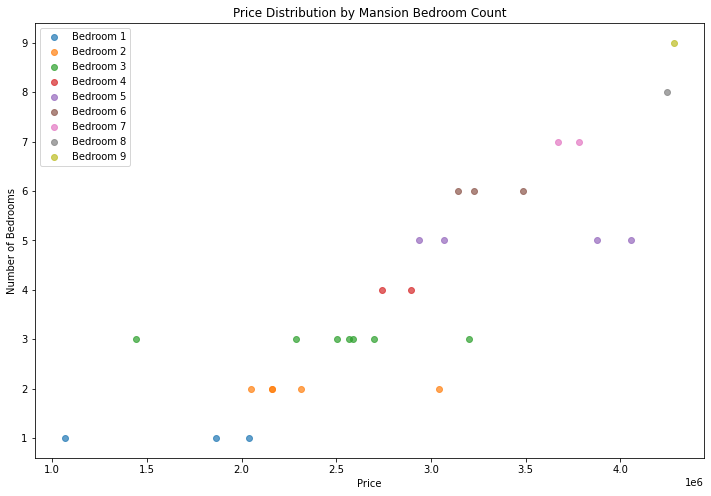



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  33.00000      32.00000       37.00000
mean    4.83333   3.42424       3.37500  1861147.94668
std     2.96047   2.20837       1.77346   652346.37786
min     1.00000   1.00000       1.00000  1026633.09900
25%     2.00000   1.00000       2.00000  1225606.29200
50%     4.50000   3.00000       3.50000  1667914.13800
75%     7.00000   6.00000       4.25000  2500363.14400
max     9.00000   7.00000       6.00000  2971448.92100


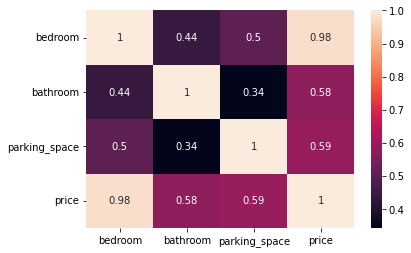

        loc            title  bedroom  bathroom  parking_space      price
163    Yobe  Detached duplex     1.00      1.00            NaN 1034755.84
11805  Yobe  Detached duplex     1.00      6.00           2.00 1223194.41
4945   Yobe  Detached duplex     1.00      1.00           1.00 1026633.10
4881   Yobe  Detached duplex     1.00      2.00           4.00 1225606.29
990    Yobe  Detached duplex     1.00      1.00           4.00 1061404.61
6361   Yobe  Detached duplex     1.00      2.00           1.00 1047393.75
652    Yobe  Detached duplex     1.00      4.00            NaN 1172868.79
13356  Yobe  Detached duplex     2.00      1.00           1.00 1202549.19
13597  Yobe  Detached duplex     2.00       NaN           3.00 1301695.16
1690   Yobe  Detached duplex     3.00      6.00           2.00 1614564.89
8959   Yobe  Detached duplex     3.00      1.00           1.00 1287083.95
4229   Yobe  Detached duplex     4.00      2.00           1.00 1572437.42
12583  Yobe  Detached duplex     4.00 

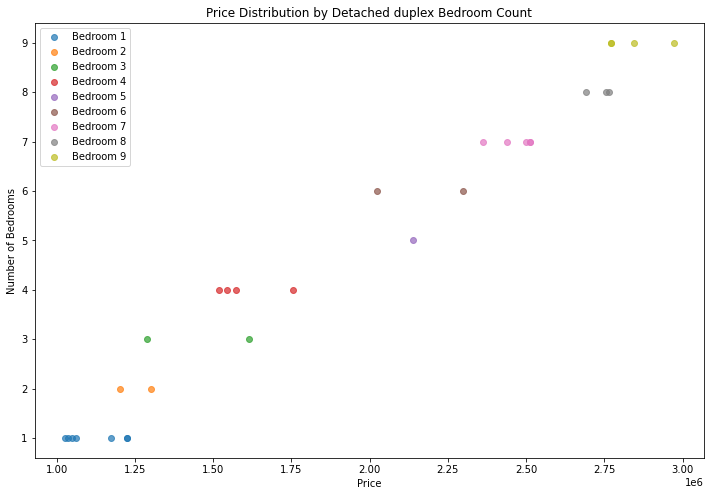



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  25.00000  29.00000      27.00000       33.00000
mean    4.84000   2.86207       3.70370  1350257.34802
std     2.46103   1.78734       1.65981   431100.66671
min     1.00000   1.00000       1.00000   715690.21300
25%     3.00000   1.00000       3.00000  1029155.44000
50%     5.00000   3.00000       4.00000  1187155.88000
75%     7.00000   4.00000       5.00000  1724552.90200
max     9.00000   7.00000       6.00000  2199817.34300


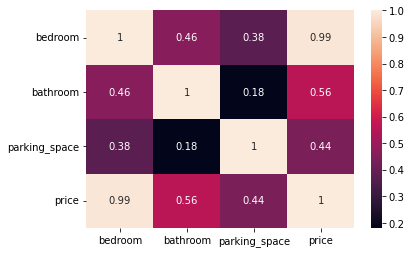

        loc      title  bedroom  bathroom  parking_space      price
3781   Yobe  Apartment     1.00      1.00           4.00  715690.21
8530   Yobe  Apartment     1.00       NaN           3.00  772055.05
7532   Yobe  Apartment     1.00      4.00           1.00  739817.12
1974   Yobe  Apartment     2.00      1.00           3.00  845249.25
9137   Yobe  Apartment     2.00       NaN            NaN  927824.89
8137   Yobe  Apartment     3.00      3.00           6.00 1108859.38
12471  Yobe  Apartment     3.00      1.00            NaN 1013070.83
12064  Yobe  Apartment     3.00      4.00            NaN 1116901.68
13484  Yobe  Apartment     3.00      2.00           4.00 1065648.25
434    Yobe  Apartment     4.00      2.00            NaN 1153863.41
2831   Yobe  Apartment     4.00      1.00           3.00 1084623.09
4555   Yobe  Apartment     5.00      1.00           1.00 1272212.28
8642   Yobe  Apartment     5.00      1.00            NaN 1261988.95
11678  Yobe  Apartment     5.00      6.00       

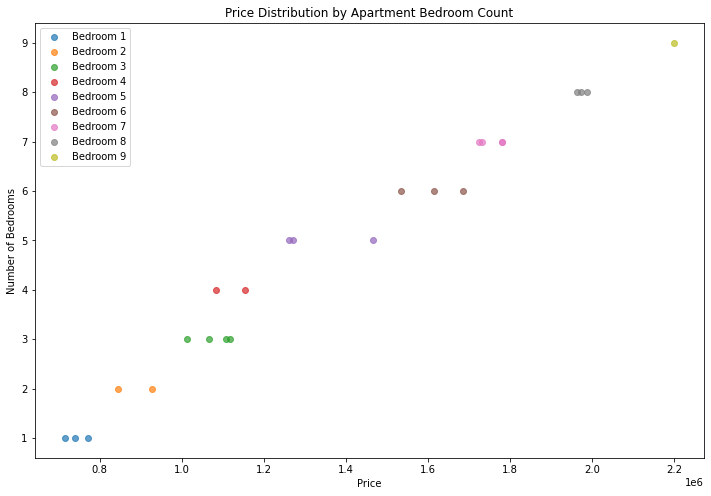



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  35.00000  33.00000      34.00000       39.00000
mean    4.68571   3.39394       3.17647  1454733.81323
std     2.43469   2.04541       1.66006   502808.24458
min     1.00000   1.00000       1.00000   779184.07020
25%     2.00000   2.00000       2.00000  1044145.78700
50%     5.00000   3.00000       3.00000  1361271.29600
75%     6.00000   5.00000       4.75000  1803279.08500
max     9.00000   7.00000       6.00000  2371347.71900


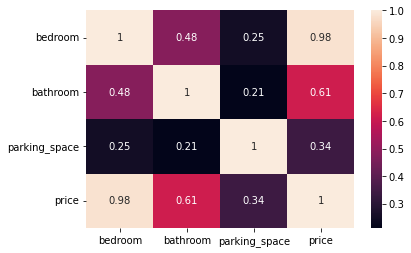

        loc     title  bedroom  bathroom  parking_space      price
10456  Yobe  Bungalow     1.00      2.00           2.00  779184.07
5413   Yobe  Bungalow     1.00      5.00           2.00  881182.42
5375   Yobe  Bungalow     2.00      4.00           5.00 1071390.67
10302  Yobe  Bungalow     2.00      6.00           1.00 1053336.99
7672   Yobe  Bungalow     2.00      3.00           1.00  971109.25
12068  Yobe  Bungalow     2.00      3.00           6.00 1062199.46
5518   Yobe  Bungalow     2.00      4.00           3.00 1034954.58
1538   Yobe  Bungalow     2.00      1.00           2.00  934508.80
786    Yobe  Bungalow     2.00       NaN           4.00  915285.14
490    Yobe  Bungalow     2.00      1.00           1.00  915602.66
3406   Yobe  Bungalow     3.00      1.00            NaN 1122597.16
1920   Yobe  Bungalow     4.00      2.00           1.00 1148443.64
12423  Yobe  Bungalow     4.00      1.00           1.00 1132303.81
3804   Yobe  Bungalow     4.00      1.00           5.00 133369

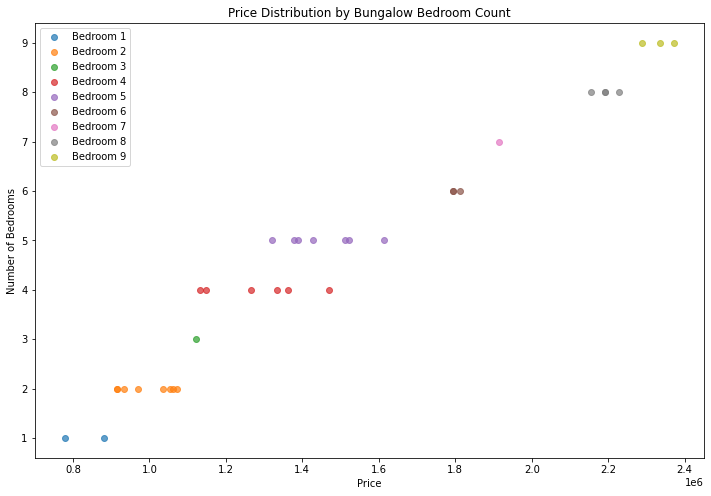



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  29.00000  28.00000      26.00000       34.00000
mean    3.75862   3.21429       2.73077  1305868.52582
std     2.19830   2.23370       1.45761   401545.71942
min     1.00000   1.00000       1.00000   794244.71060
25%     2.00000   1.00000       2.00000  1019034.34200
50%     3.00000   2.50000       2.00000  1154519.82300
75%     5.00000   5.00000       4.00000  1552182.66550
max     8.00000   7.00000       6.00000  2155479.93700


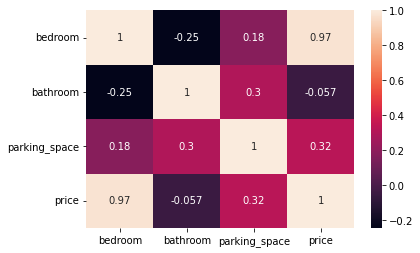

        loc title  bedroom  bathroom  parking_space      price
4682   Yobe  Flat     1.00      2.00            NaN  820048.39
7280   Yobe  Flat     1.00      2.00           3.00  794244.71
12663  Yobe  Flat     1.00      7.00           2.00  936000.92
10758  Yobe  Flat     1.00      1.00           2.00  827616.58
2404   Yobe  Flat     2.00      6.00           2.00 1071555.03
4719   Yobe  Flat     2.00      1.00           1.00  912919.14
1381   Yobe  Flat     2.00      1.00            NaN  926551.22
1214   Yobe  Flat     2.00       NaN           4.00  934980.90
6495   Yobe  Flat     2.00      4.00           1.00  998518.50
10993  Yobe  Flat     2.00      4.00           2.00 1016736.54
2444   Yobe  Flat     3.00      1.00           4.00 1140815.20
2609   Yobe  Flat     3.00      2.00           3.00 1150006.40
9480   Yobe  Flat     3.00       NaN           2.00 1055221.85
718    Yobe  Flat     3.00      5.00           6.00 1286888.27
4567   Yobe  Flat     3.00      1.00           2.00 109

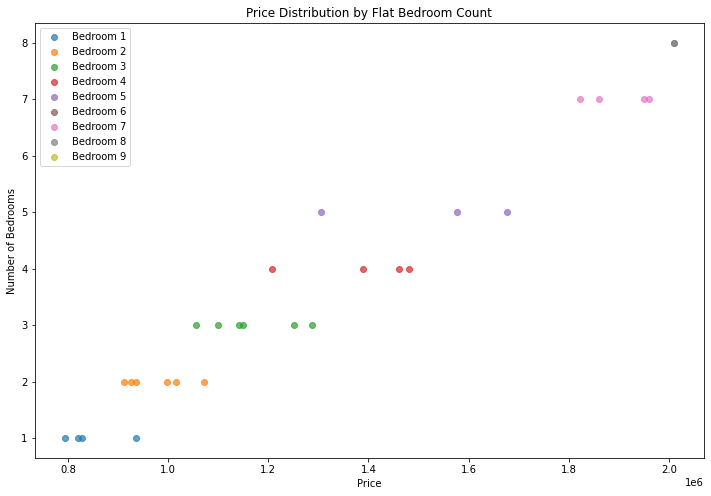



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  15.00000  16.00000      15.00000       19.00000
mean    5.13333   3.25000       3.33333  1662725.17847
std     2.38647   1.84391       1.71825   474499.55753
min     1.00000   1.00000       1.00000   859282.24000
25%     3.50000   2.00000       2.00000  1267955.08450
50%     5.00000   3.00000       3.00000  1686859.72900
75%     6.50000   4.00000       4.00000  1959594.20500
max     9.00000   7.00000       6.00000  2538138.67400


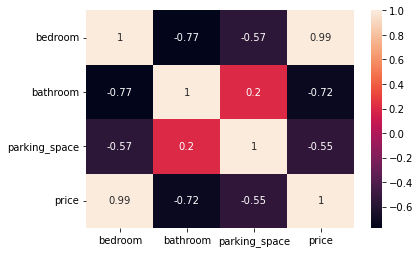

        loc           title  bedroom  bathroom  parking_space      price
9446   Yobe  Terrace duplex     1.00      7.00           4.00 1085285.25
4651   Yobe  Terrace duplex     2.00      2.00            NaN 1083332.44
6743   Yobe  Terrace duplex     2.00       NaN           4.00 1118959.19
196    Yobe  Terrace duplex     3.00      5.00           6.00 1416950.98
6577   Yobe  Terrace duplex     4.00       NaN           1.00 1560565.87
7707   Yobe  Terrace duplex     5.00      2.00           3.00 1635529.03
11590  Yobe  Terrace duplex     5.00      3.00           4.00 1686859.73
12279  Yobe  Terrace duplex     5.00       NaN           2.00 1498730.26
2850   Yobe  Terrace duplex     6.00      3.00            NaN 1898579.96
9575   Yobe  Terrace duplex     6.00      3.00           4.00 1878084.66
11316  Yobe  Terrace duplex     6.00      2.00           6.00 1888239.85
3325   Yobe  Terrace duplex     7.00      2.00            NaN 2020608.45
4094   Yobe  Terrace duplex     8.00      1.00     

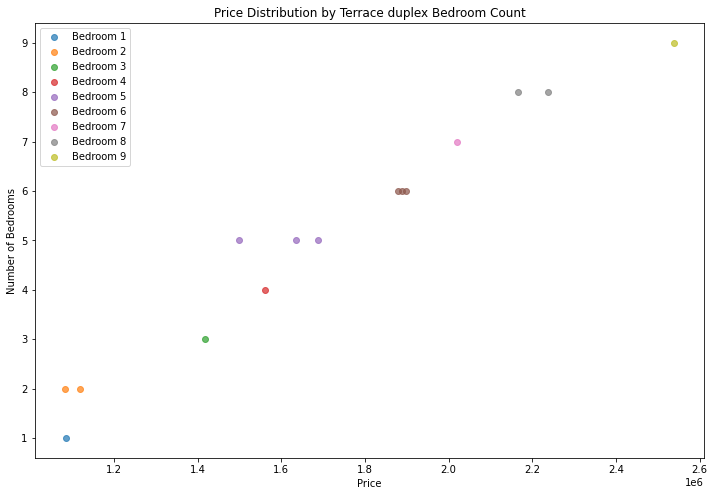



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  18.00000  20.00000      20.00000       24.00000
mean    4.00000   2.25000       3.00000  1511105.42088
std     2.37635   1.51744       1.33771   492135.84850
min     1.00000   1.00000       1.00000   876405.18900
25%     2.00000   1.00000       2.00000  1112340.68450
50%     3.00000   2.00000       3.00000  1343701.56550
75%     5.00000   2.00000       4.00000  1816506.31375
max     9.00000   7.00000       6.00000  2548663.68900


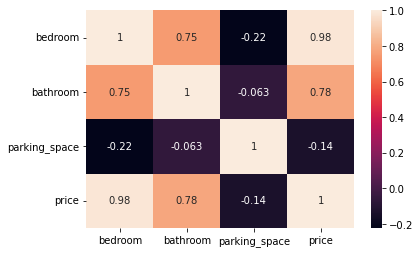

        loc                 title  bedroom  bathroom  parking_space      price
6118   Yobe  Semi-detached duplex     1.00      1.00           4.00  876405.19
13849  Yobe  Semi-detached duplex     2.00       NaN           1.00 1104012.65
155    Yobe  Semi-detached duplex     2.00      1.00           4.00 1107413.95
9077   Yobe  Semi-detached duplex     2.00      2.00           4.00 1103827.73
9841   Yobe  Semi-detached duplex     2.00      1.00           6.00 1113982.93
10549  Yobe  Semi-detached duplex     2.00      2.00            NaN 1023981.49
1990   Yobe  Semi-detached duplex     3.00      2.00           4.00 1273394.83
10025  Yobe  Semi-detached duplex     3.00      2.00           2.00 1192828.07
10065  Yobe  Semi-detached duplex     3.00      2.00           3.00 1209900.36
12121  Yobe  Semi-detached duplex     3.00       NaN           1.00 1283639.09
2765   Yobe  Semi-detached duplex     4.00      2.00            NaN 1366743.36
11886  Yobe  Semi-detached duplex     4.00      2.00

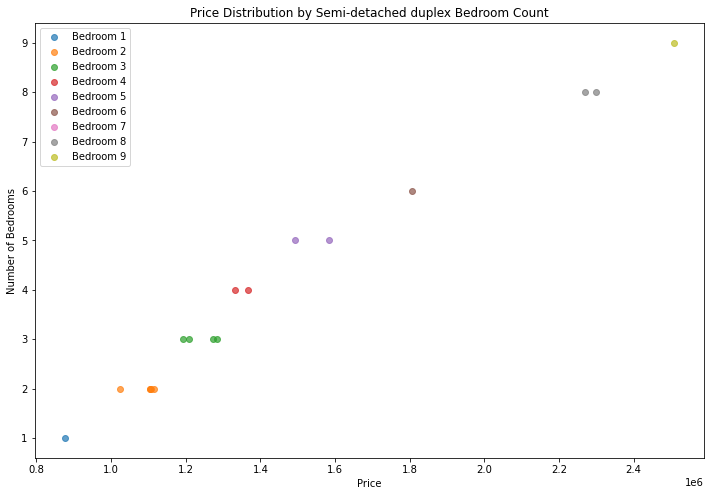



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  27.00000  31.00000      32.00000       35.00000
mean    2.96296   3.06452       2.93750  1513039.26993
std     1.45395   2.26474       1.74018   405397.86066
min     1.00000   1.00000       1.00000   999322.90950
25%     2.00000   1.00000       2.00000  1183648.34050
50%     3.00000   2.00000       2.00000  1394278.60200
75%     4.00000   5.00000       4.00000  1684627.32400
max     5.00000   7.00000       6.00000  2572580.79800


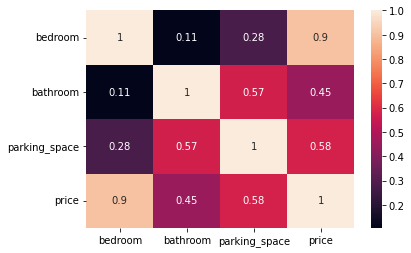

        loc      title  bedroom  bathroom  parking_space      price
8116   Yobe  Townhouse     1.00       NaN           2.00 1025589.91
6791   Yobe  Townhouse     1.00      1.00           1.00  999322.91
3820   Yobe  Townhouse     1.00       NaN           2.00 1015542.16
4015   Yobe  Townhouse     1.00      3.00           3.00 1038314.71
4186   Yobe  Townhouse     1.00      6.00           1.00 1095554.27
828    Yobe  Townhouse     2.00      1.00           2.00 1170519.65
10100  Yobe  Townhouse     2.00      1.00           4.00 1177252.63
5627   Yobe  Townhouse     2.00      3.00           5.00 1266335.45
13295  Yobe  Townhouse     2.00      1.00           3.00 1108475.76
5349   Yobe  Townhouse     2.00       NaN           6.00 1357631.11
3598   Yobe  Townhouse     2.00      1.00           2.00 1190044.05
1999   Yobe  Townhouse     2.00      2.00           1.00 1076665.81
13691  Yobe  Townhouse     3.00      2.00           3.00 1364592.24
3397   Yobe  Townhouse     3.00      6.00       

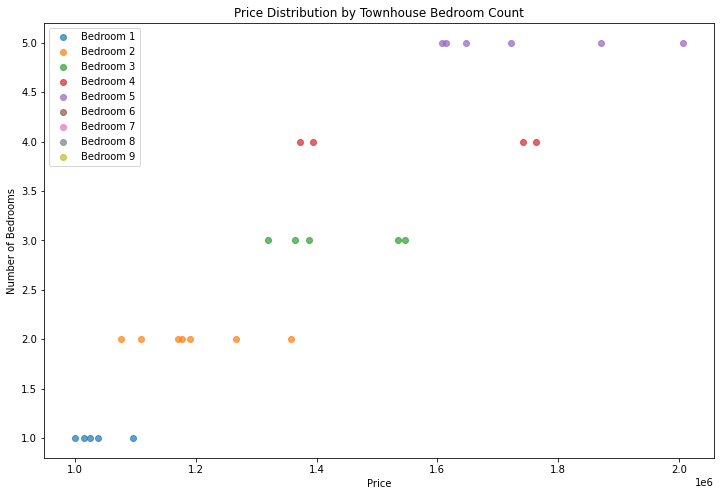



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  33.00000  32.00000      31.00000       38.00000
mean    4.60606   3.15625       3.32258  2159973.25337
std     2.60935   2.14189       1.68101   579893.66899
min     1.00000   1.00000       1.00000  1350970.27900
25%     2.00000   1.00000       2.00000  1679026.73500
50%     4.00000   2.00000       4.00000  2127079.29800
75%     6.00000   5.00000       4.50000  2592200.12875
max     9.00000   7.00000       6.00000  3278832.12100


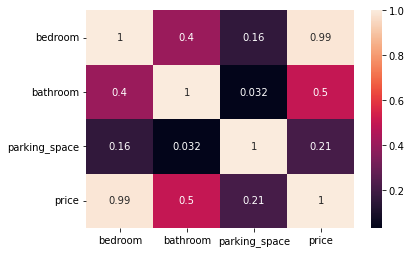

        loc      title  bedroom  bathroom  parking_space      price
665    Yobe  Penthouse     1.00      1.00           4.00 1443417.07
8743   Yobe  Penthouse     1.00      6.00           4.00 1492138.20
9510   Yobe  Penthouse     1.00       NaN           4.00 1350970.28
9755   Yobe  Penthouse     1.00      2.00           2.00 1473923.87
10516  Yobe  Penthouse     2.00      2.00           4.00 1665446.85
3487   Yobe  Penthouse     2.00      2.00           1.00 1569540.09
10977  Yobe  Penthouse     2.00      1.00           1.00 1410006.75
8346   Yobe  Penthouse     2.00      2.00            NaN 1550090.89
1817   Yobe  Penthouse     2.00      2.00           3.00 1519152.16
6242   Yobe  Penthouse     3.00       NaN           1.00 1878260.29
2048   Yobe  Penthouse     3.00      1.00           4.00 1735239.62
8859   Yobe  Penthouse     3.00      1.00            NaN 1719766.40
12179  Yobe  Penthouse     3.00      7.00            NaN 1878260.29
4413   Yobe  Penthouse     4.00      7.00       

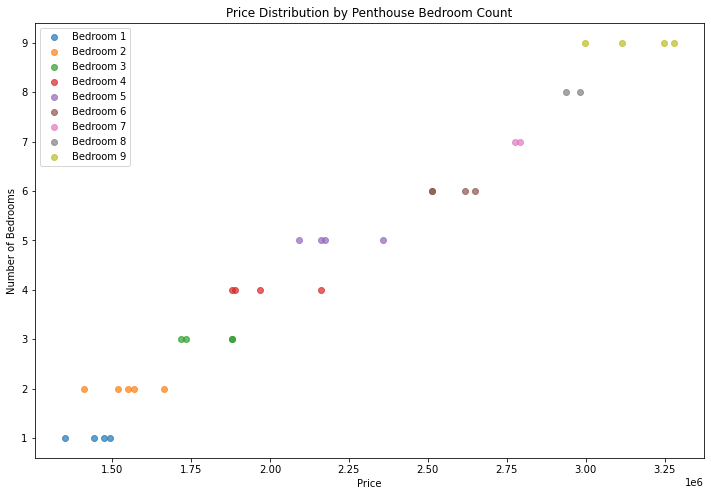



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  9.00000  9.00000      10.00000       13.00000
mean   2.66667  1.33333       2.40000   952787.14677
std    1.22474  0.50000       0.96609   275238.64983
min    1.00000  1.00000       1.00000   591032.10180
25%    2.00000  1.00000       2.00000   753945.81500
50%    2.00000  1.00000       2.50000   912202.05530
75%    3.00000  2.00000       3.00000  1005238.27500
max    5.00000  2.00000       4.00000  1511831.54600


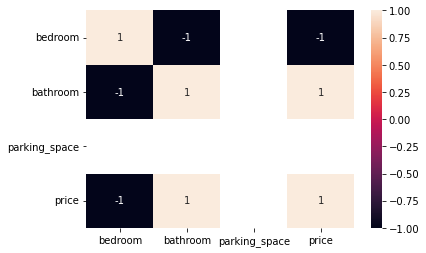

        loc    title  bedroom  bathroom  parking_space      price
5748   Yobe  Cottage     1.00       NaN           1.00  591032.10
3220   Yobe  Cottage     2.00       NaN           2.00 1005238.28
8780   Yobe  Cottage     2.00      2.00           3.00 1058646.45
11226  Yobe  Cottage     2.00      1.00            NaN  726023.57
13526  Yobe  Cottage     2.00       NaN           3.00  736618.30
9520   Yobe  Cottage     3.00      1.00            NaN  830956.22
9840   Yobe  Cottage     3.00      1.00           3.00  852664.76
8699   Yobe  Cottage     4.00      2.00            NaN  995855.57
304    Yobe  Cottage     5.00       NaN           2.00 1511831.55
494    Yobe  Cottage      NaN      2.00           1.00  753945.81
4822   Yobe  Cottage      NaN      1.00           2.00 1486523.10
7673   Yobe  Cottage      NaN      1.00           3.00  924695.16
10807  Yobe  Cottage      NaN      1.00           4.00  912202.06


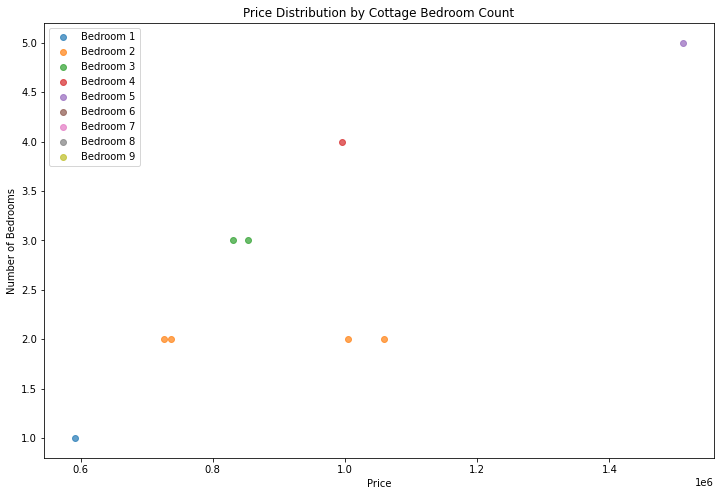

In [270]:
#Yobe
Yobe = housing_train[housing_train["loc" ] == "Yobe"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Yobe, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  12.00000  10.00000      12.00000       14.00000
mean    5.66667   3.10000       3.00000  3316508.51379
std     2.42462   1.72884       1.59545  1173746.16105
min     2.00000   1.00000       1.00000  1483107.89500
25%     3.75000   2.00000       2.00000  2422486.71100
50%     5.50000   3.00000       2.50000  3457803.70450
75%     8.00000   4.00000       3.25000  4291910.98950
max     9.00000   6.00000       6.00000  4743692.65300


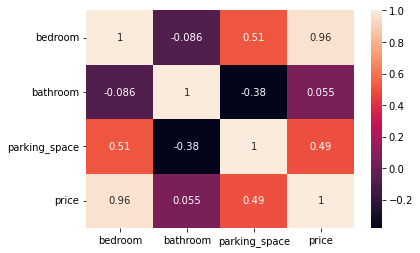

          loc    title  bedroom  bathroom  parking_space      price
6331   Taraba  Mansion     2.00      2.00           2.00 1483107.90
5186   Taraba  Mansion     3.00      4.00           2.00 2798413.06
9509   Taraba  Mansion     3.00      2.00           2.00 2649620.01
8034   Taraba  Mansion     4.00      5.00            NaN 3131823.47
2526   Taraba  Mansion     5.00       NaN           3.00 4621729.66
5010   Taraba  Mansion     5.00       NaN           4.00 1912407.77
2936   Taraba  Mansion     6.00       NaN           6.00 4155320.43
3190   Taraba  Mansion     6.00      4.00           3.00 3783783.94
2428   Taraba  Mansion     8.00      4.00           1.00 4322983.90
9556   Taraba  Mansion     8.00      1.00           3.00 4198692.27
322    Taraba  Mansion     9.00      2.00           6.00 4743692.65
2174   Taraba  Mansion     9.00       NaN           2.00 4620293.29
8102   Taraba  Mansion      NaN      6.00           2.00 2346775.61
11544  Taraba  Mansion      NaN      1.00       

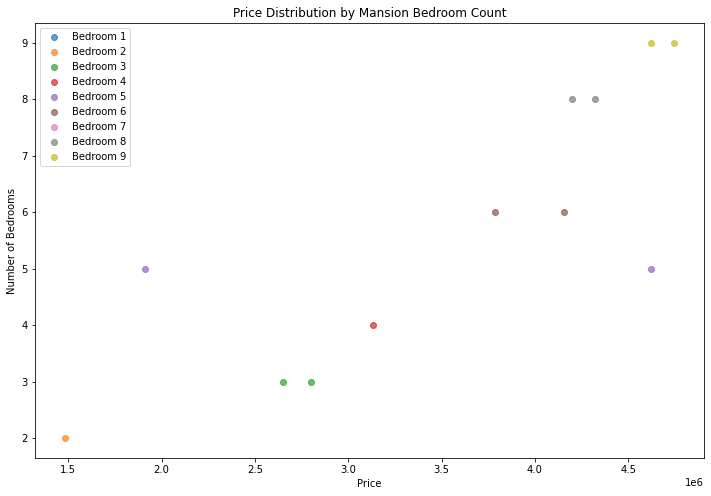



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  29.00000  29.00000      29.00000       33.00000
mean    3.72414   2.89655       3.86207  1924280.35933
std     2.03359   2.07614       1.61961   507420.89410
min     1.00000   1.00000       1.00000  1173977.27000
25%     3.00000   1.00000       3.00000  1571448.57900
50%     3.00000   2.00000       4.00000  1781390.58100
75%     5.00000   5.00000       5.00000  2295089.13600
max     8.00000   7.00000       6.00000  2894714.07800


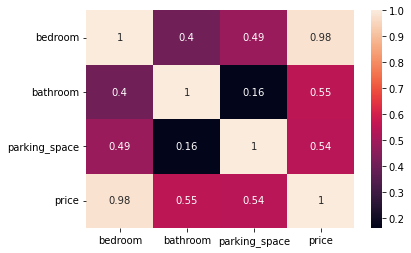

          loc            title  bedroom  bathroom  parking_space      price
13224  Taraba  Detached duplex     1.00      2.00            NaN 1238347.82
10053  Taraba  Detached duplex     1.00      1.00           4.00 1297227.83
7967   Taraba  Detached duplex     1.00      2.00           3.00 1285691.06
7932   Taraba  Detached duplex     1.00       NaN           1.00 1173977.27
6476   Taraba  Detached duplex     2.00      1.00           4.00 1387108.86
9882   Taraba  Detached duplex     2.00      1.00           3.00 1448821.74
3323   Taraba  Detached duplex     2.00       NaN           1.00 1523849.13
10475  Taraba  Detached duplex     3.00       NaN           2.00 1571448.58
10209  Taraba  Detached duplex     3.00      1.00           3.00 1560803.99
13347  Taraba  Detached duplex     3.00       NaN           6.00 1881460.67
6530   Taraba  Detached duplex     3.00      1.00            NaN 1605178.35
11323  Taraba  Detached duplex     3.00      1.00           3.00 1623463.51
6060   Tarab

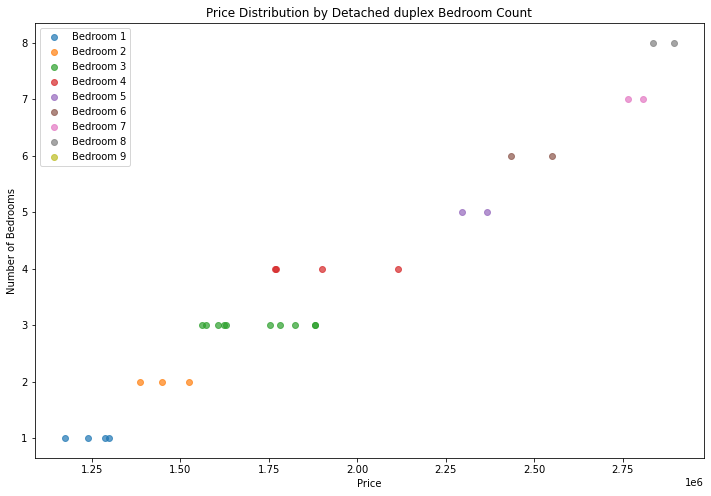



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  29.00000  35.00000      36.00000       40.00000
mean    4.65517   3.28571       2.88889  1520146.74593
std     2.95533   2.20389       1.58164   530201.65015
min     1.00000   1.00000       1.00000   798954.68550
25%     2.00000   1.00000       2.00000  1073083.15700
50%     4.00000   3.00000       3.00000  1408852.98450
75%     7.00000   5.00000       4.00000  2011164.47600
max     9.00000   7.00000       6.00000  2380374.55800


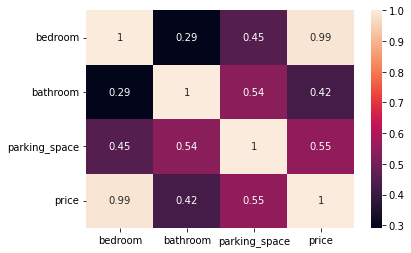

          loc      title  bedroom  bathroom  parking_space      price
2956   Taraba  Apartment     1.00      1.00           3.00  851628.11
11167  Taraba  Apartment     1.00      1.00            NaN  890950.47
9620   Taraba  Apartment     1.00      2.00           2.00  831938.07
4975   Taraba  Apartment     1.00      5.00            NaN  899400.47
9134   Taraba  Apartment     1.00      2.00           1.00  817854.34
8119   Taraba  Apartment     1.00      1.00            NaN  873332.06
4535   Taraba  Apartment     2.00      7.00           4.00 1135400.36
4747   Taraba  Apartment     2.00      1.00           1.00  955260.86
8392   Taraba  Apartment     2.00      7.00           1.00 1080746.24
12305  Taraba  Apartment     3.00      7.00           6.00 1341706.76
3865   Taraba  Apartment     3.00      6.00           2.00 1241425.34
2572   Taraba  Apartment     4.00       NaN           4.00 1294767.94
9971   Taraba  Apartment     4.00      1.00           1.00 1260825.52
9315   Taraba  Apart

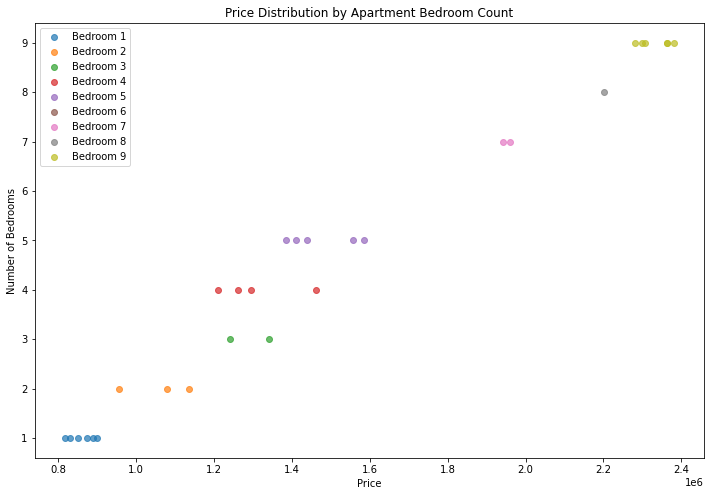



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  18.00000  21.00000      18.00000       23.00000
mean    4.83333   3.04762       3.61111  1606267.16037
std     2.20294   1.90987       1.64992   455930.49291
min     1.00000   1.00000       1.00000   933156.20220
25%     4.00000   2.00000       2.00000  1287163.32950
50%     5.00000   2.00000       4.00000  1501921.45700
75%     6.00000   4.00000       4.75000  1920037.32350
max     8.00000   7.00000       6.00000  2458958.16500


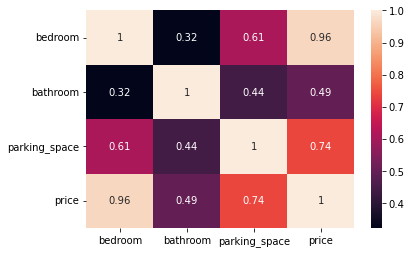

          loc     title  bedroom  bathroom  parking_space      price
11405  Taraba  Bungalow     1.00      2.00           2.00  960691.27
4833   Taraba  Bungalow     1.00      1.00            NaN  933156.20
1228   Taraba  Bungalow     2.00      3.00           1.00 1087758.39
3522   Taraba  Bungalow     2.00      3.00            NaN 1087758.39
4243   Taraba  Bungalow     4.00      2.00           2.00 1382420.49
13297  Taraba  Bungalow     4.00      6.00           6.00 1652670.53
11015  Taraba  Bungalow     5.00      2.00           1.00 1430191.96
10375  Taraba  Bungalow     5.00      4.00           4.00 1737922.89
8419   Taraba  Bungalow     5.00      2.00            NaN 1501921.46
6763   Taraba  Bungalow     5.00       NaN           2.00 1456209.79
13962  Taraba  Bungalow     5.00       NaN           2.00 1510809.78
7764   Taraba  Bungalow     6.00      2.00           6.00 1909533.09
1780   Taraba  Bungalow     6.00      1.00           5.00 1857387.62
1513   Taraba  Bungalow     6.00  

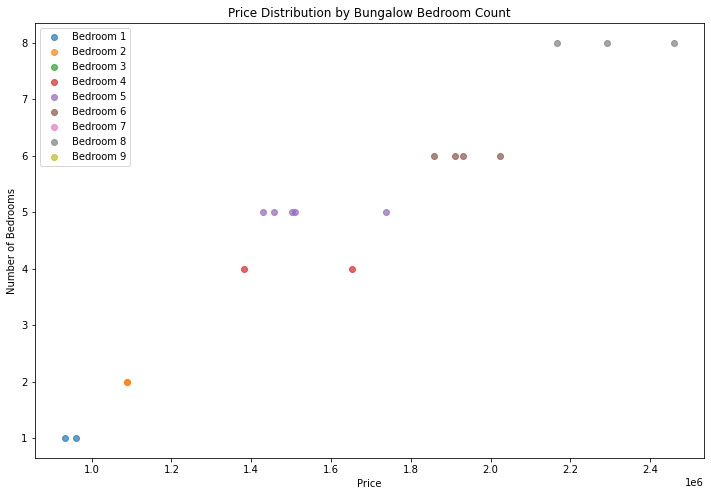



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  25.00000  25.00000      29.00000       32.00000
mean    5.24000   3.68000       2.86207  1722371.63575
std     2.29637   2.13542       1.57490   495946.06751
min     1.00000   1.00000       1.00000   891469.79880
25%     4.00000   2.00000       1.00000  1424815.81325
50%     5.00000   4.00000       3.00000  1632834.85200
75%     7.00000   6.00000       4.00000  2203970.64225
max     9.00000   7.00000       6.00000  2637745.94900


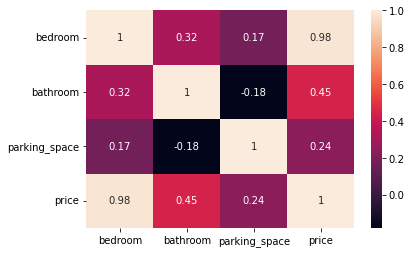

          loc title  bedroom  bathroom  parking_space      price
9302   Taraba  Flat     1.00       NaN           3.00  955286.39
12984  Taraba  Flat     2.00      3.00           2.00 1108579.00
13423  Taraba  Flat     2.00      4.00           3.00 1160724.48
10385  Taraba  Flat     2.00      1.00           3.00 1015168.21
1439   Taraba  Flat     4.00      3.00           1.00 1454592.88
11915  Taraba  Flat     4.00      6.00           3.00 1590208.67
2767   Taraba  Flat     4.00       NaN           2.00 1412763.79
7306   Taraba  Flat     4.00      4.00           4.00 1548379.59
6494   Taraba  Flat     4.00      4.00           1.00 1485917.73
12002  Taraba  Flat     4.00      1.00           5.00 1475225.65
5563   Taraba  Flat     5.00       NaN           1.00 1473562.11
11754  Taraba  Flat     5.00      4.00            NaN 1675461.03
4688   Taraba  Flat     5.00      2.00           1.00 1467202.74
4145   Taraba  Flat     5.00      4.00           6.00 1779564.13
10859  Taraba  Flat     5

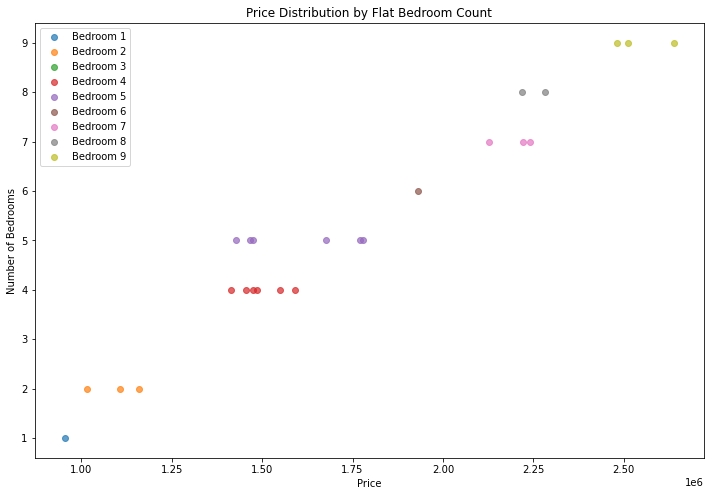



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  39.00000  39.00000      35.00000       44.00000
mean    4.15385   3.61538       2.97143  1677060.07826
std     2.62115   2.13511       1.74028   550233.24499
min     1.00000   1.00000       1.00000   958090.72250
25%     2.00000   2.00000       1.00000  1256566.29325
50%     4.00000   3.00000       3.00000  1460595.26800
75%     6.00000   5.50000       4.00000  2047856.98825
max     9.00000   7.00000       6.00000  2881940.08700


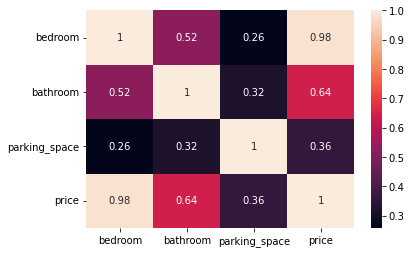

          loc           title  bedroom  bathroom  parking_space      price
17     Taraba  Terrace duplex     1.00       NaN           4.00 1065123.44
9699   Taraba  Terrace duplex     1.00      1.00           3.00 1095019.33
6499   Taraba  Terrace duplex     1.00      7.00            NaN 1253799.04
12496  Taraba  Terrace duplex     1.00      2.00           2.00 1073248.31
1348   Taraba  Terrace duplex     1.00      2.00           1.00  958090.72
12835  Taraba  Terrace duplex     1.00       NaN           6.00 1277222.24
7938   Taraba  Terrace duplex     1.00      7.00            NaN 1183529.45
2014   Taraba  Terrace duplex     2.00      5.00           1.00 1274888.44
2613   Taraba  Terrace duplex     2.00      5.00           2.00 1298311.63
12549  Taraba  Terrace duplex     2.00      4.00           6.00 1356763.96
13508  Taraba  Terrace duplex     2.00      2.00           4.00 1257488.71
4103   Taraba  Terrace duplex     2.00      3.00           6.00 1321523.50
11256  Taraba  Terrace du

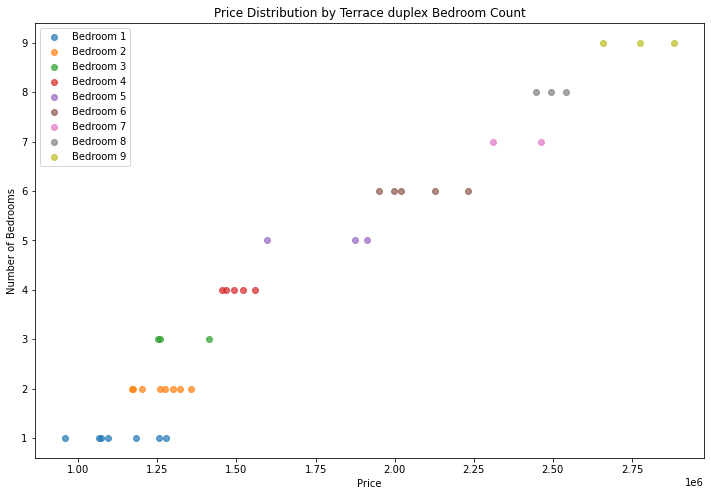



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  23.00000  24.00000      21.00000       25.00000
mean    4.13043   3.50000       2.61905  1653804.45108
std     2.58148   2.34057       1.39557   502232.95972
min     1.00000   1.00000       1.00000  1007327.15700
25%     2.00000   1.00000       1.00000  1297477.90200
50%     4.00000   2.50000       3.00000  1542242.98500
75%     5.50000   5.25000       3.00000  1911562.22600
max     9.00000   7.00000       6.00000  2741189.57800


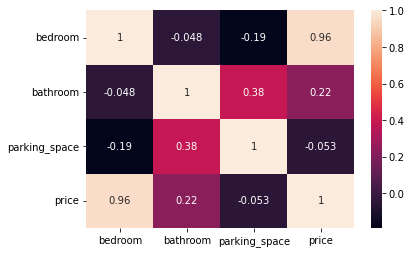

          loc                 title  bedroom  bathroom  parking_space  \
13628  Taraba  Semi-detached duplex     1.00      7.00           4.00   
13067  Taraba  Semi-detached duplex     1.00      7.00           4.00   
10680  Taraba  Semi-detached duplex     1.00       NaN           3.00   
10157  Taraba  Semi-detached duplex     1.00      2.00           2.00   
738    Taraba  Semi-detached duplex     2.00      1.00           3.00   
1322   Taraba  Semi-detached duplex     2.00      2.00            NaN   
3973   Taraba  Semi-detached duplex     2.00      6.00           1.00   
7769   Taraba  Semi-detached duplex     2.00      7.00           3.00   
10861  Taraba  Semi-detached duplex     3.00      1.00           1.00   
4362   Taraba  Semi-detached duplex     3.00      2.00           2.00   
9805   Taraba  Semi-detached duplex     4.00      1.00           3.00   
9098   Taraba  Semi-detached duplex     4.00      2.00           3.00   
88     Taraba  Semi-detached duplex     4.00      3

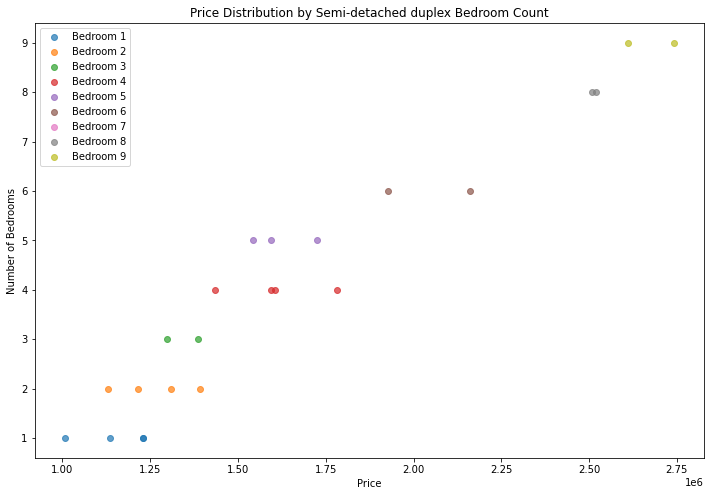



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  33.00000  27.00000      33.00000       37.00000
mean    5.66667   3.03704       3.48485  2161177.62216
std     2.62996   1.93115       1.62252   643213.67632
min     1.00000   1.00000       1.00000  1150434.65100
25%     4.00000   1.00000       2.00000  1569760.04700
50%     6.00000   3.00000       4.00000  2159017.24300
75%     8.00000   5.00000       4.00000  2779302.36900
max     9.00000   7.00000       6.00000  3066157.54100


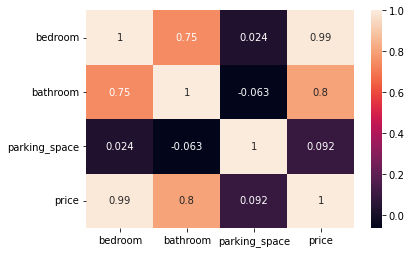

          loc      title  bedroom  bathroom  parking_space      price
8659   Taraba  Townhouse     1.00      1.00           5.00 1150434.65
7380   Taraba  Townhouse     2.00      2.00           1.00 1256205.10
12107  Taraba  Townhouse     2.00      1.00           4.00 1320821.84
8748   Taraba  Townhouse     2.00      1.00            NaN 1256678.27
5668   Taraba  Townhouse     2.00      2.00           2.00 1254312.81
9221   Taraba  Townhouse     3.00       NaN           2.00 1439745.32
8449   Taraba  Townhouse     3.00      1.00            NaN 1364752.89
9182   Taraba  Townhouse     4.00       NaN           4.00 1928036.13
7663   Taraba  Townhouse     4.00       NaN           4.00 1732255.80
6165   Taraba  Townhouse     4.00      3.00           3.00 1784542.16
3511   Taraba  Townhouse     4.00      1.00            NaN 1679879.77
64     Taraba  Townhouse     4.00      5.00           4.00 1888880.07
2178   Taraba  Townhouse     4.00      1.00           3.00 1569760.05
3089   Taraba  Townh

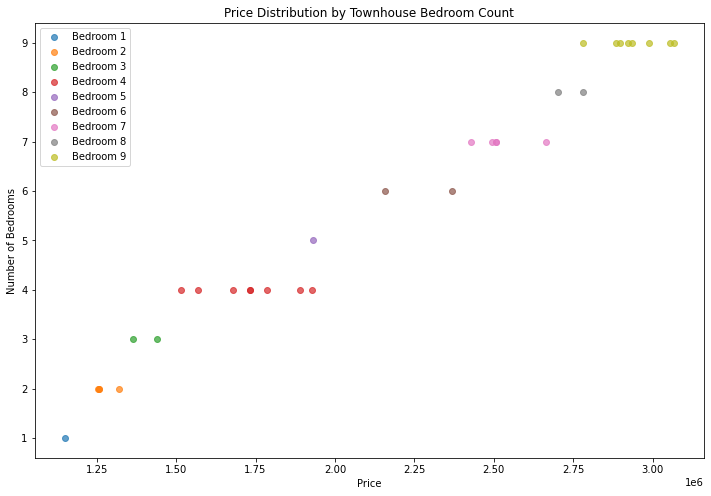



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  17.00000  19.00000      17.00000       21.00000
mean    3.82353   2.31579       2.88235  2318400.90905
std     1.91165   1.85750       1.69124   595310.03531
min     1.00000   1.00000       1.00000  1339335.70700
25%     2.00000   1.00000       2.00000  2076941.09900
50%     4.00000   2.00000       2.00000  2339256.47200
75%     5.00000   2.50000       4.00000  2632074.90200
max     7.00000   7.00000       6.00000  3606266.62800


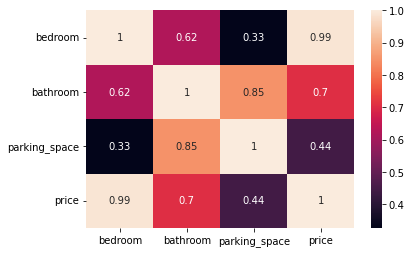

          loc      title  bedroom  bathroom  parking_space      price
12655  Taraba  Penthouse     1.00      1.00           1.00 1339335.71
4159   Taraba  Penthouse     1.00       NaN           2.00 1510566.54
13528  Taraba  Penthouse     1.00      1.00           3.00 1407002.72
13907  Taraba  Penthouse     2.00      1.00           1.00 1611528.73
9110   Taraba  Penthouse     2.00      2.00            NaN 1777486.03
3390   Taraba  Penthouse     3.00      3.00           6.00 2076941.10
11880  Taraba  Penthouse     4.00      1.00           2.00 2178945.07
11698  Taraba  Penthouse     4.00      1.00           2.00 2081364.95
7419   Taraba  Penthouse     4.00      7.00            NaN 2352948.75
9931   Taraba  Penthouse     4.00      1.00           2.00 2221212.48
11202  Taraba  Penthouse     5.00      3.00           4.00 2496130.38
8457   Taraba  Penthouse     5.00      2.00            NaN 2420237.45
4176   Taraba  Penthouse     5.00      2.00            NaN 2512894.50
3369   Taraba  Penth

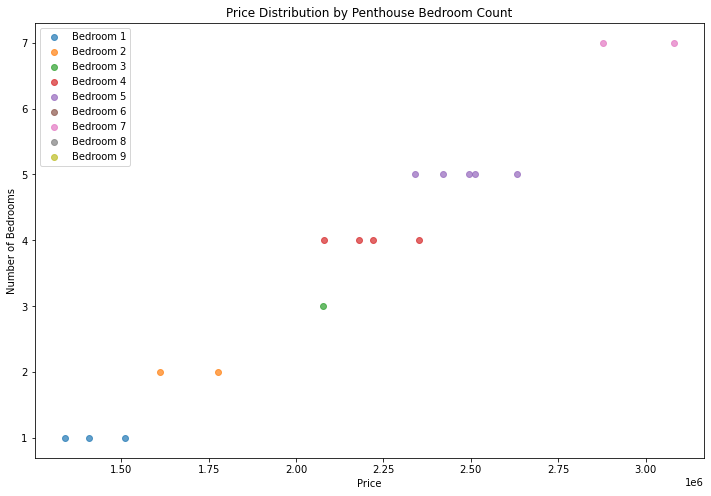



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  10.00000  10.00000      10.00000       12.00000
mean    2.80000   1.70000       2.50000  1178669.74778
std     1.54919   0.48305       1.26930   293680.06534
min     1.00000   1.00000       1.00000   755715.11050
25%     2.00000   1.25000       1.25000  1008463.82410
50%     2.00000   2.00000       2.50000  1169176.48650
75%     4.00000   2.00000       3.75000  1313500.42825
max     5.00000   2.00000       4.00000  1656992.08000


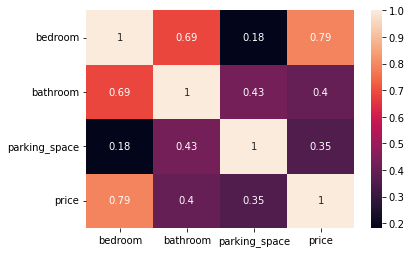

          loc    title  bedroom  bathroom  parking_space      price
7907   Taraba  Cottage     1.00      2.00            NaN 1063755.76
8560   Taraba  Cottage     1.00       NaN           3.00  755715.11
2515   Taraba  Cottage     2.00      1.00           2.00 1131673.22
6987   Taraba  Cottage     2.00      1.00           2.00  812713.99
9923   Taraba  Cottage     2.00      2.00           3.00  842588.01
12623  Taraba  Cottage     2.00      1.00            NaN 1217514.41
8251   Taraba  Cottage     4.00      2.00           4.00 1121760.45
12668  Taraba  Cottage     4.00       NaN           1.00 1452014.70
1114   Taraba  Cottage     5.00      2.00           4.00 1615300.48
2593   Taraba  Cottage     5.00      2.00           1.00 1206679.75
3817   Taraba  Cottage      NaN      2.00           1.00 1267329.00
8892   Taraba  Cottage      NaN      2.00           4.00 1656992.08


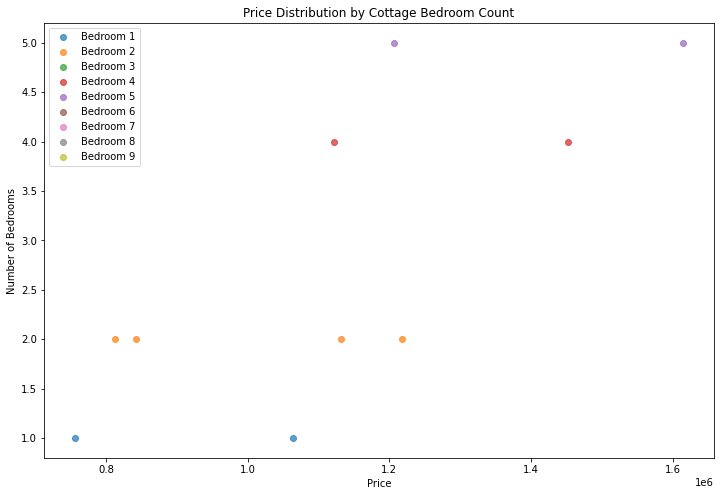

In [271]:
# Taraba
Taraba = housing_train[housing_train["loc" ] == "Taraba"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Taraba, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  22.00000  26.00000      24.00000       29.00000
mean    4.31818   3.19231       3.25000  3030562.46252
std     2.31735   2.02028       1.42188   884153.81190
min     1.00000   1.00000       1.00000  1382676.78500
25%     3.00000   2.00000       2.75000  2257035.54900
50%     4.00000   2.50000       3.00000  3176906.12800
75%     5.75000   4.75000       4.00000  3822595.55800
max     9.00000   7.00000       6.00000  4498627.46800


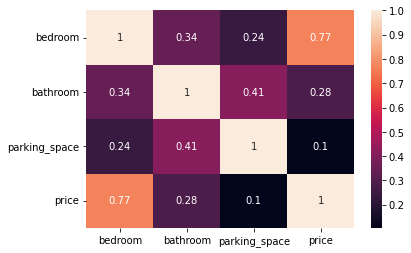

          loc    title  bedroom  bathroom  parking_space      price
2972   Bauchi  Mansion     1.00      7.00            NaN 2257035.55
8324   Bauchi  Mansion     1.00      1.00           4.00 1823185.95
1701   Bauchi  Mansion     2.00      2.00           1.00 2849196.53
5638   Bauchi  Mansion     2.00      3.00           3.00 2180392.85
7502   Bauchi  Mansion     3.00      2.00           4.00 1382676.78
9357   Bauchi  Mansion     3.00      5.00            NaN 2631042.41
9101   Bauchi  Mansion     3.00      6.00           6.00 2782675.07
8985   Bauchi  Mansion     3.00      5.00           4.00 2631042.41
7119   Bauchi  Mansion     3.00      2.00           4.00 1426263.41
12735  Bauchi  Mansion     3.00      1.00           1.00 2240851.02
10649  Bauchi  Mansion     4.00      1.00           4.00 3841391.96
13623  Bauchi  Mansion     4.00       NaN           3.00 3589396.97
6978   Bauchi  Mansion     4.00       NaN           1.00 1582657.43
2119   Bauchi  Mansion     4.00      4.00       

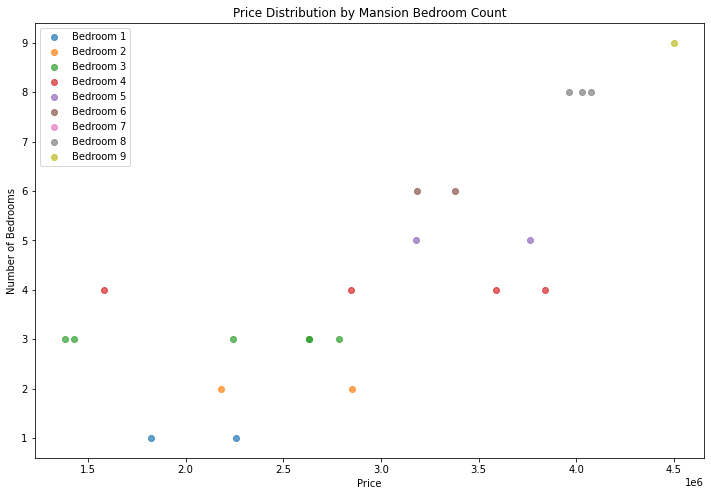



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  23.00000  24.00000      23.00000       28.00000
mean    5.34783   3.75000       3.30435  2037835.49654
std     2.28848   2.26984       1.96410   541742.43202
min     2.00000   1.00000       1.00000  1302363.03300
25%     4.00000   2.00000       1.50000  1588653.50325
50%     5.00000   3.50000       3.00000  1819663.32900
75%     7.50000   6.00000       5.50000  2618078.08750
max     9.00000   7.00000       6.00000  2908485.39700


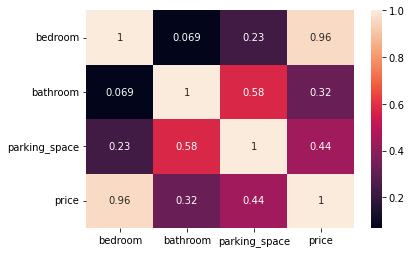

          loc            title  bedroom  bathroom  parking_space      price
7032   Bauchi  Detached duplex     2.00      7.00           3.00 1478163.69
11564  Bauchi  Detached duplex     3.00      1.00           4.00 1488298.81
4835   Bauchi  Detached duplex     3.00       NaN            NaN 1501501.75
3722   Bauchi  Detached duplex     3.00      1.00           1.00 1340798.92
3839   Bauchi  Detached duplex     3.00      6.00           6.00 1714764.12
616    Bauchi  Detached duplex     4.00      7.00           3.00 1881235.25
12875  Bauchi  Detached duplex     4.00      2.00           3.00 1692796.69
7383   Bauchi  Detached duplex     4.00       NaN           1.00 1503322.12
5805   Bauchi  Detached duplex     4.00      1.00            NaN 1564061.51
3409   Bauchi  Detached duplex     4.00      3.00           2.00 1705434.59
13936  Bauchi  Detached duplex     4.00      2.00           1.00 1596850.83
13359  Bauchi  Detached duplex     5.00       NaN           5.00 2138996.71
6657   Bauch

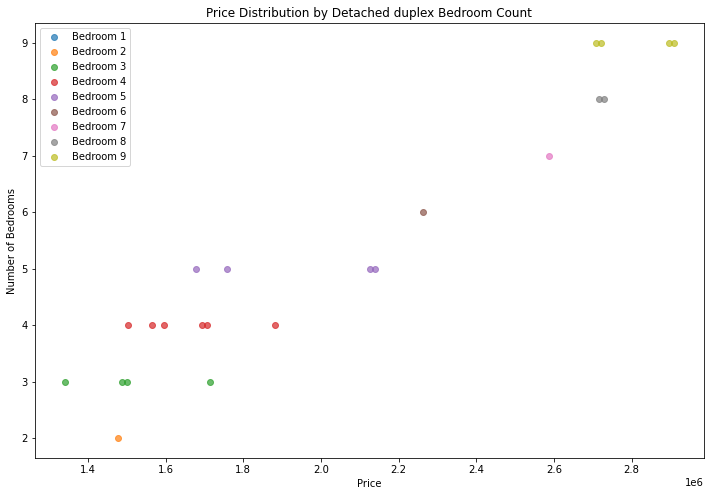



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  27.00000  26.00000      28.00000       33.00000
mean    3.37037   3.26923       3.03571  1148336.32865
std     2.23861   2.37584       1.52709   342578.93865
min     1.00000   1.00000       1.00000   683568.01250
25%     1.50000   1.00000       2.00000   880029.58170
50%     3.00000   2.00000       3.00000  1177979.14300
75%     5.00000   5.75000       4.00000  1268131.21700
max     9.00000   7.00000       6.00000  2128011.89200


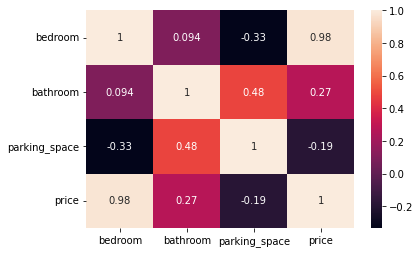

          loc      title  bedroom  bathroom  parking_space      price
12646  Bauchi  Apartment     1.00      2.00           4.00  839815.23
9929   Bauchi  Apartment     1.00       NaN           4.00  752757.46
9243   Bauchi  Apartment     1.00      2.00           3.00  810177.52
3019   Bauchi  Apartment     1.00      7.00           4.00  859588.75
7066   Bauchi  Apartment     1.00      1.00            NaN  683568.01
4644   Bauchi  Apartment     1.00      7.00           5.00  875529.54
3842   Bauchi  Apartment     1.00       NaN           4.00  739673.30
190    Bauchi  Apartment     2.00      1.00            NaN  889044.75
8624   Bauchi  Apartment     2.00      2.00           2.00  880029.58
7885   Bauchi  Apartment     2.00       NaN           1.00  803008.93
13780  Bauchi  Apartment     2.00      2.00            NaN  910741.56
3490   Bauchi  Apartment     2.00       NaN           6.00  996711.38
8179   Bauchi  Apartment     3.00      1.00           1.00 1006774.88
13069  Bauchi  Apart

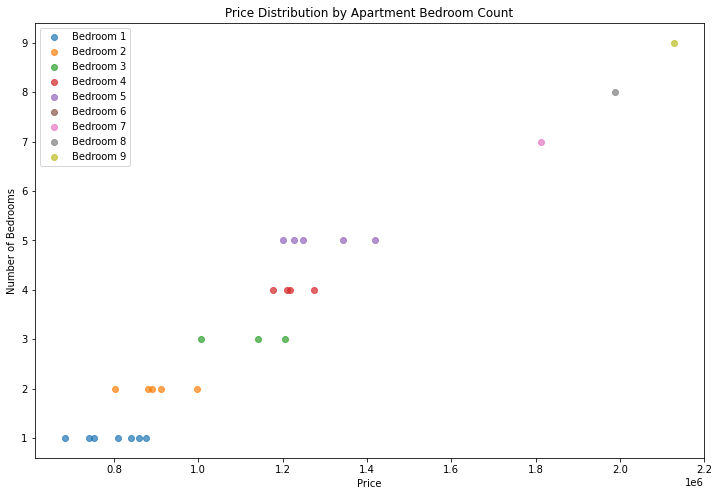



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  23.00000  28.00000      27.00000       32.00000
mean    4.56522   3.42857       2.96296  1464472.88610
std     2.80950   2.00792       1.65207   527319.14571
min     1.00000   1.00000       1.00000   794622.14980
25%     2.00000   2.00000       2.00000  1069167.23900
50%     4.00000   2.50000       2.00000  1233609.94950
75%     6.50000   5.25000       4.00000  1979241.81100
max     9.00000   7.00000       6.00000  2344102.83800


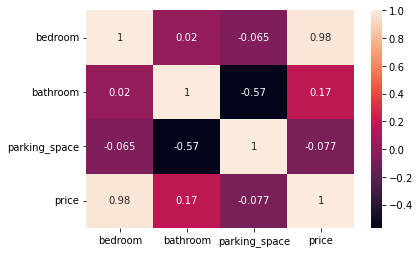

          loc     title  bedroom  bathroom  parking_space      price
812    Bauchi  Bungalow     1.00      2.00            NaN  794622.15
3299   Bauchi  Bungalow     1.00      7.00           2.00  936000.92
360    Bauchi  Bungalow     2.00      5.00           2.00 1044145.79
11354  Bauchi  Bungalow     2.00      7.00           1.00 1080746.24
4594   Bauchi  Bungalow     2.00      2.00           6.00 1034790.22
3374   Bauchi  Bungalow     2.00      6.00            NaN 1071555.03
11664  Bauchi  Bungalow     2.00       NaN           3.00  989842.00
856    Bauchi  Bungalow     3.00      2.00           4.00 1168224.45
1804   Bauchi  Bungalow     3.00      2.00           2.00 1051538.32
2110   Bauchi  Bungalow     3.00      3.00            NaN 1232069.78
6507   Bauchi  Bungalow     4.00      2.00           1.00 1235150.12
3816   Bauchi  Bungalow     4.00      2.00           3.00 1176264.86
4363   Bauchi  Bungalow     4.00      2.00           4.00 1282624.67
4464   Bauchi  Bungalow     4.00  

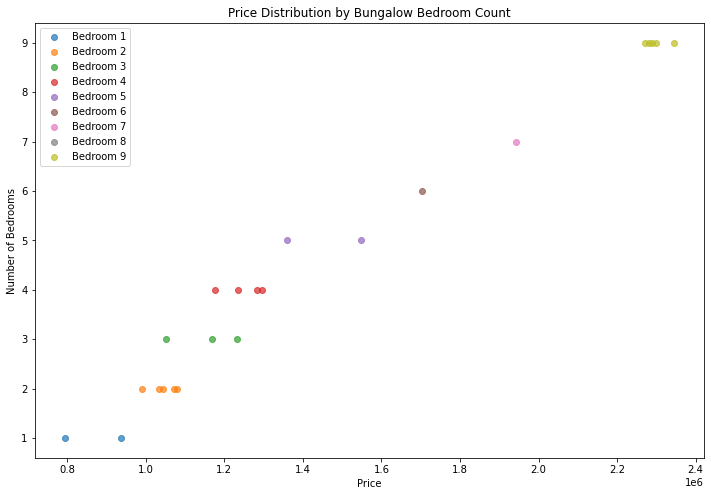



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  22.00000  23.00000      24.00000       28.00000
mean    5.13636   3.91304       2.83333  1587503.39699
std     2.60577   2.08704       1.34056   497928.18291
min     1.00000   1.00000       1.00000   856395.68210
25%     3.00000   2.00000       2.00000  1193459.16450
50%     4.00000   4.00000       3.00000  1461717.07600
75%     8.00000   5.50000       3.25000  2128111.78250
max     9.00000   7.00000       6.00000  2325720.43100


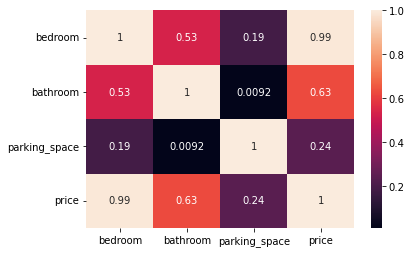

          loc title  bedroom  bathroom  parking_space      price
7629   Bauchi  Flat     1.00      2.00            NaN  856395.68
4948   Bauchi  Flat     2.00      2.00           4.00 1028284.81
10653  Bauchi  Flat     2.00      2.00           3.00  970838.56
5163   Bauchi  Flat     3.00      2.00           2.00 1131788.36
1662   Bauchi  Flat     3.00       NaN           2.00 1214016.10
3003   Bauchi  Flat     3.00      2.00           2.00 1035597.21
8056   Bauchi  Flat     3.00      6.00           2.00 1241425.34
9045   Bauchi  Flat     4.00       NaN            NaN 1461717.08
2049   Bauchi  Flat     4.00      5.00           1.00 1370462.50
3145   Bauchi  Flat     4.00      2.00           2.00 1306452.80
5916   Bauchi  Flat     4.00      7.00            NaN 1461717.08
5802   Bauchi  Flat     4.00      4.00           4.00 1397707.38
276    Bauchi  Flat     5.00      1.00           2.00 1366599.02
9266   Bauchi  Flat     5.00      5.00           1.00 1548855.94
1664   Bauchi  Flat     7

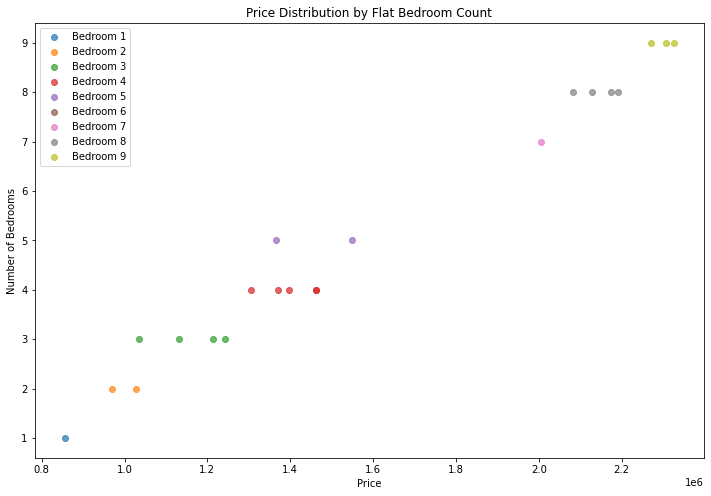



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  33.00000  35.00000      34.00000       40.00000
mean    3.81818   3.17143       3.35294  1488260.26940
std     2.55508   2.00713       1.80710   524683.74408
min     1.00000   1.00000       1.00000   838786.94250
25%     1.00000   2.00000       2.00000  1028830.72150
50%     4.00000   3.00000       3.50000  1365856.39850
75%     5.00000   5.00000       5.00000  1839258.35900
max     9.00000   7.00000       6.00000  2589654.28400


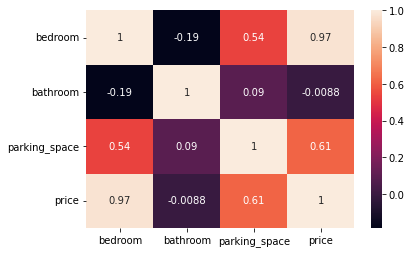

          loc           title  bedroom  bathroom  parking_space      price
13726  Bauchi  Terrace duplex     1.00      1.00           1.00  838786.94
12165  Bauchi  Terrace duplex     1.00      2.00            NaN  866785.68
9930   Bauchi  Terrace duplex     1.00      6.00           2.00 1013459.25
9535   Bauchi  Terrace duplex     1.00      1.00            NaN  843019.60
8666   Bauchi  Terrace duplex     1.00      2.00           1.00  946067.40
2371   Bauchi  Terrace duplex     1.00      3.00            NaN  900457.75
13086  Bauchi  Terrace duplex     1.00      6.00           1.00  992963.95
3684   Bauchi  Terrace duplex     1.00      2.00           1.00  888948.83
4100   Bauchi  Terrace duplex     1.00      7.00           4.00 1085285.25
8088   Bauchi  Terrace duplex     2.00      2.00           1.00 1004066.56
6872   Bauchi  Terrace duplex     2.00      1.00           1.00  938330.91
5991   Bauchi  Terrace duplex     2.00      3.00           2.00 1093672.54
881    Bauchi  Terrace du

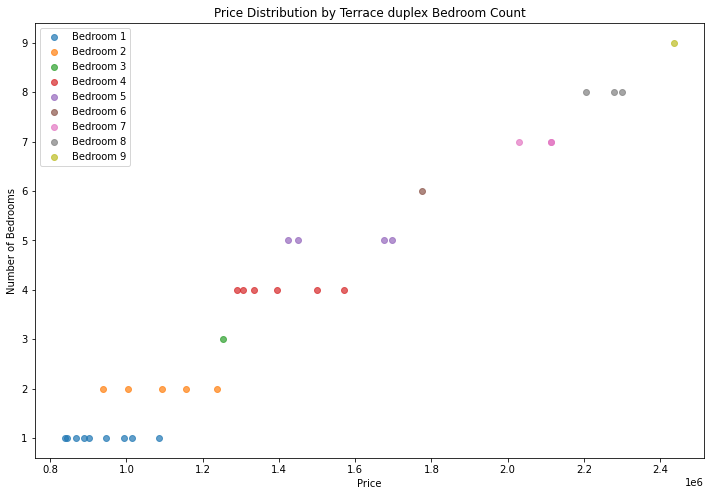



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  21.00000  24.00000      20.00000       27.00000
mean    4.57143   3.33333       2.40000  1498115.76944
std     2.52134   2.14003       1.46539   494554.81712
min     1.00000   1.00000       1.00000   874836.99690
25%     3.00000   1.75000       1.00000  1133747.99850
50%     4.00000   3.00000       2.00000  1396936.55600
75%     6.00000   5.00000       3.25000  1777302.14350
max     9.00000   7.00000       6.00000  2630644.87900


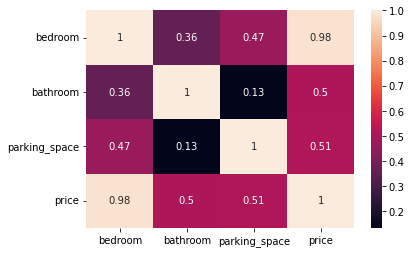

          loc                 title  bedroom  bathroom  parking_space  \
13760  Bauchi  Semi-detached duplex     1.00      1.00            NaN   
6664   Bauchi  Semi-detached duplex     1.00      6.00            NaN   
8724   Bauchi  Semi-detached duplex     1.00      2.00           1.00   
11260  Bauchi  Semi-detached duplex     2.00      5.00           1.00   
2253   Bauchi  Semi-detached duplex     3.00      2.00           3.00   
4184   Bauchi  Semi-detached duplex     3.00      1.00            NaN   
9344   Bauchi  Semi-detached duplex     3.00      4.00           1.00   
9200   Bauchi  Semi-detached duplex     3.00      5.00           2.00   
2523   Bauchi  Semi-detached duplex     4.00      1.00            NaN   
11755  Bauchi  Semi-detached duplex     4.00       NaN           3.00   
12876  Bauchi  Semi-detached duplex     4.00       NaN           4.00   
12291  Bauchi  Semi-detached duplex     5.00      1.00           1.00   
9023   Bauchi  Semi-detached duplex     5.00      1

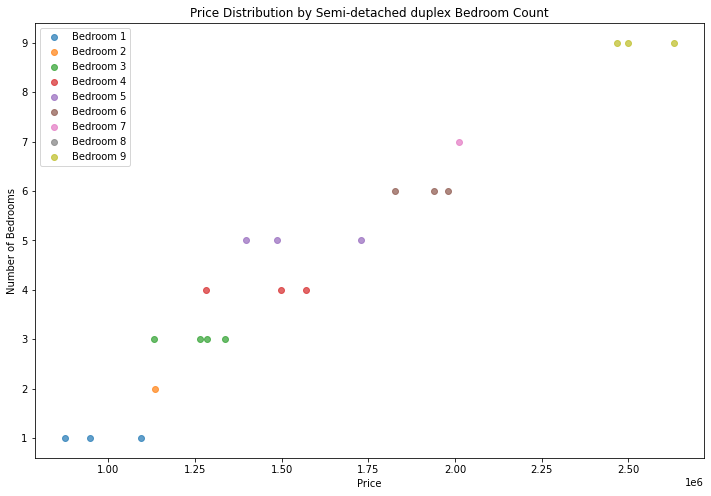



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  28.00000  29.00000      30.00000       33.00000
mean    4.57143   3.13793       3.00000  1728157.86488
std     2.28406   1.84631       1.36458   471043.92591
min     1.00000   1.00000       1.00000   931977.31050
25%     3.00000   1.00000       2.00000  1473414.15300
50%     4.50000   3.00000       3.00000  1695645.29900
75%     6.00000   5.00000       4.00000  1991952.85400
max     9.00000   7.00000       6.00000  2689255.93500


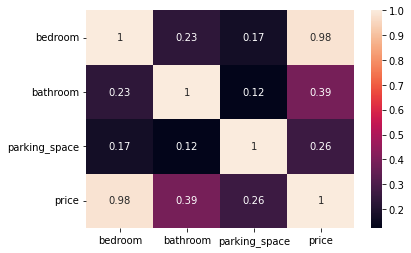

          loc      title  bedroom  bathroom  parking_space      price
300    Bauchi  Townhouse     1.00      1.00           3.00  931977.31
13165  Bauchi  Townhouse     1.00      1.00           4.00 1002119.44
2943   Bauchi  Townhouse     1.00       NaN           3.00  932790.71
5431   Bauchi  Townhouse     2.00      2.00           1.00 1140983.68
4871   Bauchi  Townhouse     2.00      7.00           1.00 1312291.46
1008   Bauchi  Townhouse     2.00      3.00           4.00 1243562.89
1560   Bauchi  Townhouse     3.00      4.00            NaN 1467207.03
2504   Bauchi  Townhouse     3.00      6.00           4.00 1535730.15
7551   Bauchi  Townhouse     3.00      5.00           5.00 1524241.14
10045  Bauchi  Townhouse     4.00      2.00            NaN 1479484.24
9691   Bauchi  Townhouse     4.00      1.00           2.00 1473414.15
8816   Bauchi  Townhouse     4.00      5.00           4.00 1695645.30
7382   Bauchi  Townhouse     4.00      2.00           2.00 1547315.52
4248   Bauchi  Townh

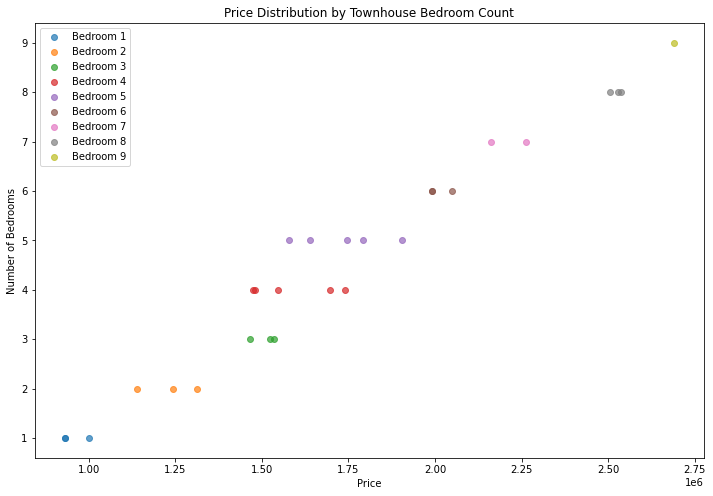



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  25.00000  23.00000      28.00000       30.00000
mean    4.56000   3.08696       3.28571  2117999.52523
std     2.67831   2.19323       1.78174   598176.60180
min     1.00000   1.00000       1.00000  1389710.65900
25%     2.00000   1.00000       1.75000  1630577.42800
50%     4.00000   2.00000       3.00000  1957230.80300
75%     7.00000   5.00000       4.25000  2426888.07925
max     9.00000   7.00000       6.00000  3367912.17000


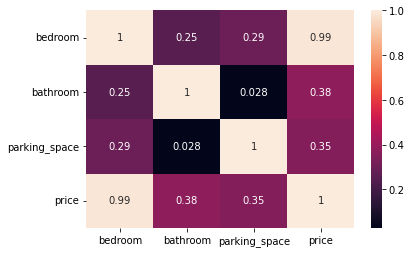

          loc      title  bedroom  bathroom  parking_space      price
2156   Bauchi  Penthouse     1.00      1.00           4.00 1389710.66
6509   Bauchi  Penthouse     1.00      5.00            NaN 1506806.81
389    Bauchi  Penthouse     2.00      6.00           1.00 1615069.28
10187  Bauchi  Penthouse     2.00       NaN           4.00 1554646.53
8213   Bauchi  Penthouse     2.00      5.00           3.00 1629737.89
4883   Bauchi  Penthouse     2.00       NaN           1.00 1633096.03
13293  Bauchi  Penthouse     2.00      1.00           2.00 1484987.40
4162   Bauchi  Penthouse     2.00      2.00           3.00 1496117.82
557    Bauchi  Penthouse     3.00      2.00           3.00 1714726.64
9102   Bauchi  Penthouse     3.00      1.00           5.00 1729437.42
9083   Bauchi  Penthouse     3.00      7.00           4.00 1967073.24
7916   Bauchi  Penthouse     4.00      2.00            NaN 1947388.36
8757   Bauchi  Penthouse     4.00      5.00           3.00 2071833.99
8689   Bauchi  Penth

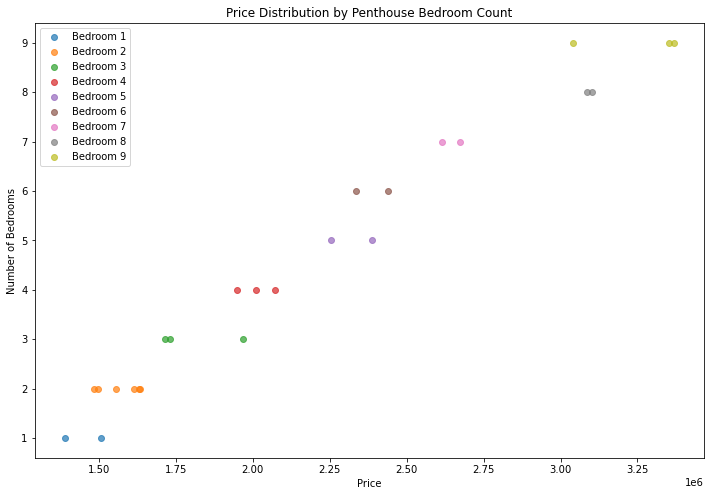



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  7.00000  7.00000       7.00000        8.00000
mean   3.14286  1.71429       3.14286  1111650.83175
std    2.03540  0.48795       0.89974   224862.90735
min    1.00000  1.00000       2.00000   908923.69640
25%    1.00000  1.50000       2.50000   959922.25658
50%    4.00000  2.00000       3.00000  1019819.74635
75%    5.00000  2.00000       4.00000  1200179.60400
max    5.00000  2.00000       4.00000  1470783.10400


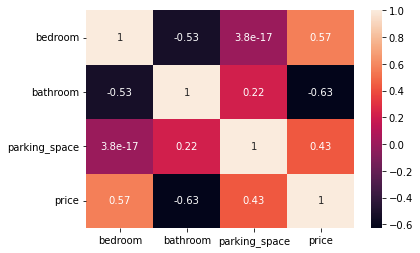

          loc    title  bedroom  bathroom  parking_space      price
827    Bauchi  Cottage     1.00       NaN           2.00  908923.70
3967   Bauchi  Cottage     1.00      2.00           3.00  939602.81
12878  Bauchi  Cottage     1.00      2.00            NaN  966695.41
1877   Bauchi  Cottage     4.00      2.00           4.00  995129.39
4199   Bauchi  Cottage     5.00      1.00           4.00 1450984.01
12941  Bauchi  Cottage     5.00      2.00           3.00 1116578.13
13009  Bauchi  Cottage     5.00      1.00           2.00 1044510.10
3866   Bauchi  Cottage      NaN      2.00           4.00 1470783.10


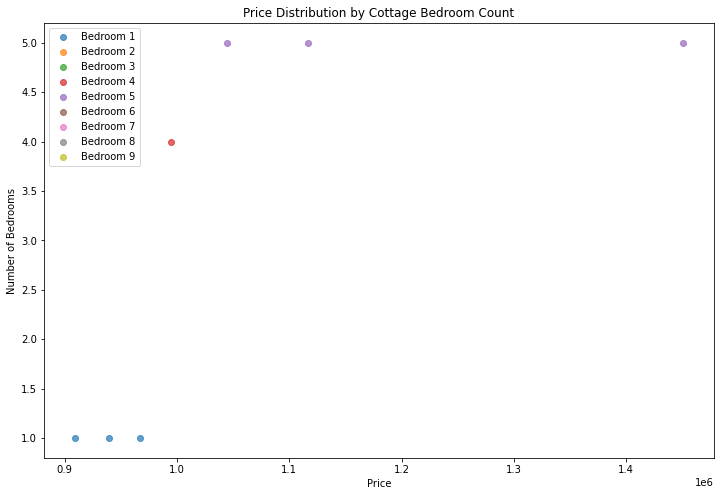

In [272]:
# Bauchi
Bauchi = housing_train[housing_train["loc" ] == "Bauchi"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Bauchi, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  27.00000  27.00000      27.00000       32.00000
mean    4.48148   3.96296       3.00000  2881597.73969
std     2.50185   2.15695       1.66410   985756.64097
min     1.00000   1.00000       1.00000   737655.04190
25%     2.50000   2.00000       2.00000  2352792.51450
50%     4.00000   4.00000       3.00000  2947710.15600
75%     6.50000   6.00000       4.00000  3635724.33050
max     9.00000   7.00000       6.00000  4520066.21000


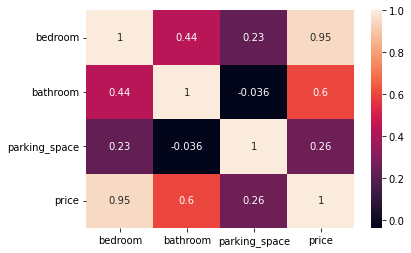

         loc    title  bedroom  bathroom  parking_space      price
130    Kebbi  Mansion     1.00      2.00            NaN  834522.99
12978  Kebbi  Mansion     1.00      1.00           3.00  785009.49
811    Kebbi  Mansion     1.00      6.00           6.00 2235206.44
2107   Kebbi  Mansion     1.00      1.00           3.00  737655.04
9616   Kebbi  Mansion     2.00      1.00            NaN 2138894.66
8654   Kebbi  Mansion     2.00       NaN           3.00 2375683.73
13743  Kebbi  Mansion     2.00       NaN           1.00 1963663.23
4746   Kebbi  Mansion     3.00      1.00            NaN 2461291.16
5465   Kebbi  Mansion     3.00       NaN           5.00 2674310.26
12317  Kebbi  Mansion     3.00       NaN           2.00 2284118.87
11152  Kebbi  Mansion     4.00      6.00           1.00 2848317.73
1671   Kebbi  Mansion     4.00      1.00           3.00 2767553.99
13421  Kebbi  Mansion     4.00       NaN           1.00 2533997.95
7384   Kebbi  Mansion     4.00      2.00           2.00 259164

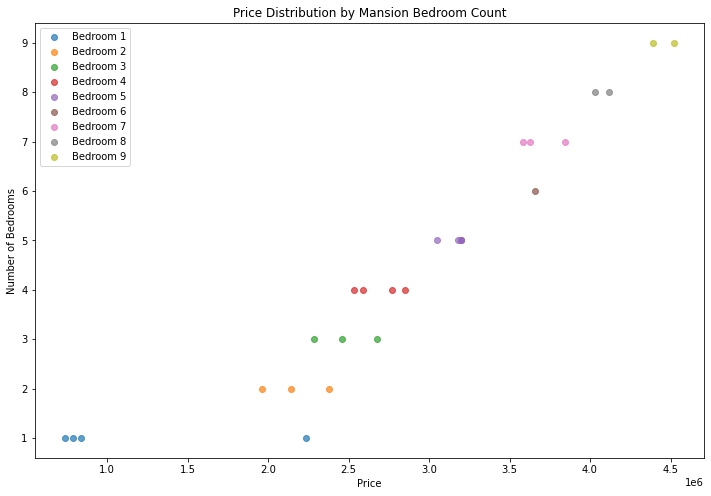



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  24.00000  23.00000      29.00000       29.00000
mean    4.50000   2.60870       2.79310  1617679.98628
std     2.73464   1.94794       1.61199   654986.99903
min     1.00000   1.00000       1.00000   719496.24110
25%     2.00000   1.00000       1.00000  1220293.73600
50%     5.00000   2.00000       3.00000  1368522.33500
75%     5.50000   4.00000       4.00000  2126358.80200
max     9.00000   7.00000       6.00000  2870797.68400


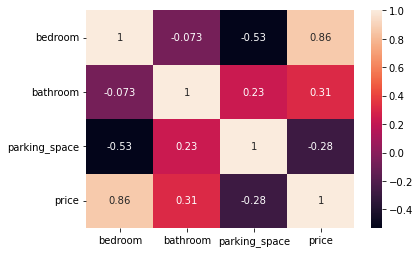

         loc            title  bedroom  bathroom  parking_space      price
5262   Kebbi  Detached duplex     1.00      2.00           4.00  811111.31
260    Kebbi  Detached duplex     1.00       NaN           5.00 1185280.69
9073   Kebbi  Detached duplex     1.00      2.00           1.00  750131.54
11643  Kebbi  Detached duplex     1.00      6.00           4.00 1273294.02
4391   Kebbi  Detached duplex     1.00       NaN           4.00  781671.94
333    Kebbi  Detached duplex     2.00      5.00           4.00 1427838.08
5875   Kebbi  Detached duplex     2.00      2.00           3.00  936319.86
760    Kebbi  Detached duplex     3.00      4.00           5.00 1614338.89
5637   Kebbi  Detached duplex     3.00       NaN           3.00 1526551.56
141    Kebbi  Detached duplex     4.00       NaN           4.00 1220293.74
596    Kebbi  Detached duplex     4.00      2.00           1.00 1188931.07
2968   Kebbi  Detached duplex     5.00      1.00           1.00 1812671.20
5506   Kebbi  Detached du

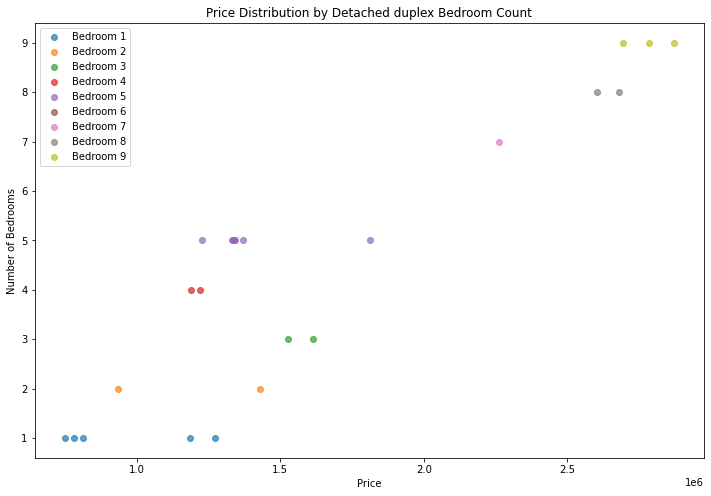



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  28.00000  27.00000      29.00000       33.00000
mean    5.17857   3.40741       3.68966  1413448.08392
std     2.76290   2.08030       1.44181   567493.53528
min     1.00000   1.00000       1.00000   591162.74050
25%     3.00000   2.00000       3.00000   779597.18030
50%     5.00000   3.00000       4.00000  1370599.53400
75%     8.00000   5.00000       5.00000  1941123.36800
max     9.00000   7.00000       6.00000  2199817.34300


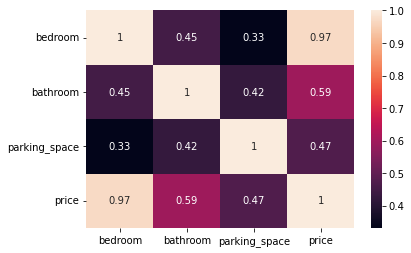

         loc      title  bedroom  bathroom  parking_space      price
13137  Kebbi  Apartment     1.00      3.00           5.00  779597.18
12038  Kebbi  Apartment     1.00       NaN           3.00  591162.74
6511   Kebbi  Apartment     1.00      3.00            NaN  715834.03
7394   Kebbi  Apartment     2.00      1.00            NaN  671055.00
6443   Kebbi  Apartment     2.00      2.00           4.00  705313.87
11975  Kebbi  Apartment     3.00      6.00           4.00 1148927.07
2333   Kebbi  Apartment     3.00      2.00           3.00  769510.92
7155   Kebbi  Apartment     3.00      1.00           2.00  750288.59
7137   Kebbi  Apartment     3.00      1.00           1.00  764662.41
3776   Kebbi  Apartment     3.00       NaN           2.00  760313.49
6134   Kebbi  Apartment     3.00      3.00           4.00 1076977.80
4693   Kebbi  Apartment     4.00       NaN           3.00 1321877.68
13070  Kebbi  Apartment     4.00      1.00           2.00  867760.49
702    Kebbi  Apartment     5.00  

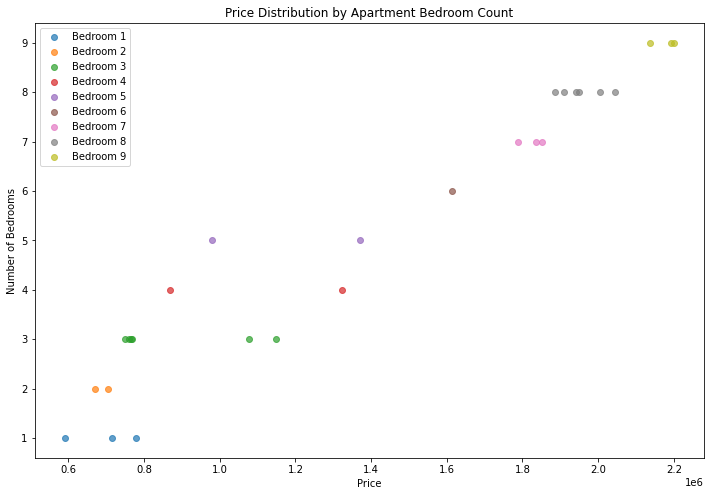



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  26.00000  22.00000      25.00000       30.00000
mean    3.69231   3.68182       3.32000  1234655.35688
std     2.34554   2.03274       1.65126   514944.11200
min     1.00000   1.00000       1.00000   580144.57330
25%     2.00000   1.25000       2.00000   819429.43732
50%     3.00000   5.00000       3.00000  1076150.63500
75%     5.00000   5.00000       4.00000  1630837.12500
max     9.00000   7.00000       6.00000  2325720.43100


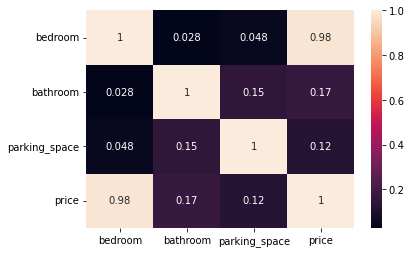

         loc     title  bedroom  bathroom  parking_space      price
158    Kebbi  Bungalow     1.00      4.00           2.00  853773.18
2099   Kebbi  Bungalow     1.00      1.00           3.00  580144.57
10454  Kebbi  Bungalow     1.00      5.00           4.00  917618.51
6553   Kebbi  Bungalow     1.00       NaN           2.00  583817.77
10134  Kebbi  Bungalow     1.00      5.00           3.00  899400.47
9111   Kebbi  Bungalow     1.00      1.00           4.00  807981.52
3534   Kebbi  Bungalow     2.00      5.00           6.00 1117017.96
4570   Kebbi  Bungalow     2.00      2.00            NaN  961918.05
11983  Kebbi  Bungalow     2.00       NaN           2.00  655056.46
9058   Kebbi  Bungalow     2.00      7.00            NaN 1098964.28
11312  Kebbi  Bungalow     3.00       NaN           2.00  765977.14
6796   Kebbi  Bungalow     3.00       NaN           2.00  805302.79
7036   Kebbi  Bungalow     3.00       NaN           3.00 1150006.40
9144   Kebbi  Bungalow     3.00       NaN       

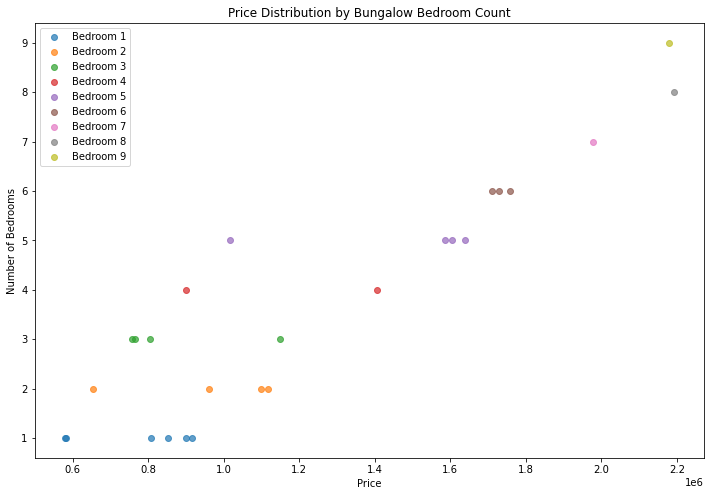



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  30.00000  31.00000      28.00000       35.00000
mean    4.20000   3.06452       3.00000  1304736.18748
std     2.68328   1.80620       1.36083   600642.89672
min     1.00000   1.00000       1.00000   571676.17360
25%     1.25000   1.50000       2.00000   774425.78160
50%     4.00000   3.00000       3.00000  1051276.57300
75%     5.00000   4.50000       4.00000  1808587.10500
max     9.00000   7.00000       6.00000  2325720.43100


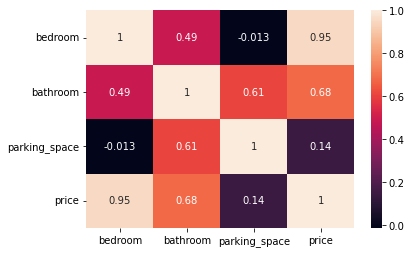

         loc title  bedroom  bathroom  parking_space      price
535    Kebbi  Flat     1.00      1.00            NaN  587975.74
13010  Kebbi  Flat     1.00      4.00           5.00  908427.30
12258  Kebbi  Flat     1.00      2.00           2.00  582639.59
11266  Kebbi  Flat     1.00      1.00            NaN  753327.40
10274  Kebbi  Flat     1.00      2.00           1.00  597902.39
8533   Kebbi  Flat     1.00      2.00           3.00  605141.19
2050   Kebbi  Flat     1.00      1.00           2.00  586324.14
6679   Kebbi  Flat     1.00       NaN           3.00  592012.57
6864   Kebbi  Flat     2.00      3.00           4.00 1025763.38
7107   Kebbi  Flat     3.00       NaN            NaN  770996.39
1754   Kebbi  Flat     3.00      1.00           3.00  777855.17
13707  Kebbi  Flat     4.00      4.00            NaN 1361271.30
13123  Kebbi  Flat     4.00       NaN           3.00  910569.55
4254   Kebbi  Flat     4.00      1.00            NaN  915455.55
3688   Kebbi  Flat     4.00      4.00   

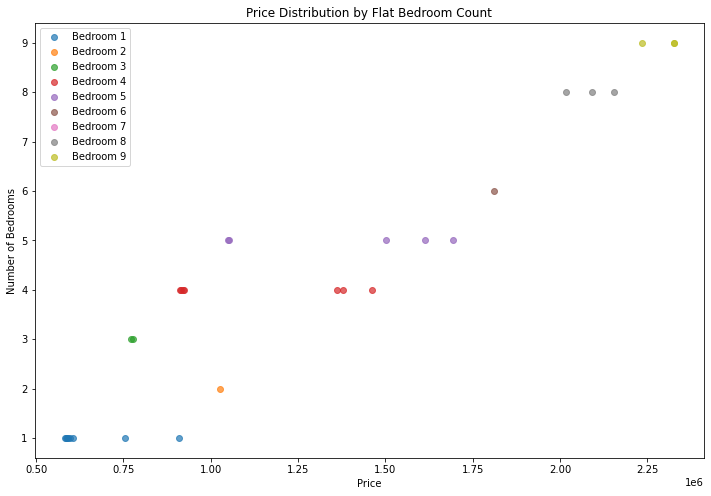



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  29.00000      26.00000       35.00000
mean    4.53333   3.31034       3.84615  1556379.02334
std     2.86156   2.00185       1.48842   608599.09189
min     1.00000   1.00000       1.00000   618534.99430
25%     2.25000   2.00000       3.00000  1115144.24250
50%     4.00000   3.00000       4.00000  1467874.75800
75%     7.00000   5.00000       5.00000  2087356.85050
max     9.00000   7.00000       6.00000  2507488.18300


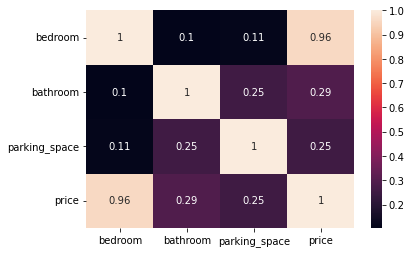

         loc           title  bedroom  bathroom  parking_space      price
6515   Kebbi  Terrace duplex     1.00      7.00            NaN 1085285.25
732    Kebbi  Terrace duplex     1.00      1.00           3.00  618534.99
756    Kebbi  Terrace duplex     1.00      1.00            NaN  677254.09
4347   Kebbi  Terrace duplex     1.00       NaN           1.00  683495.84
4010   Kebbi  Terrace duplex     1.00      1.00           2.00  859282.24
3308   Kebbi  Terrace duplex     2.00      7.00           6.00 1298995.34
8403   Kebbi  Terrace duplex     2.00      3.00           6.00 1175653.73
1932   Kebbi  Terrace duplex     2.00      1.00           1.00  782147.40
11213  Kebbi  Terrace duplex     3.00      3.00           4.00 1314289.58
7153   Kebbi  Terrace duplex     3.00      1.00            NaN 1211628.18
10945  Kebbi  Terrace duplex     3.00       NaN           3.00 1417135.89
793    Kebbi  Terrace duplex     3.00      3.00            NaN 1293794.28
5192   Kebbi  Terrace duplex     3.00 

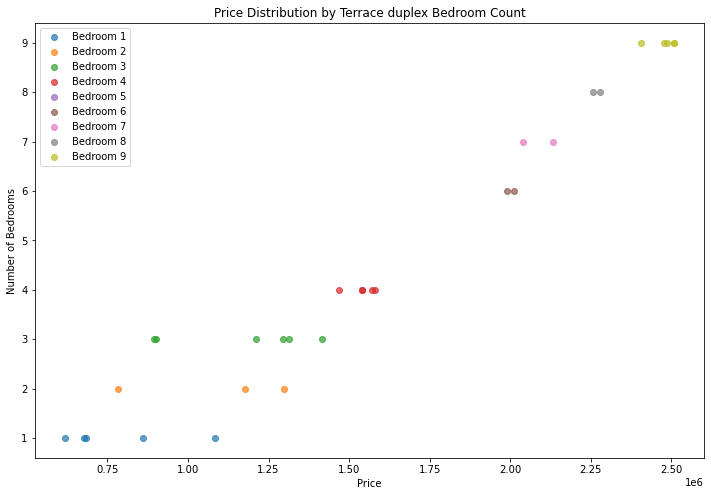



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  28.00000  26.00000      23.00000       30.00000
mean    4.78571   3.23077       3.39130  1490207.97505
std     2.61558   2.06509       1.67167   625337.14324
min     1.00000   1.00000       1.00000   639460.50190
25%     2.00000   2.00000       2.00000  1016175.54250
50%     5.00000   2.50000       3.00000  1216921.69250
75%     7.00000   4.75000       5.00000  2019008.26075
max     9.00000   7.00000       6.00000  2599809.47700


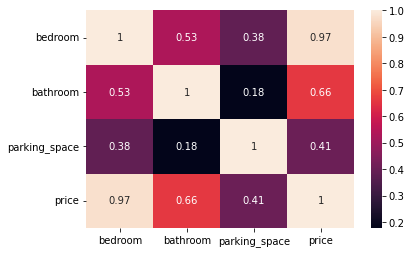

         loc                 title  bedroom  bathroom  parking_space  \
312    Kebbi  Semi-detached duplex     1.00      2.00           2.00   
9284   Kebbi  Semi-detached duplex     1.00      1.00           2.00   
11674  Kebbi  Semi-detached duplex     2.00      6.00           2.00   
4203   Kebbi  Semi-detached duplex     2.00       NaN           3.00   
3619   Kebbi  Semi-detached duplex     2.00       NaN           5.00   
9735   Kebbi  Semi-detached duplex     2.00      1.00           1.00   
3020   Kebbi  Semi-detached duplex     2.00      3.00           2.00   
323    Kebbi  Semi-detached duplex     2.00      4.00           2.00   
9663   Kebbi  Semi-detached duplex     3.00      1.00           3.00   
8009   Kebbi  Semi-detached duplex     3.00      4.00           6.00   
8776   Kebbi  Semi-detached duplex     3.00      1.00           4.00   
1506   Kebbi  Semi-detached duplex     4.00       NaN            NaN   
9524   Kebbi  Semi-detached duplex     4.00      2.00           

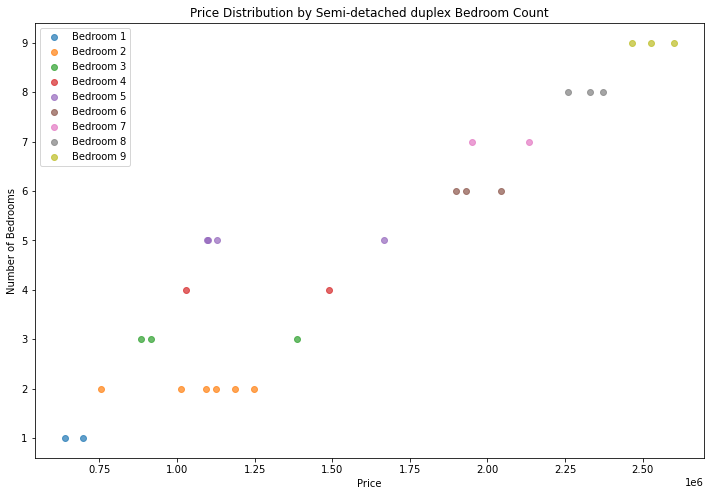



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  24.00000  26.00000      32.00000       35.00000
mean    4.95833   2.84615       3.21875  1719159.97045
std     2.38618   1.89087       1.66044   634345.50355
min     1.00000   1.00000       1.00000   687900.90030
25%     3.00000   1.00000       2.00000  1114725.64050
50%     5.50000   2.00000       3.00000  1893756.45900
75%     7.00000   4.75000       4.25000  2303784.46650
max     8.00000   7.00000       6.00000  2583864.34600


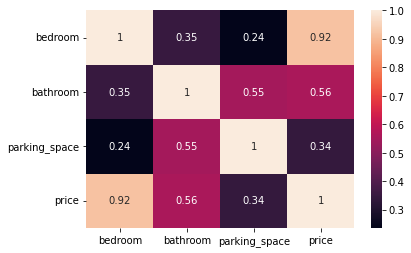

         loc      title  bedroom  bathroom  parking_space      price
4538   Kebbi  Townhouse     1.00       NaN           5.00 1118121.37
5786   Kebbi  Townhouse     1.00      2.00            NaN 1072370.81
8246   Kebbi  Townhouse     1.00       NaN           3.00  771450.96
8008   Kebbi  Townhouse     1.00      1.00            NaN  759997.72
607    Kebbi  Townhouse     3.00       NaN           3.00  955431.74
11099  Kebbi  Townhouse     3.00       NaN           3.00 1039267.24
9618   Kebbi  Townhouse     3.00      1.00           4.00 1364422.36
1717   Kebbi  Townhouse     4.00      1.00           4.00 1132468.61
1796   Kebbi  Townhouse     4.00      5.00           5.00 1718417.85
12095  Kebbi  Townhouse     4.00      1.00           4.00 1111329.91
8934   Kebbi  Townhouse     5.00      3.00           3.00 1802255.33
7112   Kebbi  Townhouse     5.00      1.00           3.00 1733732.22
9017   Kebbi  Townhouse     6.00      1.00           5.00 1980258.39
7560   Kebbi  Townhouse     6.00  

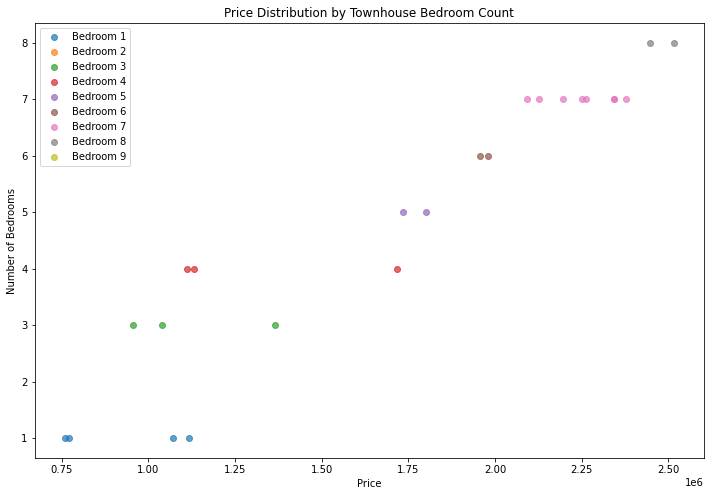



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  21.00000  20.00000      23.00000       25.00000
mean    4.47619   3.20000       3.26087  1886383.09960
std     2.54203   2.11760       1.51410   694852.96397
min     1.00000   1.00000       1.00000   969348.91100
25%     2.00000   1.75000       2.00000  1348232.73600
50%     4.00000   2.00000       4.00000  1614802.18700
75%     7.00000   5.00000       4.00000  2588466.20200
max     9.00000   7.00000       6.00000  3190019.16500


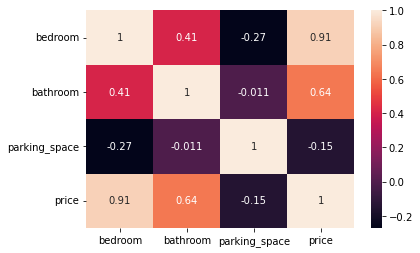

         loc      title  bedroom  bathroom  parking_space      price
6258   Kebbi  Penthouse     1.00      1.00           4.00  969348.91
9036   Kebbi  Penthouse     1.00      1.00           5.00 1299042.40
8378   Kebbi  Penthouse     2.00       NaN           2.00 1184927.84
3749   Kebbi  Penthouse     2.00      4.00           4.00 1614802.19
11305  Kebbi  Penthouse     2.00      3.00           1.00 1481449.21
3007   Kebbi  Penthouse     2.00       NaN           2.00 1105520.54
5223   Kebbi  Penthouse     3.00      6.00           4.00 1922533.22
10696  Kebbi  Penthouse     3.00       NaN           4.00 1324590.24
967    Kebbi  Penthouse     3.00       NaN           1.00 1348232.74
5248   Kebbi  Penthouse     4.00      2.00           2.00 1426755.10
11821  Kebbi  Penthouse     4.00      1.00           3.00 1408543.05
1620   Kebbi  Penthouse     4.00      1.00            NaN 1501912.55
8844   Kebbi  Penthouse     5.00      2.00           4.00 1659944.78
9695   Kebbi  Penthouse     5.00  

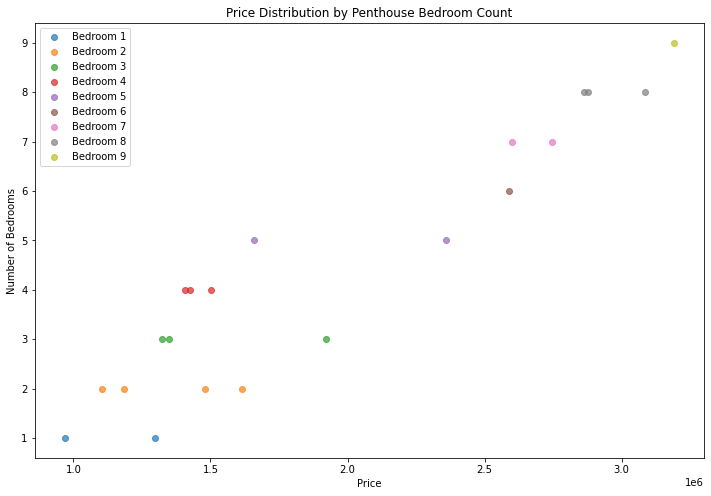



Analyzing Cottage data:
       bedroom  bathroom parking_space          price
count  7.00000  10.00000      11.00000       11.00000
mean   3.71429   1.20000       2.63636   845793.81763
std    1.38013   0.42164       1.12006   139498.30561
min    2.00000   1.00000       1.00000   651472.54400
25%    2.50000   1.00000       2.00000   734155.26340
50%    4.00000   1.00000       3.00000   842854.05280
75%    5.00000   1.00000       3.50000   885837.83140
max    5.00000   2.00000       4.00000  1112488.51800


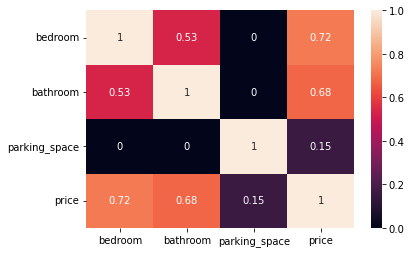

         loc    title  bedroom  bathroom  parking_space      price
13238  Kebbi  Cottage     2.00      1.00           1.00  734862.75
13534  Kebbi  Cottage     2.00      1.00           2.00  722027.79
2781   Kebbi  Cottage     3.00      1.00           3.00  651472.54
11437  Kebbi  Cottage     4.00      1.00           3.00 1051149.41
735    Kebbi  Cottage     5.00       NaN           4.00  885671.12
6161   Kebbi  Cottage     5.00      1.00           1.00  836965.65
13476  Kebbi  Cottage     5.00      2.00           2.00 1112488.52
112    Kebbi  Cottage      NaN      1.00           4.00  842854.05
1696   Kebbi  Cottage      NaN      1.00           4.00  733447.78
5777   Kebbi  Cottage      NaN      1.00           3.00  846787.83
11471  Kebbi  Cottage      NaN      2.00           2.00  886004.55


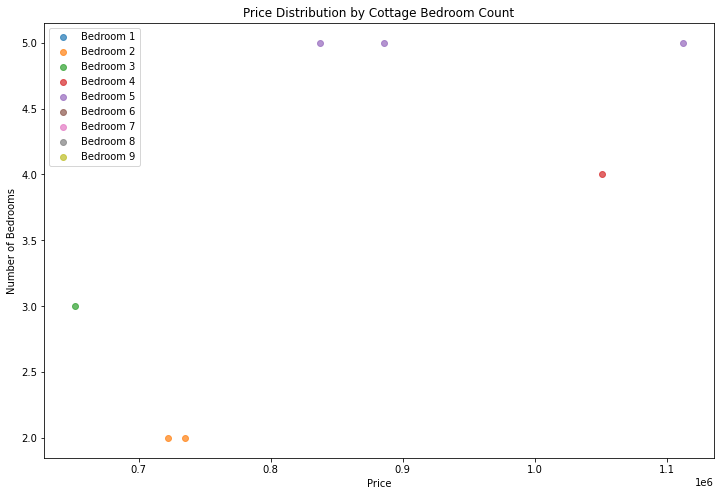

In [273]:
# Kebbi
Kebbi = housing_train[housing_train["loc" ] == "Kebbi"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Kebbi, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  29.00000  27.00000      28.00000       33.00000
mean    3.86207   3.37037       2.46429  2842573.19905
std     2.13348   2.35581       1.50264   856392.87494
min     1.00000   1.00000       1.00000   987172.76150
25%     2.00000   1.00000       1.00000  2158954.11000
50%     3.00000   2.00000       2.00000  3061550.52300
75%     6.00000   6.00000       3.25000  3422814.91900
max     9.00000   7.00000       6.00000  4151313.56500


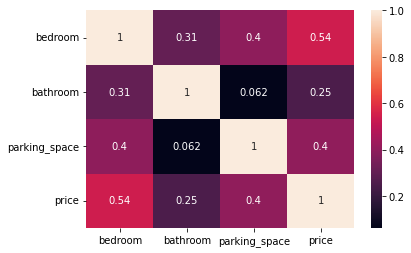

        loc    title  bedroom  bathroom  parking_space      price
13654  Abia  Mansion     1.00      1.00           1.00  987172.76
8503   Abia  Mansion     1.00      7.00           1.00 2083964.15
13258  Abia  Mansion     1.00      6.00            NaN 2062135.04
12695  Abia  Mansion     2.00       NaN           2.00 3178050.96
7516   Abia  Mansion     2.00      1.00           1.00 2873972.64
5717   Abia  Mansion     2.00      4.00           1.00 2158954.11
4040   Abia  Mansion     2.00      7.00           1.00 2354244.99
8138   Abia  Mansion     2.00      1.00           1.00 2948926.96
2402   Abia  Mansion     2.00      2.00           2.00 3061550.52
3022   Abia  Mansion     2.00      7.00            NaN 2397512.84
5111   Abia  Mansion     3.00      2.00           3.00 3569144.38
6277   Abia  Mansion     3.00      1.00           4.00 3232039.56
9104   Abia  Mansion     3.00      2.00           4.00 2435751.53
12893  Abia  Mansion     3.00      3.00           6.00 2587384.19
11752  Abi

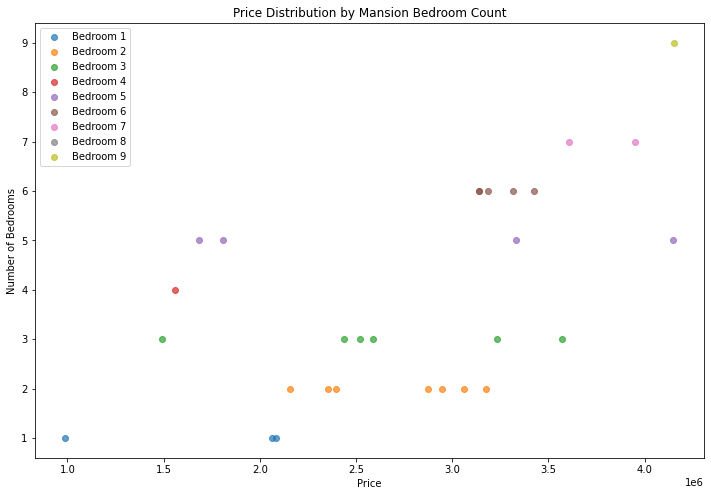



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  20.00000  22.00000      18.00000       23.00000
mean    4.15000   3.22727       3.33333  1767214.01826
std     2.83354   2.11417       1.28338   572713.53112
min     1.00000   1.00000       1.00000  1035683.95000
25%     1.00000   2.00000       2.00000  1276965.90000
50%     4.50000   2.00000       4.00000  1730198.41800
75%     5.25000   4.00000       4.00000  2070053.23450
max     9.00000   7.00000       6.00000  2921349.30400


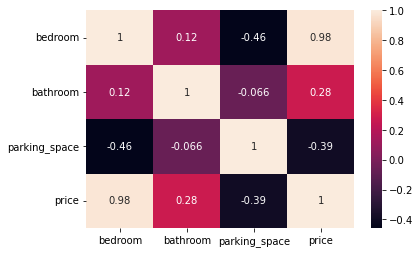

        loc            title  bedroom  bathroom  parking_space      price
5730   Abia  Detached duplex     1.00      2.00            NaN 1035683.95
11328  Abia  Detached duplex     1.00      7.00           4.00 1310981.74
7717   Abia  Detached duplex     1.00      2.00           5.00 1147592.98
1822   Abia  Detached duplex     1.00      2.00           4.00 1115651.06
13174  Abia  Detached duplex     1.00      1.00            NaN 1070697.89
1012   Abia  Detached duplex     1.00      2.00            NaN 1072443.55
5826   Abia  Detached duplex     2.00      4.00            NaN 1340050.75
12075  Abia  Detached duplex     2.00      1.00           3.00 1242950.06
7295   Abia  Detached duplex     4.00      2.00           4.00 1693815.30
431    Abia  Detached duplex     4.00      5.00           4.00 1830909.64
2712   Abia  Detached duplex     5.00      7.00           2.00 2063847.28
5569   Abia  Detached duplex     5.00      2.00           2.00 1730198.42
5857   Abia  Detached duplex     5.00 

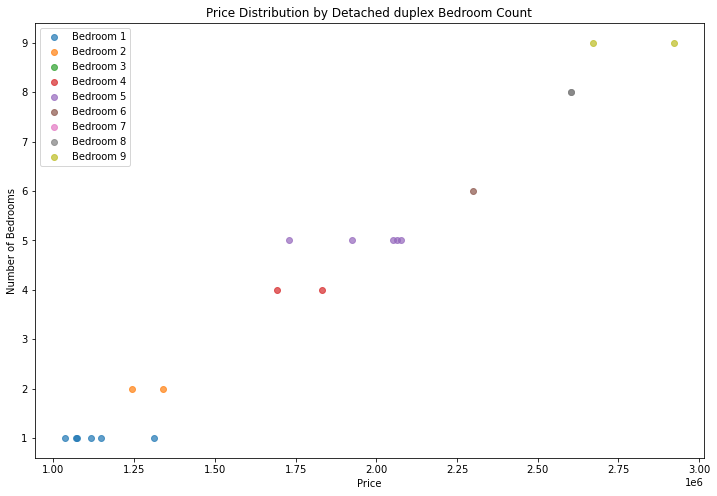



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  25.00000  23.00000      26.00000       30.00000
mean    4.68000   2.56522       3.61538  1307904.27928
std     2.42762   2.08514       1.55118   407276.62474
min     1.00000   1.00000       1.00000   723732.51620
25%     3.00000   1.00000       3.00000   994068.74755
50%     4.00000   2.00000       4.00000  1217831.11050
75%     7.00000   3.00000       5.00000  1675151.34850
max     9.00000   7.00000       6.00000  2167935.76900


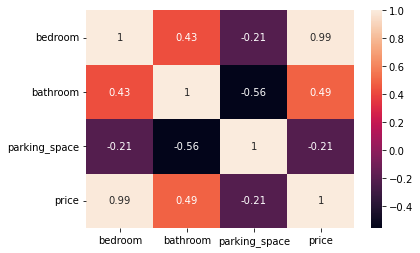

        loc      title  bedroom  bathroom  parking_space      price
222    Abia  Apartment     1.00      2.00           3.00  723732.52
12254  Abia  Apartment     1.00       NaN           4.00  835605.66
13542  Abia  Apartment     1.00      1.00           4.00  777228.86
9120   Abia  Apartment     2.00      1.00           3.00  915546.72
8506   Abia  Apartment     3.00      1.00            NaN 1008235.82
62     Abia  Apartment     3.00       NaN           4.00 1052994.71
12419  Abia  Apartment     3.00      2.00           3.00  989346.39
2559   Abia  Apartment     3.00      1.00           3.00  967604.50
10539  Abia  Apartment     3.00      5.00            NaN 1077121.62
12664  Abia  Apartment     4.00       NaN           6.00 1321733.86
1350   Abia  Apartment     4.00      2.00           4.00 1208435.91
1691   Abia  Apartment     4.00      1.00           4.00 1162262.72
5335   Abia  Apartment     4.00       NaN           6.00 1345716.96
7861   Abia  Apartment     4.00      1.00       

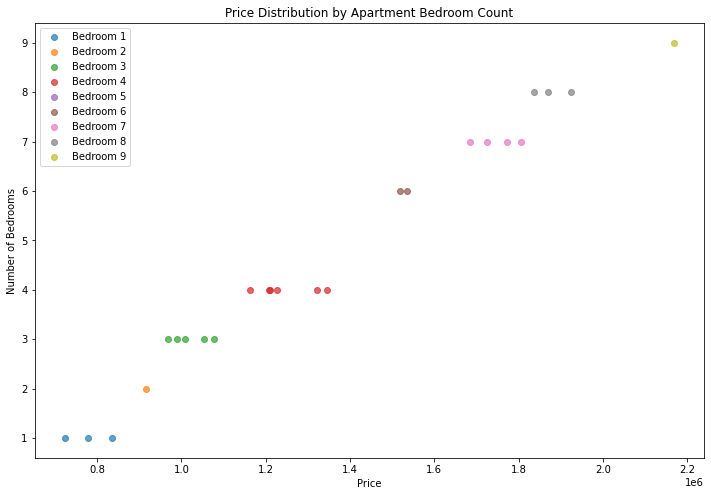



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  24.00000  22.00000      26.00000       29.00000
mean    3.75000   3.68182       3.50000  1380415.81201
std     2.09035   2.19059       1.52971   446405.43366
min     1.00000   1.00000       1.00000   833306.08690
25%     2.00000   2.00000       2.00000   983289.04350
50%     4.00000   3.50000       4.00000  1341706.76000
75%     5.00000   6.00000       5.00000  1721133.53000
max     8.00000   7.00000       6.00000  2389565.76100


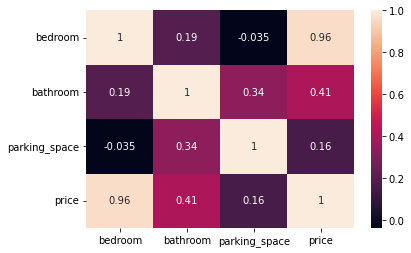

        loc     title  bedroom  bathroom  parking_space      price
12919  Abia  Bungalow     1.00      6.00           4.00  945027.75
11100  Abia  Bungalow     1.00      1.00           4.00  833306.09
3838   Abia  Bungalow     1.00      6.00            NaN  926809.71
13099  Abia  Bungalow     1.00       NaN           4.00  862800.02
1806   Abia  Bungalow     2.00      2.00           5.00 1016572.18
8701   Abia  Bungalow     2.00      1.00           3.00  951410.81
5189   Abia  Bungalow     2.00      1.00           5.00  989162.93
6274   Abia  Bungalow     2.00       NaN           2.00  874413.68
6829   Abia  Bungalow     3.00      6.00           4.00 1277861.43
2480   Abia  Bungalow     3.00      2.00           2.00 1131788.36
2912   Abia  Bungalow     3.00      7.00           6.00 1341706.76
10179  Abia  Bungalow     4.00      3.00           4.00 1370298.14
1133   Abia  Bungalow     4.00      2.00           1.00 1201370.92
4505   Abia  Bungalow     4.00      7.00            NaN 147993

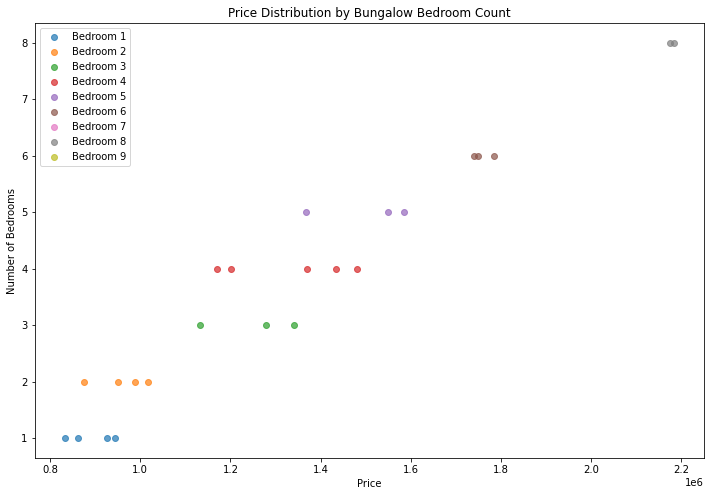



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  23.00000  22.00000      25.00000       28.00000
mean    4.73913   3.40909       3.80000  1530552.13427
std     2.70046   2.01563       1.73205   495318.29883
min     1.00000   1.00000       1.00000   830608.51590
25%     2.50000   1.25000       2.00000  1147708.60300
50%     4.00000   3.50000       4.00000  1370162.71050
75%     7.00000   4.75000       5.00000  1948520.28050
max     9.00000   7.00000       6.00000  2407783.80400


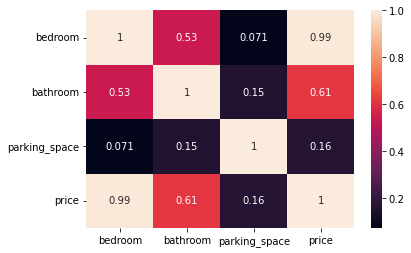

        loc title  bedroom  bathroom  parking_space      price
5315   Abia  Flat     1.00      1.00           4.00  830608.52
6740   Abia  Flat     1.00      4.00           5.00  908427.30
13469  Abia  Flat     2.00       NaN           4.00 1007519.68
4142   Abia  Flat     2.00      1.00           2.00  939044.40
8873   Abia  Flat     2.00      5.00            NaN 1080581.87
6044   Abia  Flat     2.00       NaN           2.00  900386.64
8827   Abia  Flat     3.00      1.00           5.00 1159033.24
107    Abia  Flat     3.00       NaN           3.00 1150006.40
4185   Abia  Flat     3.00      7.00            NaN 1268834.59
7469   Abia  Flat     3.00      1.00           4.00 1140815.20
12759  Abia  Flat     4.00      3.00           5.00 1388516.18
7914   Abia  Flat     4.00       NaN           6.00 1516371.20
8911   Abia  Flat     4.00      2.00           2.00 1158370.19
6831   Abia  Flat     5.00      4.00           6.00 1612536.90
6781   Abia  Flat     7.00       NaN           4.00 188

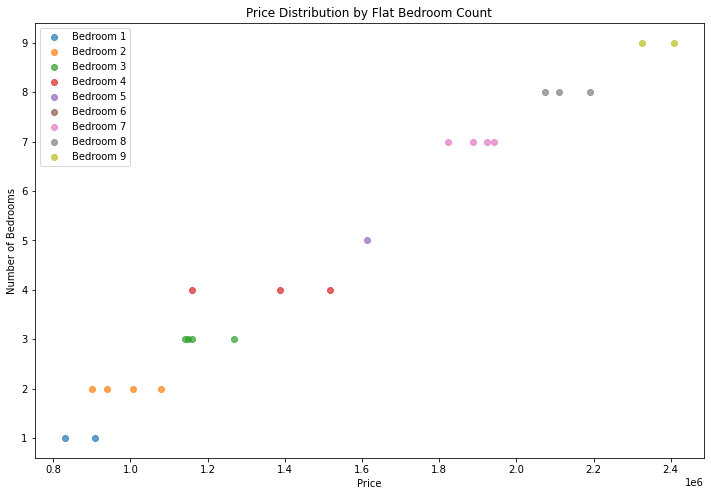



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  21.00000  21.00000      22.00000       24.00000
mean    3.47619   2.76190       3.27273  1358023.48981
std     1.43593   2.04707       1.77769   337058.90622
min     1.00000   1.00000       1.00000   827581.44760
25%     2.00000   1.00000       2.00000  1082216.46450
50%     3.00000   2.00000       3.50000  1318435.80000
75%     4.00000   3.00000       4.75000  1596432.64425
max     6.00000   7.00000       6.00000  2011581.46200


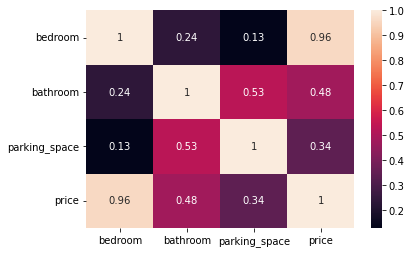

        loc           title  bedroom  bathroom  parking_space      price
5932   Abia  Terrace duplex     1.00      1.00           1.00  827581.45
662    Abia  Terrace duplex     2.00      1.00           5.00 1093487.63
795    Abia  Terrace duplex     2.00      1.00           2.00 1040363.84
10085  Abia  Terrace duplex     2.00      2.00           4.00 1048402.97
2408   Abia  Terrace duplex     2.00       NaN           4.00 1033778.37
9802   Abia  Terrace duplex     2.00      2.00           4.00 1099087.95
14     Abia  Terrace duplex     3.00      3.00           3.00 1293794.28
9910   Abia  Terrace duplex     3.00      2.00           4.00 1257296.10
2319   Abia  Terrace duplex     3.00       NaN           1.00 1314474.49
2519   Abia  Terrace duplex     3.00      5.00           2.00 1334969.79
12003  Abia  Terrace duplex     3.00      3.00           4.00 1314289.58
10513  Abia  Terrace duplex     4.00      1.00           2.00 1326768.60
10008  Abia  Terrace duplex     4.00      7.00     

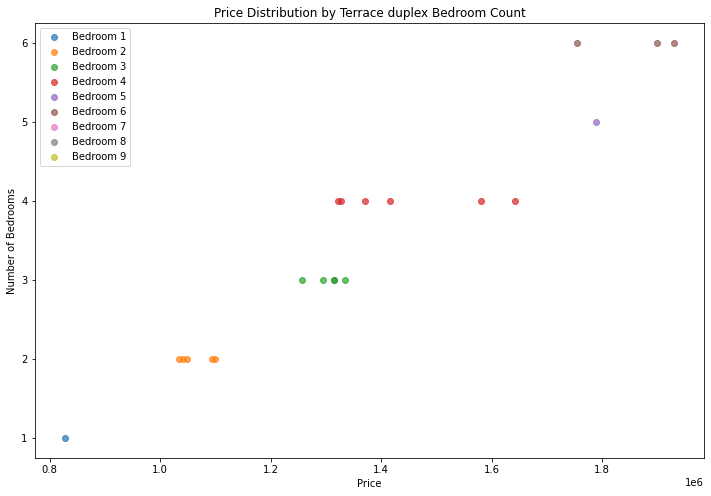



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  27.00000  24.00000      24.00000       30.00000
mean    4.07407   2.83333       3.16667  1461483.22784
std     2.21752   2.21981       1.40393   453977.09866
min     1.00000   1.00000       1.00000   869300.47640
25%     2.00000   1.00000       2.75000  1084479.34625
50%     4.00000   2.00000       3.00000  1401422.27450
75%     5.50000   5.25000       4.00000  1747700.01475
max     9.00000   7.00000       6.00000  2558818.88200


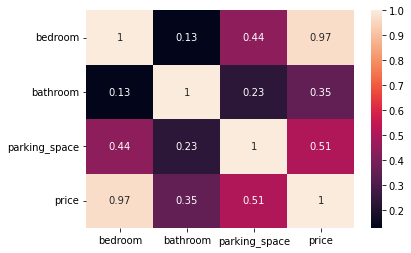

        loc                 title  bedroom  bathroom  parking_space      price
10460  Abia  Semi-detached duplex     1.00      1.00            NaN  869300.48
8397   Abia  Semi-detached duplex     1.00       NaN           1.00  920913.39
6198   Abia  Semi-detached duplex     2.00      6.00           1.00 1165683.45
5148   Abia  Semi-detached duplex     2.00      2.00            NaN 1097929.79
6726   Abia  Semi-detached duplex     2.00      1.00           4.00 1079995.87
12127  Abia  Semi-detached duplex     2.00      1.00            NaN 1077581.65
12235  Abia  Semi-detached duplex     2.00      1.00           1.00  950094.90
3152   Abia  Semi-detached duplex     2.00      1.00           3.00 1052497.03
5578   Abia  Semi-detached duplex     3.00      5.00           3.00 1355465.09
13349  Abia  Semi-detached duplex     3.00       NaN           4.00 1406795.79
6779   Abia  Semi-detached duplex     3.00      7.00           4.00 1437631.19
7334   Abia  Semi-detached duplex     3.00       NaN

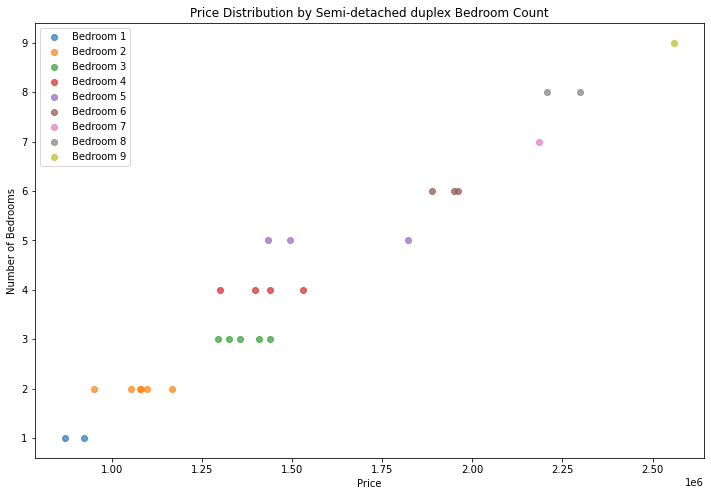



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  30.00000  29.00000      28.00000       36.00000
mean    4.26667   3.13793       3.53571  1677803.61767
std     2.72831   2.16670       1.47779   538496.63279
min     1.00000   1.00000       1.00000   947019.04040
25%     2.00000   1.00000       2.75000  1191583.35075
50%     3.50000   3.00000       3.00000  1592812.44150
75%     7.00000   4.00000       4.25000  2121244.49525
max     9.00000   7.00000       6.00000  2700539.48300


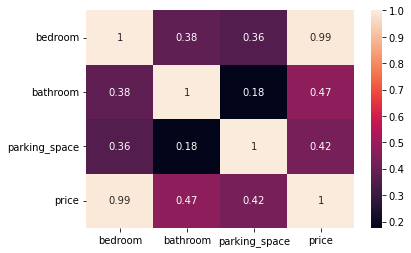

        loc      title  bedroom  bathroom  parking_space      price
2278   Abia  Townhouse     1.00       NaN           3.00 1066649.29
13441  Abia  Townhouse     1.00       NaN           2.00 1049803.71
4036   Abia  Townhouse     1.00       NaN           4.00  997772.43
4440   Abia  Townhouse     1.00      1.00            NaN  947019.04
11777  Abia  Townhouse     1.00      1.00           4.00 1047969.41
10619  Abia  Townhouse     2.00      7.00            NaN 1312291.46
9827   Abia  Townhouse     2.00       NaN           4.00 1170476.07
4348   Abia  Townhouse     2.00      2.00            NaN 1242814.95
4500   Abia  Townhouse     2.00      1.00           2.00 1060825.45
7500   Abia  Townhouse     2.00      1.00           1.00 1095364.53
11947  Abia  Townhouse     2.00       NaN           3.00 1198619.11
651    Abia  Townhouse     3.00      4.00           3.00 1444434.48
10661  Abia  Townhouse     3.00      1.00           6.00 1409967.46
4963   Abia  Townhouse     3.00      2.00       

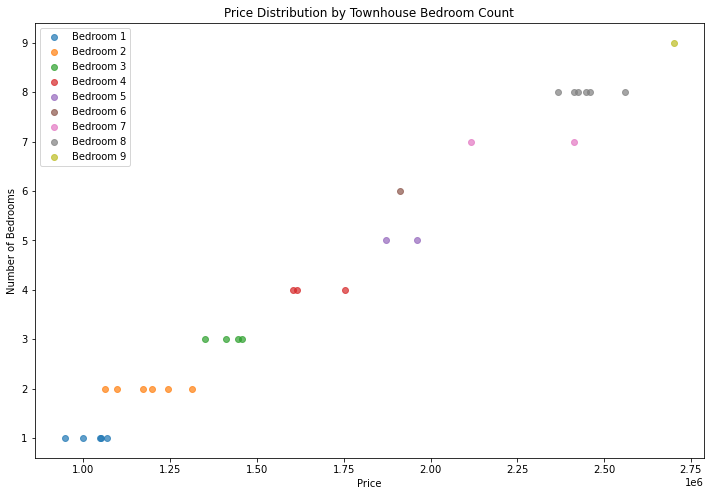



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  29.00000  27.00000      27.00000       32.00000
mean    4.51724   3.59259       3.85185  2167290.34594
std     2.47301   2.08030       1.61015   575851.48056
min     1.00000   1.00000       1.00000  1284373.78500
25%     3.00000   2.00000       2.50000  1739139.35950
50%     4.00000   3.00000       4.00000  2096340.99400
75%     6.00000   5.50000       5.00000  2631950.57225
max     9.00000   7.00000       6.00000  3367912.17000


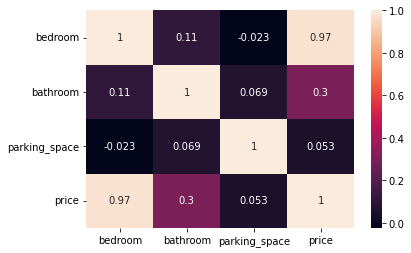

        loc      title  bedroom  bathroom  parking_space      price
569    Abia  Penthouse     1.00      7.00           2.00 1477469.59
12624  Abia  Penthouse     1.00      3.00           5.00 1388122.45
7613   Abia  Penthouse     1.00      6.00           6.00 1551346.84
4789   Abia  Penthouse     1.00      2.00           2.00 1487582.13
3993   Abia  Penthouse     1.00      2.00            NaN 1342484.43
6270   Abia  Penthouse     2.00      1.00           6.00 1540390.75
2835   Abia  Penthouse     2.00      2.00            NaN 1589818.00
5257   Abia  Penthouse     3.00       NaN           2.00 1863324.58
5270   Abia  Penthouse     3.00       NaN           5.00 1952137.54
3477   Abia  Penthouse     3.00      3.00           4.00 1788913.15
4136   Abia  Penthouse     4.00       NaN           4.00 1879042.65
2006   Abia  Penthouse     4.00      1.00           4.00 1859562.35
2096   Abia  Penthouse     4.00       NaN           6.00 2071566.90
13705  Abia  Penthouse     4.00      3.00       

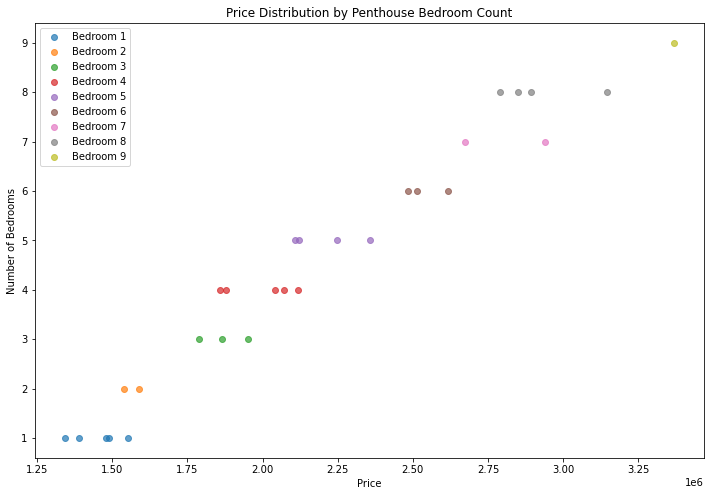



Analyzing Cottage data:
        bedroom bathroom parking_space          price
count  11.00000  9.00000      10.00000       11.00000
mean    2.63636  1.33333       1.90000   924151.90512
std     1.36182  0.50000       0.87560   262260.11040
min     1.00000  1.00000       1.00000   606196.43050
25%     1.50000  1.00000       1.00000   758221.11215
50%     3.00000  1.00000       2.00000   929051.64690
75%     3.50000  2.00000       2.75000  1011317.52220
max     5.00000  2.00000       3.00000  1508207.86600


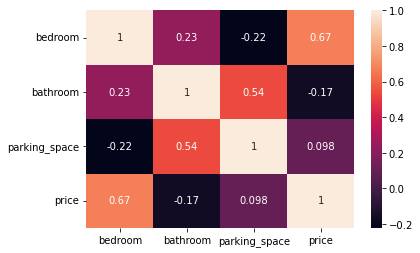

        loc    title  bedroom  bathroom  parking_space      price
9973   Abia  Cottage     1.00      1.00           2.00  615762.12
10636  Abia  Cottage     1.00       NaN           1.00  929051.65
13570  Abia  Cottage     1.00      2.00           3.00  606196.43
1343   Abia  Cottage     2.00      1.00           1.00  682943.33
5399   Abia  Cottage     2.00      1.00           3.00 1027290.01
2273   Abia  Cottage     3.00      1.00           2.00 1169869.53
8894   Abia  Cottage     3.00      1.00           1.00  833498.90
11676  Abia  Cottage     3.00      2.00           3.00  840936.49
1046   Abia  Cottage     4.00      1.00            NaN  995345.04
10142  Abia  Cottage     4.00      2.00           2.00  956569.61
10617  Abia  Cottage     5.00       NaN           1.00 1508207.87


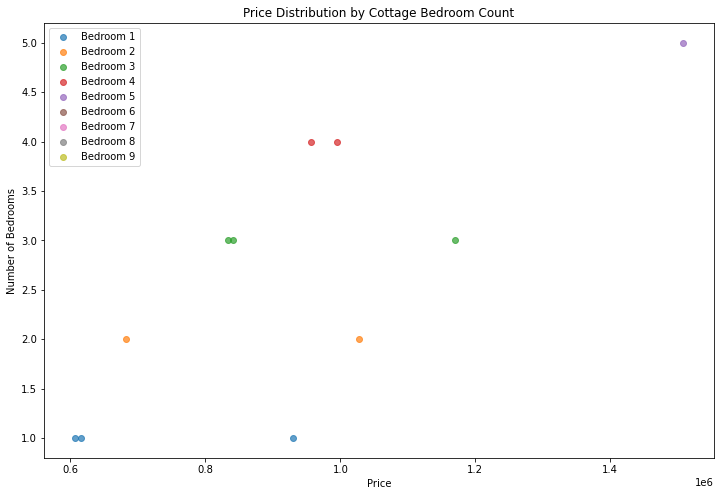

In [274]:
# Abia
Abia = housing_train[housing_train["loc" ] == "Abia"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Abia, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  21.00000  25.00000      26.00000       29.00000
mean    4.09524   2.72000       2.50000  2534999.68443
std     2.50808   1.67133       1.50333  1056668.83053
min     1.00000   1.00000       1.00000   993063.26150
25%     2.00000   2.00000       1.25000  1530818.29800
50%     4.00000   2.00000       2.00000  2544506.70700
75%     5.00000   4.00000       3.00000  3270401.52500
max     9.00000   6.00000       6.00000  4303726.95900


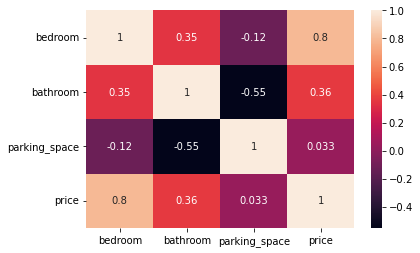

          loc    title  bedroom  bathroom  parking_space      price
9418   Ebonyi  Mansion     1.00      2.00            NaN 2900498.95
3823   Ebonyi  Mansion     1.00      2.00            NaN 1101502.01
7776   Ebonyi  Mansion     1.00      1.00           4.00 2747757.86
9565   Ebonyi  Mansion     2.00      3.00           6.00 2310196.40
7844   Ebonyi  Mansion     2.00      2.00           2.00 1205351.64
7800   Ebonyi  Mansion     2.00      6.00           1.00 2289148.03
4420   Ebonyi  Mansion     2.00      1.00           2.00 1220907.53
11282  Ebonyi  Mansion     2.00      2.00            NaN 1235297.70
1988   Ebonyi  Mansion     3.00       NaN           1.00 2436141.90
673    Ebonyi  Mansion     4.00      2.00           2.00 1503257.33
7148   Ebonyi  Mansion     4.00      2.00           2.00 1608566.39
3637   Ebonyi  Mansion     4.00       NaN           3.00 1530818.30
7600   Ebonyi  Mansion     5.00      2.00           1.00 2873640.81
4703   Ebonyi  Mansion     5.00      2.00       

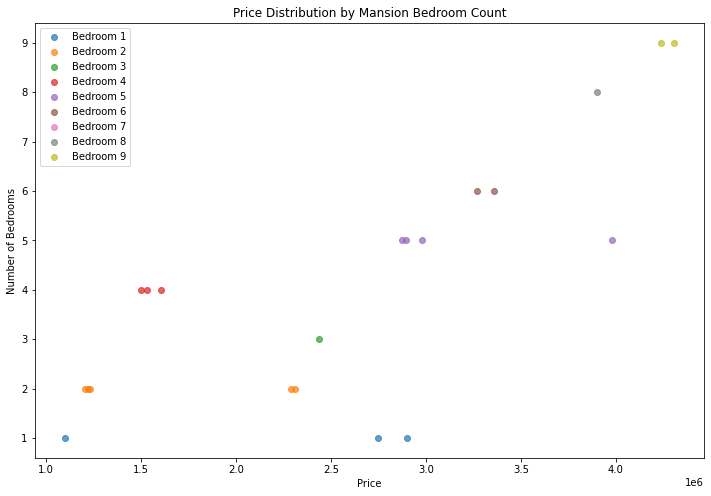



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  24.00000  22.00000      25.00000       28.00000
mean    3.79167   3.04545       3.08000  1749438.91036
std     2.50181   1.96341       1.52534   571005.38617
min     1.00000   1.00000       1.00000  1054273.49400
25%     2.00000   1.00000       2.00000  1355305.52850
50%     3.00000   2.50000       3.00000  1520119.60250
75%     4.50000   4.75000       4.00000  2202199.03275
max     9.00000   7.00000       5.00000  2795648.26000


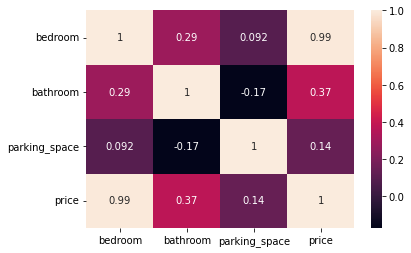

          loc            title  bedroom  bathroom  parking_space      price
9316   Ebonyi  Detached duplex     1.00      1.00           3.00 1063622.21
4540   Ebonyi  Detached duplex     1.00       NaN           4.00 1054273.49
8205   Ebonyi  Detached duplex     2.00      2.00           3.00 1356253.16
8445   Ebonyi  Detached duplex     2.00       NaN           1.00 1203185.15
4407   Ebonyi  Detached duplex     2.00      4.00           5.00 1415200.17
4891   Ebonyi  Detached duplex     2.00      3.00           4.00 1352462.65
12079  Ebonyi  Detached duplex     2.00      1.00           3.00 1213497.82
460    Ebonyi  Detached duplex     2.00      2.00           1.00 1178802.43
3211   Ebonyi  Detached duplex     2.00      5.00            NaN 1477937.69
1309   Ebonyi  Detached duplex     3.00       NaN           4.00 1702352.22
874    Ebonyi  Detached duplex     3.00      6.00            NaN 1614564.89
9918   Ebonyi  Detached duplex     3.00      1.00           2.00 1426126.32
5337   Ebony

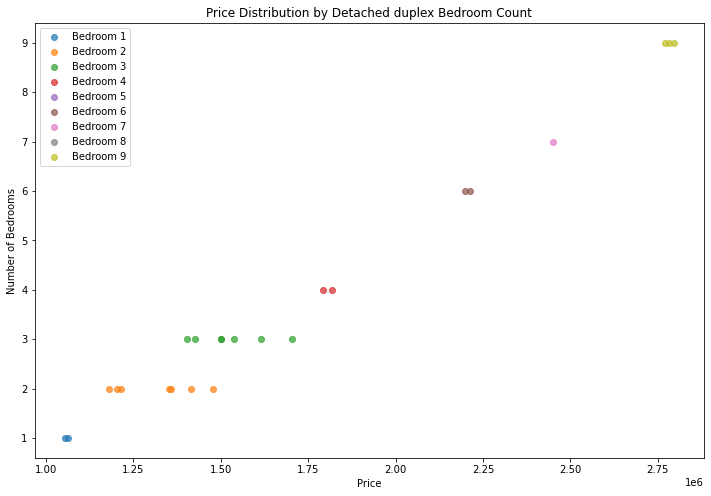



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  28.00000  28.00000      26.00000       32.00000
mean    3.96429   3.14286       3.26923  1214168.42789
std     2.60316   2.04965       1.80128   437943.21044
min     1.00000   1.00000       1.00000   683808.63910
25%     1.00000   1.75000       2.00000   810474.68145
50%     3.50000   2.00000       3.00000  1122351.96000
75%     6.00000   5.00000       4.00000  1513445.25775
max     9.00000   7.00000       6.00000  2191775.04000


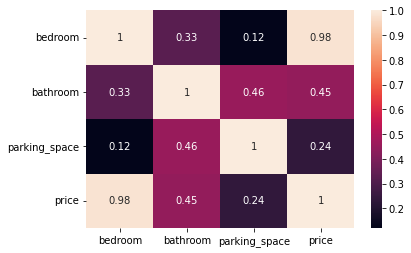

          loc      title  bedroom  bathroom  parking_space      price
13790  Ebonyi  Apartment     1.00      1.00           1.00  768676.81
10372  Ebonyi  Apartment     1.00       NaN           2.00  820911.67
5494   Ebonyi  Apartment     1.00       NaN           2.00  683808.64
11019  Ebonyi  Apartment     1.00      2.00            NaN  782378.33
3554   Ebonyi  Apartment     1.00      2.00           3.00  764388.55
4678   Ebonyi  Apartment     1.00      1.00           4.00  817128.34
1568   Ebonyi  Apartment     1.00       NaN           4.00  815453.59
11510  Ebonyi  Apartment     1.00      3.00           6.00  795537.97
2659   Ebonyi  Apartment     1.00      4.00           2.00  755757.91
4120   Ebonyi  Apartment     3.00      1.00           2.00  964448.73
8609   Ebonyi  Apartment     3.00      6.00           2.00 1117045.50
11244  Ebonyi  Apartment     3.00      1.00            NaN 1044191.50
9934   Ebonyi  Apartment     3.00      2.00            NaN 1033246.07
9359   Ebonyi  Apart

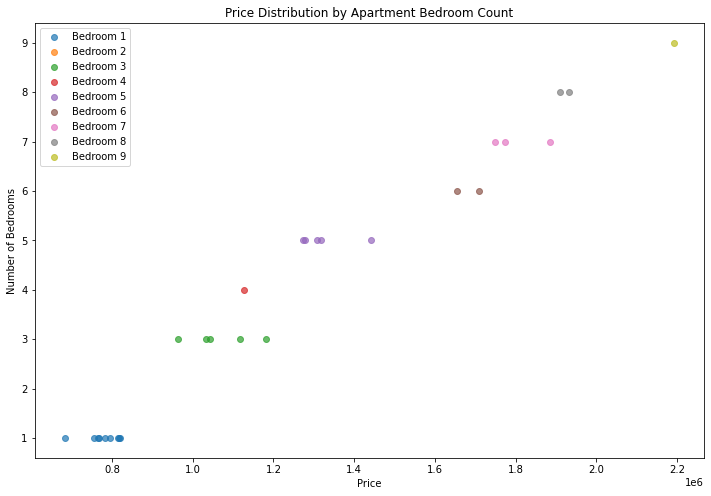



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  30.00000  27.00000      25.00000       32.00000
mean    4.10000   3.29630       3.04000  1360796.67784
std     2.21826   2.21559       1.48549   427330.55908
min     1.00000   1.00000       1.00000   756828.24210
25%     2.00000   1.50000       2.00000  1008283.03440
50%     4.00000   2.00000       3.00000  1317044.74650
75%     5.00000   5.50000       4.00000  1573926.28850
max     9.00000   7.00000       6.00000  2407783.80400


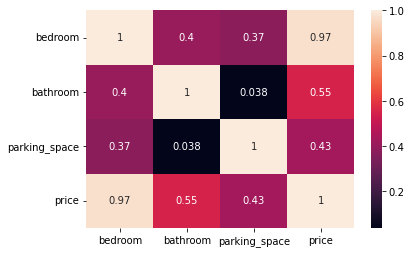

          loc     title  bedroom  bathroom  parking_space      price
2009   Ebonyi  Bungalow     1.00      2.00            NaN  756828.24
2979   Ebonyi  Bungalow     1.00       NaN           1.00  760966.97
8867   Ebonyi  Bungalow     2.00       NaN           2.00  989327.30
8470   Ebonyi  Bungalow     2.00      2.00           4.00 1033544.33
1836   Ebonyi  Bungalow     2.00      2.00           4.00  998354.13
8146   Ebonyi  Bungalow     2.00      1.00           5.00  989162.93
6110   Ebonyi  Bungalow     2.00      1.00           1.00  952045.22
5709   Ebonyi  Bungalow     2.00      2.00            NaN  928095.42
3876   Ebonyi  Bungalow     2.00       NaN           2.00  961918.05
8440   Ebonyi  Bungalow     3.00      1.00           3.00 1011592.67
5181   Ebonyi  Bungalow     3.00       NaN           4.00 1195633.69
3928   Ebonyi  Bungalow     3.00      2.00           1.00 1078867.36
2864   Ebonyi  Bungalow     3.00      1.00            NaN 1086161.07
3691   Ebonyi  Bungalow     3.00  

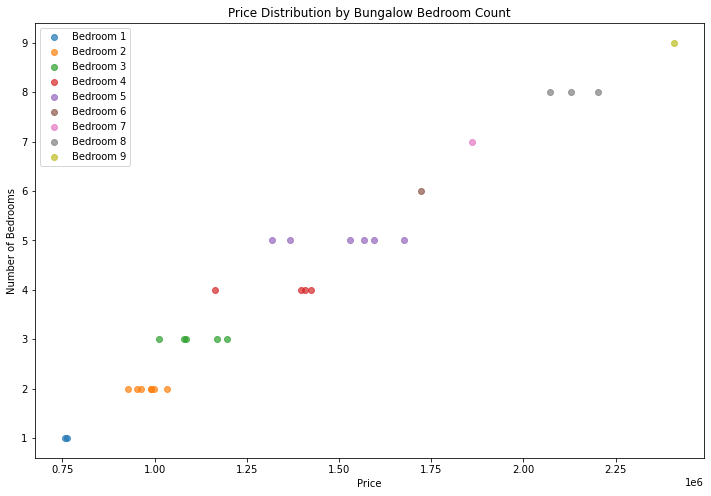



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  30.00000  30.00000      29.00000       37.00000
mean    4.66667   3.33333       2.75862  1450139.83788
std     2.39732   2.00574       1.37983   435149.25143
min     1.00000   1.00000       1.00000   835390.76990
25%     3.00000   2.00000       2.00000  1071790.57100
50%     5.00000   3.00000       3.00000  1362763.32500
75%     7.00000   5.00000       4.00000  1832195.35000
max     9.00000   7.00000       5.00000  2344102.83800


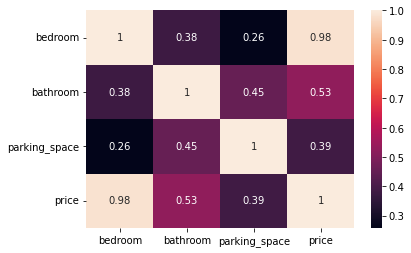

          loc title  bedroom  bathroom  parking_space      price
8131   Ebonyi  Flat     1.00       NaN           5.00  935836.55
7951   Ebonyi  Flat     1.00      2.00            NaN  837523.47
12836  Ebonyi  Flat     1.00       NaN           4.00  835390.77
10953  Ebonyi  Flat     1.00      5.00            NaN  917618.51
3030   Ebonyi  Flat     2.00      1.00           1.00  927705.94
5325   Ebonyi  Flat     3.00       NaN           3.00 1232234.14
8393   Ebonyi  Flat     3.00      2.00           2.00 1131788.36
714    Ebonyi  Flat     3.00      1.00            NaN 1056492.84
3110   Ebonyi  Flat     3.00      5.00           5.00 1268670.23
4084   Ebonyi  Flat     3.00      1.00           1.00 1071790.57
9723   Ebonyi  Flat     3.00      6.00           3.00 1259643.39
5338   Ebonyi  Flat     3.00      1.00           1.00 1042682.89
42     Ebonyi  Flat     4.00      2.00           1.00 1167521.16
11304  Ebonyi  Flat     4.00      3.00           2.00 1333862.05
7485   Ebonyi  Flat     5

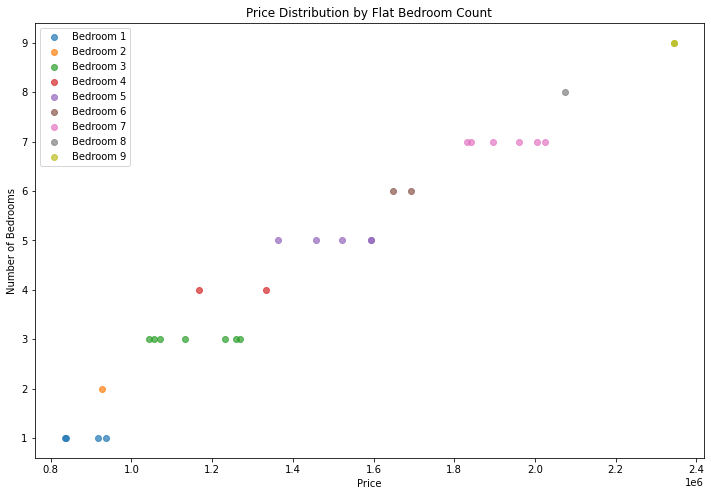



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  21.00000  19.00000      20.00000       23.00000
mean    3.04762   3.00000       3.80000  1381161.38953
std     1.96153   2.13437       1.70448   441382.29910
min     1.00000   1.00000       1.00000   929975.93720
25%     2.00000   1.00000       2.00000  1082607.13500
50%     2.00000   2.00000       4.00000  1242732.38900
75%     4.00000   4.50000       5.00000  1493540.10800
max     8.00000   7.00000       6.00000  2507303.27200


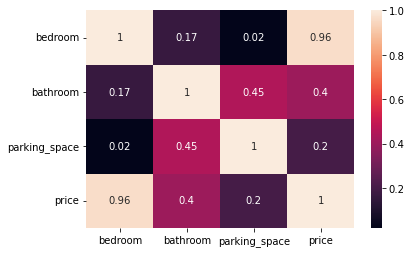

          loc           title  bedroom  bathroom  parking_space      price
6937   Ebonyi  Terrace duplex     1.00      7.00           6.00 1126275.84
11667  Ebonyi  Terrace duplex     1.00      2.00           1.00  929975.94
11648  Ebonyi  Terrace duplex     1.00      1.00           6.00  941263.43
7407   Ebonyi  Terrace duplex     1.00       NaN           4.00 1085285.25
10527  Ebonyi  Terrace duplex     2.00      7.00           5.00 1278500.04
7140   Ebonyi  Terrace duplex     2.00      1.00           2.00 1032001.74
6420   Ebonyi  Terrace duplex     2.00       NaN           3.00 1079929.02
3646   Ebonyi  Terrace duplex     2.00      1.00           2.00 1003551.06
5289   Ebonyi  Terrace duplex     2.00      4.00           5.00 1185993.83
5279   Ebonyi  Terrace duplex     2.00      4.00           5.00 1185993.83
4954   Ebonyi  Terrace duplex     2.00       NaN           3.00 1042051.31
7125   Ebonyi  Terrace duplex     3.00      2.00           4.00 1283454.18
10351  Ebonyi  Terrace du

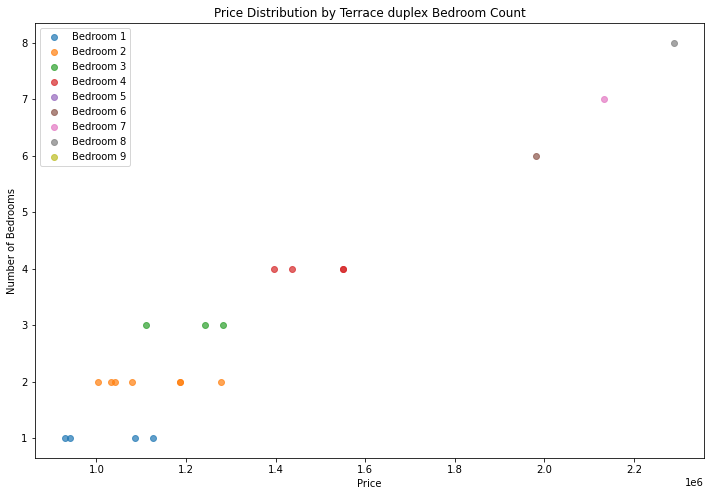



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  21.00000  26.00000      30.00000       31.00000
mean    3.47619   2.84615       3.16667  1426072.84335
std     1.96517   2.11078       1.55549   415232.27291
min     1.00000   1.00000       1.00000   900457.74580
25%     2.00000   1.00000       2.00000  1130469.48800
50%     4.00000   2.00000       3.00000  1324873.85200
75%     5.00000   4.50000       4.00000  1746559.19700
max     7.00000   7.00000       6.00000  2329953.72100


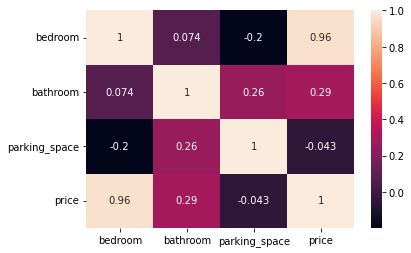

          loc                 title  bedroom  bathroom  parking_space  \
357    Ebonyi  Semi-detached duplex     1.00      7.00           6.00   
591    Ebonyi  Semi-detached duplex     1.00      5.00           5.00   
7480   Ebonyi  Semi-detached duplex     1.00      2.00           4.00   
5021   Ebonyi  Semi-detached duplex     1.00      3.00           1.00   
4859   Ebonyi  Semi-detached duplex     1.00      1.00           4.00   
8360   Ebonyi  Semi-detached duplex     2.00      2.00           2.00   
7873   Ebonyi  Semi-detached duplex     2.00      3.00           4.00   
7403   Ebonyi  Semi-detached duplex     2.00       NaN           4.00   
2130   Ebonyi  Semi-detached duplex     3.00      2.00           2.00   
4095   Ebonyi  Semi-detached duplex     3.00      2.00           4.00   
6305   Ebonyi  Semi-detached duplex     4.00      1.00           3.00   
12392  Ebonyi  Semi-detached duplex     4.00       NaN           2.00   
1708   Ebonyi  Semi-detached duplex     4.00      1

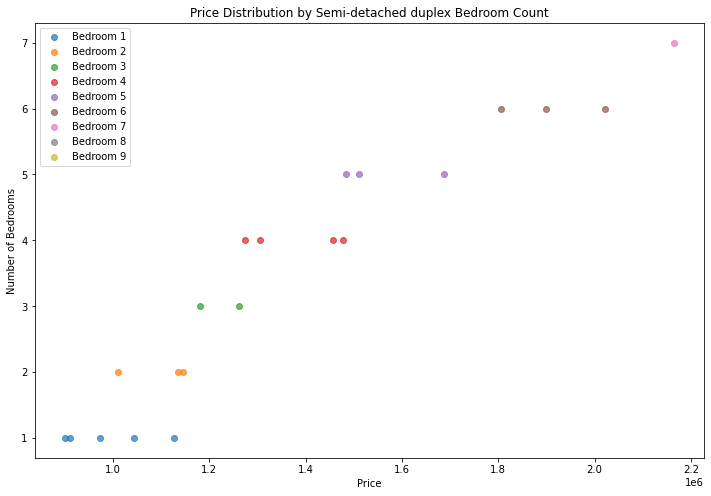



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  29.00000  26.00000      30.00000       32.00000
mean    4.58621   2.57692       3.00000  1650354.95255
std     2.14671   1.77027       1.83829   466446.85181
min     1.00000   1.00000       1.00000   988804.71050
25%     3.00000   1.00000       1.00000  1228843.71075
50%     4.00000   2.00000       3.00000  1500856.44650
75%     6.00000   3.00000       4.00000  2111714.21225
max     9.00000   6.00000       6.00000  2620527.36300


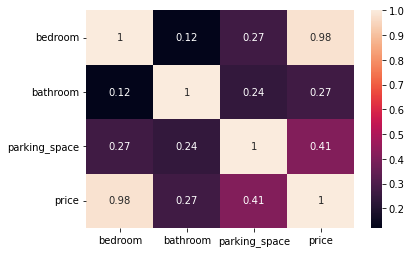

          loc      title  bedroom  bathroom  parking_space      price
6190   Ebonyi  Townhouse     1.00      1.00           3.00  988804.71
6050   Ebonyi  Townhouse     1.00       NaN           6.00 1175155.48
1821   Ebonyi  Townhouse     2.00      2.00           2.00 1129259.64
2024   Ebonyi  Townhouse     2.00       NaN           2.00 1170412.55
6069   Ebonyi  Townhouse     3.00      1.00           5.00 1387194.91
2215   Ebonyi  Townhouse     3.00      2.00           1.00 1319455.72
2859   Ebonyi  Townhouse     3.00       NaN           1.00 1182313.73
7833   Ebonyi  Townhouse     3.00      1.00           1.00 1234937.63
4850   Ebonyi  Townhouse     3.00      2.00           1.00 1292001.04
13874  Ebonyi  Townhouse     4.00      2.00            NaN 1505169.10
8055   Ebonyi  Townhouse     4.00      4.00           6.00 1706928.85
3107   Ebonyi  Townhouse     4.00      2.00           3.00 1570088.07
8396   Ebonyi  Townhouse     4.00      2.00           1.00 1432941.23
11967  Ebonyi  Townh

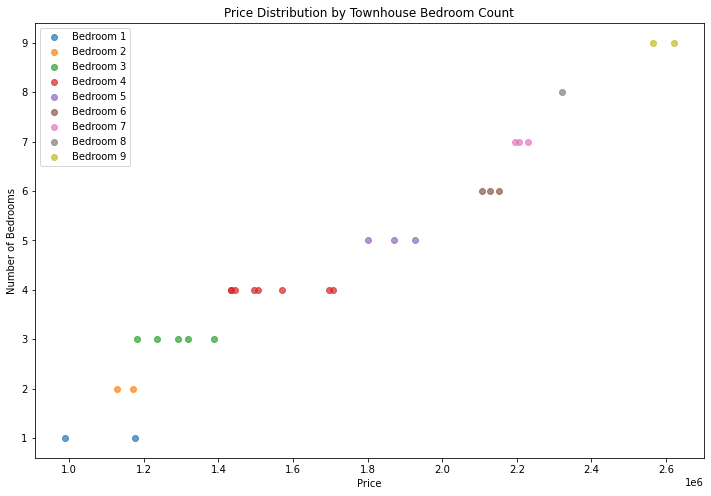



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  35.00000  31.00000      36.00000       41.00000
mean    4.51429   3.16129       3.30556  2127816.26739
std     2.54803   2.20751       1.70410   567843.05511
min     1.00000   1.00000       1.00000  1305631.15800
25%     2.00000   1.00000       1.75000  1706464.46300
50%     5.00000   2.00000       3.50000  2115336.70600
75%     7.00000   5.50000       5.00000  2432361.07600
max     9.00000   7.00000       6.00000  3323639.23900


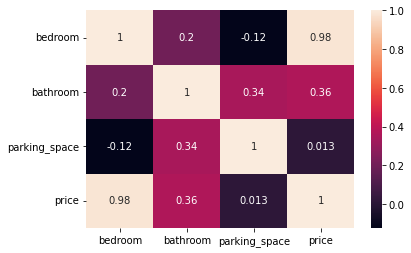

          loc      title  bedroom  bathroom  parking_space      price
6220   Ebonyi  Penthouse     1.00      1.00           4.00 1348050.33
4296   Ebonyi  Penthouse     1.00      1.00            NaN 1305631.16
10809  Ebonyi  Penthouse     1.00       NaN           1.00 1314245.20
6175   Ebonyi  Penthouse     2.00      1.00           1.00 1588762.67
586    Ebonyi  Penthouse     2.00      6.00           5.00 1733486.55
1498   Ebonyi  Penthouse     2.00      2.00           3.00 1706464.46
7450   Ebonyi  Penthouse     2.00      1.00           4.00 1572135.61
11998  Ebonyi  Penthouse     2.00       NaN           5.00 1778026.58
4373   Ebonyi  Penthouse     2.00      7.00           4.00 1748422.26
4102   Ebonyi  Penthouse     2.00      3.00           6.00 1629470.80
8204   Ebonyi  Penthouse     2.00       NaN           4.00 1593912.32
7186   Ebonyi  Penthouse     3.00      1.00           3.00 1732486.80
690    Ebonyi  Penthouse     3.00      6.00           3.00 1892928.90
1477   Ebonyi  Penth

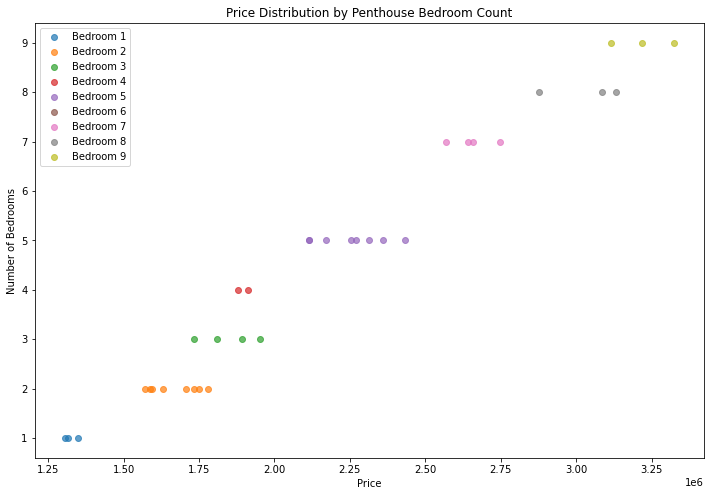



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  11.00000  12.00000      11.00000       13.00000
mean    3.54545   1.50000       2.00000  1042443.65298
std     1.29334   0.52223       1.09545   217917.45867
min     1.00000   1.00000       1.00000   691748.01500
25%     3.00000   1.00000       1.00000   901395.82620
50%     4.00000   1.50000       2.00000  1087627.95300
75%     4.50000   2.00000       3.00000  1204878.62900
max     5.00000   2.00000       4.00000  1333008.74600


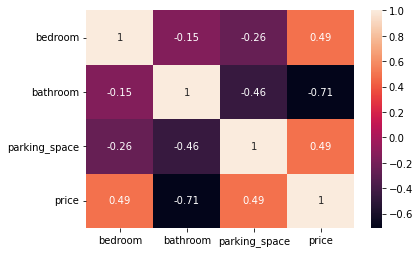

          loc    title  bedroom  bathroom  parking_space      price
5649   Ebonyi  Cottage     1.00       NaN           3.00  901395.83
7414   Ebonyi  Cottage     2.00      2.00           1.00  691748.02
1888   Ebonyi  Cottage     3.00      2.00           2.00  825788.35
9873   Ebonyi  Cottage     3.00      1.00           4.00 1204576.70
11111  Ebonyi  Cottage     3.00      2.00           3.00 1204878.63
1005   Ebonyi  Cottage     4.00      1.00           1.00 1278151.58
2399   Ebonyi  Cottage     4.00      1.00           3.00 1267856.59
5948   Ebonyi  Cottage     4.00      2.00           1.00  913701.05
226    Ebonyi  Cottage     5.00      2.00           1.00 1087627.95
487    Ebonyi  Cottage     5.00      1.00            NaN 1052253.23
6224   Ebonyi  Cottage     5.00      1.00            NaN 1088526.95
148    Ebonyi  Cottage      NaN      2.00           1.00  702253.90
4114   Ebonyi  Cottage      NaN      1.00           2.00 1333008.75


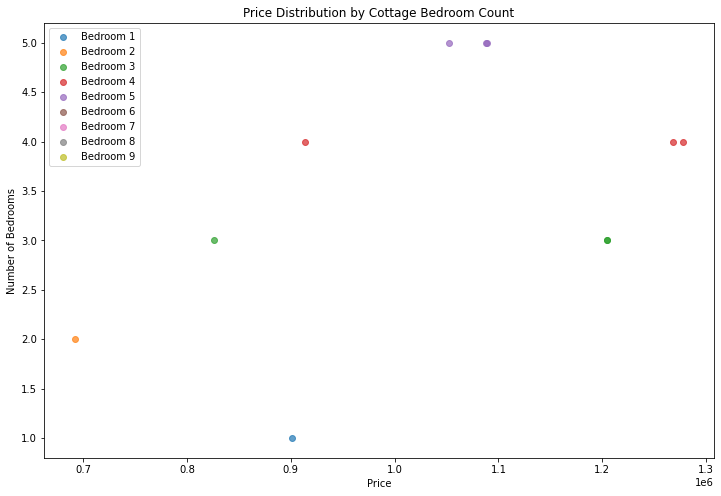

In [275]:
# Ebonyi
Ebonyi = housing_train[housing_train["loc" ] == "Ebonyi"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Ebonyi, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  25.00000  28.00000      28.00000       31.00000
mean    3.92000   3.00000       3.50000  2876266.85687
std     1.84662   2.17732       1.55158   678090.07926
min     1.00000   1.00000       1.00000  1341750.86700
25%     3.00000   1.00000       2.00000  2535716.36400
50%     4.00000   2.00000       3.00000  2847927.36800
75%     4.00000   4.00000       5.00000  3332472.06950
max     9.00000   7.00000       6.00000  4194971.78200


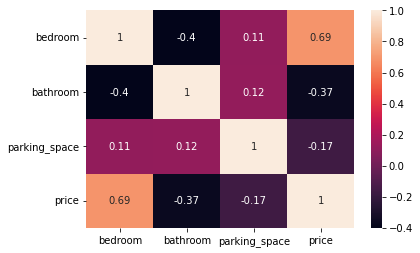

         loc    title  bedroom  bathroom  parking_space      price
13337  Borno  Mansion     1.00      1.00            NaN 2782632.90
1117   Borno  Mansion     1.00      6.00           6.00 2235206.44
517    Borno  Mansion     2.00      7.00           5.00 2527316.39
6482   Borno  Mansion     2.00       NaN           4.00 2418951.58
7606   Borno  Mansion     2.00      2.00           1.00 3160315.17
1565   Borno  Mansion     3.00      3.00           5.00 2544116.34
11832  Borno  Mansion     3.00      2.00           3.00 3476751.94
2395   Borno  Mansion     3.00      2.00           4.00 2435751.53
7766   Borno  Mansion     3.00      7.00           2.00 2674700.62
12822  Borno  Mansion     3.00       NaN           2.00 3264348.70
11820  Borno  Mansion     4.00      1.00           5.00 2695904.34
10732  Borno  Mansion     4.00      6.00           2.00 2891585.58
9783   Borno  Mansion     4.00      1.00           4.00 2652636.49
8704   Borno  Mansion     4.00      2.00            NaN 165185

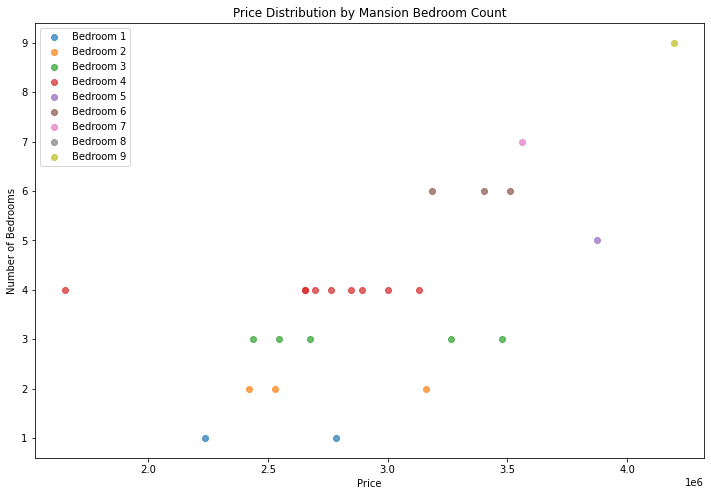



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  26.00000  30.00000      31.00000       35.00000
mean    5.26923   2.93333       3.32258  1981073.15129
std     2.82217   1.98152       1.83280   626547.32743
min     1.00000   1.00000       1.00000  1072443.55400
25%     3.00000   1.00000       2.00000  1379640.46550
50%     6.00000   2.00000       3.00000  2101308.99400
75%     7.75000   4.00000       5.00000  2539142.23300
max     9.00000   7.00000       6.00000  2896073.49400


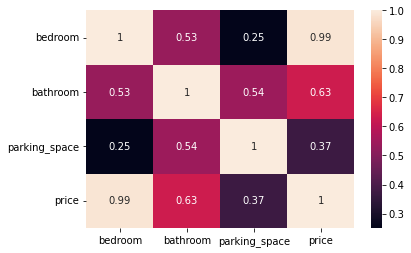

         loc            title  bedroom  bathroom  parking_space      price
13560  Borno  Detached duplex     1.00      1.00           3.00 1118965.14
11267  Borno  Detached duplex     1.00       NaN           1.00 1085081.46
7852   Borno  Detached duplex     1.00      1.00           3.00 1091336.05
2425   Borno  Detached duplex     1.00      2.00            NaN 1072443.55
392    Borno  Detached duplex     2.00      2.00           2.00 1230025.51
2146   Borno  Detached duplex     2.00      1.00           4.00 1277087.22
5285   Borno  Detached duplex     3.00      1.00           4.00 1479615.76
6454   Borno  Detached duplex     3.00      2.00           3.00 1488863.84
6876   Borno  Detached duplex     3.00      1.00           1.00 1354873.21
3309   Borno  Detached duplex     4.00      3.00            NaN 1755534.21
12802  Borno  Detached duplex     5.00      2.00           2.00 1748369.65
1881   Borno  Detached duplex     5.00      6.00           5.00 2101308.99
10960  Borno  Detached du

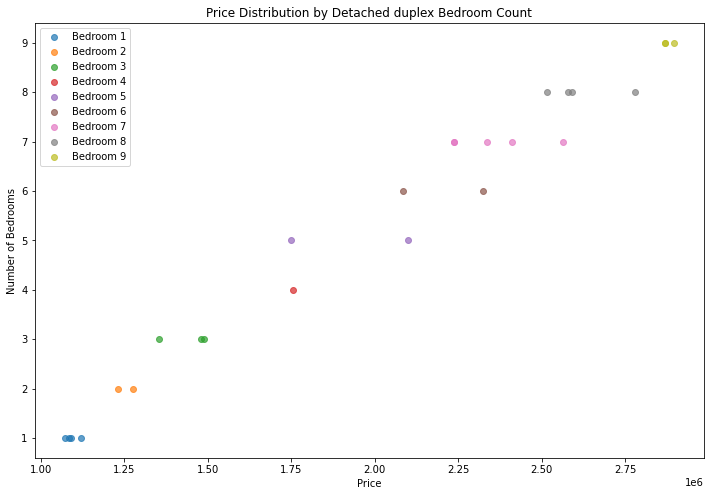



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  40.00000  39.00000      33.00000       45.00000
mean    5.02500   3.05128       3.09091  1387280.81190
std     2.56692   2.07680       1.42223   456048.96136
min     1.00000   1.00000       1.00000   742443.82970
25%     3.00000   1.00000       2.00000  1071064.60500
50%     5.00000   2.00000       3.00000  1273911.50400
75%     7.25000   5.00000       4.00000  1804544.47600
max     9.00000   7.00000       6.00000  2183876.55600


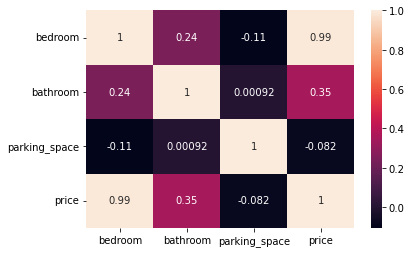

         loc      title  bedroom  bathroom  parking_space      price
11039  Borno  Apartment     1.00      1.00            NaN  755848.66
7277   Borno  Apartment     1.00      1.00            NaN  762711.24
13608  Borno  Apartment     2.00      3.00            NaN  948745.20
645    Borno  Apartment     2.00      1.00           3.00  877708.42
12652  Borno  Apartment     2.00      3.00           4.00  916863.62
8608   Borno  Apartment     2.00      2.00           1.00  897347.30
5202   Borno  Apartment     2.00      1.00           1.00  843312.13
10005  Borno  Apartment     3.00      1.00           4.00 1008968.21
9495   Borno  Apartment     3.00      4.00            NaN 1085020.10
8185   Borno  Apartment     3.00      5.00            NaN 1093062.41
6816   Borno  Apartment     3.00      5.00           3.00 1109003.19
5564   Borno  Apartment     3.00       NaN           2.00 1037336.58
7413   Borno  Apartment     3.00      6.00           2.00 1117045.50
1537   Borno  Apartment     3.00  

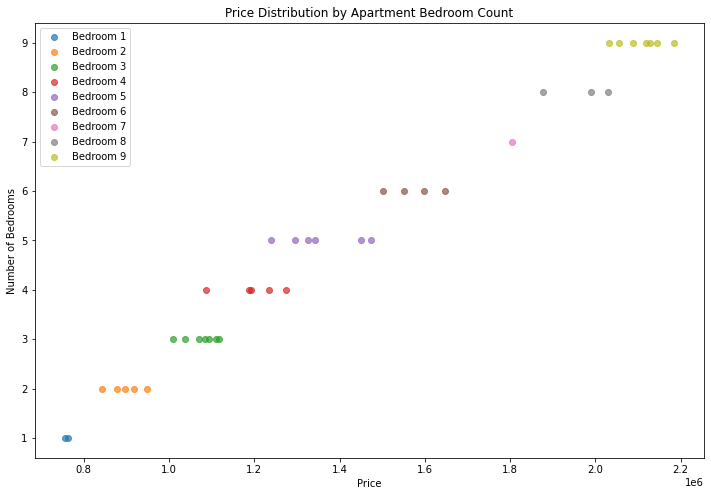



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  30.00000  23.00000      26.00000       33.00000
mean    4.36667   3.26087       2.76923  1397495.36487
std     2.48420   1.98213       1.24283   438613.14379
min     1.00000   1.00000       1.00000   759785.38750
25%     2.25000   1.50000       2.00000  1016736.54100
50%     4.00000   3.00000       3.00000  1388680.54200
75%     6.00000   4.00000       4.00000  1658328.55400
max     8.00000   7.00000       6.00000  2155479.93700


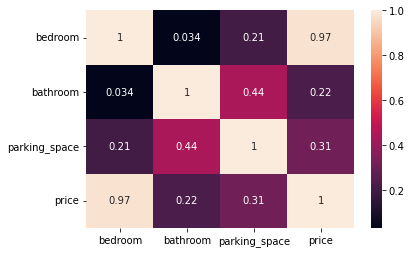

         loc     title  bedroom  bathroom  parking_space      price
7099   Borno  Bungalow     1.00       NaN           3.00  878329.27
11873  Borno  Bungalow     1.00      1.00            NaN  838615.45
11403  Borno  Bungalow     1.00      3.00            NaN  844581.97
9457   Borno  Bungalow     1.00       NaN           2.00  853773.18
7981   Borno  Bungalow     1.00       NaN           3.00  759785.39
9267   Borno  Bungalow     2.00      4.00           3.00 1034954.58
785    Borno  Bungalow     2.00      2.00           2.00  938005.11
2530   Borno  Bungalow     2.00      4.00           2.00 1016736.54
13427  Borno  Bungalow     3.00       NaN            NaN 1086161.07
9426   Borno  Bungalow     3.00       NaN           4.00 1223042.94
3150   Borno  Bungalow     3.00      7.00            NaN 1305270.68
6890   Borno  Bungalow     3.00       NaN           4.00 1074300.35
13655  Borno  Bungalow     3.00       NaN           2.00 1007639.62
917    Borno  Bungalow     4.00       NaN       

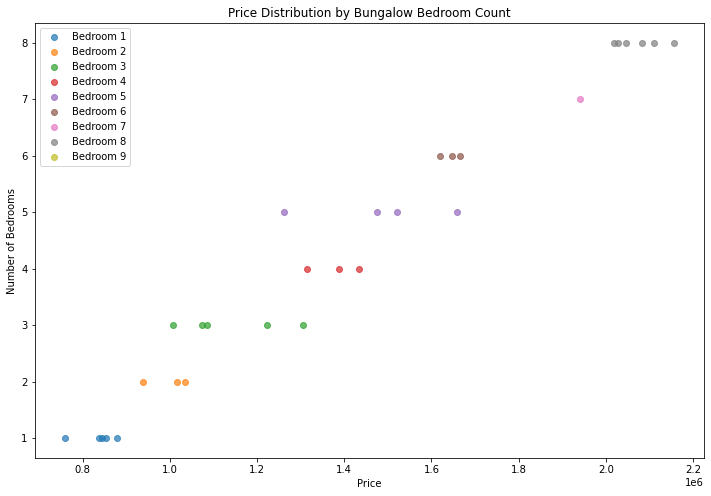



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  34.00000  31.00000      33.00000       37.00000
mean    4.17647   3.58065       3.09091  1350560.92241
std     1.94579   2.47352       1.82626   386234.23996
min     1.00000   1.00000       1.00000   753327.39730
25%     3.00000   1.00000       1.00000  1135400.36300
50%     4.00000   3.00000       3.00000  1260825.51700
75%     5.00000   6.50000       4.00000  1461717.07600
max     9.00000   7.00000       6.00000  2280093.14300


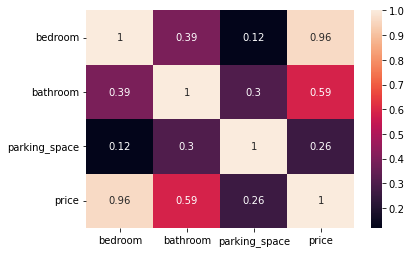

         loc title  bedroom  bathroom  parking_space      price
4818   Borno  Flat     1.00      1.00           1.00  753327.40
5611   Borno  Flat     1.00      2.00           2.00  819140.07
13581  Borno  Flat     1.00      1.00           1.00  823894.17
1742   Borno  Flat     2.00      2.00            NaN  938941.36
7643   Borno  Flat     2.00      7.00           4.00 1135400.36
206    Borno  Flat     3.00       NaN           3.00 1087825.54
12404  Borno  Flat     3.00      1.00           1.00 1086161.07
10763  Borno  Flat     3.00      2.00           6.00 1204660.53
10338  Borno  Flat     3.00       NaN           3.00 1122597.16
7973   Borno  Flat     3.00       NaN           1.00 1223207.30
7366   Borno  Flat     3.00      2.00           6.00 1204660.53
7259   Borno  Flat     3.00       NaN           6.00 1286888.27
6496   Borno  Flat     3.00      6.00           6.00 1314297.51
8896   Borno  Flat     4.00       NaN           3.00 1189649.81
6775   Borno  Flat     4.00      7.00   

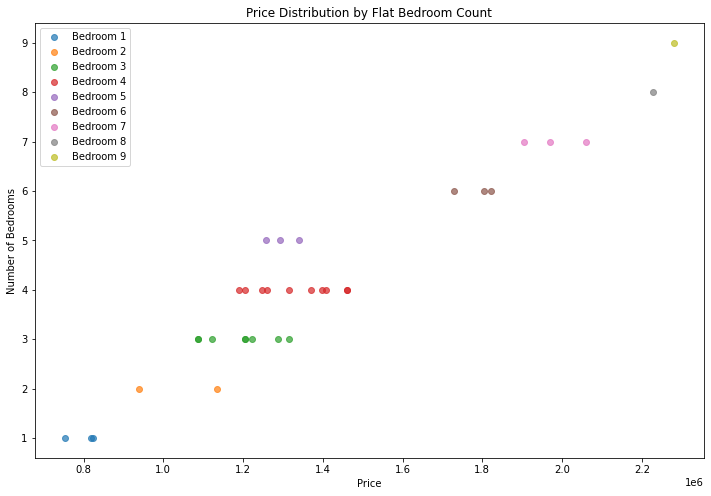



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  22.00000  22.00000      26.00000       31.00000
mean    3.68182   3.40909       3.53846  1488801.00028
std     2.43753   2.17473       1.60576   442913.88108
min     1.00000   1.00000       1.00000   872454.45760
25%     1.25000   2.00000       2.25000  1163942.10850
50%     3.50000   3.00000       4.00000  1437224.26700
75%     5.00000   5.00000       5.00000  1772224.54700
max     9.00000   7.00000       6.00000  2630644.87900


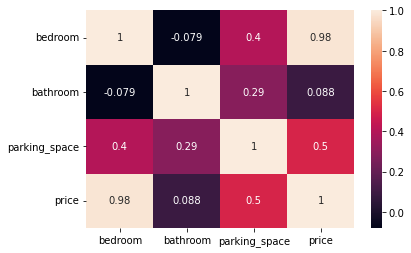

         loc           title  bedroom  bathroom  parking_space      price
377    Borno  Terrace duplex     1.00      7.00           3.00 1064789.95
12369  Borno  Terrace duplex     1.00      7.00            NaN 1105780.54
10324  Borno  Terrace duplex     1.00      5.00           6.00 1064605.04
8577   Borno  Terrace duplex     1.00      2.00            NaN  920781.01
3596   Borno  Terrace duplex     1.00      1.00           1.00  872454.46
5235   Borno  Terrace duplex     1.00      4.00           3.00  972283.74
5720   Borno  Terrace duplex     2.00       NaN           5.00 1278500.04
11016  Borno  Terrace duplex     2.00       NaN           4.00 1073303.94
6877   Borno  Terrace duplex     3.00      2.00           1.00 1209728.53
6880   Borno  Terrace duplex     3.00      1.00           3.00 1162385.68
13363  Borno  Terrace duplex     3.00       NaN           6.00 1386115.58
9113   Borno  Terrace duplex     4.00      2.00            NaN 1447379.46
8886   Borno  Terrace duplex     4.00 

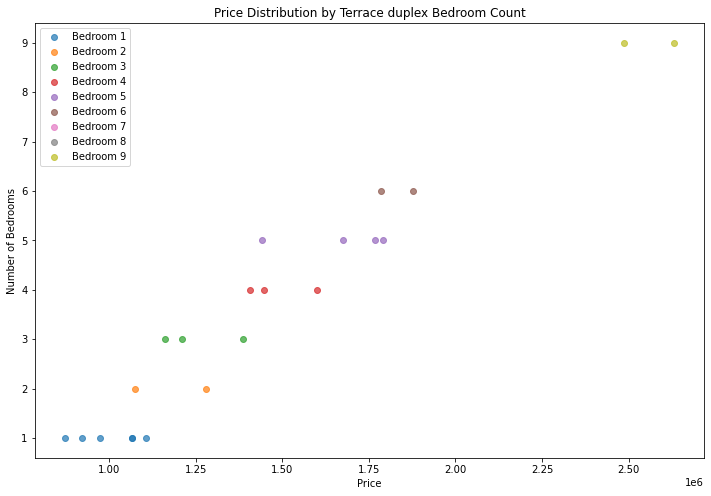



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  14.00000  14.00000      17.00000       19.00000
mean    4.50000   2.64286       2.94118  1605532.58629
std     2.40992   1.78054       1.81902   482763.41794
min     1.00000   1.00000       1.00000   935099.13850
25%     3.00000   2.00000       1.00000  1250759.57350
50%     4.50000   2.00000       3.00000  1560565.87400
75%     6.50000   2.75000       4.00000  2015438.39850
max     9.00000   7.00000       6.00000  2630644.87900


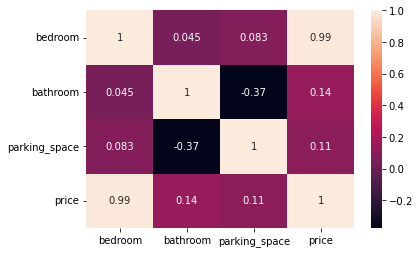

         loc                 title  bedroom  bathroom  parking_space  \
8424   Borno  Semi-detached duplex     1.00      1.00           3.00   
9632   Borno  Semi-detached duplex     1.00      5.00           1.00   
9967   Borno  Semi-detached duplex     2.00      2.00           3.00   
4986   Borno  Semi-detached duplex     3.00      5.00           2.00   
7340   Borno  Semi-detached duplex     3.00       NaN           2.00   
802    Borno  Semi-detached duplex     4.00      2.00            NaN   
2898   Borno  Semi-detached duplex     4.00       NaN           1.00   
1376   Borno  Semi-detached duplex     5.00      2.00           1.00   
5025   Borno  Semi-detached duplex     5.00       NaN           2.00   
8358   Borno  Semi-detached duplex     5.00      3.00            NaN   
1619   Borno  Semi-detached duplex     7.00      1.00           1.00   
4943   Borno  Semi-detached duplex     7.00      2.00           6.00   
12751  Borno  Semi-detached duplex     7.00      7.00           

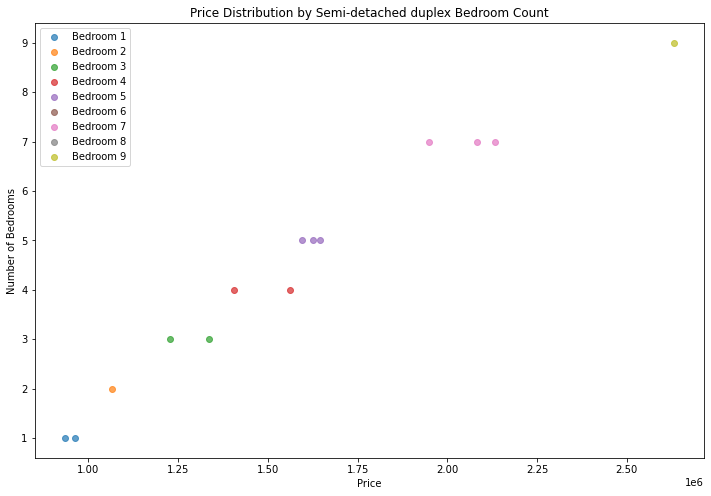



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  20.00000  26.00000      24.00000       28.00000
mean    3.50000   3.65385       3.08333  1577706.78628
std     2.46021   2.11551       1.50121   526057.21345
min     1.00000   1.00000       1.00000   977962.70290
25%     1.00000   2.00000       2.00000  1181976.93950
50%     3.00000   3.00000       3.00000  1372515.74000
75%     4.25000   6.00000       4.00000  1912561.05575
max     9.00000   7.00000       6.00000  2712233.94400


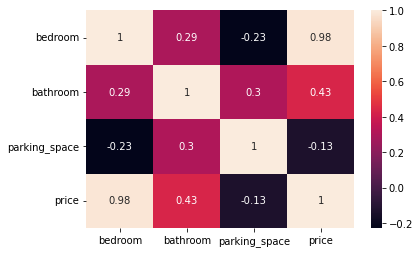

         loc      title  bedroom  bathroom  parking_space      price
96     Borno  Townhouse     1.00      5.00           6.00 1175155.48
13437  Borno  Townhouse     1.00      2.00           2.00  977962.70
13431  Borno  Townhouse     1.00      6.00           5.00 1186644.49
11511  Borno  Townhouse     1.00      2.00           2.00 1067179.19
6404   Borno  Townhouse     1.00       NaN           3.00 1038314.71
7363   Borno  Townhouse     1.00      6.00            NaN 1095554.27
550    Borno  Townhouse     2.00      2.00           2.00 1163756.23
5921   Borno  Townhouse     2.00      1.00           3.00 1184250.76
7401   Borno  Townhouse     3.00      2.00            NaN 1233621.74
4342   Borno  Townhouse     3.00      2.00           2.00 1353138.81
6676   Borno  Townhouse     3.00       NaN           3.00 1258881.04
9974   Borno  Townhouse     4.00      1.00            NaN 1459993.11
10122  Borno  Townhouse     4.00      6.00            NaN 1775451.96
4372   Borno  Townhouse     4.00  

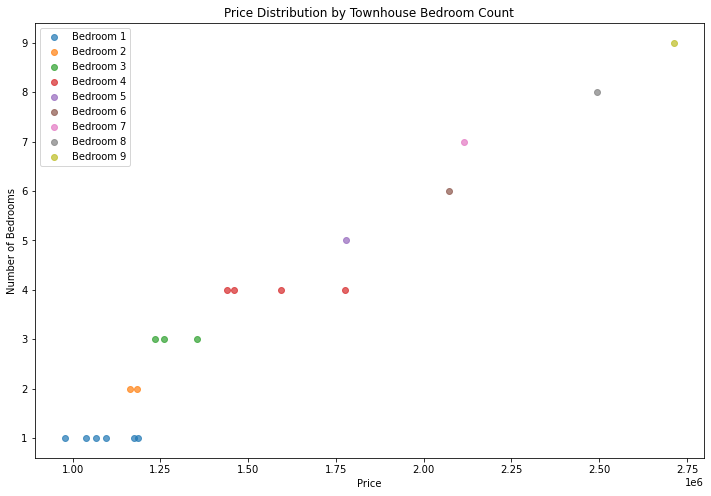



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  26.00000  28.00000      28.00000       32.00000
mean    4.88462   3.17857       2.67857  2178878.86891
std     2.79037   1.96362       1.46701   648413.22057
min     1.00000   1.00000       1.00000  1284373.78500
25%     2.00000   1.00000       1.75000  1599270.34375
50%     4.00000   3.00000       2.50000  1997183.60450
75%     7.75000   5.00000       3.00000  2779992.79300
max     9.00000   6.00000       6.00000  3338307.85200


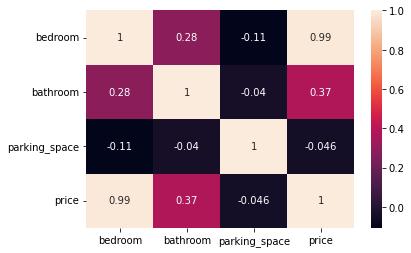

         loc      title  bedroom  bathroom  parking_space      price
6055   Borno  Penthouse     1.00      2.00           3.00 1376186.38
11644  Borno  Penthouse     1.00      6.00           2.00 1432929.56
13963  Borno  Penthouse     2.00      2.00           3.00 1545885.58
3273   Borno  Penthouse     2.00       NaN           1.00 1584271.93
8093   Borno  Penthouse     2.00       NaN           2.00 1632222.89
8332   Borno  Penthouse     2.00      2.00           3.00 1496117.82
10365  Borno  Penthouse     2.00      1.00           3.00 1480443.88
9227   Borno  Penthouse     2.00      1.00           2.00 1604269.81
1237   Borno  Penthouse     3.00       NaN           3.00 1805053.24
10464  Borno  Penthouse     3.00       NaN           3.00 1806078.19
13141  Borno  Penthouse     4.00      1.00           2.00 1864069.57
5208   Borno  Penthouse     4.00      3.00           5.00 2041962.58
5479   Borno  Penthouse     4.00      5.00           1.00 2012625.35
12097  Borno  Penthouse     4.00  

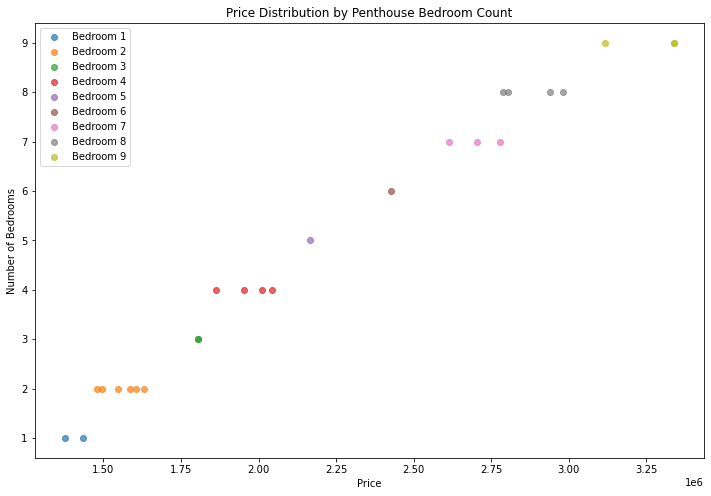



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  14.00000  12.00000      15.00000       15.00000
mean    3.42857   1.41667       2.46667  1107901.70661
std     1.34246   0.51493       1.24595   251609.07689
min     1.00000   1.00000       1.00000   627646.02270
25%     3.00000   1.00000       1.00000   932857.41760
50%     3.00000   1.00000       3.00000  1119482.43400
75%     4.75000   2.00000       3.50000  1291395.19200
max     5.00000   2.00000       4.00000  1478122.76600


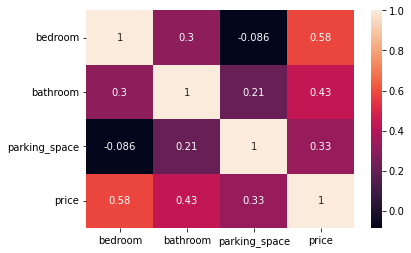

         loc    title  bedroom  bathroom  parking_space      price
1534   Borno  Cottage     1.00      1.00           2.00  911043.02
11512  Borno  Cottage     1.00      1.00           4.00  627646.02
660    Borno  Cottage     3.00       NaN           1.00 1174102.66
2883   Borno  Cottage     3.00      1.00           1.00 1076214.44
4421   Borno  Cottage     3.00      2.00           1.00  822655.99
7574   Borno  Cottage     3.00      2.00           4.00 1290367.66
9678   Borno  Cottage     3.00      2.00           3.00 1145922.60
10221  Borno  Cottage     3.00      1.00           3.00  824340.38
2620   Borno  Cottage     4.00      2.00           4.00 1402281.57
7585   Borno  Cottage     4.00      1.00           4.00 1292422.73
1139   Borno  Cottage     5.00      2.00           3.00 1119482.43
5818   Borno  Cottage     5.00      1.00           1.00 1033469.98
7959   Borno  Cottage     5.00       NaN           3.00 1465781.53
8890   Borno  Cottage     5.00       NaN           2.00 147812

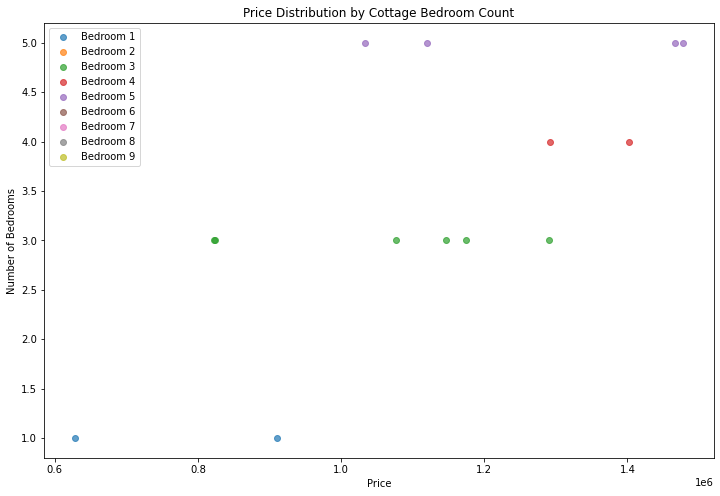

In [276]:
# Borno
Borno = housing_train[housing_train["loc" ] == "Borno"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Borno, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  18.00000  21.00000      23.00000       24.00000
mean    3.94444   2.90476       2.69565  2752892.42438
std     2.23534   1.97243       1.52061   948245.73208
min     1.00000   1.00000       1.00000  1072526.91000
25%     2.25000   1.00000       2.00000  2176736.54050
50%     4.50000   2.00000       2.00000  2772586.89250
75%     5.00000   5.00000       3.50000  3446409.07600
max     9.00000   7.00000       6.00000  4694689.81600


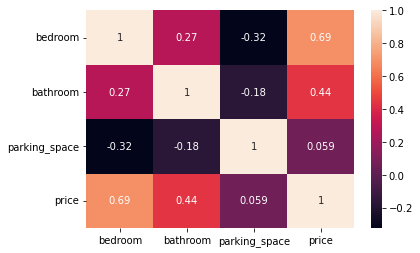

        loc    title  bedroom  bathroom  parking_space      price
5882   Kogi  Mansion     1.00      2.00           3.00 2753289.48
3965   Kogi  Mansion     1.00      1.00           3.00 1116699.85
3992   Kogi  Mansion     1.00      6.00           2.00 2346775.61
5721   Kogi  Mansion     1.00       NaN           2.00 1072526.91
3780   Kogi  Mansion     2.00      2.00           4.00 2444849.23
4278   Kogi  Mansion     3.00       NaN           2.00 2575223.49
7507   Kogi  Mansion     3.00      1.00           2.00 2575223.49
10852  Kogi  Mansion     3.00       NaN           3.00 2847862.03
9757   Kogi  Mansion     4.00      1.00           2.00 3578791.66
8148   Kogi  Mansion     5.00      2.00           1.00 1663793.77
12487  Kogi  Mansion     5.00      1.00           4.00 3294776.13
3682   Kogi  Mansion     5.00      2.00           1.00 1742800.39
3463   Kogi  Mansion     5.00      1.00            NaN 1686762.45
452    Kogi  Mansion     5.00      5.00           1.00 3444015.31
2016   Kog

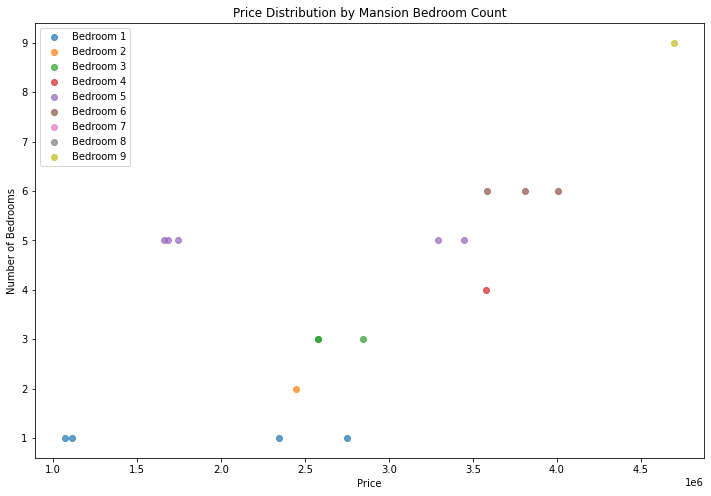



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  26.00000  27.00000      25.00000       30.00000
mean    4.92308   4.29630       3.28000  2180692.91217
std     2.62180   2.10886       1.59478   657788.88895
min     1.00000   1.00000       1.00000  1316028.00400
25%     3.00000   2.50000       2.00000  1611778.70650
50%     4.00000   5.00000       3.00000  2012757.60600
75%     7.00000   6.00000       4.00000  2714069.78900
max     9.00000   7.00000       6.00000  3242802.06900


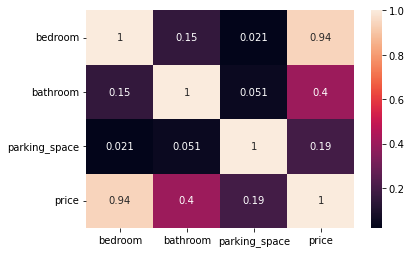

        loc            title  bedroom  bathroom  parking_space      price
7465   Kogi  Detached duplex     1.00       NaN           4.00 1316028.00
4459   Kogi  Detached duplex     1.00      7.00           3.00 1459686.34
3715   Kogi  Detached duplex     2.00      3.00           5.00 1552219.19
4350   Kogi  Detached duplex     3.00      7.00           3.00 1881718.96
7321   Kogi  Detached duplex     3.00      5.00           6.00 1881460.67
5723   Kogi  Detached duplex     3.00      2.00           1.00 1344022.01
5142   Kogi  Detached duplex     3.00      6.00           1.00 1781390.58
8476   Kogi  Detached duplex     3.00      2.00           1.00 1417168.39
9684   Kogi  Detached duplex     3.00      1.00           6.00 1709173.98
3496   Kogi  Detached duplex     3.00      1.00           2.00 1594660.57
10751  Kogi  Detached duplex     3.00      6.00           4.00 1867275.64
3569   Kogi  Detached duplex     3.00      1.00           4.00 1353332.68
2306   Kogi  Detached duplex     4.00 

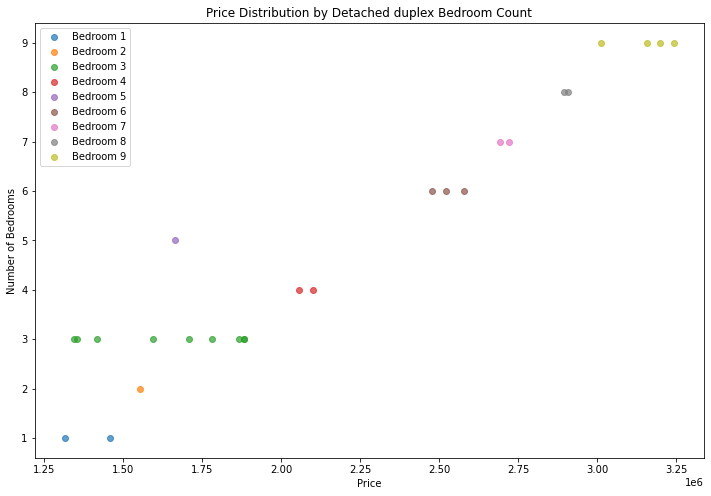



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  23.00000  21.00000      22.00000       27.00000
mean    4.21739   2.71429       3.45455  1376106.10220
std     2.50375   1.79284       1.47122   478729.77310
min     1.00000   1.00000       1.00000   792386.31520
25%     2.00000   2.00000       2.25000  1042012.17000
50%     4.00000   2.00000       3.50000  1195183.33000
75%     6.00000   3.00000       4.00000  1652610.41500
max     9.00000   7.00000       6.00000  2398756.96500


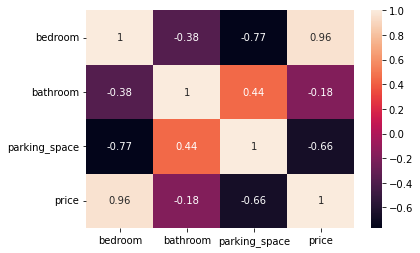

        loc      title  bedroom  bathroom  parking_space      price
7893   Kogi  Apartment     1.00       NaN           2.00  792386.32
12674  Kogi  Apartment     1.00       NaN           2.00  908591.67
2996   Kogi  Apartment     1.00      2.00           4.00  835390.77
13078  Kogi  Apartment     1.00      7.00           5.00  990655.04
11720  Kogi  Apartment     2.00       NaN           4.00  925798.36
9933   Kogi  Apartment     2.00      2.00           6.00 1034790.22
5967   Kogi  Apartment     2.00      4.00            NaN 1071390.67
13202  Kogi  Apartment     3.00      2.00           4.00 1049234.12
2391   Kogi  Apartment     3.00      1.00            NaN 1177251.28
8857   Kogi  Apartment     4.00      2.00           3.00 1179749.71
9838   Kogi  Apartment     4.00      3.00           4.00 1370298.14
3339   Kogi  Apartment     4.00      4.00           6.00 1434143.47
11353  Kogi  Apartment     4.00      2.00            NaN 1128805.28
12707  Kogi  Apartment     4.00      1.00       

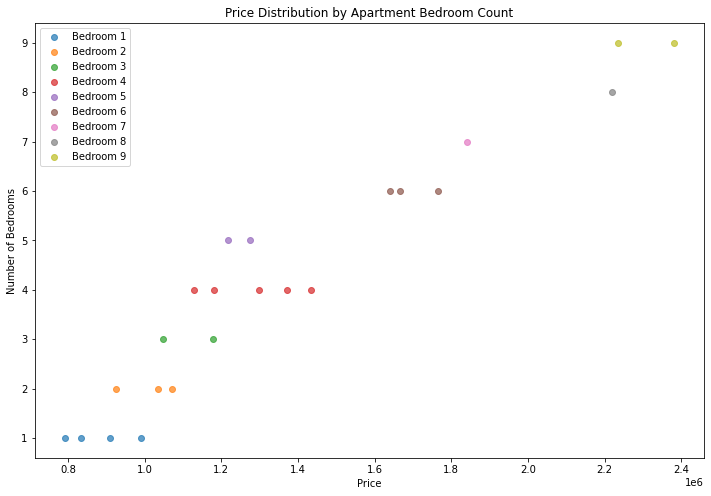



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  26.00000  22.00000      21.00000       29.00000
mean    5.15385   4.50000       3.09524  1763490.92940
std     2.41151   2.01778       1.48003   576049.76935
min     1.00000   1.00000       1.00000   798991.05890
25%     3.00000   2.25000       2.00000  1181545.09700
50%     5.00000   5.00000       3.00000  1790256.20800
75%     7.00000   6.00000       4.00000  2198943.71500
max     9.00000   7.00000       6.00000  2637745.94900


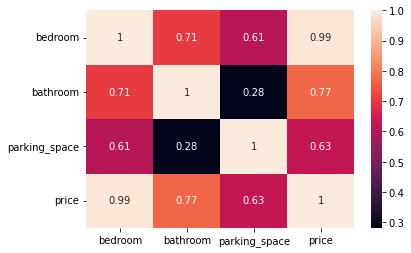

        loc     title  bedroom  bathroom  parking_space      price
5947   Kogi  Bungalow     1.00      2.00           3.00  798991.06
11709  Kogi  Bungalow     2.00       NaN           4.00  909620.74
2451   Kogi  Bungalow     2.00      2.00            NaN  971667.69
8673   Kogi  Bungalow     2.00      4.00            NaN 1181545.10
8446   Kogi  Bungalow     3.00      2.00           1.00 1078500.00
11361  Kogi  Bungalow     3.00      6.00            NaN 1425214.98
10939  Kogi  Bungalow     3.00      5.00           1.00 1331428.27
9848   Kogi  Bungalow     3.00       NaN           3.00 1011360.83
8029   Kogi  Bungalow     3.00      2.00            NaN 1082107.52
4389   Kogi  Bungalow     4.00      5.00           3.00 1558883.82
9465   Kogi  Bungalow     4.00      5.00           2.00 1538063.20
11183  Kogi  Bungalow     5.00      7.00           2.00 1790256.21
9994   Kogi  Bungalow     5.00      2.00           5.00 1696093.80
12480  Kogi  Bungalow     5.00      4.00           1.00 167546

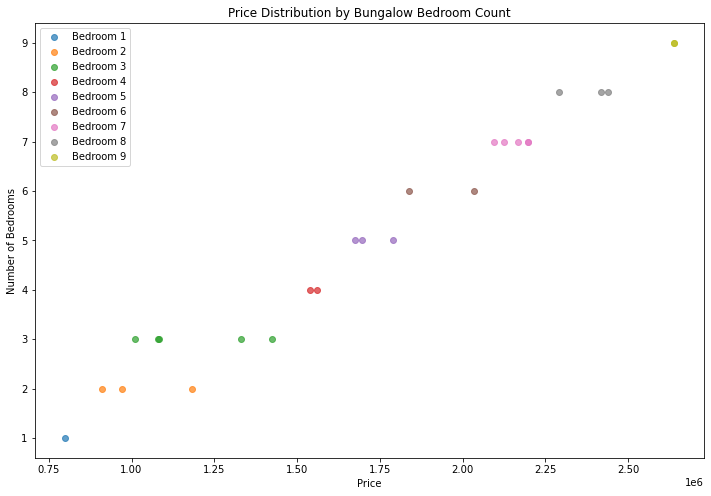



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  24.00000  25.00000      26.00000       28.00000
mean    3.95833   2.36000       2.92308  1423241.94987
std     2.56191   1.55134       1.76461   515970.09444
min     1.00000   1.00000       1.00000   850723.29890
25%     2.00000   2.00000       1.25000   994798.93353
50%     3.00000   2.00000       3.00000  1301125.80550
75%     5.00000   2.00000       3.75000  1614006.93550
max     9.00000   7.00000       6.00000  2523138.61800


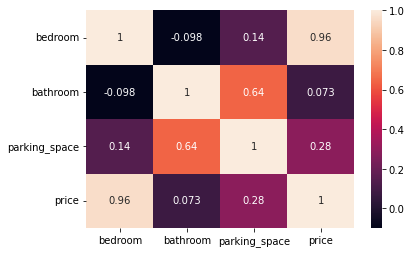

        loc title  bedroom  bathroom  parking_space      price
2514   Kogi  Flat     1.00      2.00           2.00  903140.92
12030  Kogi  Flat     1.00      2.00           3.00  850723.30
10760  Kogi  Flat     1.00      2.00           2.00  861527.03
2897   Kogi  Flat     2.00       NaN           6.00 1223186.34
3214   Kogi  Flat     2.00      2.00           2.00  951888.72
11660  Kogi  Flat     2.00      1.00           1.00  874396.39
6486   Kogi  Flat     2.00      2.00           1.00  939017.10
9295   Kogi  Flat     2.00      3.00           6.00 1191861.48
11024  Kogi  Flat     2.00      2.00            NaN  932690.64
2244   Kogi  Flat     3.00      2.00           3.00 1081533.04
11195  Kogi  Flat     3.00      1.00           1.00 1080562.82
6574   Kogi  Flat     3.00       NaN           5.00 1320736.19
9775   Kogi  Flat     3.00      1.00           1.00 1009102.34
11108  Kogi  Flat     4.00      5.00           5.00 1600525.06
13646  Kogi  Flat     4.00      1.00           3.00 143

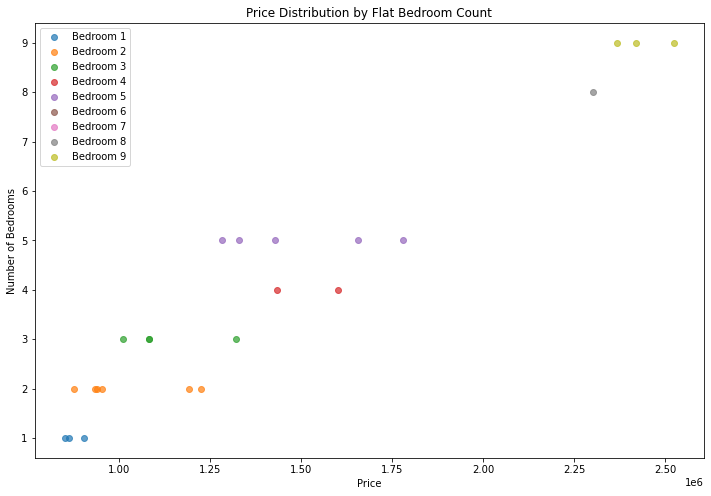



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  27.00000  25.00000      21.00000       31.00000
mean    4.77778   3.12000       3.52381  1763966.11006
std     2.11830   2.29710       1.77817   517147.94369
min     1.00000   1.00000       1.00000   876894.06850
25%     3.00000   1.00000       2.00000  1332346.78700
50%     5.00000   2.00000       4.00000  1840869.98100
75%     6.00000   5.00000       5.00000  2074181.66950
max     9.00000   7.00000       6.00000  2788247.29900


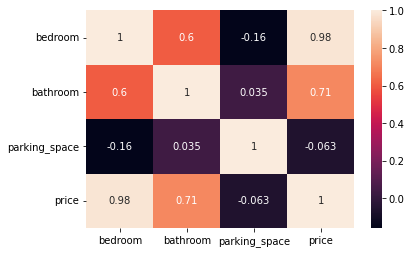

        loc           title  bedroom  bathroom  parking_space      price
10336  Kogi  Terrace duplex     1.00      1.00            NaN  977734.03
3954   Kogi  Terrace duplex     1.00       NaN           1.00 1019144.42
7531   Kogi  Terrace duplex     1.00      1.00            NaN  876894.07
239    Kogi  Terrace duplex     3.00      2.00            NaN 1216396.50
11665  Kogi  Terrace duplex     3.00       NaN           3.00 1140952.45
10633  Kogi  Terrace duplex     3.00      1.00           1.00 1326096.65
9308   Kogi  Terrace duplex     3.00      1.00           3.00 1220953.00
7448   Kogi  Terrace duplex     3.00      3.00           5.00 1490270.35
1768   Kogi  Terrace duplex     3.00      1.00           4.00 1247763.86
9855   Kogi  Terrace duplex     4.00      1.00            NaN 1593330.42
13467  Kogi  Terrace duplex     5.00      5.00            NaN 1958408.62
5173   Kogi  Terrace duplex     5.00      1.00           2.00 1747177.19
4221   Kogi  Terrace duplex     5.00      1.00     

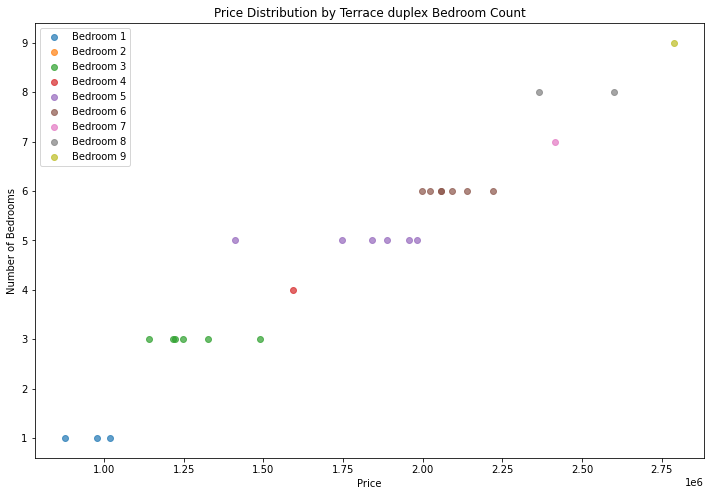



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  23.00000  32.00000      30.00000       35.00000
mean    4.00000   2.71875       2.90000  1473171.97155
std     2.41209   2.17366       1.47040   515262.49138
min     1.00000   1.00000       1.00000   835171.56690
25%     3.00000   1.00000       2.00000  1145044.98400
50%     4.00000   2.00000       3.00000  1380398.48600
75%     5.00000   5.00000       4.00000  1606478.33550
max     9.00000   7.00000       6.00000  2729583.64300


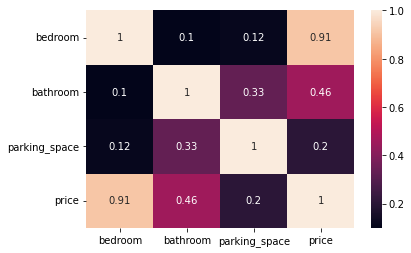

        loc                 title  bedroom  bathroom  parking_space      price
1514   Kogi  Semi-detached duplex     1.00      1.00           2.00  972086.70
9943   Kogi  Semi-detached duplex     1.00      1.00           1.00  906817.69
8187   Kogi  Semi-detached duplex     1.00      1.00           1.00  835171.57
6708   Kogi  Semi-detached duplex     1.00       NaN           3.00  871197.95
6145   Kogi  Semi-detached duplex     2.00      6.00           2.00 1333552.09
11049  Kogi  Semi-detached duplex     3.00      7.00           6.00 1654655.39
13324  Kogi  Semi-detached duplex     3.00      1.00           1.00 1128666.98
6989   Kogi  Semi-detached duplex     3.00      1.00            NaN 1443212.63
7832   Kogi  Semi-detached duplex     3.00      1.00           3.00 1182831.02
6196   Kogi  Semi-detached duplex     3.00      2.00            NaN 1215906.99
6071   Kogi  Semi-detached duplex     3.00      7.00           2.00 1560962.60
8160   Kogi  Semi-detached duplex     4.00      1.00

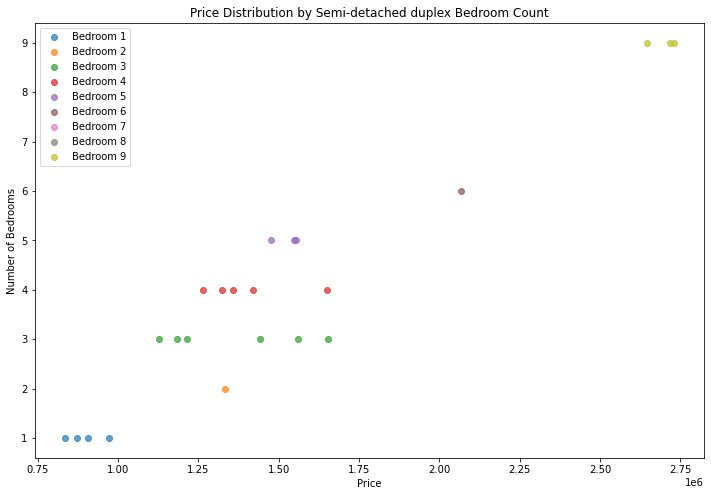



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  25.00000  28.00000      24.00000       30.00000
mean    4.48000   2.64286       2.62500  1755322.57530
std     2.66333   1.85021       1.43898   604103.00255
min     1.00000   1.00000       1.00000  1015017.90300
25%     2.00000   1.00000       1.00000  1288889.77900
50%     4.00000   2.00000       2.50000  1587368.85800
75%     6.00000   4.00000       4.00000  2089109.58550
max     9.00000   7.00000       6.00000  2935793.86000


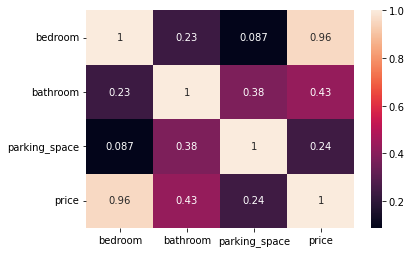

        loc      title  bedroom  bathroom  parking_space      price
13787  Kogi  Townhouse     1.00      1.00           1.00 1015017.90
12704  Kogi  Townhouse     1.00      1.00           2.00 1072357.33
10310  Kogi  Townhouse     1.00      3.00           4.00 1202721.01
10166  Kogi  Townhouse     2.00      2.00           3.00 1152407.85
7970   Kogi  Townhouse     2.00      1.00            NaN 1137913.33
6641   Kogi  Townhouse     2.00      6.00           6.00 1568653.72
823    Kogi  Townhouse     2.00       NaN           5.00 1503471.88
4695   Kogi  Townhouse     3.00      1.00           1.00 1286559.83
1247   Kogi  Townhouse     3.00       NaN           1.00 1295879.63
6195   Kogi  Townhouse     3.00      2.00           2.00 1306664.53
3597   Kogi  Townhouse     4.00      2.00           1.00 1693334.54
6084   Kogi  Townhouse     4.00      2.00           1.00 1408812.79
13641  Kogi  Townhouse     4.00      1.00           2.00 1404858.31
7537   Kogi  Townhouse     4.00      2.00       

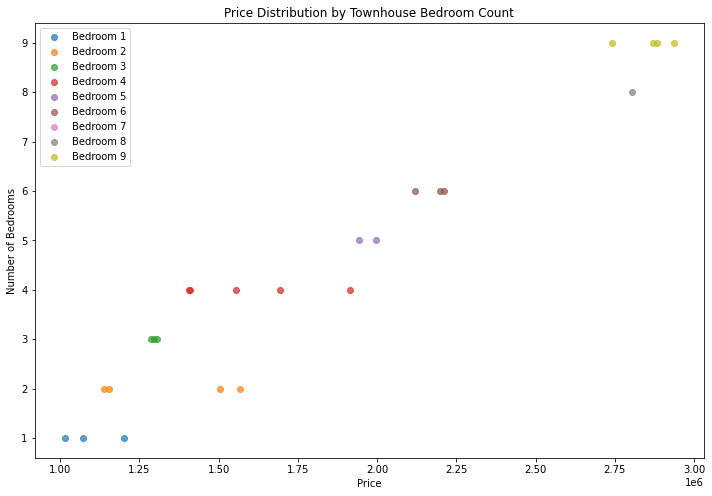



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  21.00000  20.00000      21.00000       25.00000
mean    4.33333   2.35000       3.33333  2133061.76284
std     2.49666   1.38697       1.65328   619971.78259
min     1.00000   1.00000       1.00000  1344750.19300
25%     2.00000   1.00000       2.00000  1694604.78700
50%     5.00000   2.00000       3.00000  1959046.73000
75%     5.00000   3.25000       4.00000  2479366.24600
max     9.00000   6.00000       6.00000  3504155.60800


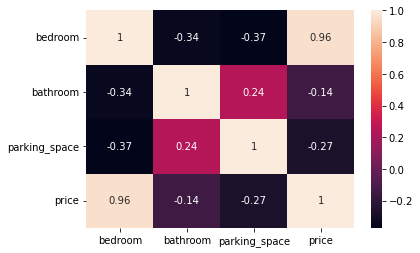

        loc      title  bedroom  bathroom  parking_space      price
5555   Kogi  Penthouse     1.00      4.00           2.00 1525877.87
6794   Kogi  Penthouse     1.00      2.00           1.00 1344750.19
3672   Kogi  Penthouse     1.00      1.00            NaN 1360428.26
6531   Kogi  Penthouse     2.00       NaN           3.00 1694604.79
3685   Kogi  Penthouse     2.00      1.00           4.00 1639318.53
199    Kogi  Penthouse     2.00      4.00           6.00 1891074.47
1146   Kogi  Penthouse     3.00      2.00           3.00 1826883.72
9362   Kogi  Penthouse     3.00      3.00           6.00 2076941.10
2205   Kogi  Penthouse     3.00      2.00           2.00 1785141.75
11610  Kogi  Penthouse     4.00      1.00            NaN 1807144.95
3795   Kogi  Penthouse     5.00      4.00           2.00 2479366.25
4402   Kogi  Penthouse     5.00       NaN           5.00 2682672.54
5166   Kogi  Penthouse     5.00      1.00           4.00 2135983.82
254    Kogi  Penthouse     5.00      1.00       

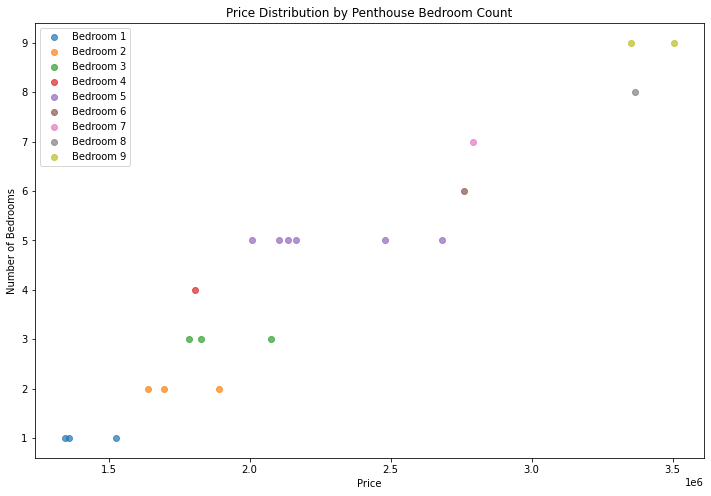



Analyzing Cottage data:
        bedroom  bathroom parking_space          price
count  14.00000  15.00000      18.00000       20.00000
mean    3.35714   1.60000       2.61111   978993.69385
std     1.44686   0.50709       1.14475   196541.83057
min     1.00000   1.00000       1.00000   613246.13080
25%     2.25000   1.00000       2.00000   856938.69615
50%     3.50000   2.00000       3.00000   969202.15740
75%     4.75000   2.00000       3.75000  1085561.55400
max     5.00000   2.00000       4.00000  1348201.35700


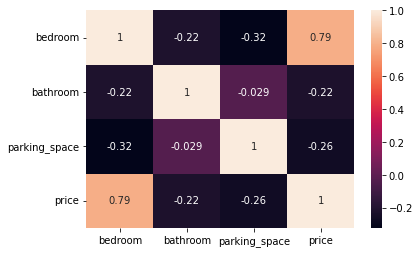

        loc    title  bedroom  bathroom  parking_space      price
49     Kogi  Cottage     1.00      2.00           3.00  643193.39
3558   Kogi  Cottage     1.00      2.00           4.00  613246.13
3530   Kogi  Cottage     2.00       NaN            NaN 1059047.21
12931  Kogi  Cottage     2.00       NaN           4.00  750224.20
4992   Kogi  Cottage     3.00      1.00           4.00 1166164.97
5955   Kogi  Cottage     3.00       NaN           2.00  845542.63
8962   Kogi  Cottage     3.00      1.00           1.00  824460.50
495    Kogi  Cottage     4.00      2.00           2.00  954471.71
2509   Kogi  Cottage     4.00       NaN           1.00 1348201.36
3615   Kogi  Cottage     4.00      2.00           1.00 1293095.89
1144   Kogi  Cottage     5.00      1.00            NaN 1070542.12
6397   Kogi  Cottage     5.00      2.00           3.00 1083731.19
11634  Kogi  Cottage     5.00      1.00           3.00 1076520.82
13456  Kogi  Cottage     5.00       NaN           3.00 1091052.63
105    Kog

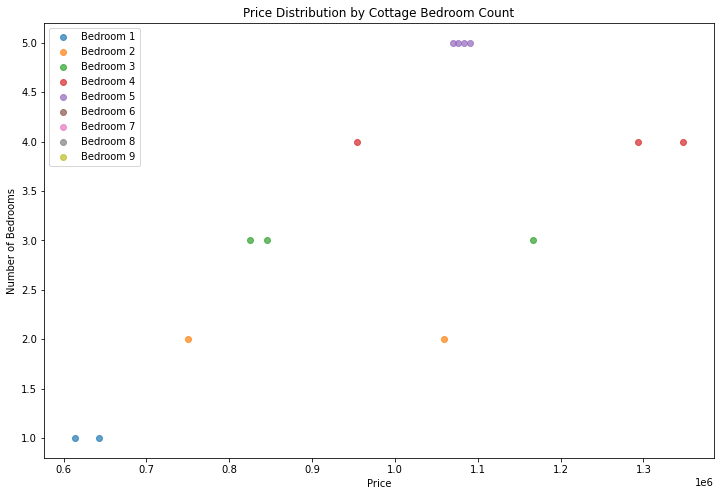

In [277]:
# Kogi
Kogi = housing_train[housing_train["loc" ] == "Kogi"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Kogi, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  22.00000  19.00000      19.00000       24.00000
mean    3.68182   3.31579       3.10526  2668665.48775
std     2.07906   2.00146       1.69623   934257.31208
min     1.00000   1.00000       1.00000  1072913.45100
25%     2.00000   2.00000       2.00000  2104478.93025
50%     3.50000   2.00000       3.00000  2739367.37450
75%     4.75000   5.50000       4.00000  3287609.46500
max     9.00000   7.00000       6.00000  4281897.85000


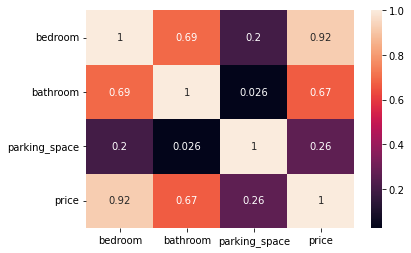

          loc    title  bedroom  bathroom  parking_space      price
5607   Sokoto  Mansion     1.00      2.00           3.00 1072913.45
10291  Sokoto  Mansion     1.00      2.00           3.00 1115885.61
2769   Sokoto  Mansion     2.00      2.00           2.00 1331961.97
2872   Sokoto  Mansion     2.00       NaN            NaN 2310196.40
11835  Sokoto  Mansion     2.00      4.00           1.00 2158954.11
10965  Sokoto  Mansion     2.00      2.00           2.00 2072028.04
4247   Sokoto  Mansion     2.00      2.00           3.00 2115295.89
8732   Sokoto  Mansion     2.00      2.00           5.00 2201831.59
6903   Sokoto  Mansion     3.00      2.00           3.00 3228337.62
12245  Sokoto  Mansion     3.00       NaN           5.00 2609213.30
10258  Sokoto  Mansion     3.00      2.00            NaN 1402250.95
11064  Sokoto  Mansion     4.00      3.00            NaN 2739562.56
10616  Sokoto  Mansion     4.00      2.00            NaN 3764430.85
7705   Sokoto  Mansion     4.00      6.00       

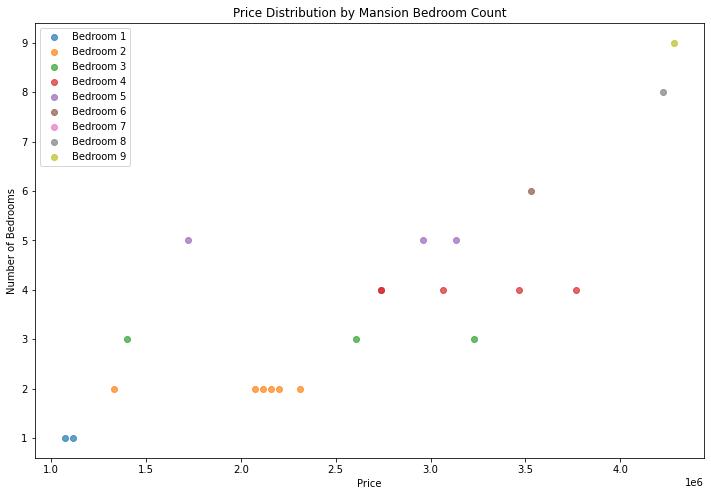



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  31.00000  32.00000      24.00000       33.00000
mean    4.35484   3.09375       3.16667  1779671.53658
std     2.18401   1.95695       1.97080   482356.53030
min     1.00000   1.00000       1.00000  1113832.22400
25%     2.50000   1.00000       1.75000  1352688.65100
50%     4.00000   2.50000       2.50000  1697167.88000
75%     5.00000   4.25000       5.25000  2013295.66300
max     9.00000   7.00000       6.00000  2795422.25800


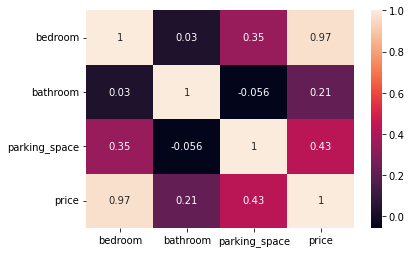

          loc            title  bedroom  bathroom  parking_space      price
5559   Sokoto  Detached duplex     1.00      2.00            NaN 1186957.38
2732   Sokoto  Detached duplex     1.00      6.00           6.00 1323393.64
7399   Sokoto  Detached duplex     2.00      2.00            NaN 1314774.94
7246   Sokoto  Detached duplex     2.00      1.00            NaN 1201937.80
10115  Sokoto  Detached duplex     2.00      5.00            NaN 1352688.65
3077   Sokoto  Detached duplex     2.00      1.00           1.00 1215612.18
10403  Sokoto  Detached duplex     2.00      1.00           3.00 1291529.36
11134  Sokoto  Detached duplex     2.00      2.00           1.00 1267331.64
1368   Sokoto  Detached duplex     3.00      7.00           2.00 1652252.60
6607   Sokoto  Detached duplex     3.00      4.00           3.00 1564239.27
7515   Sokoto  Detached duplex     3.00      5.00            NaN 1576877.17
4104   Sokoto  Detached duplex     4.00      2.00           2.00 1629646.01
1115   Sokot

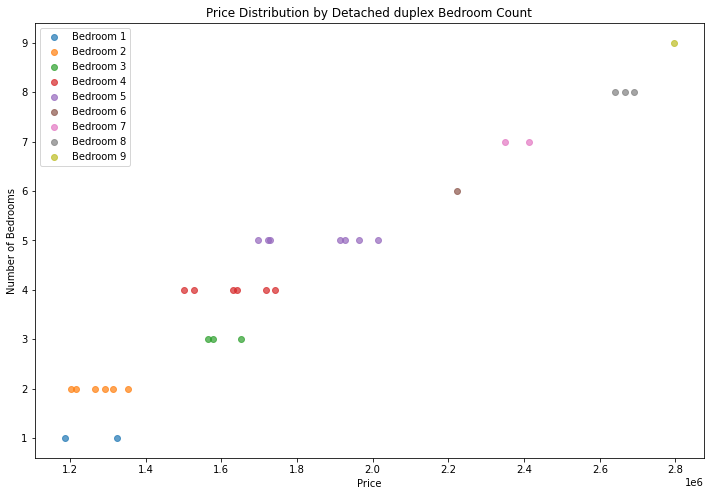



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  28.00000  24.00000      26.00000       30.00000
mean    4.21429   3.25000       3.69231  1316445.89088
std     2.78032   1.91675       1.82799   472221.34826
min     1.00000   1.00000       1.00000   731630.99990
25%     1.75000   2.00000       2.00000   899198.81280
50%     3.00000   2.00000       4.00000  1207326.22600
75%     6.00000   5.00000       5.00000  1674147.28450
max     9.00000   7.00000       6.00000  2175834.25300


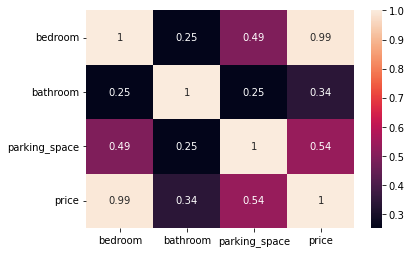

          loc      title  bedroom  bathroom  parking_space      price
7329   Sokoto  Apartment     1.00      1.00           5.00  731631.00
12943  Sokoto  Apartment     1.00      1.00           1.00  758283.60
12647  Sokoto  Apartment     1.00      2.00           1.00  740237.01
3742   Sokoto  Apartment     1.00      6.00           5.00  851546.45
10593  Sokoto  Apartment     1.00       NaN           5.00  755614.09
13640  Sokoto  Apartment     1.00      6.00            NaN  867487.24
10392  Sokoto  Apartment     1.00       NaN           4.00  835605.66
2396   Sokoto  Apartment     2.00      1.00            NaN  897755.52
8126   Sokoto  Apartment     2.00      2.00           1.00  903528.70
2148   Sokoto  Apartment     3.00      2.00           2.00  974655.38
12171  Sokoto  Apartment     3.00      2.00            NaN 1037604.46
12069  Sokoto  Apartment     3.00       NaN           3.00 1000690.52
3587   Sokoto  Apartment     3.00      5.00           1.00 1077121.62
12039  Sokoto  Apart

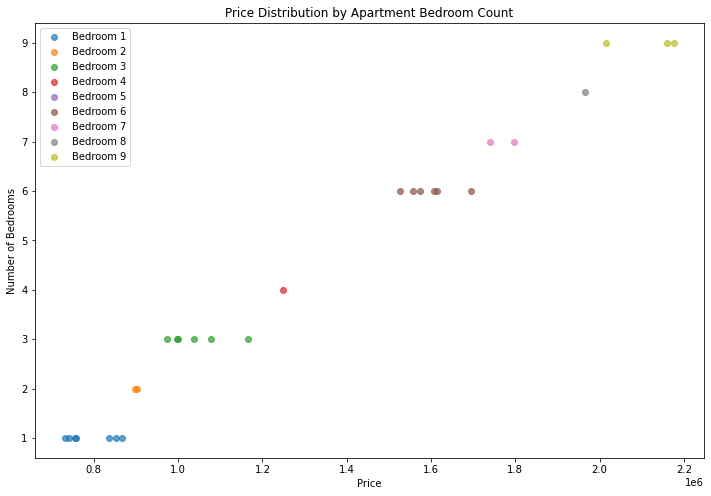



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  26.00000  21.00000      24.00000       28.00000
mean    4.42308   3.38095       2.75000  1408586.75521
std     2.67093   2.22432       1.59483   481536.47817
min     1.00000   1.00000       1.00000   728967.05070
25%     2.00000   2.00000       1.00000   986497.53875
50%     3.50000   3.00000       3.00000  1282739.98300
75%     7.00000   6.00000       4.00000  1886890.56825
max     9.00000   7.00000       6.00000  2289119.98100


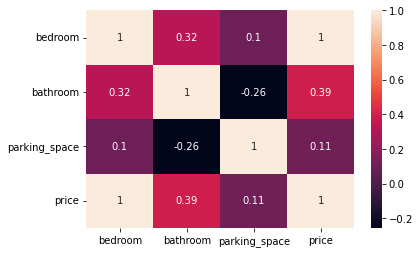

          loc     title  bedroom  bathroom  parking_space      price
9051   Sokoto  Bungalow     1.00       NaN            NaN  853608.81
500    Sokoto  Bungalow     1.00       NaN           1.00  808145.89
2245   Sokoto  Bungalow     1.00      1.00           1.00  728967.05
10579  Sokoto  Bungalow     2.00      2.00           4.00  936198.97
7495   Sokoto  Bungalow     2.00      1.00           3.00  946159.69
10832  Sokoto  Bungalow     2.00       NaN           4.00  986534.50
11494  Sokoto  Bungalow     2.00       NaN           4.00  986386.66
3494   Sokoto  Bungalow     2.00      1.00           1.00  916290.76
3543   Sokoto  Bungalow     3.00      2.00           2.00 1131788.36
3005   Sokoto  Bungalow     3.00      1.00            NaN 1140815.20
7393   Sokoto  Bungalow     3.00      3.00           4.00 1195633.69
1329   Sokoto  Bungalow     3.00       NaN           6.00 1259479.02
11708  Sokoto  Bungalow     3.00      6.00           1.00 1223207.30
4679   Sokoto  Bungalow     4.00  

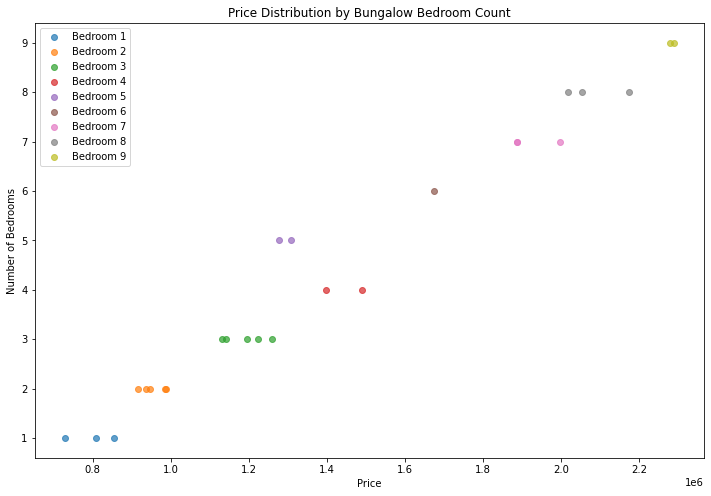



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  30.00000  32.00000      30.00000       37.00000
mean    4.36667   2.96875       3.03333  1380003.27196
std     2.60614   2.03968       1.47352   480851.69871
min     1.00000   1.00000       1.00000   826199.56620
25%     2.25000   1.00000       2.00000  1025927.74500
50%     3.50000   2.00000       3.00000  1194183.18000
75%     6.00000   4.00000       4.00000  1748378.41100
max     9.00000   7.00000       6.00000  2435193.04900


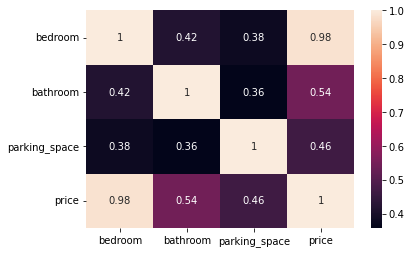

          loc title  bedroom  bathroom  parking_space      price
11916  Sokoto  Flat     1.00      4.00            NaN  871991.22
10717  Sokoto  Flat     1.00      4.00           3.00  871991.22
9851   Sokoto  Flat     1.00      7.00            NaN  917782.87
2435   Sokoto  Flat     1.00      1.00           5.00  826199.57
5106   Sokoto  Flat     1.00      2.00            NaN  835390.77
5582   Sokoto  Flat     2.00      1.00            NaN  867127.94
7298   Sokoto  Flat     2.00      5.00           1.00 1025927.74
12994  Sokoto  Flat     2.00      1.00           2.00  864459.54
5416   Sokoto  Flat     3.00       NaN           1.00 1097437.60
5391   Sokoto  Flat     3.00      5.00           4.00 1250452.18
80     Sokoto  Flat     3.00      2.00           2.00 1108004.24
3395   Sokoto  Flat     3.00      1.00           4.00 1114262.50
4170   Sokoto  Flat     3.00      1.00           1.00 1028770.81
3306   Sokoto  Flat     3.00      1.00           1.00 1012416.42
13096  Sokoto  Flat     3

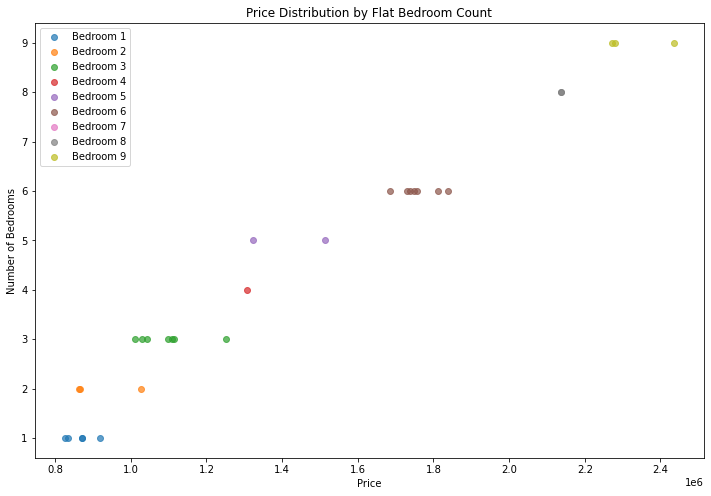



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  28.00000  20.00000      23.00000       30.00000
mean    4.25000   3.40000       3.47826  1592931.57013
std     2.60519   2.23371       1.70213   566710.82763
min     1.00000   1.00000       1.00000   838786.94250
25%     2.00000   1.00000       2.00000  1162071.55275
50%     4.50000   3.00000       3.00000  1425580.11350
75%     5.50000   5.00000       5.00000  2184986.88050
max     9.00000   7.00000       6.00000  2630644.87900


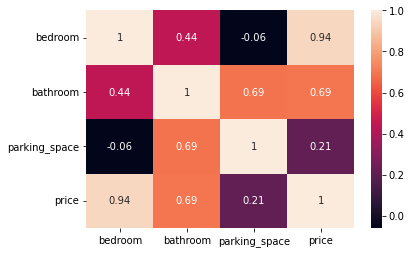

          loc           title  bedroom  bathroom  parking_space      price
119    Sokoto  Terrace duplex     1.00       NaN           1.00  838786.94
12718  Sokoto  Terrace duplex     1.00      7.00            NaN 1126275.84
10966  Sokoto  Terrace duplex     1.00       NaN           3.00 1064789.95
3668   Sokoto  Terrace duplex     1.00      1.00            NaN  895664.29
9555   Sokoto  Terrace duplex     1.00      2.00           4.00  966343.07
7725   Sokoto  Terrace duplex     1.00       NaN           2.00  936787.34
1761   Sokoto  Terrace duplex     2.00      3.00           5.00 1155158.43
7814   Sokoto  Terrace duplex     2.00      5.00           4.00 1196333.94
5754   Sokoto  Terrace duplex     2.00      1.00           3.00 1052497.03
10234  Sokoto  Terrace duplex     3.00       NaN           6.00 1416950.98
9521   Sokoto  Terrace duplex     3.00      5.00           6.00 1416950.98
7869   Sokoto  Terrace duplex     3.00      2.00            NaN 1182810.91
9027   Sokoto  Terrace du

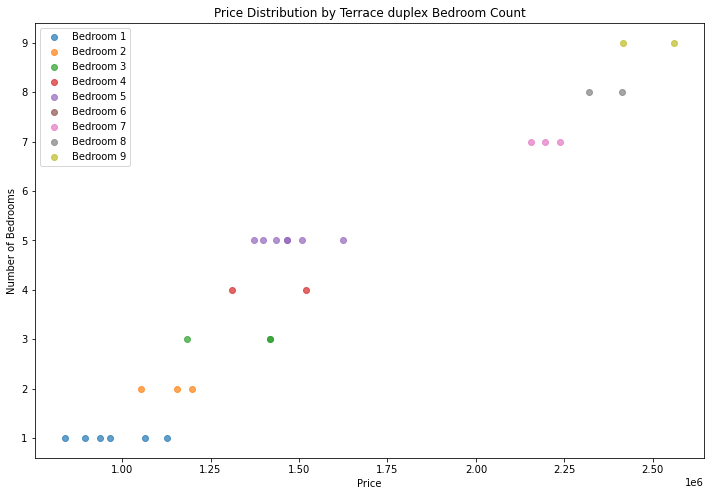



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  29.00000  27.00000      27.00000       35.00000
mean    4.48276   3.25926       3.14815  1578076.76601
std     2.21393   2.21173       1.65724   463019.68390
min     1.00000   1.00000       1.00000   876607.13580
25%     3.00000   1.00000       2.00000  1205015.77100
50%     5.00000   2.00000       3.00000  1415634.79500
75%     6.00000   5.50000       4.50000  1857589.36400
max     9.00000   7.00000       6.00000  2528168.39100


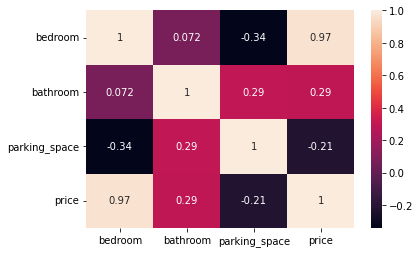

          loc                 title  bedroom  bathroom  parking_space  \
941    Sokoto  Semi-detached duplex     1.00      1.00            NaN   
4367   Sokoto  Semi-detached duplex     1.00      5.00           2.00   
9186   Sokoto  Semi-detached duplex     2.00      5.00           6.00   
8428   Sokoto  Semi-detached duplex     2.00      1.00           2.00   
2870   Sokoto  Semi-detached duplex     2.00       NaN           2.00   
5132   Sokoto  Semi-detached duplex     2.00      2.00           1.00   
1621   Sokoto  Semi-detached duplex     2.00      6.00           6.00   
11349  Sokoto  Semi-detached duplex     3.00       NaN           4.00   
3645   Sokoto  Semi-detached duplex     3.00      4.00           5.00   
3840   Sokoto  Semi-detached duplex     3.00      3.00           5.00   
12633  Sokoto  Semi-detached duplex     3.00      1.00            NaN   
3932   Sokoto  Semi-detached duplex     4.00      2.00           2.00   
4361   Sokoto  Semi-detached duplex     4.00      1

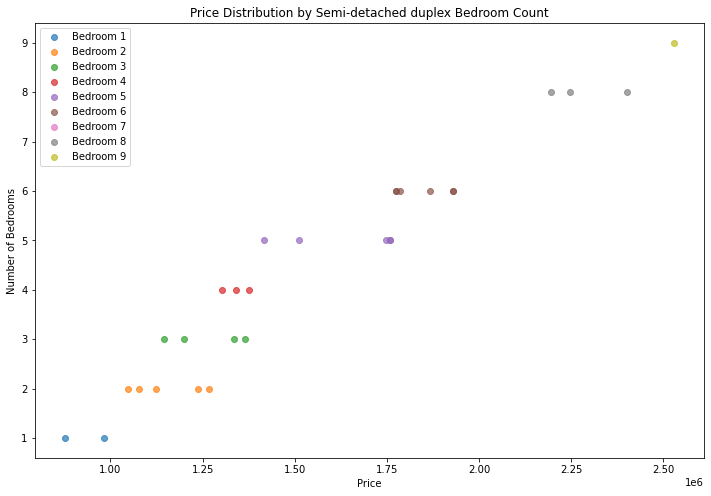



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  17.00000  18.00000      20.00000       23.00000
mean    4.05882   3.16667       3.25000  1686834.00132
std     2.27680   2.06512       1.58529   466120.39418
min     1.00000   1.00000       1.00000   947019.04040
25%     3.00000   1.25000       2.00000  1357944.72800
50%     4.00000   3.00000       3.00000  1597025.20800
75%     5.00000   4.75000       5.00000  1834325.48200
max     9.00000   7.00000       6.00000  2769062.59700


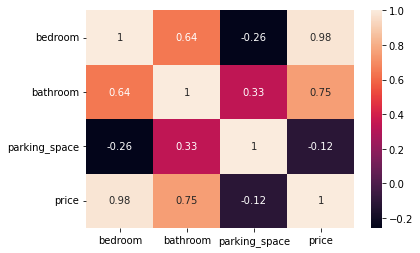

          loc      title  bedroom  bathroom  parking_space      price
8958   Sokoto  Townhouse     1.00       NaN           6.00 1209417.04
3082   Sokoto  Townhouse     1.00      1.00           2.00  947019.04
13143  Sokoto  Townhouse     1.00       NaN           5.00 1220906.04
184    Sokoto  Townhouse     2.00      4.00            NaN 1300597.00
3158   Sokoto  Townhouse     3.00      3.00           5.00 1455718.03
8520   Sokoto  Townhouse     3.00      1.00           2.00 1254342.06
6314   Sokoto  Townhouse     3.00      2.00           4.00 1282630.84
8439   Sokoto  Townhouse     4.00       NaN           2.00 1462114.90
8220   Sokoto  Townhouse     4.00       NaN           4.00 1661383.74
13288  Sokoto  Townhouse     4.00      1.00            NaN 1415292.45
5049   Sokoto  Townhouse     5.00      3.00           2.00 1779482.78
4666   Sokoto  Townhouse     5.00      3.00           1.00 1756710.23
11050  Sokoto  Townhouse     5.00      2.00           1.00 1561699.28
12742  Sokoto  Townh

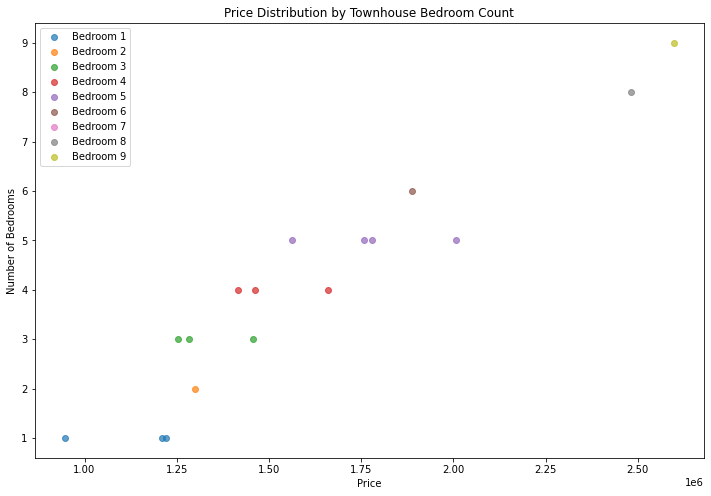



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  32.00000  33.00000      33.00000       37.00000
mean    4.03125   3.57576       3.09091  2034360.84311
std     2.54615   1.93698       1.46551   593729.09673
min     1.00000   1.00000       1.00000  1254769.46600
25%     2.00000   2.00000       2.00000  1539471.76700
50%     3.00000   4.00000       3.00000  1788913.14500
75%     5.25000   5.00000       4.00000  2387821.05100
max     9.00000   7.00000       6.00000  3382847.87600


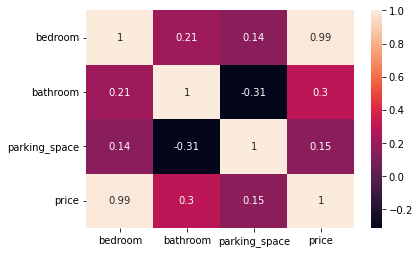

          loc      title  bedroom  bathroom  parking_space      price
7369   Sokoto  Penthouse     1.00      5.00           3.00 1417993.86
2118   Sokoto  Penthouse     1.00      1.00           4.00 1399831.57
7927   Sokoto  Penthouse     1.00      2.00           2.00 1254769.47
5978   Sokoto  Penthouse     1.00      2.00            NaN 1527522.76
13229  Sokoto  Penthouse     2.00      4.00            NaN 1525989.23
13095  Sokoto  Penthouse     2.00      2.00           5.00 1555326.46
12665  Sokoto  Penthouse     2.00      2.00           3.00 1667863.53
12656  Sokoto  Penthouse     2.00      2.00           3.00 1539471.77
11431  Sokoto  Penthouse     2.00      2.00           1.00 1603079.65
9906   Sokoto  Penthouse     2.00      7.00           3.00 1718817.94
994    Sokoto  Penthouse     2.00       NaN           1.00 1392369.16
4862   Sokoto  Penthouse     2.00      1.00           3.00 1514032.40
10341  Sokoto  Penthouse     3.00      2.00           2.00 1679286.07
10771  Sokoto  Penth

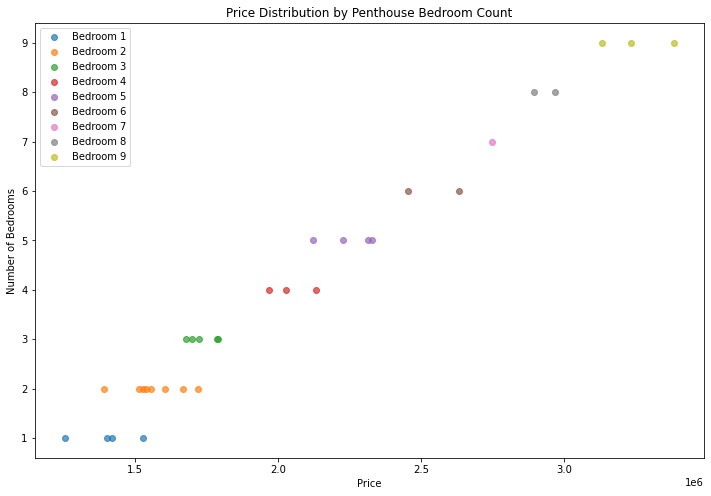



Analyzing Cottage data:
        bedroom bathroom parking_space          price
count  10.00000  9.00000      10.00000       10.00000
mean    2.90000  1.66667       1.80000  1051131.67484
std     1.91195  0.50000       1.03280   294087.74647
min     1.00000  1.00000       1.00000   652005.60240
25%     1.00000  1.00000       1.00000   869952.24698
50%     2.50000  2.00000       1.50000   941566.33115
75%     5.00000  2.00000       2.00000  1322458.78575
max     5.00000  2.00000       4.00000  1479322.91600


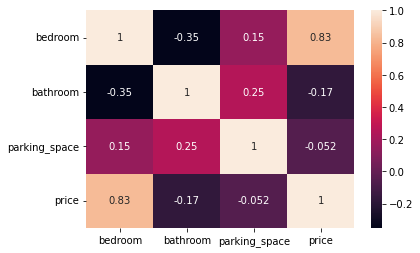

          loc    title  bedroom  bathroom  parking_space      price
1923   Sokoto  Cottage     1.00      2.00           1.00  918084.06
4217   Sokoto  Cottage     1.00      2.00           1.00  844417.53
8480   Sokoto  Cottage     1.00       NaN           3.00  652005.60
11792  Sokoto  Cottage     1.00      2.00           1.00  869452.47
11501  Sokoto  Cottage     2.00      1.00           2.00  965048.61
9385   Sokoto  Cottage     3.00      2.00           4.00  871451.59
981    Sokoto  Cottage     5.00      2.00           2.00 1459711.02
8610   Sokoto  Cottage     5.00      1.00           1.00 1032816.89
12222  Sokoto  Cottage     5.00      2.00           2.00 1419006.09
13232  Sokoto  Cottage     5.00      1.00           1.00 1479322.92


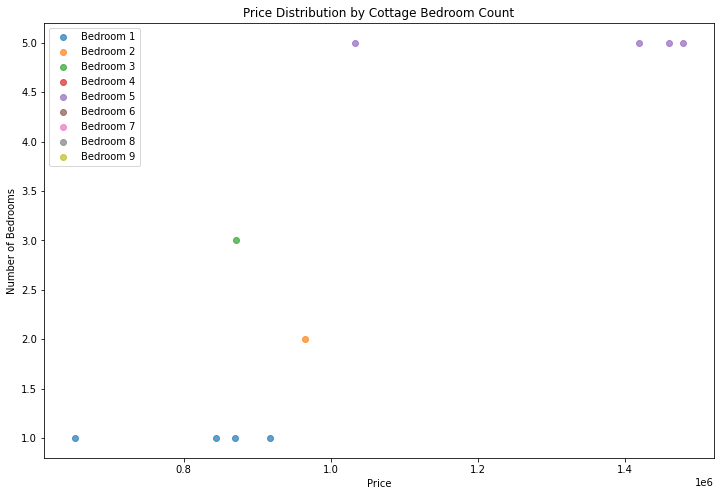

In [278]:
# Sokoto
Sokoto = housing_train[housing_train["loc" ] == "Sokoto"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Sokoto, house_type)
    print("\n")

Analyzing Mansion data:
        bedroom  bathroom parking_space          price
count  26.00000  30.00000      25.00000       32.00000
mean    4.00000   3.36667       3.56000  2761523.74872
std     2.20907   2.17324       1.38684   913743.98283
min     1.00000   1.00000       1.00000  1085264.60300
25%     3.00000   2.00000       2.00000  2107658.14000
50%     4.00000   2.50000       4.00000  2772033.36700
75%     5.00000   5.00000       5.00000  3571974.49700
max     9.00000   7.00000       6.00000  4390262.65900


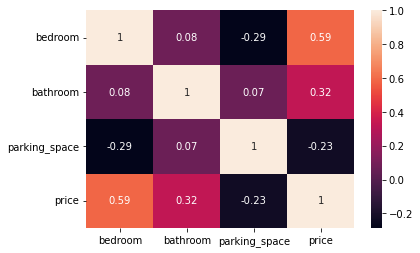

           loc    title  bedroom  bathroom  parking_space      price
71     Zamfara  Mansion     1.00      1.00           3.00 2881682.95
11619  Zamfara  Mansion     1.00      7.00           4.00 2213767.70
13892  Zamfara  Mansion     1.00      5.00            NaN 1953770.23
2144   Zamfara  Mansion     1.00      1.00           4.00 1085264.60
12770  Zamfara  Mansion     2.00      2.00           4.00 3071044.26
12593  Zamfara  Mansion     2.00      1.00            NaN 1192210.40
10506  Zamfara  Mansion     3.00      2.00            NaN 3295503.40
3435   Zamfara  Mansion     3.00      7.00           2.00 2674700.62
5789   Zamfara  Mansion     3.00      5.00           5.00 2674310.26
7029   Zamfara  Mansion     3.00      4.00           6.00 2652481.15
10622  Zamfara  Mansion     3.00       NaN           5.00 2544116.34
10774  Zamfara  Mansion     3.00      7.00           2.00 2674700.62
2788   Zamfara  Mansion     4.00      1.00           3.00 1509444.64
3834   Zamfara  Mansion     4.00  

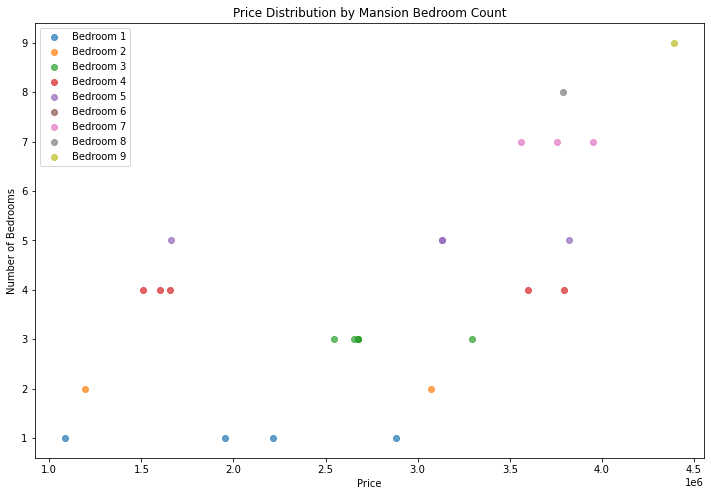



Analyzing Detached duplex data:
        bedroom  bathroom parking_space          price
count  30.00000  34.00000      34.00000       40.00000
mean    3.93333   2.73529       3.32353  1705467.58357
std     2.42022   1.62012       1.77047   542078.64937
min     1.00000   1.00000       1.00000  1047592.40100
25%     2.00000   2.00000       2.00000  1293395.27025
50%     3.50000   2.00000       3.00000  1475449.90900
75%     5.00000   3.75000       5.00000  2059887.01275
max     9.00000   7.00000       6.00000  2983860.82400


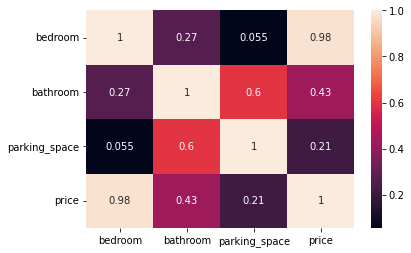

           loc            title  bedroom  bathroom  parking_space      price
13788  Zamfara  Detached duplex     1.00      1.00           2.00 1047592.40
1235   Zamfara  Detached duplex     1.00      1.00            NaN 1161221.87
6351   Zamfara  Detached duplex     1.00      4.00           5.00 1222968.40
5353   Zamfara  Detached duplex     1.00       NaN           2.00 1099451.13
10024  Zamfara  Detached duplex     2.00      5.00            NaN 1452887.88
7756   Zamfara  Detached duplex     2.00      2.00           1.00 1295429.71
5724   Zamfara  Detached duplex     2.00       NaN           1.00 1287291.95
5245   Zamfara  Detached duplex     2.00       NaN           5.00 1452887.88
412    Zamfara  Detached duplex     2.00      2.00           4.00 1326707.49
1448   Zamfara  Detached duplex     2.00       NaN           3.00 1365100.55
5045   Zamfara  Detached duplex     3.00      1.00           3.00 1456546.66
13020  Zamfara  Detached duplex     3.00      1.00            NaN 1451176.13

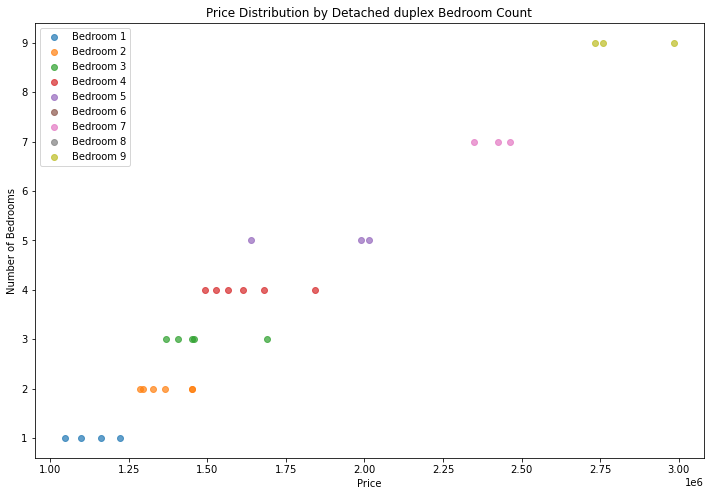



Analyzing Apartment data:
        bedroom  bathroom parking_space          price
count  21.00000  25.00000      24.00000       29.00000
mean    4.66667   3.72000       3.25000  1363143.96582
std     2.00832   1.94765       1.62186   409729.11911
min     2.00000   1.00000       1.00000   795537.96720
25%     3.00000   2.00000       2.00000   997130.04670
50%     5.00000   4.00000       3.00000  1242702.77400
75%     6.00000   5.00000       4.00000  1686066.92000
max     9.00000   7.00000       6.00000  2207859.64700


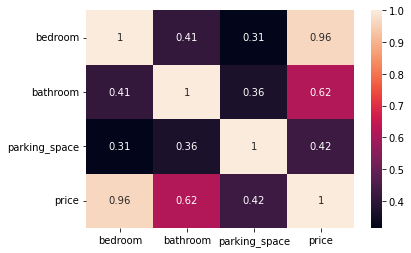

           loc      title  bedroom  bathroom  parking_space      price
12306  Zamfara  Apartment     2.00       NaN           3.00  888766.04
6977   Zamfara  Apartment     2.00       NaN           1.00  940990.53
648    Zamfara  Apartment     3.00      4.00           2.00 1069079.32
1386   Zamfara  Apartment     3.00      7.00           3.00 1156969.38
2881   Zamfara  Apartment     3.00      1.00           4.00  981546.86
11178  Zamfara  Apartment     3.00      4.00           3.00 1085020.10
9508   Zamfara  Apartment     3.00       NaN           1.00 1005172.35
12356  Zamfara  Apartment     3.00      2.00            NaN  974113.22
5505   Zamfara  Apartment     3.00      1.00            NaN  997130.05
13855  Zamfara  Apartment     4.00      2.00           2.00 1186021.45
4400   Zamfara  Apartment     5.00      5.00           6.00 1490371.17
6273   Zamfara  Apartment     5.00      1.00           3.00 1242702.77
3720   Zamfara  Apartment     5.00      2.00           2.00 1233613.06
11874 

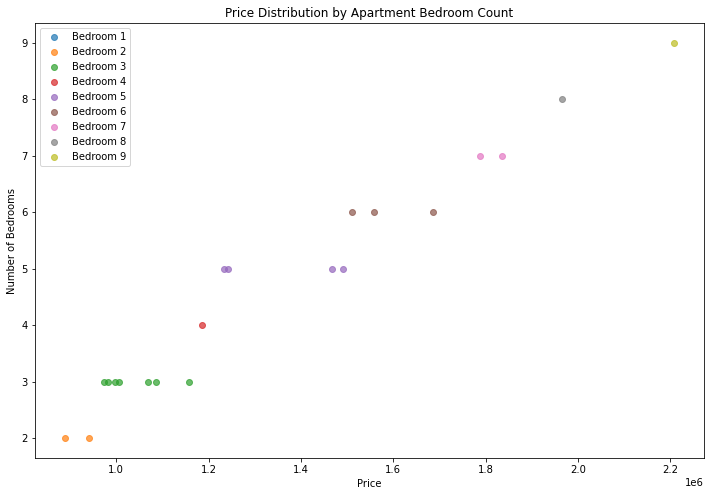



Analyzing Bungalow data:
        bedroom  bathroom parking_space          price
count  27.00000  29.00000      31.00000       32.00000
mean    4.59259   3.37931       2.96774  1489849.03684
std     2.89906   2.09444       1.66301   518416.63543
min     1.00000   1.00000       1.00000   789763.48180
25%     2.00000   1.00000       1.50000   973588.10338
50%     5.00000   3.00000       3.00000  1509799.92500
75%     7.00000   5.00000       4.00000  1916556.52375
max     9.00000   7.00000       6.00000  2371347.71900


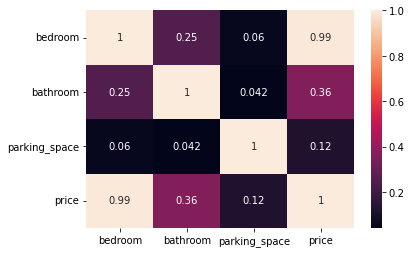

           loc     title  bedroom  bathroom  parking_space      price
8548   Zamfara  Bungalow     1.00      2.00           3.00  823568.34
12014  Zamfara  Bungalow     1.00       NaN           3.00  789763.48
3771   Zamfara  Bungalow     1.00      3.00           1.00  808145.89
3975   Zamfara  Bungalow     1.00      6.00           6.00  981463.84
7597   Zamfara  Bungalow     2.00      1.00           4.00  949960.90
11560  Zamfara  Bungalow     2.00      5.00           2.00 1044145.79
11123  Zamfara  Bungalow     2.00      1.00           3.00  917937.93
10210  Zamfara  Bungalow     2.00      1.00           1.00  916290.76
12378  Zamfara  Bungalow     2.00      1.00           3.00  896270.41
3153   Zamfara  Bungalow     2.00      1.00           1.00  872128.39
4395   Zamfara  Bungalow     2.00      3.00           6.00 1062199.46
1016   Zamfara  Bungalow     3.00      5.00           2.00 1214016.10
8171   Zamfara  Bungalow     4.00       NaN           4.00 1452525.87
5797   Zamfara  Bung

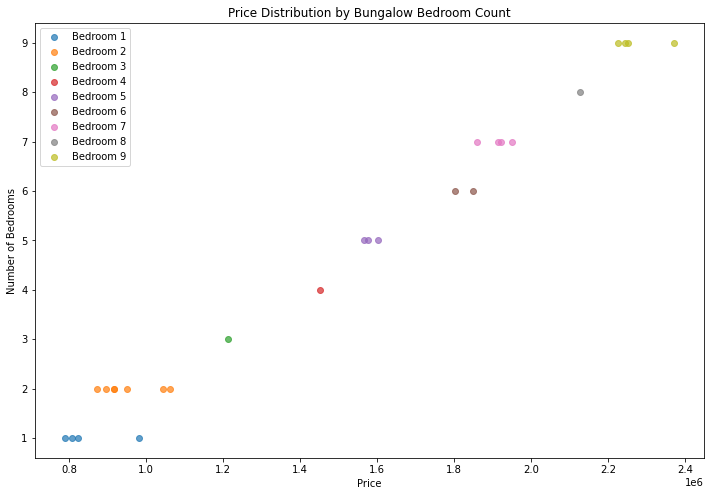



Analyzing Flat data:
        bedroom  bathroom parking_space          price
count  33.00000  33.00000      29.00000       37.00000
mean    4.78788   3.63636       3.17241  1445152.38581
std     2.39475   2.17684       1.77420   457895.11636
min     1.00000   1.00000       1.00000   721377.37070
25%     3.00000   2.00000       2.00000  1132362.61200
50%     4.00000   3.00000       3.00000  1324670.84700
75%     6.00000   6.00000       4.00000  1757733.98000
max     9.00000   7.00000       6.00000  2398756.96500


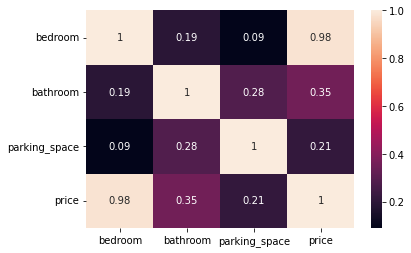

           loc title  bedroom  bathroom  parking_space      price
11250  Zamfara  Flat     1.00      4.00            NaN  908427.30
5634   Zamfara  Flat     1.00      6.00           4.00  945027.75
8101   Zamfara  Flat     1.00      1.00           1.00  721377.37
12421  Zamfara  Flat     2.00      7.00           6.00 1171836.45
11785  Zamfara  Flat     2.00      1.00           1.00  862144.71
11366  Zamfara  Flat     2.00      2.00           2.00  908044.55
13722  Zamfara  Flat     3.00      7.00            NaN 1250616.55
12956  Zamfara  Flat     3.00      7.00            NaN 1287052.63
12953  Zamfara  Flat     3.00      3.00           6.00 1232069.78
13578  Zamfara  Flat     3.00      2.00           4.00 1081864.56
12298  Zamfara  Flat     4.00       NaN           3.00 1434307.83
9902   Zamfara  Flat     4.00       NaN           3.00 1179508.77
9330   Zamfara  Flat     4.00      1.00           1.00 1132362.61
1349   Zamfara  Flat     4.00      2.00           1.00 1245665.79
2658   Zam

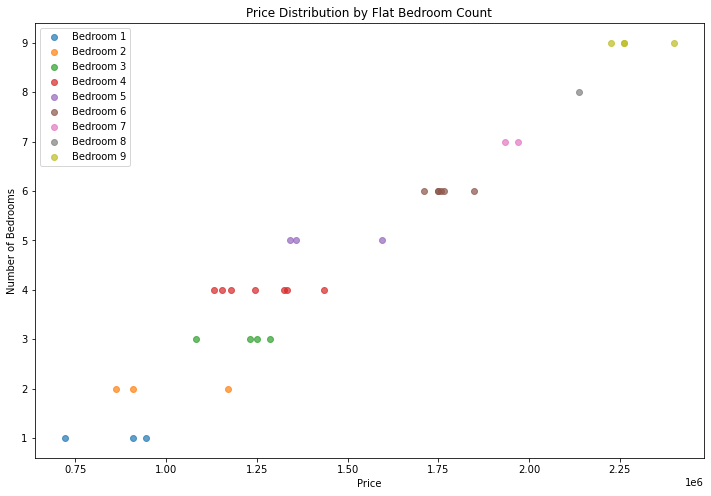



Analyzing Terrace duplex data:
        bedroom  bathroom parking_space          price
count  28.00000  27.00000      29.00000       32.00000
mean    4.67857   3.59259       2.93103  1588151.88746
std     2.22866   2.20592       1.68885   491533.69446
min     1.00000   1.00000       1.00000   951312.53580
25%     3.00000   2.00000       1.00000  1186063.03925
50%     4.00000   3.00000       3.00000  1459716.88100
75%     6.00000   6.00000       4.00000  1947464.31550
max     9.00000   7.00000       6.00000  2558818.88200


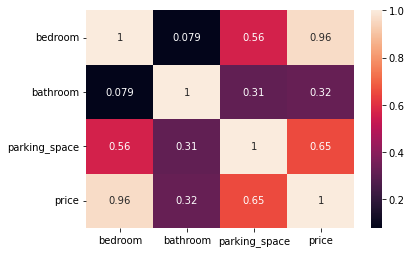

           loc           title  bedroom  bathroom  parking_space      price
7748   Zamfara  Terrace duplex     1.00       NaN           3.00  951312.54
12890  Zamfara  Terrace duplex     2.00      2.00           1.00 1054181.80
2154   Zamfara  Terrace duplex     2.00      6.00           2.00 1186178.75
7539   Zamfara  Terrace duplex     2.00      5.00           1.00 1134848.05
5310   Zamfara  Terrace duplex     2.00       NaN           1.00 1022943.41
606    Zamfara  Terrace duplex     3.00      2.00           3.00 1249492.92
3132   Zamfara  Terrace duplex     3.00      2.00           3.00 1185715.92
7105   Zamfara  Terrace duplex     3.00      1.00            NaN 1168190.03
6265   Zamfara  Terrace duplex     3.00      2.00           1.00 1228635.51
12871  Zamfara  Terrace duplex     4.00      3.00           1.00 1437224.27
9124   Zamfara  Terrace duplex     4.00      4.00           4.00 1529545.56
7026   Zamfara  Terrace duplex     4.00      1.00           2.00 1396048.76
13301  Zamfa

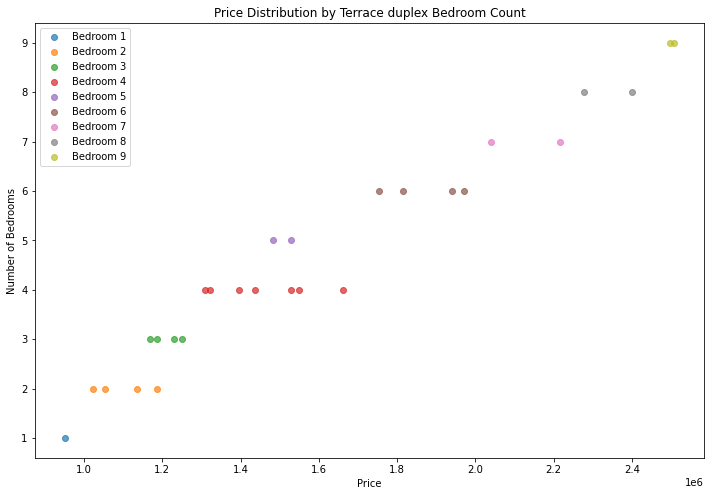



Analyzing Semi-detached duplex data:
        bedroom  bathroom parking_space          price
count  31.00000  26.00000      29.00000       36.00000
mean    4.16129   2.80769       2.96552  1479472.10771
std     2.05096   1.78928       1.05162   435119.87916
min     1.00000   1.00000       1.00000   838732.44850
25%     2.50000   1.25000       2.00000  1117020.62225
50%     5.00000   2.00000       3.00000  1460792.14400
75%     5.50000   4.00000       4.00000  1808797.46350
max     8.00000   6.00000       5.00000  2517828.28700


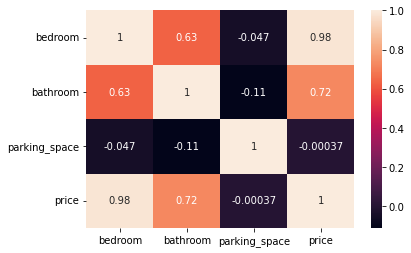

           loc                 title  bedroom  bathroom  parking_space  \
1449   Zamfara  Semi-detached duplex     1.00       NaN           4.00   
5918   Zamfara  Semi-detached duplex     1.00      6.00            NaN   
7182   Zamfara  Semi-detached duplex     1.00      1.00           3.00   
13184  Zamfara  Semi-detached duplex     1.00      4.00            NaN   
13741  Zamfara  Semi-detached duplex     2.00       NaN           2.00   
152    Zamfara  Semi-detached duplex     2.00      1.00           2.00   
12710  Zamfara  Semi-detached duplex     2.00      2.00           3.00   
11749  Zamfara  Semi-detached duplex     2.00       NaN           5.00   
13012  Zamfara  Semi-detached duplex     3.00       NaN           3.00   
4368   Zamfara  Semi-detached duplex     3.00      2.00           1.00   
10677  Zamfara  Semi-detached duplex     3.00       NaN           3.00   
8730   Zamfara  Semi-detached duplex     3.00      2.00           3.00   
5858   Zamfara  Semi-detached duplex  

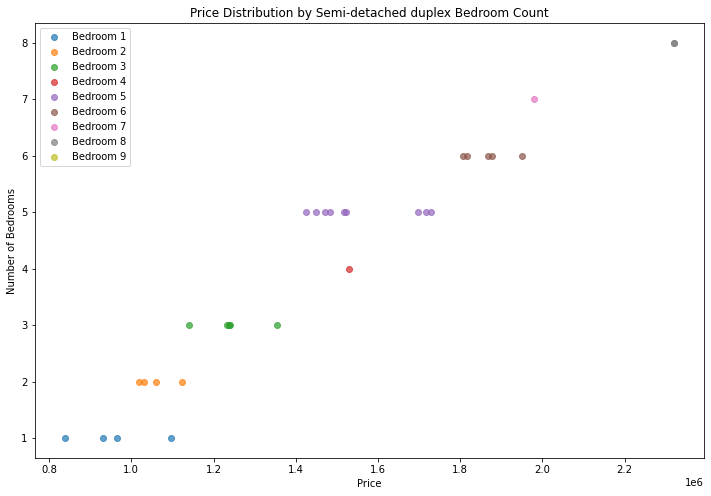



Analyzing Townhouse data:
        bedroom  bathroom parking_space          price
count  30.00000  32.00000      27.00000       35.00000
mean    3.33333   3.15625       3.22222  1511642.20234
std     2.12267   2.18661       1.64862   441460.79036
min     1.00000   1.00000       1.00000  1083262.45900
25%     2.00000   1.00000       2.00000  1220584.88300
50%     2.50000   2.00000       3.00000  1335064.01700
75%     4.00000   5.00000       4.00000  1743308.54300
max     8.00000   7.00000       6.00000  2526830.23600


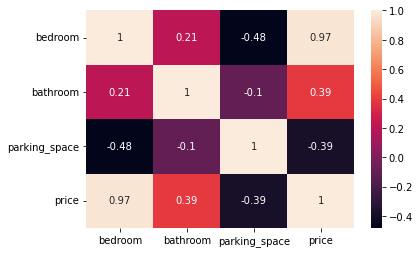

           loc      title  bedroom  bathroom  parking_space      price
2151   Zamfara  Townhouse     1.00       NaN           3.00 1106837.82
10235  Zamfara  Townhouse     1.00      6.00            NaN 1118326.83
7338   Zamfara  Townhouse     1.00      1.00           4.00 1090586.83
7180   Zamfara  Townhouse     2.00       NaN           2.00 1148055.25
12409  Zamfara  Townhouse     2.00      1.00           6.00 1220584.88
11461  Zamfara  Townhouse     2.00      2.00           4.00 1149313.21
10855  Zamfara  Townhouse     2.00      5.00           6.00 1357631.11
9763   Zamfara  Townhouse     2.00      1.00           3.00 1083262.46
7925   Zamfara  Townhouse     2.00      2.00            NaN 1254933.41
4653   Zamfara  Townhouse     2.00      5.00            NaN 1243768.35
13087  Zamfara  Townhouse     2.00      1.00            NaN 1220584.88
2386   Zamfara  Townhouse     2.00      1.00           1.00 1113543.24
3270   Zamfara  Townhouse     2.00      7.00           2.00 1335064.02
1942  

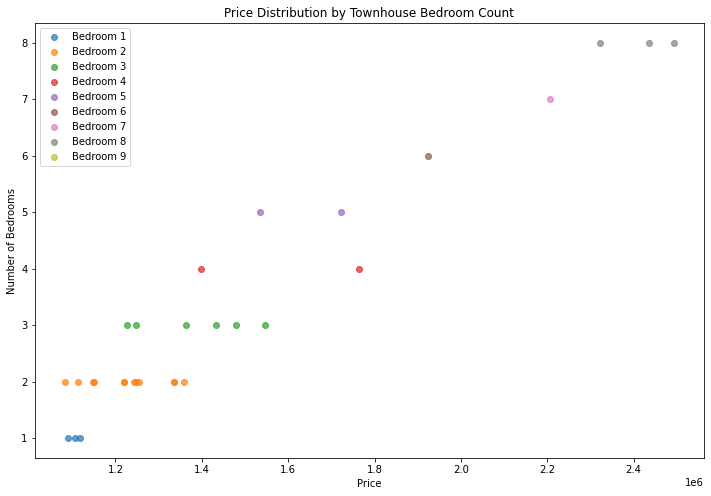



Analyzing Penthouse data:
        bedroom  bathroom parking_space          price
count  25.00000  25.00000      24.00000       26.00000
mean    3.72000   3.12000       2.75000  1940599.51108
std     1.86011   1.94336       1.56733   417836.68534
min     1.00000   1.00000       1.00000  1462266.79000
25%     2.00000   2.00000       2.00000  1656005.96450
50%     3.00000   2.00000       2.00000  1853092.12500
75%     5.00000   4.00000       4.00000  2086491.51725
max     9.00000   7.00000       6.00000  3204954.87100


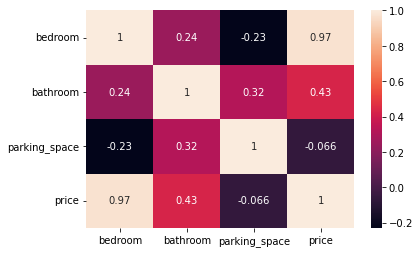

           loc      title  bedroom  bathroom  parking_space      price
1675   Zamfara  Penthouse     1.00      4.00           6.00 1462266.79
13496  Zamfara  Penthouse     2.00      1.00           1.00 1570066.83
12603  Zamfara  Penthouse     2.00      1.00           4.00 1481182.11
13182  Zamfara  Penthouse     2.00      4.00           2.00 1555593.55
1956   Zamfara  Penthouse     2.00      1.00            NaN 1646286.46
2324   Zamfara  Penthouse     2.00      6.00           5.00 1733486.55
2978   Zamfara  Penthouse     2.00      2.00           3.00 1554252.13
4423   Zamfara  Penthouse     2.00      2.00           4.00 1617637.14
7160   Zamfara  Penthouse     3.00      2.00           2.00 1819755.35
4269   Zamfara  Penthouse     3.00      2.00           2.00 1685164.48
13062  Zamfara  Penthouse     3.00       NaN           3.00 1688247.64
910    Zamfara  Penthouse     3.00      3.00           6.00 1848121.78
12202  Zamfara  Penthouse     3.00      7.00           2.00 1907864.61
12861 

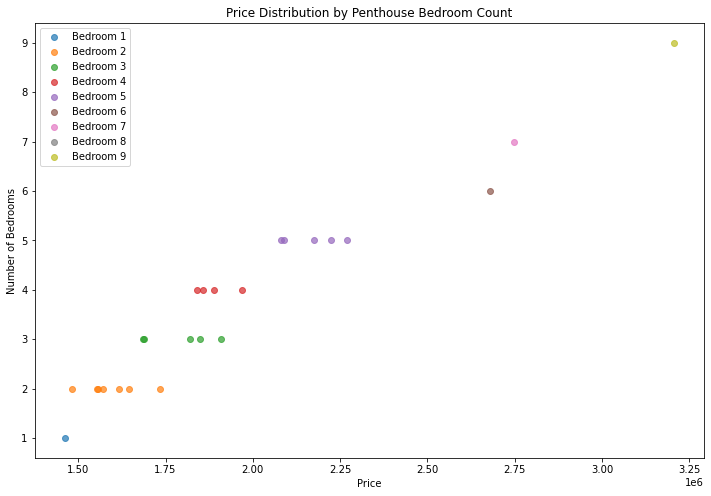



Analyzing Cottage data:
       bedroom bathroom parking_space          price
count  5.00000  7.00000       6.00000        8.00000
mean   3.60000  1.57143       3.33333  1221300.20616
std    1.34164  0.53452       1.03280   219796.86711
min    2.00000  1.00000       2.00000   900234.60630
25%    3.00000  1.00000       2.50000  1086025.82175
50%    3.00000  2.00000       4.00000  1184027.51950
75%    5.00000  2.00000       4.00000  1374277.16625
max    5.00000  2.00000       4.00000  1525238.33400


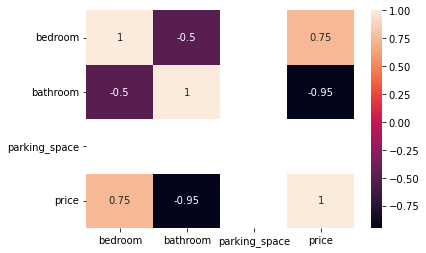

           loc    title  bedroom  bathroom  parking_space      price
970    Zamfara  Cottage     2.00       NaN            NaN 1041337.91
4967   Zamfara  Cottage     3.00      2.00           4.00  900234.61
6928   Zamfara  Cottage     3.00      1.00            NaN 1210554.85
4165   Zamfara  Cottage     5.00      1.00           4.00 1525238.33
13598  Zamfara  Cottage     5.00      2.00           4.00 1100921.79
3946   Zamfara  Cottage      NaN      2.00           2.00 1331247.35
9337   Zamfara  Cottage      NaN      2.00           2.00 1157500.19
10786  Zamfara  Cottage      NaN      1.00           4.00 1503366.62


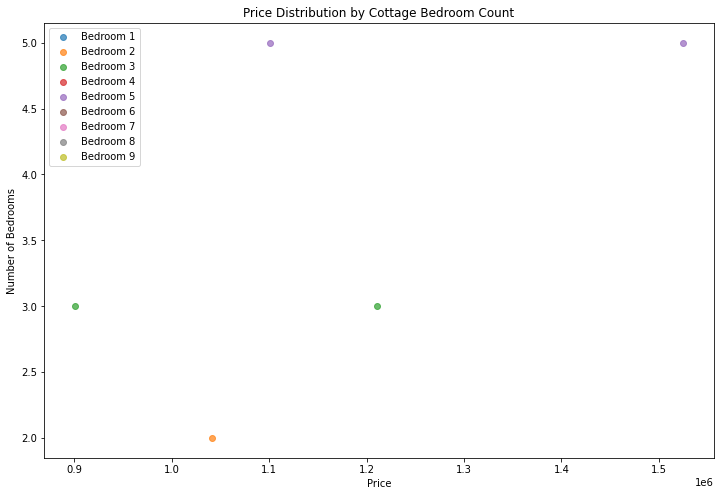

In [279]:
# Zamfara
Zamfara = housing_train[housing_train["loc" ] == "Zamfara"]

house_types = [
    "Mansion", "Detached duplex", "Apartment", "Bungalow", "Flat",
    "Terrace duplex", "Semi-detached duplex", "Townhouse",
    "Penthouse", "Cottage"
]

for house_type in house_types:
    print(f"Analyzing {house_type} data:")
    analyze_house_type(Zamfara, house_type)
    print("\n")

In [ ]:
Cross River     31
Anambra         28
Ogun            28
Edo             25
Oyo             23
Ondo            19
Osun            19
Imo             17
Enugu           16
Niger           14
Nasarawa        14
Plateau         12
Kano            12
Benue           11
Adamawa         10
Katsina         10
Ekiti            9
Kaduna           9
Gombe            8
Jigawa           8
Kwara            8
Yobe             7
Taraba           6
Bauchi           5
Kebbi            5
Abia             4
Ebonyi           4
Borno            3
Kogi             2
Sokoto           2
Zamfara          2

In [30]:
#Categorizing our columns
training_cols = [cname for cname in housing_train.loc[:,:'parking_space'].columns]

# Select numerical columns
float_cols = [cname for cname in housing_train.loc[:,:'parking_space'].columns if 
                housing_train[cname].dtype in ['float64']]

categorical_cols = [cname for cname in housing_train.loc[:,:'parking_space'].columns if 
                housing_train[cname].dtype in ['object']]

target =  housing_train["price"]

categorical_cols

['loc', 'title']

Imputing Numerical Feature with KNN

In [ ]:
#from sklearn.impute import KNNImputer
#imputer = KNNImputer(n_neighbors=5)
#housing_train.loc[:,float_cols] = imputer.fit_transform(housing_train.loc[:,float_cols])

In [92]:
convert = {
    "bedroom" : "int" ,
    "bathroom": "int" ,
    "parking_space": "int" 
}
housing_train = housing_train.astype(convert)

In [32]:
housing_train.isnull().sum()

ID                  0
loc              1813
title            1722
bedroom             0
bathroom            0
parking_space       0
price               0
dtype: int64

### Checking Target


HousePrice : mean: 2138081.7487, std: 1083056.6649, skew: 2.4518


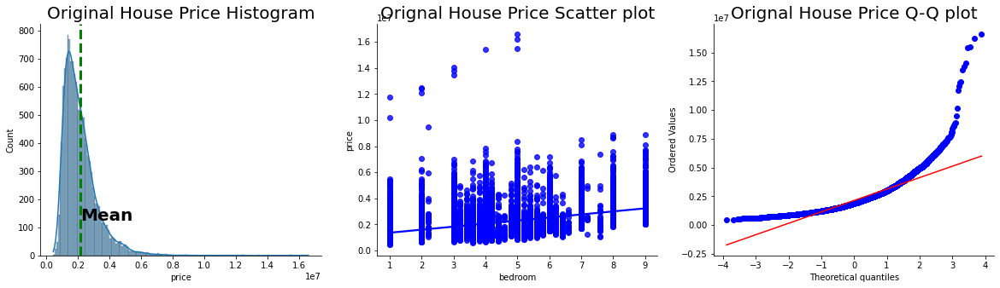

In [33]:
plt.figure(figsize = (20,5))
ax1 = plt.subplot(1,3,1)
sns.histplot(housing_train["price"], kde=True)
ax1.axvline(x=housing_train["price"].mean(), color='g', linestyle='--', linewidth=3)
ax1.text(housing_train["price"].mean(), 125, "Mean", horizontalalignment='left', size=20, color='black', weight='semibold')
ax1.set_title('Original House Price Histogram',fontsize=20)

ax2 = plt.subplot(1,3,2)
sns.regplot(data=housing_train, y="price",x="bedroom" ,ax=ax2,color='Blue')
ax2.set_title('Orignal House Price Scatter plot',fontsize=20)

ax3 = plt.subplot(1,3,3)
stats.probplot(housing_train["price"],dist = stats.norm, plot = ax3)
ax3.set_title('Orignal House Price Q-Q plot',fontsize=20)
sns.despine()

mean = housing_train["price"].mean()
std = housing_train["price"].std()
skew = housing_train["price"].skew()
print('HousePrice : mean: {0:.4f}, std: {1:.4f}, skew: {2:.4f}'.format(mean, std, skew))

In [34]:
housing_train["priceCpy"] = np.log(housing_train["price"])


HousePrice : mean: 14.4719, std: 0.4451, skew: 0.2956


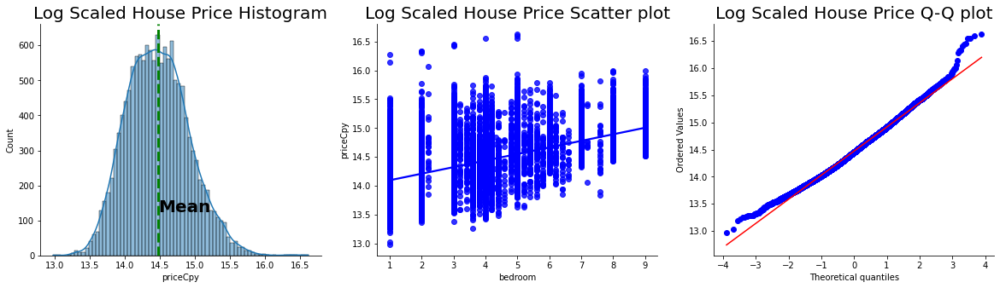

In [35]:
plt.figure(figsize = (20,5))
ax1 = plt.subplot(1,3,1)
sns.histplot(housing_train["priceCpy"], kde=True)
ax1.axvline(x=housing_train["priceCpy"].mean(), color='g', linestyle='--', linewidth=3)
ax1.text(housing_train["priceCpy"].mean(), 125, "Mean", horizontalalignment='left', size=20, color='black', weight='semibold')
ax1.set_title('Log Scaled House Price Histogram',fontsize=20)

ax2 = plt.subplot(1,3,2)
sns.regplot(data=housing_train, y="priceCpy",x="bedroom" ,ax=ax2,color='Blue')
ax2.set_title('Log Scaled House Price Scatter plot',fontsize=20)

ax3 = plt.subplot(1,3,3)
stats.probplot(housing_train["priceCpy"],dist = stats.norm, plot = ax3)
ax3.set_title('Log Scaled House Price Q-Q plot',fontsize=20)
sns.despine()

mean = housing_train["priceCpy"].mean()
std = housing_train["priceCpy"].std()
skew = housing_train["priceCpy"].skew()
print('HousePrice : mean: {0:.4f}, std: {1:.4f}, skew: {2:.4f}'.format(mean, std, skew))

## Are there any outliers in the price variable? How do these outliers impact the overall analysis?

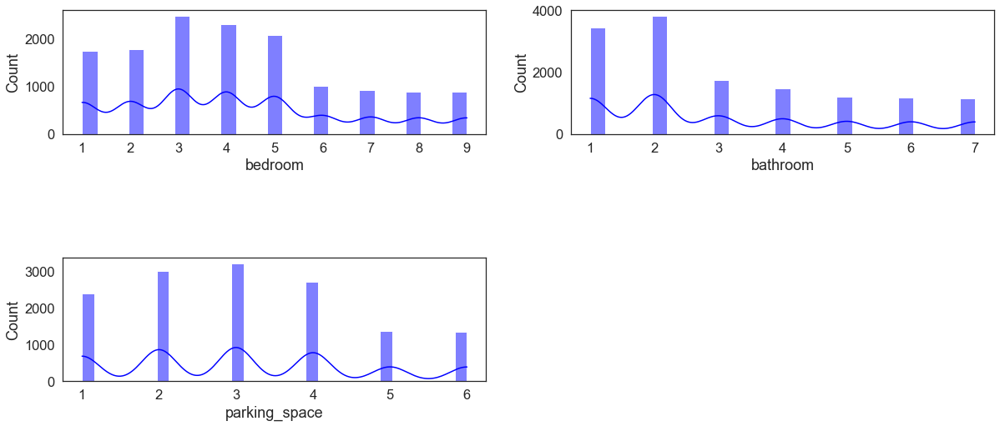

In [98]:
i = 1
sns.set(font_scale=1.5)
sns.set_style("white")
sns.set_palette("Blues_r")
plt.figure(figsize=(20, 30))
plt.subplots_adjust(hspace=1)

for feature in float_cols:
    plt.subplot(6, 2, i)
    sns.histplot(data=housing_train, x=feature, kde=True, color='blue')
    plt.xlabel(feature)
    i = i + 1


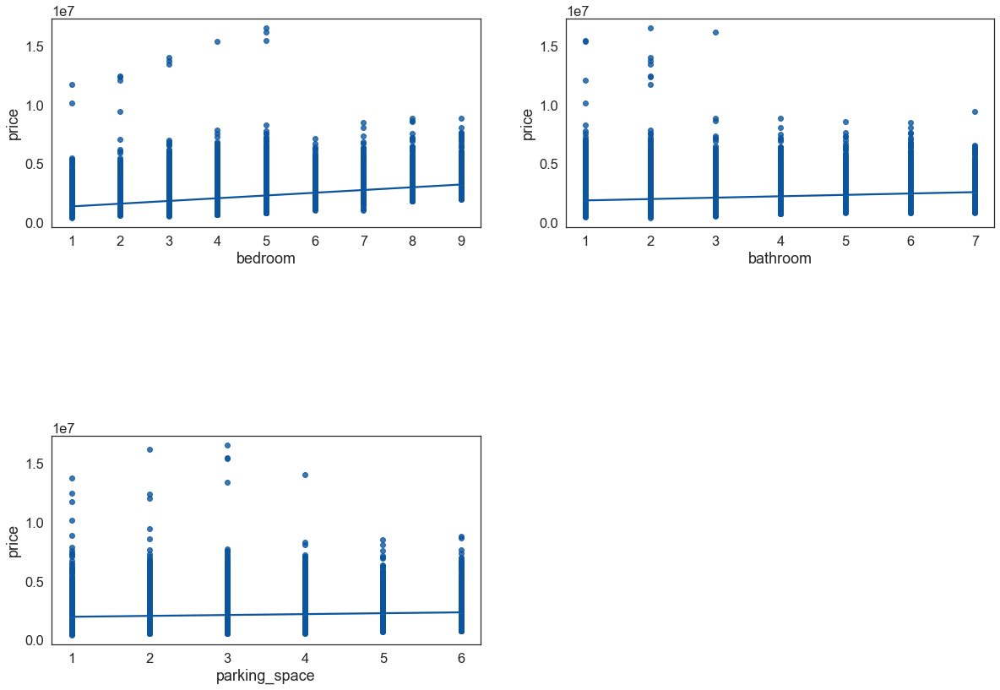

In [97]:
i = 1
sns.set(font_scale = 1.5)
sns.set_style("white")
sns.set_palette("Blues_r")
plt.figure(figsize=(20,50))
plt.subplots_adjust(hspace=1)
for feature in float_cols:
    plt.subplot(6,2,i)
    sns.regplot(data=housing_train, x=feature,y='price')
    i = i +1

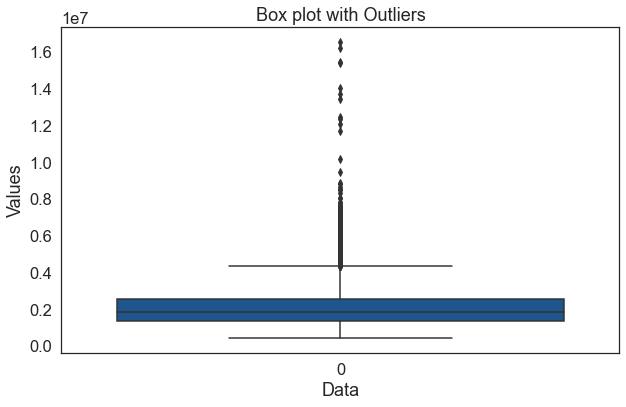

In [57]:
# Plot the data with outliers highlighted
plt.figure(figsize=(10, 6))
sns.boxplot(data=housing_train["price"])
plt.xlabel('Data')
plt.ylabel('Values')
plt.title('Box plot with Outliers')
plt.show()

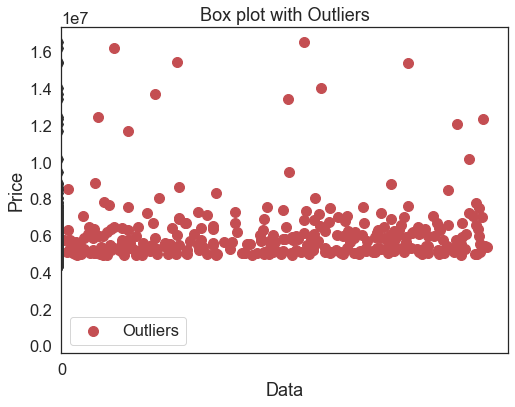

In [125]:
# Detect outliers using the IQR method
outlier_indices = outlier_iqr(housing_train["price"])

# Plot the data with outliers highlighted
plt.figure(figsize=(8, 6))
sns.boxplot(data=housing_train["price"])
plt.scatter(np.array(outlier_indices), housing_train["price"].iloc[outlier_indices], color='r', label='Outliers', s=100)
plt.xlabel('Data')
plt.ylabel('Price')
plt.title('Box plot with Outliers')
plt.legend()
plt.show()


###  How does the number of bedrooms, bathrooms, and parking spaces relate to the house prices? Is there any correlation between these discrete numerical features and the target variable (price)?

In [96]:
corr= housing_train.corr()
corr

,bedroom,bathroom,parking_space,price,priceCpy,cluster
bedroom,1.000000,0.233512,0.101344,0.496755,0.588567,0.092129
bathroom,0.233512,1.000000,0.191750,0.211333,0.264417,0.040241
parking_space,0.101344,0.191750,1.000000,0.106218,0.136870,0.008864
price,0.496755,0.211333,0.106218,1.000000,0.939567,0.195906
priceCpy,0.588567,0.264417,0.136870,0.939567,1.000000,0.244159
cluster,0.092129,0.040241,0.008864,0.195906,0.244159,1.000000


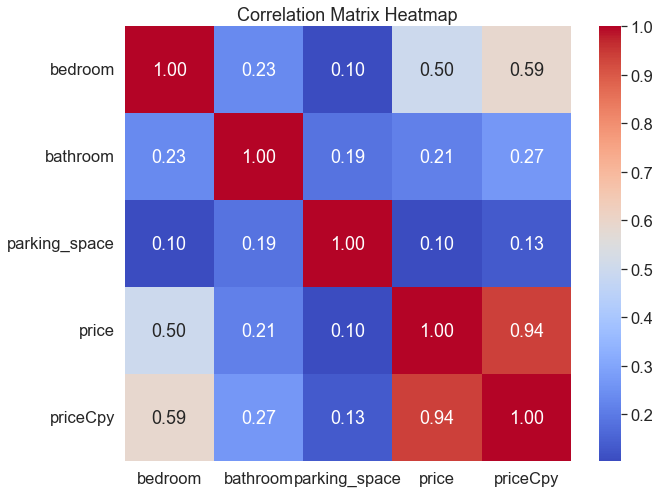

In [95]:
# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()


### How do the number of bedrooms, bathrooms, and parking spaces vary across different house types?

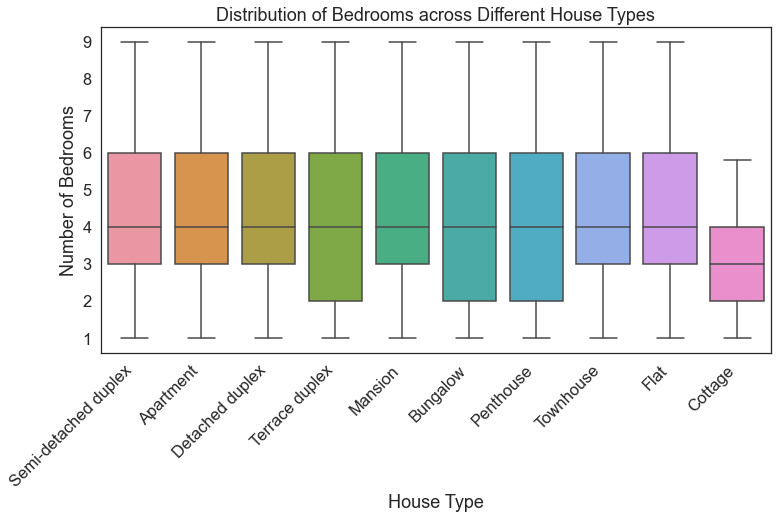

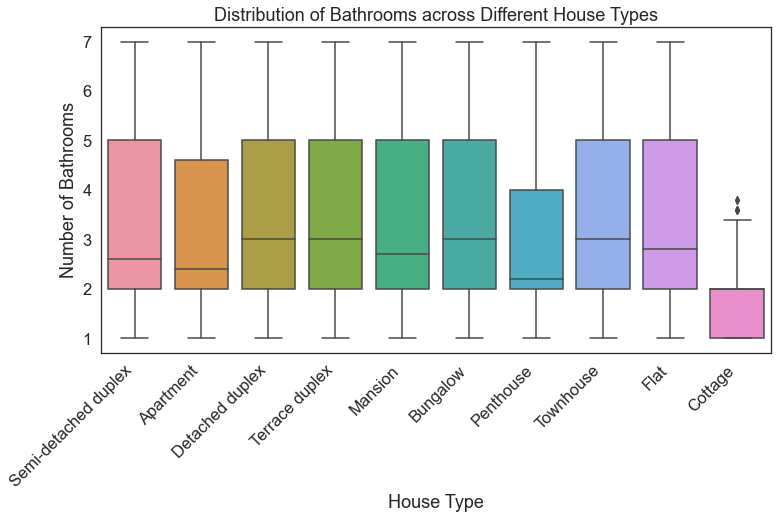

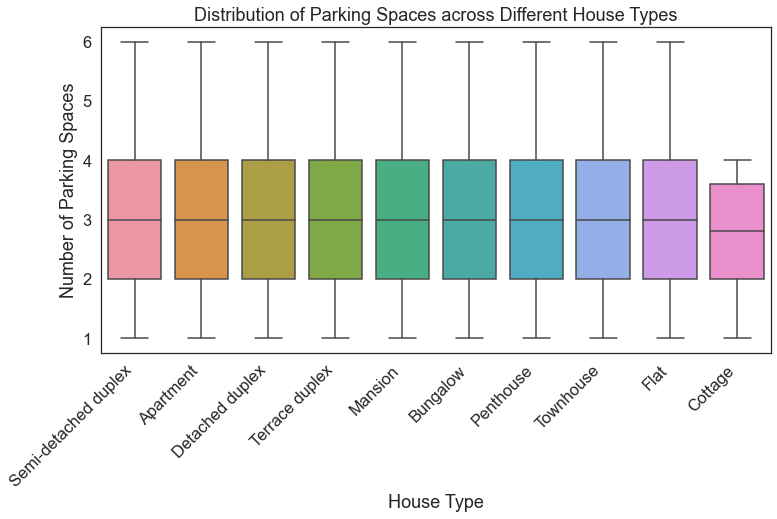

In [84]:

# Create a box plot to visualize the distribution of bedrooms for each house type
plt.figure(figsize=(12, 6))
sns.boxplot(data=housing_train, x='title', y='bedroom')
plt.xticks(rotation=45, ha='right')
plt.xlabel('House Type')
plt.ylabel('Number of Bedrooms')
plt.title('Distribution of Bedrooms across Different House Types')
plt.show()

# Create a box plot to visualize the distribution of bathrooms for each house type
plt.figure(figsize=(12, 6))
sns.boxplot(data=housing_train, x='title', y='bathroom')
plt.xticks(rotation=45, ha='right')
plt.xlabel('House Type')
plt.ylabel('Number of Bathrooms')
plt.title('Distribution of Bathrooms across Different House Types')
plt.show()

# Create a box plot to visualize the distribution of parking spaces for each house type
plt.figure(figsize=(12, 6))
sns.boxplot(data=housing_train, x='title', y='parking_space')
plt.xticks(rotation=45, ha='right')
plt.xlabel('House Type')
plt.ylabel('Number of Parking Spaces')
plt.title('Distribution of Parking Spaces across Different House Types')
plt.show()


### Which house type (title) is the most common in the dataset? How does the price vary across different house types?

In [69]:
# Count the occurrences of each house type
house_type_counts = housing_train['title'].value_counts()

# Find the most common house type
most_common_house_type = house_type_counts.idxmax()

print(house_type_counts)
print("The most common house type is:", most_common_house_type)


Flat                    1372
Apartment               1331
Townhouse               1327
Mansion                 1322
Detached duplex         1312
Penthouse               1306
Semi-detached duplex    1299
Bungalow                1293
Terrace duplex          1266
Cottage                  450
Name: title, dtype: int64
The most common house type is: Flat


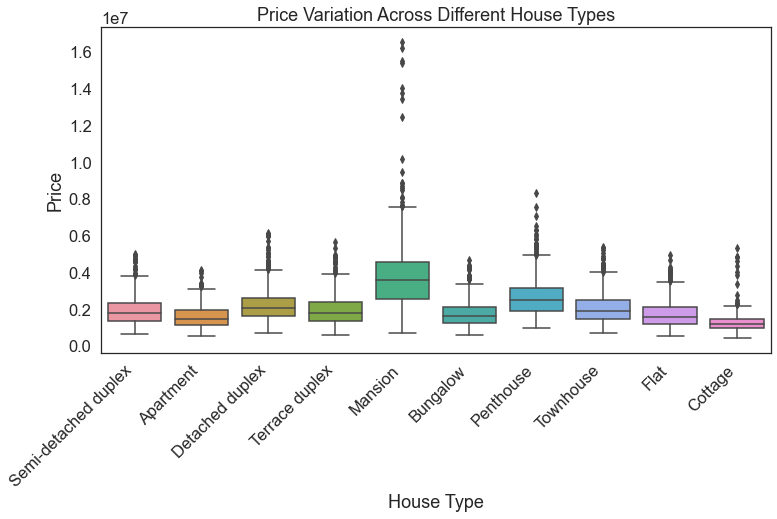

In [70]:
# Create a box plot to visualize price variation across different house types
plt.figure(figsize=(12, 6))
sns.boxplot(data=housing_train, x='title', y='price')
plt.xticks(rotation=45, ha='right')
plt.xlabel('House Type')
plt.ylabel('Price')
plt.title('Price Variation Across Different House Types')
plt.show()


## Are there any particular states or house types that consistently have higher or lower prices compared to others? 

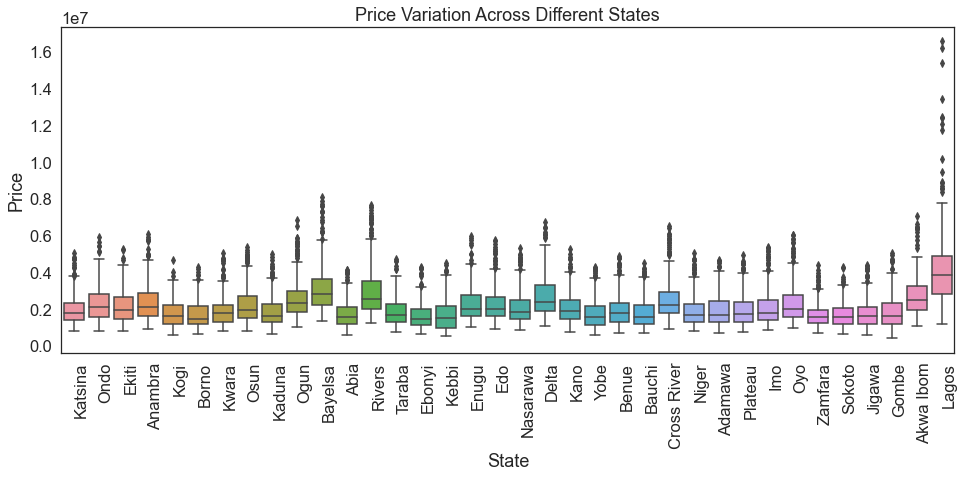

In [78]:
# Create a box plot to visualize price variation across different states
plt.figure(figsize=(16, 6))
sns.boxplot(data=housing_train, x='loc', y='price')
plt.xticks(rotation=90, ha='left')
plt.xlabel('State')
plt.ylabel('Price')
plt.title('Price Variation Across Different States')
plt.show()

### Is there any relationship between the location and the house type? Are certain house types more common in specific states?

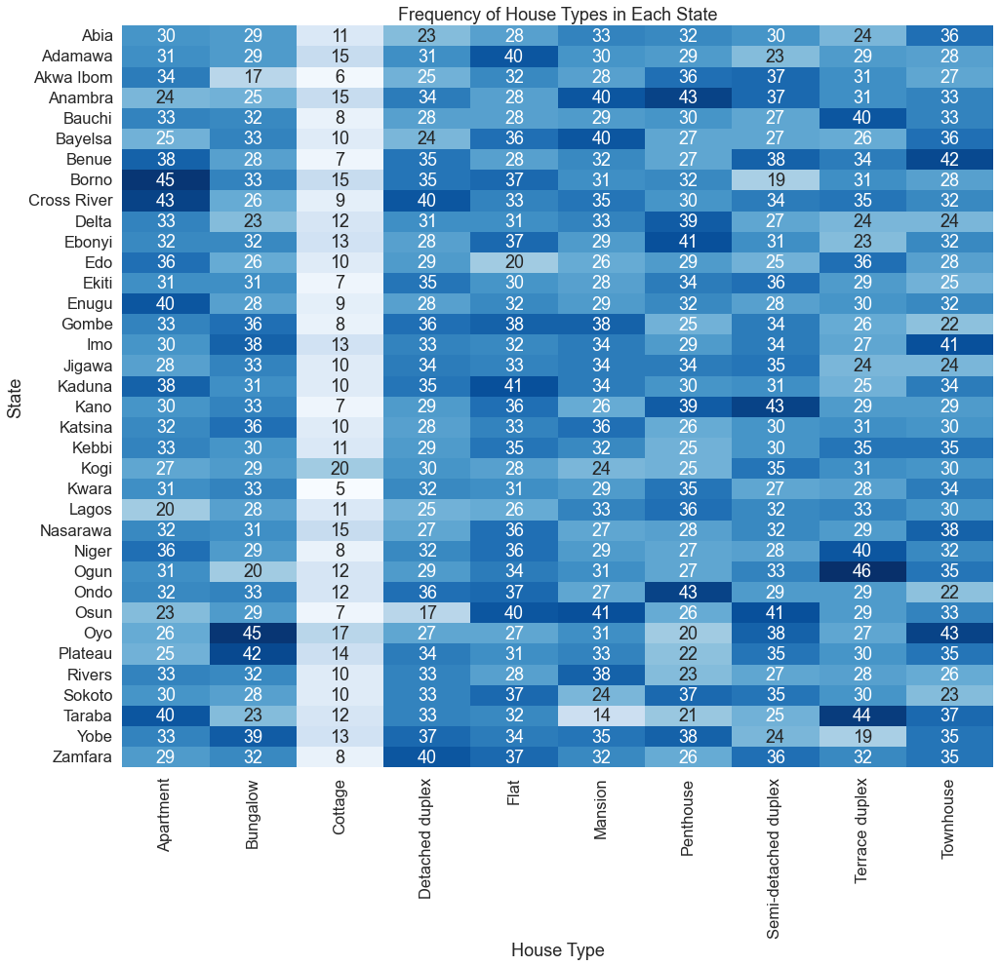

In [81]:
# Create a cross-tabulation (crosstab) to count the frequency of each house type in each state
house_type_by_state = pd.crosstab(housing_train['loc'], housing_train['title'])

# Create a heatmap to visualize the frequency of each house type in each state
plt.figure(figsize=(16, 14))
sns.heatmap(house_type_by_state, cmap='Blues', annot=True, fmt='d', cbar=False)
plt.xlabel('House Type')
plt.ylabel('State')
plt.title('Frequency of House Types in Each State')
plt.show()


## What are the average prices for different house types and locations? 

In [117]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the average price for each house type
average_prices_by_house_type = housing_train.groupby('title')['price'].mean()

# Calculate the average price for each location
average_prices_by_location = housing_train.groupby('loc')['price'].mean()

# Display the average prices
print("Average Prices by House Type:")
print(average_prices_by_house_type)

print("\nAverage Prices by Location:")
print(average_prices_by_location)

Average Prices by House Type:
title
Apartment              1567003.67
Bungalow               1733845.15
Cottage                1307817.29
Detached duplex        2205883.00
Flat                   1721875.46
Mansion                3725768.36
Penthouse              2628945.18
Semi-detached duplex   1918467.57
Terrace duplex         1927269.65
Townhouse              2056125.05
Name: price, dtype: float64

Average Prices by Location:
loc
Abia          1717083.36
Adamawa       1905286.96
Akwa Ibom     2725454.33
Anambra       2337230.07
Bauchi        1772960.73
Bayelsa       3112321.67
Benue         1920460.83
Borno         1735703.59
Cross River   2507765.01
Delta         2712493.15
Ebonyi        1635849.64
Edo           2310451.77
Ekiti         2109220.25
Enugu         2272886.72
Gombe         1860851.42
Imo           2067489.41
Jigawa        1735867.36
Kaduna        1846993.47
Kano          2081931.00
Katsina       1947589.33
Kebbi         1616371.56
Kogi          1763415.90
Kwara        

## Can we identify any patterns or clusters of houses based on their features and prices? For example, are there certain groups of houses that share similar characteristics and price ranges?

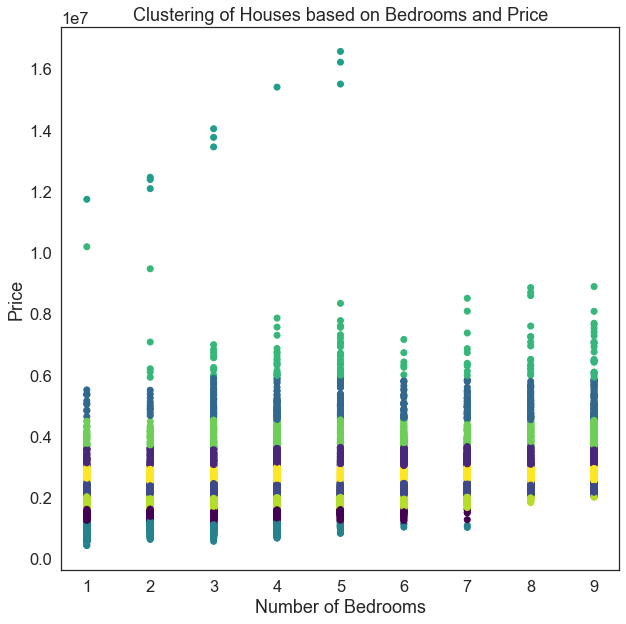

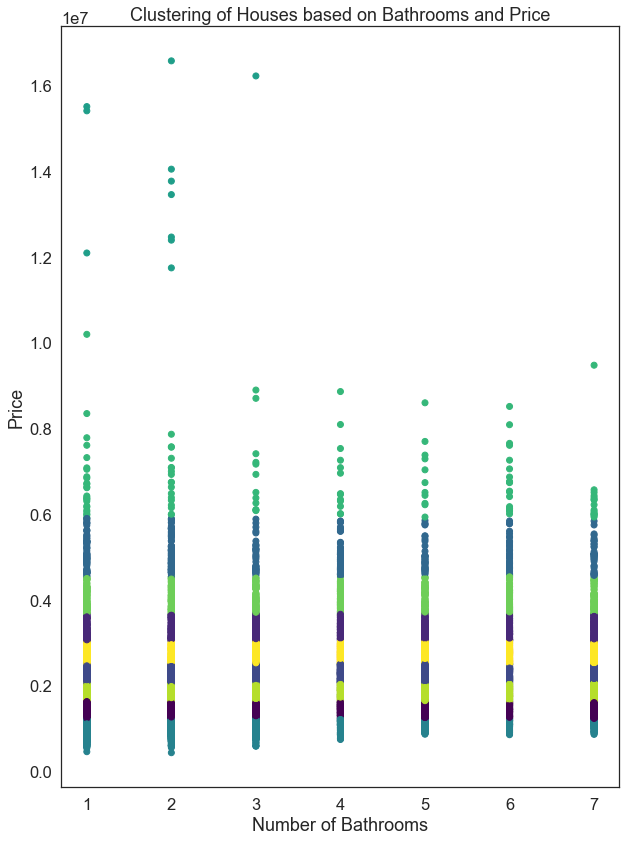

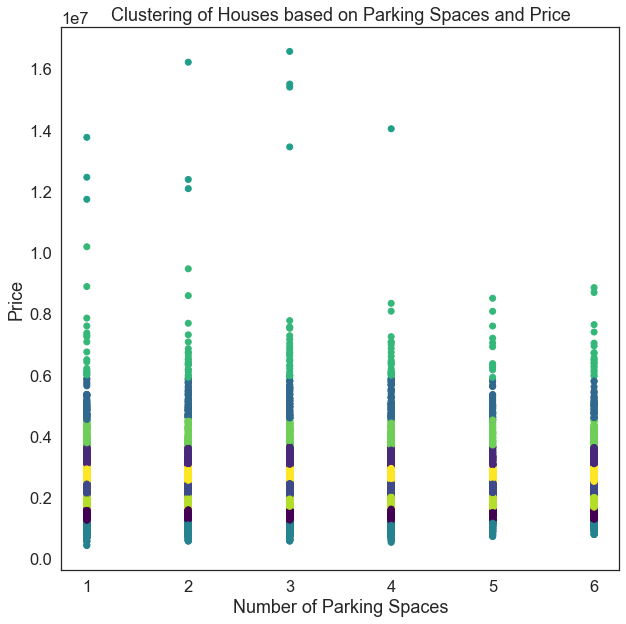

In [114]:
from sklearn.cluster import KMeans

# Extract the numerical features and the target variable (price)
X = housing_train[['bedroom', 'bathroom', 'parking_space', 'price']]

# Choose the number of clusters (k) - You can experiment with different values of k
k = 10

# Perform K-means clustering
kmeans = KMeans(n_clusters=k, random_state=42)
housing_train['cluster'] = kmeans.fit_predict(X)

# Visualize the clusters in a scatter plot
plt.figure(figsize=(10, 10))
plt.scatter(housing_train['bedroom'], housing_train['price'], c=housing_train['cluster'], cmap='viridis')
plt.xlabel('Number of Bedrooms')
plt.ylabel('Price')
plt.title('Clustering of Houses based on Bedrooms and Price')
plt.show()

plt.figure(figsize=(10, 14))
plt.scatter(housing_train['bathroom'], housing_train['price'], c=housing_train['cluster'], cmap='viridis')
plt.xlabel('Number of Bathrooms')
plt.ylabel('Price')
plt.title('Clustering of Houses based on Bathrooms and Price')
plt.show()

plt.figure(figsize=(10, 10))
plt.scatter(housing_train['parking_space'], housing_train['price'], c=housing_train['cluster'], cmap='viridis')
plt.xlabel('Number of Parking Spaces')
plt.ylabel('Price')
plt.title('Clustering of Houses based on Parking Spaces and Price')
plt.show()


In [115]:

# Extract the cluster centers (centroids)
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=['bedroom', 'bathroom', 'parking_space', 'price'])

# Extract the cluster details for each data point
cluster_details = pd.concat([X, housing_train['cluster']], axis=1)


# Set the display format for floating-point numbers
pd.options.display.float_format = '{:.2f}'.format

# Print the details of each cluster
for cluster_id in range(k):
    cluster_data = cluster_details[cluster_details['cluster'] == cluster_id]
    print(f"\nCluster {cluster_id} Details:")
    print(cluster_data.describe())

# You can also access individual clusters by filtering the DataFrame
cluster_0_data = cluster_details[cluster_details['cluster'] == 0]
cluster_1_data = cluster_details[cluster_details['cluster'] == 1]
cluster_2_data = cluster_details[cluster_details['cluster'] == 2]
cluster_3_data = cluster_details[cluster_details['cluster'] == 3]
cluster_4_data = cluster_details[cluster_details['cluster'] == 4]
cluster_5_data = cluster_details[cluster_details['cluster'] == 5]
cluster_6_data = cluster_details[cluster_details['cluster'] == 6]
cluster_7_data = cluster_details[cluster_details['cluster'] == 7]
cluster_8_data = cluster_details[cluster_details['cluster'] == 8]
cluster_9_data = cluster_details[cluster_details['cluster'] == 9]

# Optionally, you can drop the 'cluster' column if you don't need it anymore
housing_train.drop('cluster', axis=1, inplace=True)



Cluster 0 Details:
       bedroom  bathroom  parking_space      price  cluster
count  3037.00   3037.00        3037.00    3037.00  3037.00
mean      3.03      2.66           2.95 1426943.22     0.00
std       1.33      1.77           1.43  114516.96     0.00
min       1.00      1.00           1.00 1228352.30     0.00
25%       2.00      1.00           2.00 1329847.33     0.00
50%       3.00      2.00           3.00 1426263.41     0.00
75%       4.00      4.00           4.00 1525256.83     0.00
max       7.00      7.00           6.00 1631232.19     0.00

Cluster 1 Details:
       bedroom  bathroom  parking_space      price  cluster
count  1036.00   1036.00        1036.00    1036.00  1036.00
mean      6.05      3.79           3.42 3307920.47     1.00
std       2.34      1.98           1.62  183431.41     0.00
min       1.00      1.00           1.00 3027184.27     1.00
25%       4.00      2.00           2.00 3145509.82     1.00
50%       6.00      4.00           3.00 3291215.58     1.00


# Data Preprocessing

In [153]:
# Solving the categorical missing value with three method

mode_method = housing_train.copy() 

# Fill missing values for categorical features using the most-frequent strategy
for feature in categorical_cols:
    most_frequent_value = mode_method[feature].mode().iloc[0]
    mode_method[feature].fillna(most_frequent_value, inplace=True)
    

drop_method = housing_train.copy() 

drop_method.dropna(inplace=True , axis=1)


In [154]:
mode_method.describe()

,bedroom,bathroom,parking_space,price,priceCpy
count,14000.00,14000.00,14000.00,14000.00,14000.00
mean,4.25,3.09,3.12,2138081.75,14.47
std,2.31,1.94,1.52,1083056.66,0.45
min,1.00,1.00,1.00,431967.29,12.98
25%,2.00,2.00,2.00,1393989.52,14.15
50%,4.00,2.00,3.00,1895223.07,14.45
75%,6.00,5.00,4.00,2586699.49,14.77
max,9.00,7.00,6.00,16568486.16,16.62


In [155]:
mode_method=mode_method[mode_method["priceCpy"] < 15.7]

In [168]:
drop_method.drop("price",inplace=True, axis=1)

drop_method = pd.get_dummies(drop_method, drop_first=True)

X = drop_method.drop('priceCpy',axis=1,errors='ignore')
y = drop_method['priceCpy']

HousePrice : mean: 14.4719, std: 0.4451, skew: 0.2956


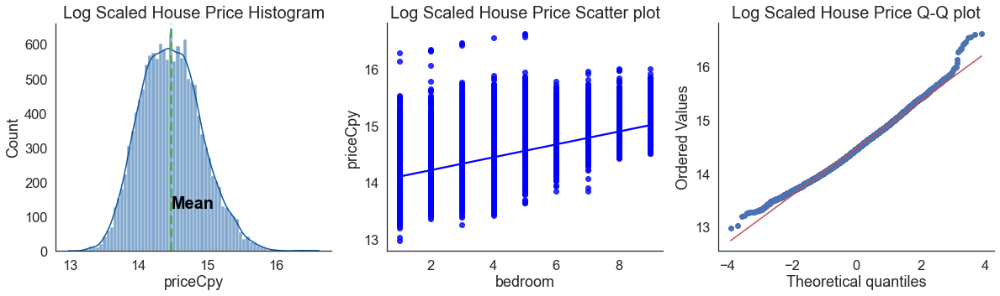

In [156]:
plt.figure(figsize = (20,5))
ax1 = plt.subplot(1,3,1)
sns.histplot(housing_train["priceCpy"], kde=True)
ax1.axvline(x=housing_train["priceCpy"].mean(), color='g', linestyle='--', linewidth=3)
ax1.text(housing_train["priceCpy"].mean(), 125, "Mean", horizontalalignment='left', size=20, color='black', weight='semibold')
ax1.set_title('Log Scaled House Price Histogram',fontsize=20)

ax2 = plt.subplot(1,3,2)
sns.regplot(data=housing_train, y="priceCpy",x="bedroom" ,ax=ax2,color='Blue')
ax2.set_title('Log Scaled House Price Scatter plot',fontsize=20)

ax3 = plt.subplot(1,3,3)
stats.probplot(housing_train["priceCpy"],dist = stats.norm, plot = ax3)
ax3.set_title('Log Scaled House Price Q-Q plot',fontsize=20)
sns.despine()

mean = housing_train["priceCpy"].mean()
std = housing_train["priceCpy"].std()
skew = housing_train["priceCpy"].skew()
print('HousePrice : mean: {0:.4f}, std: {1:.4f}, skew: {2:.4f}'.format(mean, std, skew))

In [157]:
mode_method.drop("price",inplace=True, axis=1)

In [158]:
mode_method = pd.get_dummies(mode_method, drop_first=True)

In [173]:
X = mode_method.drop('priceCpy',axis=1,errors='ignore')
y = mode_method['priceCpy']

In [174]:
X_train, X_val, y_train, y_val =  train_test_split(
    X,y,test_size=0.2, random_state=42
)

In [175]:
y_mean = y_train.mean()
y_pred_baseline = [y_mean] * len(y_train)
print("Mean apt price:", y_mean)
print("Baseline MAE:", mean_absolute_error(y_train, y_pred_baseline))

Mean apt price: 14.464306358344544
Baseline MAE: 0.35348063004185554


In [162]:
cor = mode_method.corr()
cor

,bedroom,bathroom,parking_space,priceCpy,loc_Adamawa,loc_Akwa Ibom,loc_Anambra,loc_Bauchi,loc_Bayelsa,loc_Benue,...,loc_Zamfara,title_Bungalow,title_Cottage,title_Detached duplex,title_Flat,title_Mansion,title_Penthouse,title_Semi-detached duplex,title_Terrace duplex,title_Townhouse
bedroom,1.00,0.23,0.10,0.60,-0.00,-0.00,-0.01,0.00,0.00,-0.00,...,-0.00,0.01,-0.10,0.01,0.02,-0.01,0.00,0.01,0.01,-0.00
bathroom,0.23,1.00,0.19,0.27,-0.01,0.00,-0.01,0.02,0.00,0.01,...,0.01,0.03,-0.14,0.01,0.01,0.00,-0.02,0.01,0.03,0.01
parking_space,0.10,0.19,1.00,0.14,-0.01,-0.00,0.01,-0.00,-0.01,0.00,...,-0.01,0.01,-0.07,0.01,0.00,-0.01,0.01,0.00,-0.00,0.00
priceCpy,0.60,0.27,0.14,1.00,-0.03,0.10,0.04,-0.06,0.14,-0.03,...,-0.07,-0.12,-0.19,0.06,-0.08,0.39,0.19,-0.05,-0.04,0.01
loc_Adamawa,-0.00,-0.01,-0.01,-0.03,1.00,-0.02,-0.03,-0.03,-0.02,-0.03,...,-0.03,-0.00,0.01,-0.00,0.02,-0.00,-0.00,-0.01,-0.00,-0.01
loc_Akwa Ibom,-0.00,0.00,-0.00,0.10,-0.02,1.00,-0.03,-0.02,-0.02,-0.03,...,-0.02,-0.02,-0.01,-0.01,0.02,-0.00,0.01,0.01,0.00,-0.01
loc_Anambra,-0.01,-0.01,0.01,0.04,-0.03,-0.03,1.00,-0.03,-0.03,-0.03,...,-0.03,-0.01,0.01,-0.00,0.00,0.01,0.01,0.00,-0.00,-0.00
loc_Bauchi,0.00,0.02,-0.00,-0.06,-0.03,-0.02,-0.03,1.00,-0.02,-0.03,...,-0.03,0.00,-0.01,-0.01,0.01,-0.00,-0.00,-0.01,0.01,0.00
loc_Bayelsa,0.00,0.00,-0.01,0.14,-0.02,-0.02,-0.03,-0.02,1.00,-0.03,...,-0.02,0.00,-0.00,-0.01,0.02,0.00,-0.01,-0.01,-0.01,0.01
loc_Benue,-0.00,0.01,0.00,-0.03,-0.03,-0.03,-0.03,-0.03,-0.03,1.00,...,-0.03,-0.01,-0.01,0.00,-0.01,-0.00,-0.01,0.01,0.00,0.01


In [163]:
abs_corr = abs(cor['priceCpy']).sort_values()[:-1]
low_corr_list = abs_corr[abs_corr.values == 0].index
mode_method.drop(low_corr_list, axis=1,inplace=True)

In [164]:
high_corr_list = abs_corr[abs_corr.values > 0].index
high_corr_list = high_corr_list[::-1]

In [171]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler

# Create a Ridge regression model
ridge_model = Ridge(alpha=1.0)  # You can adjust the value of alpha here

# Perform cross-validation to evaluate the model
scores = cross_val_score(ridge_model, X_train, y_train, cv=5)  # 5-fold cross-validation

# Print the mean and standard deviation of the cross-validation scores
print("Mean Cross-Validation Score:", scores.mean())
print("Standard Deviation of Cross-Validation Scores:", scores.std())


Mean Cross-Validation Score: 0.36859784831560943
Standard Deviation of Cross-Validation Scores: 0.02258424539767612


In [176]:
rf = RandomForestRegressor()

param_rf = {"n_estimators" : [5, 10, 15, 20], "min_samples_split" : [2, 3, 5, 10], 
                 "max_features" : ["auto", "log2"]}

grid_rf = GridSearchCV(rf, param_rf,cv=5, n_jobs=1, verbose=1)

grid_rf.fit(X_train,y_train)

print("Best RandomForestRegressor Model: " + str(grid_rf.best_estimator_))

rf_pred_training = grid_rf.predict(X_train)

print("RandomForestRegressor MAE:", mean_absolute_error(y_train,rf_pred_training))

Fitting 5 folds for each of 32 candidates, totalling 160 fits
Best RandomForestRegressor Model: RandomForestRegressor(max_features='log2', min_samples_split=10,
                      n_estimators=20)
RandomForestRegressor MAE: 0.11980384763417917
